In [4]:
import os
import tqdm
import numpy as np 
import numpy.ma as ma
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import array_to_latex as a2l
import matplotlib as mpl
from functools import reduce, partial 

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "sans-serif",
    "font.sans-serif": ["Helvetica"]})

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler


from Code.utils import * 


dataset_dir = "Dataset_24_08_21"#"Dataset_12-07-21"

def set_numpy_decimal_places(places, width=0):
    set_np = '{0:' + str(width) + '.' + str(places) + 'f}'
    np.set_printoptions(formatter={'float': lambda x: set_np.format(x)})
set_numpy_decimal_places(3)


# How to convert numpy arrays to latex:
#a2l.to_ltx(sort_mat(X), frmt = '{:6.1f}', arraytype = 'bmatrix')

ModuleNotFoundError: No module named 'pickle5'

In [ ]:
darkmode = {"lines.color": "white",
    "patch.edgecolor": "white",
    "text.color": "black",
    "axes.facecolor": "white",
    "axes.edgecolor": "lightgray",
    "axes.labelcolor": "white",
    "xtick.color": "white",
    "ytick.color": "white",
    "grid.color": "lightgray",
    "figure.facecolor": "black",
    "figure.edgecolor": "black",
    "savefig.facecolor": "black",
    "savefig.edgecolor": "black"}

lightmode = {"lines.color": "white",
    "patch.edgecolor": "white",
    "text.color": "black",
    "axes.facecolor": "white",
    "axes.edgecolor": "lightgray",
    "axes.labelcolor": "white",
    "xtick.color": "black",
    "ytick.color": "black",
    "grid.color": "lightgray",
    "figure.facecolor": "white",
    "figure.edgecolor": "white",
    "savefig.facecolor": "white",
    "savefig.edgecolor": "white"}

mpl.rcParams.update(lightmode)

In [ ]:
from scipy.stats import gaussian_kde
from sklearn.manifold import TSNE
from umap import UMAP

In [ ]:
# Goes on to store the xyz files for each dataset.
dsets = {"2IPs" : [],
         "3B69" : [],
         "IL85" : [],
         "S66"  : [],
         "4IPs" : [],
         "X23"  : []}

legend = {x : dset for x,dset in zip(range(len(dsets)),dsets.keys())}
colors = {0 : "orange", 1:"blue", 2:"green", 3:"purple", 4:"red", 5:"yellow"}
legend_index = {dset : x for x,dset in zip(range(len(dsets)),dsets.keys())}

# Notes

Always use the dINT_{method} terms when looking at interaction energy changes.
Also the _pop term determines how much interaction energy is attributable to each fragment.

In [ ]:
# Goes on to store the xyz files for each dataset.
dsets = {"2IPs" : [],
         "3B69" : [],
         "IL85" : [],
         "S66"  : [],
         "4IPs" : [],
         "X23"  : []}

#methods = {"BLYP" : "blyp_vtz", "MP2" : "mp2_vtz", "Polarisability" : "polarisability"}
methods = {"blyp"  : "blyp_vtz",
           "b3lyp" : "b3lyp_vtz",
           "m062x" : "m062x_vtz",
           "pbe"   : "pbe_vtz"}

datasets = {method : {dset : pd.read_csv(f"{dataset_dir}/{method.lower()}/{dset}_{method_string}.csv") for dset in dsets.keys()} for method,method_string in methods.items()}

#blyp           = datasets["BLYP"]
#mp2            = datasets["MP2"]
#polarisability = datasets["Polarisability"]

In [2]:
blyp  = datasets["blyp"]
b3lyp = datasets["b3lyp"]
m062x = datasets["m062x"]
pbe   = datasets['pbe']

NameError: name 'datasets' is not defined

In [3]:
extras = ['c1mim-dca-p1',
 'c2mim-dca-p9',
 'c2mpyr-dca-p1',
 'c3mim-cl-p10',
 'c4mim-ac-3-p2',
 'c4mim-bf4-p9.1',
 'c4mim-bf4-p9.2',
 'c4mim-cl-p2.1']



In [ ]:
for extra in extras:
    print(pbe["IL85"][pbe["IL85"]["complex"] == extra])

In [87]:
pbe["IL85"] = pbe["IL85"].drop([34,52,53,56],axis=0)
b3lyp["2IPs"] = b3lyp["2IPs"].drop(3,axis=0)
b3lyp["IL85"] = b3lyp["IL85"].drop([3,25,30,37,55,56,59],axis=0)
m062x["IL85"] = m062x["IL85"].drop([34,52,53,56],axis=0)

KeyError: '[3] not found in axis'

In [28]:
test = reduce(lambda x, y: pd.merge(x, y, on='complex'), [blyp[key] for key in dsets.keys()])
test

,E_cluster_x,E_cp_anion1_x,E_cp_anion2_x,E_cp_cation1_x,E_cp_cation2_x,E_nocp_anion1_x,E_nocp_anion2_x,E_nocp_cation1_x,E_nocp_cation2_x,method_x,...,dINT_BLYP_ref_cp_x,complex,E_BLYP_cluster,E_BLYP_cp_frag1,E_BLYP_cp_frag2,E_BLYP_cp_frag3,INT_BLYP_cp,INT_ref,dINT_BLYP_ref_cp_y,dINT_BLYP_ref_cp_pop_y


In [49]:
l1 = list(np.concatenate([m062x[dset]["complex"] for dset in dsets.keys()]))
l2 = list(np.concatenate([blyp[dset]["complex"] for dset in dsets.keys()]))
l3 = list(np.concatenate([b3lyp[dset]["complex"] for dset in dsets.keys()]))


In [47]:
# Four molecules are are in m062x, PBE, and B3LYP, but not in BLYP. Also missing xyz files.

l1-l2

{'c3mim-cl-p10', 'c4mim-bf4-p9.1', 'c4mim-bf4-p9.2', 'c4mim-cl-p2.1'}

In [42]:
# 8 Additional molecules that are in B3LYP compared to BYLP. 
# 'c3mim-cl-p10', 'c4mim-bf4-p9.1', 'c4mim-bf4-p9.2', 'c4mim-cl-p2.1' these four are not problems if we can add 
# them to BLYP, but the other four:
#          c1mim-dca-p1, c2mim-dca-p9, c2mpyr-dca-p1, c4mim-ac-3-p2
# are only in B3LYP and not any of the other three datasets.

l3-l2

{'c1mim-dca-p1',
 'c2mim-dca-p9',
 'c2mpyr-dca-p1',
 'c3mim-cl-p10',
 'c4mim-ac-3-p2',
 'c4mim-bf4-p9.1',
 'c4mim-bf4-p9.2',
 'c4mim-cl-p2.1'}

In [113]:
def flatten(lst):
    return [item for sublist in lst for item in sublist]

In [114]:
dataframes = [blyp,b3lyp]#,m062x,pbe]
headers = ["dINT_BLYP_ref_cp",
           "dINT_B3LYP_ref_cp"]

df = pd.DataFrame({
        "Complex"     : np.concatenate([blyp[dset]["complex"] for dset in dsets.keys()]),
        "dINT_BLYP_ref_cp"  : np.concatenate([blyp[dset]["dINT_BLYP_ref_cp"] for dset in dsets.keys()]),
        "dINT_B3LYP_ref_cp" : np.concatenate([b3lyp[dset]["dINT_B3LYP_ref_cp"] for dset in dsets.keys()]),
        "dINT_M062X_ref_cp" : np.concatenate([m062x[dset]["dINT_M062X_ref_cp"] for dset in dsets.keys()]),
        "dINT_PBE_ref_cp" : np.concatenate([pbe[dset]["dINT_PBE_ref_cp"] for dset in dsets.keys()]),
        "Dataset" : flatten([[name for x in range(len(dset))] for name, dset in blyp.items()])
    
})

df

,Complex,dINT_BLYP_ref_cp,dINT_B3LYP_ref_cp,dINT_M062X_ref_cp,dINT_PBE_ref_cp,Dataset
0,c4mim-ac-2-p2,-65.2,-43.600000,20.267909,-18.044256,2IPs
1,c4mim-ac-2-p4,-63.9,-49.800000,10.850084,-27.240597,2IPs
2,c4mim-ac-2-p7,-83.5,-58.800000,20.934319,-30.089175,2IPs
3,c4mim-ac-3-p4,-156.0,-119.900000,13.806976,-91.104089,2IPs
4,c4mim-ac-4-p2,-143.9,-87.500000,9.343976,-82.055240,2IPs
...,...,...,...,...,...,...
1282,UREAXX02/trimer660,-8.9,-4.308160,3.191840,-3.408160,X23
1283,UREAXX02/trimer673,-2.6,-2.573865,-1.673865,-1.273865,X23
1284,UREAXX02/trimer75,-14.9,-8.610927,2.389073,-4.710927,X23
1285,UREAXX02/trimer84,-14.9,-8.610927,2.389073,-4.710927,X23


In [115]:
# Possibly errors too as these numbers seem very high?
# Definitely something strange with this chunk of the B3LYP, IL85 df, as these is a section of gaps in the spreadsheet.
# Same issue with ch3-mes-3-p5 in 2IPs, there is a row of missing data.

df[df["dINT_B3LYP_ref_cp"] > 600]


,Complex,dINT_BLYP_ref_cp,dINT_B3LYP_ref_cp,dINT_M062X_ref_cp,dINT_PBE_ref_cp,Dataset
61,ch3-mes-3-p5,-194.2,945.8,-83.633950,-133.958526,2IPs
193,c4mpyr-bf4-p5,-120.5,749.5,17.252952,-66.200000,IL85
194,c4mpyr-bf4-p6,-115.1,754.0,11.955197,-62.300000,IL85
195,c4mpyr-cl-p2,-97.7,850.8,3.596100,-40.100000,IL85
196,c4mpyr-cl-p6,-108.0,838.0,3.246046,-46.900000,IL85
197,c4mpyr-dca-p1,-143.9,692.6,3.028431,-79.100000,IL85
198,c4mpyr-dca-p3,-146.0,710.8,1.921321,-79.700000,IL85
199,c4mpyr-dca-p6,-133.1,715.1,-0.365107,-69.500000,IL85


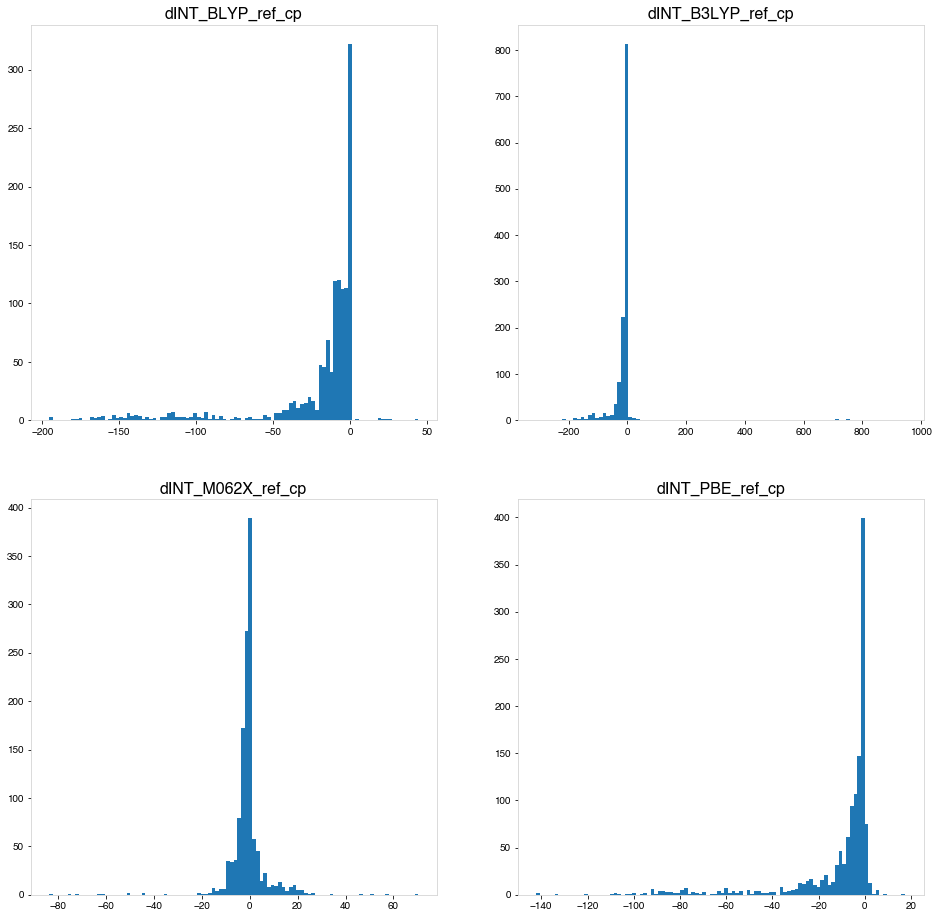

In [128]:
import seaborn as sns
rows, cols = 2,2 
fig, axs = plt.subplots(rows,cols,figsize=(16,16))

coords = np.arange(rows*cols).reshape(rows,cols)

for i,col in enumerate(list(df)[1:-1]):
    x,y = np.where(coords == i)
    ax = axs[x,y][0]
    ax.hist(df[col],bins=100)
    ax.set_title(col,fontsize=16)
    
plt.show()

In [9]:
"""merged_dsets = [((pbe[key].merge(b3lyp[key],on="complex")).merge(m062x[key],on="complex")) for key in dsets] # Figure out how to get the fourth dataset merged in

for i,dset in enumerate(dsets):
    merged_dsets[i]["Dataset"] = [dset for x in range(len(merged_dsets[i]))]

from functools import reduce, partial 

df = reduce(my_concat,merged_dsets)

imp_cols = ["complex","dINT_BLYP_ref_cp","dINT_B3LYP_ref_cp","dINT_ref_cp","dINT_PBE_ref_cp","Dataset"] # Access just the interesting columns
df_small = df[imp_cols]
df_small.iloc[214]"""

complex              11_MeNH2-Peptide
dINT_BLYP_ref_cp                -12.7
dINT_B3LYP_ref_cp                 NaN
dINT_ref_cp                       NaN
dINT_PBE_ref_cp                  -8.6
Dataset                           S66
Name: 10, dtype: object

In [138]:
df

,Complex,dINT_BLYP_ref_cp,dINT_B3LYP_ref_cp,dINT_M062X_ref_cp,dINT_PBE_ref_cp,Dataset
0,c4mim-ac-2-p2,-65.2,-43.600000,20.267909,-18.044256,2IPs
1,c4mim-ac-2-p4,-63.9,-49.800000,10.850084,-27.240597,2IPs
2,c4mim-ac-2-p7,-83.5,-58.800000,20.934319,-30.089175,2IPs
3,c4mim-ac-3-p4,-156.0,-119.900000,13.806976,-91.104089,2IPs
4,c4mim-ac-4-p2,-143.9,-87.500000,9.343976,-82.055240,2IPs
...,...,...,...,...,...,...
1282,UREAXX02/trimer660,-8.9,-4.308160,3.191840,-3.408160,X23
1283,UREAXX02/trimer673,-2.6,-2.573865,-1.673865,-1.273865,X23
1284,UREAXX02/trimer75,-14.9,-8.610927,2.389073,-4.710927,X23
1285,UREAXX02/trimer84,-14.9,-8.610927,2.389073,-4.710927,X23


In [133]:
mols = [f"xyz/{item['Dataset']}/{item['Complex']}.xyz"for i,item in df.iterrows()]

# Adjacency Matrices

Adjacency matrices are calculated using a sigma value of 5, which is highly generous but due to the small standard deviation of the bond types, should not create any problems.

This was done to remove the possibility of warnings that bond standard deviations were too close.

The five values assigned to each xyz file are in order:

(adjacency matrix,
 distance matrix,
 atom_type list,
 probability matrix,
 confusion matrix)

In [381]:
from xyz_parser import xyz_to_matrices
from xyz_parse.xyz_parse.classes import MolMat
import scipy.spatial as sp
import pickle5 as pickle

matrices = load_obj("Matrices")
df_small["Matrices"] = matrices
coul_iter = matrix_iter("coulomb",matrices=matrices)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [376]:
df_small[df_small["Dataset"] == "3B69"]

,complex,avg_iso,dINT_MP2_ref_cp,dINT_BLYP_ref_cp,Dataset,Matrices
0,01a_water,9.585,-4.117059,-7.7,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
1,01b_water,9.587,-7.270773,-12.1,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
2,01c_water,9.367,-3.877470,-8.6,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
3,02a_formaldehyde,17.396,-4.124025,-9.9,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
4,02b_formaldehyde,17.396,-4.855488,-16.7,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
...,...,...,...,...,...,...
64,22b_uracil,64.406,4.105202,-65.8,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
65,22c_uracil,64.406,-0.817360,-40.4,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
66,23a_cyclobutylfuran,69.342,1.192612,-53.7,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
67,23b_cyclobutylfuran,69.300,-4.470169,-38.4,3B69,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...


In [386]:
iterable = coul_iter
#np.array(list(map(inj,coul_iter)))

# Alternate distance formula - sp.distance.cosine

affinity = np.zeros((len(iterable),len(iterable)))
for i,key in enumerate(tqdm.tqdm(iterable)):
    affinity[i] = [1/(1 + sp.distance.directed_hausdorff(coul_iter[i],coul_iter[j])[0]) for j in range(len(iterable))]
    
affinity -= np.diag(np.diag(affinity))
affinity = affinity + affinity.T - np.diag(np.diag(affinity))

100%|██████████| 266/266 [00:16<00:00, 16.05it/s]


In [103]:
iterable = coul_iter.reshape(266,900)

def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0) # only difference

def rbf(x,xp,sigma):
    """
    Computes the radial basis function of a vector with an array.
    """
    return np.exp(-(sp.distance.euclidean(x,xp)/(2*sigma**2)))

rbf(iterable[0],iterable[9],10)

NameError: name 'coul_iter' is not defined

In [ ]:


affinity2 = np.zeros((len(iterable),len(iterable)))
for i,key in enumerate(tqdm.tqdm(iterable)):
    dists = [1/(1 + sp.distance.euclidean(coul_iter[i].flatten(),coul_iter[j].flatten())) for j in range(i,len(iterable))]
    affinity2[i] = np.pad(dists, (i,0), 'constant', constant_values=(0, 0))
    
affinity2 -= np.diag(np.diag(affinity2))
affinity2 = affinity2 + affinity2.T - np.diag(np.diag(affinity2))

affinity3 = np.zeros((len(iterable),len(iterable)))
for i,x in enumerate(tqdm.tqdm(iterable)):
    affinity3[i] = [rbf(x,xp,10) for xp in iterable]
    
affinity3 -= np.diag(np.diag(affinity3))
affinity3 = affinity3 + affinity3.T - np.diag(np.diag(affinity3))


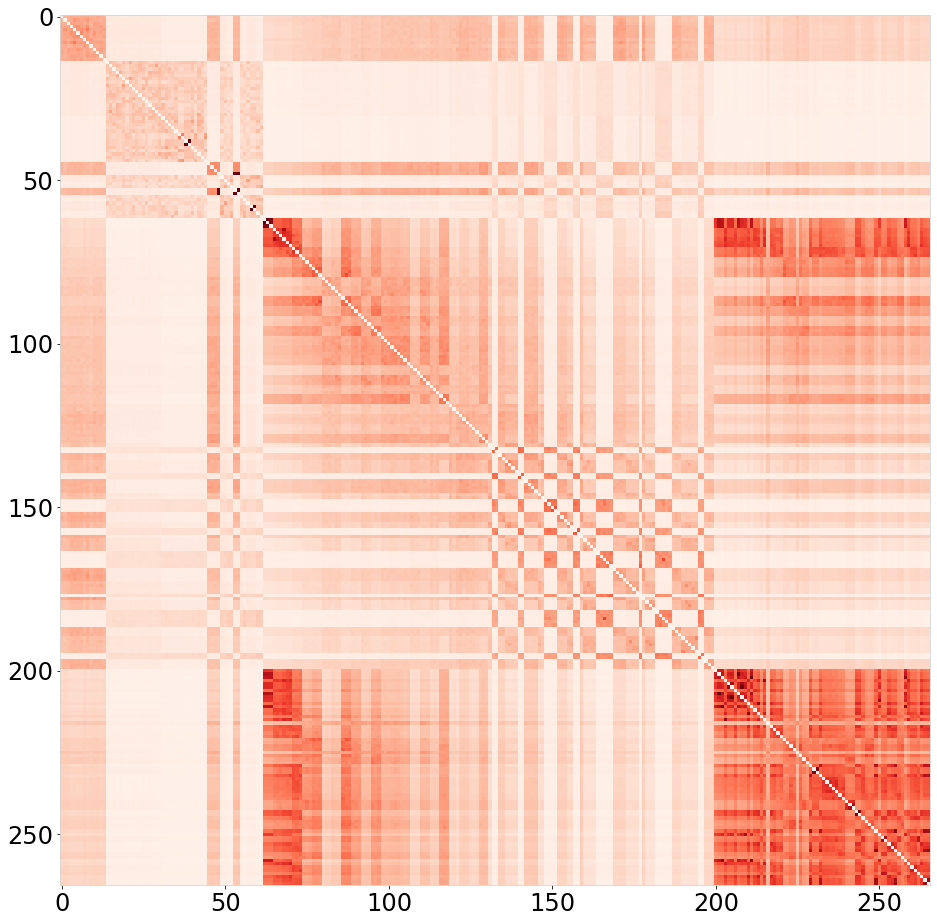

In [641]:
iterable = coul_iter.reshape(266,900)
#np.array(list(map(inj,coul_iter)))

# Alternate distance formula - sp.distance.cosine

fig = plt.figure(figsize=(16,16))
plt.imshow(affinity3,cmap="Reds")
ax = plt.gca()
ax.tick_params(labelsize=24)
plt.savefig("Images/Similarity_Heatmap_White.png",transparent=True,dpi=400,bbox_inches="tight")

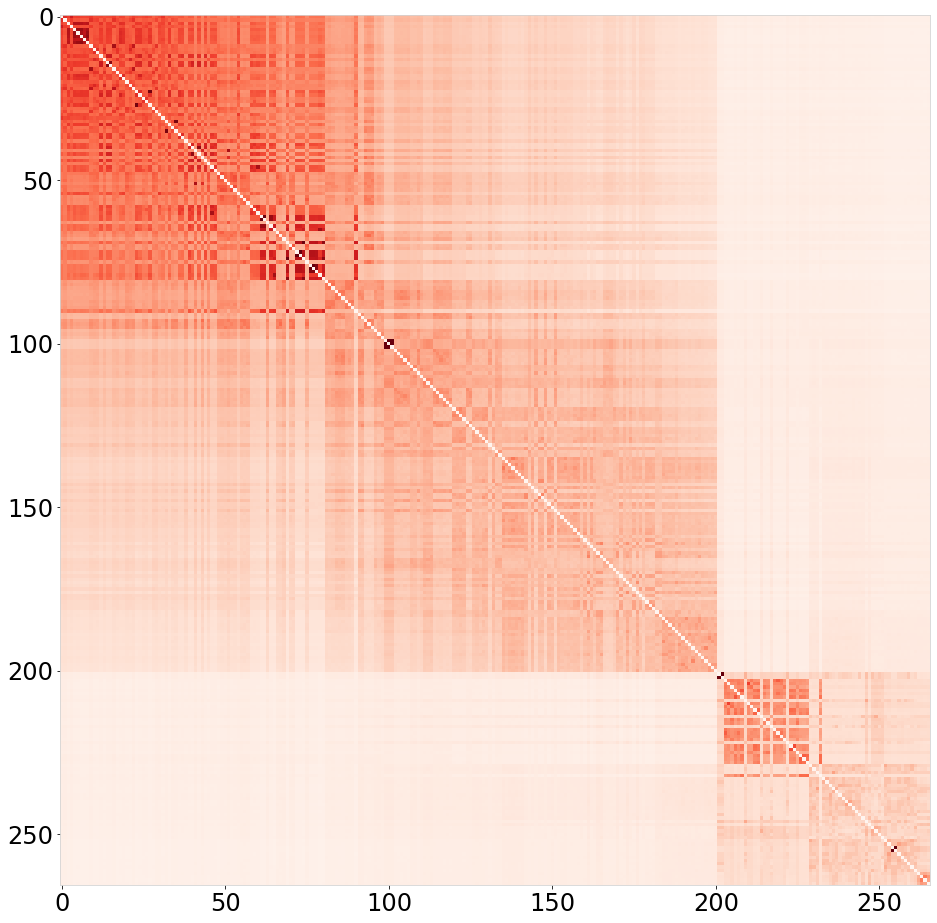

In [640]:
fig = plt.figure(figsize=(16,16))
plt.imshow(sort_mat(affinity3),cmap="Reds")
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.savefig("Images/Similarity_Plot_Sorted.png",dpi=300,bbox_inches="tight")

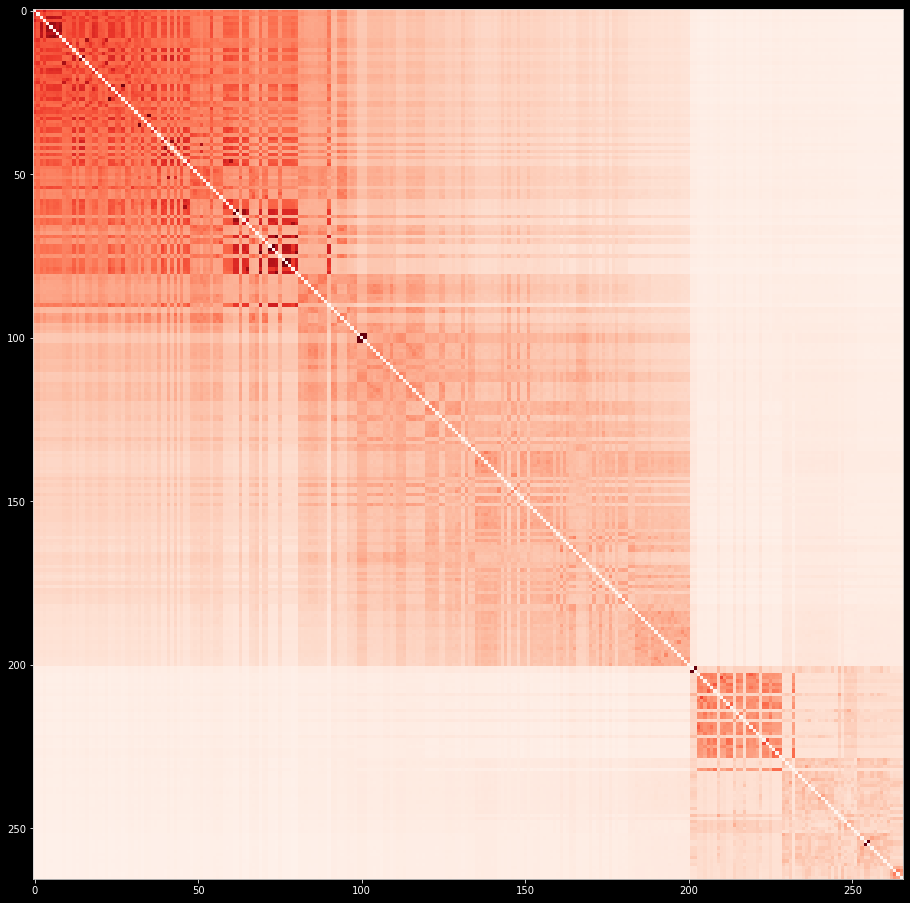

In [70]:
fig = plt.figure(figsize=(16,16))
plt.imshow(sort_mat(affinity3),cmap="Reds")

In [465]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import DotProduct, WhiteKernel, RBF
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.metrics import r2_score 

kernel = RBF(length_scale=1) + WhiteKernel(noise_level=0.01)
gpr = GaussianProcessRegressor(kernel=kernel).fit(X_tr, Y_tr)
gpr.score(X_tr, Y_tr)
gpr.score(X_ts, Y_ts)

NameError: name 'X_tr' is not defined

In [463]:
X = coul_iter.reshape(266,900)

iso = df_small["avg_iso"].to_numpy().reshape(-1,1)
X = np.hstack([X,iso])


In [464]:
Y = df_small["dINT_MP2_ref_cp"].to_numpy()
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
Y = scaler.fit_transform(Y.reshape(-1,1))

In [482]:
tr_correlations = []
ts_correlations = []

for i in tqdm.tqdm(range(10)):
    idxs = np.arange(0,len(X))
    np.random.shuffle(idxs)

    X, Y = X[idxs],Y[idxs].ravel()

    split = 133

    X_tr, X_ts = X[:split], X[split:]
    Y_tr, Y_ts = Y[:split], Y[split:]



    reg = GradientBoostingRegressor(random_state=0)
    #reg = RandomForestRegressor(random_state=0,n_jobs=12)

    reg.fit(X_tr,Y_tr)
    Y_pr = reg.predict(X_ts)
    ts_correlations.append(r2_score(Y_pr,Y_ts))
    tr_correlations.append(r2_score(reg.predict(X_tr),Y_tr))
    print(r2_score(Y_pr,Y_ts))


 10%|█         | 1/10 [00:01<00:11,  1.30s/it]

0.4136773363766547


 20%|██        | 2/10 [00:02<00:10,  1.29s/it]

-0.8542689809083004


 30%|███       | 3/10 [00:04<00:09,  1.34s/it]

-0.26434321115276593


 40%|████      | 4/10 [00:05<00:08,  1.42s/it]

0.16797816066892046


 50%|█████     | 5/10 [00:07<00:07,  1.48s/it]

-0.7092517545847168


 60%|██████    | 6/10 [00:08<00:05,  1.47s/it]

-0.36631995638114034


 70%|███████   | 7/10 [00:10<00:04,  1.50s/it]

-0.37399111154165077


 80%|████████  | 8/10 [00:11<00:03,  1.51s/it]

-0.15100141968422265


 90%|█████████ | 9/10 [00:13<00:01,  1.51s/it]

0.10402536031943577


100%|██████████| 10/10 [00:14<00:00,  1.49s/it]

0.19844515070214674


In [548]:
def plot_kde_corr(values,num_samples=500,ax=None,title=None,label=None,xmin=None,xmax=None):
    """
    Performs a kernel density estimation plot.
    """
    kernel = gaussian_kde(values)
    if xmin is None:
        xmin = np.min(values)
    if xmax is None:
        xmax = np.max(values)
    x = np.linspace(xmin,xmax,num=num_samples)
    y = kernel(x)
    if ax is None:
        fig, ax = plt.subplots()
    ax.plot(x,y,label=label)
    ax.fill_between(x,y,0,alpha=0.1)
    if title is not None:
        ax.set_title(title)
    return ax

In [483]:
import copy

tr_correlations_133 = copy.copy(tr_correlations)
ts_correlations_133 = copy.copy(ts_correlations)

In [ ]:
def plot_kde_corr(values,num_samples=500,ax=None,title=None):
    """
    Performs a kernel density estimation plot.
    """
    kernel = gaussian_kde(values)
    x = np.linspace(min(values),1,num=num_samples)
    y = kernel(x)
    if ax is None:
        fig, ax = plt.subplots()
    ax.plot(x,y)
    ax.fill_between(x,y,0,alpha=0.1)
    if title is not None:
        ax.set_title(title)
    return ax

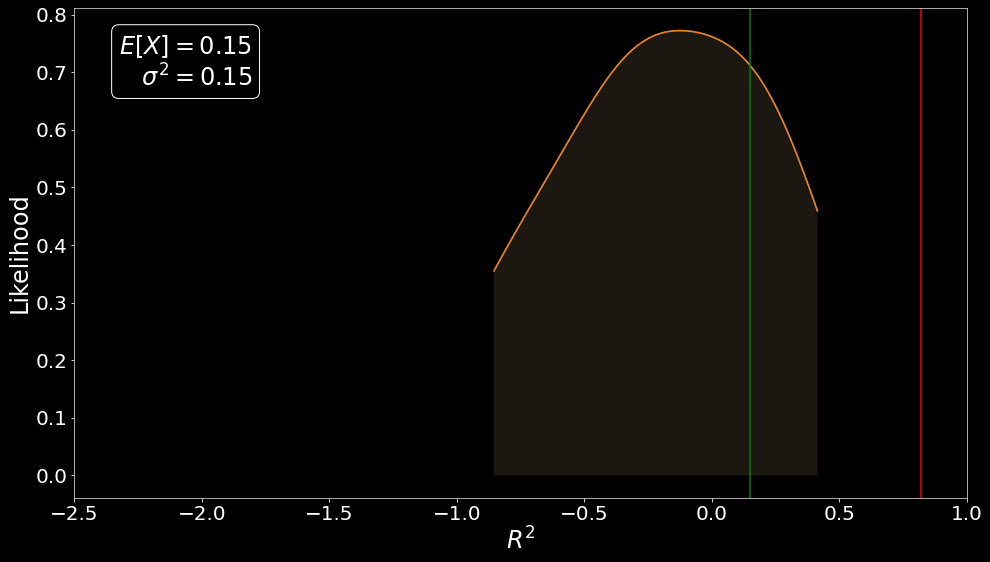

In [549]:
fig = plt.figure(figsize=(16,9))
ax = plt.gca()
ax = plot_kde_corr(ts_correlations_133,ax=ax)
ax = plot_kde_corr(ts_correlations_133,ax=ax)

ax.set_facecolor("#000000")
plt.xlim(-2.5,1)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.set_xlabel("$R^2$",fontsize=24)
ax.set_ylabel("Likelihood",fontsize=24)
textstr = '\n'.join((r'$E[X]=%.2f$' % ((0.15, )),
    r'   $\sigma^2=%.2f$' % (np.var(ts_correlations_133))))
props = dict(boxstyle='round', facecolor='black', alpha=1)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=24, color="white",
        verticalalignment='top', bbox=props)
plt.axvline(0.82,c="red")
plt.axvline(0.15,c="green")

plt.savefig("Images/random_var_corr_both.png",dpi=300)

In [553]:
x = df["INT_MP2_cp"].to_numpy()
y = df["INT_MP2_cp"].to_numpy()
diffs = np.zeros((len(x),len(y)))
for i,val1 in enumerate(x):
    for j,val2 in enumerate(y):
        diffs[i,j] = np.linalg.norm(val1-val2)


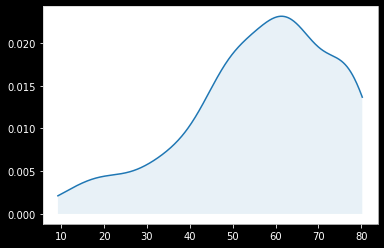

In [473]:
values = df_small["avg_iso"]

kernel = gaussian_kde(values)
x = np.linspace(min(values),max(values),num=500)
y = kernel(x)
fig, ax = plt.subplots()
ax.plot(x,y)
ax.fill_between(x,y,0,alpha=0.1)

def plot_kde(values,num_samples=500,ax=None,title=None):
    """
    Performs a kernel density estimation plot.
    """
    kernel = gaussian_kde(values)
    x = np.linspace(min(values),max(values),num=num_samples)
    y = kernel(x)
    if ax is None:
        fig, ax = plt.subplots()
    ax.plot(x,y)
    ax.fill_between(x,y,0,alpha=0.1)
    if title is not None:
        ax.set_title(title)
    return ax


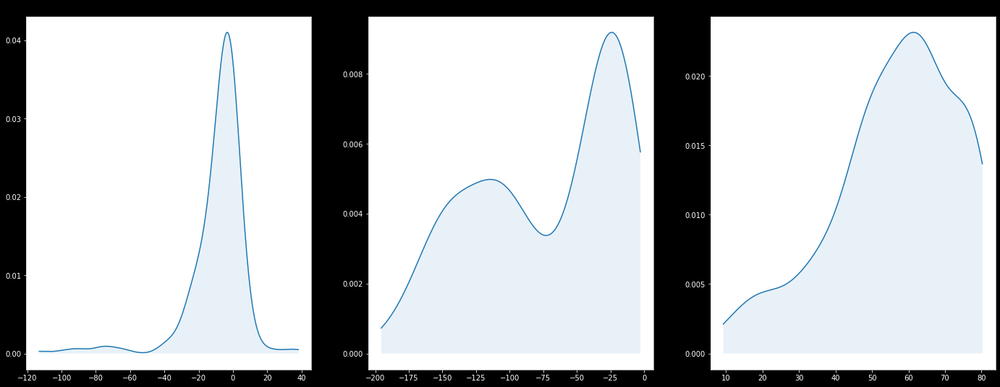

In [91]:
fig, axs = plt.subplots(1,3,figsize=(24,9))
props = ['dINT_MP2_ref_cp', 'dINT_BLYP_ref_cp',"avg_iso"]

for prop,ax in zip(props,axs):
    plot_kde(df_small[prop],ax=ax,title=prop)


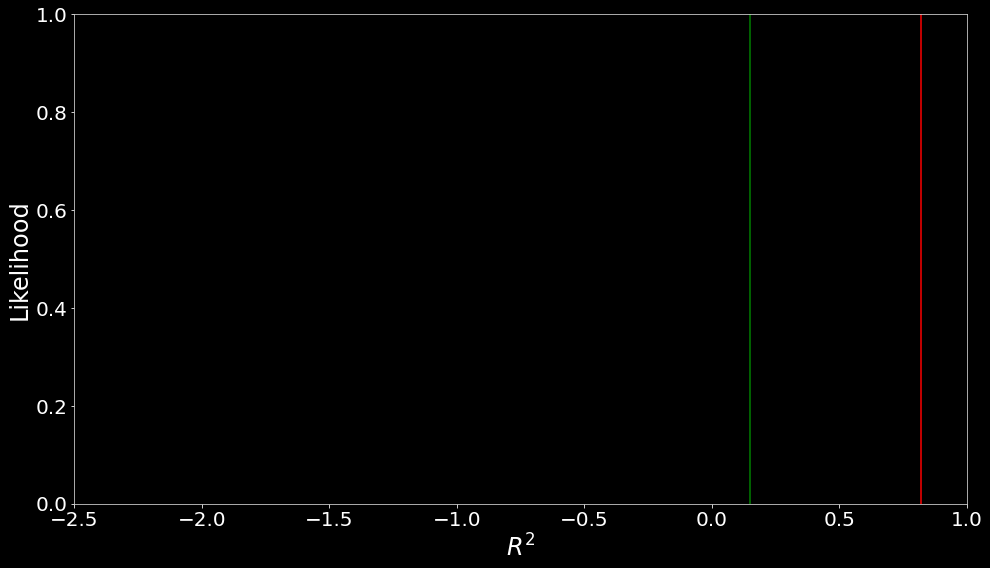

In [413]:
def plot_kde_corr(values,num_samples=500,ax=None,title=None):
    """
    Performs a kernel density estimation plot.
    """
    kernel = gaussian_kde(values)
    x = np.linspace(min(values),1,num=num_samples)
    y = kernel(x)
    if ax is None:
        fig, ax = plt.subplots()
    ax.plot(x,y)
    ax.fill_between(x,y,0,alpha=0.1)
    if title is not None:
        ax.set_title(title)
    return ax

fig = plt.figure(figsize=(16,9))
ax = plt.gca()

ax.set_facecolor("#000000")
plt.xlim(-2.5,1)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.set_xlabel("$R^2$",fontsize=24)
ax.set_ylabel("Likelihood",fontsize=24)
#textstr = '\n'.join((r'$E[X]=%.2f$' % ((0.15, )),
#    r'   $\sigma^2=%.2f$' % (np.var(ts_correlations_213))))
props = dict(boxstyle='round', facecolor='black', alpha=1)
#ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=24, color="white",
#        verticalalignment='top', bbox=props)
plt.axvline(0.82,c="red")
plt.axvline(0.15,c="green")

plt.savefig("Images/random_var_corr_both.png",dpi=300)

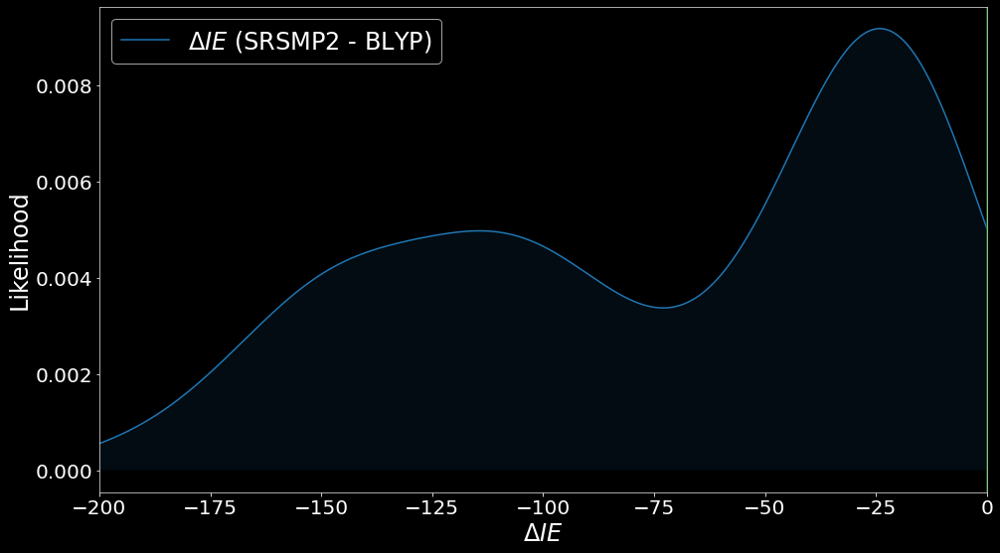

In [491]:
dis_idxs = np.argsort(np.sum(affinity3,axis=0))[:50]
dis_idxs

control = np.random.choice(len(affinity3),size=(50,))

fig = plt.figure(figsize=(16,9))
ax = plt.gca()
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"],ax=ax,label=r"$\Delta IE$ (SRSMP2 - BLYP)")

ax.set_facecolor("#000000")
plt.xlim(-200,0)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.set_xlabel("$\Delta IE$",fontsize=24)
ax.set_ylabel("Likelihood",fontsize=24)

plt.axvline(0.82,c="red")
plt.axvline(0.15,c="green")
plt.legend(facecolor="k",labelcolor="white",fontsize=24)

plt.savefig("Images/baseline.png",dpi=300)

In [572]:
dbscan

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 0, 0, 0, 0, 5, 5, 5, 5, 0, 0, 5, 5, 5, 5, 5, 5, 5, 3, 3, 3, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       4, 4, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 4, 4, 4, 4, 0, 0,
       0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0,
       0, 4, 0, 0, 0, 0, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0,
       0, 0, 3, 3, 3, 2, 3, 3, 2, 3, 3, 3, 2, 3, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2, 2, 2, 3, 2, 2, 2, 2, 2,
       2, 2])

In [568]:
coul_iter = coul_iter.reshape(266,900)

def cluster_sample(labels)

In [594]:
affinity3

array([[0.000, 0.527, 0.593, ..., 0.319, 0.326, 0.329],
       [0.527, 0.000, 0.570, ..., 0.326, 0.328, 0.331],
       [0.593, 0.570, 0.000, ..., 0.308, 0.318, 0.321],
       ...,
       [0.319, 0.326, 0.308, ..., 0.000, 1.267, 1.248],
       [0.326, 0.328, 0.318, ..., 1.267, 0.000, 1.790],
       [0.329, 0.331, 0.321, ..., 1.248, 1.790, 0.000]])

In [578]:
np.sum(affinity3,axis=0)/np.sum(affinity3)

array([0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004,
       0.004, 0.004, 0.004, 0.004, 0.004, 0.002, 0.002, 0.002, 0.002,
       0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002,
       0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002,
       0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002,
       0.004, 0.004, 0.004, 0.004, 0.002, 0.002, 0.002, 0.002, 0.004,
       0.004, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.002, 0.005,
       0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005,
       0.005, 0.005, 0.004, 0.004, 0.004, 0.005, 0.005, 0.005, 0.004,
       0.004, 0.004, 0.004, 0.004, 0.004, 0.005, 0.005, 0.005, 0.005,
       0.005, 0.005, 0.004, 0.004, 0.004, 0.005, 0.005, 0.005, 0.004,
       0.004, 0.004, 0.004, 0.005, 0.004, 0.004, 0.004, 0.004, 0.004,
       0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.004, 0.005,
       0.005, 0.005, 0.003, 0.003, 0.003, 0.004, 0.004, 0.004, 0.004,
       0.004, 0.004,

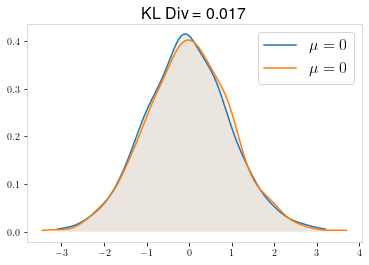

In [913]:
a = np.random.normal(size=(1000,))
b = np.random.normal(size=(1000,))+0

xa, xb = kde(a),kde(b)

ax = plt.gca()
plot_kde_corr(a,ax=ax,label="$\mu = 0$")
plot_kde_corr(b,ax=ax,label="$\mu = 0$")
plt.legend(fontsize=16,loc=1)
plt.title(f"KL Div = {entropy(kde(a),kde(b)):0.3f}",fontsize=16)
plt.savefig("Images/Gaussians_0.png",dpi=200,transparent="True",bbox_inches="tight")



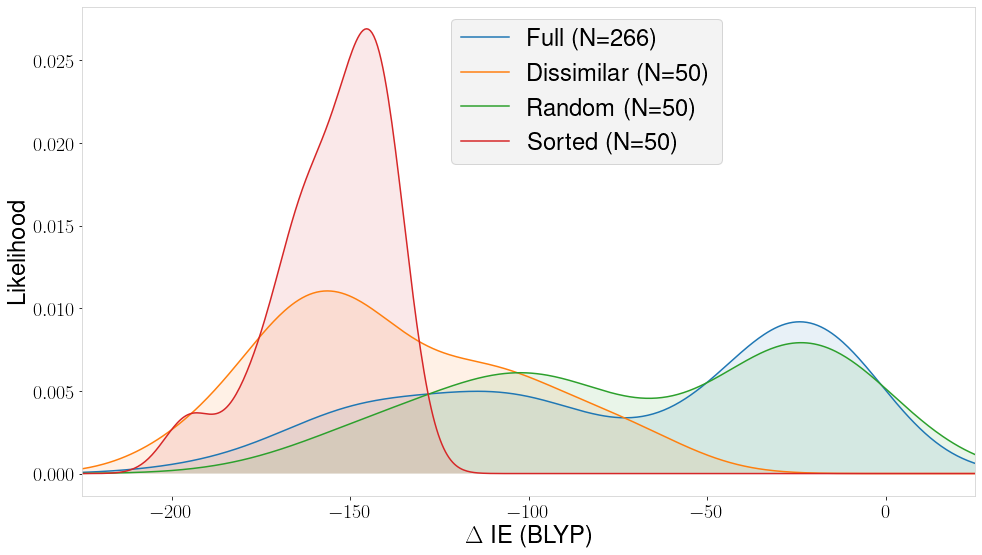

In [861]:
dis_idxs = np.argsort(np.sum(affinity3,axis=0))[:50]
dis_idxs

control = np.random.choice(len(affinity3),size=(50,))

fig = plt.figure(figsize=(16,9))
ax = plt.gca()
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"],ax=ax,label="Full (N=266)",xmin=-225,xmax=25)
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"].loc[dis_idxs],ax=ax,label="Dissimilar (N=50)",xmin=-225,xmax=25)
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"].loc[control],ax=ax,label="Random (N=50)",xmin=-225,xmax=25)
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"].loc[full_info],ax=ax,label="Sorted (N=50)",xmin=-225,xmax=25)

#ax.set_facecolor("#000000")
plt.xlim(-225,25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#ax.set_title(r"BLYP Error Distributions",fontsize=30)
ax.set_xlabel(r"$\Delta$ IE (BLYP)",fontsize=24,color="#000000")
ax.set_ylabel(r"Likelihood",fontsize=24,color="#000000")
plt.legend(facecolor="#F0F0F0",labelcolor="k",fontsize=24,bbox_to_anchor=(0.4,1),markerscale=2)

plt.savefig("Images/BLYP_Errors_white.png",dpi=200,bbox_inches="tight",transparent=True)

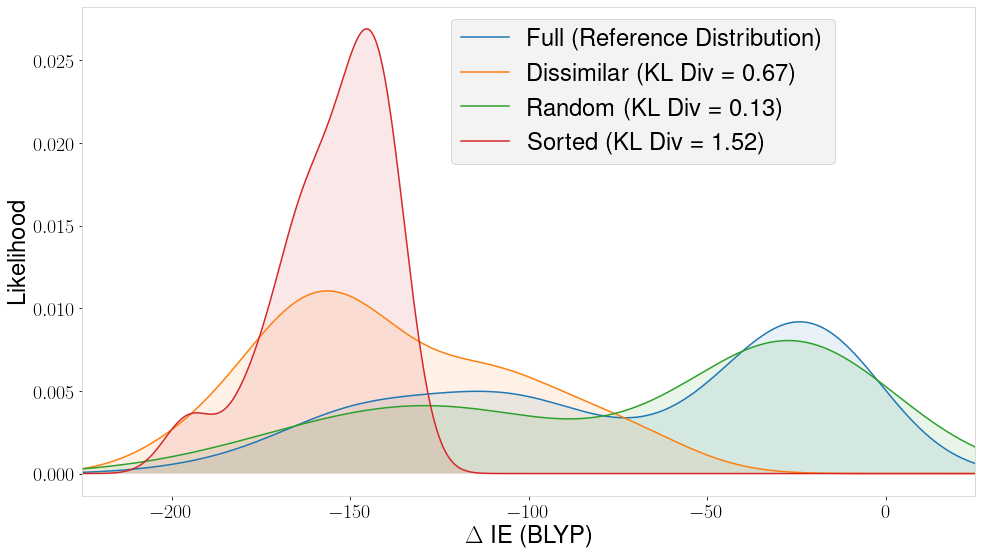

In [921]:
dis_idxs = np.argsort(np.sum(affinity3,axis=0))[:50]
dis_idxs

control = np.random.choice(len(affinity3),size=(50,))

fig = plt.figure(figsize=(16,9))
ax = plt.gca()
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"],ax=ax,label="Full (Reference Distribution)",xmin=-225,xmax=25)
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"].loc[dis_idxs],ax=ax,label=f"Dissimilar (KL Div = {entropy(kde(dissimilar),kde(original)):.2f})",xmin=-225,xmax=25)
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"].loc[control],ax=ax,label=f"Random (KL Div = {entropy(kde(control),kde(original)):.2f})",xmin=-225,xmax=25)
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"].loc[full_info],ax=ax,label=f"Sorted (KL Div = {entropy(kde(full_infos),kde(original)):.2f})",xmin=-225,xmax=25)

#ax.set_facecolor("#000000")
plt.xlim(-225,25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
#ax.set_title(r"BLYP Error Distributions",fontsize=30)
ax.set_xlabel(r"$\Delta$ IE (BLYP)",fontsize=24,color="#000000")
ax.set_ylabel(r"Likelihood",fontsize=24,color="#000000")
plt.legend(facecolor="#F0F0F0",labelcolor="k",fontsize=24,bbox_to_anchor=(0.4,1),markerscale=2)

plt.savefig("Images/BLYP_Errors_white_KLDiv.png",dpi=200,bbox_inches="tight",transparent=True)

In [612]:
np.cov(df_small[["avg_iso","dINT_MP2_ref_cp","dINT_BLYP_ref_cp"]].to_numpy().T)

array([[297.834, -51.596, -640.717],
       [-51.596, 303.520, 447.585],
       [-640.717, 447.585, 2934.269]])

In [613]:
np.corrcoef(df_small[["avg_iso","dINT_MP2_ref_cp","dINT_BLYP_ref_cp"]].to_numpy().T)

array([[1.000, -0.172, -0.685],
       [-0.172, 1.000, 0.474],
       [-0.685, 0.474, 1.000]])

In [914]:
dissimilar = df_small["dINT_BLYP_ref_cp"].loc[dis_idxs].to_numpy()
original = df_small["dINT_BLYP_ref_cp"].to_numpy()
controls = df_small["dINT_BLYP_ref_cp"].loc[control].to_numpy()
full_infos = df_small["dINT_BLYP_ref_cp"].loc[full_info].to_numpy()

def kde(values,num_samples=500,returnx=False):
    kernel = gaussian_kde(values)
    x = np.linspace(min(values),1,num=num_samples)
    y = kernel(x)
    if returnx:
        return x,y 
    else:
        return y

from scipy.stats import entropy
from sklearn.metrics import mutual_info_score

mutual_info_score(kde(dissimilar),kde(original))
print(entropy(kde(dissimilar),kde(original)))
print(entropy(kde(control),kde(original)))
print(entropy(kde(full_infos),kde(original)))

0.6671459871892927
0.13391196890289803
1.5194635543627004


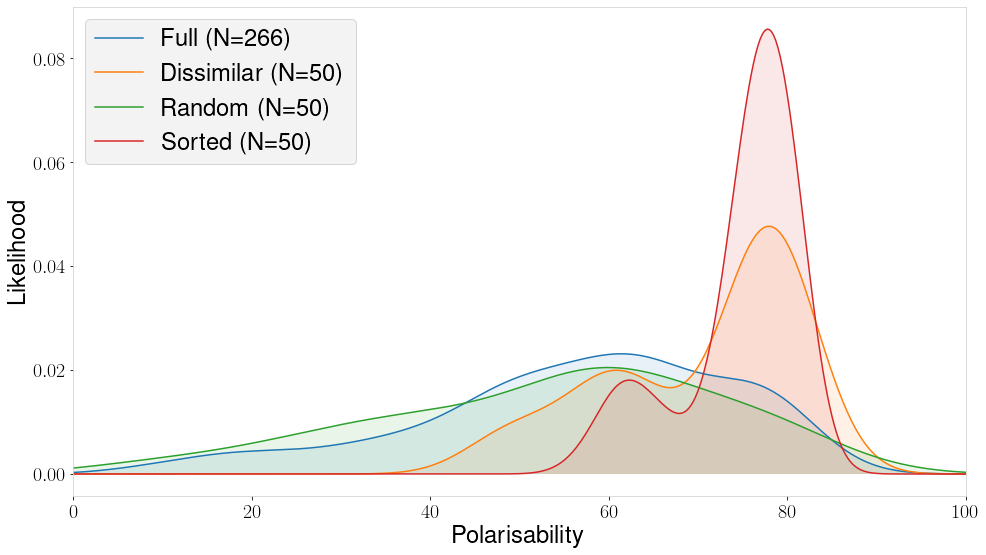

In [860]:
dis_idxs = np.argsort(np.sum(affinity3,axis=0))[:50]
dis_idxs

control = np.random.choice(len(affinity3),size=(50,))

fig = plt.figure(figsize=(16,9))
ax = plt.gca()
ax = plot_kde_corr(df_small["avg_iso"],ax=ax,label="Full (N=266)",xmin=-25,xmax=100)
ax = plot_kde_corr(df_small["avg_iso"].loc[dis_idxs],ax=ax,label="Dissimilar (N=50)",xmin=-25,xmax=100)
ax = plot_kde_corr(df_small["avg_iso"].loc[control],ax=ax,label="Random (N=50)",xmin=-25,xmax=100)
ax = plot_kde_corr(df_small["avg_iso"].loc[full_info],ax=ax,label="Sorted (N=50)",xmin=-25,xmax=100)

#ax.set_facecolor("#000000")
plt.xlim(0,100)
#ax.set_title("Polarisability",fontsize=32)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.set_xlabel("Polarisability",fontsize=24,color="#000000")
ax.set_ylabel("Likelihood",fontsize=24,color="#000000")
plt.legend(facecolor="#F0F0F0",labelcolor="k",fontsize=24,markerscale=2)

plt.savefig("Images/Polarisability_Errors_white.png",dpi=200,bbox_inches="tight",transparent=True)

In [622]:
dissimilar = df_small["avg_iso"].loc[dis_idxs].to_numpy()
original = df_small["avg_iso"].to_numpy()
controls = df_small["avg_iso"].loc[control].to_numpy()
full_infos = df_small["avg_iso"].loc[full_info].to_numpy()

def kde(values,num_samples=500):
    kernel = gaussian_kde(values)
    x = np.linspace(min(values),1,num=num_samples)
    y = kernel(x)
    return y

from scipy.stats import entropy
from sklearn.metrics import mutual_info_score

mutual_info_score(kde(dissimilar),kde(original))
print(entropy(kde(dissimilar),kde(original)))
print(entropy(kde(controls),kde(original)))
print(entropy(kde(full_infos),kde(original)))

1.1140297260456773
0.03241491867643148
1.8804624050206897


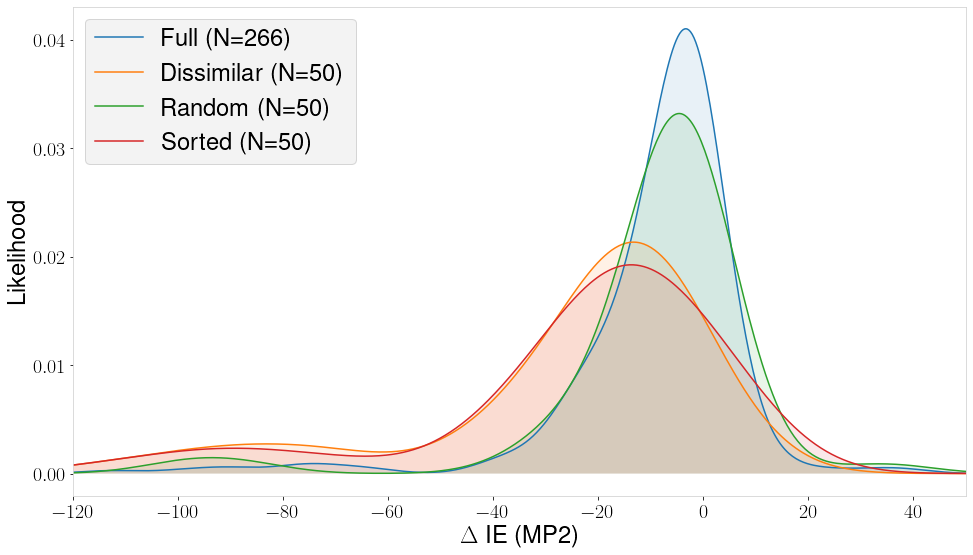

In [859]:
dis_idxs = np.argsort(np.sum(affinity3,axis=0))[:50]
dis_idxs

control = np.random.choice(len(affinity3),size=(50,))

fig = plt.figure(figsize=(16,9))
ax = plt.gca()
ax = plot_kde_corr(df_small["dINT_MP2_ref_cp"],ax=ax,label="Full (N=266)",xmin=-120,xmax=50)
ax = plot_kde_corr(df_small["dINT_MP2_ref_cp"].loc[dis_idxs],ax=ax,label="Dissimilar (N=50)",xmin=-120,xmax=50)
ax = plot_kde_corr(df_small["dINT_MP2_ref_cp"].loc[control],ax=ax,label="Random (N=50)",xmin=-120,xmax=50)
ax = plot_kde_corr(df_small["dINT_MP2_ref_cp"].loc[full_info],ax=ax,label="Sorted (N=50)",xmin=-120,xmax=50)

#ax.set_title("MP2 Error Distributions",fontsize=32)
plt.xlim(-120,50)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
ax.set_xlabel("$\Delta$ IE (MP2)",fontsize=24,color="#000000")
ax.set_ylabel("Likelihood",fontsize=24,color="#000000")
plt.legend(facecolor="#F0F0F0",labelcolor="k",fontsize=24)

plt.savefig("Images/MP2_Errors_white.png",dpi=200,bbox_inches="tight",transparent=True)

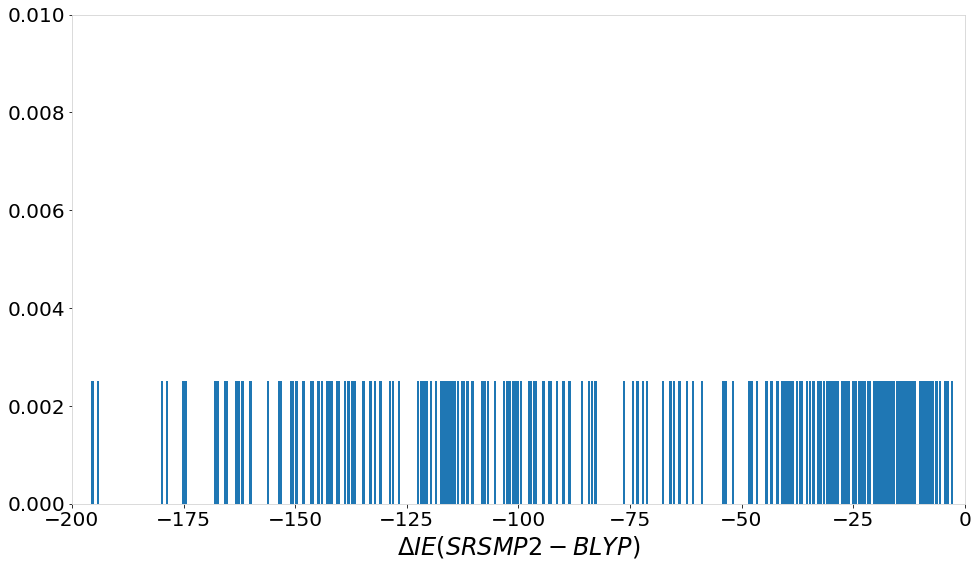

In [824]:
fig = plt.figure(figsize=(16,9))

plt.bar(df_small["dINT_BLYP_ref_cp"],height=np.ones(266)*0.0025,width=0.5)
#ax = plt.gca()
#ax = plot_kde_corr(df_small["dINT_MP2_ref_cp"].loc[dis_idxs],ax=ax,label="Dissimilar (N=50)",xmax=20)
plt.ylim(0,0.01)
plt.xlim(-200,0)
ax = plt.gca()
ax.set_xlabel("$\Delta IE (SRSMP2 - BLYP)$",fontsize=24,color="#000000")
plt.tick_params(labelsize=20)
plt.savefig("Images/bar.png",transparent=True,bbox_inches="tight",dpi=100)

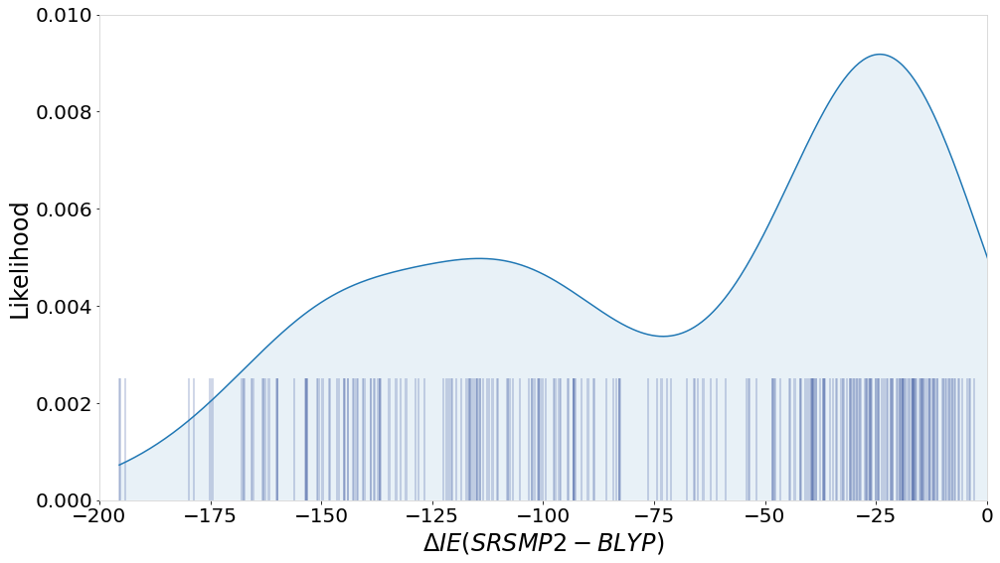

In [823]:
fig = plt.figure(figsize=(16,9))
ax = plt.gca()
ax = plot_kde_corr(df_small["dINT_BLYP_ref_cp"],ax=ax,label="Dissimilar (N=50)",xmax=20)
plt.bar(df_small["dINT_BLYP_ref_cp"],height=np.ones(266)*0.0025,width=0.5,color=(0.275,0.382,0.644),alpha=0.25)
plt.ylim(0,0.01)
plt.xlim(-200,0)
plt.tick_params(labelsize=20)
ax = plt.gca()
ax.set_xlabel("$\Delta IE (SRSMP2 - BLYP)$",fontsize=24,color="#000000")
ax.set_ylabel("Likelihood",fontsize=24,color="#000000")
plt.savefig("Images/KDE_and_bar.png",transparent=True,bbox_inches="tight",dpi=100)

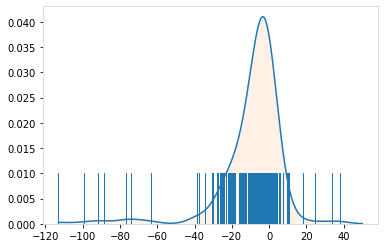

In [703]:
plt.bar(df_small["dINT_MP2_ref_cp"],height=np.ones(266)*0.01,width=0.5)
ax = plt.gca()
ax = plot_kde_corr(df_small["dINT_MP2_ref_cp"],ax=ax,label="Dissimilar (N=50)",xmax=50)


In [725]:
x,y = kde(df_small["dINT_MP2_ref_cp"],returnx=True)
x1,y1 = kde(df_small["dINT_MP2_ref_cp"].loc[dis_idxs],returnx=True)


In [943]:
print(legend_index)
print(colors)

{'2IPs': 0, '3B69': 1, 'IL85': 2, 'S66': 3}
{0: 'orange', 1: 'blue', 2: 'green', 3: 'yellow'}


In [80]:
graph_colors = [colors[legend_index[dset]] for dset in df_small["Dataset"]]

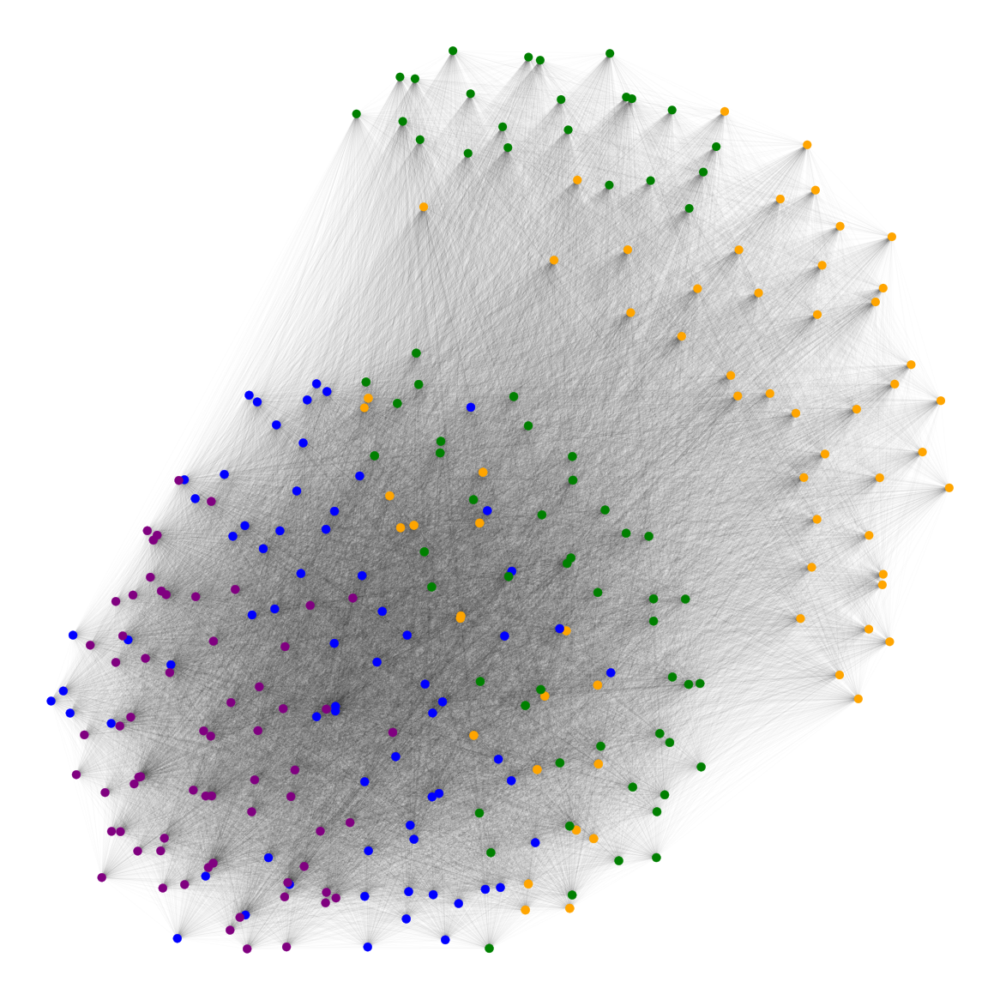

In [949]:
G = nx.from_numpy_matrix(affinity3)

#pos = nx.circular_layout(G)
#pos = nx.spectral_layout(G)
pos = nx.spring_layout(G)

fig = plt.figure(figsize=(16,16))
nx.draw(G,edge_color=(0,0,0,0.01),pos=pos,linewidths=affinity3.flatten(),node_color=graph_colors,node_size=100)
plt.savefig("Images/SpringLayoutGraph.png",transparent=True,dpi=100,bbox_inches="tight")

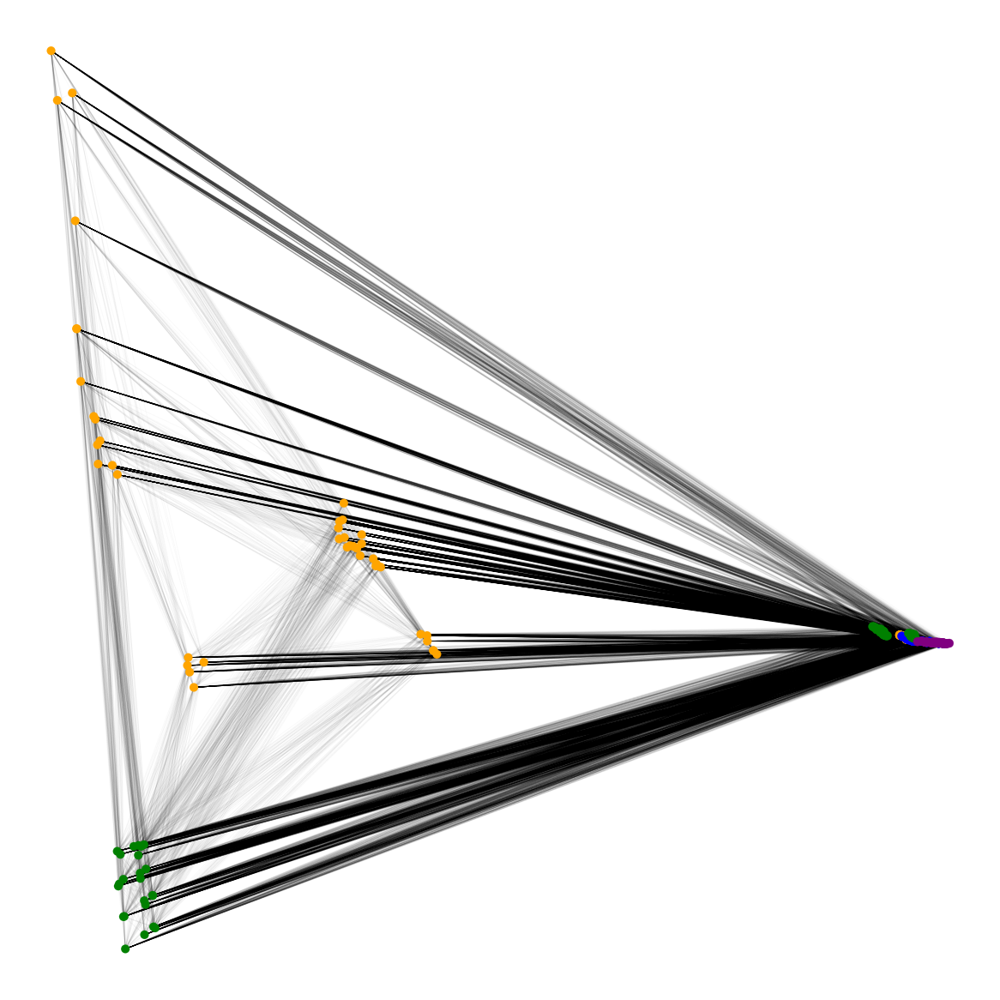

In [948]:
G = nx.from_numpy_matrix(affinity3)

#pos = nx.circular_layout(G)
pos = nx.spectral_layout(G)
#pos = nx.spring_layout(G)

fig = plt.figure(figsize=(16,16))
nx.draw(G,edge_color=(0,0,0,0.025),pos=pos,linewidths=affinity3.flatten(),node_color=graph_colors,node_size=100)
plt.savefig("Images/SpectralLayoutGraph.png",transparent=True,dpi=100,bbox_inches="tight")

<BarContainer object of 500 artists>

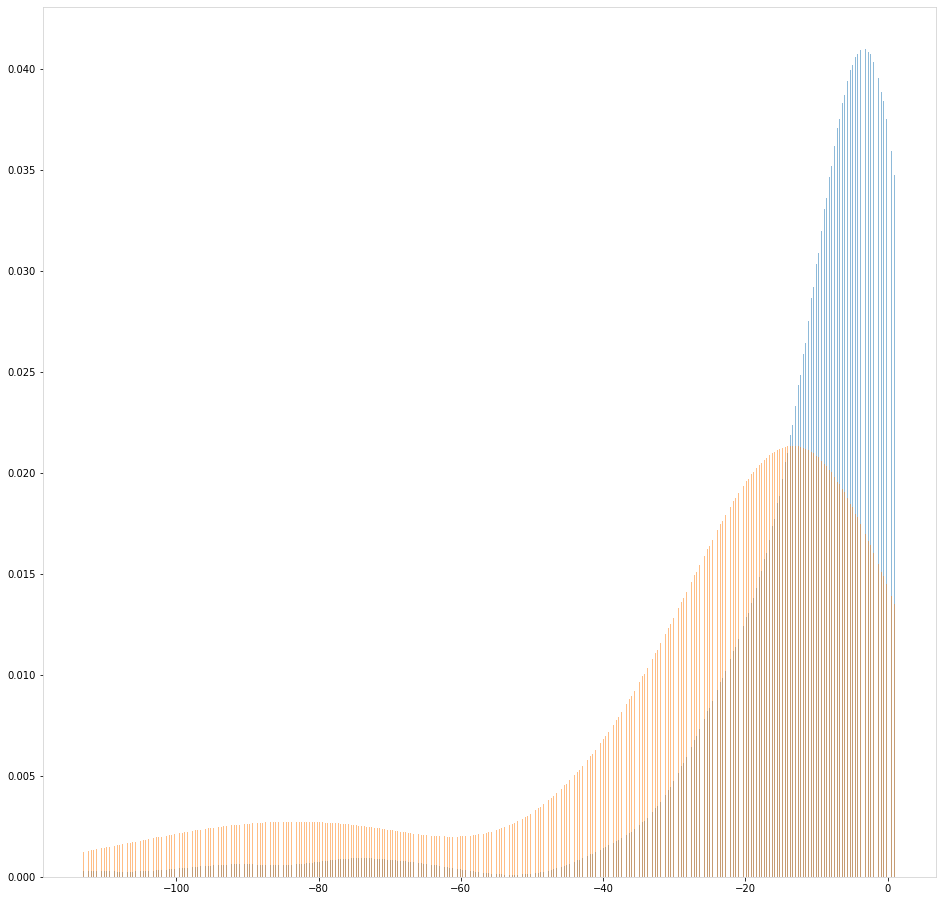

In [729]:
fig = plt.figure(figsize=(16,16))
plt.bar(x,height=y,width=0.075,alpha=0.5)
plt.bar(x1,height=y1,width=0.075,alpha=0.5)

In [600]:
full_info = np.argsort(df_small["dINT_BLYP_ref_cp"].to_numpy())[:50]

In [621]:
dissimilar = df_small["dINT_MP2_ref_cp"].loc[dis_idxs].to_numpy()
original = df_small["dINT_MP2_ref_cp"].to_numpy()
controls = df_small["dINT_MP2_ref_cp"].loc[control].to_numpy()
full_infos = df_small["dINT_MP2_ref_cp"].loc[full_info].to_numpy()

def kde(values,num_samples=500):
    kernel = gaussian_kde(values)
    x = np.linspace(min(values),1,num=num_samples)
    y = kernel(x)
    return y

from scipy.stats import entropy
from sklearn.metrics import mutual_info_score

mutual_info_score(kde(dissimilar),kde(original))
print(entropy(kde(dissimilar),kde(original)))
print(entropy(kde(controls),kde(original)))
print(entropy(kde(full_infos),kde(original)))

0.3992679685986869
0.07822630026857585
0.41884715686666163


Creating a new dataset is a question of subsampling against some particular criterion. Comparing the methods.

Comparing the different sampling problems introduces the randomness needed for the comparison of different probability distributions.

I can treat the most dissimilar as a sampling problem. I can do the same thing for cluster sampling.

I could weight their probability of selection by their similarity scores.

Their similarities are themselves random variables. The problem of a simple sum is that it is highly sensitive to outliers - i.e a single other molecule that is almost identical would give it a huge similarity score.

I should look at the distribution of their similarities.

Sampling is a fundamentally probabilistic challenge. While it is possible to discretize it, comparing the new dataset to the old one is difficult.

I need to fix my RBF calculator

The dissimilaty selection does a very good job of approximating the full knowledge distribution in almost all cases.

In [541]:
entropy(kde(control),kde(original))

0.1553166549871296

In [604]:
entropy(kde(full_infos),kde(original))

1.5194635543627004

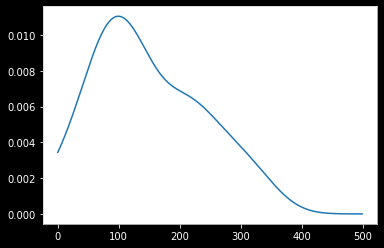

In [ ]:
df_small.iloc[dis_idxs]

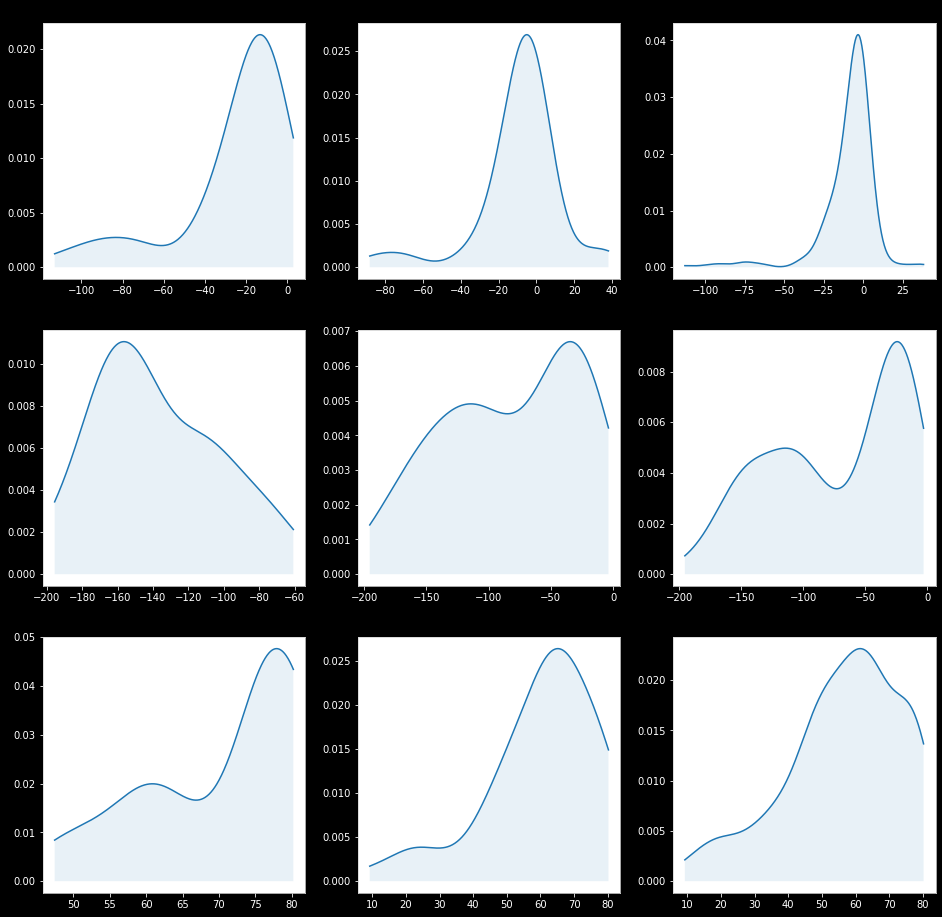

In [105]:
dis_idxs = np.argsort(np.sum(affinity3,axis=0))[:50]
dis_idxs

control = np.random.choice(len(affinity3),size=(50,))
#np.var(np.array(polarisability)[control])

def plot_comparison(idxs,props=['dINT_MP2_ref_cp', 'dINT_BLYP_ref_cp',"avg_iso"]):
    """
    Given a list of indexes and a list of properties, performs kde analysis on them and plots the result.
    
    Parameters 
    ----------
    idxs : {str : np.array}
        A numpy array of the indices to be tested.
    
    props : [str]
        The columns of the pandas dataframe to index.
    """
    fig, axs = plt.subplots(len(props),len(idxs),figsize=(16,16))
    for ax_x,prop in zip(axs,props):
        for ax,(name,idx) in zip(ax_x,idxs.items()):
            plot_kde(df_small[prop].loc[idx],ax=ax,title=prop+" "+name)
    
plot_comparison(idxs={"distance" : dis_idxs, "control" : control, "baseline" : np.arange(len(affinity3))}) 

In [ ]:
import scipy
from scipy.sparse import csgraph
# from scipy.sparse.linalg import eigsh
from numpy import linalg as LA
def eigenDecomposition(A, plot = True, topK = 5):
    """
    :param A: Affinity matrix
    :param plot: plots the sorted eigen values for visual inspection
    :return A tuple containing:
    - the optimal number of clusters by eigengap heuristic
    - all eigen values
    - all eigen vectors
    
    This method performs the eigen decomposition on a given affinity matrix,
    following the steps recommended in the paper:
    1. Construct the normalized affinity matrix: L = D−1/2ADˆ −1/2.
    2. Find the eigenvalues and their associated eigen vectors
    3. Identify the maximum gap which corresponds to the number of clusters
    by eigengap heuristic
    
    References:
    https://papers.nips.cc/paper/2619-self-tuning-spectral-clustering.pdf
    http://www.kyb.mpg.de/fileadmin/user_upload/files/publications/attachments/Luxburg07_tutorial_4488%5b0%5d.pdf
    """
    L = csgraph.laplacian(A, normed=True)
    n_components = A.shape[0]
    
    # LM parameter : Eigenvalues with largest magnitude (eigs, eigsh), that is, largest eigenvalues in 
    # the euclidean norm of complex numbers.
#     eigenvalues, eigenvectors = eigsh(L, k=n_components, which="LM", sigma=1.0, maxiter=5000)
    eigenvalues, eigenvectors = LA.eig(L)
    
    if plot:
        plt.title('Largest eigen values of input matrix')
        plt.scatter(np.arange(len(eigenvalues)), eigenvalues)
        plt.grid()
        
    # Identify the optimal number of clusters as the index corresponding
    # to the larger gap between eigen values
    index_largest_gap = np.argsort(np.diff(eigenvalues))[::-1][:topK]
    nb_clusters = index_largest_gap + 1
        
    return nb_clusters, eigenvalues, eigenvectors

eigenDecomposition(affinity)

In [ ]:
import numpy as np
from sklearn.cluster import SpectralClustering

idxs = SpectralClustering(5,affinity="precomputed").fit_predict(affinity)

# Can use k nearest neighbour graphs to scale performance up
# Using k nearest neighbours would alter behaviour somewhat - the sum would be how similar it is to its k nearest neighbours.
# Identifying least connected samples can be interpretted in finding noise/convex hull
# Spectral clustering takes core samples

# How to determine how similar two eigenspectrums are
# Predict the interaction energy from the eigenvalues alone.
# Can I do Gaussian Processes on Eigenvalues? 
# I should also do dimensionality reduction on the eigenvalues
# Need to understand more clearly what the eigenvalues of a coulomb matrix are representing

In [ ]:
from sklearn.preprocessing import MinMaxScaler
data = [[-1, 2], [-0.5, 6], [0, 10], [1, 18]]
scaler = MinMaxScaler()
print(scaler.fit(weights))
MinMaxScaler()
print(scaler.data_max_)
print(scaler.transform(data))
print(scaler.transform([[2, 2]]))


In [ ]:
import networkx as nx
from sklearn.preprocessing import MinMaxScaler 

fig = plt.figure(figsize=(16,16))

G = nx.Graph()
distys = truncated_distances
weights = []
for i in range(distys.shape[0]):
    for j in range(distys.shape[1]):
        G.add_edge(i,j,weight = distys[i,j])
        weights.append(distys[i,j])

weights = np.array(weights).reshape(-1,1)
scaler = MinMaxScaler(feature_range=(0.01,1))
scaler.fit(weights)
weights = scaler.transform(weights)

nx.draw(G,width=weights.flatten())

In [ ]:
plt.plot(np.sort(np.sum(distances,axis=0)))

In [ ]:
high_dis = np.argsort(np.sum(distances,axis=0))[:25]

In [ ]:
control = np.random.choice(len(distances),size=(25,))
np.var(np.array(polarisability)[control])

In [ ]:
distance = np.zeros((len(sub),len(sub)))
for i,fp in enumerate(tqdm.tqdm(fps)):
    distance[i] = np.pad(np.array(DataStructs.BulkTanimotoSimilarity(fp, fps[i:])), (i,0), 'constant', constant_values=(0, 0))
 
distance -= np.diag(np.diag(distance))
distance = distance + distance.T - np.diag(np.diag(distance))

In [ ]:
datasets["Polarisability"]["2IPs"]["avg_iso"].loc[0]

In [ ]:
eigenvalues = []

for dset in xyz.keys():
    for mol in xyz[dset].keys():
        eigenvals, _ = np.linalg.eig(xyz[dset][mol]["coulomb"])
        eigenvalues.append(eigenvals)
        
eigenvalues_matrix = np.zeros((267,30))
for i, vals in enumerate(eigenvalues):
    eigenvalues_matrix[i] = np.pad(vals,(0,30-len(vals)))


In [ ]:
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

class ArchetypalAnalysis(BaseEstimator, TransformerMixin):

    def __init__(self, n_components=None, tmax=30, iterations=20):
        self.n_components = n_components
        self.tmax = tmax
        self.iterations = iterations

    def computeA(self, X, Z, tmax):
        n = np.size(X, axis=1)
        k = np.size(Z, axis=1)

        A = np.zeros((k, n))
        A[0, :] = 1.0

        for t in range(tmax):
            G = 2.0 * (np.dot(Z.T, np.dot(Z, A)) -
                       np.dot(Z.T, X))
            for i in range(n):
                j = np.argmin(G[:, i])

                A[:, i] += 2.0 / (t + 2.0) * (np.eye(1, k, j)[0, :] - A[:, i])

        return A

    def computeB(self, X, A, tmax):
        (k, n) = np.shape(A)

        B = np.zeros((n, k))
        B[0, :] = 1.0

        for t in range(tmax):
            G = 2.0 * (np.dot(X.T, np.dot(X, np.dot(B, np.dot(A, A.T)))) -
                       np.dot(X.T, np.dot(X, A.T)))
            for j in range(k):
                i = np.argmin(G[:, j])
                B[:, j] += 2.0 / (t + 2.0) * (np.eye(1, n, i)[0, :] - B[:, j])

        return B

    def fit(self, X, y=None):
        self._fit(X)
        return self

    def fit_transform(self, X, y=None):
        self._fit(X)
        return self.transform(X)

    def _fit(self, X):
        k = self.n_components
        nSamples = np.size(X, axis=0)
        X = X.T

        B = np.eye(nSamples, k)

        Z = np.dot(X, B)

        for i in range(self.iterations):
            A = self.computeA(X, Z, self.tmax)
            B = self.computeB(X, A, self.tmax)
            Z = np.dot(X, B)
            print('RSS: ' + str(self._rss(X, A, Z)))

        self.Z_ = Z
        self.A_ = A

    def inverse_transform(self, X):
        return np.dot(self.Z_, X.T).T

    def get_archetypes(self):
        return self.Z_.T

    def transform(self, X):
        A = self.computeA(X.T, self.Z_, self.tmax)
        return A.T

    def _rss(self, X, A, Z):
        return np.linalg.norm(X - np.dot(Z, A))

    def score(self, X):
        X = X.T
        return -self._rss(X, self.A_, self.Z_)


In [ ]:
import umap


In [ ]:
coul_arr = coul_iter.reshape(coul_iter.shape[0],-1)

In [ ]:
numberArchetypes = 5

archetypal = ArchetypalAnalysis(n_components=numberArchetypes, tmax=50, iterations=20)
archetypal.fit(coul_arr)

dataArchetypal = archetypal.transform(coul_arr)

archetypes = archetypal.get_archetypes()

In [ ]:
import numpy as np
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

value = archetypes[0]

print(find_nearest(coul_arr, value))

archetypes



In [ ]:
np.unique(df_small["Dataset"])

In [ ]:
idxs = []

for dset in np.unique(df_small["Dataset"]):
    idxs.append(df_small[df_small["Dataset"] == dset].index)

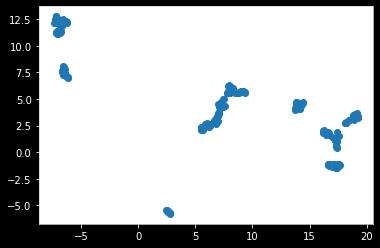

In [399]:
embedded = UMAP(n_components=2).fit_transform(coul_iter.reshape(266,900))

In [ ]:
def showRepresentation(sample, representation):
    f, ax = plt.subplots(1, 2)
    ax[0].set_title('Sample')
    ax[0].imshow(
        sample.reshape((8, 8)), cmap='gray_r', interpolation='nearest')

    ax[1].set_title('Representation')
    ax[1].barh(range(numberArchetypes), representation[0, :], align='center')

sample = digits.images[124].reshape((1, -1))
representation = archetypal.transform(sample)

showRepresentation(sample, representation)

In [ ]:
from sklearn import datasets

digits = datasets.load_digits(10)
nSamples = len(digits.images)
data = digits.images.reshape((nSamples, -1))

numberArchetypes = 10

archetypal = ArchetypalAnalysis(
    n_components=numberArchetypes, tmax=50, iterations=20)
archetypal.fit(data)

dataArchetypal = archetypal.transform(data)

archetypes = archetypal.get_archetypes()

f, ax = plt.subplots(2, 5, sharex='col', sharey='row', figsize=(10, 8))
f.suptitle('Archetypes', fontsize=14)

for i in range(2):
    for j in range(5):
        ax[i, j].imshow(
            archetypes[i * 5 + j, :].reshape((8, 8)), cmap='gray_r', interpolation='nearest')


In [ ]:
from sklearn.manifold import TSNE
from matplotlib import offsetbox

# create dummy entries for the archetypes
dataArchetypalWithDummy = np.vstack([np.eye(numberArchetypes), dataArchetypal])

tsne = TSNE(n_components=2)
dataArchetypalTSNE = tsne.fit_transform(dataArchetypalWithDummy)

_, ax = plt.subplots(figsize=(10, 8))
ax.set_title('TSNE')

ax.scatter(dataArchetypalTSNE[numberArchetypes:, 0], dataArchetypalTSNE[
           numberArchetypes:, 1], c=digits.target, s=6.0, cmap=plt.cm.get_cmap("jet", 10))
for i in range(np.size(archetypes, axis=0)):
    image = offsetbox.OffsetImage(archetypes[i, :].reshape((8, 8)), cmap='gray_r')
    imagebox = offsetbox.AnnotationBbox(image, dataArchetypalTSNE[i, :])
    ax.add_artist(imagebox)

In [ ]:
cmax = 0 

for key in dsets.keys():
    for mol in dsets[key]:
        if cmax < len(mol.degree):
            cmax = len(mol.degree)

print(cmax)

In [ ]:
eigen_vecs = [[mol.vector() for mol in dsets[key]] for key in dsets.keys()]
eigen_matrix = np.vstack(np.array(eigen_vecs))

In [ ]:
legend = {0 : "2IPs", 1: "3B69", 2: "IL85", 3: "S66"}
colors = {0 : "orange", 1:"blue", 2:"green", 3:"yellow"}

clusters = idxs.astype(np.int)
clust_colors = []
for i in clusters:
    clust_colors.append(colors[i[0]])
    
clust_colors.extend(["black"])

In [ ]:
from sklearn.manifold import TSNE

embedded = TSNE(n_components=2).fit_transform(eigen_matrix)


In [ ]:
def replace_with_dict2(ar, dic):
    # Extract out keys and values
    k = np.array(list(dic.keys()))
    v = np.array(list(dic.values()))

    # Get argsort indices
    sidx = k.argsort()
    print(sidx)

    ks = k[sidx]
    vs = v[sidx]
    return vs[np.searchsorted(ks,ar)]

In [ ]:

#dsets=load_obj("XYZ_Dsets")
for directory in dsets:
    dsets[directory] = [MolMat(f,max_size=30,sigma=5,sensitivity=5) for f in tqdm.tqdm([f"xyz/{directory}/{x}" for x in os.listdir(f"xyz/{directory}") if ".xyz" in x],position=0)]


In [ ]:
fig, ax = plt.subplots(figsize=(16,12)) 

for idx in np.unique(idxs):
    current_idxs = np.where(idxs == idx)[0]
    ax.scatter(embedded[current_idxs,0],embedded[current_idxs,1],s=60,edgecolor="k",label=legend[int(idx)])
    
ax.tick_params(axis = 'both', which = 'major', labelsize = 18)
#ax.spines["left"].set_position(('outward', 10))
#ax.spines["bottom"].set_position(('outward', 10))
# Hide the right and top spines
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.legend(markerscale=2,fontsize=22,frameon=False)
plt.title("Interaction Energy Datasets: t-SNE Dimensionality Reduction",fontsize=26)
ax.set_xlabel("X",fontsize=20)
ax.set_ylabel("Y",fontsize=20)
plt.savefig("t-SNE_Reduced.svg",bbox_inches="tight")


legend = {0 : "2IPs", 1: "3B69", 2: "IL85", 3: "S66"}
colors = {0 : "orange", 1:"blue", 2:"green", 3:"yellow"}


In [436]:
from sklearn.cluster import OPTICS,cluster_optics_dbscan

clustering = OPTICS(min_samples=10).fit(embedded)
dbscan = cluster_optics_dbscan(reachability=clustering.reachability_,
                                   core_distances=clustering.core_distances_,
                                   ordering=clustering.ordering_, eps=2)
labs = clustering.labels_

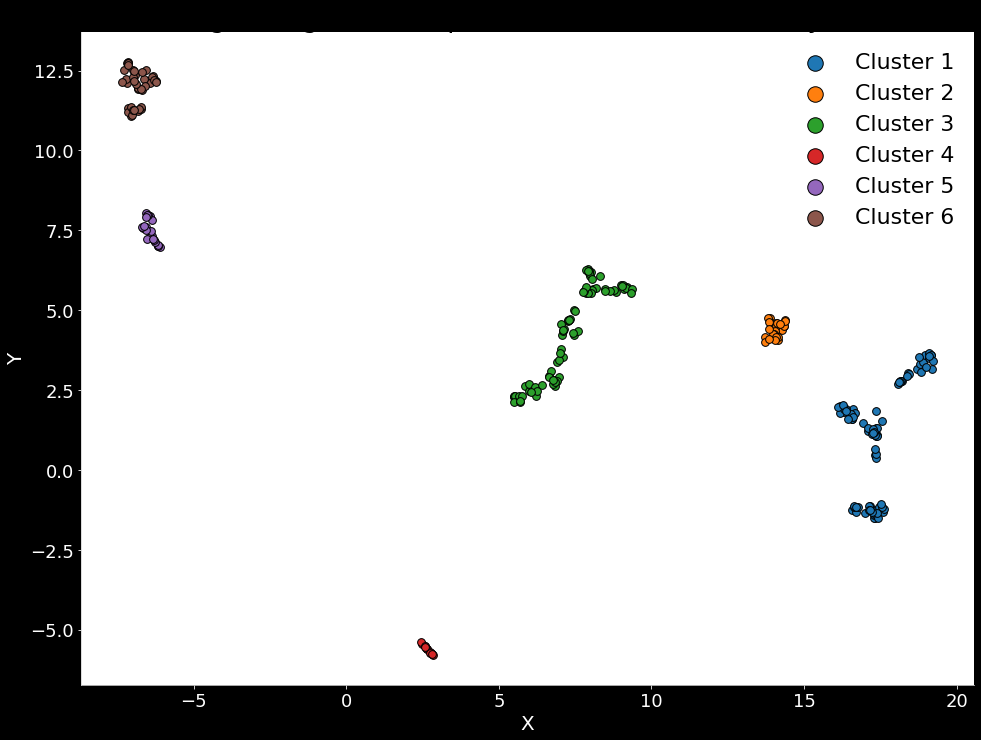

In [438]:
fig, ax = plt.subplots(figsize=(16,12)) 

for idx in np.unique(dbscan):
    current_idxs = np.where(dbscan == idx)[0]
    if idx == -1:
        label_idx = "Unclustered"
        ax.scatter(embedded[current_idxs,0],embedded[current_idxs,1],s=60,c="#808080",label=label_idx,cmap="Spectral")
    else:
        label_idx = f"Cluster {idx+1}"
        ax.scatter(embedded[current_idxs,0],embedded[current_idxs,1],s=60,edgecolor="k",label=label_idx,cmap="Spectral")

ax.tick_params(axis = 'both', which = 'major', labelsize = 18)
#ax.spines["left"].set_position(('outward', 10))
#ax.spines["bottom"].set_position(('outward', 10))
# Hide the right and top spines
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
# Only show ticks on the left and bottom spines
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
plt.legend(markerscale=2,fontsize=22,frameon=False)
plt.title("Clustering for Eigenvalue Spectra: t-SNE Dimensionality Reduction",fontsize=26)
ax.set_xlabel("X",fontsize=20)
ax.set_ylabel("Y",fontsize=20)
#plt.savefig("OPTICS_clustering.svg",bbox_inches="tight")

legend = {0 : "2IPs", 1: "3B69", 2: "IL85", 3: "S66"}
colors = {0 : "orange", 1:"blue", 2:"green", 3:"yellow"}


In [439]:
randics = []

for dataset in xyz.keys():
    for file in xyz[dataset].keys():
        xyz[dataset][file]["randic"] = randic(xyz[dataset][file]["adj"])
        randics.append(xyz[dataset][file]["randic"])

AttributeError: 'numpy.ndarray' object has no attribute 'keys'

In [33]:
cp = []
nocp = []
bsse = []
intref = []
idxs = []

intref = []

datasets = {"2IPs":blyp_two_IP,"3B69":blyp_threeB69,"IL85":blyp_IL85,"S66": blyp_S66}
legend = {integer : key for integer,key in enumerate(datasets.keys())}
for i,data in enumerate(datasets.values()):
    index = np.ones(len(data)) * i 
    intref.append(data["INT_ref"].to_numpy())
    cp.append(data["INT_cp"].to_numpy())
    nocp.append(data["INT_nocp"].to_numpy())
    bsse.append(data["BSSE"].to_numpy())
    idxs.append(index)
    
cp = np.concatenate(cp,axis=0).reshape(-1,1)
nocp = np.concatenate(nocp,axis=0).reshape(-1,1)
bsse = np.concatenate(bsse,axis=0).reshape(-1,1)
#intref = np.concatenate(intref,axis=0).reshape(-1,1)
idxs = np.concatenate(idxs,axis=0).reshape(-1,1)
"""randic = np.array(randics).reshape(-1,1)[:-1]

full = np.concatenate([cp,nocp,bsse,randic,idxs],axis=1)
full = np.delete(full,132,0)

"""

'randic = np.array(randics).reshape(-1,1)[:-1]\n\nfull = np.concatenate([cp,nocp,bsse,randic,idxs],axis=1)\nfull = np.delete(full,132,0)\n\n'

In [60]:
# penalise selecting a larger number of molecules
# reward the molecules being increasingly diverse
# reward the molecules having higher errors

def cost(mols,errors,eigen):
    #errors 
    errors    = np.mean(np.sum(np.abs(errors[mols]),axis=1))
    print(errors)
    diversity = np.var(eigen[mols])
    length    = len(mols)
    return (errors + diversity)/length

# Can I write a function that returns maximum diversity
# and another one that determines maximum diversity
# then merge the two.
# Use clusters to choose the most diverse molecules 

# 

In [61]:
cost(mols,errors,eigen)

1200.81


121.87317805636614

In [100]:
# Deep archetype https://github.com/bmda-unibas/DeepArchetypeAnalysis

array([[-736.75714286, -788.43636364,   51.68311688],
       [-858.06610169, -914.40338983,   56.33898305],
       [ -11.94296296,  -18.76814815,    6.83037037]])

,index,complex,avg_iso,dINT_MP2_ref_cp,dINT_BLYP_ref_cp,Dataset,Matrices
0,0,c4mim-ac-2-p2,76.219575,-3.133769,-65.2,2IPs,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
1,1,c4mim-ac-2-p4,75.993775,-12.332943,-63.9,2IPs,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
2,2,c4mim-ac-2-p7,76.230875,-2.756178,-83.5,2IPs,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
3,3,c4mim-ac-3-p4,76.237700,-14.680651,-156.0,2IPs,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
4,4,c4mim-ac-4-p2,76.164875,-14.335551,-143.9,2IPs,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
...,...,...,...,...,...,...,...
261,61,62_Pentane-AcNH2,51.509200,-3.203458,-24.5,S66,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
262,62,63_Benzene-AcOH,50.874650,-0.850732,-23.6,S66,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
263,63,64_Peptide-Ethene,38.957700,-2.247578,-16.2,S66,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...
264,64,65_Pyridine-Ethyne,43.213700,-0.849197,-5.6,S66,<xyz_parse.xyz_parse.classes.molmat.MolMat obj...


In [10]:
import shap

In [234]:
coul_iter2 = coul_iter.reshape(-1,900)
X_train, X_test = coul_iter2[:200],coul_iter2[200:]
Y_train, Y_test = df["avg_iso"][:200],df["avg_iso"][200:]

In [195]:
rf = RandomForestRegressor()
rf.fit(X_train,Y_train)

RandomForestRegressor()

In [202]:
rf = RandomForestRegressor()
rf.fit(X_train,Y_train)
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_train)

In [460]:
import os 

#for i in *.xyz; do echo $i; sed -ie '$d' $i; done


In [1166]:
qm9 = []
#dsets=load_obj("XYZ_Dsets")
for mol in tqdm.tqdm(sorted(list(os.walk("QM9/dsgdb9nsd.xyz"))[0][2])):
    qm9.append(MolMat(f"QM9/dsgdb9nsd.xyz/{mol}",max_size=9,sigma=5,sensitivity=5,probabilistic=False,error_checking=False))


  0%|          | 147/133885 [00:00<01:31, 1464.09it/s]

The bond between 1(C)-1(C) is 1.624212082134711, which has a z-score relative to this bond type of 5.21060410673555 should be manually checked
The bond between 3(C)-2(O) is 1.5712613468017116, which has a z-score relative to this bond type of 5.06306734008558 should be manually checked
The bond between 1(C)-1(C) is 1.6150894411525218, which has a z-score relative to this bond type of 4.754472057626091 should be manually checked
The bond between 3(C)-1(C) is 1.6198997349670388, which has a z-score relative to this bond type of 4.994986748351937 should be manually checked
The bond between 2(C)-1(O) is 1.6223394309359822, which has a z-score relative to this bond type of 5.1169715467991095 should be manually checked
The bond between 2(C)-3(C) is 1.622339555972616, which has a z-score relative to this bond type of 5.116977798630795 should be manually checked
The bond between 1(C)-1(C) is 1.6212619059325133, which has a z-score relative to this bond type of 5.063095296625663 should be manua

  0%|          | 381/133885 [00:00<01:59, 1114.46it/s]

The bond between 1(C)-1(C) is 1.6191879902676576, which has a z-score relative to this bond type of 4.959399513382878 should be manually checked
The bond between 4(C)-1(C) is 1.621590603110496, which has a z-score relative to this bond type of 5.079530155524803 should be manually checked
The bond between 4(C)-2(C) is 1.6211533243554659, which has a z-score relative to this bond type of 5.057666217773293 should be manually checked
The bond between 4(C)-1(C) is 1.6191161784015957, which has a z-score relative to this bond type of 4.955808920079785 should be manually checked
The bond between 4(C)-1(C) is 1.5747273487553468, which has a z-score relative to this bond type of 5.236367437767342 should be manually checked
The bond between 2(C)-2(C) is 1.6248527758372877, which has a z-score relative to this bond type of 5.242638791864384 should be manually checked
The bond between 3(C)-1(C) is 1.624697976546431, which has a z-score relative to this bond type of 5.234898827321555 should be manu

  1%|          | 814/133885 [00:00<01:40, 1318.64it/s]

The bond between 3(C)-3(C) is 1.5708717470654336, which has a z-score relative to this bond type of 5.029058235514458 should be manually checked
The bond between 3(C)-1(C) is 1.61890859621498, which has a z-score relative to this bond type of 4.945429810749002 should be manually checked
The bond between 3(C)-1(C) is 1.61541875304026, which has a z-score relative to this bond type of 4.7709376520129965 should be manually checked
The bond between 1(C)-1(C) is 1.6169933549650266, which has a z-score relative to this bond type of 4.8496677482513295 should be manually checked
The bond between 2(C)-4(C) is 1.5665249602235827, which has a z-score relative to this bond type of 4.826248011179135 should be manually checked
The bond between 2(C)-4(C) is 1.6154898557828221, which has a z-score relative to this bond type of 4.774492789141105 should be manually checked
The bond between 2(C)-1(O) is 1.5750711893339702, which has a z-score relative to this bond type of 5.169039644465675 should be manu

  1%|          | 1057/133885 [00:00<01:51, 1188.94it/s]

The bond between 5(C)-2(C) is 1.5725035648912287, which has a z-score relative to this bond type of 5.125178244561434 should be manually checked
The bond between 5(C)-1(C) is 1.569050291768219, which has a z-score relative to this bond type of 4.968343058940635 should be manually checked
The bond between 1(O)-1(O) is 1.571658913019406, which has a z-score relative to this bond type of 5.055297100646872 should be manually checked
The bond between 2(C)-5(C) is 1.5706573711775484, which has a z-score relative to this bond type of 5.032868558877423 should be manually checked
The bond between 2(C)-5(C) is 1.5700481133886437, which has a z-score relative to this bond type of 5.002405669432186 should be manually checked
The bond between 5(C)-2(C) is 1.5689405242539065, which has a z-score relative to this bond type of 4.964684141796886 should be manually checked
The bond between 5(C)-2(C) is 1.5651088286716972, which has a z-score relative to this bond type of 4.836960955723243 should be manu

  1%|          | 1190/133885 [00:00<01:48, 1223.28it/s]

The bond between 4(C)-1(C) is 1.6167215972830145, which has a z-score relative to this bond type of 4.836079864150721 should be manually checked
The bond between 4(C)-2(C) is 1.6167413111980438, which has a z-score relative to this bond type of 4.837065559902187 should be manually checked
The bond between 4(C)-3(C) is 1.6167640221617054, which has a z-score relative to this bond type of 4.838201108085271 should be manually checked
The bond between 2(C)-3(C) is 1.5698908567810324, which has a z-score relative to this bond type of 4.996361892701081 should be manually checked
The bond between 1(C)-1(C) is 1.6229021591996657, which has a z-score relative to this bond type of 5.145107959983286 should be manually checked
The bond between 5(C)-2(C) is 1.565007025399953, which has a z-score relative to this bond type of 4.833567513331771 should be manually checked
The bond between 2(C)-2(C) is 1.5713842519149954, which has a z-score relative to this bond type of 5.04614173049985 should be manu

  1%|          | 1447/133885 [00:01<01:57, 1127.93it/s]

The bond between 4(C)-1(C) is 1.6209296625212735, which has a z-score relative to this bond type of 5.046483126063672 should be manually checked
The bond between 2(C)-2(C) is 1.5661156055037715, which has a z-score relative to this bond type of 4.870520183459052 should be manually checked
The bond between 1(C)-1(C) is 1.6204438750508334, which has a z-score relative to this bond type of 5.02219375254167 should be manually checked
The bond between 1(C)-1(C) is 1.6196976090890987, which has a z-score relative to this bond type of 4.984880454454932 should be manually checked
The bond between 5(C)-1(C) is 1.6207118035601342, which has a z-score relative to this bond type of 5.03559017800671 should be manually checked
The bond between 5(C)-1(C) is 1.6206509256130905, which has a z-score relative to this bond type of 5.032546280654526 should be manually checked
The bond between 5(C)-1(C) is 1.618983308483011, which has a z-score relative to this bond type of 4.949165424150547 should be manua

  1%|▏         | 1702/133885 [00:01<02:04, 1057.60it/s]

The bond between 4(C)-1(C) is 1.6161532891395816, which has a z-score relative to this bond type of 4.807664456979077 should be manually checked
The bond between 3(C)-1(C) is 1.6236635267833885, which has a z-score relative to this bond type of 5.183176339169426 should be manually checked
The bond between 2(C)-2(C) is 1.6217576210916531, which has a z-score relative to this bond type of 5.087881054582654 should be manually checked
The bond between 5(C)-2(C) is 1.5642467001087104, which has a z-score relative to this bond type of 4.808223336957015 should be manually checked
The bond between 1(C)-1(C) is 1.6248807923616673, which has a z-score relative to this bond type of 5.244039618083362 should be manually checked
The bond between 1(C)-1(C) is 1.6162716190276867, which has a z-score relative to this bond type of 4.813580951384333 should be manually checked
The bond between 1(C)-1(C) is 1.6215035756644152, which has a z-score relative to this bond type of 5.075178783220757 should be ma

  1%|▏         | 1971/133885 [00:01<01:51, 1183.88it/s]

The bond between 3(C)-1(C) is 1.6217742113781208, which has a z-score relative to this bond type of 5.08871056890604 should be manually checked
The bond between 3(C)-1(C) is 1.6228506685495205, which has a z-score relative to this bond type of 5.1425334274760255 should be manually checked
The bond between 2(O)-1(C) is 1.5753229441240415, which has a z-score relative to this bond type of 5.177431470801386 should be manually checked
The bond between 4(C)-2(C) is 1.624969784336313, which has a z-score relative to this bond type of 5.248489216815644 should be manually checked
The bond between 4(C)-2(C) is 1.6248504993496948, which has a z-score relative to this bond type of 5.242524967484741 should be manually checked
The bond between 5(C)-1(N) is 1.5647725515328783, which has a z-score relative to this bond type of 4.825751717762613 should be manually checked
The bond between 4(C)-2(C) is 1.6196790738533162, which has a z-score relative to this bond type of 4.98395369266581 should be manu

  2%|▏         | 2235/133885 [00:01<01:45, 1242.73it/s]

The bond between 4(C)-1(C) is 1.6165730928517457, which has a z-score relative to this bond type of 4.828654642587282 should be manually checked
The bond between 4(C)-2(N) is 1.574635056934599, which has a z-score relative to this bond type of 5.154501897819971 should be manually checked
The bond between 2(C)-5(C) is 1.6207362891642831, which has a z-score relative to this bond type of 5.036814458214156 should be manually checked
The bond between 2(C)-1(O) is 1.622588984394004, which has a z-score relative to this bond type of 5.1294492197001995 should be manually checked
The bond between 2(C)-1(O) is 1.6172699589449915, which has a z-score relative to this bond type of 4.863497947249573 should be manually checked
The bond between 2(C)-5(C) is 1.6172683073988696, which has a z-score relative to this bond type of 4.86341536994348 should be manually checked
The bond between 1(C)-1(C) is 1.6153010452561396, which has a z-score relative to this bond type of 4.765052262806979 should be manu

  2%|▏         | 2509/133885 [00:02<01:51, 1175.79it/s]

The bond between 2(C)-1(O) is 1.5743576101413777, which has a z-score relative to this bond type of 5.145253671379257 should be manually checked
The bond between 4(C)-1(C) is 1.6228621532844485, which has a z-score relative to this bond type of 5.143107664222423 should be manually checked
The bond between 1(C)-1(C) is 1.6169876637238445, which has a z-score relative to this bond type of 4.849383186192224 should be manually checked
The bond between 1(C)-1(C) is 1.617942045386078, which has a z-score relative to this bond type of 4.897102269303899 should be manually checked
The bond between 1(C)-1(C) is 1.6173053991795394, which has a z-score relative to this bond type of 4.8652699589769695 should be manually checked
The bond between 1(C)-1(C) is 1.619738981935675, which has a z-score relative to this bond type of 4.986949096783744 should be manually checked
The bond between 1(C)-1(C) is 1.6158992161632328, which has a z-score relative to this bond type of 4.794960808161641 should be man

  2%|▏         | 2788/133885 [00:02<01:43, 1270.72it/s]

The bond between 3(C)-4(C) is 1.5674112142288272, which has a z-score relative to this bond type of 4.91370714096091 should be manually checked
The bond between 2(C)-1(C) is 1.6187196904133985, which has a z-score relative to this bond type of 4.935984520669923 should be manually checked
The bond between 3(C)-1(O) is 1.6176038755500495, which has a z-score relative to this bond type of 4.880193777502472 should be manually checked
The bond between 3(C)-2(C) is 1.6204708622189252, which has a z-score relative to this bond type of 5.02354311094626 should be manually checked
The bond between 3(C)-1(C) is 1.6217637609268758, which has a z-score relative to this bond type of 5.088188046343789 should be manually checked
The bond between 2(C)-1(O) is 1.6175720494357135, which has a z-score relative to this bond type of 4.878602471785675 should be manually checked
The bond between 2(C)-1(O) is 1.6176446303646852, which has a z-score relative to this bond type of 4.882231518234259 should be manu

  2%|▏         | 3200/133885 [00:02<01:41, 1289.90it/s]

The bond between 2(C)-1(C) is 1.6191285979029024, which has a z-score relative to this bond type of 4.95642989514512 should be manually checked
The bond between 3(C)-1(C) is 1.6211977545873975, which has a z-score relative to this bond type of 5.059887729369872 should be manually checked
The bond between 2(N)-1(C) is 1.56844597517783, which has a z-score relative to this bond type of 4.922298758891497 should be manually checked
The bond between 3(C)-1(C) is 1.616916489244401, which has a z-score relative to this bond type of 4.845824462220049 should be manually checked
The bond between 3(C)-1(C) is 1.619865445514668, which has a z-score relative to this bond type of 4.993272275733395 should be manually checked
The bond between 3(C)-4(C) is 1.5663211122148646, which has a z-score relative to this bond type of 4.8773704071621555 should be manually checked
The bond between 3(C)-4(C) is 1.6244869437569527, which has a z-score relative to this bond type of 5.224347187847633 should be manual

  3%|▎         | 3476/133885 [00:02<01:37, 1333.42it/s]

The bond between 2(C)-4(O) is 1.619209553781509, which has a z-score relative to this bond type of 4.960477689075448 should be manually checked
The bond between 2(C)-5(C) is 1.6174406039544162, which has a z-score relative to this bond type of 4.872030197720811 should be manually checked
The bond between 2(C)-5(C) is 1.6160085772636725, which has a z-score relative to this bond type of 4.800428863183625 should be manually checked
The bond between 2(C)-1(C) is 1.5704606992960146, which has a z-score relative to this bond type of 5.01535664320049 should be manually checked
The bond between 2(C)-5(N) is 1.624408304869052, which has a z-score relative to this bond type of 5.220415243452603 should be manually checked
The bond between 3(C)-4(C) is 1.6198083402881966, which has a z-score relative to this bond type of 4.990417014409831 should be manually checked
The bond between 3(C)-4(C) is 1.6176438864131608, which has a z-score relative to this bond type of 4.88219432065804 should be manual

  3%|▎         | 3616/133885 [00:02<01:36, 1351.88it/s]

The bond between 3(C)-3(C) is 1.571699397137253, which has a z-score relative to this bond type of 5.084969856862653 should be manually checked
The bond between 4(C)-1(C) is 1.617234974597561, which has a z-score relative to this bond type of 4.8617487298780455 should be manually checked
The bond between 3(C)-1(C) is 1.6181957638089342, which has a z-score relative to this bond type of 4.909788190446706 should be manually checked
The bond between 3(C)-3(C) is 1.6181987007347614, which has a z-score relative to this bond type of 4.909935036738067 should be manually checked
The bond between 3(C)-1(C) is 1.6180781219022504, which has a z-score relative to this bond type of 4.90390609511252 should be manually checked
The bond between 3(C)-3(C) is 1.6242259269640287, which has a z-score relative to this bond type of 5.211296348201433 should be manually checked
The bond between 4(C)-3(C) is 1.5678905055418786, which has a z-score relative to this bond type of 4.894525277093931 should be manu

  3%|▎         | 3872/133885 [00:03<02:09, 1007.40it/s]

The bond between 2(C)-1(C) is 1.6150129544931406, which has a z-score relative to this bond type of 4.750647724657031 should be manually checked
The bond between 2(C)-1(C) is 1.621942970477212, which has a z-score relative to this bond type of 5.097148523860595 should be manually checked
The bond between 2(C)-1(C) is 1.6248216388665637, which has a z-score relative to this bond type of 5.241081943328185 should be manually checked
The bond between 4(C)-1(C) is 1.5656589203215514, which has a z-score relative to this bond type of 4.855297344051716 should be manually checked
The bond between 5(O)-1(C) is 1.5641840919296088, which has a z-score relative to this bond type of 4.80613639765363 should be manually checked
The bond between 6(C)-1(C) is 1.5633231356498614, which has a z-score relative to this bond type of 4.777437854995381 should be manually checked
The bond between 2(N)-1(C) is 1.5662340890990203, which has a z-score relative to this bond type of 4.811704454951015 should be manu

  3%|▎         | 4117/133885 [00:03<01:58, 1091.40it/s]

The bond between 2(C)-1(O) is 1.5666571447612723, which has a z-score relative to this bond type of 4.888571492042412 should be manually checked
The bond between 2(C)-1(O) is 1.5704849329033452, which has a z-score relative to this bond type of 5.016164430111511 should be manually checked
The bond between 2(C)-5(N) is 1.6225627755311607, which has a z-score relative to this bond type of 5.128138776558033 should be manually checked
The bond between 2(C)-1(O) is 1.572501629131759, which has a z-score relative to this bond type of 5.083387637725305 should be manually checked
The bond between 5(O)-1(O) is 1.5246724210402112, which has a z-score relative to this bond type of 5.155747368007035 should be manually checked
The bond between 1(O)-1(O) is 1.576605599152279, which has a z-score relative to this bond type of 5.2201866384093005 should be manually checked
The bond between 1(O)-1(O) is 1.5679759123892676, which has a z-score relative to this bond type of 4.932530412975589 should be man

  3%|▎         | 4343/133885 [00:03<01:59, 1087.98it/s]

The bond between 3(C)-3(C) is 1.6174533819808388, which has a z-score relative to this bond type of 4.8726690990419375 should be manually checked
The bond between 6(C)-1(O) is 1.6238587789925154, which has a z-score relative to this bond type of 5.192938949625769 should be manually checked
The bond between 6(C)-2(N) is 1.623857805362057, which has a z-score relative to this bond type of 5.192890268102845 should be manually checked
The bond between 2(C)-4(C) is 1.6169055812877926, which has a z-score relative to this bond type of 4.845279064389629 should be manually checked
The bond between 5(C)-1(C) is 1.623680478223787, which has a z-score relative to this bond type of 5.1840239111893505 should be manually checked
The bond between 4(C)-1(O) is 1.6186718002851261, which has a z-score relative to this bond type of 4.933590014256306 should be manually checked
The bond between 3(C)-1(O) is 1.6168841357491772, which has a z-score relative to this bond type of 4.84420678745886 should be man

  3%|▎         | 4569/133885 [00:03<02:00, 1069.83it/s]

The bond between 5(N)-1(N) is 1.5682255502194709, which has a z-score relative to this bond type of 4.911277510973544 should be manually checked
The bond between 2(C)-6(C) is 1.566327762204077, which has a z-score relative to this bond type of 4.81638811020385 should be manually checked
The bond between 5(N)-1(N) is 1.5686546193545816, which has a z-score relative to this bond type of 4.932730967729082 should be manually checked
The bond between 6(C)-1(N) is 1.5726442784250527, which has a z-score relative to this bond type of 5.088142614168427 should be manually checked
The bond between 1(O)-1(O) is 1.5767759063965254, which has a z-score relative to this bond type of 5.22586354655085 should be manually checked
The bond between 4(C)-1(O) is 1.5767755749028287, which has a z-score relative to this bond type of 5.22585249676096 should be manually checked
The bond between 2(C)-6(N) is 1.5697584310179153, which has a z-score relative to this bond type of 4.987921550895768 should be manual

  4%|▎         | 4798/133885 [00:04<01:59, 1080.85it/s]

The bond between 5(C)-1(N) is 1.5691568098557083, which has a z-score relative to this bond type of 4.971893661856945 should be manually checked
The bond between 1(O)-1(O) is 1.5697072099690617, which has a z-score relative to this bond type of 4.990240332302058 should be manually checked
The bond between 4(N)-1(C) is 1.5705401657915106, which has a z-score relative to this bond type of 5.027008289575529 should be manually checked
The bond between 5(C)-1(C) is 1.568787175082134, which has a z-score relative to this bond type of 4.939358754106704 should be manually checked
The bond between 5(C)-2(C) is 1.5709479503731978, which has a z-score relative to this bond type of 5.04739751865989 should be manually checked
The bond between 4(O)-1(C) is 1.5724929735265933, which has a z-score relative to this bond type of 5.083099117553114 should be manually checked
The bond between 5(C)-1(N) is 1.574928656482593, which has a z-score relative to this bond type of 5.246432824129654 should be manua

  4%|▍         | 5029/133885 [00:04<01:55, 1114.25it/s]

The bond between 4(N)-1(O) is 1.573576944356479, which has a z-score relative to this bond type of 5.178847217823956 should be manually checked
The bond between 5(C)-1(C) is 1.6163929500387701, which has a z-score relative to this bond type of 4.8196475019385066 should be manually checked
The bond between 2(C)-1(C) is 1.622250997780364, which has a z-score relative to this bond type of 5.112549889018203 should be manually checked
The bond between 2(C)-1(C) is 1.617273862701048, which has a z-score relative to this bond type of 4.863693135052394 should be manually checked
The bond between 6(C)-2(C) is 1.5739286168431237, which has a z-score relative to this bond type of 5.196430842156185 should be manually checked
The bond between 2(C)-1(C) is 1.6224028914081121, which has a z-score relative to this bond type of 5.120144570405604 should be manually checked
The bond between 6(C)-1(C) is 1.5686199594254948, which has a z-score relative to this bond type of 4.953998647516497 should be manu

  4%|▍         | 5279/133885 [00:04<01:49, 1178.06it/s]

The bond between 3(C)-1(C) is 1.622102261900708, which has a z-score relative to this bond type of 5.105113095035396 should be manually checked
The bond between 3(C)-1(C) is 1.5691533533915851, which has a z-score relative to this bond type of 4.957667669579258 should be manually checked
The bond between 5(C)-1(C) is 1.56435936616121, which has a z-score relative to this bond type of 4.8119788720403385 should be manually checked
The bond between 1(C)-1(C) is 1.6230827733387616, which has a z-score relative to this bond type of 5.1541386669380795 should be manually checked
The bond between 1(C)-1(C) is 1.6243710770941797, which has a z-score relative to this bond type of 5.2185538547089845 should be manually checked
The bond between 5(C)-1(C) is 1.5625389003903847, which has a z-score relative to this bond type of 4.751296679679492 should be manually checked
The bond between 3(C)-1(N) is 1.5703440162957176, which has a z-score relative to this bond type of 5.011467209857257 should be ma

  4%|▍         | 5518/133885 [00:04<01:48, 1178.04it/s]

The bond between 2(C)-6(C) is 1.6226252926995455, which has a z-score relative to this bond type of 5.131264634977272 should be manually checked
The bond between 1(O)-1(O) is 1.573479528933556, which has a z-score relative to this bond type of 5.1159842977852 should be manually checked
The bond between 3(C)-5(C) is 1.5712904819235258, which has a z-score relative to this bond type of 5.064524096176292 should be manually checked
The bond between 3(C)-5(C) is 1.5734157773167365, which has a z-score relative to this bond type of 5.170788865836828 should be manually checked
The bond between 3(C)-1(C) is 1.571351446322971, which has a z-score relative to this bond type of 5.067572316148549 should be manually checked
The bond between 2(C)-1(C) is 1.6185483565554226, which has a z-score relative to this bond type of 4.92741782777113 should be manually checked
The bond between 2(C)-1(C) is 1.6243916346968097, which has a z-score relative to this bond type of 5.219581734840483 should be manuall

  4%|▍         | 5756/133885 [00:04<01:49, 1165.73it/s]

The bond between 4(C)-1(C) is 1.5714361834777335, which has a z-score relative to this bond type of 5.04787278259112 should be manually checked
The bond between 4(C)-1(C) is 1.5630768811444902, which has a z-score relative to this bond type of 4.769229371483008 should be manually checked
The bond between 4(C)-1(C) is 1.5737086340177338, which has a z-score relative to this bond type of 5.185431700886689 should be manually checked
The bond between 2(C)-1(C) is 1.621993024141758, which has a z-score relative to this bond type of 5.099651207087896 should be manually checked
The bond between 3(C)-1(C) is 1.5709207233471172, which has a z-score relative to this bond type of 5.046036167355861 should be manually checked
The bond between 7(C)-1(C) is 1.6176002781557701, which has a z-score relative to this bond type of 4.880013907788505 should be manually checked
The bond between 1(N)-1(N) is 1.571676106499452, which has a z-score relative to this bond type of 5.083805324972601 should be manua

  4%|▍         | 5989/133885 [00:05<01:54, 1118.80it/s]

The bond between 2(C)-3(C) is 1.617584320321586, which has a z-score relative to this bond type of 4.879216016079302 should be manually checked
The bond between 1(C)-1(C) is 1.6247335152028985, which has a z-score relative to this bond type of 5.2366757601449265 should be manually checked
The bond between 2(C)-2(C) is 1.574783882794406, which has a z-score relative to this bond type of 5.159462759813538 should be manually checked
The bond between 1(C)-1(C) is 1.6230378193621657, which has a z-score relative to this bond type of 5.151890968108286 should be manually checked
The bond between 2(C)-3(C) is 1.6186342501578423, which has a z-score relative to this bond type of 4.931712507892116 should be manually checked
The bond between 5(C)-1(C) is 1.622871394828441, which has a z-score relative to this bond type of 5.143569741422049 should be manually checked
The bond between 5(C)-3(C) is 1.5719285868171076, which has a z-score relative to this bond type of 5.064286227236922 should be manu

  5%|▍         | 6212/133885 [00:05<01:57, 1082.93it/s]

The bond between 1(C)-1(C) is 1.620778664901105, which has a z-score relative to this bond type of 5.038933245055244 should be manually checked
The bond between 6(C)-2(C) is 1.5671866588451033, which has a z-score relative to this bond type of 4.906221961503447 should be manually checked
The bond between 3(C)-1(C) is 1.618926855160474, which has a z-score relative to this bond type of 4.946342758023703 should be manually checked
The bond between 3(C)-2(N) is 1.622318587345515, which has a z-score relative to this bond type of 5.115929367275751 should be manually checked
The bond between 6(C)-1(C) is 1.5636729695303564, which has a z-score relative to this bond type of 4.789098984345216 should be manually checked
The bond between 4(C)-3(C) is 1.6236451851764415, which has a z-score relative to this bond type of 5.182259258822075 should be manually checked
The bond between 2(C)-1(C) is 1.6192338231232821, which has a z-score relative to this bond type of 4.961691156164105 should be manua

  5%|▍         | 6430/133885 [00:05<01:58, 1079.42it/s]

The bond between 2(C)-2(C) is 1.5651428264345673, which has a z-score relative to this bond type of 4.757141321728364 should be manually checked
The bond between 4(C)-1(C) is 1.6198460941262394, which has a z-score relative to this bond type of 4.992304706311967 should be manually checked
The bond between 1(C)-1(C) is 1.618238114299065, which has a z-score relative to this bond type of 4.911905714953246 should be manually checked
The bond between 1(C)-1(C) is 1.6235092020623738, which has a z-score relative to this bond type of 5.17546010311869 should be manually checked
The bond between 2(C)-2(C) is 1.6202902224471898, which has a z-score relative to this bond type of 5.0145111223594885 should be manually checked
The bond between 4(C)-1(C) is 1.6156188693536402, which has a z-score relative to this bond type of 4.780943467682008 should be manually checked
The bond between 4(C)-1(C) is 1.616219227415869, which has a z-score relative to this bond type of 4.8109613707934535 should be man

  5%|▍         | 6654/133885 [00:05<01:55, 1098.80it/s]

The bond between 6(C)-1(C) is 1.6214014964014698, which has a z-score relative to this bond type of 5.070074820073489 should be manually checked
The bond between 5(C)-1(C) is 1.6231975713536169, which has a z-score relative to this bond type of 5.159878567680842 should be manually checked
The bond between 5(C)-1(C) is 1.62051932210811, which has a z-score relative to this bond type of 5.025966105405499 should be manually checked
The bond between 2(C)-2(C) is 1.5709956899686548, which has a z-score relative to this bond type of 5.049784498432741 should be manually checked
The bond between 5(O)-1(C) is 1.5705228810504959, which has a z-score relative to this bond type of 5.017429368349865 should be manually checked
The bond between 2(C)-6(O) is 1.6210666045228348, which has a z-score relative to this bond type of 5.053330226141739 should be manually checked
The bond between 1(C)-1(C) is 1.6214838814839607, which has a z-score relative to this bond type of 5.074194074198035 should be manu

  5%|▌         | 6876/133885 [00:05<01:56, 1087.92it/s]

The bond between 1(C)-1(C) is 1.6215815218911025, which has a z-score relative to this bond type of 5.079076094555123 should be manually checked
The bond between 1(C)-1(C) is 1.6193927822257472, which has a z-score relative to this bond type of 4.969639111287361 should be manually checked
The bond between 2(C)-1(C) is 1.6172898149851387, which has a z-score relative to this bond type of 4.864490749256933 should be manually checked
The bond between 1(C)-1(C) is 1.6195763473825238, which has a z-score relative to this bond type of 4.978817369126187 should be manually checked
The bond between 1(C)-1(C) is 1.6202690680292526, which has a z-score relative to this bond type of 5.01345340146263 should be manually checked
The bond between 1(C)-1(C) is 1.6163769421975347, which has a z-score relative to this bond type of 4.818847109876733 should be manually checked
The bond between 1(C)-1(C) is 1.6184093330553386, which has a z-score relative to this bond type of 4.9204666527669305 should be ma

  5%|▌         | 7101/133885 [00:06<01:54, 1103.36it/s]

The bond between 2(C)-2(C) is 1.623684303119216, which has a z-score relative to this bond type of 5.1842151559608025 should be manually checked
The bond between 2(C)-2(C) is 1.6205031816744258, which has a z-score relative to this bond type of 5.025159083721286 should be manually checked
The bond between 5(C)-1(C) is 1.6233196895518567, which has a z-score relative to this bond type of 5.165984477592833 should be manually checked
The bond between 6(N)-1(C) is 1.5678943240542424, which has a z-score relative to this bond type of 4.894716202712123 should be manually checked
The bond between 6(N)-1(C) is 1.5687024747650389, which has a z-score relative to this bond type of 4.935123738251945 should be manually checked
The bond between 7(C)-1(C) is 1.5667160326317533, which has a z-score relative to this bond type of 4.835801631587666 should be manually checked
The bond between 1(C)-1(C) is 1.6159659017404309, which has a z-score relative to this bond type of 4.798295087021542 should be ma

  5%|▌         | 7324/133885 [00:06<01:55, 1091.84it/s]

The bond between 4(C)-2(C) is 1.5761019798744103, which has a z-score relative to this bond type of 5.203399329147011 should be manually checked
The bond between 4(C)-1(C) is 1.5686360899086713, which has a z-score relative to this bond type of 4.931804495433567 should be manually checked
The bond between 6(C)-1(C) is 1.6181393562155821, which has a z-score relative to this bond type of 4.906967810779106 should be manually checked
The bond between 4(C)-2(C) is 1.6215464280712872, which has a z-score relative to this bond type of 5.077321403564361 should be manually checked
The bond between 4(C)-2(C) is 1.6163050015722897, which has a z-score relative to this bond type of 4.815250078614485 should be manually checked
The bond between 4(C)-2(O) is 1.6163019193237642, which has a z-score relative to this bond type of 4.81509596618821 should be manually checked
The bond between 6(C)-1(O) is 1.6172413553388727, which has a z-score relative to this bond type of 4.862067766943634 should be man

  6%|▌         | 7549/133885 [00:06<01:54, 1099.42it/s]

The bond between 6(C)-2(C) is 1.563730701168826, which has a z-score relative to this bond type of 4.791023372294201 should be manually checked
The bond between 6(C)-1(C) is 1.6171023166695186, which has a z-score relative to this bond type of 4.8551158334759315 should be manually checked
The bond between 4(C)-1(C) is 1.6222717226635524, which has a z-score relative to this bond type of 5.113586133177616 should be manually checked
The bond between 6(C)-1(C) is 1.6157808367745605, which has a z-score relative to this bond type of 4.789041838728025 should be manually checked
The bond between 6(C)-1(C) is 1.618190770816261, which has a z-score relative to this bond type of 4.909538540813052 should be manually checked
The bond between 4(C)-2(C) is 1.6180667162719347, which has a z-score relative to this bond type of 4.9033358135967315 should be manually checked
The bond between 2(C)-4(N) is 1.6195651138161955, which has a z-score relative to this bond type of 4.978255690809774 should be ma

  6%|▌         | 7776/133885 [00:06<01:53, 1108.68it/s]

The bond between 1(C)-1(C) is 1.615649600624647, which has a z-score relative to this bond type of 4.78248003123235 should be manually checked
The bond between 4(C)-2(C) is 1.622239743739163, which has a z-score relative to this bond type of 5.111987186958144 should be manually checked
The bond between 2(C)-1(C) is 1.6247825490480918, which has a z-score relative to this bond type of 5.23912745240459 should be manually checked
The bond between 6(C)-1(C) is 1.5670881033537163, which has a z-score relative to this bond type of 4.902936778457212 should be manually checked
The bond between 4(C)-1(C) is 1.5669123567582874, which has a z-score relative to this bond type of 4.897078558609584 should be manually checked
The bond between 3(C)-1(C) is 1.6191700449946538, which has a z-score relative to this bond type of 4.958502249732688 should be manually checked
The bond between 3(C)-1(N) is 1.622542061515278, which has a z-score relative to this bond type of 5.127103075763895 should be manuall

  6%|▌         | 7995/133885 [00:07<02:03, 1022.82it/s]

The bond between 5(C)-1(C) is 1.619960771703534, which has a z-score relative to this bond type of 4.9980385851767 should be manually checked
The bond between 5(C)-1(C) is 1.6228658606846873, which has a z-score relative to this bond type of 5.143293034234364 should be manually checked
The bond between 1(C)-1(C) is 1.6202028702088433, which has a z-score relative to this bond type of 5.010143510442166 should be manually checked
The bond between 6(C)-1(C) is 1.620202869725121, which has a z-score relative to this bond type of 5.010143486256046 should be manually checked
The bond between 1(C)-1(C) is 1.623683485497837, which has a z-score relative to this bond type of 5.18417427489185 should be manually checked
The bond between 2(C)-1(C) is 1.618132064928165, which has a z-score relative to this bond type of 4.906603246408247 should be manually checked
The bond between 1(C)-1(C) is 1.6221289353593797, which has a z-score relative to this bond type of 5.106446767968986 should be manually 

  6%|▌         | 8236/133885 [00:07<01:53, 1103.87it/s]

The bond between 1(C)-1(C) is 1.6228183454826106, which has a z-score relative to this bond type of 5.14091727413053 should be manually checked
The bond between 6(C)-1(C) is 1.6160915194362346, which has a z-score relative to this bond type of 4.8045759718117305 should be manually checked
The bond between 3(C)-1(O) is 1.6177574829872454, which has a z-score relative to this bond type of 4.88787414936227 should be manually checked
The bond between 6(C)-2(C) is 1.5633837927277887, which has a z-score relative to this bond type of 4.77945975759296 should be manually checked
The bond between 2(C)-1(C) is 1.6191643199208838, which has a z-score relative to this bond type of 4.95821599604419 should be manually checked
The bond between 2(C)-3(C) is 1.6150904899530092, which has a z-score relative to this bond type of 4.754524497650459 should be manually checked
The bond between 6(C)-2(C) is 1.5726851696890698, which has a z-score relative to this bond type of 5.089505656302329 should be manua

  6%|▋         | 8468/133885 [00:07<01:50, 1132.01it/s]

The bond between 2(C)-6(C) is 1.5661833600763626, which has a z-score relative to this bond type of 4.809168003818131 should be manually checked
The bond between 2(C)-6(C) is 1.5738103934430292, which has a z-score relative to this bond type of 5.190519672151461 should be manually checked
The bond between 3(C)-1(N) is 1.6224088323280133, which has a z-score relative to this bond type of 5.120441616400662 should be manually checked
The bond between 4(C)-1(O) is 1.6238811323685018, which has a z-score relative to this bond type of 5.194056618425091 should be manually checked
The bond between 6(C)-2(C) is 1.5710660052453325, which has a z-score relative to this bond type of 5.0533002622666245 should be manually checked
The bond between 4(C)-1(O) is 1.61643366611008, which has a z-score relative to this bond type of 4.821683305503998 should be manually checked
The bond between 4(C)-4(C) is 1.6164314501022181, which has a z-score relative to this bond type of 4.821572505110905 should be man

  7%|▋         | 8713/133885 [00:07<01:46, 1172.89it/s]

The bond between 2(C)-1(O) is 1.6171900140899453, which has a z-score relative to this bond type of 4.859500704497266 should be manually checked
The bond between 4(C)-2(C) is 1.6236849942600384, which has a z-score relative to this bond type of 5.18424971300192 should be manually checked
The bond between 4(C)-2(C) is 1.6249503976542412, which has a z-score relative to this bond type of 5.2475198827120595 should be manually checked
The bond between 4(C)-2(C) is 1.6150220079063433, which has a z-score relative to this bond type of 4.751100395317165 should be manually checked
The bond between 2(C)-6(O) is 1.622878200076847, which has a z-score relative to this bond type of 5.143910003842344 should be manually checked
The bond between 4(C)-4(C) is 1.624364854492446, which has a z-score relative to this bond type of 5.218242724622302 should be manually checked
The bond between 5(C)-3(C) is 1.569767537728368, which has a z-score relative to this bond type of 4.9883768864184 should be manuall

  7%|▋         | 8956/133885 [00:07<01:44, 1192.94it/s]

The bond between 2(C)-1(C) is 1.615793838666666, which has a z-score relative to this bond type of 4.7896919333332955 should be manually checked
The bond between 2(C)-1(C) is 1.6161299438814323, which has a z-score relative to this bond type of 4.806497194071612 should be manually checked
The bond between 3(C)-2(C) is 1.624753037596625, which has a z-score relative to this bond type of 5.237651879831251 should be manually checked
The bond between 3(C)-2(C) is 1.6207149016954439, which has a z-score relative to this bond type of 5.035745084772191 should be manually checked
The bond between 2(C)-3(C) is 1.6154174245907889, which has a z-score relative to this bond type of 4.770871229539441 should be manually checked
The bond between 3(C)-1(C) is 1.5689214008166197, which has a z-score relative to this bond type of 4.9460700408309854 should be manually checked
The bond between 5(C)-2(N) is 1.6249393454563774, which has a z-score relative to this bond type of 5.246967272818869 should be ma

  7%|▋         | 9208/133885 [00:08<01:41, 1226.38it/s]

The bond between 2(C)-3(C) is 1.6184412850029786, which has a z-score relative to this bond type of 4.922064250148927 should be manually checked
The bond between 2(C)-3(C) is 1.6155135911670895, which has a z-score relative to this bond type of 4.775679558354473 should be manually checked
The bond between 5(C)-2(N) is 1.6231867490620475, which has a z-score relative to this bond type of 5.159337453102375 should be manually checked
The bond between 3(C)-2(C) is 1.5717147577460509, which has a z-score relative to this bond type of 5.085737887302543 should be manually checked
The bond between 2(O)-1(C) is 1.5704536243733243, which has a z-score relative to this bond type of 5.015120812444144 should be manually checked
The bond between 2(O)-1(C) is 1.5680477474817442, which has a z-score relative to this bond type of 4.9349249160581445 should be manually checked
The bond between 3(C)-1(N) is 1.5747745052045823, which has a z-score relative to this bond type of 5.159150173486079 should be m

  7%|▋         | 9457/133885 [00:08<01:43, 1197.06it/s]

The bond between 3(C)-1(C) is 1.6242257334444068, which has a z-score relative to this bond type of 5.211286672220338 should be manually checked
The bond between 4(C)-1(C) is 1.6222175328137576, which has a z-score relative to this bond type of 5.110876640687878 should be manually checked
The bond between 4(C)-1(C) is 1.6220488259680534, which has a z-score relative to this bond type of 5.102441298402671 should be manually checked
The bond between 4(C)-1(C) is 1.6212479535102773, which has a z-score relative to this bond type of 5.062397675513863 should be manually checked
The bond between 5(C)-2(C) is 1.570868670917806, which has a z-score relative to this bond type of 5.0289556972602 should be manually checked
The bond between 4(O)-1(C) is 1.5755766889157061, which has a z-score relative to this bond type of 5.1858896305235405 should be manually checked
The bond between 5(C)-2(C) is 1.6187520630532, which has a z-score relative to this bond type of 4.937603152659997 should be manuall

  7%|▋         | 9698/133885 [00:08<01:44, 1191.41it/s]

The bond between 3(C)-1(O) is 1.5761634850147996, which has a z-score relative to this bond type of 5.205449500493324 should be manually checked
The bond between 4(C)-1(C) is 1.6237125474532632, which has a z-score relative to this bond type of 5.185627372663159 should be manually checked
The bond between 2(C)-1(C) is 1.617259672300924, which has a z-score relative to this bond type of 4.862983615046201 should be manually checked
The bond between 2(C)-1(C) is 1.6233749212992825, which has a z-score relative to this bond type of 5.168746064964124 should be manually checked
The bond between 3(C)-2(C) is 1.6158338593555068, which has a z-score relative to this bond type of 4.79169296777534 should be manually checked
The bond between 3(C)-2(O) is 1.6220811401790909, which has a z-score relative to this bond type of 5.104057008954543 should be manually checked
The bond between 2(C)-1(O) is 1.6209925139286594, which has a z-score relative to this bond type of 5.049625696432969 should be manu

  7%|▋         | 9938/133885 [00:08<01:44, 1186.85it/s]

The bond between 2(C)-3(C) is 1.6211318392830871, which has a z-score relative to this bond type of 5.0565919641543555 should be manually checked
The bond between 2(C)-3(C) is 1.6156021283280433, which has a z-score relative to this bond type of 4.780106416402163 should be manually checked
The bond between 2(C)-3(C) is 1.6209898072491602, which has a z-score relative to this bond type of 5.049490362458009 should be manually checked
The bond between 2(C)-2(C) is 1.5768985872569619, which has a z-score relative to this bond type of 5.229952908565398 should be manually checked
The bond between 2(C)-2(C) is 1.5725270707243377, which has a z-score relative to this bond type of 5.126353536216888 should be manually checked
The bond between 1(O)-1(O) is 1.56793279590504, which has a z-score relative to this bond type of 4.931093196834668 should be manually checked
The bond between 2(C)-2(C) is 1.6154100627793637, which has a z-score relative to this bond type of 4.770503138968185 should be man

  8%|▊         | 10180/133885 [00:08<01:43, 1195.70it/s]

The bond between 4(C)-1(C) is 1.6212112179820077, which has a z-score relative to this bond type of 5.060560899100386 should be manually checked
The bond between 4(C)-1(C) is 1.6222795464025375, which has a z-score relative to this bond type of 5.113977320126872 should be manually checked
The bond between 3(C)-1(C) is 1.6233172678498244, which has a z-score relative to this bond type of 5.165863392491221 should be manually checked
The bond between 3(C)-1(C) is 1.618118462981961, which has a z-score relative to this bond type of 4.9059231490980455 should be manually checked
The bond between 4(C)-3(C) is 1.6157197453116623, which has a z-score relative to this bond type of 4.785987265583113 should be manually checked
The bond between 3(C)-1(C) is 1.6201912697112324, which has a z-score relative to this bond type of 5.0095634855616185 should be manually checked
The bond between 4(C)-1(C) is 1.6202934020109687, which has a z-score relative to this bond type of 5.014670100548435 should be m

  8%|▊         | 10428/133885 [00:09<01:41, 1214.67it/s]

The bond between 6(C)-1(N) is 1.56841290078168, which has a z-score relative to this bond type of 4.947096692722671 should be manually checked
The bond between 1(C)-1(C) is 1.6158267322740898, which has a z-score relative to this bond type of 4.791336613704488 should be manually checked
The bond between 1(C)-1(C) is 1.6194166942563006, which has a z-score relative to this bond type of 4.970834712815031 should be manually checked
The bond between 6(C)-1(C) is 1.62157603923378, which has a z-score relative to this bond type of 5.078801961688995 should be manually checked
The bond between 6(C)-1(C) is 1.6227160838654782, which has a z-score relative to this bond type of 5.135804193273907 should be manually checked
The bond between 6(C)-1(C) is 1.6164219271774154, which has a z-score relative to this bond type of 4.8210963588707685 should be manually checked
The bond between 3(N)-3(N) is 1.570499412245998, which has a z-score relative to this bond type of 5.024970612299906 should be manual

  8%|▊         | 10675/133885 [00:09<01:47, 1144.29it/s]

The bond between 3(C)-5(C) is 1.5732126182208082, which has a z-score relative to this bond type of 5.1070872740269415 should be manually checked
The bond between 3(O)-1(C) is 1.5754606303394318, which has a z-score relative to this bond type of 5.182021011314397 should be manually checked
The bond between 4(C)-3(C) is 1.6230203783240749, which has a z-score relative to this bond type of 5.151018916203742 should be manually checked
The bond between 4(C)-4(C) is 1.5742153255620233, which has a z-score relative to this bond type of 5.140510852067445 should be manually checked
The bond between 4(C)-2(C) is 1.61573089969356, which has a z-score relative to this bond type of 4.786544984677998 should be manually checked
The bond between 3(C)-1(C) is 1.6177708204207493, which has a z-score relative to this bond type of 4.8885410210374625 should be manually checked
The bond between 4(C)-2(O) is 1.6247065002633143, which has a z-score relative to this bond type of 5.235325013165714 should be ma

  8%|▊         | 10919/133885 [00:09<01:44, 1181.14it/s]

The bond between 2(C)-1(C) is 1.6241922080664923, which has a z-score relative to this bond type of 5.209610403324616 should be manually checked
The bond between 2(O)-1(C) is 1.5691665659588239, which has a z-score relative to this bond type of 4.972218865294131 should be manually checked
The bond between 5(C)-2(C) is 1.6162456970937875, which has a z-score relative to this bond type of 4.812284854689374 should be manually checked
The bond between 1(N)-1(N) is 1.5679732552823769, which has a z-score relative to this bond type of 4.898662764118844 should be manually checked
The bond between 4(C)-1(N) is 1.6220069217762665, which has a z-score relative to this bond type of 5.100346088813323 should be manually checked
The bond between 5(C)-2(C) is 1.6202634278786874, which has a z-score relative to this bond type of 5.013171393934368 should be manually checked
The bond between 2(C)-6(O) is 1.624542856614627, which has a z-score relative to this bond type of 5.227142830731346 should be man

  8%|▊         | 11158/133885 [00:09<01:44, 1172.82it/s]

The bond between 2(C)-2(C) is 1.5652382146463186, which has a z-score relative to this bond type of 4.761910732315933 should be manually checked
The bond between 2(C)-2(C) is 1.567006879064671, which has a z-score relative to this bond type of 4.850343953233549 should be manually checked
The bond between 4(N)-1(C) is 1.5744598958439786, which has a z-score relative to this bond type of 5.222994792198931 should be manually checked
The bond between 4(C)-1(O) is 1.6154223886745587, which has a z-score relative to this bond type of 4.771119433727932 should be manually checked
The bond between 2(C)-2(C) is 1.6200357630194409, which has a z-score relative to this bond type of 5.001788150972041 should be manually checked
The bond between 5(C)-2(C) is 1.5706365892279324, which has a z-score relative to this bond type of 5.03182946139662 should be manually checked
The bond between 2(C)-2(C) is 1.6247698274779605, which has a z-score relative to this bond type of 5.238491373898024 should be manu

  9%|▊         | 11400/133885 [00:09<01:44, 1174.49it/s]

The bond between 5(C)-1(C) is 1.6161326412289527, which has a z-score relative to this bond type of 4.806632061447635 should be manually checked
The bond between 1(C)-1(C) is 1.6214802471236343, which has a z-score relative to this bond type of 5.074012356181711 should be manually checked
The bond between 1(C)-1(C) is 1.621092261451169, which has a z-score relative to this bond type of 5.054613072558444 should be manually checked
The bond between 1(C)-1(C) is 1.6150536516753244, which has a z-score relative to this bond type of 4.752682583766221 should be manually checked
The bond between 1(C)-1(C) is 1.6217954580981278, which has a z-score relative to this bond type of 5.089772904906386 should be manually checked
The bond between 5(C)-2(N) is 1.618682649981706, which has a z-score relative to this bond type of 4.9341324990852975 should be manually checked
The bond between 5(C)-2(N) is 1.6220776659786362, which has a z-score relative to this bond type of 5.103883298931811 should be man

  9%|▉         | 11758/133885 [00:10<01:43, 1179.17it/s]

The bond between 2(O)-1(C) is 1.5713124063451978, which has a z-score relative to this bond type of 5.043746878173261 should be manually checked
The bond between 3(C)-2(C) is 1.6199784034373954, which has a z-score relative to this bond type of 4.998920171869769 should be manually checked
The bond between 2(C)-1(O) is 1.6168093828743446, which has a z-score relative to this bond type of 4.84046914371723 should be manually checked
The bond between 3(C)-1(C) is 1.6240496278233845, which has a z-score relative to this bond type of 5.202481391169222 should be manually checked
The bond between 1(N)-1(N) is 1.5735780110994635, which has a z-score relative to this bond type of 5.1789005549731755 should be manually checked
The bond between 1(N)-1(N) is 1.574716199980633, which has a z-score relative to this bond type of 5.235809999031648 should be manually checked
The bond between 1(N)-1(N) is 1.5742128668264235, which has a z-score relative to this bond type of 5.210643341321175 should be man

  9%|▉         | 11995/133885 [00:10<01:44, 1168.95it/s]

The bond between 2(C)-1(O) is 1.619798341253293, which has a z-score relative to this bond type of 4.9899170626646505 should be manually checked
The bond between 6(C)-1(C) is 1.6158969607917237, which has a z-score relative to this bond type of 4.794848039586186 should be manually checked
The bond between 6(C)-2(C) is 1.575500056759185, which has a z-score relative to this bond type of 5.183335225306171 should be manually checked
The bond between 2(C)-4(N) is 1.6198660587008975, which has a z-score relative to this bond type of 4.993302935044874 should be manually checked
The bond between 6(C)-1(O) is 1.6184923345113889, which has a z-score relative to this bond type of 4.924616725569441 should be manually checked
The bond between 6(C)-2(C) is 1.622475025863716, which has a z-score relative to this bond type of 5.123751293185796 should be manually checked
The bond between 2(C)-1(O) is 1.6165893594922398, which has a z-score relative to this bond type of 4.8294679746119895 should be man

  9%|▉         | 12233/133885 [00:10<01:43, 1176.24it/s]

The bond between 1(O)-1(O) is 1.5757339321369324, which has a z-score relative to this bond type of 5.191131071231081 should be manually checked
The bond between 1(O)-1(O) is 1.5690356411977566, which has a z-score relative to this bond type of 4.96785470659189 should be manually checked
The bond between 1(O)-1(O) is 1.5694257646741299, which has a z-score relative to this bond type of 4.980858822470998 should be manually checked
The bond between 1(O)-1(O) is 1.5627932713284682, which has a z-score relative to this bond type of 4.759775710948944 should be manually checked
The bond between 1(O)-1(O) is 1.5729399574591263, which has a z-score relative to this bond type of 5.097998581970879 should be manually checked
The bond between 2(C)-4(C) is 1.6167692670649374, which has a z-score relative to this bond type of 4.838463353246869 should be manually checked
The bond between 2(O)-1(C) is 1.5675772621961672, which has a z-score relative to this bond type of 4.919242073205576 should be man

  9%|▉         | 12469/133885 [00:10<01:43, 1171.02it/s]

The bond between 5(C)-1(C) is 1.6185266448622073, which has a z-score relative to this bond type of 4.926332243110365 should be manually checked
The bond between 3(C)-1(C) is 1.6163659514900097, which has a z-score relative to this bond type of 4.818297574500485 should be manually checked
The bond between 1(N)-1(N) is 1.5707642514188593, which has a z-score relative to this bond type of 5.038212570942968 should be manually checked
The bond between 7(C)-1(O) is 1.573364429695884, which has a z-score relative to this bond type of 5.168221484794199 should be manually checked
The bond between 2(C)-5(C) is 1.6223235563635439, which has a z-score relative to this bond type of 5.116177818177192 should be manually checked
The bond between 2(C)-5(C) is 1.6212159694159927, which has a z-score relative to this bond type of 5.060798470799632 should be manually checked
The bond between 7(C)-1(C) is 1.6162070390249608, which has a z-score relative to this bond type of 4.8103519512480375 should be ma

  9%|▉         | 12709/133885 [00:11<01:42, 1181.92it/s]

The bond between 1(C)-1(C) is 1.6180778009712342, which has a z-score relative to this bond type of 4.90389004856171 should be manually checked
The bond between 1(C)-1(C) is 1.6164369831368424, which has a z-score relative to this bond type of 4.821849156842117 should be manually checked
The bond between 1(C)-1(C) is 1.6160181882420912, which has a z-score relative to this bond type of 4.800909412104559 should be manually checked
The bond between 1(C)-1(C) is 1.6177402168830026, which has a z-score relative to this bond type of 4.88701084415013 should be manually checked
The bond between 3(C)-1(C) is 1.6244661870479302, which has a z-score relative to this bond type of 5.22330935239651 should be manually checked
The bond between 3(C)-1(C) is 1.616389863915329, which has a z-score relative to this bond type of 4.819493195766444 should be manually checked
The bond between 6(N)-1(C) is 1.568381386820909, which has a z-score relative to this bond type of 4.919069341045456 should be manuall

 10%|▉         | 12947/133885 [00:11<01:43, 1170.48it/s]

The bond between 7(C)-1(C) is 1.5669641358682522, which has a z-score relative to this bond type of 4.898804528941744 should be manually checked
The bond between 7(C)-1(O) is 1.564433618821552, which has a z-score relative to this bond type of 4.814453960718401 should be manually checked
The bond between 2(C)-2(C) is 1.6218519530707571, which has a z-score relative to this bond type of 5.092597653537855 should be manually checked
The bond between 2(C)-6(C) is 1.6227875400272056, which has a z-score relative to this bond type of 5.139377001360279 should be manually checked
The bond between 2(C)-6(C) is 1.569652818031681, which has a z-score relative to this bond type of 4.988427267722706 should be manually checked
The bond between 2(C)-6(C) is 1.5735305556114882, which has a z-score relative to this bond type of 5.117685187049611 should be manually checked
The bond between 2(C)-6(N) is 1.622195262508768, which has a z-score relative to this bond type of 5.109763125438405 should be manua

 10%|▉         | 13183/133885 [00:11<01:45, 1147.60it/s]

The bond between 2(C)-1(C) is 1.6231717020366505, which has a z-score relative to this bond type of 5.158585101832524 should be manually checked
The bond between 2(C)-3(O) is 1.6205709333526972, which has a z-score relative to this bond type of 5.028546667634859 should be manually checked
The bond between 1(N)-1(N) is 1.5748117096357326, which has a z-score relative to this bond type of 5.24058548178663 should be manually checked
The bond between 2(C)-3(O) is 1.6224805952610226, which has a z-score relative to this bond type of 5.12402976305113 should be manually checked
The bond between 2(C)-3(C) is 1.6164701302408606, which has a z-score relative to this bond type of 4.823506512043029 should be manually checked
The bond between 2(C)-3(C) is 1.6163870020581386, which has a z-score relative to this bond type of 4.8193501029069274 should be manually checked
The bond between 2(C)-1(O) is 1.6203948484722293, which has a z-score relative to this bond type of 5.019742423611461 should be man

 10%|█         | 13422/133885 [00:11<01:42, 1169.64it/s]

The bond between 4(C)-1(C) is 1.622275058233166, which has a z-score relative to this bond type of 5.113752911658298 should be manually checked
The bond between 5(C)-1(C) is 1.6162914039754648, which has a z-score relative to this bond type of 4.814570198773238 should be manually checked
The bond between 5(C)-3(C) is 1.5683232583345885, which has a z-score relative to this bond type of 4.944108611152953 should be manually checked
The bond between 5(C)-3(C) is 1.5684791022303008, which has a z-score relative to this bond type of 4.949303407676697 should be manually checked
The bond between 2(C)-1(N) is 1.615384349299575, which has a z-score relative to this bond type of 4.769217464978747 should be manually checked
The bond between 3(C)-1(C) is 1.6246149676776778, which has a z-score relative to this bond type of 5.2307483838838875 should be manually checked
The bond between 3(C)-1(N) is 1.6200291602096615, which has a z-score relative to this bond type of 5.001458010483073 should be man

 10%|█         | 13662/133885 [00:11<01:41, 1182.50it/s]

The bond between 1(C)-1(C) is 1.6181764929702487, which has a z-score relative to this bond type of 4.908824648512433 should be manually checked
The bond between 1(C)-1(C) is 1.6181496056853686, which has a z-score relative to this bond type of 4.907480284268428 should be manually checked
The bond between 2(C)-2(C) is 1.6179465483261126, which has a z-score relative to this bond type of 4.89732741630563 should be manually checked
The bond between 6(C)-1(C) is 1.5631009710253372, which has a z-score relative to this bond type of 4.770032367511242 should be manually checked
The bond between 6(C)-1(C) is 1.5754619905478269, which has a z-score relative to this bond type of 5.182066351594232 should be manually checked
The bond between 1(C)-1(C) is 1.6199839069575581, which has a z-score relative to this bond type of 4.9991953478779045 should be manually checked
The bond between 5(C)-1(C) is 1.6180666009364235, which has a z-score relative to this bond type of 4.903330046821175 should be ma

 10%|█         | 13904/133885 [00:12<01:40, 1194.65it/s]

The bond between 2(C)-2(C) is 1.622400138826069, which has a z-score relative to this bond type of 5.120006941303445 should be manually checked
The bond between 2(C)-2(C) is 1.6247294126689296, which has a z-score relative to this bond type of 5.236470633446477 should be manually checked
The bond between 1(C)-1(C) is 1.6165573622337885, which has a z-score relative to this bond type of 4.827868111689426 should be manually checked
The bond between 1(C)-1(C) is 1.6170522911455785, which has a z-score relative to this bond type of 4.8526145572789225 should be manually checked
The bond between 1(C)-1(C) is 1.6209109908182806, which has a z-score relative to this bond type of 5.045549540914029 should be manually checked
The bond between 1(C)-1(C) is 1.619627149451366, which has a z-score relative to this bond type of 4.981357472568304 should be manually checked
The bond between 1(C)-1(C) is 1.6191888543556578, which has a z-score relative to this bond type of 4.959442717782891 should be man

 11%|█         | 14143/133885 [00:12<01:41, 1180.24it/s]

The bond between 4(C)-1(C) is 1.621000788255703, which has a z-score relative to this bond type of 5.050039412785146 should be manually checked
The bond between 4(N)-1(N) is 1.5729078905951681, which has a z-score relative to this bond type of 5.1453945297584065 should be manually checked
The bond between 4(N)-1(O) is 1.5719746548315494, which has a z-score relative to this bond type of 5.0987327415774715 should be manually checked
The bond between 1(C)-3(C) is 1.6181757539967405, which has a z-score relative to this bond type of 4.908787699837025 should be manually checked
The bond between 3(C)-1(C) is 1.6181758282511196, which has a z-score relative to this bond type of 4.9087914125559795 should be manually checked
The bond between 1(C)-3(C) is 1.6151489567341153, which has a z-score relative to this bond type of 4.757447836705763 should be manually checked
The bond between 3(C)-1(C) is 1.6153745724749107, which has a z-score relative to this bond type of 4.768728623745533 should be 

 11%|█         | 14380/133885 [00:12<01:42, 1168.16it/s]

The bond between 5(C)-1(C) is 1.6203194130111922, which has a z-score relative to this bond type of 5.015970650559609 should be manually checked
The bond between 5(C)-2(C) is 1.6186696566982128, which has a z-score relative to this bond type of 4.933482834910641 should be manually checked
The bond between 1(C)-1(C) is 1.6172735567811722, which has a z-score relative to this bond type of 4.863677839058611 should be manually checked
The bond between 6(N)-1(C) is 1.5679760537193415, which has a z-score relative to this bond type of 4.898802685967074 should be manually checked
The bond between 6(O)-1(C) is 1.5769815786946222, which has a z-score relative to this bond type of 5.232719289820742 should be manually checked
The bond between 1(C)-1(C) is 1.6175252448508752, which has a z-score relative to this bond type of 4.876262242543761 should be manually checked
The bond between 7(C)-1(C) is 1.5707275077174858, which has a z-score relative to this bond type of 5.036375385874292 should be ma

 11%|█         | 14620/133885 [00:12<01:40, 1183.32it/s]

The bond between 2(C)-6(O) is 1.5726904357229274, which has a z-score relative to this bond type of 5.134521786146373 should be manually checked
The bond between 1(O)-1(O) is 1.5759257072705872, which has a z-score relative to this bond type of 5.197523575686244 should be manually checked
The bond between 2(C)-3(C) is 1.618968554637681, which has a z-score relative to this bond type of 4.948427731884053 should be manually checked
The bond between 2(C)-5(C) is 1.619031528064765, which has a z-score relative to this bond type of 4.951576403238245 should be manually checked
The bond between 2(C)-1(C) is 1.6183081046477075, which has a z-score relative to this bond type of 4.915405232385372 should be manually checked
The bond between 2(C)-1(O) is 1.6154117045688179, which has a z-score relative to this bond type of 4.770585228440893 should be manually checked
The bond between 3(C)-4(O) is 1.6246270776472445, which has a z-score relative to this bond type of 5.231353882362222 should be manu

 11%|█         | 14989/133885 [00:12<01:38, 1204.43it/s]

The bond between 3(C)-1(C) is 1.5690083894555298, which has a z-score relative to this bond type of 4.9669463151843285 should be manually checked
The bond between 3(C)-1(C) is 1.5686837847983206, which has a z-score relative to this bond type of 4.956126159944023 should be manually checked
The bond between 5(O)-1(C) is 1.5728177782531658, which has a z-score relative to this bond type of 5.093925941772197 should be manually checked
The bond between 3(C)-1(C) is 1.5705652430988688, which has a z-score relative to this bond type of 5.018841436628962 should be manually checked
The bond between 3(C)-3(C) is 1.6214649433330275, which has a z-score relative to this bond type of 5.073247166651373 should be manually checked
The bond between 3(C)-3(C) is 1.6207834178212202, which has a z-score relative to this bond type of 5.039170891061007 should be manually checked
The bond between 3(C)-3(C) is 1.6156909749762667, which has a z-score relative to this bond type of 4.784548748813333 should be m

 12%|█▏        | 15476/133885 [00:13<01:39, 1191.66it/s]

The bond between 6(C)-1(C) is 1.6182699486330616, which has a z-score relative to this bond type of 4.91349743165308 should be manually checked
The bond between 6(C)-1(O) is 1.6153593428108282, which has a z-score relative to this bond type of 4.767967140541407 should be manually checked
The bond between 2(C)-1(N) is 1.571600166176558, which has a z-score relative to this bond type of 5.080008308827899 should be manually checked
The bond between 2(C)-1(O) is 1.5654225530080048, which has a z-score relative to this bond type of 4.771127650400242 should be manually checked
The bond between 1(N)-1(N) is 1.5719962975352457, which has a z-score relative to this bond type of 5.099814876762287 should be manually checked
The bond between 2(C)-4(C) is 1.6213588196519644, which has a z-score relative to this bond type of 5.067940982598218 should be manually checked
The bond between 6(C)-1(O) is 1.6174929662753343, which has a z-score relative to this bond type of 4.874648313766716 should be manu

 12%|█▏        | 15719/133885 [00:13<01:38, 1198.73it/s]

The bond between 2(C)-4(O) is 1.6178503934196704, which has a z-score relative to this bond type of 4.8925196709835195 should be manually checked
The bond between 2(C)-1(C) is 1.6244491315019407, which has a z-score relative to this bond type of 5.222456575097034 should be manually checked
The bond between 6(N)-1(C) is 1.5668017012036375, which has a z-score relative to this bond type of 4.840085060181876 should be manually checked
The bond between 6(N)-1(C) is 1.572026394094747, which has a z-score relative to this bond type of 5.10131970473735 should be manually checked
The bond between 7(C)-1(C) is 1.570763318370173, which has a z-score relative to this bond type of 5.0381659185086525 should be manually checked
The bond between 3(C)-4(C) is 1.6157857985667057, which has a z-score relative to this bond type of 4.7892899283352826 should be manually checked
The bond between 6(N)-1(C) is 1.5664093516140227, which has a z-score relative to this bond type of 4.820467580701138 should be ma

 12%|█▏        | 15966/133885 [00:13<01:38, 1201.57it/s]

The bond between 3(N)-1(C) is 1.5666089508606165, which has a z-score relative to this bond type of 4.830447543030824 should be manually checked
The bond between 4(C)-1(C) is 1.571652883751298, which has a z-score relative to this bond type of 5.0826441875649 should be manually checked
The bond between 2(C)-1(C) is 1.6188679068001217, which has a z-score relative to this bond type of 4.943395340006084 should be manually checked
The bond between 2(C)-1(C) is 1.6193468148013022, which has a z-score relative to this bond type of 4.967340740065107 should be manually checked
The bond between 2(C)-4(C) is 1.6207154203009686, which has a z-score relative to this bond type of 5.035771015048429 should be manually checked
The bond between 4(C)-2(C) is 1.6207216242921518, which has a z-score relative to this bond type of 5.036081214607591 should be manually checked
The bond between 4(C)-2(N) is 1.6173703036060674, which has a z-score relative to this bond type of 4.868515180303367 should be manua

 12%|█▏        | 16208/133885 [00:13<01:39, 1184.65it/s]

The bond between 3(C)-5(C) is 1.620816534968799, which has a z-score relative to this bond type of 5.040826748439953 should be manually checked
The bond between 3(C)-5(C) is 1.6230032496651114, which has a z-score relative to this bond type of 5.1501624832555715 should be manually checked
The bond between 3(C)-1(N) is 1.623612296168545, which has a z-score relative to this bond type of 5.1806148084272525 should be manually checked
The bond between 3(C)-1(C) is 1.6154370251247545, which has a z-score relative to this bond type of 4.771851256237724 should be manually checked
The bond between 3(C)-1(N) is 1.616100504799082, which has a z-score relative to this bond type of 4.805025239954097 should be manually checked
The bond between 3(C)-5(C) is 1.5686504935270806, which has a z-score relative to this bond type of 4.932524676354033 should be manually checked
The bond between 3(C)-5(N) is 1.5728663521715762, which has a z-score relative to this bond type of 5.143317608578812 should be man

 12%|█▏        | 16446/133885 [00:14<01:39, 1178.13it/s]

The bond between 6(N)-1(C) is 1.5725055918609467, which has a z-score relative to this bond type of 5.125279593047338 should be manually checked
The bond between 7(C)-1(C) is 1.5717287773312283, which has a z-score relative to this bond type of 5.086438866561416 should be manually checked
The bond between 3(C)-1(O) is 1.615782331034708, which has a z-score relative to this bond type of 4.789116551735395 should be manually checked
The bond between 3(C)-2(C) is 1.624698825377108, which has a z-score relative to this bond type of 5.234941268855398 should be manually checked
The bond between 6(C)-1(C) is 1.6200388273013164, which has a z-score relative to this bond type of 5.001941365065821 should be manually checked
The bond between 3(C)-4(O) is 1.620283659341347, which has a z-score relative to this bond type of 5.014182967067349 should be manually checked
The bond between 6(C)-1(C) is 1.6235685613945445, which has a z-score relative to this bond type of 5.178428069727225 should be manua

 13%|█▎        | 16816/133885 [00:14<01:36, 1214.66it/s]

The bond between 4(C)-1(C) is 1.6181548239950636, which has a z-score relative to this bond type of 4.907741199753179 should be manually checked
The bond between 3(C)-4(N) is 1.6156105772204084, which has a z-score relative to this bond type of 4.780528861020416 should be manually checked
The bond between 5(C)-2(C) is 1.619151066874509, which has a z-score relative to this bond type of 4.9575533437254515 should be manually checked
The bond between 4(C)-1(O) is 1.62197739837699, which has a z-score relative to this bond type of 5.098869918849502 should be manually checked
The bond between 6(C)-1(C) is 1.6168946777438526, which has a z-score relative to this bond type of 4.844733887192631 should be manually checked
The bond between 2(C)-5(C) is 1.6236575705739593, which has a z-score relative to this bond type of 5.182878528697965 should be manually checked
The bond between 7(C)-1(C) is 1.5663279836951938, which has a z-score relative to this bond type of 4.81639918475969 should be manua

 13%|█▎        | 17061/133885 [00:14<01:38, 1187.07it/s]

The bond between 1(C)-1(C) is 1.61712393398444, which has a z-score relative to this bond type of 4.856196699222004 should be manually checked
The bond between 4(C)-1(C) is 1.6171240191560412, which has a z-score relative to this bond type of 4.856200957802059 should be manually checked
The bond between 2(C)-1(N) is 1.6160137941876618, which has a z-score relative to this bond type of 4.800689709383088 should be manually checked
The bond between 2(C)-1(O) is 1.6241812175255017, which has a z-score relative to this bond type of 5.2090608762750845 should be manually checked
The bond between 2(C)-1(O) is 1.5749273893281124, which has a z-score relative to this bond type of 5.24636946640562 should be manually checked
The bond between 2(C)-6(C) is 1.5736654373873722, which has a z-score relative to this bond type of 5.18327186936861 should be manually checked
The bond between 1(C)-1(C) is 1.6198913952147218, which has a z-score relative to this bond type of 4.9945697607360895 should be manu

 13%|█▎        | 17180/133885 [00:14<01:38, 1180.28it/s]

The bond between 5(C)-1(C) is 1.6150576398074474, which has a z-score relative to this bond type of 4.75288199037237 should be manually checked
The bond between 5(C)-3(C) is 1.5692597998843458, which has a z-score relative to this bond type of 4.97532666281153 should be manually checked
The bond between 3(C)-4(C) is 1.61852212533249, which has a z-score relative to this bond type of 4.926106266624497 should be manually checked
The bond between 3(C)-4(C) is 1.6155686813596428, which has a z-score relative to this bond type of 4.77843406798214 should be manually checked
The bond between 3(C)-1(C) is 1.6234854103548038, which has a z-score relative to this bond type of 5.174270517740187 should be manually checked
The bond between 3(C)-1(N) is 1.6158733046882512, which has a z-score relative to this bond type of 4.7936652344125585 should be manually checked
The bond between 3(C)-1(N) is 1.6160161970186309, which has a z-score relative to this bond type of 4.800809850931542 should be manual

 13%|█▎        | 17419/133885 [00:15<01:44, 1113.14it/s]

The bond between 2(C)-3(O) is 1.6204279963520083, which has a z-score relative to this bond type of 5.021399817600414 should be manually checked
The bond between 2(C)-6(C) is 1.6221485288760147, which has a z-score relative to this bond type of 5.107426443800733 should be manually checked
The bond between 2(C)-1(O) is 1.6227412958181904, which has a z-score relative to this bond type of 5.137064790909518 should be manually checked
The bond between 2(C)-1(O) is 1.6152012865297463, which has a z-score relative to this bond type of 4.760064326487312 should be manually checked
The bond between 2(C)-6(C) is 1.6173950983509642, which has a z-score relative to this bond type of 4.8697549175482076 should be manually checked
The bond between 2(C)-3(C) is 1.6240535989793285, which has a z-score relative to this bond type of 5.202679948966426 should be manually checked
The bond between 2(C)-3(C) is 1.6245134226112596, which has a z-score relative to this bond type of 5.225671130562981 should be m

 13%|█▎        | 17654/133885 [00:15<01:42, 1135.26it/s]

The bond between 3(C)-5(C) is 1.620759888515951, which has a z-score relative to this bond type of 5.037994425797554 should be manually checked
The bond between 5(C)-3(C) is 1.6150358831287077, which has a z-score relative to this bond type of 4.751794156435385 should be manually checked
The bond between 6(C)-1(C) is 1.62468482616542, which has a z-score relative to this bond type of 5.234241308271003 should be manually checked
The bond between 5(C)-1(C) is 1.6210473100610727, which has a z-score relative to this bond type of 5.052365503053635 should be manually checked
The bond between 5(C)-3(C) is 1.621349185965761, which has a z-score relative to this bond type of 5.067459298288046 should be manually checked
The bond between 1(C)-2(O) is 1.6209231175433212, which has a z-score relative to this bond type of 5.046155877166059 should be manually checked
The bond between 2(C)-1(C) is 1.6242721907589275, which has a z-score relative to this bond type of 5.213609537946373 should be manual

 13%|█▎        | 17900/133885 [00:15<01:38, 1178.58it/s]

The bond between 4(C)-3(C) is 1.5707426289071247, which has a z-score relative to this bond type of 5.037131445356235 should be manually checked
The bond between 4(C)-3(C) is 1.5652479758291067, which has a z-score relative to this bond type of 4.762398791455335 should be manually checked
The bond between 2(C)-2(C) is 1.615775760764243, which has a z-score relative to this bond type of 4.788788038212144 should be manually checked
The bond between 4(C)-3(O) is 1.572134052019729, which has a z-score relative to this bond type of 5.106702600986446 should be manually checked
The bond between 2(C)-2(C) is 1.6160171793993885, which has a z-score relative to this bond type of 4.800858969969424 should be manually checked
The bond between 1(C)-1(C) is 1.6153645046838818, which has a z-score relative to this bond type of 4.76822523419409 should be manually checked
The bond between 3(C)-2(C) is 1.6186879043442632, which has a z-score relative to this bond type of 4.934395217213161 should be manua

 14%|█▎        | 18268/133885 [00:15<01:36, 1204.32it/s]

The bond between 2(N)-1(C) is 1.5712036330328645, which has a z-score relative to this bond type of 5.060181651643225 should be manually checked
The bond between 2(C)-1(C) is 1.620514515836984, which has a z-score relative to this bond type of 5.0257257918492 should be manually checked
The bond between 3(C)-1(C) is 1.6164499546543, which has a z-score relative to this bond type of 4.822497732715003 should be manually checked
The bond between 3(C)-1(C) is 1.6227612125764477, which has a z-score relative to this bond type of 5.138060628822383 should be manually checked
The bond between 3(C)-1(C) is 1.5652308810208229, which has a z-score relative to this bond type of 4.841029367360765 should be manually checked


 14%|█▍        | 18516/133885 [00:15<01:37, 1179.93it/s]

The bond between 2(C)-6(C) is 1.6229905650804601, which has a z-score relative to this bond type of 5.149528254023005 should be manually checked
The bond between 5(C)-1(O) is 1.6222286840214337, which has a z-score relative to this bond type of 5.111434201071685 should be manually checked
The bond between 2(C)-6(C) is 1.624318869018988, which has a z-score relative to this bond type of 5.215943450949401 should be manually checked
The bond between 5(C)-1(O) is 1.5680943461254504, which has a z-score relative to this bond type of 4.904717306272521 should be manually checked
The bond between 2(C)-1(O) is 1.565368894754411, which has a z-score relative to this bond type of 4.768444737720556 should be manually checked
The bond between 1(N)-1(N) is 1.5714117467932927, which has a z-score relative to this bond type of 5.070587339664634 should be manually checked
The bond between 2(C)-6(O) is 1.621643039497403, which has a z-score relative to this bond type of 5.082151974870152 should be manua

 14%|█▍        | 18763/133885 [00:16<01:35, 1204.48it/s]

The bond between 3(C)-1(O) is 1.6150029914910409, which has a z-score relative to this bond type of 4.750149574552043 should be manually checked
The bond between 2(C)-1(O) is 1.5662706986954638, which has a z-score relative to this bond type of 4.813534934773189 should be manually checked
The bond between 1(N)-1(N) is 1.5706552228915296, which has a z-score relative to this bond type of 5.03276114457648 should be manually checked
The bond between 2(C)-6(C) is 1.6162114564739958, which has a z-score relative to this bond type of 4.810572823699788 should be manually checked
The bond between 3(C)-1(O) is 1.6201340765105667, which has a z-score relative to this bond type of 5.006703825528335 should be manually checked
The bond between 2(C)-6(C) is 1.6163958741702358, which has a z-score relative to this bond type of 4.819793708511788 should be manually checked
The bond between 2(C)-1(O) is 1.5699550263380646, which has a z-score relative to this bond type of 4.997751316903232 should be man

 14%|█▍        | 19005/133885 [00:16<01:36, 1190.37it/s]

The bond between 5(C)-3(C) is 1.6207403911169602, which has a z-score relative to this bond type of 5.03701955584801 should be manually checked
The bond between 2(C)-5(C) is 1.615352588509487, which has a z-score relative to this bond type of 4.767629425474351 should be manually checked
The bond between 5(C)-3(C) is 1.61534793121606, which has a z-score relative to this bond type of 4.767396560802994 should be manually checked
The bond between 2(C)-1(N) is 1.5649963235367923, which has a z-score relative to this bond type of 4.833210784559746 should be manually checked
The bond between 2(C)-5(C) is 1.6167758972122646, which has a z-score relative to this bond type of 4.838794860613227 should be manually checked
The bond between 5(N)-1(C) is 1.565761447338452, which has a z-score relative to this bond type of 4.788072366922602 should be manually checked
The bond between 1(C)-1(C) is 1.617629949417607, which has a z-score relative to this bond type of 4.881497470880347 should be manually

 14%|█▍        | 19244/133885 [00:16<01:37, 1174.77it/s]

The bond between 3(C)-2(C) is 1.5703075877471284, which has a z-score relative to this bond type of 5.015379387356422 should be manually checked
The bond between 3(C)-2(C) is 1.5676870724479464, which has a z-score relative to this bond type of 4.884353622397319 should be manually checked
The bond between 3(C)-2(C) is 1.6222946994951981, which has a z-score relative to this bond type of 5.114734974759904 should be manually checked
The bond between 3(C)-1(O) is 1.6187821788247718, which has a z-score relative to this bond type of 4.93910894123859 should be manually checked
The bond between 3(C)-2(C) is 1.618812601500822, which has a z-score relative to this bond type of 4.9406300750410965 should be manually checked
The bond between 3(C)-2(C) is 1.569975306287445, which has a z-score relative to this bond type of 4.998765314372255 should be manually checked
The bond between 2(C)-1(C) is 1.6201738372296366, which has a z-score relative to this bond type of 5.008691861481829 should be manu

 15%|█▍        | 19487/133885 [00:16<01:35, 1194.44it/s]

The bond between 3(C)-5(C) is 1.6172635262638848, which has a z-score relative to this bond type of 4.86317631319424 should be manually checked
The bond between 3(C)-5(N) is 1.6177109487419805, which has a z-score relative to this bond type of 4.885547437099024 should be manually checked
The bond between 3(C)-5(C) is 1.6224837091172637, which has a z-score relative to this bond type of 5.124185455863183 should be manually checked
The bond between 3(C)-2(O) is 1.6194424938663654, which has a z-score relative to this bond type of 4.9721246933182695 should be manually checked
The bond between 3(C)-5(C) is 1.6170687459108994, which has a z-score relative to this bond type of 4.853437295544971 should be manually checked
The bond between 3(C)-5(C) is 1.623427894187327, which has a z-score relative to this bond type of 5.17139470936635 should be manually checked
The bond between 2(C)-1(O) is 1.6244919792333063, which has a z-score relative to this bond type of 5.224598961665317 should be manu

 15%|█▍        | 19721/133885 [00:16<01:47, 1061.41it/s]

The bond between 5(C)-2(C) is 1.6212470467071427, which has a z-score relative to this bond type of 5.062352335357134 should be manually checked
The bond between 5(N)-1(C) is 1.5742170197406904, which has a z-score relative to this bond type of 5.2108509870345205 should be manually checked
The bond between 2(C)-3(C) is 1.616331995103027, which has a z-score relative to this bond type of 4.816599755151351 should be manually checked
The bond between 5(N)-1(O) is 1.5723115691337644, which has a z-score relative to this bond type of 5.115578456688219 should be manually checked
The bond between 7(C)-1(C) is 1.5731789728071641, which has a z-score relative to this bond type of 5.158948640358207 should be manually checked
The bond between 7(C)-1(C) is 1.5680208832774634, which has a z-score relative to this bond type of 4.901044163873169 should be manually checked
The bond between 3(C)-1(C) is 1.619396447087637, which has a z-score relative to this bond type of 4.969822354381847 should be man

 15%|█▍        | 19940/133885 [00:17<01:53, 1007.56it/s]

The bond between 2(C)-1(N) is 1.5685457753060703, which has a z-score relative to this bond type of 4.95152584353568 should be manually checked
The bond between 2(C)-1(N) is 1.570082213261585, which has a z-score relative to this bond type of 5.002740442052837 should be manually checked
The bond between 2(C)-6(C) is 1.6233528801353636, which has a z-score relative to this bond type of 5.167644006768179 should be manually checked
The bond between 1(C)-1(C) is 1.6154747003737002, which has a z-score relative to this bond type of 4.77373501868501 should be manually checked
The bond between 1(C)-1(C) is 1.6186480429329133, which has a z-score relative to this bond type of 4.932402146645664 should be manually checked
The bond between 1(C)-1(C) is 1.6162084605590146, which has a z-score relative to this bond type of 4.810423027950727 should be manually checked
The bond between 1(C)-1(C) is 1.6205626887132765, which has a z-score relative to this bond type of 5.028134435663822 should be manua

 15%|█▌        | 20310/133885 [00:17<01:39, 1143.30it/s]

The bond between 4(C)-2(C) is 1.621870445480327, which has a z-score relative to this bond type of 5.093522274016348 should be manually checked
The bond between 3(C)-1(C) is 1.6203564320694233, which has a z-score relative to this bond type of 5.017821603471162 should be manually checked
The bond between 4(C)-1(C) is 1.6178071364387436, which has a z-score relative to this bond type of 4.89035682193718 should be manually checked
The bond between 1(C)-3(C) is 1.6185165703744349, which has a z-score relative to this bond type of 4.925828518721742 should be manually checked
The bond between 1(C)-6(O) is 1.617820854773364, which has a z-score relative to this bond type of 4.891042738668194 should be manually checked
The bond between 6(C)-2(C) is 1.5748566970459135, which has a z-score relative to this bond type of 5.242834852295674 should be manually checked
The bond between 3(C)-5(C) is 1.5680639510614045, which has a z-score relative to this bond type of 4.9031975530702265 should be manu

 15%|█▌        | 20558/133885 [00:17<01:35, 1188.71it/s]

The bond between 4(C)-4(C) is 1.6224630866783196, which has a z-score relative to this bond type of 5.12315433391598 should be manually checked
The bond between 2(C)-1(C) is 1.6223106752905518, which has a z-score relative to this bond type of 5.115533764527591 should be manually checked
The bond between 2(C)-1(C) is 1.6224778457502655, which has a z-score relative to this bond type of 5.123892287513276 should be manually checked
The bond between 2(C)-1(C) is 1.6168754265613718, which has a z-score relative to this bond type of 4.843771328068591 should be manually checked
The bond between 2(C)-1(C) is 1.6188526710748614, which has a z-score relative to this bond type of 4.94263355374307 should be manually checked
The bond between 4(C)-4(C) is 1.6223555527643583, which has a z-score relative to this bond type of 5.1177776382179125 should be manually checked
The bond between 6(N)-1(C) is 1.5697155238764728, which has a z-score relative to this bond type of 4.985776193823643 should be man

 16%|█▌        | 20807/133885 [00:17<01:33, 1215.05it/s]

The bond between 1(C)-1(C) is 1.6223509447437658, which has a z-score relative to this bond type of 5.117547237188291 should be manually checked
The bond between 7(C)-1(C) is 1.5703046584747336, which has a z-score relative to this bond type of 5.010155282491121 should be manually checked
The bond between 1(C)-1(C) is 1.6190565324580874, which has a z-score relative to this bond type of 4.952826622904372 should be manually checked
The bond between 2(C)-6(N) is 1.569276325693238, which has a z-score relative to this bond type of 4.963816284661903 should be manually checked
The bond between 4(C)-1(C) is 1.568087754189954, which has a z-score relative to this bond type of 4.904387709497704 should be manually checked
The bond between 4(C)-2(C) is 1.5660157064906954, which has a z-score relative to this bond type of 4.800785324534773 should be manually checked
The bond between 3(C)-1(C) is 1.6202574982690117, which has a z-score relative to this bond type of 5.012874913450582 should be manu

 16%|█▌        | 21050/133885 [00:18<01:35, 1186.60it/s]

The bond between 3(C)-5(O) is 1.5740267596518338, which has a z-score relative to this bond type of 5.201337982591691 should be manually checked
The bond between 6(C)-2(C) is 1.5730633066780197, which has a z-score relative to this bond type of 5.153165333900988 should be manually checked
The bond between 2(C)-1(C) is 1.6197715347952917, which has a z-score relative to this bond type of 4.988576739764583 should be manually checked
The bond between 2(C)-1(C) is 1.6170857100147884, which has a z-score relative to this bond type of 4.854285500739419 should be manually checked
The bond between 3(C)-1(C) is 1.6164299624368121, which has a z-score relative to this bond type of 4.821498121840606 should be manually checked
The bond between 3(C)-1(C) is 1.6206369003240257, which has a z-score relative to this bond type of 5.031845016201286 should be manually checked
The bond between 5(C)-1(C) is 1.5640339971142476, which has a z-score relative to this bond type of 4.80113323714159 should be man

 16%|█▌        | 21297/133885 [00:18<01:33, 1209.10it/s]

The bond between 7(C)-1(C) is 1.5695851326016848, which has a z-score relative to this bond type of 4.986171086722828 should be manually checked
The bond between 6(N)-1(C) is 1.5735137439286444, which has a z-score relative to this bond type of 5.1756871964322215 should be manually checked
The bond between 3(C)-5(N) is 1.5651148176665413, which has a z-score relative to this bond type of 4.755740883327064 should be manually checked
The bond between 2(N)-1(C) is 1.565077334640046, which has a z-score relative to this bond type of 4.753866732002298 should be manually checked
The bond between 2(N)-1(C) is 1.5696421285671307, which has a z-score relative to this bond type of 4.982106428356536 should be manually checked
The bond between 2(N)-1(C) is 1.5671314963467473, which has a z-score relative to this bond type of 4.856574817337367 should be manually checked
The bond between 3(C)-5(N) is 1.575904541356918, which has a z-score relative to this bond type of 5.1968180452306 should be manua

 16%|█▌        | 21551/133885 [00:18<01:30, 1237.71it/s]

The bond between 3(N)-1(N) is 1.5652613192849294, which has a z-score relative to this bond type of 4.763065964246471 should be manually checked
The bond between 1(N)-4(C) is 1.569488994027861, which has a z-score relative to this bond type of 4.974449701393047 should be manually checked
The bond between 7(N)-1(N) is 1.5146503915389897, which has a z-score relative to this bond type of 4.821679717966321 should be manually checked
The bond between 5(C)-1(N) is 1.566580616430913, which has a z-score relative to this bond type of 4.829030821545654 should be manually checked
The bond between 3(N)-1(N) is 1.5730559198429088, which has a z-score relative to this bond type of 5.1527959921454425 should be manually checked
The bond between 2(C)-6(N) is 1.5752552040851944, which has a z-score relative to this bond type of 5.175173469506482 should be manually checked
The bond between 7(N)-1(N) is 1.5151818082815287, which has a z-score relative to this bond type of 4.839393609384287 should be man

 16%|█▋        | 21799/133885 [00:18<01:30, 1234.47it/s]

The bond between 2(C)-1(N) is 1.5745050671483525, which has a z-score relative to this bond type of 5.225253357417625 should be manually checked
The bond between 2(C)-1(N) is 1.568395418485072, which has a z-score relative to this bond type of 4.919770924253597 should be manually checked
The bond between 2(C)-6(O) is 1.5731344324257863, which has a z-score relative to this bond type of 5.156721621289317 should be manually checked
The bond between 3(N)-1(N) is 1.5726735307978779, which has a z-score relative to this bond type of 5.133676539893894 should be manually checked
The bond between 1(N)-1(N) is 1.573386105879011, which has a z-score relative to this bond type of 5.169305293950554 should be manually checked
The bond between 7(C)-1(N) is 1.6184502575992863, which has a z-score relative to this bond type of 4.922512879964313 should be manually checked
The bond between 2(C)-4(N) is 1.620008918642196, which has a z-score relative to this bond type of 5.000445932109798 should be manua

 16%|█▋        | 22044/133885 [00:18<01:33, 1196.42it/s]

The bond between 2(C)-1(O) is 1.5661140281390116, which has a z-score relative to this bond type of 4.80570140695058 should be manually checked
The bond between 2(C)-6(C) is 1.5750449203200376, which has a z-score relative to this bond type of 5.168164010667923 should be manually checked
The bond between 3(N)-1(O) is 1.565684322015182, which has a z-score relative to this bond type of 4.784216100759098 should be manually checked
The bond between 4(C)-2(C) is 1.569742402856725, which has a z-score relative to this bond type of 4.987120142836254 should be manually checked
The bond between 1(O)-1(O) is 1.5629169855117242, which has a z-score relative to this bond type of 4.763899517057476 should be manually checked
The bond between 3(N)-1(O) is 1.5711788681449033, which has a z-score relative to this bond type of 5.058943407245164 should be manually checked
The bond between 2(C)-1(O) is 1.5714989663941226, which has a z-score relative to this bond type of 5.074948319706129 should be manua

 17%|█▋        | 22282/133885 [00:19<01:40, 1111.45it/s]

The bond between 2(C)-6(C) is 1.5743767914164082, which has a z-score relative to this bond type of 5.2188395708204105 should be manually checked
The bond between 8(N)-1(N) is 1.5206112738498296, which has a z-score relative to this bond type of 5.020375794994318 should be manually checked
The bond between 1(C)-1(C) is 1.6215027161941524, which has a z-score relative to this bond type of 5.0751358097076205 should be manually checked
The bond between 2(C)-1(C) is 1.6241081196006772, which has a z-score relative to this bond type of 5.205405980033861 should be manually checked
The bond between 5(C)-1(C) is 1.6230369396688833, which has a z-score relative to this bond type of 5.151846983444163 should be manually checked
The bond between 5(C)-1(O) is 1.5727582154042647, which has a z-score relative to this bond type of 5.091940513475494 should be manually checked
The bond between 5(C)-1(O) is 1.5771824303629365, which has a z-score relative to this bond type of 5.239414345431219 should be 

 17%|█▋        | 22505/133885 [00:19<01:42, 1084.90it/s]

The bond between 7(C)-2(C) is 1.5740637140600902, which has a z-score relative to this bond type of 5.203185703004509 should be manually checked
The bond between 3(C)-1(C) is 1.6249236960544577, which has a z-score relative to this bond type of 5.246184802722886 should be manually checked
The bond between 3(C)-1(N) is 1.6153324415209631, which has a z-score relative to this bond type of 4.766622076048154 should be manually checked
The bond between 6(C)-1(C) is 1.6201469703642348, which has a z-score relative to this bond type of 5.0073485182117405 should be manually checked
The bond between 3(C)-1(C) is 1.61738690416139, which has a z-score relative to this bond type of 4.869345208069498 should be manually checked
The bond between 3(C)-1(O) is 1.6178888993929714, which has a z-score relative to this bond type of 4.89444496964857 should be manually checked
The bond between 4(C)-1(C) is 1.5734903070382251, which has a z-score relative to this bond type of 5.174515351911257 should be manu

 17%|█▋        | 22719/133885 [00:19<01:47, 1030.05it/s]

The bond between 5(C)-1(C) is 1.621603496003333, which has a z-score relative to this bond type of 5.080174800166648 should be manually checked
The bond between 2(C)-3(N) is 1.6241871470311429, which has a z-score relative to this bond type of 5.209357351557142 should be manually checked
The bond between 5(C)-3(N) is 1.6174706398281409, which has a z-score relative to this bond type of 4.8735319914070425 should be manually checked
The bond between 3(C)-2(C) is 1.6245868318306969, which has a z-score relative to this bond type of 5.229341591534841 should be manually checked
The bond between 3(C)-2(C) is 1.56446333909143, which has a z-score relative to this bond type of 4.815444636381002 should be manually checked
The bond between 3(C)-1(O) is 1.6217857771333173, which has a z-score relative to this bond type of 5.089288856665863 should be manually checked
The bond between 6(C)-2(N) is 1.617842514277983, which has a z-score relative to this bond type of 4.892125713899153 should be manua

 17%|█▋        | 22930/133885 [00:19<01:47, 1035.36it/s]

The bond between 5(C)-1(O) is 1.61845471022219, which has a z-score relative to this bond type of 4.922735511109499 should be manually checked
The bond between 4(C)-1(C) is 1.624932554933051, which has a z-score relative to this bond type of 5.246627746652554 should be manually checked
The bond between 4(C)-2(C) is 1.6243783391730733, which has a z-score relative to this bond type of 5.218916958653663 should be manually checked
The bond between 7(C)-1(O) is 1.6156539846878413, which has a z-score relative to this bond type of 4.782699234392062 should be manually checked
The bond between 7(C)-2(N) is 1.6205295840177203, which has a z-score relative to this bond type of 5.026479200886014 should be manually checked
The bond between 6(C)-1(O) is 1.6160317651922451, which has a z-score relative to this bond type of 4.801588259612255 should be manually checked
The bond between 6(C)-1(C) is 1.6160238363999246, which has a z-score relative to this bond type of 4.801191819996231 should be manua

 17%|█▋        | 23155/133885 [00:20<01:43, 1073.14it/s]

The bond between 2(C)-1(C) is 1.6174206383581873, which has a z-score relative to this bond type of 4.871031917909363 should be manually checked
The bond between 4(C)-3(O) is 1.620444701195337, which has a z-score relative to this bond type of 5.022235059766844 should be manually checked
The bond between 4(C)-3(O) is 1.6215359780393213, which has a z-score relative to this bond type of 5.076798901966062 should be manually checked
The bond between 1(C)-1(C) is 1.6184112113050109, which has a z-score relative to this bond type of 4.920560565250542 should be manually checked
The bond between 1(C)-1(C) is 1.6180386609638466, which has a z-score relative to this bond type of 4.901933048192331 should be manually checked
The bond between 2(C)-3(N) is 1.6243346377106427, which has a z-score relative to this bond type of 5.216731885532133 should be manually checked
The bond between 5(O)-1(O) is 1.5690287860102055, which has a z-score relative to this bond type of 4.9676262003401845 should be ma

 17%|█▋        | 23370/133885 [00:20<01:46, 1040.82it/s]

The bond between 3(C)-2(O) is 1.6218872323718783, which has a z-score relative to this bond type of 5.094361618593912 should be manually checked
The bond between 3(C)-1(O) is 1.6212872493537942, which has a z-score relative to this bond type of 5.064362467689709 should be manually checked
The bond between 3(C)-1(O) is 1.5658758191074618, which has a z-score relative to this bond type of 4.862527303582062 should be manually checked
The bond between 7(C)-1(C) is 1.622811361002393, which has a z-score relative to this bond type of 5.140568050119653 should be manually checked
The bond between 7(C)-2(C) is 1.6199903528908133, which has a z-score relative to this bond type of 4.999517644540663 should be manually checked
The bond between 2(C)-5(C) is 1.6206111571529396, which has a z-score relative to this bond type of 5.030557857646977 should be manually checked
The bond between 2(C)-5(C) is 1.6195979549323654, which has a z-score relative to this bond type of 4.979897746618267 should be man

 18%|█▊        | 23583/133885 [00:20<01:46, 1039.56it/s]

The bond between 6(C)-1(O) is 1.6205687754290783, which has a z-score relative to this bond type of 5.028438771453914 should be manually checked
The bond between 6(C)-1(O) is 1.568690308962243, which has a z-score relative to this bond type of 4.934515448112153 should be manually checked
The bond between 3(C)-6(C) is 1.6183965869824062, which has a z-score relative to this bond type of 4.919829349120308 should be manually checked
The bond between 3(C)-1(O) is 1.6159564223113303, which has a z-score relative to this bond type of 4.797821115566514 should be manually checked
The bond between 3(C)-3(C) is 1.615485648769868, which has a z-score relative to this bond type of 4.774282438493405 should be manually checked
The bond between 3(C)-6(O) is 1.6168718297406428, which has a z-score relative to this bond type of 4.843591487032139 should be manually checked
The bond between 3(C)-6(O) is 1.618063018109444, which has a z-score relative to this bond type of 4.903150905472198 should be manua

 18%|█▊        | 23820/133885 [00:20<01:39, 1110.41it/s]

The bond between 4(C)-2(C) is 1.565530331786421, which has a z-score relative to this bond type of 4.776516589321056 should be manually checked
The bond between 4(C)-2(C) is 1.5671816023806484, which has a z-score relative to this bond type of 4.859080119032422 should be manually checked
The bond between 4(C)-2(C) is 1.6159953970994696, which has a z-score relative to this bond type of 4.799769854973479 should be manually checked
The bond between 2(C)-6(C) is 1.5719811220328692, which has a z-score relative to this bond type of 5.099056101643462 should be manually checked
The bond between 4(C)-2(C) is 1.567451119838683, which has a z-score relative to this bond type of 4.872555991934147 should be manually checked
The bond between 4(C)-2(C) is 1.5712072269165458, which has a z-score relative to this bond type of 5.060361345827291 should be manually checked
The bond between 3(C)-1(F) is 1.6180053469053726, which has a z-score relative to this bond type of 4.900267345268627 should be manu

 18%|█▊        | 24060/133885 [00:20<01:37, 1129.27it/s]

The bond between 1(C)-1(C) is 1.618361937142416, which has a z-score relative to this bond type of 4.918096857120801 should be manually checked
The bond between 2(C)-1(C) is 1.6183624913986443, which has a z-score relative to this bond type of 4.918124569932214 should be manually checked
The bond between 2(C)-2(C) is 1.5726804984896308, which has a z-score relative to this bond type of 5.089349949654362 should be manually checked
The bond between 3(C)-1(C) is 1.5730027331878602, which has a z-score relative to this bond type of 5.150136659393012 should be manually checked
The bond between 2(C)-3(F) is 1.6235884347998546, which has a z-score relative to this bond type of 5.179421739992729 should be manually checked
The bond between 1(O)-1(O) is 1.5693732595092071, which has a z-score relative to this bond type of 4.979108650306907 should be manually checked
The bond between 2(C)-1(O) is 1.6205692973907508, which has a z-score relative to this bond type of 5.028464869537541 should be man

 18%|█▊        | 24284/133885 [00:21<01:41, 1083.19it/s]

The bond between 4(C)-1(N) is 1.615988461364558, which has a z-score relative to this bond type of 4.799423068227903 should be manually checked
The bond between 4(C)-1(N) is 1.6161125998108161, which has a z-score relative to this bond type of 4.805629990540805 should be manually checked
The bond between 1(C)-4(C) is 1.6242294336885672, which has a z-score relative to this bond type of 5.211471684428359 should be manually checked
The bond between 1(C)-4(C) is 1.622731211320429, which has a z-score relative to this bond type of 5.136560566021453 should be manually checked
The bond between 1(C)-4(N) is 1.6234801691593166, which has a z-score relative to this bond type of 5.1740084579658285 should be manually checked
The bond between 1(C)-4(O) is 1.6193362069654424, which has a z-score relative to this bond type of 4.966810348272121 should be manually checked
The bond between 1(C)-4(O) is 1.6192110819296164, which has a z-score relative to this bond type of 4.960554096480818 should be man

 18%|█▊        | 24501/133885 [00:21<01:43, 1060.24it/s]

The bond between 1(C)-6(C) is 1.5688927148448577, which has a z-score relative to this bond type of 4.944635742242887 should be manually checked
The bond between 1(C)-6(C) is 1.5738951827724699, which has a z-score relative to this bond type of 5.194759138623494 should be manually checked
The bond between 1(C)-6(C) is 1.5655451230631945, which has a z-score relative to this bond type of 4.777256153159725 should be manually checked
The bond between 1(C)-6(C) is 1.5670165011704154, which has a z-score relative to this bond type of 4.850825058520769 should be manually checked
The bond between 1(C)-1(C) is 1.620540564316061, which has a z-score relative to this bond type of 5.027028215803053 should be manually checked
The bond between 1(C)-1(C) is 1.6193310838110193, which has a z-score relative to this bond type of 4.966554190550965 should be manually checked
The bond between 1(C)-1(C) is 1.6188801194069744, which has a z-score relative to this bond type of 4.944005970348719 should be man

 18%|█▊        | 24728/133885 [00:21<01:39, 1094.35it/s]

The bond between 5(C)-4(C) is 1.5655029771228324, which has a z-score relative to this bond type of 4.7751488561416195 should be manually checked
The bond between 3(C)-1(C) is 1.6221484476475585, which has a z-score relative to this bond type of 5.107422382377924 should be manually checked
The bond between 3(C)-1(C) is 1.6194566965972323, which has a z-score relative to this bond type of 4.9728348298616165 should be manually checked
The bond between 2(C)-1(C) is 1.6217542249991526, which has a z-score relative to this bond type of 5.087711249957627 should be manually checked
The bond between 8(C)-1(C) is 1.5698791015206264, which has a z-score relative to this bond type of 4.99395507603132 should be manually checked
The bond between 8(C)-1(C) is 1.6198026355376232, which has a z-score relative to this bond type of 4.990131776881157 should be manually checked
The bond between 2(C)-1(C) is 1.6194989635448696, which has a z-score relative to this bond type of 4.974948177243476 should be m

 19%|█▊        | 24956/133885 [00:21<01:40, 1087.25it/s]

The bond between 2(C)-1(N) is 1.5730817285003773, which has a z-score relative to this bond type of 5.154086425018867 should be manually checked
The bond between 2(C)-1(N) is 1.56746649501692, which has a z-score relative to this bond type of 4.873324750845997 should be manually checked
The bond between 3(N)-1(N) is 1.5674867277679643, which has a z-score relative to this bond type of 4.8743363883982145 should be manually checked
The bond between 3(N)-1(N) is 1.5682177141353333, which has a z-score relative to this bond type of 4.910885706766665 should be manually checked
The bond between 3(N)-1(N) is 1.5689126525200874, which has a z-score relative to this bond type of 4.94563262600437 should be manually checked
The bond between 2(C)-5(C) is 1.5701384194827606, which has a z-score relative to this bond type of 5.006920974138029 should be manually checked
The bond between 1(N)-1(N) is 1.5665332149211795, which has a z-score relative to this bond type of 4.826660746058975 should be manu

 19%|█▉        | 25176/133885 [00:21<01:39, 1089.42it/s]

The bond between 3(N)-1(N) is 1.567255426678886, which has a z-score relative to this bond type of 4.862771333944305 should be manually checked
The bond between 2(C)-7(C) is 1.5639698786079417, which has a z-score relative to this bond type of 4.798995953598059 should be manually checked
The bond between 2(C)-7(C) is 1.5667497825046934, which has a z-score relative to this bond type of 4.891659416823117 should be manually checked
The bond between 2(C)-7(C) is 1.5724799014569286, which has a z-score relative to this bond type of 5.082663381897623 should be manually checked
The bond between 2(C)-7(C) is 1.5679139156098927, which has a z-score relative to this bond type of 4.930463853663092 should be manually checked
The bond between 2(C)-1(O) is 1.5716870502954812, which has a z-score relative to this bond type of 5.056235009849375 should be manually checked
The bond between 2(C)-1(O) is 1.569687544388489, which has a z-score relative to this bond type of 4.989584812949636 should be manu

 19%|█▉        | 25521/133885 [00:22<01:36, 1117.20it/s]

The bond between 2(C)-5(N) is 1.5666376611285808, which has a z-score relative to this bond type of 4.831883056429042 should be manually checked
The bond between 2(C)-5(O) is 1.5650152499344179, which has a z-score relative to this bond type of 4.750762496720895 should be manually checked
The bond between 2(C)-7(C) is 1.5681020197569804, which has a z-score relative to this bond type of 4.90510098784902 should be manually checked
The bond between 2(C)-1(N) is 1.566376064426368, which has a z-score relative to this bond type of 4.818803221318402 should be manually checked
The bond between 1(N)-1(N) is 1.5710869529840021, which has a z-score relative to this bond type of 5.054347649200108 should be manually checked
The bond between 1(N)-1(N) is 1.5689980157322234, which has a z-score relative to this bond type of 4.949900786611172 should be manually checked
The bond between 2(C)-1(N) is 1.5744051702586492, which has a z-score relative to this bond type of 5.146839008621644 should be manu

 19%|█▉        | 25748/133885 [00:22<01:39, 1091.47it/s]

The bond between 4(N)-1(O) is 1.5653370362054297, which has a z-score relative to this bond type of 4.766851810271488 should be manually checked
The bond between 5(C)-4(N) is 1.5664081177848488, which has a z-score relative to this bond type of 4.880270592828295 should be manually checked
The bond between 5(C)-1(O) is 1.5702493507624677, which has a z-score relative to this bond type of 5.0124675381233885 should be manually checked
The bond between 4(C)-1(O) is 1.6174871296260065, which has a z-score relative to this bond type of 4.874356481300324 should be manually checked
The bond between 4(C)-1(O) is 1.6189614983706593, which has a z-score relative to this bond type of 4.948074918532963 should be manually checked
The bond between 4(C)-1(O) is 1.6176212054247447, which has a z-score relative to this bond type of 4.881060271237236 should be manually checked
The bond between 4(N)-1(O) is 1.565968846956599, which has a z-score relative to this bond type of 4.7984423478299565 should be m

 19%|█▉        | 25974/133885 [00:22<01:37, 1110.71it/s]

The bond between 6(C)-1(N) is 1.5663957446406684, which has a z-score relative to this bond type of 4.879858154688951 should be manually checked
The bond between 6(N)-1(N) is 1.5710308995806093, which has a z-score relative to this bond type of 5.0515449790304645 should be manually checked
The bond between 7(C)-1(N) is 1.5706301275833197, which has a z-score relative to this bond type of 5.021004252777325 should be manually checked
The bond between 2(C)-1(N) is 1.5686228064824228, which has a z-score relative to this bond type of 4.931140324121142 should be manually checked
The bond between 6(O)-1(C) is 1.5651278137098397, which has a z-score relative to this bond type of 4.8375937903279915 should be manually checked
The bond between 1(N)-1(N) is 1.5709756004157642, which has a z-score relative to this bond type of 5.048780020788213 should be manually checked
The bond between 7(C)-2(C) is 1.569494141638085, which has a z-score relative to this bond type of 4.983138054602835 should be m

 20%|█▉        | 26201/133885 [00:22<01:36, 1119.22it/s]

The bond between 2(C)-2(C) is 1.5718638544522041, which has a z-score relative to this bond type of 5.06212848174014 should be manually checked
The bond between 2(C)-3(C) is 1.6198132417069182, which has a z-score relative to this bond type of 4.990662085345909 should be manually checked
The bond between 2(C)-3(C) is 1.622201989289221, which has a z-score relative to this bond type of 5.110099464461048 should be manually checked
The bond between 2(C)-3(C) is 1.616854281999474, which has a z-score relative to this bond type of 4.8427140999736995 should be manually checked
The bond between 2(C)-3(C) is 1.6207459985776862, which has a z-score relative to this bond type of 5.037299928884309 should be manually checked
The bond between 2(C)-3(C) is 1.6203188761111682, which has a z-score relative to this bond type of 5.015943805558409 should be manually checked
The bond between 2(C)-3(C) is 1.6160212026743477, which has a z-score relative to this bond type of 4.801060133717383 should be manu

 20%|█▉        | 26427/133885 [00:22<01:39, 1084.05it/s]

The bond between 4(C)-5(C) is 1.5714969812934085, which has a z-score relative to this bond type of 5.074849064670428 should be manually checked
The bond between 7(C)-1(C) is 1.5742498111157541, which has a z-score relative to this bond type of 5.14166037052514 should be manually checked
The bond between 7(C)-2(N) is 1.5688954868958191, which has a z-score relative to this bond type of 4.944774344790958 should be manually checked
The bond between 4(C)-1(C) is 1.5659274171427535, which has a z-score relative to this bond type of 4.796370857137677 should be manually checked
The bond between 7(C)-2(C) is 1.5650989134895168, which has a z-score relative to this bond type of 4.8366304496505625 should be manually checked
The bond between 7(C)-2(C) is 1.564639106975587, which has a z-score relative to this bond type of 4.821303565852901 should be manually checked
The bond between 4(C)-5(C) is 1.5674373301008007, which has a z-score relative to this bond type of 4.8718665050400345 should be ma

 20%|█▉        | 26645/133885 [00:23<01:39, 1077.31it/s]

The bond between 2(C)-1(C) is 1.5752072365584446, which has a z-score relative to this bond type of 5.173574551948157 should be manually checked
The bond between 2(C)-1(C) is 1.5645379611255275, which has a z-score relative to this bond type of 4.8179320375175845 should be manually checked
The bond between 2(C)-1(C) is 1.5684968667279173, which has a z-score relative to this bond type of 4.949895557597247 should be manually checked
The bond between 2(C)-2(C) is 1.570791738888984, which has a z-score relative to this bond type of 5.039586944449203 should be manually checked
The bond between 2(C)-1(O) is 1.621254958767003, which has a z-score relative to this bond type of 5.062747938350154 should be manually checked
The bond between 2(C)-2(C) is 1.6234510760611578, which has a z-score relative to this bond type of 5.172553803057888 should be manually checked
The bond between 1(O)-1(O) is 1.5716264526198276, which has a z-score relative to this bond type of 5.054215087327589 should be man

 20%|██        | 26870/133885 [00:23<01:37, 1098.13it/s]

The bond between 7(C)-1(C) is 1.56487630942305, which has a z-score relative to this bond type of 4.82921031410167 should be manually checked
The bond between 1(C)-1(C) is 1.6196739886668494, which has a z-score relative to this bond type of 4.98369943334247 should be manually checked
The bond between 1(C)-1(C) is 1.6206788611508156, which has a z-score relative to this bond type of 5.033943057540779 should be manually checked
The bond between 1(C)-1(C) is 1.6183322776378397, which has a z-score relative to this bond type of 4.916613881891984 should be manually checked
The bond between 1(C)-1(C) is 1.6176186985990604, which has a z-score relative to this bond type of 4.880934929953018 should be manually checked
The bond between 7(C)-1(N) is 1.5655851814689143, which has a z-score relative to this bond type of 4.852839382297147 should be manually checked
The bond between 7(C)-1(N) is 1.5664448790383505, which has a z-score relative to this bond type of 4.881495967945019 should be manual

 20%|██        | 27098/133885 [00:23<01:35, 1117.29it/s]

The bond between 6(C)-1(N) is 1.5671042199604737, which has a z-score relative to this bond type of 4.855210998023685 should be manually checked
The bond between 3(C)-1(N) is 1.5699532037467225, which has a z-score relative to this bond type of 4.998440124890754 should be manually checked
The bond between 5(O)-1(N) is 1.5716664285129325, which has a z-score relative to this bond type of 5.055547617097752 should be manually checked
The bond between 6(C)-2(C) is 1.5690018189534103, which has a z-score relative to this bond type of 4.950090947670516 should be manually checked
The bond between 3(C)-1(N) is 1.5734737657015705, which has a z-score relative to this bond type of 5.115792190052352 should be manually checked
The bond between 6(C)-2(C) is 1.5682430856204947, which has a z-score relative to this bond type of 4.912154281024739 should be manually checked
The bond between 7(C)-1(O) is 1.5673768795192387, which has a z-score relative to this bond type of 4.8688439759619335 should be m

 20%|██        | 27321/133885 [00:23<01:37, 1094.13it/s]

The bond between 1(C)-1(C) is 1.6228932079492904, which has a z-score relative to this bond type of 5.144660397464517 should be manually checked
The bond between 1(N)-1(N) is 1.5730318494305306, which has a z-score relative to this bond type of 5.151592471526533 should be manually checked
The bond between 1(C)-1(C) is 1.6238663917065794, which has a z-score relative to this bond type of 5.19331958532897 should be manually checked
The bond between 6(N)-1(C) is 1.5672979893567416, which has a z-score relative to this bond type of 4.8648994678370805 should be manually checked
The bond between 1(N)-1(N) is 1.5687922546686255, which has a z-score relative to this bond type of 4.939612733431275 should be manually checked
The bond between 6(N)-1(N) is 1.5677160123836185, which has a z-score relative to this bond type of 4.885800619180924 should be manually checked
The bond between 6(N)-1(N) is 1.56793030970901, which has a z-score relative to this bond type of 4.896515485450503 should be manu

 21%|██        | 27543/133885 [00:24<01:37, 1092.25it/s]

The bond between 6(N)-1(C) is 1.5727938525700578, which has a z-score relative to this bond type of 5.13969262850289 should be manually checked
The bond between 4(C)-2(C) is 1.6204562261093378, which has a z-score relative to this bond type of 5.02281130546689 should be manually checked
The bond between 6(N)-1(N) is 1.5745291706368276, which has a z-score relative to this bond type of 5.2264585318413825 should be manually checked
The bond between 3(C)-1(N) is 1.6157152286071177, which has a z-score relative to this bond type of 4.785761430355883 should be manually checked
The bond between 3(C)-1(N) is 1.618820543956167, which has a z-score relative to this bond type of 4.941027197808345 should be manually checked
The bond between 6(N)-1(N) is 1.5728447917518782, which has a z-score relative to this bond type of 5.14223958759391 should be manually checked
The bond between 7(C)-1(N) is 1.5629842062138473, which has a z-score relative to this bond type of 4.766140207128244 should be manua

 21%|██        | 27775/133885 [00:24<01:34, 1123.49it/s]

The bond between 1(O)-1(O) is 1.5756286241312891, which has a z-score relative to this bond type of 5.187620804376307 should be manually checked
The bond between 1(O)-1(O) is 1.5666322252843188, which has a z-score relative to this bond type of 4.887740842810628 should be manually checked
The bond between 2(C)-1(O) is 1.571053429966351, which has a z-score relative to this bond type of 5.052671498317551 should be manually checked
The bond between 2(C)-1(O) is 1.5736109064386181, which has a z-score relative to this bond type of 5.180545321930907 should be manually checked
The bond between 1(O)-1(O) is 1.5697200683476362, which has a z-score relative to this bond type of 4.99066894492121 should be manually checked
The bond between 1(O)-1(O) is 1.5666458176541236, which has a z-score relative to this bond type of 4.888193921804122 should be manually checked
The bond between 1(O)-1(O) is 1.5770340450662288, which has a z-score relative to this bond type of 5.234468168874296 should be manu

 21%|██        | 27999/133885 [00:24<01:35, 1103.46it/s]

The bond between 4(C)-1(N) is 1.5733102663037868, which has a z-score relative to this bond type of 5.16551331518934 should be manually checked
The bond between 3(C)-1(N) is 1.6189812425350687, which has a z-score relative to this bond type of 4.949062126753434 should be manually checked
The bond between 7(C)-2(C) is 1.5656625614025015, which has a z-score relative to this bond type of 4.855418713416719 should be manually checked
The bond between 3(C)-1(N) is 1.6216892659068078, which has a z-score relative to this bond type of 5.084463295340391 should be manually checked
The bond between 3(C)-1(N) is 1.6215057046026577, which has a z-score relative to this bond type of 5.075285230132886 should be manually checked
The bond between 6(N)-1(N) is 1.566731975433322, which has a z-score relative to this bond type of 4.8365987716661 should be manually checked
The bond between 4(C)-2(C) is 1.5663647375194953, which has a z-score relative to this bond type of 4.818236875974768 should be manual

 21%|██        | 28226/133885 [00:24<01:35, 1109.62it/s]

The bond between 5(C)-1(C) is 1.6166860588974534, which has a z-score relative to this bond type of 4.83430294487267 should be manually checked
The bond between 5(C)-1(C) is 1.6215537322086455, which has a z-score relative to this bond type of 5.077686610432274 should be manually checked
The bond between 4(C)-1(C) is 1.5691400482377138, which has a z-score relative to this bond type of 4.957002411885691 should be manually checked
The bond between 4(C)-1(C) is 1.5687670819955668, which has a z-score relative to this bond type of 4.9383540997783415 should be manually checked
The bond between 3(N)-1(C) is 1.5656909290223784, which has a z-score relative to this bond type of 4.784546451118921 should be manually checked
The bond between 3(N)-1(C) is 1.5731596007829793, which has a z-score relative to this bond type of 5.157980039148968 should be manually checked
The bond between 5(C)-1(N) is 1.617729309943684, which has a z-score relative to this bond type of 4.8864654971842 should be manua

 21%|██        | 28450/133885 [00:24<01:35, 1100.07it/s]

The bond between 8(C)-1(C) is 1.5663048346366573, which has a z-score relative to this bond type of 4.815241731832864 should be manually checked
The bond between 8(C)-1(N) is 1.5677932056207444, which has a z-score relative to this bond type of 4.889660281037222 should be manually checked
The bond between 1(O)-1(O) is 1.5710987679623245, which has a z-score relative to this bond type of 5.036625598744153 should be manually checked
The bond between 2(C)-7(C) is 1.5726681340968074, which has a z-score relative to this bond type of 5.133406704840371 should be manually checked
The bond between 7(N)-1(C) is 1.5707527991884527, which has a z-score relative to this bond type of 5.037639959422635 should be manually checked
The bond between 7(N)-1(N) is 1.5707395021230153, which has a z-score relative to this bond type of 5.036975106150765 should be manually checked
The bond between 2(C)-7(C) is 1.62155417361771, which has a z-score relative to this bond type of 5.077708680885495 should be manu

 21%|██▏       | 28680/133885 [00:25<01:33, 1125.13it/s]

The bond between 7(C)-1(C) is 1.5672037579977556, which has a z-score relative to this bond type of 4.906791933258522 should be manually checked
The bond between 5(C)-1(C) is 1.576005112637285, which has a z-score relative to this bond type of 5.2001704212428335 should be manually checked
The bond between 5(C)-1(C) is 1.575299419188198, which has a z-score relative to this bond type of 5.176647306273267 should be manually checked
The bond between 5(C)-1(C) is 1.5728642174122005, which has a z-score relative to this bond type of 5.09547391374002 should be manually checked
The bond between 5(C)-1(C) is 1.576492013006701, which has a z-score relative to this bond type of 5.2164004335567045 should be manually checked
The bond between 5(C)-1(C) is 1.5728159740616814, which has a z-score relative to this bond type of 5.093865802056049 should be manually checked
The bond between 5(C)-2(C) is 1.571450183886302, which has a z-score relative to this bond type of 5.0725091943151 should be manuall

 22%|██▏       | 28903/133885 [00:25<01:36, 1092.60it/s]

The bond between 6(C)-1(N) is 1.615506288725737, which has a z-score relative to this bond type of 4.775314436286848 should be manually checked
The bond between 4(N)-1(N) is 1.5721695931557136, which has a z-score relative to this bond type of 5.10847965778568 should be manually checked
The bond between 1(O)-1(O) is 1.5761969567634355, which has a z-score relative to this bond type of 5.206565225447854 should be manually checked
The bond between 5(C)-4(C) is 1.571173766414682, which has a z-score relative to this bond type of 5.058688320734106 should be manually checked
The bond between 1(O)-1(O) is 1.567999265813682, which has a z-score relative to this bond type of 4.933308860456073 should be manually checked
The bond between 6(C)-1(O) is 1.6183784854409884, which has a z-score relative to this bond type of 4.918924272049418 should be manually checked
The bond between 1(O)-1(O) is 1.5733602073064277, which has a z-score relative to this bond type of 5.112006910214259 should be manual

 22%|██▏       | 29106/133885 [00:42<1:52:22, 15.54it/s]

The bond between 1(O)-1(O) is 1.5628201151750152, which has a z-score relative to this bond type of 4.760670505833842 should be manually checked
The bond between 1(O)-1(O) is 1.5627340996628483, which has a z-score relative to this bond type of 4.7578033220949445 should be manually checked
The bond between 1(C)-1(C) is 1.6160084056578685, which has a z-score relative to this bond type of 4.800420282893425 should be manually checked
The bond between 1(C)-1(C) is 1.6212925866619587, which has a z-score relative to this bond type of 5.064629333097936 should be manually checked
The bond between 1(C)-1(C) is 1.617899638063667, which has a z-score relative to this bond type of 4.894981903183348 should be manually checked
The bond between 1(C)-1(C) is 1.6242255023086987, which has a z-score relative to this bond type of 5.211275115434932 should be manually checked
The bond between 1(N)-1(N) is 1.5729083650395335, which has a z-score relative to this bond type of 5.1454182519766745 should be m

 22%|██▏       | 29297/133885 [00:42<55:53, 31.19it/s]  

The bond between 1(O)-1(O) is 1.5756257622241736, which has a z-score relative to this bond type of 5.187525407472457 should be manually checked
The bond between 1(C)-1(C) is 1.6181964300538954, which has a z-score relative to this bond type of 4.909821502694767 should be manually checked
The bond between 1(C)-1(C) is 1.6182835891948295, which has a z-score relative to this bond type of 4.914179459741474 should be manually checked
The bond between 7(C)-1(C) is 1.6167881168450315, which has a z-score relative to this bond type of 4.839405842251576 should be manually checked
The bond between 7(C)-1(C) is 1.574207339078386, which has a z-score relative to this bond type of 5.210366953919299 should be manually checked
The bond between 5(C)-1(C) is 1.5652375386235733, which has a z-score relative to this bond type of 4.761876931178666 should be manually checked
The bond between 7(C)-1(C) is 1.5700202301326267, which has a z-score relative to this bond type of 5.001011506631336 should be man

 22%|██▏       | 29474/133885 [00:42<28:20, 61.39it/s]

The bond between 2(C)-4(O) is 1.5714521621961317, which has a z-score relative to this bond type of 5.072608109806587 should be manually checked
The bond between 5(C)-1(O) is 1.5743288255956165, which has a z-score relative to this bond type of 5.216441279780826 should be manually checked
The bond between 1(C)-1(C) is 1.6200085302777678, which has a z-score relative to this bond type of 5.00042651388839 should be manually checked
The bond between 8(C)-1(C) is 1.6164526420100536, which has a z-score relative to this bond type of 4.822632100502677 should be manually checked
The bond between 8(C)-1(C) is 1.6221089152923764, which has a z-score relative to this bond type of 5.105445764618821 should be manually checked
The bond between 6(C)-1(N) is 1.5629423359559842, which has a z-score relative to this bond type of 4.7647445318661426 should be manually checked
The bond between 6(C)-1(C) is 1.57424760935162, which has a z-score relative to this bond type of 5.212380467581001 should be manu

 22%|██▏       | 29648/133885 [00:42<14:56, 116.29it/s]

The bond between 1(N)-1(N) is 1.5735477123436545, which has a z-score relative to this bond type of 5.177385617182728 should be manually checked
The bond between 4(N)-1(N) is 1.5693850810020167, which has a z-score relative to this bond type of 4.969254050100835 should be manually checked
The bond between 1(N)-1(N) is 1.5725251795390116, which has a z-score relative to this bond type of 5.126258976950582 should be manually checked
The bond between 1(N)-1(N) is 1.567565682413769, which has a z-score relative to this bond type of 4.8782841206884475 should be manually checked
The bond between 4(N)-1(O) is 1.5685794637181827, which has a z-score relative to this bond type of 4.928973185909135 should be manually checked
The bond between 1(C)-1(C) is 1.6157257761091008, which has a z-score relative to this bond type of 4.786288805455041 should be manually checked
The bond between 5(C)-4(O) is 1.6192765291530407, which has a z-score relative to this bond type of 4.963826457652032 should be ma

 22%|██▏       | 29818/133885 [00:43<08:23, 206.80it/s]

The bond between 6(C)-1(C) is 1.5671745424457462, which has a z-score relative to this bond type of 4.858727122287309 should be manually checked
The bond between 3(C)-2(N) is 1.5733184483610247, which has a z-score relative to this bond type of 5.1106149453674945 should be manually checked
The bond between 3(C)-2(N) is 1.569766594277654, which has a z-score relative to this bond type of 4.992219809255135 should be manually checked
The bond between 3(C)-2(N) is 1.5630034698861248, which has a z-score relative to this bond type of 4.766782329537497 should be manually checked
The bond between 3(C)-2(N) is 1.5664597567713274, which has a z-score relative to this bond type of 4.881991892377584 should be manually checked
The bond between 7(C)-1(C) is 1.6178122976456843, which has a z-score relative to this bond type of 4.890614882284217 should be manually checked
The bond between 7(C)-1(C) is 1.623797039590282, which has a z-score relative to this bond type of 5.189851979514104 should be man

 22%|██▏       | 29993/133885 [00:43<05:08, 336.91it/s]

The bond between 4(C)-1(C) is 1.5726001300282, which has a z-score relative to this bond type of 5.086671000940002 should be manually checked
The bond between 5(C)-1(C) is 1.6211591507600056, which has a z-score relative to this bond type of 5.057957538000279 should be manually checked
The bond between 7(C)-1(C) is 1.6249889734933176, which has a z-score relative to this bond type of 5.24944867466588 should be manually checked
The bond between 4(C)-1(C) is 1.6210009335652544, which has a z-score relative to this bond type of 5.050046678262721 should be manually checked
The bond between 5(C)-2(N) is 1.6226959111164965, which has a z-score relative to this bond type of 5.134795555824822 should be manually checked
The bond between 4(C)-1(C) is 1.6152187971511562, which has a z-score relative to this bond type of 4.760939857557811 should be manually checked
The bond between 4(N)-1(C) is 1.5709822386306151, which has a z-score relative to this bond type of 5.049111931530758 should be manual

 23%|██▎       | 30185/133885 [00:43<03:26, 502.12it/s]

The bond between 5(C)-4(C) is 1.573104312459029, which has a z-score relative to this bond type of 5.155215622951448 should be manually checked
The bond between 6(C)-1(C) is 1.615213727400556, which has a z-score relative to this bond type of 4.7606863700278 should be manually checked
The bond between 5(C)-4(N) is 1.615543156595472, which has a z-score relative to this bond type of 4.7771578297736035 should be manually checked
The bond between 6(C)-1(C) is 1.624372456999894, which has a z-score relative to this bond type of 5.218622849994703 should be manually checked
The bond between 5(C)-4(N) is 1.5749601183137594, which has a z-score relative to this bond type of 5.24800591568797 should be manually checked
The bond between 2(C)-7(C) is 1.6176711715856347, which has a z-score relative to this bond type of 4.883558579281733 should be manually checked
The bond between 7(C)-1(C) is 1.6176781615695144, which has a z-score relative to this bond type of 4.883908078475718 should be manually

 23%|██▎       | 30375/133885 [00:43<02:36, 660.04it/s]

The bond between 2(C)-1(C) is 1.6200884567947647, which has a z-score relative to this bond type of 5.004422839738232 should be manually checked
The bond between 2(C)-7(C) is 1.6200888292531042, which has a z-score relative to this bond type of 5.0044414626552065 should be manually checked
The bond between 2(C)-1(C) is 1.620765461697317, which has a z-score relative to this bond type of 5.0382730848658515 should be manually checked
The bond between 8(C)-1(C) is 1.5677874326769843, which has a z-score relative to this bond type of 4.8893716338492155 should be manually checked
The bond between 3(C)-1(C) is 1.6172434032595957, which has a z-score relative to this bond type of 4.862170162979784 should be manually checked
The bond between 2(C)-1(C) is 1.618534218402403, which has a z-score relative to this bond type of 4.926710920120147 should be manually checked
The bond between 2(C)-7(C) is 1.618533900156195, which has a z-score relative to this bond type of 4.9266950078097445 should be m

 23%|██▎       | 30558/133885 [00:43<02:21, 731.87it/s]

The bond between 3(C)-1(C) is 1.5669115247383714, which has a z-score relative to this bond type of 4.8455762369185695 should be manually checked
The bond between 3(C)-6(N) is 1.5650618495660806, which has a z-score relative to this bond type of 4.7530924783040325 should be manually checked
The bond between 6(N)-1(C) is 1.5665968696648223, which has a z-score relative to this bond type of 4.829843483241114 should be manually checked
The bond between 3(C)-1(C) is 1.5726709254217104, which has a z-score relative to this bond type of 5.13354627108552 should be manually checked
The bond between 3(C)-1(C) is 1.5724528728228637, which has a z-score relative to this bond type of 5.1226436411431875 should be manually checked
The bond between 3(C)-6(O) is 1.567832733880908, which has a z-score relative to this bond type of 4.891636694045398 should be manually checked
The bond between 5(C)-2(N) is 1.5666698114918602, which has a z-score relative to this bond type of 4.888993716395344 should be m

 23%|██▎       | 30653/133885 [00:44<02:11, 785.98it/s]

The bond between 5(C)-1(C) is 1.5703409236415742, which has a z-score relative to this bond type of 5.01704618207871 should be manually checked
The bond between 2(C)-1(C) is 1.6211643677155478, which has a z-score relative to this bond type of 5.058218385777391 should be manually checked
The bond between 2(C)-1(C) is 1.6214738533868274, which has a z-score relative to this bond type of 5.0736926693413675 should be manually checked
The bond between 2(C)-1(C) is 1.6245674129085172, which has a z-score relative to this bond type of 5.228370645425861 should be manually checked
The bond between 2(C)-1(C) is 1.6194422297472897, which has a z-score relative to this bond type of 4.972111487364483 should be manually checked
The bond between 2(C)-1(C) is 1.61794735652943, which has a z-score relative to this bond type of 4.897367826471499 should be manually checked
The bond between 2(C)-1(C) is 1.6174124709822029, which has a z-score relative to this bond type of 4.870623549110142 should be manu

 23%|██▎       | 30831/133885 [00:44<02:07, 806.70it/s]

The bond between 2(N)-1(C) is 1.565956556176544, which has a z-score relative to this bond type of 4.797827808827204 should be manually checked
The bond between 2(N)-1(C) is 1.574519579698481, which has a z-score relative to this bond type of 5.225978984924051 should be manually checked
The bond between 4(C)-1(C) is 1.6156203896516106, which has a z-score relative to this bond type of 4.781019482580528 should be manually checked
The bond between 4(C)-1(C) is 1.5736240371020085, which has a z-score relative to this bond type of 5.181201855100426 should be manually checked
The bond between 6(C)-1(C) is 1.5636652439230467, which has a z-score relative to this bond type of 4.78884146410156 should be manually checked
The bond between 1(N)-1(N) is 1.5676995443848487, which has a z-score relative to this bond type of 4.884977219242437 should be manually checked
The bond between 4(C)-1(C) is 1.5761974257806155, which has a z-score relative to this bond type of 5.206580859353853 should be manua

 23%|██▎       | 31010/133885 [00:44<02:05, 817.98it/s]

The bond between 6(O)-1(N) is 1.5716536248753474, which has a z-score relative to this bond type of 5.05512082917825 should be manually checked
The bond between 2(C)-1(N) is 1.6170966810977614, which has a z-score relative to this bond type of 4.854834054888069 should be manually checked
The bond between 3(C)-1(N) is 1.6200184251445293, which has a z-score relative to this bond type of 5.000921257226465 should be manually checked
The bond between 7(C)-2(C) is 1.566888231026061, which has a z-score relative to this bond type of 4.844411551303051 should be manually checked
The bond between 7(C)-2(C) is 1.563525336908375, which has a z-score relative to this bond type of 4.784177896945837 should be manually checked
The bond between 3(C)-6(N) is 1.569454280103873, which has a z-score relative to this bond type of 4.972714005193645 should be manually checked
The bond between 2(C)-1(C) is 1.618568300204267, which has a z-score relative to this bond type of 4.9284150102133495 should be manual

 23%|██▎       | 31198/133885 [00:44<01:57, 876.08it/s]

The bond between 4(C)-1(C) is 1.567900782551401, which has a z-score relative to this bond type of 4.8950391275700555 should be manually checked
The bond between 4(C)-1(C) is 1.571147960168723, which has a z-score relative to this bond type of 5.057398008436153 should be manually checked
The bond between 7(C)-2(O) is 1.571533776158816, which has a z-score relative to this bond type of 5.076688807940799 should be manually checked
The bond between 7(C)-2(C) is 1.6221372999165178, which has a z-score relative to this bond type of 5.106864995825888 should be manually checked
The bond between 4(C)-2(C) is 1.5693693892584994, which has a z-score relative to this bond type of 4.9789796419499845 should be manually checked
The bond between 6(O)-1(N) is 1.5631611626684676, which has a z-score relative to this bond type of 4.77203875561559 should be manually checked
The bond between 6(N)-1(O) is 1.566768355880202, which has a z-score relative to this bond type of 4.8384177940100965 should be manu

 24%|██▎       | 31478/133885 [00:44<01:54, 893.06it/s]

The bond between 3(C)-6(N) is 1.5706206584257527, which has a z-score relative to this bond type of 5.031032921287637 should be manually checked
The bond between 3(C)-6(O) is 1.5667314841951472, which has a z-score relative to this bond type of 4.8365742097573605 should be manually checked
The bond between 4(C)-1(C) is 1.6223696949821056, which has a z-score relative to this bond type of 5.118484749105279 should be manually checked
The bond between 4(N)-1(C) is 1.5694825247932882, which has a z-score relative to this bond type of 4.974126239664411 should be manually checked
The bond between 3(C)-6(O) is 1.5662800129016958, which has a z-score relative to this bond type of 4.814000645084793 should be manually checked
The bond between 5(C)-2(N) is 1.5677635655295281, which has a z-score relative to this bond type of 4.888178276476407 should be manually checked
The bond between 3(C)-1(C) is 1.6200297076871266, which has a z-score relative to this bond type of 5.00148538435633 should be ma

 24%|██▎       | 31660/133885 [00:45<01:56, 875.79it/s]

The bond between 2(C)-1(C) is 1.6172192864220258, which has a z-score relative to this bond type of 4.8609643211012905 should be manually checked
The bond between 2(C)-1(C) is 1.616030175780376, which has a z-score relative to this bond type of 4.801508789018804 should be manually checked
The bond between 7(C)-1(C) is 1.572332160311269, which has a z-score relative to this bond type of 5.077738677042302 should be manually checked
The bond between 2(C)-1(C) is 1.617085593864532, which has a z-score relative to this bond type of 4.854279693226604 should be manually checked
The bond between 2(N)-1(C) is 1.5659031738350693, which has a z-score relative to this bond type of 4.795158691753465 should be manually checked
The bond between 3(C)-6(N) is 1.566437786863246, which has a z-score relative to this bond type of 4.8218893431623 should be manually checked
The bond between 2(N)-1(C) is 1.569968014688212, which has a z-score relative to this bond type of 4.998400734410602 should be manually

 24%|██▍       | 31842/133885 [00:45<01:54, 892.62it/s]

The bond between 2(C)-1(C) is 1.61606442047999, which has a z-score relative to this bond type of 4.803221023999504 should be manually checked
The bond between 6(C)-1(C) is 1.571127740140415, which has a z-score relative to this bond type of 5.056387007020746 should be manually checked
The bond between 5(N)-1(C) is 1.566367419946858, which has a z-score relative to this bond type of 4.818370997342902 should be manually checked
The bond between 6(C)-3(C) is 1.6181658086497177, which has a z-score relative to this bond type of 4.9082904324858845 should be manually checked
The bond between 3(C)-6(C) is 1.6219645959500824, which has a z-score relative to this bond type of 5.098229797504117 should be manually checked
The bond between 6(C)-1(C) is 1.6236153058448362, which has a z-score relative to this bond type of 5.180765292241807 should be manually checked
The bond between 2(C)-1(C) is 1.6221212851530369, which has a z-score relative to this bond type of 5.106064257651843 should be manua

 24%|██▍       | 32024/133885 [00:45<01:53, 897.69it/s]

The bond between 2(C)-1(C) is 1.6209395510042384, which has a z-score relative to this bond type of 5.046977550211917 should be manually checked
The bond between 2(C)-1(C) is 1.6218417473945819, which has a z-score relative to this bond type of 5.092087369729092 should be manually checked
The bond between 2(C)-1(C) is 1.6224174181496291, which has a z-score relative to this bond type of 5.120870907481456 should be manually checked
The bond between 3(C)-4(C) is 1.569078657528104, which has a z-score relative to this bond type of 4.953932876405198 should be manually checked
The bond between 3(C)-1(C) is 1.5742698811669071, which has a z-score relative to this bond type of 5.213494058345358 should be manually checked
The bond between 3(C)-1(C) is 1.565284945251928, which has a z-score relative to this bond type of 4.764247262596399 should be manually checked
The bond between 2(C)-1(C) is 1.61782276554625, which has a z-score relative to this bond type of 4.891138277312501 should be manual

 24%|██▍       | 32205/133885 [00:45<01:53, 898.33it/s]

The bond between 7(C)-2(C) is 1.5755354402981632, which has a z-score relative to this bond type of 5.184514676605442 should be manually checked
The bond between 7(C)-1(O) is 1.5728254239240118, which has a z-score relative to this bond type of 5.1412711962005915 should be manually checked
The bond between 6(N)-1(O) is 1.5733908117269932, which has a z-score relative to this bond type of 5.1695405863496635 should be manually checked
The bond between 2(C)-1(C) is 1.6203009421469066, which has a z-score relative to this bond type of 5.015047107345327 should be manually checked
The bond between 2(C)-1(C) is 1.6225731572043418, which has a z-score relative to this bond type of 5.128657860217089 should be manually checked
The bond between 7(C)-2(C) is 1.5684732764042315, which has a z-score relative to this bond type of 4.923663820211576 should be manually checked
The bond between 2(C)-1(C) is 1.619200027893394, which has a z-score relative to this bond type of 4.9600013946697 should be man

 24%|██▍       | 32390/133885 [00:45<01:53, 897.01it/s]

The bond between 8(C)-1(O) is 1.5659105209784163, which has a z-score relative to this bond type of 4.86368403261388 should be manually checked
The bond between 8(C)-1(O) is 1.570035398406845, which has a z-score relative to this bond type of 5.001179946894833 should be manually checked
The bond between 7(N)-1(C) is 1.5691469020189666, which has a z-score relative to this bond type of 4.957345100948329 should be manually checked
The bond between 8(C)-1(C) is 1.567346133928201, which has a z-score relative to this bond type of 4.867306696410056 should be manually checked
The bond between 8(C)-1(C) is 1.567185032327851, which has a z-score relative to this bond type of 4.859251616392545 should be manually checked
The bond between 7(N)-1(O) is 1.5705239326621359, which has a z-score relative to this bond type of 5.026196633106794 should be manually checked
The bond between 5(N)-1(C) is 1.571457233149297, which has a z-score relative to this bond type of 5.0728616574648555 should be manual

 24%|██▍       | 32567/133885 [00:46<01:57, 863.78it/s]

The bond between 1(N)-1(N) is 1.5680231054738645, which has a z-score relative to this bond type of 4.901155273693225 should be manually checked
The bond between 2(C)-1(C) is 1.61847945881309, which has a z-score relative to this bond type of 4.923972940654497 should be manually checked
The bond between 2(C)-1(C) is 1.6158640915402345, which has a z-score relative to this bond type of 4.793204577011722 should be manually checked
The bond between 5(O)-1(C) is 1.5679517044800073, which has a z-score relative to this bond type of 4.931723482666913 should be manually checked
The bond between 5(O)-1(C) is 1.5684022232174903, which has a z-score relative to this bond type of 4.946740773916347 should be manually checked
The bond between 6(C)-1(C) is 1.572960681845139, which has a z-score relative to this bond type of 5.098689394837967 should be manually checked
The bond between 3(C)-6(C) is 1.568662445845743, which has a z-score relative to this bond type of 4.955414861524769 should be manual

 24%|██▍       | 32740/133885 [00:46<01:59, 848.48it/s]

The bond between 8(C)-1(C) is 1.5674972573421786, which has a z-score relative to this bond type of 4.916575244739289 should be manually checked
The bond between 7(C)-1(C) is 1.6231526858531558, which has a z-score relative to this bond type of 5.157634292657787 should be manually checked
The bond between 6(N)-1(C) is 1.5681216287583517, which has a z-score relative to this bond type of 4.906081437917586 should be manually checked
The bond between 6(O)-1(C) is 1.5717143062403607, which has a z-score relative to this bond type of 5.057143541345359 should be manually checked
The bond between 3(C)-6(C) is 1.617130515588712, which has a z-score relative to this bond type of 4.856525779435594 should be manually checked
The bond between 3(C)-6(C) is 1.6170108746068095, which has a z-score relative to this bond type of 4.850543730340473 should be manually checked
The bond between 4(C)-5(C) is 1.5705907739770555, which has a z-score relative to this bond type of 5.029538698852775 should be man

 25%|██▍       | 32915/133885 [00:46<02:00, 841.22it/s]

The bond between 3(N)-1(C) is 1.565878939443624, which has a z-score relative to this bond type of 4.793946972181207 should be manually checked
The bond between 5(C)-1(C) is 1.5726674630366146, which has a z-score relative to this bond type of 5.1333731518307335 should be manually checked
The bond between 6(C)-1(C) is 1.575550330750648, which has a z-score relative to this bond type of 5.185011025021602 should be manually checked
The bond between 5(C)-1(C) is 1.6187581825926627, which has a z-score relative to this bond type of 4.937909129633133 should be manually checked
The bond between 3(C)-1(C) is 1.6242731685883725, which has a z-score relative to this bond type of 5.213658429418621 should be manually checked
The bond between 4(C)-1(C) is 1.6210701236184122, which has a z-score relative to this bond type of 5.053506180920608 should be manually checked
The bond between 6(C)-1(C) is 1.5772457569319425, which has a z-score relative to this bond type of 5.2415252310647515 should be ma

 25%|██▍       | 33090/133885 [00:46<02:01, 831.24it/s]

The bond between 7(C)-2(C) is 1.5742616371833882, which has a z-score relative to this bond type of 5.21308185916941 should be manually checked
The bond between 7(C)-1(O) is 1.5681779359145325, which has a z-score relative to this bond type of 4.939264530484419 should be manually checked
The bond between 3(C)-1(C) is 1.622964554980288, which has a z-score relative to this bond type of 5.1482277490144 should be manually checked
The bond between 3(N)-1(C) is 1.5655746330491294, which has a z-score relative to this bond type of 4.778731652456469 should be manually checked
The bond between 4(C)-1(C) is 1.5700577903347583, which has a z-score relative to this bond type of 5.002889516737918 should be manually checked
The bond between 6(C)-1(C) is 1.6180017585605935, which has a z-score relative to this bond type of 4.900087928029673 should be manually checked
The bond between 3(C)-1(C) is 1.6168113255221084, which has a z-score relative to this bond type of 4.840566276105418 should be manual

 25%|██▍       | 33263/133885 [00:47<02:00, 834.31it/s]

The bond between 8(C)-1(C) is 1.573372500557719, which has a z-score relative to this bond type of 5.168625027885954 should be manually checked
The bond between 5(C)-4(N) is 1.5722906815754407, which has a z-score relative to this bond type of 5.076356052514694 should be manually checked
The bond between 5(C)-1(C) is 1.5746740654599949, which has a z-score relative to this bond type of 5.1558021819998325 should be manually checked
The bond between 4(N)-1(O) is 1.5710645911585908, which has a z-score relative to this bond type of 5.053229557929539 should be manually checked
The bond between 5(C)-4(N) is 1.5688463174238647, which has a z-score relative to this bond type of 4.961543914128827 should be manually checked
The bond between 5(C)-1(C) is 1.5677743512119038, which has a z-score relative to this bond type of 4.8887175605951905 should be manually checked
The bond between 5(C)-1(C) is 1.5687770213841166, which has a z-score relative to this bond type of 4.938851069205829 should be m

 25%|██▍       | 33423/133885 [00:47<02:19, 718.33it/s]

The bond between 5(C)-1(N) is 1.6202742407535136, which has a z-score relative to this bond type of 5.013712037675677 should be manually checked
The bond between 5(C)-1(N) is 1.6161568199777425, which has a z-score relative to this bond type of 4.807840998887125 should be manually checked
The bond between 5(C)-3(C) is 1.6159104356412173, which has a z-score relative to this bond type of 4.795521782060863 should be manually checked
The bond between 5(C)-4(C) is 1.6159069508018995, which has a z-score relative to this bond type of 4.795347540094974 should be manually checked
The bond between 5(C)-1(C) is 1.6188385210230918, which has a z-score relative to this bond type of 4.941926051154588 should be manually checked
The bond between 5(C)-2(C) is 1.565693491661629, which has a z-score relative to this bond type of 4.78467458308145 should be manually checked
The bond between 5(C)-3(C) is 1.5678048455439486, which has a z-score relative to this bond type of 4.890242277197432 should be manu

 25%|██▌       | 33585/133885 [00:47<02:14, 747.85it/s]

The bond between 3(C)-1(C) is 1.6153273677885436, which has a z-score relative to this bond type of 4.7663683894271776 should be manually checked
The bond between 3(C)-1(C) is 1.6205124229126378, which has a z-score relative to this bond type of 5.025621145631886 should be manually checked
The bond between 3(C)-1(C) is 1.6208034459572416, which has a z-score relative to this bond type of 5.040172297862077 should be manually checked
The bond between 3(C)-1(C) is 1.6205308943684469, which has a z-score relative to this bond type of 5.026544718422343 should be manually checked
The bond between 3(C)-1(C) is 1.619808324164965, which has a z-score relative to this bond type of 4.9904162082482495 should be manually checked
The bond between 3(C)-1(N) is 1.6159232917513948, which has a z-score relative to this bond type of 4.79616458756974 should be manually checked
The bond between 3(C)-1(N) is 1.6216542249245098, which has a z-score relative to this bond type of 5.08271124622549 should be man

 25%|██▌       | 33756/133885 [00:47<02:04, 801.06it/s]

The bond between 8(N)-1(N) is 1.5746939487374725, which has a z-score relative to this bond type of 5.234697436873625 should be manually checked
The bond between 4(C)-5(C) is 1.615810675590905, which has a z-score relative to this bond type of 4.790533779545247 should be manually checked
The bond between 3(C)-3(C) is 1.6209267295991334, which has a z-score relative to this bond type of 5.04633647995667 should be manually checked
The bond between 3(C)-4(C) is 1.6246636229763023, which has a z-score relative to this bond type of 5.233181148815113 should be manually checked
The bond between 3(C)-6(C) is 1.5692309588979394, which has a z-score relative to this bond type of 4.961547944896971 should be manually checked
The bond between 3(C)-3(C) is 1.6153522334926547, which has a z-score relative to this bond type of 4.767611674632732 should be manually checked
The bond between 3(C)-1(C) is 1.61952486495425, which has a z-score relative to this bond type of 4.976243247712497 should be manual

 25%|██▌       | 33931/133885 [00:47<01:59, 838.64it/s]

The bond between 3(C)-1(C) is 1.620572426644508, which has a z-score relative to this bond type of 5.028621332225402 should be manually checked
The bond between 4(C)-1(C) is 1.6206661381896457, which has a z-score relative to this bond type of 5.033306909482282 should be manually checked
The bond between 5(C)-1(C) is 1.6188148495103991, which has a z-score relative to this bond type of 4.940742475519954 should be manually checked
The bond between 3(C)-1(N) is 1.622351304172277, which has a z-score relative to this bond type of 5.11756520861385 should be manually checked
The bond between 5(C)-1(N) is 1.622319785513141, which has a z-score relative to this bond type of 5.115989275657051 should be manually checked
The bond between 5(C)-1(C) is 1.6228180923190445, which has a z-score relative to this bond type of 5.140904615952224 should be manually checked
The bond between 3(C)-6(C) is 1.5736792438443987, which has a z-score relative to this bond type of 5.12264146147996 should be manuall

 25%|██▌       | 34115/133885 [00:48<01:53, 878.76it/s]

The bond between 3(C)-1(N) is 1.6237243059340802, which has a z-score relative to this bond type of 5.1862152967040105 should be manually checked
The bond between 3(C)-1(C) is 1.61858632624653, which has a z-score relative to this bond type of 4.929316312326503 should be manually checked
The bond between 3(C)-1(C) is 1.6239945983619462, which has a z-score relative to this bond type of 5.199729918097306 should be manually checked
The bond between 3(C)-1(N) is 1.6198619360992648, which has a z-score relative to this bond type of 4.993096804963237 should be manually checked
The bond between 3(C)-5(C) is 1.5708183770409738, which has a z-score relative to this bond type of 5.0409188520486925 should be manually checked
The bond between 3(C)-1(C) is 1.6247483211262619, which has a z-score relative to this bond type of 5.237416056313093 should be manually checked
The bond between 3(C)-5(C) is 1.5714023614127832, which has a z-score relative to this bond type of 5.070118070639162 should be ma

 26%|██▌       | 34301/133885 [00:48<01:55, 859.36it/s]

The bond between 3(C)-5(C) is 1.6217389844767944, which has a z-score relative to this bond type of 5.086949223839721 should be manually checked
The bond between 4(N)-1(N) is 1.5663450111333128, which has a z-score relative to this bond type of 4.817250556665642 should be manually checked
The bond between 3(C)-1(N) is 1.5673313469707668, which has a z-score relative to this bond type of 4.911044899025563 should be manually checked
The bond between 3(C)-6(C) is 1.6200172167013127, which has a z-score relative to this bond type of 5.000860835065635 should be manually checked
The bond between 3(C)-5(N) is 1.5727360551358587, which has a z-score relative to this bond type of 5.136802756792935 should be manually checked
The bond between 3(C)-6(O) is 1.622288596146264, which has a z-score relative to this bond type of 5.114429807313203 should be manually checked
The bond between 3(C)-5(N) is 1.5733309266652387, which has a z-score relative to this bond type of 5.166546333261934 should be man

 26%|██▌       | 34479/133885 [00:48<01:57, 847.99it/s]

The bond between 3(C)-4(C) is 1.6154615290056018, which has a z-score relative to this bond type of 4.773076450280089 should be manually checked
The bond between 3(C)-1(C) is 1.6204765340393104, which has a z-score relative to this bond type of 5.0238267019655165 should be manually checked
The bond between 3(C)-1(C) is 1.61558004473198, which has a z-score relative to this bond type of 4.779002236598995 should be manually checked
The bond between 3(C)-6(C) is 1.571536745498459, which has a z-score relative to this bond type of 5.076837274922951 should be manually checked
The bond between 3(C)-1(C) is 1.6222909846640805, which has a z-score relative to this bond type of 5.114549233204024 should be manually checked
The bond between 3(C)-1(C) is 1.5685876292289933, which has a z-score relative to this bond type of 4.952920974299779 should be manually checked
The bond between 3(C)-1(N) is 1.6245470012760252, which has a z-score relative to this bond type of 5.2273500638012615 should be man

 26%|██▌       | 34656/133885 [00:48<01:56, 848.17it/s]

The bond between 3(C)-6(C) is 1.6176589872959881, which has a z-score relative to this bond type of 4.882949364799405 should be manually checked
The bond between 3(C)-6(C) is 1.6157058737251337, which has a z-score relative to this bond type of 4.785293686256686 should be manually checked
The bond between 3(C)-6(O) is 1.6174413965029784, which has a z-score relative to this bond type of 4.872069825148917 should be manually checked
The bond between 3(C)-6(C) is 1.6203533815168951, which has a z-score relative to this bond type of 5.017669075844755 should be manually checked
The bond between 7(C)-1(C) is 1.6206176511128156, which has a z-score relative to this bond type of 5.030882555640781 should be manually checked
The bond between 7(C)-2(C) is 1.6168465764618767, which has a z-score relative to this bond type of 4.842328823093833 should be manually checked
The bond between 7(C)-1(N) is 1.6170596881897608, which has a z-score relative to this bond type of 4.8529844094880366 should be m

 26%|██▌       | 34830/133885 [00:48<01:58, 839.28it/s]

The bond between 4(N)-1(N) is 1.571656661660603, which has a z-score relative to this bond type of 5.082833083030147 should be manually checked
The bond between 3(C)-5(C) is 1.6169329596864859, which has a z-score relative to this bond type of 4.846647984324292 should be manually checked
The bond between 5(C)-4(C) is 1.5680816738817827, which has a z-score relative to this bond type of 4.904083694089134 should be manually checked
The bond between 8(C)-1(N) is 1.5661202797234102, which has a z-score relative to this bond type of 4.80601398617051 should be manually checked
The bond between 3(C)-1(C) is 1.6162130787065294, which has a z-score relative to this bond type of 4.81065393532647 should be manually checked
The bond between 3(C)-3(C) is 1.6236016225266525, which has a z-score relative to this bond type of 5.180081126332625 should be manually checked
The bond between 3(C)-4(C) is 1.6170514754212504, which has a z-score relative to this bond type of 4.852573771062518 should be manua

 26%|██▌       | 35100/133885 [00:49<01:54, 864.83it/s]

The bond between 7(C)-1(C) is 1.6224309333632774, which has a z-score relative to this bond type of 5.121546668163868 should be manually checked
The bond between 4(C)-3(C) is 1.6231894946729701, which has a z-score relative to this bond type of 5.159474733648506 should be manually checked
The bond between 7(C)-1(N) is 1.6192242051926486, which has a z-score relative to this bond type of 4.9612102596324315 should be manually checked
The bond between 4(C)-3(C) is 1.6209014921370428, which has a z-score relative to this bond type of 5.04507460685214 should be manually checked
The bond between 7(C)-2(C) is 1.5772190096527618, which has a z-score relative to this bond type of 5.240633655092064 should be manually checked
The bond between 6(C)-3(C) is 1.6150474836484319, which has a z-score relative to this bond type of 4.752374182421592 should be manually checked
The bond between 4(C)-3(C) is 1.6198728144738757, which has a z-score relative to this bond type of 4.993640723693781 should be ma

 26%|██▋       | 35187/133885 [00:49<01:54, 859.57it/s]

The bond between 6(O)-1(N) is 1.572897153283642, which has a z-score relative to this bond type of 5.096571776121403 should be manually checked
The bond between 4(C)-1(C) is 1.6161866348759386, which has a z-score relative to this bond type of 4.809331743796929 should be manually checked
The bond between 4(C)-1(N) is 1.6162944339373582, which has a z-score relative to this bond type of 4.814721696867907 should be manually checked
The bond between 5(C)-1(C) is 1.6157364259910532, which has a z-score relative to this bond type of 4.786821299552657 should be manually checked
The bond between 5(C)-3(C) is 1.6207340950409166, which has a z-score relative to this bond type of 5.036704752045829 should be manually checked
The bond between 5(C)-1(C) is 1.6249213086310912, which has a z-score relative to this bond type of 5.246065431554558 should be manually checked
The bond between 5(C)-3(C) is 1.6174877120421098, which has a z-score relative to this bond type of 4.874385602105491 should be man

 26%|██▋       | 35456/133885 [00:49<01:53, 866.80it/s]

The bond between 3(C)-1(C) is 1.6186345458043816, which has a z-score relative to this bond type of 4.9317272902190785 should be manually checked
The bond between 3(C)-4(C) is 1.5743536268830034, which has a z-score relative to this bond type of 5.217681344150171 should be manually checked
The bond between 3(C)-4(C) is 1.5759989269478651, which has a z-score relative to this bond type of 5.199964231595508 should be manually checked
The bond between 4(C)-1(C) is 1.6199301877274201, which has a z-score relative to this bond type of 4.996509386371006 should be manually checked
The bond between 5(C)-2(C) is 1.5744803628728137, which has a z-score relative to this bond type of 5.224018143640685 should be manually checked
The bond between 4(C)-1(N) is 1.6222525725821675, which has a z-score relative to this bond type of 5.112628629108373 should be manually checked
The bond between 5(C)-1(C) is 1.6221316469850966, which has a z-score relative to this bond type of 5.106582349254829 should be m

 27%|██▋       | 35636/133885 [00:49<01:51, 880.25it/s]

The bond between 7(C)-1(N) is 1.6209985081435603, which has a z-score relative to this bond type of 5.049925407178013 should be manually checked
The bond between 3(C)-6(C) is 1.6189460492987435, which has a z-score relative to this bond type of 4.9473024649371755 should be manually checked
The bond between 4(C)-1(N) is 1.6174812929106483, which has a z-score relative to this bond type of 4.874064645532417 should be manually checked
The bond between 3(C)-6(C) is 1.616519515091988, which has a z-score relative to this bond type of 4.825975754599399 should be manually checked
The bond between 3(C)-4(O) is 1.615996341138514, which has a z-score relative to this bond type of 4.799817056925703 should be manually checked
The bond between 6(N)-1(N) is 1.567385997136812, which has a z-score relative to this bond type of 4.869299856840603 should be manually checked
The bond between 6(C)-1(C) is 1.6190440400623702, which has a z-score relative to this bond type of 4.9522020031185106 should be man

 27%|██▋       | 35909/133885 [00:50<01:50, 885.99it/s]

The bond between 5(C)-2(C) is 1.5750911862141905, which has a z-score relative to this bond type of 5.169706207139687 should be manually checked
The bond between 6(C)-1(C) is 1.6248634341405561, which has a z-score relative to this bond type of 5.2431717070278046 should be manually checked
The bond between 5(C)-1(N) is 1.6172337735236488, which has a z-score relative to this bond type of 4.861688676182441 should be manually checked
The bond between 5(C)-1(N) is 1.6245709532765933, which has a z-score relative to this bond type of 5.228547663829663 should be manually checked
The bond between 5(C)-2(C) is 1.567447666274367, which has a z-score relative to this bond type of 4.914922209145571 should be manually checked
The bond between 6(C)-1(N) is 1.6214870450592735, which has a z-score relative to this bond type of 5.074352252963676 should be manually checked
The bond between 5(C)-1(N) is 1.618953686279722, which has a z-score relative to this bond type of 4.9476843139861 should be manua

 27%|██▋       | 36095/133885 [00:50<01:55, 845.54it/s]

The bond between 5(C)-1(C) is 1.6184060566145173, which has a z-score relative to this bond type of 4.9203028307258645 should be manually checked
The bond between 2(C)-1(C) is 1.6230027577727015, which has a z-score relative to this bond type of 5.150137888635076 should be manually checked
The bond between 4(C)-5(C) is 1.5645563118614028, which has a z-score relative to this bond type of 4.818543728713428 should be manually checked
The bond between 2(C)-1(N) is 1.6211609747583724, which has a z-score relative to this bond type of 5.058048737918619 should be manually checked
The bond between 5(C)-1(N) is 1.6211656711914892, which has a z-score relative to this bond type of 5.058283559574461 should be manually checked
The bond between 2(C)-1(C) is 1.6163421197793961, which has a z-score relative to this bond type of 4.817105988969805 should be manually checked
The bond between 4(C)-2(C) is 1.5667296226690022, which has a z-score relative to this bond type of 4.890987422300075 should be m

 27%|██▋       | 36268/133885 [00:50<01:58, 822.16it/s]

The bond between 4(C)-1(N) is 1.6190424535045416, which has a z-score relative to this bond type of 4.952122675227077 should be manually checked
The bond between 4(C)-3(C) is 1.6208226082045343, which has a z-score relative to this bond type of 5.041130410226713 should be manually checked
The bond between 4(C)-1(C) is 1.6216418587626862, which has a z-score relative to this bond type of 5.082092938134308 should be manually checked
The bond between 4(C)-1(N) is 1.6200711382772786, which has a z-score relative to this bond type of 5.003556913863926 should be manually checked
The bond between 2(C)-1(N) is 1.6203800084271023, which has a z-score relative to this bond type of 5.019000421355113 should be manually checked
The bond between 4(C)-3(C) is 1.6236416663113487, which has a z-score relative to this bond type of 5.182083315567431 should be manually checked
The bond between 2(C)-1(N) is 1.6214255930915613, which has a z-score relative to this bond type of 5.071279654578064 should be ma

 27%|██▋       | 36434/133885 [00:50<02:03, 788.51it/s]

The bond between 5(C)-1(N) is 1.6176405822253728, which has a z-score relative to this bond type of 4.882029111268637 should be manually checked
The bond between 2(C)-1(C) is 1.6183523554563275, which has a z-score relative to this bond type of 4.9176177728163735 should be manually checked
The bond between 2(C)-1(C) is 1.6214406717077308, which has a z-score relative to this bond type of 5.072033585386537 should be manually checked
The bond between 2(C)-1(C) is 1.6195107245422329, which has a z-score relative to this bond type of 4.975536227111643 should be manually checked
The bond between 2(C)-1(C) is 1.6170728519585549, which has a z-score relative to this bond type of 4.853642597927743 should be manually checked
The bond between 2(C)-1(C) is 1.6191714139678304, which has a z-score relative to this bond type of 4.958570698391518 should be manually checked
The bond between 2(C)-1(C) is 1.621372832804165, which has a z-score relative to this bond type of 5.068641640208249 should be ma

 27%|██▋       | 36621/133885 [00:51<01:53, 855.70it/s]

The bond between 3(C)-1(C) is 1.6221602405331343, which has a z-score relative to this bond type of 5.108012026656716 should be manually checked
The bond between 3(C)-1(C) is 1.6154254158289334, which has a z-score relative to this bond type of 4.7712707914466685 should be manually checked
The bond between 3(C)-1(N) is 1.6160616914930521, which has a z-score relative to this bond type of 4.803084574652605 should be manually checked
The bond between 5(C)-4(N) is 1.5626431088204735, which has a z-score relative to this bond type of 4.7547702940157865 should be manually checked
The bond between 5(C)-4(N) is 1.566786561493705, which has a z-score relative to this bond type of 4.892885383123506 should be manually checked
The bond between 2(C)-1(C) is 1.6205581250359935, which has a z-score relative to this bond type of 5.027906251799674 should be manually checked
The bond between 5(C)-3(C) is 1.617453775093563, which has a z-score relative to this bond type of 4.872688754678145 should be ma

 28%|██▊       | 36900/133885 [00:51<01:48, 890.92it/s]

The bond between 5(C)-1(C) is 1.6227315276175578, which has a z-score relative to this bond type of 5.136576380877888 should be manually checked
The bond between 5(C)-1(N) is 1.6194185519643776, which has a z-score relative to this bond type of 4.970927598218877 should be manually checked
The bond between 6(C)-3(C) is 1.564140238993797, which has a z-score relative to this bond type of 4.804674633126571 should be manually checked
The bond between 4(C)-1(C) is 1.623912722578672, which has a z-score relative to this bond type of 5.1956361289336 should be manually checked
The bond between 5(C)-1(C) is 1.6218819941533167, which has a z-score relative to this bond type of 5.094099707665833 should be manually checked
The bond between 4(O)-1(C) is 1.5716704659637808, which has a z-score relative to this bond type of 5.055682198792696 should be manually checked
The bond between 5(C)-2(C) is 1.622915549281476, which has a z-score relative to this bond type of 5.145777464073797 should be manuall

 28%|██▊       | 37081/133885 [00:51<01:48, 892.52it/s]

The bond between 5(C)-1(C) is 1.6196318877516618, which has a z-score relative to this bond type of 4.981594387583088 should be manually checked
The bond between 6(C)-1(C) is 1.615201707545973, which has a z-score relative to this bond type of 4.76008537729865 should be manually checked
The bond between 3(C)-3(C) is 1.5679782158775513, which has a z-score relative to this bond type of 4.932607195918378 should be manually checked
The bond between 3(C)-3(C) is 1.568883249298047, which has a z-score relative to this bond type of 4.962774976601566 should be manually checked
The bond between 3(C)-1(C) is 1.6163717192010825, which has a z-score relative to this bond type of 4.818585960054122 should be manually checked
The bond between 3(C)-1(C) is 1.61542453499742, which has a z-score relative to this bond type of 4.771226749870993 should be manually checked
The bond between 3(C)-1(C) is 1.6156831120902824, which has a z-score relative to this bond type of 4.784155604514117 should be manuall

 28%|██▊       | 37255/133885 [00:51<01:56, 830.61it/s]

The bond between 5(C)-1(C) is 1.6170277313670147, which has a z-score relative to this bond type of 4.851386568350735 should be manually checked
The bond between 6(C)-1(C) is 1.623249201588945, which has a z-score relative to this bond type of 5.162460079447251 should be manually checked
The bond between 4(C)-1(C) is 1.5738506281510722, which has a z-score relative to this bond type of 5.192531407553613 should be manually checked
The bond between 1(C)-1(C) is 1.6198370572852363, which has a z-score relative to this bond type of 4.991852864261814 should be manually checked
The bond between 1(C)-5(C) is 1.6198388604667777, which has a z-score relative to this bond type of 4.991943023338885 should be manually checked
The bond between 4(C)-1(C) is 1.6217227070468674, which has a z-score relative to this bond type of 5.086135352343368 should be manually checked
The bond between 5(C)-1(C) is 1.6217219729889198, which has a z-score relative to this bond type of 5.086098649445991 should be man

 28%|██▊       | 37535/133885 [00:52<01:48, 888.19it/s]

The bond between 4(N)-3(C) is 1.566724611105676, which has a z-score relative to this bond type of 4.836230555283804 should be manually checked
The bond between 6(C)-1(N) is 1.6158901777380343, which has a z-score relative to this bond type of 4.794508886901716 should be manually checked
The bond between 6(C)-1(N) is 1.6211042594004825, which has a z-score relative to this bond type of 5.055212970024125 should be manually checked
The bond between 2(C)-6(C) is 1.6174454206824682, which has a z-score relative to this bond type of 4.8722710341234094 should be manually checked
The bond between 2(C)-6(C) is 1.624328792799166, which has a z-score relative to this bond type of 5.2164396399583035 should be manually checked
The bond between 8(C)-1(C) is 1.622009674120775, which has a z-score relative to this bond type of 5.10048370603875 should be manually checked
The bond between 3(C)-4(C) is 1.6198044282946298, which has a z-score relative to this bond type of 4.990221414731488 should be manu

 28%|██▊       | 37719/133885 [00:52<01:46, 900.40it/s]

The bond between 4(C)-3(C) is 1.6174929019093256, which has a z-score relative to this bond type of 4.8746450954662786 should be manually checked
The bond between 8(C)-1(C) is 1.5736683853015603, which has a z-score relative to this bond type of 5.122279510052012 should be manually checked
The bond between 1(C)-7(C) is 1.6205881995800477, which has a z-score relative to this bond type of 5.029409979002386 should be manually checked
The bond between 5(C)-4(C) is 1.5680393208975774, which has a z-score relative to this bond type of 4.901966044878869 should be manually checked
The bond between 5(C)-1(C) is 1.6171994157834304, which has a z-score relative to this bond type of 4.859970789171519 should be manually checked
The bond between 1(C)-1(C) is 1.622758762186982, which has a z-score relative to this bond type of 5.1379381093490935 should be manually checked
The bond between 7(C)-2(C) is 1.616918582151386, which has a z-score relative to this bond type of 4.845929107569302 should be ma

 28%|██▊       | 37908/133885 [00:52<01:44, 920.66it/s]

The bond between 6(C)-3(C) is 1.5655891105136441, which has a z-score relative to this bond type of 4.7794555256822076 should be manually checked
The bond between 7(C)-2(C) is 1.6153731581110018, which has a z-score relative to this bond type of 4.768657905550088 should be manually checked
The bond between 1(C)-7(O) is 1.6223852571473734, which has a z-score relative to this bond type of 5.119262857368667 should be manually checked
The bond between 5(C)-1(C) is 1.6210702075989354, which has a z-score relative to this bond type of 5.053510379946768 should be manually checked
The bond between 2(C)-1(C) is 1.5691459835721222, which has a z-score relative to this bond type of 4.957299178606111 should be manually checked
The bond between 2(C)-1(C) is 1.5662063604089007, which has a z-score relative to this bond type of 4.810318020445036 should be manually checked
The bond between 4(C)-3(C) is 1.618611265078261, which has a z-score relative to this bond type of 4.930563253913045 should be ma

 28%|██▊       | 38093/133885 [00:52<01:45, 907.36it/s]

The bond between 6(C)-3(C) is 1.5680707071917812, which has a z-score relative to this bond type of 4.903535359589061 should be manually checked
The bond between 2(C)-5(N) is 1.6191695318367945, which has a z-score relative to this bond type of 4.958476591839722 should be manually checked
The bond between 2(C)-5(O) is 1.6174398275838637, which has a z-score relative to this bond type of 4.871991379193186 should be manually checked
The bond between 4(C)-1(C) is 1.619479937185363, which has a z-score relative to this bond type of 4.973996859268148 should be manually checked
The bond between 4(C)-1(C) is 1.6245680480072018, which has a z-score relative to this bond type of 5.228402400360088 should be manually checked
The bond between 4(C)-1(C) is 1.6228377631706226, which has a z-score relative to this bond type of 5.141888158531127 should be manually checked
The bond between 5(C)-1(C) is 1.5753174185784466, which has a z-score relative to this bond type of 5.177247285948225 should be man

 29%|██▊       | 38371/133885 [00:53<01:47, 892.19it/s]

The bond between 1(C)-1(C) is 1.6185074035802869, which has a z-score relative to this bond type of 4.925370179014343 should be manually checked
The bond between 2(C)-1(C) is 1.6185076429969567, which has a z-score relative to this bond type of 4.9253821498478345 should be manually checked
The bond between 7(C)-2(C) is 1.569169682348112, which has a z-score relative to this bond type of 4.972322744937071 should be manually checked
The bond between 4(C)-1(C) is 1.618983294800305, which has a z-score relative to this bond type of 4.949164740015243 should be manually checked
The bond between 4(C)-1(C) is 1.623364784098728, which has a z-score relative to this bond type of 5.168239204936397 should be manually checked
The bond between 4(C)-4(C) is 1.61542140869387, which has a z-score relative to this bond type of 4.7710704346935024 should be manually checked
The bond between 4(C)-1(C) is 1.5674072724910704, which has a z-score relative to this bond type of 4.913575749702348 should be manua

 29%|██▉       | 38549/133885 [00:53<01:50, 863.19it/s]

The bond between 4(C)-1(C) is 1.617719913910038, which has a z-score relative to this bond type of 4.885995695501899 should be manually checked
The bond between 4(C)-1(C) is 1.6231172153456508, which has a z-score relative to this bond type of 5.1558607672825385 should be manually checked
The bond between 5(C)-1(C) is 1.6236659286951658, which has a z-score relative to this bond type of 5.183296434758288 should be manually checked
The bond between 4(C)-5(C) is 1.6228193354421103, which has a z-score relative to this bond type of 5.140966772105515 should be manually checked
The bond between 3(N)-2(C) is 1.572534870191894, which has a z-score relative to this bond type of 5.1267435095947 should be manually checked
The bond between 4(C)-1(C) is 1.624237772109862, which has a z-score relative to this bond type of 5.2118886054930975 should be manually checked
The bond between 4(C)-5(C) is 1.6150201142127314, which has a z-score relative to this bond type of 4.751005710636568 should be manua

 29%|██▉       | 38720/133885 [00:53<02:00, 786.61it/s]

The bond between 2(C)-6(C) is 1.6192030421843986, which has a z-score relative to this bond type of 4.960152109219928 should be manually checked
The bond between 5(C)-3(N) is 1.6243852856662822, which has a z-score relative to this bond type of 5.219264283314106 should be manually checked
The bond between 7(C)-2(C) is 1.6186470911992077, which has a z-score relative to this bond type of 4.932354559960383 should be manually checked
The bond between 7(O)-1(C) is 1.5755485323095253, which has a z-score relative to this bond type of 5.184951076984179 should be manually checked
The bond between 8(C)-1(C) is 1.6225025948007321, which has a z-score relative to this bond type of 5.125129740036605 should be manually checked
The bond between 7(O)-1(C) is 1.567161100024245, which has a z-score relative to this bond type of 4.905370000808166 should be manually checked
The bond between 8(C)-1(C) is 1.6175428500859876, which has a z-score relative to this bond type of 4.877142504299381 should be man

 29%|██▉       | 38910/133885 [00:53<01:50, 858.29it/s]

The bond between 6(C)-1(C) is 1.563412587990517, which has a z-score relative to this bond type of 4.780419599683902 should be manually checked
The bond between 8(C)-1(C) is 1.5719004743685674, which has a z-score relative to this bond type of 5.063349145618916 should be manually checked
The bond between 6(C)-1(C) is 1.6249549949089217, which has a z-score relative to this bond type of 5.247749745446084 should be manually checked
The bond between 5(C)-1(C) is 1.6193435725477152, which has a z-score relative to this bond type of 4.96717862738576 should be manually checked
The bond between 8(O)-1(C) is 1.5714045926583107, which has a z-score relative to this bond type of 5.046819755277025 should be manually checked
The bond between 2(C)-5(C) is 1.6153043294524507, which has a z-score relative to this bond type of 4.7652164726225354 should be manually checked
The bond between 2(C)-5(C) is 1.6244537427910204, which has a z-score relative to this bond type of 5.222687139551018 should be man

 29%|██▉       | 39091/133885 [00:53<01:49, 868.51it/s]

The bond between 2(C)-7(C) is 1.6170869912612877, which has a z-score relative to this bond type of 4.854349563064386 should be manually checked
The bond between 4(C)-5(C) is 1.6195964163952792, which has a z-score relative to this bond type of 4.979820819763958 should be manually checked
The bond between 8(O)-1(C) is 1.5687446666795823, which has a z-score relative to this bond type of 4.958155555986081 should be manually checked
The bond between 2(C)-7(C) is 1.6162461057560247, which has a z-score relative to this bond type of 4.812305287801233 should be manually checked
The bond between 4(C)-5(C) is 1.6245272273403075, which has a z-score relative to this bond type of 5.226361367015375 should be manually checked
The bond between 8(O)-1(C) is 1.566454340795701, which has a z-score relative to this bond type of 4.881811359856703 should be manually checked
The bond between 8(C)-1(C) is 1.6241849466096028, which has a z-score relative to this bond type of 5.209247330480138 should be man

 29%|██▉       | 39277/133885 [00:54<01:45, 893.39it/s]

The bond between 8(O)-1(C) is 1.575151450472784, which has a z-score relative to this bond type of 5.171715015759467 should be manually checked
The bond between 1(C)-8(C) is 1.624884910213552, which has a z-score relative to this bond type of 5.244245510677603 should be manually checked
The bond between 1(C)-1(C) is 1.615814762665114, which has a z-score relative to this bond type of 4.790738133255701 should be manually checked
The bond between 2(C)-6(C) is 1.6166382412969262, which has a z-score relative to this bond type of 4.8319120648463105 should be manually checked
The bond between 2(C)-6(C) is 1.6238848889146091, which has a z-score relative to this bond type of 5.1942444457304555 should be manually checked
The bond between 4(C)-1(C) is 1.6206234205821053, which has a z-score relative to this bond type of 5.031171029105264 should be manually checked
The bond between 8(C)-1(C) is 1.6170358288894453, which has a z-score relative to this bond type of 4.851791444472264 should be man

 29%|██▉       | 39458/133885 [00:54<01:46, 888.40it/s]

The bond between 8(O)-1(C) is 1.5676676521437052, which has a z-score relative to this bond type of 4.922255071456842 should be manually checked
The bond between 3(C)-5(C) is 1.6184073453588308, which has a z-score relative to this bond type of 4.920367267941539 should be manually checked
The bond between 6(C)-1(C) is 1.6205264964203783, which has a z-score relative to this bond type of 5.026324821018912 should be manually checked
The bond between 8(C)-1(C) is 1.6242207981627996, which has a z-score relative to this bond type of 5.2110399081399805 should be manually checked
The bond between 1(C)-8(N) is 1.6172372725945527, which has a z-score relative to this bond type of 4.861863629727636 should be manually checked
The bond between 6(C)-3(C) is 1.6203821072213074, which has a z-score relative to this bond type of 5.0191053610653675 should be manually checked
The bond between 6(C)-3(O) is 1.6189676323215443, which has a z-score relative to this bond type of 4.948381616077213 should be 

 30%|██▉       | 39658/133885 [00:54<01:39, 942.73it/s]

The bond between 4(C)-1(C) is 1.6175715646484532, which has a z-score relative to this bond type of 4.878578232422659 should be manually checked
The bond between 4(C)-4(C) is 1.6175730069934848, which has a z-score relative to this bond type of 4.87865034967424 should be manually checked
The bond between 3(C)-1(C) is 1.6164882770337405, which has a z-score relative to this bond type of 4.824413851687026 should be manually checked
The bond between 4(C)-5(N) is 1.6182915938929028, which has a z-score relative to this bond type of 4.914579694645138 should be manually checked
The bond between 4(C)-1(C) is 1.5693282290151098, which has a z-score relative to this bond type of 4.977607633836997 should be manually checked
The bond between 4(C)-5(O) is 1.6229510485039595, which has a z-score relative to this bond type of 5.1475524251979765 should be manually checked
The bond between 8(O)-1(C) is 1.5713877660098372, which has a z-score relative to this bond type of 5.0462588669945765 should be m

 30%|██▉       | 39753/133885 [00:54<01:59, 785.69it/s]

The bond between 3(C)-1(C) is 1.620540473710664, which has a z-score relative to this bond type of 5.027023685533194 should be manually checked
The bond between 3(C)-5(C) is 1.6210056511942181, which has a z-score relative to this bond type of 5.050282559710905 should be manually checked
The bond between 3(C)-1(C) is 1.617514622058965, which has a z-score relative to this bond type of 4.875731102948244 should be manually checked
The bond between 3(C)-6(C) is 1.6175118293053932, which has a z-score relative to this bond type of 4.8755914652696575 should be manually checked
The bond between 3(C)-5(C) is 1.6210984154174077, which has a z-score relative to this bond type of 5.054920770870385 should be manually checked
The bond between 3(C)-6(C) is 1.6186867694588951, which has a z-score relative to this bond type of 4.934338472944755 should be manually checked
The bond between 3(C)-1(C) is 1.624524646436596, which has a z-score relative to this bond type of 5.226232321829804 should be manu

 30%|██▉       | 39915/133885 [00:54<02:16, 686.86it/s]

The bond between 4(C)-1(C) is 1.6215785695001559, which has a z-score relative to this bond type of 5.078928475007793 should be manually checked
The bond between 5(C)-1(C) is 1.6153922456227443, which has a z-score relative to this bond type of 4.769612281137214 should be manually checked
The bond between 3(C)-1(C) is 1.6200772069106875, which has a z-score relative to this bond type of 5.003860345534372 should be manually checked
The bond between 4(C)-3(C) is 1.6176114014873793, which has a z-score relative to this bond type of 4.880570074368961 should be manually checked
The bond between 6(C)-3(C) is 1.5712562422321843, which has a z-score relative to this bond type of 5.062812111609216 should be manually checked
The bond between 3(C)-1(C) is 1.6174197182527232, which has a z-score relative to this bond type of 4.8709859126361605 should be manually checked
The bond between 3(C)-6(C) is 1.621858227109472, which has a z-score relative to this bond type of 5.0929113554735945 should be m

 30%|██▉       | 40059/133885 [00:55<02:19, 671.66it/s]

The bond between 5(C)-1(C) is 1.6156990589238256, which has a z-score relative to this bond type of 4.784952946191279 should be manually checked
The bond between 5(C)-3(C) is 1.6156991729054915, which has a z-score relative to this bond type of 4.784958645274573 should be manually checked
The bond between 1(C)-2(N) is 1.620755913703805, which has a z-score relative to this bond type of 5.0377956851902495 should be manually checked
The bond between 3(C)-6(C) is 1.6224333046282982, which has a z-score relative to this bond type of 5.121665231414907 should be manually checked
The bond between 1(C)-2(C) is 1.6189425269989073, which has a z-score relative to this bond type of 4.947126349945363 should be manually checked
The bond between 1(C)-2(O) is 1.6154933804840086, which has a z-score relative to this bond type of 4.774669024200429 should be manually checked
The bond between 2(O)-1(C) is 1.5756577728575945, which has a z-score relative to this bond type of 5.188592428586484 should be ma

 30%|███       | 40226/133885 [00:55<02:05, 745.80it/s]

The bond between 1(C)-2(O) is 1.6224725641730018, which has a z-score relative to this bond type of 5.123628208650088 should be manually checked
The bond between 4(C)-1(C) is 1.624580121657111, which has a z-score relative to this bond type of 5.229006082855547 should be manually checked
The bond between 2(O)-1(C) is 1.5744878562881823, which has a z-score relative to this bond type of 5.149595209606081 should be manually checked
The bond between 4(C)-1(C) is 1.6178891676705316, which has a z-score relative to this bond type of 4.894458383526579 should be manually checked
The bond between 1(C)-2(C) is 1.6244435710885192, which has a z-score relative to this bond type of 5.22217855442596 should be manually checked
The bond between 3(C)-6(C) is 1.6236514435999263, which has a z-score relative to this bond type of 5.182572179996314 should be manually checked
The bond between 2(O)-1(C) is 1.5752536897957876, which has a z-score relative to this bond type of 5.1751229931929235 should be man

 30%|███       | 40425/133885 [00:55<01:49, 853.20it/s]

The bond between 2(O)-1(C) is 1.5744377680714134, which has a z-score relative to this bond type of 5.147925602380451 should be manually checked
The bond between 3(C)-6(C) is 1.5654505625387771, which has a z-score relative to this bond type of 4.8483520846259065 should be manually checked
The bond between 1(C)-2(N) is 1.620793944314743, which has a z-score relative to this bond type of 5.0396972157371485 should be manually checked
The bond between 1(C)-2(N) is 1.6206478986826034, which has a z-score relative to this bond type of 5.032394934130169 should be manually checked
The bond between 1(C)-2(O) is 1.6219465503023547, which has a z-score relative to this bond type of 5.097327515117733 should be manually checked
The bond between 3(C)-6(C) is 1.6192173813050899, which has a z-score relative to this bond type of 4.960869065254491 should be manually checked
The bond between 3(C)-6(O) is 1.6239025286961961, which has a z-score relative to this bond type of 5.195126434809804 should be m

 30%|███       | 40626/133885 [00:55<01:41, 921.66it/s]

The bond between 6(C)-3(C) is 1.566864487751241, which has a z-score relative to this bond type of 4.84322438756205 should be manually checked
The bond between 3(C)-1(O) is 1.616336528717195, which has a z-score relative to this bond type of 4.816826435859745 should be manually checked
The bond between 4(C)-4(C) is 1.621099007736528, which has a z-score relative to this bond type of 5.054950386826396 should be manually checked
The bond between 4(C)-5(C) is 1.6181938045399173, which has a z-score relative to this bond type of 4.909690226995866 should be manually checked
The bond between 4(C)-5(C) is 1.624452910039185, which has a z-score relative to this bond type of 5.222645501959244 should be manually checked
The bond between 4(C)-5(C) is 1.621780922813506, which has a z-score relative to this bond type of 5.089046140675301 should be manually checked
The bond between 4(C)-5(C) is 1.6157422844226645, which has a z-score relative to this bond type of 4.787114221133226 should be manually

 30%|███       | 40827/133885 [00:55<01:37, 953.59it/s]

The bond between 4(C)-1(C) is 1.623521541580697, which has a z-score relative to this bond type of 5.1760770790348465 should be manually checked
The bond between 6(C)-2(C) is 1.5731538237355547, which has a z-score relative to this bond type of 5.105127457851825 should be manually checked
The bond between 7(C)-1(C) is 1.618139728755745, which has a z-score relative to this bond type of 4.9069864377872525 should be manually checked
The bond between 7(C)-1(C) is 1.6194036021569798, which has a z-score relative to this bond type of 4.970180107848987 should be manually checked
The bond between 4(C)-3(C) is 1.6203908739366373, which has a z-score relative to this bond type of 5.019543696831863 should be manually checked
The bond between 7(C)-1(C) is 1.6197961266939453, which has a z-score relative to this bond type of 4.989806334697266 should be manually checked
The bond between 7(C)-2(C) is 1.624233516622977, which has a z-score relative to this bond type of 5.211675831148854 should be man

 31%|███       | 41025/133885 [00:56<01:35, 969.77it/s]

The bond between 3(C)-5(C) is 1.617385449823008, which has a z-score relative to this bond type of 4.8692724911504 should be manually checked
The bond between 5(C)-1(C) is 1.6217665406830033, which has a z-score relative to this bond type of 5.088327034150164 should be manually checked
The bond between 5(C)-3(C) is 1.6217668104743233, which has a z-score relative to this bond type of 5.088340523716162 should be manually checked
The bond between 4(C)-3(C) is 1.617216107449365, which has a z-score relative to this bond type of 4.8608053724682465 should be manually checked
The bond between 4(C)-4(C) is 1.6178947238144707, which has a z-score relative to this bond type of 4.8947361907235365 should be manually checked
The bond between 3(C)-5(N) is 1.6219862125482334, which has a z-score relative to this bond type of 5.099310627411668 should be manually checked
The bond between 6(C)-1(C) is 1.6201945153076553, which has a z-score relative to this bond type of 5.0097257653827665 should be man

 31%|███       | 41227/133885 [00:56<01:33, 988.59it/s]

The bond between 3(C)-1(C) is 1.5735340654708498, which has a z-score relative to this bond type of 5.176703273542493 should be manually checked
The bond between 3(C)-1(C) is 1.6249551346444315, which has a z-score relative to this bond type of 5.247756732221576 should be manually checked
The bond between 3(C)-1(C) is 1.619750596032663, which has a z-score relative to this bond type of 4.98752980163315 should be manually checked
The bond between 3(C)-4(C) is 1.6249362096503461, which has a z-score relative to this bond type of 5.246810482517305 should be manually checked
The bond between 3(C)-6(C) is 1.6249373851574076, which has a z-score relative to this bond type of 5.246869257870379 should be manually checked
The bond between 6(C)-1(C) is 1.6165924974480461, which has a z-score relative to this bond type of 4.829624872402305 should be manually checked
The bond between 3(C)-4(C) is 1.6247828534097408, which has a z-score relative to this bond type of 5.23914267048704 should be manua

 31%|███       | 41422/133885 [00:56<01:40, 918.72it/s]

The bond between 2(C)-6(O) is 1.6188678690689216, which has a z-score relative to this bond type of 4.943393453446077 should be manually checked
The bond between 3(C)-4(C) is 1.6239978373124195, which has a z-score relative to this bond type of 5.199891865620976 should be manually checked
The bond between 5(C)-4(C) is 1.62399784861236, which has a z-score relative to this bond type of 5.199892430618003 should be manually checked
The bond between 8(C)-1(C) is 1.6186962613461051, which has a z-score relative to this bond type of 4.934813067305255 should be manually checked
The bond between 5(C)-4(C) is 1.6161688197967303, which has a z-score relative to this bond type of 4.808440989836515 should be manually checked
The bond between 2(O)-1(C) is 1.5758064167487495, which has a z-score relative to this bond type of 5.193547224958321 should be manually checked
The bond between 8(O)-1(C) is 1.5671867969200755, which has a z-score relative to this bond type of 4.906226564002518 should be manu

 31%|███       | 41605/133885 [00:56<01:43, 888.38it/s]

The bond between 3(C)-1(C) is 1.6171869875119267, which has a z-score relative to this bond type of 4.8593493755963335 should be manually checked
The bond between 1(C)-8(O) is 1.6156532706174855, which has a z-score relative to this bond type of 4.7826635308742755 should be manually checked
The bond between 5(C)-4(C) is 1.6151676642344408, which has a z-score relative to this bond type of 4.758383211722039 should be manually checked
The bond between 5(N)-4(C) is 1.567278422204125, which has a z-score relative to this bond type of 4.863921110206248 should be manually checked
The bond between 5(C)-3(C) is 1.5678305232160836, which has a z-score relative to this bond type of 4.891526160804182 should be manually checked
The bond between 8(N)-1(C) is 1.568292849292659, which has a z-score relative to this bond type of 4.914642464632957 should be manually checked
The bond between 5(C)-1(C) is 1.6216861715817807, which has a z-score relative to this bond type of 5.084308579089036 should be ma

 31%|███       | 41785/133885 [00:56<01:44, 884.88it/s]

The bond between 4(C)-4(C) is 1.6170111464521668, which has a z-score relative to this bond type of 4.850557322608339 should be manually checked
The bond between 3(C)-4(C) is 1.6197889844610243, which has a z-score relative to this bond type of 4.989449223051212 should be manually checked
The bond between 3(C)-4(O) is 1.6220821152825817, which has a z-score relative to this bond type of 5.104105764129085 should be manually checked
The bond between 3(C)-5(C) is 1.6195770638014475, which has a z-score relative to this bond type of 4.978853190072374 should be manually checked
The bond between 8(C)-1(C) is 1.57625199731845, which has a z-score relative to this bond type of 5.208399910614999 should be manually checked
The bond between 4(C)-4(C) is 1.5665552709823733, which has a z-score relative to this bond type of 4.827763549118669 should be manually checked
The bond between 3(C)-4(C) is 1.6151426706059855, which has a z-score relative to this bond type of 4.757133530299273 should be manu

 31%|███▏      | 42058/133885 [00:57<01:43, 886.59it/s]

The bond between 3(C)-1(C) is 1.6170586132816105, which has a z-score relative to this bond type of 4.852930664080524 should be manually checked
The bond between 3(O)-1(C) is 1.5770208289406689, which has a z-score relative to this bond type of 5.234027631355631 should be manually checked


 32%|███▏      | 42241/133885 [00:57<01:41, 899.60it/s]

The bond between 3(C)-3(C) is 1.6245621315823173, which has a z-score relative to this bond type of 5.228106579115865 should be manually checked
The bond between 3(C)-1(C) is 1.6247760874031283, which has a z-score relative to this bond type of 5.238804370156413 should be manually checked
The bond between 4(C)-4(C) is 1.616392134600536, which has a z-score relative to this bond type of 4.819606730026804 should be manually checked
The bond between 3(C)-4(C) is 1.6160904339417723, which has a z-score relative to this bond type of 4.804521697088615 should be manually checked
The bond between 3(C)-5(C) is 1.6161177955544117, which has a z-score relative to this bond type of 4.8058897777205845 should be manually checked
The bond between 4(C)-5(C) is 1.6186080447453761, which has a z-score relative to this bond type of 4.9304022372688046 should be manually checked
The bond between 5(C)-1(O) is 1.6213682601830863, which has a z-score relative to this bond type of 5.068413009154315 should be m

 32%|███▏      | 42425/133885 [00:57<01:41, 901.02it/s]

The bond between 1(N)-1(N) is 1.5742503956782392, which has a z-score relative to this bond type of 5.2125197839119615 should be manually checked
The bond between 1(N)-1(N) is 1.5679558263901223, which has a z-score relative to this bond type of 4.897791319506117 should be manually checked
The bond between 1(N)-1(N) is 1.5722027361471012, which has a z-score relative to this bond type of 5.110136807355059 should be manually checked
The bond between 3(C)-1(O) is 1.6217261760751425, which has a z-score relative to this bond type of 5.086308803757122 should be manually checked
The bond between 3(C)-1(O) is 1.6240323960195442, which has a z-score relative to this bond type of 5.201619800977208 should be manually checked
The bond between 3(C)-1(O) is 1.622072070846471, which has a z-score relative to this bond type of 5.103603542323554 should be manually checked
The bond between 3(C)-1(O) is 1.6189738442716426, which has a z-score relative to this bond type of 4.948692213582128 should be ma

 32%|███▏      | 42606/133885 [00:57<01:42, 889.43it/s]

The bond between 2(C)-1(O) is 1.618807616575645, which has a z-score relative to this bond type of 4.940380828782254 should be manually checked
The bond between 2(C)-1(O) is 1.619498251361661, which has a z-score relative to this bond type of 4.974912568083045 should be manually checked
The bond between 2(C)-1(O) is 1.6242456463033508, which has a z-score relative to this bond type of 5.2122823151675375 should be manually checked
The bond between 2(C)-1(O) is 1.6237201157731793, which has a z-score relative to this bond type of 5.1860057886589646 should be manually checked
The bond between 5(C)-2(C) is 1.5711001314561364, which has a z-score relative to this bond type of 5.055006572806819 should be manually checked
The bond between 4(O)-1(O) is 1.5723517321850353, which has a z-score relative to this bond type of 5.078391072834513 should be manually checked
The bond between 4(O)-1(O) is 1.572101610904638, which has a z-score relative to this bond type of 5.070053696821268 should be man

 32%|███▏      | 42784/133885 [00:58<01:44, 875.04it/s]

The bond between 4(N)-3(C) is 1.570012674023347, which has a z-score relative to this bond type of 5.000633701167356 should be manually checked
The bond between 2(C)-1(O) is 1.6238927247408859, which has a z-score relative to this bond type of 5.194636237044292 should be manually checked
The bond between 2(C)-1(O) is 1.6172947797951422, which has a z-score relative to this bond type of 4.864738989757111 should be manually checked
The bond between 2(C)-1(O) is 1.6175607271612167, which has a z-score relative to this bond type of 4.878036358060833 should be manually checked
The bond between 2(C)-5(C) is 1.6238912344600986, which has a z-score relative to this bond type of 5.194561723004931 should be manually checked
The bond between 2(C)-1(O) is 1.6241738437381248, which has a z-score relative to this bond type of 5.208692186906238 should be manually checked
The bond between 2(C)-5(C) is 1.621710195325019, which has a z-score relative to this bond type of 5.085509766250951 should be manu

 32%|███▏      | 42969/133885 [00:58<01:41, 894.16it/s]

The bond between 2(C)-6(N) is 1.621525031328389, which has a z-score relative to this bond type of 5.076251566419454 should be manually checked
The bond between 2(C)-1(O) is 1.617257045250774, which has a z-score relative to this bond type of 4.862852262538697 should be manually checked
The bond between 2(C)-1(O) is 1.6191648530458767, which has a z-score relative to this bond type of 4.958242652293832 should be manually checked
The bond between 2(C)-3(C) is 1.6191612313387462, which has a z-score relative to this bond type of 4.95806156693731 should be manually checked
The bond between 2(C)-1(O) is 1.6200016699267976, which has a z-score relative to this bond type of 5.0000834963398795 should be manually checked
The bond between 2(C)-3(C) is 1.6200015623272264, which has a z-score relative to this bond type of 5.000078116361317 should be manually checked
The bond between 7(C)-1(O) is 1.6244116846936694, which has a z-score relative to this bond type of 5.220584234683467 should be manu

 32%|███▏      | 43149/133885 [00:58<01:42, 888.93it/s]

The bond between 2(C)-6(C) is 1.6169518030575236, which has a z-score relative to this bond type of 4.84759015287618 should be manually checked
The bond between 2(C)-6(C) is 1.6173194857407123, which has a z-score relative to this bond type of 4.865974287035613 should be manually checked
The bond between 5(C)-1(O) is 1.6153881721635688, which has a z-score relative to this bond type of 4.769408608178438 should be manually checked
The bond between 3(C)-3(C) is 1.5728274435709975, which has a z-score relative to this bond type of 5.141372178549874 should be manually checked
The bond between 6(N)-1(O) is 1.5739824362757415, which has a z-score relative to this bond type of 5.199121813787078 should be manually checked
The bond between 3(C)-3(C) is 1.6224646395060924, which has a z-score relative to this bond type of 5.123231975304621 should be manually checked
The bond between 2(C)-1(O) is 1.6224061378781607, which has a z-score relative to this bond type of 5.120306893908033 should be man

 32%|███▏      | 43330/133885 [00:58<01:42, 884.55it/s]

The bond between 7(C)-2(C) is 1.5689278949844652, which has a z-score relative to this bond type of 4.946394749223259 should be manually checked
The bond between 2(C)-1(O) is 1.624395481469384, which has a z-score relative to this bond type of 5.219774073469196 should be manually checked
The bond between 6(C)-1(O) is 1.6193630506134997, which has a z-score relative to this bond type of 4.968152530674985 should be manually checked
The bond between 2(C)-1(O) is 1.6217082132709872, which has a z-score relative to this bond type of 5.085410663549361 should be manually checked
The bond between 3(C)-1(O) is 1.57471542277979, which has a z-score relative to this bond type of 5.235771138989498 should be manually checked
The bond between 3(C)-5(C) is 1.6198913092422944, which has a z-score relative to this bond type of 4.9945654621147195 should be manually checked
The bond between 6(C)-3(C) is 1.6156750150384234, which has a z-score relative to this bond type of 4.7837507519211675 should be man

 33%|███▎      | 43515/133885 [00:58<01:39, 904.93it/s]

The bond between 2(C)-7(O) is 1.6249410568241387, which has a z-score relative to this bond type of 5.2470528412069335 should be manually checked
The bond between 2(C)-7(C) is 1.6211939482197215, which has a z-score relative to this bond type of 5.059697410986074 should be manually checked
The bond between 6(C)-1(O) is 1.616884361161917, which has a z-score relative to this bond type of 4.8442180580958505 should be manually checked
The bond between 7(C)-2(C) is 1.6188048562096955, which has a z-score relative to this bond type of 4.940242810484774 should be manually checked
The bond between 7(C)-2(C) is 1.6246894081327992, which has a z-score relative to this bond type of 5.234470406639957 should be manually checked
The bond between 7(C)-1(O) is 1.6184724155158405, which has a z-score relative to this bond type of 4.923620775792026 should be manually checked
The bond between 7(C)-2(C) is 1.57235111893609, which has a z-score relative to this bond type of 5.117555946804497 should be man

 33%|███▎      | 43703/133885 [00:59<01:38, 918.77it/s]

The bond between 2(C)-7(C) is 1.6231899635008558, which has a z-score relative to this bond type of 5.159498175042787 should be manually checked
The bond between 2(C)-7(C) is 1.6247830774505032, which has a z-score relative to this bond type of 5.23915387252516 should be manually checked
The bond between 2(C)-1(O) is 1.5728240115518461, which has a z-score relative to this bond type of 5.141200577592309 should be manually checked
The bond between 2(C)-7(C) is 1.6226372336754225, which has a z-score relative to this bond type of 5.131861683771121 should be manually checked
The bond between 2(C)-7(C) is 1.5653859862303592, which has a z-score relative to this bond type of 4.76929931151796 should be manually checked
The bond between 2(C)-7(C) is 1.6229640713672984, which has a z-score relative to this bond type of 5.148203568364917 should be manually checked
The bond between 2(C)-7(C) is 1.6236532037522153, which has a z-score relative to this bond type of 5.182660187610765 should be manu

 33%|███▎      | 43887/133885 [00:59<01:38, 918.02it/s]

The bond between 4(C)-2(C) is 1.624993523353175, which has a z-score relative to this bond type of 5.249676167658746 should be manually checked
The bond between 4(C)-2(C) is 1.6247095180189441, which has a z-score relative to this bond type of 5.235475900947206 should be manually checked
The bond between 4(C)-2(C) is 1.6173205957762087, which has a z-score relative to this bond type of 4.866029788810433 should be manually checked
The bond between 2(C)-4(C) is 1.6166380917342769, which has a z-score relative to this bond type of 4.831904586713842 should be manually checked
The bond between 2(C)-1(O) is 1.567041707759802, which has a z-score relative to this bond type of 4.9013902586600695 should be manually checked
The bond between 2(C)-1(O) is 1.5758881928660982, which has a z-score relative to this bond type of 5.196273095536608 should be manually checked
The bond between 4(C)-1(O) is 1.6177688872939344, which has a z-score relative to this bond type of 4.88844436469672 should be manu

 33%|███▎      | 44070/133885 [00:59<01:42, 880.13it/s]

The bond between 5(C)-1(N) is 1.5652851905317187, which has a z-score relative to this bond type of 4.764259526585934 should be manually checked
The bond between 2(C)-7(C) is 1.6193665113750195, which has a z-score relative to this bond type of 4.968325568750975 should be manually checked
The bond between 2(C)-7(C) is 1.6205024467760571, which has a z-score relative to this bond type of 5.0251223388028565 should be manually checked
The bond between 5(C)-1(O) is 1.622563232186987, which has a z-score relative to this bond type of 5.1281616093493465 should be manually checked
The bond between 6(N)-3(N) is 1.567303263743137, which has a z-score relative to this bond type of 4.865163187156851 should be manually checked
The bond between 2(C)-1(O) is 1.5722418782106673, which has a z-score relative to this bond type of 5.074729273688913 should be manually checked
The bond between 1(N)-1(N) is 1.567247548167587, which has a z-score relative to this bond type of 4.862377408379348 should be man

 33%|███▎      | 44248/133885 [00:59<01:42, 877.02it/s]

The bond between 2(C)-1(N) is 1.5766701721386218, which has a z-score relative to this bond type of 5.222339071287396 should be manually checked
The bond between 2(C)-1(N) is 1.5765950762022944, which has a z-score relative to this bond type of 5.219835873409817 should be manually checked
The bond between 2(C)-1(N) is 1.575681809388123, which has a z-score relative to this bond type of 5.189393646270772 should be manually checked
The bond between 2(C)-7(C) is 1.6214306846170885, which has a z-score relative to this bond type of 5.071534230854424 should be manually checked
The bond between 2(C)-7(C) is 1.5735304097530747, which has a z-score relative to this bond type of 5.176520487653735 should be manually checked
The bond between 2(C)-3(C) is 1.623953939763042, which has a z-score relative to this bond type of 5.1976969881521 should be manually checked
The bond between 2(C)-7(C) is 1.6173056752206112, which has a z-score relative to this bond type of 4.865283761030558 should be manual

 33%|███▎      | 44432/133885 [00:59<01:40, 890.31it/s]

The bond between 6(C)-1(O) is 1.5666423386601394, which has a z-score relative to this bond type of 4.832116933006969 should be manually checked
The bond between 2(C)-1(O) is 1.574117220640054, which has a z-score relative to this bond type of 5.205861032002701 should be manually checked
The bond between 7(C)-1(O) is 1.620424058504718, which has a z-score relative to this bond type of 5.021202925235901 should be manually checked
The bond between 8(C)-1(O) is 1.6195658187157453, which has a z-score relative to this bond type of 4.978290935787266 should be manually checked
The bond between 6(C)-1(O) is 1.5653728946064756, which has a z-score relative to this bond type of 4.7686447303237784 should be manually checked
The bond between 7(O)-1(O) is 1.5704922777935273, which has a z-score relative to this bond type of 5.016409259784246 should be manually checked
The bond between 2(C)-6(N) is 1.570950063019249, which has a z-score relative to this bond type of 5.047503150962451 should be manu

 33%|███▎      | 44613/133885 [01:00<01:41, 879.66it/s]

The bond between 2(C)-7(C) is 1.5639176579642153, which has a z-score relative to this bond type of 4.797255265473847 should be manually checked
The bond between 2(C)-1(N) is 1.563028567480198, which has a z-score relative to this bond type of 4.767618916006604 should be manually checked
The bond between 1(N)-1(N) is 1.5678178076362306, which has a z-score relative to this bond type of 4.89089038181153 should be manually checked
The bond between 1(N)-1(N) is 1.5725192144540932, which has a z-score relative to this bond type of 5.125960722704659 should be manually checked
The bond between 2(C)-1(N) is 1.5752665607557343, which has a z-score relative to this bond type of 5.1755520251911475 should be manually checked
The bond between 2(C)-1(N) is 1.5719815850560492, which has a z-score relative to this bond type of 5.066052835201644 should be manually checked
The bond between 2(C)-1(O) is 1.574825636060505, which has a z-score relative to this bond type of 5.241281803025255 should be manu

 33%|███▎      | 44791/133885 [01:00<01:41, 875.08it/s]

The bond between 5(C)-1(N) is 1.6186039153311176, which has a z-score relative to this bond type of 4.930195766555878 should be manually checked
The bond between 1(N)-1(N) is 1.5735251328803594, which has a z-score relative to this bond type of 5.176256644017974 should be manually checked
The bond between 6(C)-2(C) is 1.6181985609666987, which has a z-score relative to this bond type of 4.909928048334932 should be manually checked
The bond between 1(N)-1(N) is 1.5698140902642133, which has a z-score relative to this bond type of 4.990704513210664 should be manually checked
The bond between 3(C)-1(O) is 1.6228921417464637, which has a z-score relative to this bond type of 5.144607087323183 should be manually checked
The bond between 2(C)-7(O) is 1.6170795862825467, which has a z-score relative to this bond type of 4.853979314127332 should be manually checked
The bond between 2(C)-7(O) is 1.6176802467632063, which has a z-score relative to this bond type of 4.884012338160315 should be ma

 34%|███▎      | 44978/133885 [01:00<01:38, 904.75it/s]

The bond between 2(C)-1(N) is 1.5648679726570276, which has a z-score relative to this bond type of 4.828932421900922 should be manually checked
The bond between 2(C)-1(N) is 1.5746367982520457, which has a z-score relative to this bond type of 5.15455994173486 should be manually checked
The bond between 2(C)-1(N) is 1.5701564850169212, which has a z-score relative to this bond type of 5.005216167230708 should be manually checked
The bond between 6(C)-1(O) is 1.6248950790158112, which has a z-score relative to this bond type of 5.244753950790559 should be manually checked
The bond between 4(C)-3(C) is 1.6186261982020158, which has a z-score relative to this bond type of 4.931309910100789 should be manually checked
The bond between 2(C)-4(C) is 1.6184597368500193, which has a z-score relative to this bond type of 4.922986842500965 should be manually checked
The bond between 2(C)-4(C) is 1.6242013966753202, which has a z-score relative to this bond type of 5.210069833766006 should be man

 34%|███▎      | 45160/133885 [01:00<01:39, 887.26it/s]

The bond between 7(C)-2(C) is 1.5686704650110348, which has a z-score relative to this bond type of 4.933523250551741 should be manually checked
The bond between 7(C)-1(O) is 1.6206299529421537, which has a z-score relative to this bond type of 5.0314976471076855 should be manually checked
The bond between 2(C)-1(O) is 1.5709823029324066, which has a z-score relative to this bond type of 5.049115146620331 should be manually checked
The bond between 2(C)-7(C) is 1.615314875819903, which has a z-score relative to this bond type of 4.765743790995147 should be manually checked
The bond between 2(C)-1(O) is 1.5653438457452493, which has a z-score relative to this bond type of 4.767192287262467 should be manually checked
The bond between 2(C)-1(O) is 1.618201017911601, which has a z-score relative to this bond type of 4.910050895580054 should be manually checked
The bond between 2(C)-1(N) is 1.566808363900968, which has a z-score relative to this bond type of 4.8936121300322695 should be man

 34%|███▍      | 45343/133885 [01:00<01:38, 897.46it/s]

The bond between 2(C)-7(C) is 1.623010187932022, which has a z-score relative to this bond type of 5.150509396601099 should be manually checked
The bond between 2(C)-7(O) is 1.6186830904635092, which has a z-score relative to this bond type of 4.93415452317546 should be manually checked
The bond between 6(N)-3(N) is 1.5674155892097656, which has a z-score relative to this bond type of 4.870779460488284 should be manually checked
The bond between 2(C)-7(C) is 1.6158258697572334, which has a z-score relative to this bond type of 4.79129348786167 should be manually checked
The bond between 2(C)-1(N) is 1.563815597851349, which has a z-score relative to this bond type of 4.793853261711638 should be manually checked
The bond between 2(C)-1(N) is 1.562548070028631, which has a z-score relative to this bond type of 4.751602334287701 should be manually checked
The bond between 2(C)-1(O) is 1.5690129656351133, which has a z-score relative to this bond type of 4.950648281755665 should be manuall

 34%|███▍      | 45529/133885 [01:01<01:37, 910.51it/s]

The bond between 2(C)-5(C) is 1.6193113876157552, which has a z-score relative to this bond type of 4.96556938078776 should be manually checked
The bond between 2(C)-1(O) is 1.570843373351053, which has a z-score relative to this bond type of 5.042168667552649 should be manually checked
The bond between 2(C)-5(C) is 1.6224488785403146, which has a z-score relative to this bond type of 5.12244392701573 should be manually checked
The bond between 2(C)-7(C) is 1.6245653899426307, which has a z-score relative to this bond type of 5.228269497131532 should be manually checked
The bond between 2(C)-7(C) is 1.5687114334994958, which has a z-score relative to this bond type of 4.935571674974792 should be manually checked
The bond between 2(C)-7(C) is 1.5749701693225664, which has a z-score relative to this bond type of 5.248508466128321 should be manually checked
The bond between 3(C)-1(N) is 1.622045395818118, which has a z-score relative to this bond type of 5.1022697909059 should be manually

 34%|███▍      | 45806/133885 [01:01<01:37, 899.58it/s]

The bond between 1(N)-1(N) is 1.5744589752486184, which has a z-score relative to this bond type of 5.222948762430923 should be manually checked
The bond between 1(N)-1(N) is 1.5705165696081416, which has a z-score relative to this bond type of 5.025828480407079 should be manually checked
The bond between 2(C)-7(C) is 1.573447718656943, which has a z-score relative to this bond type of 5.172385932847156 should be manually checked
The bond between 5(C)-1(N) is 1.6231653148542415, which has a z-score relative to this bond type of 5.158265742712076 should be manually checked
The bond between 2(C)-7(C) is 1.616663309663288, which has a z-score relative to this bond type of 4.833165483164403 should be manually checked
The bond between 2(C)-7(C) is 1.6194657159759391, which has a z-score relative to this bond type of 4.973285798796955 should be manually checked
The bond between 2(C)-7(C) is 1.6203098280008241, which has a z-score relative to this bond type of 5.015491400041205 should be manu

 34%|███▍      | 45897/133885 [01:01<01:40, 873.56it/s]

The bond between 2(C)-7(C) is 1.566948623048171, which has a z-score relative to this bond type of 4.8474311524085545 should be manually checked
The bond between 2(C)-1(N) is 1.574575559181877, which has a z-score relative to this bond type of 5.228777959093855 should be manually checked
The bond between 2(C)-7(O) is 1.6205983237252057, which has a z-score relative to this bond type of 5.0299161862602855 should be manually checked
The bond between 2(C)-1(O) is 1.5714837432999564, which has a z-score relative to this bond type of 5.074187164997823 should be manually checked
The bond between 2(C)-7(C) is 1.6248202569744097, which has a z-score relative to this bond type of 5.241012848720483 should be manually checked
The bond between 2(C)-1(N) is 1.6240052445715816, which has a z-score relative to this bond type of 5.200262228579078 should be manually checked
The bond between 7(C)-2(C) is 1.5739995143805339, which has a z-score relative to this bond type of 5.199975719026694 should be ma

 34%|███▍      | 46074/133885 [01:01<01:40, 869.48it/s]

The bond between 5(C)-2(C) is 1.5659570063966304, which has a z-score relative to this bond type of 4.79785031983152 should be manually checked
The bond between 2(C)-7(C) is 1.5706104247288015, which has a z-score relative to this bond type of 5.0305212364400775 should be manually checked
The bond between 2(C)-7(C) is 1.5713527229722437, which has a z-score relative to this bond type of 5.067636148612187 should be manually checked
The bond between 2(C)-7(C) is 1.5680479264068572, which has a z-score relative to this bond type of 4.902396320342861 should be manually checked
The bond between 2(C)-5(C) is 1.5693520947390243, which has a z-score relative to this bond type of 4.967604736951214 should be manually checked
The bond between 2(C)-1(O) is 1.6173475251150848, which has a z-score relative to this bond type of 4.867376255754241 should be manually checked
The bond between 2(C)-1(O) is 1.615421716874961, which has a z-score relative to this bond type of 4.771085843748046 should be man

 35%|███▍      | 46271/133885 [01:01<01:35, 920.47it/s]

The bond between 1(N)-1(N) is 1.5691950226292755, which has a z-score relative to this bond type of 4.959751131463774 should be manually checked
The bond between 1(N)-1(N) is 1.5668594629512578, which has a z-score relative to this bond type of 4.84297314756289 should be manually checked
The bond between 5(C)-3(C) is 1.6191021001667678, which has a z-score relative to this bond type of 4.955105008338389 should be manually checked
The bond between 4(O)-1(O) is 1.5760801285498323, which has a z-score relative to this bond type of 5.202670951661078 should be manually checked
The bond between 5(C)-1(O) is 1.6155788962736208, which has a z-score relative to this bond type of 4.778944813681041 should be manually checked
The bond between 2(C)-1(O) is 1.570489588688873, which has a z-score relative to this bond type of 5.024479434443651 should be manually checked
The bond between 2(C)-1(O) is 1.5685223808749658, which has a z-score relative to this bond type of 4.926119043748289 should be manu

 35%|███▍      | 46456/133885 [01:02<01:50, 788.41it/s]

The bond between 2(C)-3(C) is 1.6231764960744608, which has a z-score relative to this bond type of 5.158824803723038 should be manually checked
The bond between 2(C)-1(O) is 1.6211608810019036, which has a z-score relative to this bond type of 5.058044050095178 should be manually checked
The bond between 2(C)-1(O) is 1.6199186284712528, which has a z-score relative to this bond type of 4.995931423562638 should be manually checked
The bond between 2(C)-1(O) is 1.5740073711408846, which has a z-score relative to this bond type of 5.200368557044232 should be manually checked
The bond between 2(C)-3(O) is 1.6203705980482066, which has a z-score relative to this bond type of 5.018529902410329 should be manually checked
The bond between 2(C)-3(O) is 1.6181999616516565, which has a z-score relative to this bond type of 4.909998082582822 should be manually checked
The bond between 2(C)-3(O) is 1.6246617499522042, which has a z-score relative to this bond type of 5.233087497610211 should be ma

 35%|███▍      | 46644/133885 [01:02<01:41, 859.84it/s]

The bond between 4(O)-1(O) is 1.5647998806100525, which has a z-score relative to this bond type of 4.826662687001752 should be manually checked
The bond between 4(C)-1(O) is 1.620184341873042, which has a z-score relative to this bond type of 5.009217093652096 should be manually checked
The bond between 2(C)-1(O) is 1.5650424190090184, which has a z-score relative to this bond type of 4.752120950450922 should be manually checked
The bond between 5(C)-2(C) is 1.5710487401300968, which has a z-score relative to this bond type of 5.034958004336562 should be manually checked
The bond between 1(N)-1(N) is 1.566736870358978, which has a z-score relative to this bond type of 4.836843517948896 should be manually checked
The bond between 5(C)-3(C) is 1.6244806925714266, which has a z-score relative to this bond type of 5.224034628571328 should be manually checked
The bond between 5(C)-2(C) is 1.6247996132957674, which has a z-score relative to this bond type of 5.239980664788368 should be manu

 35%|███▍      | 46824/133885 [01:02<01:39, 878.23it/s]

The bond between 1(N)-1(N) is 1.56763583226498, which has a z-score relative to this bond type of 4.881791613248998 should be manually checked
The bond between 1(N)-1(N) is 1.572750550943432, which has a z-score relative to this bond type of 5.137527547171605 should be manually checked
The bond between 2(C)-6(C) is 1.6232379843672187, which has a z-score relative to this bond type of 5.161899218360932 should be manually checked
The bond between 2(C)-1(O) is 1.6238968404964325, which has a z-score relative to this bond type of 5.194842024821622 should be manually checked
The bond between 2(C)-6(C) is 1.6199660082466045, which has a z-score relative to this bond type of 4.9983004123302255 should be manually checked
The bond between 1(N)-1(N) is 1.5670228941694793, which has a z-score relative to this bond type of 4.8511447084739645 should be manually checked
The bond between 1(N)-1(N) is 1.571317302524396, which has a z-score relative to this bond type of 5.065865126219804 should be manu

 35%|███▌      | 47011/133885 [01:02<01:36, 902.67it/s]

The bond between 2(C)-7(C) is 1.6228476603110058, which has a z-score relative to this bond type of 5.142383015550289 should be manually checked
The bond between 2(C)-7(C) is 1.6245533561797703, which has a z-score relative to this bond type of 5.227667808988512 should be manually checked
The bond between 1(N)-1(N) is 1.572045588120589, which has a z-score relative to this bond type of 5.102279406029453 should be manually checked
The bond between 2(C)-1(O) is 1.566462673785135, which has a z-score relative to this bond type of 4.823133689256753 should be manually checked
The bond between 2(C)-7(C) is 1.5664633983881049, which has a z-score relative to this bond type of 4.823169919405245 should be manually checked
The bond between 2(C)-1(O) is 1.571897562275115, which has a z-score relative to this bond type of 5.094878113755752 should be manually checked
The bond between 2(C)-7(C) is 1.5718968639432482, which has a z-score relative to this bond type of 5.094843197162413 should be manua

 35%|███▌      | 47199/133885 [01:03<01:35, 910.79it/s]

The bond between 2(C)-1(O) is 1.6156568634979436, which has a z-score relative to this bond type of 4.782843174897177 should be manually checked
The bond between 2(C)-1(O) is 1.6226931894285916, which has a z-score relative to this bond type of 5.134659471429581 should be manually checked
The bond between 2(C)-1(O) is 1.6232256574034785, which has a z-score relative to this bond type of 5.161282870173922 should be manually checked
The bond between 1(N)-1(N) is 1.573263088971734, which has a z-score relative to this bond type of 5.163154448586704 should be manually checked
The bond between 2(C)-7(C) is 1.6221011183088083, which has a z-score relative to this bond type of 5.105055915440415 should be manually checked
The bond between 2(C)-7(C) is 1.615762609319866, which has a z-score relative to this bond type of 4.788130465993301 should be manually checked
The bond between 2(C)-1(O) is 1.6189892336464244, which has a z-score relative to this bond type of 4.949461682321221 should be manu

 35%|███▌      | 47383/133885 [01:03<01:36, 900.20it/s]

The bond between 6(C)-2(C) is 1.6193693770645428, which has a z-score relative to this bond type of 4.968468853227137 should be manually checked
The bond between 2(C)-1(O) is 1.6213151495765212, which has a z-score relative to this bond type of 5.06575747882606 should be manually checked
The bond between 5(C)-1(O) is 1.621311048486135, which has a z-score relative to this bond type of 5.065552424306752 should be manually checked
The bond between 2(C)-1(N) is 1.6180069668867456, which has a z-score relative to this bond type of 4.90034834433728 should be manually checked
The bond between 2(C)-1(N) is 1.6244021432332767, which has a z-score relative to this bond type of 5.220107161663834 should be manually checked
The bond between 6(C)-2(C) is 1.6236270344757224, which has a z-score relative to this bond type of 5.18135172378612 should be manually checked
The bond between 2(C)-1(N) is 1.5667623825691601, which has a z-score relative to this bond type of 4.838119128458007 should be manual

 36%|███▌      | 47570/133885 [01:03<01:34, 916.00it/s]

The bond between 1(N)-1(N) is 1.565734959045538, which has a z-score relative to this bond type of 4.786747952276904 should be manually checked
The bond between 2(C)-1(O) is 1.6245453902126705, which has a z-score relative to this bond type of 5.227269510633525 should be manually checked
The bond between 2(C)-1(O) is 1.6236082147936863, which has a z-score relative to this bond type of 5.180410739684316 should be manually checked
The bond between 4(C)-3(C) is 1.566251458300176, which has a z-score relative to this bond type of 4.875048610005872 should be manually checked
The bond between 5(C)-1(N) is 1.6191710095673264, which has a z-score relative to this bond type of 4.958550478366319 should be manually checked
The bond between 4(C)-3(C) is 1.5646207663899052, which has a z-score relative to this bond type of 4.8206922129968435 should be manually checked
The bond between 4(C)-3(C) is 1.6247513567750762, which has a z-score relative to this bond type of 5.237567838753809 should be man

 36%|███▌      | 47759/133885 [01:03<01:33, 920.09it/s]

The bond between 2(C)-1(O) is 1.5722663493265783, which has a z-score relative to this bond type of 5.1133174663289145 should be manually checked
The bond between 2(C)-1(O) is 1.5693439092681725, which has a z-score relative to this bond type of 4.967195463408625 should be manually checked
The bond between 4(C)-2(C) is 1.6171425597207452, which has a z-score relative to this bond type of 4.857127986037257 should be manually checked
The bond between 2(C)-1(N) is 1.622127529083168, which has a z-score relative to this bond type of 5.106376454158401 should be manually checked
The bond between 7(C)-2(C) is 1.5733830822344685, which has a z-score relative to this bond type of 5.1691541117234285 should be manually checked
The bond between 2(C)-1(N) is 1.624488281904141, which has a z-score relative to this bond type of 5.224414095207052 should be manually checked
The bond between 2(C)-1(N) is 1.622758322036077, which has a z-score relative to this bond type of 5.137916101803852 should be man

 36%|███▌      | 48041/133885 [01:03<01:32, 924.95it/s]

The bond between 2(C)-1(O) is 1.623734983916145, which has a z-score relative to this bond type of 5.186749195807249 should be manually checked
The bond between 2(C)-7(N) is 1.5631656580609612, which has a z-score relative to this bond type of 4.772188602032043 should be manually checked
The bond between 2(C)-7(N) is 1.5707551256536063, which has a z-score relative to this bond type of 5.025170855120213 should be manually checked
The bond between 2(C)-1(O) is 1.621349486955803, which has a z-score relative to this bond type of 5.067474347790146 should be manually checked
The bond between 2(C)-1(O) is 1.6242823173677976, which has a z-score relative to this bond type of 5.214115868389879 should be manually checked
The bond between 2(C)-1(O) is 1.6150424399552048, which has a z-score relative to this bond type of 4.752121997760239 should be manually checked
The bond between 2(C)-1(O) is 1.6170287218503872, which has a z-score relative to this bond type of 4.851436092519356 should be manu

 36%|███▌      | 48230/133885 [01:04<01:31, 934.51it/s]

The bond between 5(C)-1(O) is 1.6175175445440726, which has a z-score relative to this bond type of 4.875877227203628 should be manually checked
The bond between 5(C)-4(O) is 1.6174859904158994, which has a z-score relative to this bond type of 4.874299520794967 should be manually checked
The bond between 5(C)-1(O) is 1.6213017343301268, which has a z-score relative to this bond type of 5.06508671650634 should be manually checked
The bond between 5(C)-2(C) is 1.6178113789894033, which has a z-score relative to this bond type of 4.890568949470164 should be manually checked
The bond between 5(C)-4(O) is 1.5706803322569682, which has a z-score relative to this bond type of 5.022677741898944 should be manually checked
The bond between 5(C)-4(O) is 1.6201625026042186, which has a z-score relative to this bond type of 5.008125130210927 should be manually checked
The bond between 5(C)-3(C) is 1.5707305462732215, which has a z-score relative to this bond type of 5.036527313661076 should be man

 36%|███▌      | 48423/133885 [01:04<01:31, 931.41it/s]

The bond between 4(C)-1(O) is 1.6206608487065102, which has a z-score relative to this bond type of 5.033042435325507 should be manually checked
The bond between 3(C)-6(N) is 1.5710774846290256, which has a z-score relative to this bond type of 5.035916154300857 should be manually checked
The bond between 4(C)-1(O) is 1.623216978267256, which has a z-score relative to this bond type of 5.160848913362803 should be manually checked
The bond between 1(N)-1(N) is 1.5724595525991765, which has a z-score relative to this bond type of 5.122977629958824 should be manually checked
The bond between 2(C)-3(C) is 1.571643116133221, which has a z-score relative to this bond type of 5.054770537774034 should be manually checked
The bond between 3(C)-1(O) is 1.6231442666839415, which has a z-score relative to this bond type of 5.157213334197075 should be manually checked
The bond between 5(C)-2(C) is 1.5628855214312698, which has a z-score relative to this bond type of 4.762850714375663 should be manu

 36%|███▋      | 48705/133885 [01:04<01:31, 926.00it/s]

The bond between 3(C)-4(C) is 1.5724097249997477, which has a z-score relative to this bond type of 5.120486249987388 should be manually checked
The bond between 3(C)-4(C) is 1.6192128022572116, which has a z-score relative to this bond type of 4.960640112860581 should be manually checked
The bond between 3(C)-1(O) is 1.6201409948892007, which has a z-score relative to this bond type of 5.007049744460034 should be manually checked
The bond between 3(C)-3(C) is 1.6156056760677222, which has a z-score relative to this bond type of 4.7802838033861095 should be manually checked
The bond between 3(C)-1(O) is 1.6201040288710056, which has a z-score relative to this bond type of 5.005201443550278 should be manually checked
The bond between 3(C)-5(C) is 1.6198555384035194, which has a z-score relative to this bond type of 4.9927769201759675 should be manually checked
The bond between 3(C)-6(C) is 1.6156216896075637, which has a z-score relative to this bond type of 4.781084480378183 should be 

 36%|███▋      | 48801/133885 [01:04<01:31, 933.63it/s]

The bond between 5(C)-1(O) is 1.6199472682289475, which has a z-score relative to this bond type of 4.997363411447375 should be manually checked
The bond between 3(C)-6(C) is 1.5697372142841437, which has a z-score relative to this bond type of 4.986860714207186 should be manually checked
The bond between 5(C)-1(O) is 1.6243444862375007, which has a z-score relative to this bond type of 5.217224311875035 should be manually checked
The bond between 5(C)-2(C) is 1.5756950154927867, which has a z-score relative to this bond type of 5.189833849759559 should be manually checked
The bond between 5(C)-3(C) is 1.6225447079584792, which has a z-score relative to this bond type of 5.127235397923957 should be manually checked
The bond between 3(C)-6(C) is 1.6245941438360396, which has a z-score relative to this bond type of 5.22970719180198 should be manually checked
The bond between 3(C)-1(O) is 1.6240982012779372, which has a z-score relative to this bond type of 5.204910063896861 should be man

 37%|███▋      | 48988/133885 [01:05<01:34, 901.86it/s]

The bond between 3(C)-6(C) is 1.618402639049618, which has a z-score relative to this bond type of 4.920131952480899 should be manually checked
The bond between 5(C)-3(C) is 1.572919866773286, which has a z-score relative to this bond type of 5.145993338664301 should be manually checked
The bond between 5(C)-3(C) is 1.6212392073436854, which has a z-score relative to this bond type of 5.061960367184271 should be manually checked
The bond between 5(C)-3(C) is 1.6174342516338855, which has a z-score relative to this bond type of 4.871712581694276 should be manually checked
The bond between 3(C)-6(N) is 1.5714752297747023, which has a z-score relative to this bond type of 5.049174325823413 should be manually checked
The bond between 5(C)-3(C) is 1.6177130764456285, which has a z-score relative to this bond type of 4.885653822281421 should be manually checked
The bond between 3(C)-6(O) is 1.5643914365105525, which has a z-score relative to this bond type of 4.813047883685084 should be manu

 37%|███▋      | 49168/133885 [01:05<01:39, 851.12it/s]

The bond between 3(C)-3(C) is 1.6187803831468637, which has a z-score relative to this bond type of 4.939019157343183 should be manually checked
The bond between 3(C)-3(C) is 1.6192040540873782, which has a z-score relative to this bond type of 4.96020270436891 should be manually checked
The bond between 3(C)-6(C) is 1.6195475562147055, which has a z-score relative to this bond type of 4.977377810735272 should be manually checked
The bond between 3(C)-6(O) is 1.5768422996361846, which has a z-score relative to this bond type of 5.22807665453949 should be manually checked
The bond between 6(C)-3(C) is 1.5700078787753042, which has a z-score relative to this bond type of 5.000393938765213 should be manually checked
The bond between 3(C)-1(O) is 1.6221666090449858, which has a z-score relative to this bond type of 5.108330452249287 should be manually checked
The bond between 3(C)-4(C) is 1.624729740319523, which has a z-score relative to this bond type of 5.236487015976154 should be manua

 37%|███▋      | 49343/133885 [01:05<01:40, 844.98it/s]

The bond between 3(C)-6(C) is 1.6184655524857379, which has a z-score relative to this bond type of 4.923277624286892 should be manually checked
The bond between 3(C)-1(N) is 1.6166203997929949, which has a z-score relative to this bond type of 4.831019989649743 should be manually checked
The bond between 3(C)-6(N) is 1.5703910100600291, which has a z-score relative to this bond type of 5.019550503001457 should be manually checked
The bond between 7(C)-1(O) is 1.618662738395506, which has a z-score relative to this bond type of 4.9331369197752934 should be manually checked
The bond between 6(O)-1(O) is 1.5715741978321516, which has a z-score relative to this bond type of 5.052473261071722 should be manually checked
The bond between 6(C)-1(O) is 1.6197489632171487, which has a z-score relative to this bond type of 4.987448160857433 should be manually checked
The bond between 6(C)-1(O) is 1.615735365799683, which has a z-score relative to this bond type of 4.786768289984145 should be man

 37%|███▋      | 49528/133885 [01:05<01:35, 881.24it/s]

The bond between 8(C)-1(O) is 1.5727669900591543, which has a z-score relative to this bond type of 5.138349502957717 should be manually checked
The bond between 4(C)-1(O) is 1.6215634499757694, which has a z-score relative to this bond type of 5.078172498788469 should be manually checked
The bond between 5(C)-4(C) is 1.573320607146349, which has a z-score relative to this bond type of 5.166030357317452 should be manually checked
The bond between 8(C)-1(O) is 1.5703483963860185, which has a z-score relative to this bond type of 5.017419819300928 should be manually checked
The bond between 3(C)-3(C) is 1.6194335828010586, which has a z-score relative to this bond type of 4.971679140052931 should be manually checked
The bond between 3(C)-3(C) is 1.624128214664622, which has a z-score relative to this bond type of 5.206410733231103 should be manually checked
The bond between 5(C)-1(O) is 1.6156543467276572, which has a z-score relative to this bond type of 4.7827173363828575 should be man

 37%|███▋      | 49701/133885 [01:05<01:45, 801.49it/s]

The bond between 1(N)-1(N) is 1.566412547732066, which has a z-score relative to this bond type of 4.820627386603304 should be manually checked
The bond between 7(O)-1(N) is 1.5663539010202205, which has a z-score relative to this bond type of 4.878463367340688 should be manually checked
The bond between 3(N)-5(C) is 1.572450470987144, which has a z-score relative to this bond type of 5.122523549357205 should be manually checked
The bond between 7(O)-1(O) is 1.5637149332743425, which has a z-score relative to this bond type of 4.79049777581142 should be manually checked
The bond between 7(C)-1(O) is 1.6211402017880119, which has a z-score relative to this bond type of 5.057010089400593 should be manually checked
The bond between 4(C)-3(C) is 1.6150914125327545, which has a z-score relative to this bond type of 4.7545706266377215 should be manually checked
The bond between 4(C)-3(C) is 1.6201490257867708, which has a z-score relative to this bond type of 5.007451289338538 should be manu

 37%|███▋      | 49890/133885 [01:06<01:36, 867.05it/s]

The bond between 7(C)-2(C) is 1.5669592301939563, which has a z-score relative to this bond type of 4.898641006465214 should be manually checked
The bond between 3(N)-5(C) is 1.5734664478264242, which has a z-score relative to this bond type of 5.173322391321211 should be manually checked
The bond between 3(N)-5(C) is 1.5737868212621982, which has a z-score relative to this bond type of 5.189341063109909 should be manually checked
The bond between 2(C)-1(N) is 1.569233070000195, which has a z-score relative to this bond type of 4.961653500009755 should be manually checked
The bond between 1(N)-1(N) is 1.5710333835084491, which has a z-score relative to this bond type of 5.051669175422457 should be manually checked
The bond between 4(N)-1(O) is 1.5735870633934983, which has a z-score relative to this bond type of 5.179353169674916 should be manually checked
The bond between 1(N)-1(N) is 1.5739348571053224, which has a z-score relative to this bond type of 5.196742855266123 should be man

 37%|███▋      | 50066/133885 [01:06<01:36, 869.05it/s]

The bond between 5(C)-1(O) is 1.6208617390375535, which has a z-score relative to this bond type of 5.043086951877673 should be manually checked
The bond between 5(C)-3(C) is 1.6234855055599051, which has a z-score relative to this bond type of 5.174275277995255 should be manually checked
The bond between 3(N)-2(C) is 1.5686253694383687, which has a z-score relative to this bond type of 4.931268471918437 should be manually checked
The bond between 4(O)-1(O) is 1.5634025207265192, which has a z-score relative to this bond type of 4.7800840242173095 should be manually checked
The bond between 4(C)-1(O) is 1.6187649876509829, which has a z-score relative to this bond type of 4.9382493825491425 should be manually checked
The bond between 3(C)-2(C) is 1.6167429820088712, which has a z-score relative to this bond type of 4.83714910044356 should be manually checked
The bond between 5(C)-4(O) is 1.623866635916013, which has a z-score relative to this bond type of 5.193331795800648 should be ma

 38%|███▊      | 50335/133885 [01:06<01:34, 885.11it/s]

The bond between 5(C)-1(O) is 1.6179671537738836, which has a z-score relative to this bond type of 4.898357688694177 should be manually checked
The bond between 5(C)-3(C) is 1.6185652076113382, which has a z-score relative to this bond type of 4.928260380566907 should be manually checked
The bond between 3(C)-1(O) is 1.6188193893058795, which has a z-score relative to this bond type of 4.940969465293976 should be manually checked
The bond between 6(C)-1(O) is 1.6167399634955175, which has a z-score relative to this bond type of 4.836998174775875 should be manually checked
The bond between 3(C)-1(O) is 1.6209347765829187, which has a z-score relative to this bond type of 5.046738829145935 should be manually checked
The bond between 6(C)-1(O) is 1.6158834528585568, which has a z-score relative to this bond type of 4.79417264292784 should be manually checked
The bond between 3(C)-6(C) is 1.6161724214588706, which has a z-score relative to this bond type of 4.808621072943531 should be man

 38%|███▊      | 50524/133885 [01:06<01:31, 913.05it/s]

The bond between 4(C)-1(O) is 1.6154646961181698, which has a z-score relative to this bond type of 4.773234805908488 should be manually checked
The bond between 4(C)-1(O) is 1.6215697929952315, which has a z-score relative to this bond type of 5.078489649761575 should be manually checked
The bond between 6(C)-1(O) is 1.6198048878950912, which has a z-score relative to this bond type of 4.990244394754561 should be manually checked
The bond between 6(C)-1(O) is 1.616567626459885, which has a z-score relative to this bond type of 4.828381322994246 should be manually checked
The bond between 6(C)-1(O) is 1.624774637985068, which has a z-score relative to this bond type of 5.238731899253401 should be manually checked
The bond between 3(C)-4(C) is 1.617720528322932, which has a z-score relative to this bond type of 4.886026416146594 should be manually checked
The bond between 6(C)-2(C) is 1.615017477702898, which has a z-score relative to this bond type of 4.750873885144902 should be manual

 38%|███▊      | 50616/133885 [01:06<01:36, 859.45it/s]

The bond between 6(C)-1(O) is 1.6150691103831836, which has a z-score relative to this bond type of 4.753455519159178 should be manually checked
The bond between 5(C)-2(C) is 1.5738800523426266, which has a z-score relative to this bond type of 5.129335078087557 should be manually checked
The bond between 5(C)-3(C) is 1.6235524628798559, which has a z-score relative to this bond type of 5.177623143992793 should be manually checked
The bond between 6(C)-1(O) is 1.6233953668388308, which has a z-score relative to this bond type of 5.169768341941539 should be manually checked
The bond between 6(C)-3(N) is 1.6248726164584424, which has a z-score relative to this bond type of 5.2436308229221185 should be manually checked
The bond between 6(C)-1(O) is 1.621765021710303, which has a z-score relative to this bond type of 5.088251085515149 should be manually checked
The bond between 3(C)-4(C) is 1.6187102557876913, which has a z-score relative to this bond type of 4.935512789384566 should be ma

 38%|███▊      | 50897/133885 [01:07<01:32, 900.05it/s]

The bond between 1(N)-1(N) is 1.5747692823245363, which has a z-score relative to this bond type of 5.238464116226815 should be manually checked
The bond between 7(C)-1(O) is 1.6199717169166574, which has a z-score relative to this bond type of 4.99858584583287 should be manually checked
The bond between 3(C)-1(O) is 1.617778594320619, which has a z-score relative to this bond type of 4.888929716030954 should be manually checked
The bond between 3(N)-1(O) is 1.5652376858390769, which has a z-score relative to this bond type of 4.7618842919538436 should be manually checked
The bond between 1(N)-1(N) is 1.5698369051105454, which has a z-score relative to this bond type of 4.991845255527272 should be manually checked
The bond between 3(N)-1(N) is 1.5745213996794907, which has a z-score relative to this bond type of 5.226069983974535 should be manually checked
The bond between 3(N)-1(N) is 1.574126045616532, which has a z-score relative to this bond type of 5.206302280826602 should be manu

 38%|███▊      | 51086/133885 [01:07<01:29, 920.78it/s]

The bond between 5(C)-1(N) is 1.6166435946738327, which has a z-score relative to this bond type of 4.832179733691633 should be manually checked
The bond between 4(C)-5(C) is 1.5627054598541488, which has a z-score relative to this bond type of 4.756848661804962 should be manually checked
The bond between 2(C)-1(O) is 1.616247039945314, which has a z-score relative to this bond type of 4.812351997265695 should be manually checked
The bond between 5(C)-1(O) is 1.6165214431842452, which has a z-score relative to this bond type of 4.8260721592122575 should be manually checked
The bond between 2(C)-1(O) is 1.6177298414239292, which has a z-score relative to this bond type of 4.886492071196457 should be manually checked
The bond between 5(C)-1(O) is 1.6162486162760679, which has a z-score relative to this bond type of 4.812430813803392 should be manually checked
The bond between 3(O)-1(N) is 1.5720123024470967, which has a z-score relative to this bond type of 5.067076748236558 should be ma

 38%|███▊      | 51269/133885 [01:07<01:33, 883.18it/s]

The bond between 2(C)-1(O) is 1.620677294730192, which has a z-score relative to this bond type of 5.033864736509597 should be manually checked
The bond between 4(C)-5(C) is 1.617221797736796, which has a z-score relative to this bond type of 4.861089886839798 should be manually checked
The bond between 2(C)-1(O) is 1.615093697192461, which has a z-score relative to this bond type of 4.754684859623048 should be manually checked
The bond between 4(C)-5(C) is 1.5736481627953327, which has a z-score relative to this bond type of 5.121605426511093 should be manually checked
The bond between 4(C)-1(O) is 1.6158220572854827, which has a z-score relative to this bond type of 4.791102864274133 should be manually checked
The bond between 3(O)-1(O) is 1.5650118724937014, which has a z-score relative to this bond type of 4.833729083123384 should be manually checked
The bond between 2(C)-1(O) is 1.617969431365409, which has a z-score relative to this bond type of 4.898471568270446 should be manual

 38%|███▊      | 51449/133885 [01:07<01:32, 887.44it/s]

The bond between 8(C)-1(O) is 1.5689588440690752, which has a z-score relative to this bond type of 4.947942203453759 should be manually checked
The bond between 6(C)-3(C) is 1.5685262086857525, which has a z-score relative to this bond type of 4.926310434287628 should be manually checked
The bond between 2(C)-1(N) is 1.5760551392851205, which has a z-score relative to this bond type of 5.201837976170687 should be manually checked
The bond between 7(C)-2(C) is 1.6198266750815788, which has a z-score relative to this bond type of 4.9913337540789415 should be manually checked
The bond between 7(C)-2(C) is 1.5719203216807718, which has a z-score relative to this bond type of 5.09601608403859 should be manually checked
The bond between 5(C)-3(C) is 1.6180203827362825, which has a z-score relative to this bond type of 4.901019136814122 should be manually checked
The bond between 6(O)-1(O) is 1.5755223258961892, which has a z-score relative to this bond type of 5.184077529872977 should be ma

 39%|███▊      | 51728/133885 [01:08<01:29, 916.09it/s]

The bond between 5(C)-1(O) is 1.624041067518377, which has a z-score relative to this bond type of 5.2020533759188465 should be manually checked
The bond between 7(C)-1(O) is 1.6156179966049966, which has a z-score relative to this bond type of 4.78089983024983 should be manually checked
The bond between 7(C)-1(O) is 1.6183877195436949, which has a z-score relative to this bond type of 4.919385977184742 should be manually checked
The bond between 4(C)-5(C) is 1.6187918428991668, which has a z-score relative to this bond type of 4.939592144958338 should be manually checked
The bond between 4(C)-5(C) is 1.6151525828262814, which has a z-score relative to this bond type of 4.757629141314068 should be manually checked
The bond between 4(C)-5(C) is 1.6220223695247498, which has a z-score relative to this bond type of 5.101118476237487 should be manually checked
The bond between 6(C)-1(O) is 1.6154869188018905, which has a z-score relative to this bond type of 4.774345940094526 should be man

 39%|███▉      | 51913/133885 [01:08<01:29, 914.71it/s]

The bond between 7(C)-1(O) is 1.6233384163720548, which has a z-score relative to this bond type of 5.166920818602738 should be manually checked
The bond between 7(C)-2(C) is 1.5743707159483002, which has a z-score relative to this bond type of 5.145690531610011 should be manually checked
The bond between 7(C)-2(C) is 1.571196450049349, which has a z-score relative to this bond type of 5.039881668311634 should be manually checked
The bond between 4(C)-3(O) is 1.6236603080361076, which has a z-score relative to this bond type of 5.183015401805379 should be manually checked
The bond between 4(C)-3(O) is 1.6239147498994948, which has a z-score relative to this bond type of 5.195737494974739 should be manually checked
The bond between 1(N)-1(N) is 1.5651032377483851, which has a z-score relative to this bond type of 4.7551618874192565 should be manually checked
The bond between 7(C)-1(N) is 1.6183516976030794, which has a z-score relative to this bond type of 4.917584880153969 should be ma

 39%|███▉      | 52098/133885 [01:08<01:30, 905.05it/s]

The bond between 4(C)-1(N) is 1.6214359677123813, which has a z-score relative to this bond type of 5.071798385619064 should be manually checked
The bond between 4(C)-1(N) is 1.6242135510223243, which has a z-score relative to this bond type of 5.210677551116216 should be manually checked
The bond between 4(C)-1(O) is 1.6247249711531562, which has a z-score relative to this bond type of 5.236248557657808 should be manually checked
The bond between 2(C)-5(C) is 1.5728936455921607, which has a z-score relative to this bond type of 5.144682279608037 should be manually checked
The bond between 2(C)-1(N) is 1.573697800703771, which has a z-score relative to this bond type of 5.184890035188549 should be manually checked
The bond between 7(C)-1(N) is 1.6212202135956428, which has a z-score relative to this bond type of 5.06101067978214 should be manually checked
The bond between 2(C)-1(O) is 1.6222941822489712, which has a z-score relative to this bond type of 5.114709112448557 should be manu

 39%|███▉      | 52279/133885 [01:08<01:33, 872.57it/s]

The bond between 5(C)-4(N) is 1.5645927474936274, which has a z-score relative to this bond type of 4.819758249787584 should be manually checked
The bond between 4(C)-1(O) is 1.618163244344692, which has a z-score relative to this bond type of 4.908162217234602 should be manually checked
The bond between 4(C)-1(O) is 1.6228217490346202, which has a z-score relative to this bond type of 5.141087451731008 should be manually checked
The bond between 5(C)-3(O) is 1.570868935785077, which has a z-score relative to this bond type of 5.043446789253847 should be manually checked
The bond between 5(C)-3(C) is 1.573647764736632, which has a z-score relative to this bond type of 5.182388236831603 should be manually checked
The bond between 5(C)-3(N) is 1.5725924875735218, which has a z-score relative to this bond type of 5.129624378676089 should be manually checked
The bond between 5(C)-3(O) is 1.56811685412561, which has a z-score relative to this bond type of 4.905842706280505 should be manuall

 39%|███▉      | 52459/133885 [01:08<01:39, 820.22it/s]

The bond between 5(C)-1(O) is 1.6209292951075724, which has a z-score relative to this bond type of 5.046464755378621 should be manually checked
The bond between 6(C)-3(C) is 1.5656821745768663, which has a z-score relative to this bond type of 4.856072485895546 should be manually checked
The bond between 5(C)-1(O) is 1.621600424287234, which has a z-score relative to this bond type of 5.080021214361696 should be manually checked
The bond between 5(C)-1(N) is 1.6232931415957217, which has a z-score relative to this bond type of 5.164657079786084 should be manually checked
The bond between 5(C)-1(O) is 1.6240829387113056, which has a z-score relative to this bond type of 5.204146935565279 should be manually checked
The bond between 5(C)-1(O) is 1.620468218236899, which has a z-score relative to this bond type of 5.02341091184495 should be manually checked
The bond between 5(C)-1(O) is 1.6242070658767913, which has a z-score relative to this bond type of 5.210353293839565 should be manua

 39%|███▉      | 52647/133885 [01:09<01:32, 874.85it/s]

The bond between 6(C)-1(C) is 1.6244364808543514, which has a z-score relative to this bond type of 5.221824042717571 should be manually checked
The bond between 7(C)-1(C) is 1.6210427507208174, which has a z-score relative to this bond type of 5.052137536040868 should be manually checked
The bond between 5(C)-1(C) is 1.6160310503125186, which has a z-score relative to this bond type of 4.801552515625929 should be manually checked
The bond between 5(C)-1(C) is 1.6199788207538326, which has a z-score relative to this bond type of 4.998941037691629 should be manually checked
The bond between 1(C)-1(C) is 1.6200269404535448, which has a z-score relative to this bond type of 5.001347022677238 should be manually checked
The bond between 6(C)-3(C) is 1.616782946345478, which has a z-score relative to this bond type of 4.839147317273895 should be manually checked
The bond between 1(C)-1(C) is 1.6173225359775585, which has a z-score relative to this bond type of 4.866126798877923 should be man

 39%|███▉      | 52835/133885 [01:09<01:32, 875.29it/s]

The bond between 7(C)-2(C) is 1.5734770418674975, which has a z-score relative to this bond type of 5.173852093374875 should be manually checked
The bond between 7(C)-1(C) is 1.6185920547031705, which has a z-score relative to this bond type of 4.9296027351585225 should be manually checked
The bond between 7(C)-2(C) is 1.6189426354789511, which has a z-score relative to this bond type of 4.947131773947555 should be manually checked
The bond between 4(C)-4(C) is 1.6200784395638734, which has a z-score relative to this bond type of 5.00392197819367 should be manually checked
The bond between 4(C)-1(C) is 1.6150817471297292, which has a z-score relative to this bond type of 4.754087356486458 should be manually checked
The bond between 4(C)-2(C) is 1.6172202923446235, which has a z-score relative to this bond type of 4.861014617231174 should be manually checked
The bond between 4(C)-1(C) is 1.5708622880522085, which has a z-score relative to this bond type of 5.02874293507362 should be man

 40%|███▉      | 53023/133885 [01:09<01:32, 869.83it/s]

The bond between 4(C)-2(C) is 1.5746129019595771, which has a z-score relative to this bond type of 5.230645097978859 should be manually checked
The bond between 4(C)-2(C) is 1.5658339334823466, which has a z-score relative to this bond type of 4.791696674117329 should be manually checked
The bond between 1(C)-1(C) is 1.6239839012045814, which has a z-score relative to this bond type of 5.199195060229067 should be manually checked
The bond between 4(C)-1(C) is 1.6156613541768146, which has a z-score relative to this bond type of 4.7830677088407265 should be manually checked
The bond between 4(C)-1(C) is 1.6215501656226545, which has a z-score relative to this bond type of 5.077508281132725 should be manually checked
The bond between 4(C)-1(C) is 1.617923082005028, which has a z-score relative to this bond type of 4.896154100251404 should be manually checked
The bond between 4(C)-1(C) is 1.6214796268173204, which has a z-score relative to this bond type of 5.073981340866018 should be ma

 40%|███▉      | 53201/133885 [01:09<01:33, 860.50it/s]

The bond between 1(C)-1(C) is 1.616852197548147, which has a z-score relative to this bond type of 4.8426098774073445 should be manually checked
The bond between 4(C)-5(C) is 1.6170417837920061, which has a z-score relative to this bond type of 4.8520891896003056 should be manually checked
The bond between 1(C)-1(C) is 1.6150975130477099, which has a z-score relative to this bond type of 4.7548756523854925 should be manually checked
The bond between 1(C)-1(C) is 1.6170802773107398, which has a z-score relative to this bond type of 4.854013865536988 should be manually checked
The bond between 1(C)-1(C) is 1.620136291912112, which has a z-score relative to this bond type of 5.006814595605602 should be manually checked
The bond between 4(C)-5(C) is 1.6214313357748644, which has a z-score relative to this bond type of 5.07156678874322 should be manually checked
The bond between 1(C)-1(C) is 1.615410997902929, which has a z-score relative to this bond type of 4.770549895146448 should be man

 40%|███▉      | 53380/133885 [01:10<01:31, 876.73it/s]

The bond between 4(C)-4(C) is 1.6217131114154804, which has a z-score relative to this bond type of 5.0856555707740165 should be manually checked
The bond between 5(C)-1(C) is 1.6151408747918956, which has a z-score relative to this bond type of 4.7570437395947796 should be manually checked
The bond between 6(C)-1(C) is 1.6168937045028506, which has a z-score relative to this bond type of 4.8446852251425305 should be manually checked
The bond between 4(C)-2(C) is 1.6171998740142817, which has a z-score relative to this bond type of 4.8599937007140825 should be manually checked
The bond between 4(C)-2(C) is 1.6168734219013343, which has a z-score relative to this bond type of 4.843671095066715 should be manually checked
The bond between 4(C)-2(C) is 1.6224066383590952, which has a z-score relative to this bond type of 5.120331917954757 should be manually checked
The bond between 4(C)-2(C) is 1.6174867672430255, which has a z-score relative to this bond type of 4.874338362151276 should b

 40%|███▉      | 53473/133885 [01:10<01:30, 890.72it/s]

The bond between 8(C)-1(C) is 1.5685120336618052, which has a z-score relative to this bond type of 4.925601683090264 should be manually checked
The bond between 4(C)-4(C) is 1.6249808275947566, which has a z-score relative to this bond type of 5.249041379737829 should be manually checked
The bond between 4(C)-1(C) is 1.6217342102212733, which has a z-score relative to this bond type of 5.0867105110636635 should be manually checked
The bond between 5(C)-1(C) is 1.615923391214873, which has a z-score relative to this bond type of 4.796169560743646 should be manually checked
The bond between 5(C)-2(C) is 1.6159099709333098, which has a z-score relative to this bond type of 4.795498546665488 should be manually checked
The bond between 4(C)-1(C) is 1.6213192319111969, which has a z-score relative to this bond type of 5.065961595559842 should be manually checked
The bond between 5(C)-2(C) is 1.573801077915575, which has a z-score relative to this bond type of 5.190053895778757 should be man

 40%|████      | 53737/133885 [01:10<01:39, 803.25it/s]

The bond between 5(C)-3(C) is 1.5709236631106824, which has a z-score relative to this bond type of 5.0461831555341226 should be manually checked
The bond between 4(C)-1(C) is 1.6228300062211554, which has a z-score relative to this bond type of 5.141500311057767 should be manually checked
The bond between 5(C)-1(C) is 1.6221645116964865, which has a z-score relative to this bond type of 5.108225584824321 should be manually checked
The bond between 7(C)-1(C) is 1.620993072084708, which has a z-score relative to this bond type of 5.049653604235404 should be manually checked
The bond between 7(C)-2(C) is 1.6158767624478552, which has a z-score relative to this bond type of 4.793838122392757 should be manually checked
The bond between 6(C)-1(C) is 1.6241558912914422, which has a z-score relative to this bond type of 5.20779456457211 should be manually checked
The bond between 5(C)-3(C) is 1.6190676836802174, which has a z-score relative to this bond type of 4.953384184010867 should be man

 40%|████      | 53916/133885 [01:10<01:34, 844.92it/s]

The bond between 7(C)-1(C) is 1.5701285636168028, which has a z-score relative to this bond type of 5.006428180840139 should be manually checked
The bond between 1(N)-1(N) is 1.5740310559535529, which has a z-score relative to this bond type of 5.201552797677644 should be manually checked
The bond between 1(N)-1(N) is 1.570805646817815, which has a z-score relative to this bond type of 5.040282340890756 should be manually checked
The bond between 1(N)-1(N) is 1.573429172233975, which has a z-score relative to this bond type of 5.171458611698753 should be manually checked
The bond between 1(N)-1(N) is 1.5746278345898306, which has a z-score relative to this bond type of 5.23139172949153 should be manually checked
The bond between 1(N)-1(N) is 1.574414282570493, which has a z-score relative to this bond type of 5.2207141285246506 should be manually checked
The bond between 1(N)-1(N) is 1.574129690842001, which has a z-score relative to this bond type of 5.206484542100053 should be manual

 40%|████      | 54100/133885 [01:10<01:30, 880.72it/s]

The bond between 4(C)-1(C) is 1.6175160316970179, which has a z-score relative to this bond type of 4.875801584850891 should be manually checked
The bond between 1(C)-1(C) is 1.6189603056763602, which has a z-score relative to this bond type of 4.948015283818008 should be manually checked
The bond between 2(C)-1(C) is 1.5724734609472764, which has a z-score relative to this bond type of 5.082448698242548 should be manually checked
The bond between 1(C)-1(C) is 1.6235435339162285, which has a z-score relative to this bond type of 5.177176695811425 should be manually checked
The bond between 2(C)-1(C) is 1.5651961299031336, which has a z-score relative to this bond type of 4.839870996771123 should be manually checked
The bond between 4(C)-2(C) is 1.5672945475267022, which has a z-score relative to this bond type of 4.9098182508900745 should be manually checked
The bond between 4(C)-2(C) is 1.573481194379766, which has a z-score relative to this bond type of 5.116039812658868 should be ma

 41%|████      | 54285/133885 [01:11<01:28, 899.51it/s]

The bond between 7(C)-1(N) is 1.5656563838668411, which has a z-score relative to this bond type of 4.855212795561374 should be manually checked
The bond between 7(C)-1(N) is 1.5651206847812673, which has a z-score relative to this bond type of 4.83735615937558 should be manually checked
The bond between 4(C)-2(C) is 1.570892340843208, which has a z-score relative to this bond type of 5.029744694773605 should be manually checked
The bond between 4(C)-2(C) is 1.5636367007588428, which has a z-score relative to this bond type of 4.787890025294761 should be manually checked
The bond between 4(C)-2(C) is 1.6196142623028151, which has a z-score relative to this bond type of 4.980713115140755 should be manually checked
The bond between 4(C)-2(C) is 1.6215930860864134, which has a z-score relative to this bond type of 5.079654304320669 should be manually checked
The bond between 4(C)-1(C) is 1.5678129378458632, which has a z-score relative to this bond type of 4.927097928195442 should be manu

 41%|████      | 54466/133885 [01:11<01:30, 882.38it/s]

The bond between 4(C)-2(C) is 1.6222190920888673, which has a z-score relative to this bond type of 5.1109546044433625 should be manually checked
The bond between 4(C)-2(C) is 1.5669304304868674, which has a z-score relative to this bond type of 4.846521524343372 should be manually checked
The bond between 4(C)-2(C) is 1.6174058687113162, which has a z-score relative to this bond type of 4.8702934355658085 should be manually checked
The bond between 5(C)-1(C) is 1.6220332852764283, which has a z-score relative to this bond type of 5.101664263821415 should be manually checked
The bond between 4(C)-5(C) is 1.5674816719917601, which has a z-score relative to this bond type of 4.874083599588008 should be manually checked
The bond between 4(C)-2(C) is 1.617179731071467, which has a z-score relative to this bond type of 4.858986553573352 should be manually checked
The bond between 4(C)-1(C) is 1.616908551656699, which has a z-score relative to this bond type of 4.845427582834949 should be ma

 41%|████      | 54644/133885 [01:11<01:34, 842.54it/s]

The bond between 8(C)-1(C) is 1.5671935896316307, which has a z-score relative to this bond type of 4.859679481581535 should be manually checked
The bond between 4(C)-2(C) is 1.573459535273578, which has a z-score relative to this bond type of 5.172976763678904 should be manually checked
The bond between 4(C)-1(C) is 1.5739964772401107, which has a z-score relative to this bond type of 5.199823862005537 should be manually checked
The bond between 4(C)-1(C) is 1.6208119448257186, which has a z-score relative to this bond type of 5.040597241285926 should be manually checked
The bond between 4(C)-1(C) is 1.6187681281631914, which has a z-score relative to this bond type of 4.938406408159568 should be manually checked
The bond between 4(C)-1(C) is 1.567232606826652, which has a z-score relative to this bond type of 4.907753560888403 should be manually checked
The bond between 4(C)-1(N) is 1.6187382171086693, which has a z-score relative to this bond type of 4.936910855433463 should be manu

 41%|████      | 54827/133885 [01:11<01:30, 877.06it/s]

The bond between 4(C)-5(C) is 1.624510814710071, which has a z-score relative to this bond type of 5.225540735503553 should be manually checked
The bond between 8(C)-1(C) is 1.567574321888194, which has a z-score relative to this bond type of 4.878716094409696 should be manually checked
The bond between 2(C)-2(C) is 1.618499283367609, which has a z-score relative to this bond type of 4.924964168380452 should be manually checked
The bond between 8(C)-1(N) is 1.569577185581099, which has a z-score relative to this bond type of 4.978859279054948 should be manually checked
The bond between 6(C)-3(O) is 1.5740321083075368, which has a z-score relative to this bond type of 5.201605415376842 should be manually checked
The bond between 8(C)-1(C) is 1.5662712614169154, which has a z-score relative to this bond type of 4.813563070845772 should be manually checked
The bond between 8(N)-1(C) is 1.565008129889764, which has a z-score relative to this bond type of 4.750406494488201 should be manuall

 41%|████      | 55011/133885 [01:11<01:28, 895.29it/s]

The bond between 2(C)-2(C) is 1.619909474489838, which has a z-score relative to this bond type of 4.9954737244918945 should be manually checked
The bond between 2(C)-2(C) is 1.6209660067798755, which has a z-score relative to this bond type of 5.048300338993772 should be manually checked
The bond between 2(C)-2(C) is 1.619689134448347, which has a z-score relative to this bond type of 4.9844567224173515 should be manually checked
The bond between 2(C)-2(C) is 1.6190126254452275, which has a z-score relative to this bond type of 4.950631272261374 should be manually checked
The bond between 2(C)-2(C) is 1.6192715747621802, which has a z-score relative to this bond type of 4.963578738109009 should be manually checked
The bond between 7(N)-1(N) is 1.573339547079787, which has a z-score relative to this bond type of 5.166977353989354 should be manually checked
The bond between 2(C)-2(C) is 1.5694988481725423, which has a z-score relative to this bond type of 4.974942408627114 should be man

 41%|████      | 55194/133885 [01:12<01:28, 893.77it/s]

The bond between 2(C)-2(C) is 1.6166127182895618, which has a z-score relative to this bond type of 4.830635914478087 should be manually checked
The bond between 2(C)-2(C) is 1.6163285604552977, which has a z-score relative to this bond type of 4.816428022764884 should be manually checked
The bond between 7(C)-1(C) is 1.617287480256783, which has a z-score relative to this bond type of 4.8643740128391455 should be manually checked
The bond between 7(C)-1(N) is 1.6176645968332595, which has a z-score relative to this bond type of 4.883229841662972 should be manually checked
The bond between 2(C)-2(C) is 1.6241700087560837, which has a z-score relative to this bond type of 5.208500437804187 should be manually checked
The bond between 7(C)-1(N) is 1.6150873676624924, which has a z-score relative to this bond type of 4.754368383124619 should be manually checked
The bond between 2(C)-2(C) is 1.6164228776877294, which has a z-score relative to this bond type of 4.821143884386469 should be ma

 41%|████▏     | 55382/133885 [01:12<01:25, 916.15it/s]

The bond between 2(C)-2(C) is 1.6188431736472209, which has a z-score relative to this bond type of 4.9421586823610415 should be manually checked
The bond between 2(C)-2(C) is 1.6199592287150273, which has a z-score relative to this bond type of 4.997961435751363 should be manually checked
The bond between 2(C)-2(C) is 1.620734135056131, which has a z-score relative to this bond type of 5.036706752806552 should be manually checked
The bond between 6(C)-1(N) is 1.6176909865693891, which has a z-score relative to this bond type of 4.884549328469456 should be manually checked
The bond between 2(C)-2(C) is 1.6243309428705264, which has a z-score relative to this bond type of 5.216547143526317 should be manually checked
The bond between 7(C)-2(C) is 1.5681383728088893, which has a z-score relative to this bond type of 4.937945760296314 should be manually checked
The bond between 2(C)-2(C) is 1.6161750784986633, which has a z-score relative to this bond type of 4.808753924933162 should be ma

 42%|████▏     | 55568/133885 [01:12<01:25, 919.92it/s]

The bond between 7(C)-1(C) is 1.621617784086252, which has a z-score relative to this bond type of 5.0808892043126 should be manually checked
The bond between 4(C)-4(C) is 1.6163178122466548, which has a z-score relative to this bond type of 4.8158906123327405 should be manually checked
The bond between 2(C)-2(C) is 1.6152445872087586, which has a z-score relative to this bond type of 4.762229360437931 should be manually checked
The bond between 4(N)-4(N) is 1.5731008698246454, which has a z-score relative to this bond type of 5.155043491232269 should be manually checked
The bond between 7(C)-1(N) is 1.616479450033057, which has a z-score relative to this bond type of 4.823972501652851 should be manually checked
The bond between 2(C)-2(C) is 1.6205657204699047, which has a z-score relative to this bond type of 5.028286023495232 should be manually checked
The bond between 2(C)-2(C) is 1.617084869058777, which has a z-score relative to this bond type of 4.854243452938844 should be manual

 42%|████▏     | 55661/133885 [01:12<01:38, 790.19it/s]

The bond between 5(C)-2(C) is 1.5682155700699583, which has a z-score relative to this bond type of 4.910778503497914 should be manually checked
The bond between 7(C)-1(N) is 1.618609960480184, which has a z-score relative to this bond type of 4.9304980240092 should be manually checked
The bond between 4(N)-1(N) is 1.5650285805367903, which has a z-score relative to this bond type of 4.751429026839515 should be manually checked
The bond between 4(C)-1(O) is 1.619656351885798, which has a z-score relative to this bond type of 4.982817594289901 should be manually checked
The bond between 2(C)-1(C) is 1.5722421058473344, which has a z-score relative to this bond type of 5.11210529236672 should be manually checked
The bond between 2(C)-1(C) is 1.5666235240365085, which has a z-score relative to this bond type of 4.831176201825427 should be manually checked
The bond between 5(C)-1(C) is 1.6180747464511525, which has a z-score relative to this bond type of 4.903737322557622 should be manuall

 42%|████▏     | 55836/133885 [01:12<01:36, 808.89it/s]

The bond between 5(C)-2(C) is 1.6231959408201202, which has a z-score relative to this bond type of 5.1597970410060086 should be manually checked
The bond between 4(C)-1(N) is 1.6244775856967724, which has a z-score relative to this bond type of 5.223879284838617 should be manually checked
The bond between 4(C)-1(N) is 1.6228471205257602, which has a z-score relative to this bond type of 5.142356026288009 should be manually checked
The bond between 2(C)-2(C) is 1.5741285295959766, which has a z-score relative to this bond type of 5.137617653199222 should be manually checked
The bond between 4(N)-1(C) is 1.5739483959259877, which has a z-score relative to this bond type of 5.197419796299385 should be manually checked
The bond between 5(C)-2(C) is 1.624973828276102, which has a z-score relative to this bond type of 5.248691413805095 should be manually checked
The bond between 5(C)-1(N) is 1.621089987253149, which has a z-score relative to this bond type of 5.05449936265745 should be manu

 42%|████▏     | 56016/133885 [01:13<01:31, 847.70it/s]

The bond between 2(C)-2(C) is 1.57003573230652, which has a z-score relative to this bond type of 5.001191076884001 should be manually checked
The bond between 2(C)-1(C) is 1.5684889779752496, which has a z-score relative to this bond type of 4.924448898762479 should be manually checked
The bond between 2(C)-1(C) is 1.5707613503656785, which has a z-score relative to this bond type of 5.0380675182839285 should be manually checked
The bond between 2(C)-1(C) is 1.5686405954598317, which has a z-score relative to this bond type of 4.932029772991586 should be manually checked
The bond between 2(C)-1(C) is 1.5727102552725616, which has a z-score relative to this bond type of 5.13551276362808 should be manually checked
The bond between 5(C)-1(C) is 1.61793424011622, which has a z-score relative to this bond type of 4.896712005810999 should be manually checked
The bond between 5(C)-1(C) is 1.6237093060509176, which has a z-score relative to this bond type of 5.185465302545877 should be manual

 42%|████▏     | 56189/133885 [01:13<01:34, 818.67it/s]

The bond between 5(C)-1(N) is 1.6165702787906064, which has a z-score relative to this bond type of 4.828513939530321 should be manually checked
The bond between 2(C)-2(C) is 1.565159972801089, which has a z-score relative to this bond type of 4.838665760036302 should be manually checked
The bond between 2(C)-2(C) is 1.5735108251288816, which has a z-score relative to this bond type of 5.117027504296057 should be manually checked
The bond between 2(C)-1(C) is 1.568288879779329, which has a z-score relative to this bond type of 4.914443988966455 should be manually checked
The bond between 2(C)-2(C) is 1.5688794219722648, which has a z-score relative to this bond type of 4.962647399075497 should be manually checked
The bond between 2(C)-1(C) is 1.5669181909646486, which has a z-score relative to this bond type of 4.84590954823243 should be manually checked
The bond between 2(C)-1(C) is 1.5667883064960764, which has a z-score relative to this bond type of 4.839415324803819 should be manua

 42%|████▏     | 56366/133885 [01:13<01:31, 851.82it/s]

The bond between 6(C)-1(N) is 1.6227570343096998, which has a z-score relative to this bond type of 5.137851715484986 should be manually checked
The bond between 2(C)-1(C) is 1.5732675344570621, which has a z-score relative to this bond type of 5.163376722853108 should be manually checked
The bond between 2(C)-1(C) is 1.571311309344585, which has a z-score relative to this bond type of 5.065565467229249 should be manually checked
The bond between 2(C)-1(C) is 1.5703061764535335, which has a z-score relative to this bond type of 5.015308822676678 should be manually checked
The bond between 2(C)-2(C) is 1.6206707238939737, which has a z-score relative to this bond type of 5.0335361946986845 should be manually checked
The bond between 2(C)-2(C) is 1.6235902698311597, which has a z-score relative to this bond type of 5.1795134915579855 should be manually checked
The bond between 2(C)-1(C) is 1.5724060740839856, which has a z-score relative to this bond type of 5.12030370419928 should be ma

 42%|████▏     | 56547/133885 [01:13<01:28, 874.18it/s]

The bond between 2(C)-3(C) is 1.6245139850329655, which has a z-score relative to this bond type of 5.225699251648274 should be manually checked
The bond between 2(C)-3(C) is 1.6166903629040383, which has a z-score relative to this bond type of 4.8345181452019155 should be manually checked
The bond between 2(C)-3(C) is 1.6178100945754885, which has a z-score relative to this bond type of 4.890504728774425 should be manually checked
The bond between 2(C)-3(C) is 1.6209332231822589, which has a z-score relative to this bond type of 5.046661159112942 should be manually checked
The bond between 2(C)-3(C) is 1.6231106724293771, which has a z-score relative to this bond type of 5.155533621468855 should be manually checked
The bond between 2(C)-3(C) is 1.6172020686969253, which has a z-score relative to this bond type of 4.8601034348462635 should be manually checked
The bond between 2(C)-3(C) is 1.6191772974652616, which has a z-score relative to this bond type of 4.95886487326308 should be m

 42%|████▏     | 56730/133885 [01:13<01:30, 852.23it/s]

The bond between 2(C)-3(C) is 1.623125315221945, which has a z-score relative to this bond type of 5.156265761097245 should be manually checked
The bond between 2(C)-3(C) is 1.615129451536909, which has a z-score relative to this bond type of 4.756472576845449 should be manually checked
The bond between 2(C)-3(C) is 1.6183050229662006, which has a z-score relative to this bond type of 4.915251148310029 should be manually checked
The bond between 3(O)-1(C) is 1.5751048375335244, which has a z-score relative to this bond type of 5.170161251117482 should be manually checked
The bond between 3(C)-1(C) is 1.622847247116314, which has a z-score relative to this bond type of 5.142362355815699 should be manually checked
The bond between 4(C)-2(N) is 1.6229341454271276, which has a z-score relative to this bond type of 5.146707271356377 should be manually checked
The bond between 3(C)-1(C) is 1.61809704665641, which has a z-score relative to this bond type of 4.904852332820497 should be manuall

 42%|████▏     | 56900/133885 [01:14<01:34, 812.19it/s]

The bond between 2(C)-3(C) is 1.6190191769776052, which has a z-score relative to this bond type of 4.95095884888026 should be manually checked
The bond between 2(C)-3(C) is 1.6171160043783723, which has a z-score relative to this bond type of 4.855800218918615 should be manually checked
The bond between 5(C)-3(C) is 1.5669327726020568, which has a z-score relative to this bond type of 4.84663863010284 should be manually checked
The bond between 5(C)-3(C) is 1.5669070560492508, which has a z-score relative to this bond type of 4.845352802462544 should be manually checked
The bond between 5(C)-1(C) is 1.617129018316874, which has a z-score relative to this bond type of 4.856450915843702 should be manually checked
The bond between 7(C)-2(C) is 1.5673399970892248, which has a z-score relative to this bond type of 4.911333236307495 should be manually checked
The bond between 5(C)-1(C) is 1.6154664838358719, which has a z-score relative to this bond type of 4.773324191793593 should be manua

 43%|████▎     | 57175/133885 [01:14<01:27, 877.99it/s]

The bond between 5(C)-3(C) is 1.6156405252023145, which has a z-score relative to this bond type of 4.782026260115724 should be manually checked
The bond between 5(C)-3(C) is 1.6170823840039161, which has a z-score relative to this bond type of 4.854119200195806 should be manually checked
The bond between 7(C)-1(C) is 1.624457163052375, which has a z-score relative to this bond type of 5.222858152618747 should be manually checked
The bond between 5(C)-3(C) is 1.6150456032583456, which has a z-score relative to this bond type of 4.752280162917277 should be manually checked
The bond between 5(C)-3(C) is 1.6174599603475084, which has a z-score relative to this bond type of 4.872998017375418 should be manually checked
The bond between 8(C)-1(C) is 1.5706343228891702, which has a z-score relative to this bond type of 5.031716144458509 should be manually checked
The bond between 5(C)-3(C) is 1.620353192567238, which has a z-score relative to this bond type of 5.017659628361903 should be manu

 43%|████▎     | 57368/133885 [01:14<01:23, 917.34it/s]

The bond between 2(C)-4(O) is 1.618829732053896, which has a z-score relative to this bond type of 4.9414866026948 should be manually checked
The bond between 3(C)-1(C) is 1.5631153044409727, which has a z-score relative to this bond type of 4.770510148032425 should be manually checked
The bond between 6(C)-3(N) is 1.5745063367272871, which has a z-score relative to this bond type of 5.150211224242907 should be manually checked
The bond between 1(C)-1(C) is 1.6168193412109038, which has a z-score relative to this bond type of 4.840967060545187 should be manually checked
The bond between 1(C)-1(C) is 1.6151186070235561, which has a z-score relative to this bond type of 4.755930351177806 should be manually checked
The bond between 6(C)-3(O) is 1.5653028765405674, which has a z-score relative to this bond type of 4.843429218018917 should be manually checked
The bond between 6(C)-1(C) is 1.6173820036280893, which has a z-score relative to this bond type of 4.869100181404462 should be manua

 43%|████▎     | 57552/133885 [01:14<01:24, 901.83it/s]

The bond between 5(C)-1(C) is 1.6209555733369505, which has a z-score relative to this bond type of 5.047778666847524 should be manually checked
The bond between 5(C)-4(C) is 1.6209557111582018, which has a z-score relative to this bond type of 5.047785557910089 should be manually checked
The bond between 5(C)-1(C) is 1.6212153957779527, which has a z-score relative to this bond type of 5.060769788897634 should be manually checked
The bond between 5(C)-1(C) is 1.6182404793489067, which has a z-score relative to this bond type of 4.912023967445333 should be manually checked
The bond between 5(C)-3(C) is 1.6195678833499791, which has a z-score relative to this bond type of 4.978394167498956 should be manually checked
The bond between 5(C)-3(C) is 1.615797201978632, which has a z-score relative to this bond type of 4.789860098931597 should be manually checked
The bond between 7(C)-1(C) is 1.6197034129626922, which has a z-score relative to this bond type of 4.9851706481346065 should be ma

 43%|████▎     | 57740/133885 [01:15<01:23, 916.32it/s]

The bond between 2(C)-1(C) is 1.623747392858147, which has a z-score relative to this bond type of 5.187369642907346 should be manually checked
The bond between 2(C)-1(C) is 1.5652225340447297, which has a z-score relative to this bond type of 4.840751134824325 should be manually checked
The bond between 2(C)-1(C) is 1.5685227010858924, which has a z-score relative to this bond type of 4.9507567028630834 should be manually checked
The bond between 2(C)-1(C) is 1.6248355507709829, which has a z-score relative to this bond type of 5.241777538549141 should be manually checked
The bond between 6(C)-1(C) is 1.6151111048148792, which has a z-score relative to this bond type of 4.755555240743958 should be manually checked
The bond between 4(C)-1(C) is 1.623630864289076, which has a z-score relative to this bond type of 5.181543214453798 should be manually checked
The bond between 4(C)-1(C) is 1.6205314733500584, which has a z-score relative to this bond type of 5.0265736675029205 should be ma

 43%|████▎     | 57930/133885 [01:15<01:21, 931.93it/s]

The bond between 1(C)-1(C) is 1.615338934122405, which has a z-score relative to this bond type of 4.766946706120245 should be manually checked
The bond between 4(C)-1(C) is 1.5694707747188903, which has a z-score relative to this bond type of 4.973538735944516 should be manually checked
The bond between 6(C)-1(C) is 1.6175845095530341, which has a z-score relative to this bond type of 4.879225477651705 should be manually checked
The bond between 6(C)-3(C) is 1.5644336965326453, which has a z-score relative to this bond type of 4.814456551088179 should be manually checked
The bond between 4(C)-2(C) is 1.6237641076672864, which has a z-score relative to this bond type of 5.188205383364319 should be manually checked
The bond between 4(C)-2(C) is 1.6162891132765411, which has a z-score relative to this bond type of 4.814455663827055 should be manually checked
The bond between 4(C)-2(N) is 1.6220466811849503, which has a z-score relative to this bond type of 5.102334059247515 should be man

 43%|████▎     | 58119/133885 [01:15<01:21, 927.32it/s]

The bond between 2(C)-1(C) is 1.568998242070124, which has a z-score relative to this bond type of 4.949912103506204 should be manually checked
The bond between 2(C)-2(C) is 1.6161156288588083, which has a z-score relative to this bond type of 4.8057814429404155 should be manually checked
The bond between 2(C)-2(C) is 1.6159325734085215, which has a z-score relative to this bond type of 4.796628670426073 should be manually checked
The bond between 2(C)-2(C) is 1.6215079704684643, which has a z-score relative to this bond type of 5.075398523423213 should be manually checked
The bond between 2(C)-2(C) is 1.619929153613124, which has a z-score relative to this bond type of 4.996457680656197 should be manually checked
The bond between 7(C)-2(N) is 1.5662827026341364, which has a z-score relative to this bond type of 4.876090087804549 should be manually checked
The bond between 7(C)-1(C) is 1.6193279999214598, which has a z-score relative to this bond type of 4.966399996072989 should be man

 44%|████▎     | 58304/133885 [01:15<01:22, 910.82it/s]

The bond between 1(C)-1(C) is 1.622153918050122, which has a z-score relative to this bond type of 5.107695902506104 should be manually checked
The bond between 1(C)-1(C) is 1.615181548195447, which has a z-score relative to this bond type of 4.75907740977235 should be manually checked
The bond between 1(C)-1(C) is 1.617377706345316, which has a z-score relative to this bond type of 4.868885317265803 should be manually checked
The bond between 1(C)-1(C) is 1.6196319756212947, which has a z-score relative to this bond type of 4.981598781064733 should be manually checked
The bond between 1(C)-1(C) is 1.6216827791889226, which has a z-score relative to this bond type of 5.084138959446127 should be manually checked
The bond between 1(C)-1(C) is 1.6211761029751668, which has a z-score relative to this bond type of 5.0588051487583385 should be manually checked
The bond between 1(C)-1(C) is 1.6219218844942347, which has a z-score relative to this bond type of 5.096094224711734 should be manua

 44%|████▎     | 58488/133885 [01:15<01:25, 885.40it/s]

The bond between 1(C)-1(C) is 1.6231461444356223, which has a z-score relative to this bond type of 5.157307221781116 should be manually checked
The bond between 1(C)-1(C) is 1.6210613223425727, which has a z-score relative to this bond type of 5.053066117128635 should be manually checked
The bond between 1(C)-1(C) is 1.618119267612115, which has a z-score relative to this bond type of 4.9059633806057485 should be manually checked
The bond between 1(C)-1(C) is 1.6179212797913343, which has a z-score relative to this bond type of 4.896063989566712 should be manually checked
The bond between 1(C)-1(C) is 1.6177706240761864, which has a z-score relative to this bond type of 4.888531203809321 should be manually checked
The bond between 1(C)-1(C) is 1.6199367241393843, which has a z-score relative to this bond type of 4.9968362069692125 should be manually checked
The bond between 1(C)-1(C) is 1.6177751379135814, which has a z-score relative to this bond type of 4.8887568956790695 should be 

 44%|████▍     | 58672/133885 [01:16<01:23, 900.62it/s]

The bond between 1(C)-1(C) is 1.6196914465839536, which has a z-score relative to this bond type of 4.984572329197678 should be manually checked
The bond between 1(C)-1(C) is 1.620128905860273, which has a z-score relative to this bond type of 5.00644529301365 should be manually checked
The bond between 4(C)-2(C) is 1.6219087044061762, which has a z-score relative to this bond type of 5.095435220308808 should be manually checked
The bond between 1(C)-1(C) is 1.6202746971927005, which has a z-score relative to this bond type of 5.013734859635021 should be manually checked
The bond between 1(C)-1(C) is 1.6208067863004865, which has a z-score relative to this bond type of 5.0403393150243225 should be manually checked
The bond between 1(C)-1(C) is 1.6152909257141455, which has a z-score relative to this bond type of 4.764546285707271 should be manually checked
The bond between 4(C)-5(C) is 1.6161667525784447, which has a z-score relative to this bond type of 4.808337628922232 should be man

 44%|████▍     | 58855/133885 [01:16<01:23, 901.11it/s]

The bond between 4(C)-4(C) is 1.6236258776469807, which has a z-score relative to this bond type of 5.181293882349036 should be manually checked
The bond between 6(N)-2(C) is 1.5668894159821491, which has a z-score relative to this bond type of 4.844470799107459 should be manually checked
The bond between 4(C)-5(C) is 1.6245394340696115, which has a z-score relative to this bond type of 5.226971703480576 should be manually checked
The bond between 2(C)-2(C) is 1.6201959761103828, which has a z-score relative to this bond type of 5.0097988055191385 should be manually checked
The bond between 2(C)-2(C) is 1.6185038175336617, which has a z-score relative to this bond type of 4.925190876683083 should be manually checked
The bond between 5(C)-1(C) is 1.6150623541753253, which has a z-score relative to this bond type of 4.753117708766263 should be manually checked
The bond between 4(C)-2(C) is 1.6151311249806781, which has a z-score relative to this bond type of 4.756556249033905 should be m

 44%|████▍     | 59039/133885 [01:16<01:23, 900.50it/s]

The bond between 4(C)-4(C) is 1.6209852018712279, which has a z-score relative to this bond type of 5.049260093561392 should be manually checked
The bond between 4(C)-5(C) is 1.617219150058601, which has a z-score relative to this bond type of 4.860957502930052 should be manually checked
The bond between 4(C)-5(C) is 1.6192012502991873, which has a z-score relative to this bond type of 4.960062514959362 should be manually checked
The bond between 4(C)-5(C) is 1.62363041195667, which has a z-score relative to this bond type of 5.1815205978335 should be manually checked
The bond between 4(C)-5(C) is 1.6235153364503032, which has a z-score relative to this bond type of 5.175766822515159 should be manually checked
The bond between 4(C)-4(C) is 1.6152040226536155, which has a z-score relative to this bond type of 4.760201132680774 should be manually checked
The bond between 6(N)-1(C) is 1.5703061441630817, which has a z-score relative to this bond type of 5.015307208154085 should be manuall

 44%|████▍     | 59220/133885 [01:16<01:23, 893.80it/s]

The bond between 6(C)-3(C) is 1.5682869524134466, which has a z-score relative to this bond type of 4.914347620672332 should be manually checked
The bond between 6(C)-3(O) is 1.5675130839869018, which has a z-score relative to this bond type of 4.8756541993450915 should be manually checked
The bond between 1(C)-1(C) is 1.6154450914024892, which has a z-score relative to this bond type of 4.772254570124456 should be manually checked
The bond between 5(C)-3(C) is 1.6188101535575468, which has a z-score relative to this bond type of 4.940507677877337 should be manually checked
The bond between 6(O)-1(C) is 1.5751887383858603, which has a z-score relative to this bond type of 5.1729579461953445 should be manually checked
The bond between 6(O)-1(C) is 1.5734055172401178, which has a z-score relative to this bond type of 5.113517241337262 should be manually checked
The bond between 7(C)-2(C) is 1.5734070682472758, which has a z-score relative to this bond type of 5.170353412363792 should be 

 44%|████▍     | 59404/133885 [01:16<01:23, 895.91it/s]

The bond between 1(C)-1(C) is 1.6173403420367527, which has a z-score relative to this bond type of 4.867017101837634 should be manually checked
The bond between 1(C)-1(C) is 1.6216615021370273, which has a z-score relative to this bond type of 5.083075106851364 should be manually checked
The bond between 1(C)-1(C) is 1.618611580039857, which has a z-score relative to this bond type of 4.930579001992852 should be manually checked
The bond between 4(C)-1(C) is 1.6194546673380035, which has a z-score relative to this bond type of 4.972733366900172 should be manually checked
The bond between 1(C)-1(C) is 1.6232646612736208, which has a z-score relative to this bond type of 5.163233063681038 should be manually checked
The bond between 1(C)-1(C) is 1.6233996502964485, which has a z-score relative to this bond type of 5.169982514822424 should be manually checked
The bond between 1(C)-1(C) is 1.6237641471130375, which has a z-score relative to this bond type of 5.188207355651874 should be man

 45%|████▍     | 59590/133885 [01:17<01:21, 909.66it/s]

The bond between 1(C)-1(C) is 1.6154337149478095, which has a z-score relative to this bond type of 4.771685747390475 should be manually checked
The bond between 1(C)-1(C) is 1.6156745257242646, which has a z-score relative to this bond type of 4.78372628621323 should be manually checked
The bond between 1(C)-1(C) is 1.6156012576422978, which has a z-score relative to this bond type of 4.780062882114888 should be manually checked
The bond between 1(C)-1(C) is 1.6181109340821973, which has a z-score relative to this bond type of 4.905546704109864 should be manually checked
The bond between 1(C)-1(C) is 1.6175262834966917, which has a z-score relative to this bond type of 4.876314174834584 should be manually checked
The bond between 4(C)-1(C) is 1.616504855020552, which has a z-score relative to this bond type of 4.825242751027603 should be manually checked
The bond between 4(C)-1(C) is 1.6215855860094246, which has a z-score relative to this bond type of 5.079279300471229 should be manu

 45%|████▍     | 59782/133885 [01:17<01:19, 929.14it/s]

The bond between 1(C)-1(C) is 1.6193558843188127, which has a z-score relative to this bond type of 4.967794215940635 should be manually checked
The bond between 1(C)-1(C) is 1.617481527865337, which has a z-score relative to this bond type of 4.874076393266846 should be manually checked
The bond between 1(C)-1(C) is 1.6169838529459095, which has a z-score relative to this bond type of 4.8491926472954745 should be manually checked
The bond between 1(C)-1(C) is 1.624736428137102, which has a z-score relative to this bond type of 5.236821406855096 should be manually checked
The bond between 1(C)-1(C) is 1.6155780157313713, which has a z-score relative to this bond type of 4.778900786568562 should be manually checked
The bond between 1(C)-1(C) is 1.618991276931053, which has a z-score relative to this bond type of 4.9495638465526515 should be manually checked
The bond between 1(C)-1(C) is 1.6186124780843882, which has a z-score relative to this bond type of 4.930623904219411 should be man

 45%|████▍     | 59968/133885 [01:17<01:21, 908.23it/s]

The bond between 1(C)-1(C) is 1.6232840076698853, which has a z-score relative to this bond type of 5.164200383494266 should be manually checked
The bond between 2(C)-2(C) is 1.6195611214990546, which has a z-score relative to this bond type of 4.97805607495273 should be manually checked
The bond between 4(N)-1(C) is 1.569109637999184, which has a z-score relative to this bond type of 4.955481899959202 should be manually checked
The bond between 4(N)-1(C) is 1.570008898027207, which has a z-score relative to this bond type of 5.000444901360345 should be manually checked
The bond between 1(C)-1(C) is 1.6188231722584672, which has a z-score relative to this bond type of 4.941158612923357 should be manually checked
The bond between 1(C)-1(C) is 1.6173748163556834, which has a z-score relative to this bond type of 4.868740817784167 should be manually checked
The bond between 2(C)-1(C) is 1.6184612852835816, which has a z-score relative to this bond type of 4.923064264179078 should be manua

 45%|████▍     | 60149/133885 [01:17<01:23, 879.89it/s]

The bond between 1(C)-1(C) is 1.6211625335729674, which has a z-score relative to this bond type of 5.0581266786483665 should be manually checked
The bond between 1(C)-1(C) is 1.62167058529192, which has a z-score relative to this bond type of 5.083529264595998 should be manually checked
The bond between 1(C)-1(C) is 1.618525785461564, which has a z-score relative to this bond type of 4.926289273078199 should be manually checked
The bond between 1(C)-1(C) is 1.6182644815042724, which has a z-score relative to this bond type of 4.913224075213618 should be manually checked
The bond between 4(C)-1(C) is 1.6163375160651832, which has a z-score relative to this bond type of 4.816875803259157 should be manually checked
The bond between 5(C)-2(C) is 1.6196317368743687, which has a z-score relative to this bond type of 4.981586843718433 should be manually checked
The bond between 1(C)-1(C) is 1.6179370161250117, which has a z-score relative to this bond type of 4.896850806250585 should be manu

 45%|████▌     | 60327/133885 [01:17<01:24, 874.83it/s]

The bond between 1(C)-1(C) is 1.6241920006355188, which has a z-score relative to this bond type of 5.20960003177594 should be manually checked
The bond between 2(C)-1(C) is 1.6180155281081618, which has a z-score relative to this bond type of 4.900776405408092 should be manually checked
The bond between 1(C)-1(C) is 1.6178133867766908, which has a z-score relative to this bond type of 4.890669338834541 should be manually checked
The bond between 1(C)-1(C) is 1.6200550343270657, which has a z-score relative to this bond type of 5.0027517163532815 should be manually checked
The bond between 1(C)-1(C) is 1.6206477951620324, which has a z-score relative to this bond type of 5.032389758101618 should be manually checked
The bond between 5(C)-3(C) is 1.6184230109002156, which has a z-score relative to this bond type of 4.921150545010777 should be manually checked
The bond between 7(N)-1(C) is 1.5663723234048497, which has a z-score relative to this bond type of 4.818616170242485 should be ma

 45%|████▌     | 60506/133885 [01:18<01:23, 874.60it/s]

The bond between 1(C)-1(C) is 1.6215137963396786, which has a z-score relative to this bond type of 5.07568981698393 should be manually checked
The bond between 1(C)-1(C) is 1.621239455084562, which has a z-score relative to this bond type of 5.061972754228094 should be manually checked
The bond between 1(C)-1(C) is 1.6194263473052357, which has a z-score relative to this bond type of 4.971317365261784 should be manually checked
The bond between 1(C)-1(C) is 1.6202260815158929, which has a z-score relative to this bond type of 5.0113040757946425 should be manually checked
The bond between 1(C)-1(C) is 1.622353032494144, which has a z-score relative to this bond type of 5.1176516247071975 should be manually checked
The bond between 1(C)-1(C) is 1.6220468405353843, which has a z-score relative to this bond type of 5.102342026769213 should be manually checked
The bond between 2(C)-1(C) is 1.6202975190371587, which has a z-score relative to this bond type of 5.014875951857933 should be man

 45%|████▌     | 60682/133885 [01:18<01:27, 836.91it/s]

The bond between 6(C)-1(C) is 1.6178107682957947, which has a z-score relative to this bond type of 4.890538414789735 should be manually checked
The bond between 3(C)-1(C) is 1.6162158859195808, which has a z-score relative to this bond type of 4.810794295979037 should be manually checked
The bond between 6(C)-1(C) is 1.6155104554223148, which has a z-score relative to this bond type of 4.775522771115736 should be manually checked
The bond between 2(C)-5(C) is 1.6179918296129796, which has a z-score relative to this bond type of 4.899591480648979 should be manually checked
The bond between 2(C)-5(C) is 1.6200292414987878, which has a z-score relative to this bond type of 5.001462074939389 should be manually checked
The bond between 2(C)-5(C) is 1.6159020089585678, which has a z-score relative to this bond type of 4.795100447928391 should be manually checked
The bond between 2(C)-5(C) is 1.6234543823173058, which has a z-score relative to this bond type of 5.172719115865287 should be ma

 45%|████▌     | 60867/133885 [01:18<01:23, 878.94it/s]

The bond between 2(C)-3(C) is 1.6208234880327235, which has a z-score relative to this bond type of 5.041174401636172 should be manually checked
The bond between 5(C)-2(C) is 1.572472750059262, which has a z-score relative to this bond type of 5.1236375029630965 should be manually checked
The bond between 7(C)-1(C) is 1.6185069781351669, which has a z-score relative to this bond type of 4.925348906758342 should be manually checked
The bond between 5(C)-1(C) is 1.6210400565115155, which has a z-score relative to this bond type of 5.052002825575774 should be manually checked
The bond between 5(C)-3(C) is 1.6207730375788898, which has a z-score relative to this bond type of 5.0386518789444885 should be manually checked
The bond between 5(C)-1(O) is 1.6178521970441346, which has a z-score relative to this bond type of 4.89260985220673 should be manually checked
The bond between 2(C)-1(C) is 1.6152863085960167, which has a z-score relative to this bond type of 4.764315429800836 should be ma

 46%|████▌     | 61041/133885 [01:18<01:29, 812.55it/s]

The bond between 5(C)-3(C) is 1.5684561429340462, which has a z-score relative to this bond type of 4.922807146702312 should be manually checked
The bond between 5(C)-3(C) is 1.568067225982785, which has a z-score relative to this bond type of 4.903361299139252 should be manually checked
The bond between 7(C)-2(C) is 1.5644589734800693, which has a z-score relative to this bond type of 4.815299116002314 should be manually checked
The bond between 5(C)-1(C) is 1.616619075331624, which has a z-score relative to this bond type of 4.830953766581203 should be manually checked
The bond between 5(C)-4(O) is 1.6166183317354315, which has a z-score relative to this bond type of 4.830916586771572 should be manually checked
The bond between 5(C)-1(C) is 1.617307742641971, which has a z-score relative to this bond type of 4.865387132098553 should be manually checked
The bond between 7(C)-1(C) is 1.6225073540909434, which has a z-score relative to this bond type of 5.125367704547168 should be manua

 46%|████▌     | 61240/133885 [01:18<01:21, 896.53it/s]

The bond between 3(C)-1(N) is 1.6160482868210049, which has a z-score relative to this bond type of 4.802414341050243 should be manually checked
The bond between 3(C)-1(O) is 1.621691373468798, which has a z-score relative to this bond type of 5.084568673439904 should be manually checked
The bond between 2(C)-1(O) is 1.623310032613549, which has a z-score relative to this bond type of 5.165501630677449 should be manually checked
The bond between 2(C)-1(O) is 1.621255630005169, which has a z-score relative to this bond type of 5.062781500258451 should be manually checked
The bond between 3(C)-1(O) is 1.6235880427942337, which has a z-score relative to this bond type of 5.179402139711686 should be manually checked
The bond between 2(C)-1(O) is 1.6172095469613712, which has a z-score relative to this bond type of 4.860477348068559 should be manually checked
The bond between 1(C)-1(C) is 1.6168363823541807, which has a z-score relative to this bond type of 4.841819117709034 should be manua

 46%|████▌     | 61426/133885 [01:19<01:21, 884.46it/s]

The bond between 1(C)-1(C) is 1.621992973473425, which has a z-score relative to this bond type of 5.099648673671253 should be manually checked
The bond between 2(C)-1(C) is 1.615023539874489, which has a z-score relative to this bond type of 4.751176993724449 should be manually checked
The bond between 3(C)-1(O) is 1.6184326302240437, which has a z-score relative to this bond type of 4.921631511202184 should be manually checked
The bond between 2(C)-1(O) is 1.6205863615079594, which has a z-score relative to this bond type of 5.0293180753979705 should be manually checked
The bond between 2(C)-1(O) is 1.6153441467319996, which has a z-score relative to this bond type of 4.767207336599976 should be manually checked
The bond between 2(C)-1(O) is 1.6239330446976064, which has a z-score relative to this bond type of 5.196652234880316 should be manually checked
The bond between 2(C)-1(O) is 1.6180801691457365, which has a z-score relative to this bond type of 4.904008457286824 should be man

 46%|████▌     | 61617/133885 [01:19<01:19, 908.68it/s]

The bond between 4(C)-2(C) is 1.6171367854051992, which has a z-score relative to this bond type of 4.85683927025996 should be manually checked
The bond between 2(C)-1(C) is 1.622213665714537, which has a z-score relative to this bond type of 5.1106832857268465 should be manually checked
The bond between 7(C)-2(C) is 1.5646424746786762, which has a z-score relative to this bond type of 4.821415822622543 should be manually checked
The bond between 7(C)-1(N) is 1.5633392159454007, which has a z-score relative to this bond type of 4.777973864846693 should be manually checked
The bond between 7(C)-1(N) is 1.5649953817800633, which has a z-score relative to this bond type of 4.833179392668778 should be manually checked
The bond between 4(C)-1(C) is 1.6156509684735398, which has a z-score relative to this bond type of 4.782548423676991 should be manually checked
The bond between 1(C)-1(C) is 1.6185499793199882, which has a z-score relative to this bond type of 4.92749896599941 should be manu

 46%|████▌     | 61804/133885 [01:19<01:20, 900.04it/s]

The bond between 1(C)-1(C) is 1.623685310190635, which has a z-score relative to this bond type of 5.184265509531749 should be manually checked
The bond between 2(C)-1(C) is 1.5722481840221114, which has a z-score relative to this bond type of 5.112409201105572 should be manually checked
The bond between 1(C)-1(C) is 1.6156021003265022, which has a z-score relative to this bond type of 4.780105016325109 should be manually checked
The bond between 7(C)-2(C) is 1.5650127272853958, which has a z-score relative to this bond type of 4.750636364269789 should be manually checked
The bond between 6(O)-1(C) is 1.5679618325097038, which has a z-score relative to this bond type of 4.932061083656795 should be manually checked


 46%|████▋     | 61983/133885 [01:19<01:26, 834.64it/s]

The bond between 1(C)-1(C) is 1.615554609234115, which has a z-score relative to this bond type of 4.777730461705754 should be manually checked
The bond between 2(C)-5(C) is 1.6178360884621803, which has a z-score relative to this bond type of 4.891804423109014 should be manually checked
The bond between 7(C)-2(C) is 1.5626593103513138, which has a z-score relative to this bond type of 4.755310345043795 should be manually checked
The bond between 7(C)-2(C) is 1.5628449419048802, which has a z-score relative to this bond type of 4.76149806349601 should be manually checked
The bond between 1(C)-1(C) is 1.6177679537390146, which has a z-score relative to this bond type of 4.8883976869507295 should be manually checked
The bond between 1(C)-1(C) is 1.6206141577928619, which has a z-score relative to this bond type of 5.030707889643093 should be manually checked
The bond between 2(C)-1(C) is 1.623513545658363, which has a z-score relative to this bond type of 5.175677282918145 should be manu

 47%|████▋     | 62259/133885 [01:20<01:20, 886.96it/s]

The bond between 2(C)-5(C) is 1.615767147774014, which has a z-score relative to this bond type of 4.788357388700703 should be manually checked
The bond between 2(C)-5(C) is 1.6175008034482778, which has a z-score relative to this bond type of 4.875040172413891 should be manually checked
The bond between 2(C)-5(C) is 1.6160103961634953, which has a z-score relative to this bond type of 4.800519808174763 should be manually checked
The bond between 7(C)-2(C) is 1.5635660219782241, which has a z-score relative to this bond type of 4.785534065940808 should be manually checked
The bond between 1(C)-1(C) is 1.6231433538424507, which has a z-score relative to this bond type of 5.157167692122533 should be manually checked
The bond between 1(C)-1(C) is 1.616220422036615, which has a z-score relative to this bond type of 4.811021101830748 should be manually checked
The bond between 2(C)-1(C) is 1.6209942871411613, which has a z-score relative to this bond type of 5.049714357058066 should be manu

 47%|████▋     | 62438/133885 [01:20<01:21, 875.12it/s]

The bond between 8(C)-1(C) is 1.5660996922494816, which has a z-score relative to this bond type of 4.804984612474083 should be manually checked
The bond between 2(C)-6(C) is 1.617750491102408, which has a z-score relative to this bond type of 4.887524555120404 should be manually checked
The bond between 2(C)-5(C) is 1.6244174468743167, which has a z-score relative to this bond type of 5.220872343715832 should be manually checked
The bond between 1(O)-1(O) is 1.5718471494134454, which has a z-score relative to this bond type of 5.061571647114849 should be manually checked
The bond between 6(C)-3(C) is 1.5678270279823363, which has a z-score relative to this bond type of 4.891351399116816 should be manually checked
The bond between 8(C)-1(C) is 1.5686993060161392, which has a z-score relative to this bond type of 4.934965300806959 should be manually checked
The bond between 6(C)-3(C) is 1.5691360342569307, which has a z-score relative to this bond type of 4.956801712846537 should be man

 47%|████▋     | 62628/133885 [01:20<01:18, 908.83it/s]

The bond between 1(N)-1(N) is 1.5719010339400108, which has a z-score relative to this bond type of 5.095051697000541 should be manually checked
The bond between 1(C)-1(C) is 1.6219430571002267, which has a z-score relative to this bond type of 5.097152855011333 should be manually checked
The bond between 2(C)-1(C) is 1.6219564742976267, which has a z-score relative to this bond type of 5.097823714881333 should be manually checked
The bond between 1(C)-1(C) is 1.6187189443171826, which has a z-score relative to this bond type of 4.935947215859127 should be manually checked
The bond between 2(C)-1(C) is 1.6224294683494545, which has a z-score relative to this bond type of 5.121473417472721 should be manually checked
The bond between 7(C)-2(C) is 1.5713754237126873, which has a z-score relative to this bond type of 5.045847457089581 should be manually checked
The bond between 2(C)-2(C) is 1.618622528634273, which has a z-score relative to this bond type of 4.9311264317136505 should be ma

 47%|████▋     | 62811/133885 [01:20<01:20, 884.19it/s]

The bond between 2(C)-7(C) is 1.6178392535139918, which has a z-score relative to this bond type of 4.89196267569959 should be manually checked
The bond between 6(C)-1(C) is 1.6230929011676458, which has a z-score relative to this bond type of 5.15464505838229 should be manually checked
The bond between 7(C)-2(C) is 1.6239182602891862, which has a z-score relative to this bond type of 5.1959130144593075 should be manually checked
The bond between 7(C)-1(C) is 1.6191334691572625, which has a z-score relative to this bond type of 4.9566734578631255 should be manually checked
The bond between 5(C)-3(C) is 1.6200746793300642, which has a z-score relative to this bond type of 5.0037339665032095 should be manually checked
The bond between 2(C)-2(C) is 1.6180790015614426, which has a z-score relative to this bond type of 4.9039500780721275 should be manually checked
The bond between 2(C)-2(C) is 1.615015701759267, which has a z-score relative to this bond type of 4.750785087963349 should be m

 47%|████▋     | 62988/133885 [01:20<01:22, 863.31it/s]

The bond between 5(C)-1(C) is 1.620929473229191, which has a z-score relative to this bond type of 5.046473661459549 should be manually checked
The bond between 2(C)-4(C) is 1.6165372271970948, which has a z-score relative to this bond type of 4.826861359854739 should be manually checked
The bond between 2(C)-2(C) is 1.6180147638764395, which has a z-score relative to this bond type of 4.900738193821974 should be manually checked
The bond between 4(C)-5(N) is 1.6153198293147848, which has a z-score relative to this bond type of 4.765991465739239 should be manually checked
The bond between 4(C)-1(C) is 1.6170412209705065, which has a z-score relative to this bond type of 4.852061048525324 should be manually checked
The bond between 4(C)-1(C) is 1.6164291887835782, which has a z-score relative to this bond type of 4.82145943917891 should be manually checked
The bond between 6(C)-1(C) is 1.622070664073603, which has a z-score relative to this bond type of 5.1035332036801435 should be manu

 47%|████▋     | 63162/133885 [01:21<01:23, 851.25it/s]

The bond between 2(C)-2(C) is 1.6225960085474733, which has a z-score relative to this bond type of 5.129800427373665 should be manually checked
The bond between 1(C)-1(C) is 1.6217493164700159, which has a z-score relative to this bond type of 5.087465823500792 should be manually checked
The bond between 6(C)-3(C) is 1.6160897434978325, which has a z-score relative to this bond type of 4.804487174891625 should be manually checked
The bond between 2(C)-3(C) is 1.5721797021753563, which has a z-score relative to this bond type of 5.108985108767816 should be manually checked
The bond between 2(C)-3(C) is 1.5694867661928, which has a z-score relative to this bond type of 4.974338309640003 should be manually checked
The bond between 7(C)-1(C) is 1.6226691086789486, which has a z-score relative to this bond type of 5.133455433947431 should be manually checked
The bond between 2(C)-3(C) is 1.5672156996934992, which has a z-score relative to this bond type of 4.860784984674959 should be manua

 47%|████▋     | 63346/133885 [01:21<01:19, 884.22it/s]

The bond between 2(C)-7(C) is 1.5676054593025701, which has a z-score relative to this bond type of 4.880272965128507 should be manually checked
The bond between 2(C)-7(C) is 1.6156475643526864, which has a z-score relative to this bond type of 4.78237821763432 should be manually checked
The bond between 1(C)-1(C) is 1.6215533027358906, which has a z-score relative to this bond type of 5.077665136794529 should be manually checked
The bond between 2(C)-1(C) is 1.6215567305800394, which has a z-score relative to this bond type of 5.077836529001966 should be manually checked
The bond between 2(C)-1(C) is 1.576292898146625, which has a z-score relative to this bond type of 5.209763271554173 should be manually checked
The bond between 7(C)-2(C) is 1.5700577813449945, which has a z-score relative to this bond type of 5.001926044833153 should be manually checked
The bond between 2(C)-2(C) is 1.5673537187772113, which has a z-score relative to this bond type of 4.867685938860566 should be manu

 47%|████▋     | 63525/133885 [01:21<01:19, 887.05it/s]

The bond between 5(C)-2(C) is 1.563182355002078, which has a z-score relative to this bond type of 4.772745166735937 should be manually checked
The bond between 5(C)-2(C) is 1.564423152788145, which has a z-score relative to this bond type of 4.814105092938167 should be manually checked
The bond between 4(C)-1(C) is 1.620216837999735, which has a z-score relative to this bond type of 5.010841899986751 should be manually checked
The bond between 5(C)-2(C) is 1.6202151852201758, which has a z-score relative to this bond type of 5.01075926100879 should be manually checked
The bond between 4(C)-1(C) is 1.6219126540109188, which has a z-score relative to this bond type of 5.095632700545938 should be manually checked
The bond between 5(C)-2(C) is 1.6164132942198612, which has a z-score relative to this bond type of 4.820664710993061 should be manually checked
The bond between 2(C)-2(C) is 1.6229858415557608, which has a z-score relative to this bond type of 5.149292077788036 should be manual

 48%|████▊     | 63706/133885 [01:21<01:18, 890.46it/s]

The bond between 4(N)-1(C) is 1.5692317595888825, which has a z-score relative to this bond type of 4.961587979444126 should be manually checked
The bond between 2(C)-2(C) is 1.5628172550514332, which has a z-score relative to this bond type of 4.760575168381109 should be manually checked
The bond between 2(C)-2(C) is 1.5650639973016733, which has a z-score relative to this bond type of 4.835466576722447 should be manually checked
The bond between 5(C)-1(C) is 1.6189243514422018, which has a z-score relative to this bond type of 4.94621757211009 should be manually checked
The bond between 2(C)-2(C) is 1.5627309491178634, which has a z-score relative to this bond type of 4.757698303928781 should be manually checked
The bond between 8(C)-1(C) is 1.56564664526221, which has a z-score relative to this bond type of 4.7823322631105 should be manually checked
The bond between 4(C)-1(C) is 1.6184771973000276, which has a z-score relative to this bond type of 4.923859865001378 should be manuall

 48%|████▊     | 63884/133885 [01:22<01:21, 861.44it/s]

The bond between 5(C)-1(C) is 1.6228418863007679, which has a z-score relative to this bond type of 5.142094315038392 should be manually checked
The bond between 5(C)-1(C) is 1.6177646381615227, which has a z-score relative to this bond type of 4.8882319080761345 should be manually checked
The bond between 5(C)-1(C) is 1.6216377056643785, which has a z-score relative to this bond type of 5.081885283218923 should be manually checked
The bond between 5(C)-3(C) is 1.6216360389422966, which has a z-score relative to this bond type of 5.081801947114828 should be manually checked
The bond between 4(C)-1(C) is 1.6205596664298265, which has a z-score relative to this bond type of 5.027983321491325 should be manually checked
The bond between 2(C)-4(C) is 1.615604194954445, which has a z-score relative to this bond type of 4.780209747722252 should be manually checked
The bond between 7(N)-1(C) is 1.5689607513887782, which has a z-score relative to this bond type of 4.948037569438912 should be ma

 48%|████▊     | 64059/133885 [01:22<01:21, 853.51it/s]

The bond between 2(C)-2(C) is 1.622476327501192, which has a z-score relative to this bond type of 5.123816375059597 should be manually checked
The bond between 2(C)-2(C) is 1.6173083388330847, which has a z-score relative to this bond type of 4.8654169416542326 should be manually checked
The bond between 2(C)-2(C) is 1.6229654195465708, which has a z-score relative to this bond type of 5.148270977328539 should be manually checked
The bond between 2(C)-2(C) is 1.5683915006500668, which has a z-score relative to this bond type of 4.94638335500223 should be manually checked
The bond between 2(C)-7(C) is 1.6167441623593766, which has a z-score relative to this bond type of 4.837208117968827 should be manually checked
The bond between 2(C)-7(C) is 1.6169277814898775, which has a z-score relative to this bond type of 4.846389074493873 should be manually checked
The bond between 2(C)-7(C) is 1.6204912572101298, which has a z-score relative to this bond type of 5.024562860506487 should be man

 48%|████▊     | 64242/133885 [01:22<01:18, 881.88it/s]

The bond between 2(C)-2(C) is 1.5652916042599645, which has a z-score relative to this bond type of 4.764580212998226 should be manually checked
The bond between 5(C)-1(C) is 1.6213371179516323, which has a z-score relative to this bond type of 5.066855897581612 should be manually checked
The bond between 2(C)-2(C) is 1.624297276338389, which has a z-score relative to this bond type of 5.214863816919446 should be manually checked
The bond between 2(C)-7(O) is 1.6242965448999336, which has a z-score relative to this bond type of 5.214827244996678 should be manually checked
The bond between 2(C)-2(C) is 1.6230780364888948, which has a z-score relative to this bond type of 5.153901824444739 should be manually checked
The bond between 2(C)-7(O) is 1.5770459895816151, which has a z-score relative to this bond type of 5.234866319387174 should be manually checked
The bond between 2(C)-2(C) is 1.616744249383165, which has a z-score relative to this bond type of 4.837212469158247 should be manu

 48%|████▊     | 64423/133885 [01:22<01:18, 883.70it/s]

The bond between 2(C)-2(C) is 1.6215003789207023, which has a z-score relative to this bond type of 5.075018946035114 should be manually checked
The bond between 2(C)-7(C) is 1.5731930536736043, which has a z-score relative to this bond type of 5.106435122453479 should be manually checked
The bond between 2(C)-7(C) is 1.574616169639778, which has a z-score relative to this bond type of 5.153872321325936 should be manually checked
The bond between 2(C)-2(C) is 1.6193018856485386, which has a z-score relative to this bond type of 4.9650942824269295 should be manually checked
The bond between 2(C)-2(C) is 1.6233639666197108, which has a z-score relative to this bond type of 5.168198330985541 should be manually checked
The bond between 2(C)-7(C) is 1.5762729898360943, which has a z-score relative to this bond type of 5.209099661203147 should be manually checked
The bond between 2(C)-7(C) is 1.570940459313729, which has a z-score relative to this bond type of 5.031348643790971 should be man

 48%|████▊     | 64600/133885 [01:22<01:20, 860.64it/s]

The bond between 1(C)-1(C) is 1.6203197780495522, which has a z-score relative to this bond type of 5.015988902477608 should be manually checked
The bond between 7(N)-1(C) is 1.565369875211164, which has a z-score relative to this bond type of 4.768493760558201 should be manually checked
The bond between 1(C)-1(C) is 1.6159511492501966, which has a z-score relative to this bond type of 4.797557462509827 should be manually checked
The bond between 7(C)-1(C) is 1.617654312291707, which has a z-score relative to this bond type of 4.882715614585353 should be manually checked
The bond between 2(C)-2(C) is 1.6151065468405275, which has a z-score relative to this bond type of 4.755327342026372 should be manually checked
The bond between 8(C)-1(C) is 1.5686511407955706, which has a z-score relative to this bond type of 4.932557039778529 should be manually checked
The bond between 2(C)-1(C) is 1.573007431464398, which has a z-score relative to this bond type of 5.100247715479937 should be manua

 48%|████▊     | 64785/133885 [01:23<01:17, 885.92it/s]

The bond between 1(C)-1(C) is 1.6173431440769588, which has a z-score relative to this bond type of 4.867157203847938 should be manually checked
The bond between 1(C)-1(C) is 1.61990325417833, which has a z-score relative to this bond type of 4.9951627089165 should be manually checked
The bond between 1(O)-1(O) is 1.5672959913543536, which has a z-score relative to this bond type of 4.909866378478456 should be manually checked
The bond between 1(O)-1(O) is 1.5683654043831983, which has a z-score relative to this bond type of 4.945513479439945 should be manually checked
The bond between 1(O)-1(O) is 1.5640358910532282, which has a z-score relative to this bond type of 4.801196368440941 should be manually checked
The bond between 1(O)-1(O) is 1.57571927429801, which has a z-score relative to this bond type of 5.190642476600335 should be manually checked
The bond between 5(N)-1(C) is 1.5698983306426837, which has a z-score relative to this bond type of 4.9949165321341855 should be manuall

 49%|████▊     | 64964/133885 [01:23<01:18, 880.89it/s]

The bond between 4(C)-2(C) is 1.564497437576581, which has a z-score relative to this bond type of 4.8165812525527025 should be manually checked
The bond between 1(C)-1(C) is 1.6245337164738356, which has a z-score relative to this bond type of 5.226685823691779 should be manually checked
The bond between 2(C)-1(C) is 1.6200592041212778, which has a z-score relative to this bond type of 5.0029602060638885 should be manually checked
The bond between 2(C)-1(C) is 1.6220101713064246, which has a z-score relative to this bond type of 5.100508565321227 should be manually checked
The bond between 3(N)-1(C) is 1.5673738208018988, which has a z-score relative to this bond type of 4.868691040094941 should be manually checked
The bond between 4(C)-2(C) is 1.6151842067491329, which has a z-score relative to this bond type of 4.759210337456643 should be manually checked
The bond between 4(C)-2(C) is 1.615184104798272, which has a z-score relative to this bond type of 4.7592052399136 should be manu

 49%|████▊     | 65053/133885 [01:23<01:21, 840.48it/s]

The bond between 5(C)-2(C) is 1.5744003473648178, which has a z-score relative to this bond type of 5.220017368240892 should be manually checked
The bond between 5(C)-2(C) is 1.5657782813446348, which has a z-score relative to this bond type of 4.788914067231742 should be manually checked
The bond between 2(C)-2(C) is 1.574220202687218, which has a z-score relative to this bond type of 5.2110101343609045 should be manually checked
The bond between 5(C)-2(C) is 1.570534340458158, which has a z-score relative to this bond type of 5.0267170229079 should be manually checked
The bond between 2(C)-2(C) is 1.6242691804062146, which has a z-score relative to this bond type of 5.2134590203107285 should be manually checked
The bond between 2(C)-2(C) is 1.624130046453135, which has a z-score relative to this bond type of 5.206502322656747 should be manually checked
The bond between 1(O)-1(O) is 1.5774636618816205, which has a z-score relative to this bond type of 5.248788729387352 should be manua

 49%|████▊     | 65237/133885 [01:23<01:19, 866.24it/s]

The bond between 2(C)-2(C) is 1.5707269720959443, which has a z-score relative to this bond type of 5.024232403198145 should be manually checked
The bond between 5(C)-1(C) is 1.619721344515064, which has a z-score relative to this bond type of 4.986067225753199 should be manually checked
The bond between 5(C)-1(C) is 1.6239395665525007, which has a z-score relative to this bond type of 5.196978327625034 should be manually checked
The bond between 5(C)-1(C) is 1.6231581393806127, which has a z-score relative to this bond type of 5.157906969030634 should be manually checked
The bond between 2(C)-2(C) is 1.576569148013651, which has a z-score relative to this bond type of 5.218971600455036 should be manually checked
The bond between 7(C)-2(C) is 1.5736017188004117, which has a z-score relative to this bond type of 5.180085940020584 should be manually checked
The bond between 2(C)-2(C) is 1.57308344971377, which has a z-score relative to this bond type of 5.10278165712567 should be manuall

 49%|████▉     | 65522/133885 [01:23<01:14, 913.80it/s]

The bond between 1(C)-1(C) is 1.6244578823756086, which has a z-score relative to this bond type of 5.22289411878043 should be manually checked
The bond between 1(C)-1(C) is 1.62136818166041, which has a z-score relative to this bond type of 5.068409083020497 should be manually checked
The bond between 2(C)-1(C) is 1.5698007515021046, which has a z-score relative to this bond type of 4.990037575105233 should be manually checked
The bond between 2(C)-1(C) is 1.5688477034079502, which has a z-score relative to this bond type of 4.942385170397512 should be manually checked
The bond between 2(C)-1(C) is 1.5747017211838075, which has a z-score relative to this bond type of 5.235086059190374 should be manually checked
The bond between 2(C)-1(C) is 1.5740288377536553, which has a z-score relative to this bond type of 5.201441887682767 should be manually checked
The bond between 2(C)-1(O) is 1.6186313823496958, which has a z-score relative to this bond type of 4.93156911748479 should be manual

 49%|████▉     | 65702/133885 [01:24<01:18, 866.48it/s]

The bond between 2(C)-1(N) is 1.622067789587973, which has a z-score relative to this bond type of 5.103389479398645 should be manually checked
The bond between 2(C)-3(C) is 1.616790461466098, which has a z-score relative to this bond type of 4.839523073304896 should be manually checked
The bond between 2(C)-4(O) is 1.5637777873895184, which has a z-score relative to this bond type of 4.792592912983951 should be manually checked
The bond between 2(C)-5(C) is 1.6222996083809225, which has a z-score relative to this bond type of 5.114980419046122 should be manually checked
The bond between 2(C)-7(C) is 1.6218285222109732, which has a z-score relative to this bond type of 5.091426110548658 should be manually checked
The bond between 2(C)-5(C) is 1.62072590761211, which has a z-score relative to this bond type of 5.036295380605504 should be manually checked
The bond between 2(C)-7(C) is 1.6190300591410054, which has a z-score relative to this bond type of 4.951502957050269 should be manual

 49%|████▉     | 65877/133885 [01:24<01:19, 855.74it/s]

The bond between 2(C)-5(C) is 1.5758231434242531, which has a z-score relative to this bond type of 5.1941047808084395 should be manually checked
The bond between 2(C)-4(C) is 1.616583504317723, which has a z-score relative to this bond type of 4.82917521588615 should be manually checked
The bond between 2(C)-4(C) is 1.6249844893617391, which has a z-score relative to this bond type of 5.249224468086955 should be manually checked
The bond between 2(C)-5(O) is 1.5650191562042675, which has a z-score relative to this bond type of 4.833971873475584 should be manually checked
The bond between 2(C)-5(O) is 1.5726517074465922, which has a z-score relative to this bond type of 5.088390248219743 should be manually checked
The bond between 2(C)-5(C) is 1.5643288335227368, which has a z-score relative to this bond type of 4.8109611174245615 should be manually checked
The bond between 2(C)-5(C) is 1.5717889125041562, which has a z-score relative to this bond type of 5.059630416805209 should be ma

 49%|████▉     | 66053/133885 [01:24<01:19, 857.91it/s]

The bond between 2(C)-3(C) is 1.6211558093211478, which has a z-score relative to this bond type of 5.057790466057388 should be manually checked
The bond between 2(C)-3(C) is 1.6248382188017763, which has a z-score relative to this bond type of 5.241910940088812 should be manually checked
The bond between 2(C)-1(C) is 1.6191735653791566, which has a z-score relative to this bond type of 4.9586782689578275 should be manually checked
The bond between 2(C)-3(C) is 1.6189482584928332, which has a z-score relative to this bond type of 4.947412924641658 should be manually checked
The bond between 1(C)-1(C) is 1.6236223567278498, which has a z-score relative to this bond type of 5.18111783639249 should be manually checked
The bond between 1(O)-1(O) is 1.5728696494222458, which has a z-score relative to this bond type of 5.09565498074153 should be manually checked
The bond between 1(O)-1(O) is 1.566075869946898, which has a z-score relative to this bond type of 4.869195664896601 should be manu

 49%|████▉     | 66139/133885 [01:24<01:20, 842.97it/s]

The bond between 2(C)-1(C) is 1.616935965339866, which has a z-score relative to this bond type of 4.846798266993302 should be manually checked
The bond between 1(C)-1(C) is 1.623733041976426, which has a z-score relative to this bond type of 5.186652098821298 should be manually checked
The bond between 2(C)-1(C) is 1.6244679719339568, which has a z-score relative to this bond type of 5.2233985966978365 should be manually checked
The bond between 1(C)-1(C) is 1.6180236813071063, which has a z-score relative to this bond type of 4.901184065355313 should be manually checked
The bond between 2(C)-3(O) is 1.6191326323642272, which has a z-score relative to this bond type of 4.95663161821136 should be manually checked
The bond between 1(O)-1(O) is 1.5772612743896042, which has a z-score relative to this bond type of 5.242042479653475 should be manually checked
The bond between 2(C)-3(C) is 1.6201334222238475, which has a z-score relative to this bond type of 5.006671111192373 should be manu

 50%|████▉     | 66397/133885 [01:24<01:25, 787.00it/s]

The bond between 2(C)-1(O) is 1.6231841504151365, which has a z-score relative to this bond type of 5.1592075207568255 should be manually checked
The bond between 2(C)-1(C) is 1.6240856900738405, which has a z-score relative to this bond type of 5.204284503692024 should be manually checked
The bond between 2(C)-1(C) is 1.62347442697339, which has a z-score relative to this bond type of 5.173721348669502 should be manually checked
The bond between 2(C)-4(O) is 1.5731877887426782, which has a z-score relative to this bond type of 5.106259624755942 should be manually checked
The bond between 2(C)-4(O) is 1.5712172920189698, which has a z-score relative to this bond type of 5.040576400632328 should be manually checked
The bond between 2(C)-4(C) is 1.6236123174602406, which has a z-score relative to this bond type of 5.180615873012028 should be manually checked
The bond between 2(C)-4(C) is 1.6189757983529638, which has a z-score relative to this bond type of 4.948789917648188 should be man

 50%|████▉     | 66595/133885 [01:25<01:16, 879.27it/s]

The bond between 5(C)-1(N) is 1.5676549482575413, which has a z-score relative to this bond type of 4.882747412877064 should be manually checked
The bond between 1(N)-1(N) is 1.566088127911868, which has a z-score relative to this bond type of 4.804406395593396 should be manually checked
The bond between 1(N)-1(N) is 1.5673792672260414, which has a z-score relative to this bond type of 4.86896336130207 should be manually checked
The bond between 1(O)-1(O) is 1.5709173773818201, which has a z-score relative to this bond type of 5.0305792460606735 should be manually checked
The bond between 4(N)-1(O) is 1.5707910665747877, which has a z-score relative to this bond type of 5.039553328739387 should be manually checked
The bond between 1(O)-1(O) is 1.5738434291818921, which has a z-score relative to this bond type of 5.128114306063074 should be manually checked
The bond between 4(N)-1(O) is 1.569596716585072, which has a z-score relative to this bond type of 4.979835829253598 should be manu

 50%|████▉     | 66686/133885 [01:25<01:18, 858.13it/s]

The bond between 2(C)-2(C) is 1.6249743239530707, which has a z-score relative to this bond type of 5.248716197653535 should be manually checked
The bond between 8(C)-1(O) is 1.6174573705314987, which has a z-score relative to this bond type of 4.872868526574936 should be manually checked
The bond between 7(C)-2(C) is 1.5694965100540104, which has a z-score relative to this bond type of 4.9748255027005195 should be manually checked
The bond between 2(C)-5(C) is 1.6219982305291598, which has a z-score relative to this bond type of 5.09991152645799 should be manually checked
The bond between 7(C)-1(C) is 1.6190097437413307, which has a z-score relative to this bond type of 4.950487187066532 should be manually checked
The bond between 6(C)-2(C) is 1.6223650255465059, which has a z-score relative to this bond type of 5.1182512773252915 should be manually checked
The bond between 8(C)-1(C) is 1.5766639961449669, which has a z-score relative to this bond type of 5.222133204832232 should be m

 50%|█████     | 66961/133885 [01:25<01:14, 894.22it/s]

The bond between 2(C)-7(C) is 1.5726868176847828, which has a z-score relative to this bond type of 5.134340884239141 should be manually checked
The bond between 2(C)-1(O) is 1.624748048123172, which has a z-score relative to this bond type of 5.237402406158598 should be manually checked
The bond between 2(C)-6(C) is 1.6222254417366666, which has a z-score relative to this bond type of 5.1112720868333295 should be manually checked
The bond between 2(C)-1(C) is 1.6228912501184212, which has a z-score relative to this bond type of 5.144562505921058 should be manually checked
The bond between 2(C)-7(N) is 1.615738679823694, which has a z-score relative to this bond type of 4.786933991184694 should be manually checked
The bond between 2(C)-6(N) is 1.6228796795927791, which has a z-score relative to this bond type of 5.143983979638955 should be manually checked
The bond between 2(C)-1(C) is 1.6184350208603868, which has a z-score relative to this bond type of 4.92175104301934 should be manu

 50%|█████     | 67052/133885 [01:25<01:15, 885.35it/s]

The bond between 2(C)-5(C) is 1.6193223544015465, which has a z-score relative to this bond type of 4.966117720077323 should be manually checked
The bond between 2(C)-4(N) is 1.623382751052213, which has a z-score relative to this bond type of 5.169137552610647 should be manually checked
The bond between 2(C)-5(C) is 1.6210921445800017, which has a z-score relative to this bond type of 5.054607229000085 should be manually checked
The bond between 2(C)-5(C) is 1.6162853889273239, which has a z-score relative to this bond type of 4.814269446366192 should be manually checked
The bond between 2(C)-5(N) is 1.6200766563013378, which has a z-score relative to this bond type of 5.003832815066889 should be manually checked
The bond between 1(O)-1(O) is 1.573965597794419, which has a z-score relative to this bond type of 5.1321865931473 should be manually checked
The bond between 2(C)-5(C) is 1.6215984137860013, which has a z-score relative to this bond type of 5.0799206893000655 should be manua

 50%|█████     | 67229/133885 [01:25<01:17, 858.32it/s]

The bond between 8(C)-1(C) is 1.571155317060331, which has a z-score relative to this bond type of 5.038510568677701 should be manually checked
The bond between 3(C)-5(N) is 1.6174568825408884, which has a z-score relative to this bond type of 4.872844127044417 should be manually checked
The bond between 8(C)-1(C) is 1.5693108053076568, which has a z-score relative to this bond type of 4.977026843588561 should be manually checked
The bond between 3(C)-5(N) is 1.6232048979299207, which has a z-score relative to this bond type of 5.160244896496035 should be manually checked
The bond between 1(C)-1(C) is 1.6169648307965785, which has a z-score relative to this bond type of 4.848241539828924 should be manually checked
The bond between 2(C)-3(C) is 1.620268763876321, which has a z-score relative to this bond type of 5.013438193816044 should be manually checked
The bond between 8(C)-1(C) is 1.6162336450566541, which has a z-score relative to this bond type of 4.811682252832705 should be manu

 50%|█████     | 67411/133885 [01:26<01:15, 883.79it/s]

The bond between 2(C)-5(C) is 1.6171935603898082, which has a z-score relative to this bond type of 4.85967801949041 should be manually checked
The bond between 2(C)-1(N) is 1.6178896298860677, which has a z-score relative to this bond type of 4.894481494303382 should be manually checked
The bond between 2(C)-1(O) is 1.6246626488904743, which has a z-score relative to this bond type of 5.233132444523713 should be manually checked
The bond between 2(C)-3(C) is 1.6234841119356893, which has a z-score relative to this bond type of 5.174205596784464 should be manually checked
The bond between 2(C)-5(C) is 1.5716738480672316, which has a z-score relative to this bond type of 5.083692403361583 should be manually checked
The bond between 2(C)-5(C) is 1.5714614330469792, which has a z-score relative to this bond type of 5.073071652348959 should be manually checked
The bond between 3(C)-3(C) is 1.5653497046926244, which has a z-score relative to this bond type of 4.767485234631219 should be man

 50%|█████     | 67588/133885 [01:26<01:17, 856.85it/s]

The bond between 2(C)-1(N) is 1.6193328700065859, which has a z-score relative to this bond type of 4.966643500329293 should be manually checked
The bond between 2(C)-1(N) is 1.6243364891491598, which has a z-score relative to this bond type of 5.216824457457991 should be manually checked
The bond between 2(C)-7(N) is 1.6166570770940085, which has a z-score relative to this bond type of 4.832853854700425 should be manually checked
The bond between 2(C)-1(O) is 1.6199500218396379, which has a z-score relative to this bond type of 4.997501091981893 should be manually checked
The bond between 2(C)-1(O) is 1.622765507711256, which has a z-score relative to this bond type of 5.138275385562796 should be manually checked
The bond between 2(C)-1(C) is 1.6226072416992658, which has a z-score relative to this bond type of 5.130362084963291 should be manually checked
The bond between 2(C)-1(C) is 1.6169685240827145, which has a z-score relative to this bond type of 4.848426204135725 should be man

 51%|█████     | 67762/133885 [01:26<01:17, 854.74it/s]

The bond between 2(C)-5(C) is 1.5718994345293085, which has a z-score relative to this bond type of 5.094971726465425 should be manually checked
The bond between 2(C)-7(N) is 1.6176963716924464, which has a z-score relative to this bond type of 4.884818584622319 should be manually checked
The bond between 2(C)-5(C) is 1.6214054887445633, which has a z-score relative to this bond type of 5.070274437228162 should be manually checked
The bond between 2(C)-7(C) is 1.6206235909644475, which has a z-score relative to this bond type of 5.031179548222375 should be manually checked
The bond between 6(C)-2(C) is 1.6206271602779, which has a z-score relative to this bond type of 5.031358013895004 should be manually checked
The bond between 6(C)-2(C) is 1.6150134504880822, which has a z-score relative to this bond type of 4.750672524404109 should be manually checked
The bond between 2(C)-5(C) is 1.6155876595239838, which has a z-score relative to this bond type of 4.779382976199186 should be manua

 51%|█████     | 67944/133885 [01:26<01:14, 880.95it/s]

The bond between 2(C)-4(C) is 1.6157930478623406, which has a z-score relative to this bond type of 4.789652393117027 should be manually checked
The bond between 2(C)-5(O) is 1.616695633572062, which has a z-score relative to this bond type of 4.834781678603095 should be manually checked
The bond between 1(C)-1(C) is 1.6160534191961202, which has a z-score relative to this bond type of 4.80267095980601 should be manually checked
The bond between 2(C)-4(C) is 1.6162203197156366, which has a z-score relative to this bond type of 4.81101598578183 should be manually checked
The bond between 2(C)-4(C) is 1.6222902483280088, which has a z-score relative to this bond type of 5.114512416400441 should be manually checked
The bond between 1(O)-1(O) is 1.5750970085719342, which has a z-score relative to this bond type of 5.169900285731144 should be manually checked
The bond between 1(O)-1(O) is 1.5721782312101238, which has a z-score relative to this bond type of 5.072607707004129 should be manua

 51%|█████     | 68225/133885 [01:27<01:13, 895.02it/s]

The bond between 7(C)-1(C) is 1.6233634319038688, which has a z-score relative to this bond type of 5.168171595193438 should be manually checked
The bond between 7(C)-1(C) is 1.6221220820637308, which has a z-score relative to this bond type of 5.106104103186537 should be manually checked
The bond between 4(C)-1(C) is 1.574257655454524, which has a z-score relative to this bond type of 5.141921848484136 should be manually checked
The bond between 7(C)-1(O) is 1.61787818994568, which has a z-score relative to this bond type of 4.893909497283999 should be manually checked
The bond between 1(O)-1(O) is 1.57698630003969, which has a z-score relative to this bond type of 5.232876667989669 should be manually checked
The bond between 4(C)-1(O) is 1.5769862030610597, which has a z-score relative to this bond type of 5.232873435368661 should be manually checked
The bond between 4(C)-3(C) is 1.616803646285361, which has a z-score relative to this bond type of 4.8401823142680485 should be manuall

 51%|█████     | 68315/133885 [01:27<01:13, 896.01it/s]

The bond between 2(C)-6(C) is 1.6182154478443282, which has a z-score relative to this bond type of 4.910772392216411 should be manually checked
The bond between 2(C)-6(C) is 1.6234519479511642, which has a z-score relative to this bond type of 5.172597397558209 should be manually checked
The bond between 2(C)-7(C) is 1.6157718770019829, which has a z-score relative to this bond type of 4.788593850099143 should be manually checked
The bond between 4(C)-2(C) is 1.6229240126862172, which has a z-score relative to this bond type of 5.14620063431086 should be manually checked
The bond between 4(C)-2(C) is 1.624792773343067, which has a z-score relative to this bond type of 5.239638667153345 should be manually checked
The bond between 4(C)-2(C) is 1.6176357709565425, which has a z-score relative to this bond type of 4.881788547827126 should be manually checked
The bond between 2(C)-3(C) is 1.6245204078486153, which has a z-score relative to this bond type of 5.2260203924307636 should be man

 51%|█████     | 68486/133885 [01:27<01:23, 780.13it/s]

The bond between 2(C)-6(C) is 1.616704452698047, which has a z-score relative to this bond type of 4.8352226349023475 should be manually checked
The bond between 2(C)-5(C) is 1.615885666211199, which has a z-score relative to this bond type of 4.794283310559943 should be manually checked
The bond between 2(C)-1(C) is 1.617194161843703, which has a z-score relative to this bond type of 4.859708092185144 should be manually checked
The bond between 2(C)-3(C) is 1.6171989426685567, which has a z-score relative to this bond type of 4.859947133427833 should be manually checked
The bond between 7(C)-1(C) is 1.6238926730204002, which has a z-score relative to this bond type of 5.194633651020008 should be manually checked
The bond between 2(C)-7(C) is 1.5653335303768041, which has a z-score relative to this bond type of 4.84445101256014 should be manually checked
The bond between 3(C)-1(O) is 1.6153756939837398, which has a z-score relative to this bond type of 4.768784699186989 should be manua

 51%|█████▏    | 68662/133885 [01:27<01:18, 826.97it/s]

The bond between 4(C)-3(O) is 1.6229317833334878, which has a z-score relative to this bond type of 5.146589166674387 should be manually checked
The bond between 2(C)-4(C) is 1.6204962418925002, which has a z-score relative to this bond type of 5.024812094625008 should be manually checked
The bond between 2(C)-4(C) is 1.6215283642096314, which has a z-score relative to this bond type of 5.07641821048157 should be manually checked
The bond between 2(C)-4(C) is 1.6194641734978474, which has a z-score relative to this bond type of 4.973208674892371 should be manually checked
The bond between 2(C)-5(C) is 1.618766855005001, which has a z-score relative to this bond type of 4.9383427502500465 should be manually checked
The bond between 2(C)-5(N) is 1.564185502247275, which has a z-score relative to this bond type of 4.806183408242504 should be manually checked
The bond between 4(C)-4(C) is 1.6219069958359138, which has a z-score relative to this bond type of 5.095349791795689 should be manu

 51%|█████▏    | 68839/133885 [01:27<01:16, 849.77it/s]

The bond between 2(C)-1(C) is 1.5703319693018891, which has a z-score relative to this bond type of 5.011065643396306 should be manually checked
The bond between 2(C)-1(C) is 1.577014914997723, which has a z-score relative to this bond type of 5.233830499924105 should be manually checked
The bond between 2(C)-1(C) is 1.5662694363684242, which has a z-score relative to this bond type of 4.8756478789474755 should be manually checked
The bond between 2(C)-1(C) is 1.572994096490345, which has a z-score relative to this bond type of 5.099803216344838 should be manually checked
The bond between 3(C)-1(N) is 1.617440307240314, which has a z-score relative to this bond type of 4.872015362015702 should be manually checked
The bond between 2(C)-2(C) is 1.6161201065688118, which has a z-score relative to this bond type of 4.8060053284405875 should be manually checked
The bond between 2(C)-1(C) is 1.62073221860709, which has a z-score relative to this bond type of 5.0366109303545015 should be manu

 52%|█████▏    | 69035/133885 [01:27<01:12, 894.84it/s]

The bond between 4(C)-2(C) is 1.622852698911429, which has a z-score relative to this bond type of 5.142634945571444 should be manually checked
The bond between 4(C)-2(C) is 1.5725229022722127, which has a z-score relative to this bond type of 5.084096742407093 should be manually checked
The bond between 4(C)-2(C) is 1.5738811696436823, which has a z-score relative to this bond type of 5.12937232145608 should be manually checked
The bond between 7(C)-2(C) is 1.5652129135896236, which has a z-score relative to this bond type of 4.840430452987454 should be manually checked
The bond between 3(C)-1(C) is 1.6238539317479765, which has a z-score relative to this bond type of 5.192696587398826 should be manually checked
The bond between 3(C)-1(C) is 1.6161213468194253, which has a z-score relative to this bond type of 4.806067340971265 should be manually checked
The bond between 2(C)-1(C) is 1.6230073383756498, which has a z-score relative to this bond type of 5.150366918782489 should be manu

 52%|█████▏    | 69213/133885 [01:28<01:26, 746.68it/s]

The bond between 2(C)-1(C) is 1.6202296524068285, which has a z-score relative to this bond type of 5.011482620341423 should be manually checked
The bond between 2(C)-5(C) is 1.5692470076084817, which has a z-score relative to this bond type of 4.974900253616059 should be manually checked
The bond between 3(C)-1(N) is 1.6208278350565344, which has a z-score relative to this bond type of 5.041391752826718 should be manually checked
The bond between 2(C)-1(N) is 1.6221878823206572, which has a z-score relative to this bond type of 5.1093941160328615 should be manually checked
The bond between 3(C)-1(O) is 1.624282103840369, which has a z-score relative to this bond type of 5.214105192018447 should be manually checked
The bond between 3(C)-1(O) is 1.6220925313128824, which has a z-score relative to this bond type of 5.104626565644121 should be manually checked
The bond between 2(C)-5(C) is 1.5647611152441323, which has a z-score relative to this bond type of 4.8253705081377465 should be m

 52%|█████▏    | 69387/133885 [01:28<01:20, 801.73it/s]

The bond between 4(C)-1(C) is 1.6207357275189171, which has a z-score relative to this bond type of 5.036786375945856 should be manually checked
The bond between 2(C)-1(C) is 1.572073235142856, which has a z-score relative to this bond type of 5.103661757142796 should be manually checked
The bond between 5(C)-2(C) is 1.5630268326223427, which has a z-score relative to this bond type of 4.7675610874114245 should be manually checked
The bond between 8(C)-1(C) is 1.5718848415878568, which has a z-score relative to this bond type of 5.094242079392841 should be manually checked
The bond between 5(C)-2(C) is 1.5696634843450987, which has a z-score relative to this bond type of 4.9887828115032935 should be manually checked
The bond between 5(C)-1(O) is 1.5746553209982856, which has a z-score relative to this bond type of 5.232766049914283 should be manually checked
The bond between 7(N)-1(O) is 1.567533834519775, which has a z-score relative to this bond type of 4.876691725988747 should be ma

 52%|█████▏    | 69558/133885 [01:28<01:17, 826.30it/s]

The bond between 1(O)-1(O) is 1.5725910050318128, which has a z-score relative to this bond type of 5.086366834393763 should be manually checked
The bond between 2(C)-2(C) is 1.617429732796688, which has a z-score relative to this bond type of 4.871486639834399 should be manually checked
The bond between 2(C)-2(C) is 1.6224271618564055, which has a z-score relative to this bond type of 5.121358092820271 should be manually checked
The bond between 2(C)-2(C) is 1.6158707839341235, which has a z-score relative to this bond type of 4.793539196706176 should be manually checked
The bond between 2(C)-2(C) is 1.617191141870734, which has a z-score relative to this bond type of 4.859557093536703 should be manually checked
The bond between 2(C)-1(C) is 1.6155977570412074, which has a z-score relative to this bond type of 4.779887852060371 should be manually checked
The bond between 2(C)-2(C) is 1.6173788085548544, which has a z-score relative to this bond type of 4.868940427742718 should be manu

 52%|█████▏    | 69743/133885 [01:28<01:13, 871.10it/s]

The bond between 5(C)-1(O) is 1.618904977050024, which has a z-score relative to this bond type of 4.9452488525011935 should be manually checked
The bond between 5(C)-2(C) is 1.6156711850148513, which has a z-score relative to this bond type of 4.783559250742564 should be manually checked
The bond between 5(C)-1(C) is 1.6198141697227877, which has a z-score relative to this bond type of 4.990708486139384 should be manually checked
The bond between 5(C)-1(C) is 1.6153301796883461, which has a z-score relative to this bond type of 4.766508984417306 should be manually checked
The bond between 4(C)-1(C) is 1.6227812586644799, which has a z-score relative to this bond type of 5.139062933223992 should be manually checked
The bond between 5(C)-3(O) is 1.6173637741524545, which has a z-score relative to this bond type of 4.868188707622722 should be manually checked
The bond between 2(C)-2(C) is 1.6155830921873209, which has a z-score relative to this bond type of 4.779154609366043 should be ma

 52%|█████▏    | 69932/133885 [01:29<01:11, 894.31it/s]

The bond between 2(C)-2(C) is 1.6186691442032202, which has a z-score relative to this bond type of 4.9334572101610075 should be manually checked
The bond between 2(C)-2(C) is 1.6174132735182978, which has a z-score relative to this bond type of 4.870663675914888 should be manually checked
The bond between 6(C)-1(C) is 1.6239030719011283, which has a z-score relative to this bond type of 5.195153595056412 should be manually checked
The bond between 2(C)-1(C) is 1.6235230639961256, which has a z-score relative to this bond type of 5.176153199806277 should be manually checked
The bond between 2(C)-2(C) is 1.5686997598152463, which has a z-score relative to this bond type of 4.934987990762318 should be manually checked
The bond between 2(C)-1(C) is 1.6213021096509754, which has a z-score relative to this bond type of 5.065105482548771 should be manually checked
The bond between 2(C)-1(C) is 1.6222220569888284, which has a z-score relative to this bond type of 5.1111028494414175 should be 

 52%|█████▏    | 70110/133885 [01:29<01:15, 845.18it/s]

The bond between 2(C)-1(C) is 1.6185275309015326, which has a z-score relative to this bond type of 4.926376545076627 should be manually checked
The bond between 2(C)-2(C) is 1.569527727837718, which has a z-score relative to this bond type of 4.9763863918859 should be manually checked
The bond between 5(C)-3(C) is 1.6245026331648944, which has a z-score relative to this bond type of 5.225131658244719 should be manually checked
The bond between 7(C)-1(C) is 1.6187489259008057, which has a z-score relative to this bond type of 4.9374462950402815 should be manually checked
The bond between 5(C)-3(N) is 1.6167274978210024, which has a z-score relative to this bond type of 4.836374891050121 should be manually checked
The bond between 7(C)-1(C) is 1.6177604345992522, which has a z-score relative to this bond type of 4.8880217299626105 should be manually checked
The bond between 5(C)-3(O) is 1.6191873533474817, which has a z-score relative to this bond type of 4.959367667374082 should be man

 53%|█████▎    | 70292/133885 [01:29<01:12, 876.24it/s]

The bond between 2(C)-5(C) is 1.620138066371256, which has a z-score relative to this bond type of 5.006903318562794 should be manually checked
The bond between 2(C)-2(C) is 1.5747852521194856, which has a z-score relative to this bond type of 5.2392626059742815 should be manually checked
The bond between 2(C)-2(C) is 1.6193366122745836, which has a z-score relative to this bond type of 4.9668306137291784 should be manually checked
The bond between 7(N)-1(C) is 1.56748597092865, which has a z-score relative to this bond type of 4.874298546432498 should be manually checked
The bond between 1(C)-1(C) is 1.6221246910646332, which has a z-score relative to this bond type of 5.106234553231658 should be manually checked
The bond between 2(C)-1(C) is 1.5671171199353855, which has a z-score relative to this bond type of 4.855855996769276 should be manually checked
The bond between 2(C)-2(C) is 1.6172937441653639, which has a z-score relative to this bond type of 4.864687208268192 should be man

 53%|█████▎    | 70381/133885 [01:29<01:13, 858.84it/s]

The bond between 2(C)-1(C) is 1.6203427262284464, which has a z-score relative to this bond type of 5.017136311422321 should be manually checked
The bond between 5(C)-1(C) is 1.6231514559751314, which has a z-score relative to this bond type of 5.157572798756571 should be manually checked
The bond between 2(C)-1(C) is 1.6197295718032274, which has a z-score relative to this bond type of 4.9864785901613695 should be manually checked
The bond between 2(C)-7(C) is 1.573132822858683, which has a z-score relative to this bond type of 5.104427428622768 should be manually checked
The bond between 2(C)-1(C) is 1.6218601485832944, which has a z-score relative to this bond type of 5.09300742916472 should be manually checked
The bond between 2(C)-1(C) is 1.6177890583862489, which has a z-score relative to this bond type of 4.8894529193124425 should be manually checked
The bond between 2(C)-1(C) is 1.5764850293811674, which has a z-score relative to this bond type of 5.216167646038916 should be ma

 53%|█████▎    | 70557/133885 [01:29<01:14, 849.09it/s]

The bond between 1(O)-1(O) is 1.5657404241625321, which has a z-score relative to this bond type of 4.858014138751074 should be manually checked
The bond between 1(O)-1(O) is 1.5625223912662831, which has a z-score relative to this bond type of 4.750746375542773 should be manually checked
The bond between 2(C)-4(C) is 1.6206287942050321, which has a z-score relative to this bond type of 5.031439710251606 should be manually checked
The bond between 1(O)-1(O) is 1.5666348028971295, which has a z-score relative to this bond type of 4.887826763237654 should be manually checked
The bond between 1(O)-1(O) is 1.5756033891476937, which has a z-score relative to this bond type of 5.18677963825646 should be manually checked
The bond between 2(C)-1(C) is 1.615049786270927, which has a z-score relative to this bond type of 4.752489313546349 should be manually checked
The bond between 2(C)-1(C) is 1.619379838591623, which has a z-score relative to this bond type of 4.968991929581145 should be manua

 53%|█████▎    | 70839/133885 [01:30<01:09, 907.49it/s]

The bond between 2(C)-1(C) is 1.5687991558592542, which has a z-score relative to this bond type of 4.959971861975143 should be manually checked
The bond between 2(C)-1(C) is 1.6171199555561009, which has a z-score relative to this bond type of 4.855997777805043 should be manually checked
The bond between 2(C)-5(C) is 1.617556620525746, which has a z-score relative to this bond type of 4.877831026287294 should be manually checked
The bond between 2(C)-5(C) is 1.6227603721136123, which has a z-score relative to this bond type of 5.1380186056806165 should be manually checked
The bond between 2(C)-7(C) is 1.576152606929271, which has a z-score relative to this bond type of 5.205086897642372 should be manually checked
The bond between 2(C)-1(C) is 1.6230086927823562, which has a z-score relative to this bond type of 5.150434639117806 should be manually checked
The bond between 7(C)-1(C) is 1.6209069820355502, which has a z-score relative to this bond type of 5.045349101777507 should be man

 53%|█████▎    | 70931/133885 [01:30<01:09, 905.54it/s]

The bond between 2(C)-6(C) is 1.6197866346154242, which has a z-score relative to this bond type of 4.989331730771207 should be manually checked
The bond between 4(C)-2(C) is 1.6198008825393757, which has a z-score relative to this bond type of 4.990044126968784 should be manually checked
The bond between 2(C)-6(C) is 1.6186024865292985, which has a z-score relative to this bond type of 4.930124326464924 should be manually checked
The bond between 4(C)-2(C) is 1.6185930012933198, which has a z-score relative to this bond type of 4.929650064665991 should be manually checked
The bond between 2(C)-7(C) is 1.6207242993202406, which has a z-score relative to this bond type of 5.0362149660120314 should be manually checked
The bond between 4(C)-5(C) is 1.6207374344391985, which has a z-score relative to this bond type of 5.0368717219599235 should be manually checked
The bond between 2(C)-6(C) is 1.6199677824635779, which has a z-score relative to this bond type of 4.998389123178892 should be 

 53%|█████▎    | 71112/133885 [01:30<01:10, 894.43it/s]

The bond between 4(C)-1(C) is 1.61910136597558, which has a z-score relative to this bond type of 4.955068298778997 should be manually checked
The bond between 4(C)-4(C) is 1.6163679779994524, which has a z-score relative to this bond type of 4.81839889997262 should be manually checked
The bond between 2(C)-7(C) is 1.6242640601935063, which has a z-score relative to this bond type of 5.213203009675316 should be manually checked
The bond between 4(C)-4(C) is 1.6165225335668667, which has a z-score relative to this bond type of 4.826126678343334 should be manually checked
The bond between 4(C)-5(C) is 1.624494440430229, which has a z-score relative to this bond type of 5.224722021511452 should be manually checked
The bond between 2(C)-6(C) is 1.6155086280744526, which has a z-score relative to this bond type of 4.77543140372263 should be manually checked
The bond between 2(C)-7(C) is 1.6155145053280329, which has a z-score relative to this bond type of 4.7757252664016425 should be manual

 53%|█████▎    | 71387/133885 [01:30<01:09, 893.47it/s]

The bond between 2(C)-5(C) is 1.6199460964494397, which has a z-score relative to this bond type of 4.997304822471982 should be manually checked
The bond between 5(C)-3(C) is 1.6211897539284343, which has a z-score relative to this bond type of 5.059487696421716 should be manually checked
The bond between 4(C)-1(C) is 1.616144739604427, which has a z-score relative to this bond type of 4.807236980221352 should be manually checked
The bond between 5(C)-3(C) is 1.6154559743947052, which has a z-score relative to this bond type of 4.772798719735261 should be manually checked
The bond between 1(O)-1(O) is 1.5744024390675375, which has a z-score relative to this bond type of 5.14674796891792 should be manually checked
The bond between 1(O)-1(O) is 1.5753080216244366, which has a z-score relative to this bond type of 5.17693405414789 should be manually checked
The bond between 2(C)-5(C) is 1.6150287922393425, which has a z-score relative to this bond type of 4.751439611967123 should be manua

 53%|█████▎    | 71575/133885 [01:30<01:08, 914.77it/s]

The bond between 4(C)-4(C) is 1.6165435861714, which has a z-score relative to this bond type of 4.827179308569995 should be manually checked
The bond between 4(C)-3(C) is 1.6239532378176513, which has a z-score relative to this bond type of 5.197661890882565 should be manually checked
The bond between 4(C)-1(C) is 1.5732398803871592, which has a z-score relative to this bond type of 5.161994019357962 should be manually checked
The bond between 4(C)-1(C) is 1.5663528327012937, which has a z-score relative to this bond type of 4.8176416350646845 should be manually checked
The bond between 2(C)-4(N) is 1.616845572077107, which has a z-score relative to this bond type of 4.8422786038553545 should be manually checked
The bond between 6(C)-1(C) is 1.6240763018992854, which has a z-score relative to this bond type of 5.20381509496427 should be manually checked
The bond between 2(C)-3(O) is 1.6240150890045355, which has a z-score relative to this bond type of 5.200754450226774 should be manua

 54%|█████▎    | 71758/133885 [01:31<01:09, 897.97it/s]

The bond between 2(C)-7(C) is 1.624129516813832, which has a z-score relative to this bond type of 5.2064758406916045 should be manually checked
The bond between 2(C)-1(C) is 1.6198477159084483, which has a z-score relative to this bond type of 4.992385795422416 should be manually checked
The bond between 2(C)-7(C) is 1.6221884673847309, which has a z-score relative to this bond type of 5.109423369236543 should be manually checked
The bond between 2(C)-7(C) is 1.6161902031230175, which has a z-score relative to this bond type of 4.809510156150876 should be manually checked
The bond between 2(C)-3(C) is 1.6168805620054725, which has a z-score relative to this bond type of 4.844028100273623 should be manually checked
The bond between 4(C)-4(C) is 1.6211710117891047, which has a z-score relative to this bond type of 5.058550589455235 should be manually checked
The bond between 4(C)-4(C) is 1.619257855151351, which has a z-score relative to this bond type of 4.962892757567549 should be man

 54%|█████▎    | 71938/133885 [01:31<01:09, 892.75it/s]

The bond between 2(C)-6(C) is 1.5745777498327336, which has a z-score relative to this bond type of 5.22888749163668 should be manually checked
The bond between 2(C)-1(C) is 1.6223077189509243, which has a z-score relative to this bond type of 5.115385947546214 should be manually checked
The bond between 2(C)-1(C) is 1.6226803861882562, which has a z-score relative to this bond type of 5.134019309412807 should be manually checked
The bond between 2(C)-1(C) is 1.6170104969243637, which has a z-score relative to this bond type of 4.8505248462181845 should be manually checked
The bond between 2(C)-5(C) is 1.6182241358745693, which has a z-score relative to this bond type of 4.911206793728462 should be manually checked
The bond between 2(C)-1(C) is 1.5699425926896824, which has a z-score relative to this bond type of 4.998086422989416 should be manually checked
The bond between 2(C)-5(C) is 1.6218453044554837, which has a z-score relative to this bond type of 5.092265222774183 should be ma

 54%|█████▍    | 72118/133885 [01:31<01:10, 880.44it/s]

The bond between 2(C)-1(C) is 1.6153578737927627, which has a z-score relative to this bond type of 4.767893689638136 should be manually checked
The bond between 2(C)-6(C) is 1.6177655967497633, which has a z-score relative to this bond type of 4.888279837488163 should be manually checked
The bond between 2(C)-7(O) is 1.6249959349056797, which has a z-score relative to this bond type of 5.2497967452839855 should be manually checked
The bond between 2(C)-6(C) is 1.615815867061938, which has a z-score relative to this bond type of 4.7907933530969 should be manually checked
The bond between 2(C)-6(C) is 1.6193426400535853, which has a z-score relative to this bond type of 4.967132002679264 should be manually checked
The bond between 6(C)-1(O) is 1.6167516957936146, which has a z-score relative to this bond type of 4.837584789680727 should be manually checked
The bond between 6(C)-3(C) is 1.5687881164982895, which has a z-score relative to this bond type of 4.939405824914478 should be manu

 54%|█████▍    | 72208/133885 [01:31<01:09, 885.88it/s]

The bond between 2(C)-4(C) is 1.6217606021602862, which has a z-score relative to this bond type of 5.0880301080143076 should be manually checked
The bond between 2(C)-7(C) is 1.6224603029709184, which has a z-score relative to this bond type of 5.123015148545917 should be manually checked
The bond between 2(C)-4(C) is 1.6217665466762337, which has a z-score relative to this bond type of 5.088327333811682 should be manually checked
The bond between 2(C)-6(C) is 1.624912173363758, which has a z-score relative to this bond type of 5.245608668187895 should be manually checked
The bond between 2(C)-6(C) is 1.6197801479365757, which has a z-score relative to this bond type of 4.989007396828781 should be manually checked
The bond between 2(C)-6(C) is 1.6201528019668416, which has a z-score relative to this bond type of 5.007640098342081 should be manually checked
The bond between 2(C)-6(C) is 1.618922009230365, which has a z-score relative to this bond type of 4.946100461518244 should be man

 54%|█████▍    | 72385/133885 [01:31<01:12, 854.03it/s]

The bond between 8(C)-1(C) is 1.5700653792505415, which has a z-score relative to this bond type of 5.003268962527074 should be manually checked
The bond between 7(C)-1(C) is 1.6221534476340091, which has a z-score relative to this bond type of 5.107672381700456 should be manually checked
The bond between 3(C)-1(C) is 1.5742302070881142, which has a z-score relative to this bond type of 5.211510354405712 should be manually checked
The bond between 8(C)-1(C) is 1.565863287288918, which has a z-score relative to this bond type of 4.862109576297269 should be manually checked
The bond between 2(C)-1(C) is 1.6221890689116596, which has a z-score relative to this bond type of 5.109453445582979 should be manually checked
The bond between 6(N)-1(C) is 1.5688117220399194, which has a z-score relative to this bond type of 4.94058610199597 should be manually checked
The bond between 8(C)-1(C) is 1.5629852211525024, which has a z-score relative to this bond type of 4.766174038416748 should be manu

 54%|█████▍    | 72563/133885 [01:32<01:13, 839.72it/s]

The bond between 2(C)-7(C) is 1.5685910421538523, which has a z-score relative to this bond type of 4.953034738461745 should be manually checked
The bond between 2(C)-4(O) is 1.622830197072756, which has a z-score relative to this bond type of 5.141509853637804 should be manually checked
The bond between 2(C)-1(C) is 1.6164430785864428, which has a z-score relative to this bond type of 4.822153929322137 should be manually checked
The bond between 2(C)-4(O) is 1.6198594823242065, which has a z-score relative to this bond type of 4.992974116210324 should be manually checked
The bond between 2(C)-7(C) is 1.5712125590699262, which has a z-score relative to this bond type of 5.040418635664209 should be manually checked
The bond between 2(C)-7(O) is 1.5625070697544006, which has a z-score relative to this bond type of 4.750235658480022 should be manually checked
The bond between 2(C)-7(C) is 1.6233657871897875, which has a z-score relative to this bond type of 5.168289359489375 should be man

 54%|█████▍    | 72741/133885 [01:32<01:11, 861.12it/s]

The bond between 2(C)-5(C) is 1.6181164491270925, which has a z-score relative to this bond type of 4.905822456354625 should be manually checked
The bond between 2(C)-7(O) is 1.5726718420551855, which has a z-score relative to this bond type of 5.08906140183952 should be manually checked
The bond between 5(C)-2(C) is 1.572685857670361, which has a z-score relative to this bond type of 5.089528589012038 should be manually checked
The bond between 5(C)-2(C) is 1.6162874007007246, which has a z-score relative to this bond type of 4.81437003503623 should be manually checked
The bond between 4(C)-1(C) is 1.6223078253934735, which has a z-score relative to this bond type of 5.115391269673674 should be manually checked
The bond between 5(C)-1(C) is 1.6223042809719836, which has a z-score relative to this bond type of 5.1152140485991815 should be manually checked
The bond between 4(C)-1(C) is 1.6221208760033532, which has a z-score relative to this bond type of 5.106043800167659 should be manu

 54%|█████▍    | 72919/133885 [01:32<01:10, 870.90it/s]

The bond between 5(C)-1(C) is 1.6247288126663515, which has a z-score relative to this bond type of 5.2364406333175735 should be manually checked
The bond between 6(C)-2(C) is 1.5690963315124242, which has a z-score relative to this bond type of 4.954816575621212 should be manually checked
The bond between 2(C)-3(C) is 1.5715468328444893, which has a z-score relative to this bond type of 5.077341642224464 should be manually checked
The bond between 2(C)-3(C) is 1.6226467845705788, which has a z-score relative to this bond type of 5.132339228528937 should be manually checked
The bond between 2(C)-3(C) is 1.6187100850258167, which has a z-score relative to this bond type of 4.935504251290834 should be manually checked
The bond between 2(C)-1(C) is 1.6226171985967777, which has a z-score relative to this bond type of 5.130859929838882 should be manually checked
The bond between 2(C)-1(C) is 1.6219099079367165, which has a z-score relative to this bond type of 5.095495396835825 should be m

 55%|█████▍    | 73106/133885 [01:32<01:07, 901.36it/s]

The bond between 6(C)-1(C) is 1.5685764205959085, which has a z-score relative to this bond type of 4.9525473531969535 should be manually checked
The bond between 2(C)-3(O) is 1.6244138651159437, which has a z-score relative to this bond type of 5.2206932557971815 should be manually checked
The bond between 6(C)-1(C) is 1.5769079825575611, which has a z-score relative to this bond type of 5.230266085252041 should be manually checked
The bond between 1(O)-1(O) is 1.5766018465132263, which has a z-score relative to this bond type of 5.22006155044088 should be manually checked
The bond between 6(C)-1(O) is 1.570969376005879, which has a z-score relative to this bond type of 5.032312533529301 should be manually checked
The bond between 2(C)-3(C) is 1.6235290985015516, which has a z-score relative to this bond type of 5.176454925077578 should be manually checked
The bond between 5(C)-1(C) is 1.6193411950880279, which has a z-score relative to this bond type of 4.967059754401393 should be ma

 55%|█████▍    | 73288/133885 [01:32<01:07, 902.47it/s]

The bond between 2(C)-5(C) is 1.6202096880177028, which has a z-score relative to this bond type of 5.01048440088514 should be manually checked
The bond between 2(C)-1(O) is 1.615122457215701, which has a z-score relative to this bond type of 4.75612286078505 should be manually checked
The bond between 2(C)-1(O) is 1.6170301922987105, which has a z-score relative to this bond type of 4.851509614935523 should be manually checked
The bond between 2(C)-5(C) is 1.6190408360427844, which has a z-score relative to this bond type of 4.952041802139218 should be manually checked
The bond between 2(C)-1(O) is 1.620792470427342, which has a z-score relative to this bond type of 5.039623521367098 should be manually checked
The bond between 2(C)-3(C) is 1.6223512530426827, which has a z-score relative to this bond type of 5.117562652134133 should be manually checked
The bond between 2(C)-3(C) is 1.6172978714893813, which has a z-score relative to this bond type of 4.864893574469065 should be manual

 55%|█████▍    | 73468/133885 [01:33<01:09, 869.16it/s]

The bond between 2(C)-7(C) is 1.6182095369333767, which has a z-score relative to this bond type of 4.910476846668832 should be manually checked
The bond between 2(C)-6(C) is 1.6196109539854262, which has a z-score relative to this bond type of 4.980547699271309 should be manually checked
The bond between 2(C)-7(O) is 1.6225577408657592, which has a z-score relative to this bond type of 5.127887043287959 should be manually checked
The bond between 2(C)-6(C) is 1.6173386453011125, which has a z-score relative to this bond type of 4.866932265055623 should be manually checked
The bond between 2(C)-7(C) is 1.6235206238627948, which has a z-score relative to this bond type of 5.176031193139741 should be manually checked
The bond between 2(C)-1(O) is 1.6222705623423692, which has a z-score relative to this bond type of 5.1135281171184594 should be manually checked
The bond between 2(C)-6(C) is 1.6244043731486675, which has a z-score relative to this bond type of 5.220218657433373 should be m

 55%|█████▌    | 73643/133885 [01:33<01:09, 862.94it/s]

The bond between 2(C)-7(C) is 1.6249820128793833, which has a z-score relative to this bond type of 5.249100643969162 should be manually checked
The bond between 6(C)-1(O) is 1.5664623211272566, which has a z-score relative to this bond type of 4.823116056362831 should be manually checked
The bond between 5(O)-1(C) is 1.5740505493260983, which has a z-score relative to this bond type of 5.135018310869947 should be manually checked
The bond between 2(C)-1(C) is 1.6234149038365089, which has a z-score relative to this bond type of 5.170745191825443 should be manually checked
The bond between 5(O)-1(C) is 1.564365243329516, which has a z-score relative to this bond type of 4.812174777650539 should be manually checked
The bond between 2(C)-7(N) is 1.6229368698463167, which has a z-score relative to this bond type of 5.146843492315833 should be manually checked
The bond between 2(C)-7(C) is 1.5627628164172167, which has a z-score relative to this bond type of 4.758760547240559 should be man

 55%|█████▌    | 73822/133885 [01:33<01:08, 875.03it/s]

The bond between 2(C)-1(C) is 1.6234850355035328, which has a z-score relative to this bond type of 5.174251775176641 should be manually checked
The bond between 6(C)-1(C) is 1.6173415640564985, which has a z-score relative to this bond type of 4.867078202824926 should be manually checked
The bond between 2(C)-6(C) is 1.5672615709220017, which has a z-score relative to this bond type of 4.863078546100086 should be manually checked
The bond between 6(C)-1(O) is 1.6181009596820974, which has a z-score relative to this bond type of 4.905047984104871 should be manually checked
The bond between 3(C)-1(C) is 1.6161376347040668, which has a z-score relative to this bond type of 4.806881735203339 should be manually checked
The bond between 7(C)-2(C) is 1.5708748040554068, which has a z-score relative to this bond type of 5.0437402027703415 should be manually checked
The bond between 5(C)-2(C) is 1.622795520172904, which has a z-score relative to this bond type of 5.139776008645202 should be ma

 55%|█████▌    | 74010/133885 [01:33<01:06, 903.08it/s]

The bond between 2(C)-5(C) is 1.6155309290622728, which has a z-score relative to this bond type of 4.776546453113639 should be manually checked
The bond between 3(C)-1(C) is 1.6225856942963568, which has a z-score relative to this bond type of 5.129284714817839 should be manually checked
The bond between 4(C)-1(C) is 1.6185501302539296, which has a z-score relative to this bond type of 4.927506512696477 should be manually checked
The bond between 4(C)-1(C) is 1.6199551269800054, which has a z-score relative to this bond type of 4.99775634900027 should be manually checked
The bond between 3(C)-1(C) is 1.619004855060601, which has a z-score relative to this bond type of 4.950242753030054 should be manually checked
The bond between 1(C)-1(C) is 1.6154887174549593, which has a z-score relative to this bond type of 4.774435872747961 should be manually checked
The bond between 5(N)-1(C) is 1.5737474304658483, which has a z-score relative to this bond type of 5.187371523292416 should be manu

 55%|█████▌    | 74193/133885 [01:33<01:06, 899.70it/s]

The bond between 4(N)-1(C) is 1.5688701269340681, which has a z-score relative to this bond type of 4.9435063467034075 should be manually checked
The bond between 2(C)-1(C) is 1.5639045853633806, which has a z-score relative to this bond type of 4.79681951211269 should be manually checked
The bond between 7(C)-1(C) is 1.6188437432161409, which has a z-score relative to this bond type of 4.942187160807043 should be manually checked
The bond between 7(O)-1(C) is 1.5669548918614271, which has a z-score relative to this bond type of 4.898496395380906 should be manually checked
The bond between 4(C)-2(C) is 1.6172232376478688, which has a z-score relative to this bond type of 4.861161882393438 should be manually checked
The bond between 4(C)-2(C) is 1.6241879417407012, which has a z-score relative to this bond type of 5.209397087035061 should be manually checked
The bond between 2(C)-6(C) is 1.6213647608026462, which has a z-score relative to this bond type of 5.068238040132311 should be ma

 56%|█████▌    | 74378/133885 [01:34<01:05, 908.90it/s]

The bond between 4(C)-3(C) is 1.6158830947329326, which has a z-score relative to this bond type of 4.794154736646627 should be manually checked
The bond between 4(C)-3(C) is 1.5665370306874338, which has a z-score relative to this bond type of 4.82685153437169 should be manually checked
The bond between 3(C)-1(C) is 1.6197828618364039, which has a z-score relative to this bond type of 4.989143091820192 should be manually checked
The bond between 4(C)-3(C) is 1.6164723240282095, which has a z-score relative to this bond type of 4.823616201410474 should be manually checked
The bond between 2(C)-7(O) is 1.6150170656802665, which has a z-score relative to this bond type of 4.750853284013323 should be manually checked
The bond between 2(C)-7(C) is 1.6201730808011074, which has a z-score relative to this bond type of 5.008654040055371 should be manually checked
The bond between 2(C)-1(C) is 1.6182874656138297, which has a z-score relative to this bond type of 4.914373280691486 should be man

 56%|█████▌    | 74574/133885 [01:34<01:02, 942.19it/s]

The bond between 7(C)-2(C) is 1.5697361333423425, which has a z-score relative to this bond type of 4.986806667117127 should be manually checked
The bond between 3(C)-1(C) is 1.6174699382457591, which has a z-score relative to this bond type of 4.873496912287956 should be manually checked
The bond between 3(C)-1(C) is 1.624164299473431, which has a z-score relative to this bond type of 5.208214973671554 should be manually checked
The bond between 3(C)-1(C) is 1.6180230891222598, which has a z-score relative to this bond type of 4.901154456112988 should be manually checked
The bond between 4(C)-1(C) is 1.6213677789765848, which has a z-score relative to this bond type of 5.068388948829239 should be manually checked
The bond between 3(C)-1(C) is 1.6175912201807954, which has a z-score relative to this bond type of 4.879561009039768 should be manually checked
The bond between 4(C)-3(C) is 1.5710935129408985, which has a z-score relative to this bond type of 5.036450431363286 should be man

 56%|█████▌    | 74764/133885 [01:34<01:03, 927.87it/s]

The bond between 2(C)-7(C) is 1.5651766702130154, which has a z-score relative to this bond type of 4.83922234043385 should be manually checked
The bond between 6(C)-2(C) is 1.6157349595935042, which has a z-score relative to this bond type of 4.7867479796752095 should be manually checked
The bond between 4(C)-4(C) is 1.6241093954577928, which has a z-score relative to this bond type of 5.205469772889637 should be manually checked
The bond between 6(C)-2(C) is 1.6186858641565955, which has a z-score relative to this bond type of 4.934293207829776 should be manually checked
The bond between 5(N)-1(C) is 1.5721104395244316, which has a z-score relative to this bond type of 5.105521976221583 should be manually checked
The bond between 6(C)-1(C) is 1.622022959167316, which has a z-score relative to this bond type of 5.101147958365804 should be manually checked
The bond between 6(C)-2(C) is 1.6193058321307554, which has a z-score relative to this bond type of 4.965291606537769 should be man

 56%|█████▌    | 74950/133885 [01:34<01:07, 877.48it/s]

The bond between 7(C)-2(C) is 1.5759412257039114, which has a z-score relative to this bond type of 5.198040856797048 should be manually checked
The bond between 2(C)-5(C) is 1.6226734688724158, which has a z-score relative to this bond type of 5.13367344362079 should be manually checked
The bond between 6(C)-2(C) is 1.6150562234738906, which has a z-score relative to this bond type of 4.752811173694527 should be manually checked
The bond between 4(C)-4(C) is 1.6179259750174766, which has a z-score relative to this bond type of 4.896298750873829 should be manually checked
The bond between 8(C)-1(C) is 1.5665760753103088, which has a z-score relative to this bond type of 4.8858691770102975 should be manually checked
The bond between 6(C)-2(C) is 1.6208926564778614, which has a z-score relative to this bond type of 5.044632823893069 should be manually checked
The bond between 8(C)-1(C) is 1.5643963043892783, which has a z-score relative to this bond type of 4.813210146309281 should be ma

 56%|█████▌    | 75134/133885 [01:34<01:09, 851.30it/s]

The bond between 2(C)-7(C) is 1.6170598553127815, which has a z-score relative to this bond type of 4.852992765639074 should be manually checked
The bond between 2(C)-1(C) is 1.5672234402264165, which has a z-score relative to this bond type of 4.907448007547218 should be manually checked
The bond between 7(C)-1(C) is 1.6175693626511416, which has a z-score relative to this bond type of 4.878468132557079 should be manually checked
The bond between 7(C)-2(C) is 1.6175913046513903, which has a z-score relative to this bond type of 4.879565232569516 should be manually checked
The bond between 7(C)-2(C) is 1.572576332993135, which has a z-score relative to this bond type of 5.085877766437838 should be manually checked
The bond between 4(N)-1(C) is 1.5717765153960603, which has a z-score relative to this bond type of 5.088825769803018 should be manually checked
The bond between 4(N)-1(C) is 1.5710991662957994, which has a z-score relative to this bond type of 5.05495831478997 should be manu

 56%|█████▋    | 75315/133885 [01:35<01:06, 876.19it/s]

The bond between 4(C)-1(C) is 1.6214567850238124, which has a z-score relative to this bond type of 5.0728392511906195 should be manually checked
The bond between 4(C)-1(C) is 1.6234024292009672, which has a z-score relative to this bond type of 5.17012146004836 should be manually checked
The bond between 4(C)-1(C) is 1.6155616885595234, which has a z-score relative to this bond type of 4.77808442797617 should be manually checked
The bond between 4(C)-1(C) is 1.6190398706347948, which has a z-score relative to this bond type of 4.95199353173974 should be manually checked
The bond between 4(C)-1(N) is 1.616918541296218, which has a z-score relative to this bond type of 4.845927064810895 should be manually checked
The bond between 4(C)-1(C) is 1.6229332683462603, which has a z-score relative to this bond type of 5.146663417313013 should be manually checked
The bond between 5(C)-2(C) is 1.5728702072867793, which has a z-score relative to this bond type of 5.143510364338965 should be manua

 56%|█████▋    | 75494/133885 [01:35<01:09, 838.91it/s]

The bond between 1(N)-1(N) is 1.568209205380131, which has a z-score relative to this bond type of 4.910460269006555 should be manually checked
The bond between 6(C)-2(C) is 1.565832191304157, which has a z-score relative to this bond type of 4.791609565207855 should be manually checked
The bond between 2(C)-7(O) is 1.616503576425366, which has a z-score relative to this bond type of 4.8251788212682944 should be manually checked
The bond between 6(C)-2(C) is 1.5714078941129728, which has a z-score relative to this bond type of 5.070394705648639 should be manually checked
The bond between 5(C)-1(C) is 1.615209139918687, which has a z-score relative to this bond type of 4.760456995934348 should be manually checked
The bond between 5(O)-1(C) is 1.5739334843920276, which has a z-score relative to this bond type of 5.131116146400924 should be manually checked
The bond between 2(C)-5(C) is 1.6246256615590384, which has a z-score relative to this bond type of 5.23128307795192 should be manual

 57%|█████▋    | 75669/133885 [01:35<01:08, 848.78it/s]

The bond between 2(C)-7(C) is 1.6183639904408404, which has a z-score relative to this bond type of 4.918199522042022 should be manually checked
The bond between 1(C)-1(C) is 1.6209046455202654, which has a z-score relative to this bond type of 5.045232276013267 should be manually checked
The bond between 1(C)-1(C) is 1.617419545056422, which has a z-score relative to this bond type of 4.8709772528210955 should be manually checked
The bond between 1(C)-1(C) is 1.6224822743577438, which has a z-score relative to this bond type of 5.124113717887191 should be manually checked
The bond between 1(N)-1(N) is 1.570690268343524, which has a z-score relative to this bond type of 5.034513417176201 should be manually checked
The bond between 1(N)-1(N) is 1.5669365747733577, which has a z-score relative to this bond type of 4.846828738667885 should be manually checked
The bond between 2(C)-2(C) is 1.6204659166610798, which has a z-score relative to this bond type of 5.023295833053987 should be man

 57%|█████▋    | 75862/133885 [01:35<01:04, 900.86it/s]

The bond between 2(C)-1(C) is 1.5641608084362153, which has a z-score relative to this bond type of 4.80536028120718 should be manually checked
The bond between 2(C)-4(N) is 1.6174909685731615, which has a z-score relative to this bond type of 4.874548428658076 should be manually checked
The bond between 5(O)-1(C) is 1.5625719566755532, which has a z-score relative to this bond type of 4.752398555851775 should be manually checked
The bond between 3(C)-2(C) is 1.562894511102486, which has a z-score relative to this bond type of 4.763150370082866 should be manually checked
The bond between 2(C)-1(C) is 1.6177324603376477, which has a z-score relative to this bond type of 4.886623016882385 should be manually checked
The bond between 2(C)-1(C) is 1.6195749897759137, which has a z-score relative to this bond type of 4.978749488795686 should be manually checked
The bond between 2(C)-4(O) is 1.6232982207021982, which has a z-score relative to this bond type of 5.164911035109909 should be manu

 57%|█████▋    | 76051/133885 [01:36<01:10, 824.79it/s]

The bond between 2(N)-6(C) is 1.5655156951301918, which has a z-score relative to this bond type of 4.775784756509593 should be manually checked
The bond between 2(N)-6(C) is 1.5667806656149115, which has a z-score relative to this bond type of 4.839033280745575 should be manually checked
The bond between 2(N)-6(C) is 1.5730628535105489, which has a z-score relative to this bond type of 5.1531426755274445 should be manually checked
The bond between 2(C)-6(C) is 1.6188674137576533, which has a z-score relative to this bond type of 4.943370687882664 should be manually checked
The bond between 3(C)-1(O) is 1.5682201515654044, which has a z-score relative to this bond type of 4.911007578270221 should be manually checked
The bond between 2(C)-6(C) is 1.615104947319044, which has a z-score relative to this bond type of 4.755247365952197 should be manually checked
The bond between 3(C)-1(O) is 1.5665540657571175, which has a z-score relative to this bond type of 4.827703287855877 should be ma

 57%|█████▋    | 76224/133885 [01:36<01:08, 840.69it/s]

The bond between 5(C)-3(C) is 1.6231956759008324, which has a z-score relative to this bond type of 5.1597837950416165 should be manually checked
The bond between 5(C)-3(C) is 1.6150758391255737, which has a z-score relative to this bond type of 4.753791956278685 should be manually checked
The bond between 2(C)-1(C) is 1.6243797993137141, which has a z-score relative to this bond type of 5.218989965685705 should be manually checked
The bond between 2(C)-6(C) is 1.6188277711607941, which has a z-score relative to this bond type of 4.941388558039705 should be manually checked
The bond between 2(C)-6(C) is 1.6209840992037796, which has a z-score relative to this bond type of 5.0492049601889795 should be manually checked
The bond between 2(C)-1(O) is 1.6240904597734331, which has a z-score relative to this bond type of 5.2045229886716555 should be manually checked
The bond between 2(C)-1(O) is 1.617881495287232, which has a z-score relative to this bond type of 4.8940747643616 should be ma

 57%|█████▋    | 76399/133885 [01:36<01:09, 829.04it/s]

The bond between 5(C)-1(C) is 1.565003248885315, which has a z-score relative to this bond type of 4.750162444265748 should be manually checked
The bond between 5(C)-2(C) is 1.5654554330739634, which has a z-score relative to this bond type of 4.772771653698171 should be manually checked
The bond between 5(C)-2(C) is 1.5701741696067557, which has a z-score relative to this bond type of 5.008708480337787 should be manually checked
The bond between 5(C)-2(C) is 1.5708526227487782, which has a z-score relative to this bond type of 5.028420758292611 should be manually checked
The bond between 8(C)-1(C) is 1.5670681525524508, which has a z-score relative to this bond type of 4.853407627622541 should be manually checked
The bond between 2(C)-6(O) is 1.6193498625119394, which has a z-score relative to this bond type of 4.967493125596967 should be manually checked
The bond between 5(C)-2(C) is 1.5699359343140102, which has a z-score relative to this bond type of 4.996796715700513 should be man

 57%|█████▋    | 76570/133885 [01:36<01:11, 797.53it/s]

The bond between 2(C)-3(C) is 1.6221616977452988, which has a z-score relative to this bond type of 5.1080848872649405 should be manually checked
The bond between 3(C)-2(C) is 1.6221785584750583, which has a z-score relative to this bond type of 5.108927923752915 should be manually checked
The bond between 2(C)-3(C) is 1.6230098262011377, which has a z-score relative to this bond type of 5.150491310056881 should be manually checked
The bond between 3(C)-2(C) is 1.6230593754368645, which has a z-score relative to this bond type of 5.152968771843224 should be manually checked
The bond between 5(C)-1(C) is 1.616715830527406, which has a z-score relative to this bond type of 4.835791526370303 should be manually checked
The bond between 5(C)-3(C) is 1.6160329484604246, which has a z-score relative to this bond type of 4.801647423021227 should be manually checked
The bond between 2(C)-3(C) is 1.6161084233426375, which has a z-score relative to this bond type of 4.805421167131874 should be ma

 57%|█████▋    | 76752/133885 [01:36<01:08, 829.78it/s]

The bond between 5(C)-1(C) is 1.6180212141407466, which has a z-score relative to this bond type of 4.90106070703733 should be manually checked
The bond between 6(O)-1(C) is 1.5773031488046318, which has a z-score relative to this bond type of 5.243438293487731 should be manually checked
The bond between 2(C)-1(C) is 1.5731027909127004, which has a z-score relative to this bond type of 5.103426363756684 should be manually checked
The bond between 5(C)-3(C) is 1.6166573594494165, which has a z-score relative to this bond type of 4.832867972470822 should be manually checked
The bond between 7(C)-1(C) is 1.619174557625692, which has a z-score relative to this bond type of 4.958727881284597 should be manually checked
The bond between 3(C)-2(C) is 1.6228840400157434, which has a z-score relative to this bond type of 5.144202000787168 should be manually checked
The bond between 7(C)-2(C) is 1.6184980950959202, which has a z-score relative to this bond type of 4.924904754796011 should be manu

 57%|█████▋    | 76918/133885 [01:37<01:12, 784.22it/s]

The bond between 5(C)-1(O) is 1.62155122415903, which has a z-score relative to this bond type of 5.077561207951497 should be manually checked
The bond between 5(C)-4(C) is 1.566483946845147, which has a z-score relative to this bond type of 4.824197342257352 should be manually checked
The bond between 6(C)-1(C) is 1.6218865989684466, which has a z-score relative to this bond type of 5.094329948422327 should be manually checked
The bond between 2(C)-1(C) is 1.6228791201854564, which has a z-score relative to this bond type of 5.143956009272821 should be manually checked
The bond between 6(C)-1(C) is 1.5659410064982602, which has a z-score relative to this bond type of 4.79705032491301 should be manually checked
The bond between 2(C)-1(C) is 1.6171428280786262, which has a z-score relative to this bond type of 4.857141403931308 should be manually checked
The bond between 5(C)-4(O) is 1.574756380243281, which has a z-score relative to this bond type of 5.237819012164047 should be manuall

 58%|█████▊    | 77102/133885 [01:37<01:07, 844.88it/s]

The bond between 3(C)-4(N) is 1.624287326990993, which has a z-score relative to this bond type of 5.214366349549648 should be manually checked
The bond between 6(C)-2(C) is 1.6157423799660262, which has a z-score relative to this bond type of 4.78711899830131 should be manually checked
The bond between 2(C)-6(C) is 1.6187401359418956, which has a z-score relative to this bond type of 4.937006797094778 should be manually checked
The bond between 7(C)-1(C) is 1.6154916536726336, which has a z-score relative to this bond type of 4.774582683631678 should be manually checked
The bond between 6(C)-2(N) is 1.6169289249950975, which has a z-score relative to this bond type of 4.846446249754877 should be manually checked
The bond between 2(C)-6(C) is 1.6214928547249075, which has a z-score relative to this bond type of 5.074642736245371 should be manually checked
The bond between 2(C)-4(C) is 1.6198222437770469, which has a z-score relative to this bond type of 4.991112188852342 should be manu

 58%|█████▊    | 77287/133885 [01:37<01:12, 782.93it/s]

The bond between 2(C)-3(C) is 1.6177054687422694, which has a z-score relative to this bond type of 4.885273437113469 should be manually checked
The bond between 4(N)-1(C) is 1.572755445042393, which has a z-score relative to this bond type of 5.137772252119654 should be manually checked
The bond between 2(C)-3(C) is 1.6245891624351902, which has a z-score relative to this bond type of 5.229458121759511 should be manually checked
The bond between 2(C)-3(C) is 1.6223821101028182, which has a z-score relative to this bond type of 5.119105505140908 should be manually checked
The bond between 3(C)-1(C) is 1.6204372025209073, which has a z-score relative to this bond type of 5.021860126045363 should be manually checked
The bond between 3(C)-1(C) is 1.6167407024773237, which has a z-score relative to this bond type of 4.837035123866184 should be manually checked
The bond between 2(C)-3(C) is 1.617732791408635, which has a z-score relative to this bond type of 4.88663957043175 should be manua

 58%|█████▊    | 77457/133885 [01:37<01:10, 798.39it/s]

The bond between 3(C)-4(C) is 1.6179610437945382, which has a z-score relative to this bond type of 4.898052189726909 should be manually checked
The bond between 3(C)-1(O) is 1.621148265326728, which has a z-score relative to this bond type of 5.057413266336397 should be manually checked
The bond between 8(C)-1(O) is 1.5706640771843232, which has a z-score relative to this bond type of 5.033203859216162 should be manually checked
The bond between 2(C)-6(O) is 1.618235137729312, which has a z-score relative to this bond type of 4.911756886465601 should be manually checked
The bond between 2(C)-4(C) is 1.6208965692127089, which has a z-score relative to this bond type of 5.044828460635442 should be manually checked
The bond between 2(C)-4(C) is 1.6190869295173926, which has a z-score relative to this bond type of 4.954346475869631 should be manually checked
The bond between 2(C)-4(N) is 1.6150866638295003, which has a z-score relative to this bond type of 4.754333191475013 should be manu

 58%|█████▊    | 77624/133885 [01:37<01:09, 808.36it/s]

The bond between 5(C)-1(C) is 1.618103277490139, which has a z-score relative to this bond type of 4.905163874506946 should be manually checked
The bond between 5(C)-1(C) is 1.6187062768820208, which has a z-score relative to this bond type of 4.935313844101041 should be manually checked
The bond between 5(C)-1(C) is 1.6240159204205742, which has a z-score relative to this bond type of 5.200796021028708 should be manually checked
The bond between 5(C)-1(C) is 1.6180138301353273, which has a z-score relative to this bond type of 4.900691506766363 should be manually checked
The bond between 8(C)-1(C) is 1.5730131026765386, which has a z-score relative to this bond type of 5.100436755884623 should be manually checked
The bond between 3(C)-1(C) is 1.575532596530077, which has a z-score relative to this bond type of 5.184419884335904 should be manually checked
The bond between 8(C)-1(C) is 1.563558224074028, which has a z-score relative to this bond type of 4.785274135800936 should be manua

 58%|█████▊    | 77801/133885 [01:38<01:06, 845.90it/s]

The bond between 3(C)-1(C) is 1.567122235828185, which has a z-score relative to this bond type of 4.904074527606173 should be manually checked
The bond between 3(C)-2(C) is 1.6152778779369554, which has a z-score relative to this bond type of 4.763893896847771 should be manually checked
The bond between 6(N)-1(C) is 1.567882534626667, which has a z-score relative to this bond type of 4.894126731333348 should be manually checked
The bond between 3(C)-1(C) is 1.5671631129168586, which has a z-score relative to this bond type of 4.905437097228623 should be manually checked
The bond between 3(C)-2(C) is 1.6206487739317066, which has a z-score relative to this bond type of 5.032438696585328 should be manually checked
The bond between 6(N)-1(C) is 1.568948247055496, which has a z-score relative to this bond type of 4.947412352774805 should be manually checked
The bond between 3(C)-1(N) is 1.5657084813639743, which has a z-score relative to this bond type of 4.856949378799147 should be manua

 58%|█████▊    | 77887/133885 [01:38<01:08, 817.06it/s]

The bond between 2(C)-1(C) is 1.5754759296618042, which has a z-score relative to this bond type of 5.182530988726808 should be manually checked
The bond between 3(C)-1(C) is 1.6213637528491878, which has a z-score relative to this bond type of 5.068187642459387 should be manually checked
The bond between 3(C)-5(O) is 1.618156527740654, which has a z-score relative to this bond type of 4.907826387032698 should be manually checked
The bond between 3(N)-5(O) is 1.5656496644953395, which has a z-score relative to this bond type of 4.782483224766976 should be manually checked
The bond between 3(C)-1(C) is 1.622760343227496, which has a z-score relative to this bond type of 5.138017161374797 should be manually checked
The bond between 3(C)-1(O) is 1.6180579589849453, which has a z-score relative to this bond type of 4.902897949247264 should be manually checked
The bond between 3(C)-5(N) is 1.6162032284478551, which has a z-score relative to this bond type of 4.810161422392755 should be manu

 58%|█████▊    | 78055/133885 [01:38<01:08, 813.51it/s]

The bond between 1(C)-1(C) is 1.6194692962627877, which has a z-score relative to this bond type of 4.973464813139383 should be manually checked
The bond between 1(C)-1(C) is 1.618834387652136, which has a z-score relative to this bond type of 4.941719382606801 should be manually checked
The bond between 3(C)-1(O) is 1.6192355130389697, which has a z-score relative to this bond type of 4.961775651948486 should be manually checked
The bond between 3(C)-1(O) is 1.6187743194754862, which has a z-score relative to this bond type of 4.93871597377431 should be manually checked
The bond between 4(C)-2(C) is 1.61542902736223, which has a z-score relative to this bond type of 4.771451368111501 should be manually checked
The bond between 4(C)-2(C) is 1.570313618522629, which has a z-score relative to this bond type of 5.0156809261314494 should be manually checked
The bond between 3(C)-4(C) is 1.6150085283276856, which has a z-score relative to this bond type of 4.750426416384279 should be manual

 58%|█████▊    | 78233/133885 [01:38<01:07, 829.45it/s]

The bond between 3(C)-5(C) is 1.6230282796366264, which has a z-score relative to this bond type of 5.151413981831321 should be manually checked
The bond between 4(C)-1(C) is 1.623034959280964, which has a z-score relative to this bond type of 5.151747964048203 should be manually checked
The bond between 8(C)-1(C) is 1.5740780846501343, which has a z-score relative to this bond type of 5.2039042325067175 should be manually checked
The bond between 8(C)-1(O) is 1.567976614801255, which has a z-score relative to this bond type of 4.8988307400627535 should be manually checked
The bond between 7(C)-2(C) is 1.5687900494118219, which has a z-score relative to this bond type of 4.939502470591095 should be manually checked
The bond between 7(C)-1(C) is 1.618648318577108, which has a z-score relative to this bond type of 4.932415928855393 should be manually checked
The bond between 4(C)-1(C) is 1.6183269775222466, which has a z-score relative to this bond type of 4.91634887611233 should be manu

 59%|█████▊    | 78414/133885 [01:38<01:04, 865.03it/s]

The bond between 4(C)-1(C) is 1.6249981775085327, which has a z-score relative to this bond type of 5.249908875426634 should be manually checked
The bond between 7(C)-2(C) is 1.5728348302051005, which has a z-score relative to this bond type of 5.141741510255026 should be manually checked
The bond between 5(C)-3(C) is 1.624775477121333, which has a z-score relative to this bond type of 5.238773856066647 should be manually checked
The bond between 5(C)-3(C) is 1.6198455737069872, which has a z-score relative to this bond type of 4.99227868534936 should be manually checked
The bond between 4(C)-1(C) is 1.617405507540066, which has a z-score relative to this bond type of 4.8702753770032965 should be manually checked
The bond between 7(C)-1(C) is 1.6180988648372612, which has a z-score relative to this bond type of 4.904943241863058 should be manually checked
The bond between 7(C)-2(C) is 1.567854131856901, which has a z-score relative to this bond type of 4.928471061896704 should be manua

 59%|█████▊    | 78595/133885 [01:39<01:02, 880.62it/s]

The bond between 3(C)-1(C) is 1.6227328546169744, which has a z-score relative to this bond type of 5.136642730848717 should be manually checked
The bond between 4(C)-2(C) is 1.6181587942770095, which has a z-score relative to this bond type of 4.907939713850473 should be manually checked
The bond between 7(C)-1(C) is 1.6246315809453908, which has a z-score relative to this bond type of 5.231579047269541 should be manually checked
The bond between 4(C)-1(C) is 1.5774053072830359, which has a z-score relative to this bond type of 5.246843576101198 should be manually checked
The bond between 8(C)-1(C) is 1.5737411517581985, which has a z-score relative to this bond type of 5.12470505860662 should be manually checked
The bond between 8(C)-1(O) is 1.5713603167262045, which has a z-score relative to this bond type of 5.045343890873485 should be manually checked
The bond between 2(C)-7(C) is 1.5654512084635661, which has a z-score relative to this bond type of 4.772560423178307 should be man

 59%|█████▉    | 78782/133885 [01:39<01:00, 905.56it/s]

The bond between 3(C)-3(C) is 1.6187989496811148, which has a z-score relative to this bond type of 4.93994748405574 should be manually checked
The bond between 5(C)-1(C) is 1.618804222937003, which has a z-score relative to this bond type of 4.940211146850149 should be manually checked
The bond between 5(C)-4(C) is 1.572550972343957, which has a z-score relative to this bond type of 5.127548617197852 should be manually checked
The bond between 8(C)-1(C) is 1.5725497983150771, which has a z-score relative to this bond type of 5.127489915753857 should be manually checked
The bond between 3(C)-3(C) is 1.5671712225135825, which has a z-score relative to this bond type of 4.858561125679128 should be manually checked
The bond between 5(C)-1(C) is 1.5671930373269025, which has a z-score relative to this bond type of 4.859651866345127 should be manually checked
The bond between 4(C)-1(C) is 1.5686585668237267, which has a z-score relative to this bond type of 4.932928341186337 should be manua

 59%|█████▉    | 78966/133885 [01:39<01:01, 896.44it/s]

The bond between 5(C)-1(O) is 1.6208421892985287, which has a z-score relative to this bond type of 5.042109464926436 should be manually checked
The bond between 5(C)-1(O) is 1.6153419252019712, which has a z-score relative to this bond type of 4.767096260098557 should be manually checked
The bond between 2(C)-7(C) is 1.6161942363997959, which has a z-score relative to this bond type of 4.809711819989793 should be manually checked
The bond between 5(N)-1(O) is 1.5666186254814733, which has a z-score relative to this bond type of 4.830931274073668 should be manually checked
The bond between 4(C)-3(C) is 1.6183276203126806, which has a z-score relative to this bond type of 4.91638101563403 should be manually checked
The bond between 5(N)-1(O) is 1.5713779667248748, which has a z-score relative to this bond type of 5.068898336243743 should be manually checked
The bond between 5(N)-1(O) is 1.5658977934639566, which has a z-score relative to this bond type of 4.794889673197833 should be man

 59%|█████▉    | 79141/133885 [01:39<01:08, 794.28it/s]

The bond between 2(C)-6(C) is 1.6184339831948251, which has a z-score relative to this bond type of 4.921699159741255 should be manually checked
The bond between 2(C)-1(C) is 1.568302162002658, which has a z-score relative to this bond type of 4.915108100132903 should be manually checked
The bond between 4(C)-4(C) is 1.6156108766015738, which has a z-score relative to this bond type of 4.780543830078687 should be manually checked
The bond between 2(N)-6(O) is 1.5737298225921752, which has a z-score relative to this bond type of 5.186491129608761 should be manually checked
The bond between 8(C)-1(C) is 1.615105182700011, which has a z-score relative to this bond type of 4.755259135000545 should be manually checked
The bond between 4(C)-4(C) is 1.6166866065657743, which has a z-score relative to this bond type of 4.834330328288716 should be manually checked
The bond between 4(C)-4(C) is 1.622872887679425, which has a z-score relative to this bond type of 5.143644383971246 should be manua

 59%|█████▉    | 79324/133885 [01:39<01:04, 844.04it/s]

The bond between 6(C)-2(C) is 1.6170919490212883, which has a z-score relative to this bond type of 4.8545974510644125 should be manually checked
The bond between 3(C)-5(C) is 1.6152117409101008, which has a z-score relative to this bond type of 4.760587045505038 should be manually checked
The bond between 6(C)-3(C) is 1.624197518511331, which has a z-score relative to this bond type of 5.209875925566553 should be manually checked
The bond between 5(C)-1(C) is 1.6223970185744283, which has a z-score relative to this bond type of 5.119850928721414 should be manually checked
The bond between 4(C)-3(C) is 1.621560213384268, which has a z-score relative to this bond type of 5.078010669213395 should be manually checked
The bond between 6(C)-3(N) is 1.6227641373909822, which has a z-score relative to this bond type of 5.138206869549111 should be manually checked
The bond between 5(C)-1(C) is 1.6220530496556274, which has a z-score relative to this bond type of 5.102652482781367 should be man

 59%|█████▉    | 79505/133885 [01:40<01:04, 848.23it/s]

The bond between 3(C)-3(C) is 1.622551642894051, which has a z-score relative to this bond type of 5.127582144702547 should be manually checked
The bond between 6(C)-3(C) is 1.6225519681590048, which has a z-score relative to this bond type of 5.12759840795024 should be manually checked
The bond between 3(C)-3(C) is 1.6192451675052835, which has a z-score relative to this bond type of 4.962258375264172 should be manually checked
The bond between 4(C)-5(C) is 1.566600312595001, which has a z-score relative to this bond type of 4.830015629750051 should be manually checked
The bond between 4(C)-5(C) is 1.5695721393044242, which has a z-score relative to this bond type of 4.978606965221211 should be manually checked
The bond between 3(C)-3(C) is 1.6237425904354736, which has a z-score relative to this bond type of 5.187129521773681 should be manually checked
The bond between 3(C)-3(C) is 1.62030690903905, which has a z-score relative to this bond type of 5.015345451952502 should be manuall

 60%|█████▉    | 79695/133885 [01:40<01:00, 892.28it/s]

The bond between 5(C)-1(O) is 1.6150965824766705, which has a z-score relative to this bond type of 4.754829123833526 should be manually checked
The bond between 5(N)-1(O) is 1.5714740446824396, which has a z-score relative to this bond type of 5.0737022341219795 should be manually checked
The bond between 8(C)-1(C) is 1.5690491360230792, which has a z-score relative to this bond type of 4.968304534102641 should be manually checked
The bond between 6(N)-2(C) is 1.5712517588420563, which has a z-score relative to this bond type of 5.062587942102814 should be manually checked
The bond between 5(O)-1(C) is 1.5707027252235999, which has a z-score relative to this bond type of 5.023424174119999 should be manually checked
The bond between 8(C)-1(C) is 1.575901672585192, which has a z-score relative to this bond type of 5.196722419506402 should be manually checked
The bond between 3(C)-5(C) is 1.6171962460400426, which has a z-score relative to this bond type of 4.859812302002131 should be ma

 60%|█████▉    | 79878/133885 [01:40<01:00, 892.26it/s]

The bond between 2(C)-1(C) is 1.572103959529058, which has a z-score relative to this bond type of 5.070131984301937 should be manually checked
The bond between 1(C)-1(C) is 1.618919338839564, which has a z-score relative to this bond type of 4.945966941978197 should be manually checked
The bond between 1(C)-1(C) is 1.6151278329487575, which has a z-score relative to this bond type of 4.756391647437874 should be manually checked
The bond between 7(N)-2(C) is 1.5657639144435227, which has a z-score relative to this bond type of 4.788195722176136 should be manually checked
The bond between 3(C)-1(C) is 1.6160633943861498, which has a z-score relative to this bond type of 4.803169719307487 should be manually checked
The bond between 3(C)-1(C) is 1.6175971555048805, which has a z-score relative to this bond type of 4.879857775244023 should be manually checked
The bond between 2(C)-1(C) is 1.5691145937542799, which has a z-score relative to this bond type of 4.955729687713994 should be manu

 60%|█████▉    | 80058/133885 [01:40<01:00, 882.66it/s]

The bond between 4(C)-3(N) is 1.6207557525072298, which has a z-score relative to this bond type of 5.0377876253614895 should be manually checked
The bond between 7(O)-1(C) is 1.5697162797312825, which has a z-score relative to this bond type of 4.990542657709418 should be manually checked
The bond between 7(O)-1(C) is 1.5730886792359666, which has a z-score relative to this bond type of 5.1029559745322235 should be manually checked
The bond between 2(C)-2(C) is 1.6165018379848517, which has a z-score relative to this bond type of 4.825091899242584 should be manually checked
The bond between 5(C)-3(C) is 1.6153207831790544, which has a z-score relative to this bond type of 4.766039158952717 should be manually checked
The bond between 5(C)-1(C) is 1.6203899822759222, which has a z-score relative to this bond type of 5.019499113796111 should be manually checked
The bond between 6(C)-1(C) is 1.5699100501938865, which has a z-score relative to this bond type of 4.997001673129553 should be 

 60%|█████▉    | 80243/133885 [01:40<00:59, 902.47it/s]

The bond between 6(C)-1(C) is 1.618351921685384, which has a z-score relative to this bond type of 4.917596084269205 should be manually checked
The bond between 6(C)-1(O) is 1.6164360595494252, which has a z-score relative to this bond type of 4.821802977471257 should be manually checked
The bond between 3(C)-4(N) is 1.6233576272370422, which has a z-score relative to this bond type of 5.167881361852111 should be manually checked
The bond between 2(C)-6(O) is 1.6158346452987917, which has a z-score relative to this bond type of 4.7917322649395855 should be manually checked
The bond between 2(C)-6(C) is 1.6151787848426677, which has a z-score relative to this bond type of 4.758939242133386 should be manually checked
The bond between 7(C)-1(C) is 1.6181761232650878, which has a z-score relative to this bond type of 4.908806163254386 should be manually checked
The bond between 7(C)-1(O) is 1.6187965497572634, which has a z-score relative to this bond type of 4.939827487863169 should be ma

 60%|██████    | 80433/133885 [01:41<00:58, 917.85it/s]

The bond between 3(N)-5(C) is 1.570429544942054, which has a z-score relative to this bond type of 5.021477247102701 should be manually checked
The bond between 2(C)-5(C) is 1.624315148260328, which has a z-score relative to this bond type of 5.215757413016397 should be manually checked
The bond between 5(C)-3(C) is 1.6159809818958089, which has a z-score relative to this bond type of 4.799049094790441 should be manually checked
The bond between 8(C)-1(O) is 1.5759263108380195, which has a z-score relative to this bond type of 5.197543694600652 should be manually checked
The bond between 8(C)-1(O) is 1.5677975394260981, which has a z-score relative to this bond type of 4.926584647536607 should be manually checked
The bond between 5(C)-3(C) is 1.6219800255983865, which has a z-score relative to this bond type of 5.099001279919324 should be manually checked
The bond between 8(C)-1(O) is 1.5634252691888708, which has a z-score relative to this bond type of 4.780842306295696 should be manu

 60%|██████    | 80621/133885 [01:41<00:57, 918.54it/s]

The bond between 4(C)-3(C) is 1.6216686998112797, which has a z-score relative to this bond type of 5.083434990563984 should be manually checked
The bond between 4(C)-3(C) is 1.6182350049208587, which has a z-score relative to this bond type of 4.911750246042934 should be manually checked
The bond between 3(C)-4(C) is 1.615244017922151, which has a z-score relative to this bond type of 4.762200896107549 should be manually checked
The bond between 4(C)-1(C) is 1.6229341081672746, which has a z-score relative to this bond type of 5.146705408363728 should be manually checked
The bond between 3(C)-5(C) is 1.6184453364542113, which has a z-score relative to this bond type of 4.922266822710563 should be manually checked
The bond between 4(C)-1(C) is 1.6238325531156386, which has a z-score relative to this bond type of 5.191627655781927 should be manually checked
The bond between 4(C)-1(C) is 1.6227552187935403, which has a z-score relative to this bond type of 5.137760939677016 should be man

 60%|██████    | 80809/133885 [01:41<00:57, 921.78it/s]

The bond between 5(C)-3(C) is 1.6212980405869202, which has a z-score relative to this bond type of 5.064902029346007 should be manually checked
The bond between 8(C)-1(O) is 1.572281091117861, which has a z-score relative to this bond type of 5.0760363705953715 should be manually checked
The bond between 5(C)-3(C) is 1.6176188210686078, which has a z-score relative to this bond type of 4.880941053430387 should be manually checked
The bond between 5(C)-1(C) is 1.6189098457135926, which has a z-score relative to this bond type of 4.945492285679631 should be manually checked
The bond between 5(C)-1(C) is 1.6168667153160605, which has a z-score relative to this bond type of 4.843335765803025 should be manually checked
The bond between 5(C)-1(O) is 1.6156533302189067, which has a z-score relative to this bond type of 4.782666510945332 should be manually checked
The bond between 4(C)-1(C) is 1.6158433861363095, which has a z-score relative to this bond type of 4.792169306815475 should be ma

 60%|██████    | 80997/133885 [01:41<00:57, 922.24it/s]

The bond between 2(C)-3(C) is 1.6210623660534655, which has a z-score relative to this bond type of 5.053118302673276 should be manually checked
The bond between 5(C)-2(C) is 1.6216745273211042, which has a z-score relative to this bond type of 5.083726366055208 should be manually checked
The bond between 2(C)-1(C) is 1.5655956667607072, which has a z-score relative to this bond type of 4.779783338035359 should be manually checked
The bond between 2(N)-3(C) is 1.5720580375464521, which has a z-score relative to this bond type of 5.102901877322608 should be manually checked
The bond between 3(C)-4(O) is 1.622818654356446, which has a z-score relative to this bond type of 5.1409327178223 should be manually checked
The bond between 4(C)-3(O) is 1.6225169830851043, which has a z-score relative to this bond type of 5.125849154255213 should be manually checked
The bond between 5(C)-1(C) is 1.5680944375112502, which has a z-score relative to this bond type of 4.93648125037501 should be manual

 61%|██████    | 81181/133885 [01:41<00:58, 894.20it/s]

The bond between 4(N)-1(C) is 1.57284078668609, which has a z-score relative to this bond type of 5.1420393343045045 should be manually checked
The bond between 3(C)-5(C) is 1.623156273878818, which has a z-score relative to this bond type of 5.157813693940893 should be manually checked
The bond between 5(C)-3(C) is 1.6159449803046575, which has a z-score relative to this bond type of 4.7972490152328735 should be manually checked
The bond between 2(C)-1(O) is 1.6212728190530632, which has a z-score relative to this bond type of 5.0636409526531585 should be manually checked
The bond between 2(C)-1(O) is 1.6158481618831793, which has a z-score relative to this bond type of 4.7924080941589615 should be manually checked
The bond between 4(N)-1(O) is 1.5747613783320578, which has a z-score relative to this bond type of 5.238068916602889 should be manually checked
The bond between 5(C)-3(C) is 1.6152459513108262, which has a z-score relative to this bond type of 4.7622975655413065 should be 

 61%|██████    | 81368/133885 [01:42<00:57, 907.19it/s]

The bond between 5(C)-1(C) is 1.623100355295849, which has a z-score relative to this bond type of 5.155017764792446 should be manually checked
The bond between 5(C)-1(C) is 1.617883294401342, which has a z-score relative to this bond type of 4.894164720067096 should be manually checked
The bond between 5(C)-3(C) is 1.6246496415153873, which has a z-score relative to this bond type of 5.232482075769362 should be manually checked
The bond between 5(C)-1(C) is 1.6155179970149256, which has a z-score relative to this bond type of 4.775899850746279 should be manually checked
The bond between 5(C)-1(C) is 1.6209308831020381, which has a z-score relative to this bond type of 5.046544155101906 should be manually checked
The bond between 5(C)-1(O) is 1.6159021784690548, which has a z-score relative to this bond type of 4.79510892345274 should be manually checked
The bond between 5(C)-1(C) is 1.617859106909017, which has a z-score relative to this bond type of 4.8929553454508445 should be manua

 61%|██████    | 81562/133885 [01:42<00:56, 920.60it/s]

The bond between 1(C)-1(C) is 1.619013635357141, which has a z-score relative to this bond type of 4.950681767857046 should be manually checked
The bond between 1(C)-1(C) is 1.6187665710998063, which has a z-score relative to this bond type of 4.938328554990312 should be manually checked
The bond between 1(O)-1(O) is 1.5656038621026593, which has a z-score relative to this bond type of 4.853462070088647 should be manually checked
The bond between 2(C)-3(C) is 1.615208695920558, which has a z-score relative to this bond type of 4.760434796027901 should be manually checked
The bond between 2(C)-5(C) is 1.6152149926622525, which has a z-score relative to this bond type of 4.760749633112626 should be manually checked
The bond between 2(C)-5(C) is 1.615552559376097, which has a z-score relative to this bond type of 4.777627968804854 should be manually checked
The bond between 2(C)-5(C) is 1.6207677703547794, which has a z-score relative to this bond type of 5.038388517738968 should be manua

 61%|██████    | 81748/133885 [01:42<00:57, 899.85it/s]

The bond between 6(N)-1(C) is 1.5706283521859272, which has a z-score relative to this bond type of 5.031417609296362 should be manually checked
The bond between 7(C)-2(C) is 1.5706752256971022, which has a z-score relative to this bond type of 5.033761284855109 should be manually checked
The bond between 7(C)-1(C) is 1.5656310478148994, which has a z-score relative to this bond type of 4.781552390744969 should be manually checked
The bond between 7(C)-1(C) is 1.6235733731057087, which has a z-score relative to this bond type of 5.178668655285434 should be manually checked
The bond between 7(C)-1(C) is 1.6170941142889013, which has a z-score relative to this bond type of 4.854705714445062 should be manually checked
The bond between 1(C)-1(C) is 1.6150065259207143, which has a z-score relative to this bond type of 4.750326296035712 should be manually checked
The bond between 2(C)-6(C) is 1.616396648053379, which has a z-score relative to this bond type of 4.819832402668944 should be man

 61%|██████    | 81934/133885 [01:42<00:58, 891.23it/s]

The bond between 5(C)-2(N) is 1.6222461406448943, which has a z-score relative to this bond type of 5.112307032244711 should be manually checked
The bond between 5(C)-2(C) is 1.6217075336347084, which has a z-score relative to this bond type of 5.08537668173542 should be manually checked
The bond between 3(C)-3(C) is 1.6246687368162749, which has a z-score relative to this bond type of 5.233436840813743 should be manually checked
The bond between 5(C)-2(C) is 1.61858658451318, which has a z-score relative to this bond type of 4.929329225658996 should be manually checked
The bond between 3(C)-1(C) is 1.6152076373539141, which has a z-score relative to this bond type of 4.760381867695706 should be manually checked
The bond between 3(C)-2(C) is 1.615508057858183, which has a z-score relative to this bond type of 4.7754028929091525 should be manually checked
The bond between 2(C)-7(C) is 1.5755613473516161, which has a z-score relative to this bond type of 5.185378245053873 should be manua

 61%|██████▏   | 82119/133885 [01:43<01:02, 826.85it/s]

The bond between 5(N)-1(C) is 1.5670138527440993, which has a z-score relative to this bond type of 4.8506926372049675 should be manually checked
The bond between 2(C)-4(C) is 1.6183988414503714, which has a z-score relative to this bond type of 4.919942072518568 should be manually checked
The bond between 2(C)-4(C) is 1.6159106495114735, which has a z-score relative to this bond type of 4.795532475573672 should be manually checked
The bond between 6(C)-1(O) is 1.5711022154986476, which has a z-score relative to this bond type of 5.036740516621589 should be manually checked
The bond between 5(N)-1(C) is 1.5657434355544722, which has a z-score relative to this bond type of 4.787171777723609 should be manually checked
The bond between 2(C)-4(N) is 1.6240194767857947, which has a z-score relative to this bond type of 5.200973839289735 should be manually checked
The bond between 5(C)-1(C) is 1.6167077101135046, which has a z-score relative to this bond type of 4.835385505675227 should be m

 61%|██████▏   | 82311/133885 [01:43<00:58, 887.63it/s]

The bond between 2(C)-1(C) is 1.6200186711746885, which has a z-score relative to this bond type of 5.000933558734421 should be manually checked
The bond between 2(C)-1(C) is 1.5763546875169787, which has a z-score relative to this bond type of 5.2118229172326265 should be manually checked
The bond between 2(C)-6(C) is 1.615734986330978, which has a z-score relative to this bond type of 4.7867493165488995 should be manually checked
The bond between 2(C)-6(C) is 1.617246604477488, which has a z-score relative to this bond type of 4.8623302238744 should be manually checked
The bond between 2(C)-2(C) is 1.6244292516256311, which has a z-score relative to this bond type of 5.221462581281555 should be manually checked
The bond between 2(C)-5(N) is 1.6229768561246631, which has a z-score relative to this bond type of 5.148842806233156 should be manually checked
The bond between 7(C)-1(C) is 1.6226480267918324, which has a z-score relative to this bond type of 5.132401339591619 should be manu

 62%|██████▏   | 82491/133885 [01:43<01:03, 809.12it/s]

The bond between 2(C)-6(N) is 1.6243216421225317, which has a z-score relative to this bond type of 5.216082106126585 should be manually checked
The bond between 7(C)-1(C) is 1.6234120558006366, which has a z-score relative to this bond type of 5.170602790031831 should be manually checked
The bond between 2(C)-6(C) is 1.6234555341416446, which has a z-score relative to this bond type of 5.172776707082227 should be manually checked
The bond between 2(C)-6(C) is 1.6167899233961534, which has a z-score relative to this bond type of 4.839496169807666 should be manually checked
The bond between 2(C)-6(C) is 1.6192656862601305, which has a z-score relative to this bond type of 4.963284313006522 should be manually checked
The bond between 8(C)-1(O) is 1.572417019767517, which has a z-score relative to this bond type of 5.120850988375847 should be manually checked
The bond between 2(C)-1(C) is 1.6210793906129946, which has a z-score relative to this bond type of 5.053969530649726 should be man

 62%|██████▏   | 82671/133885 [01:43<01:00, 848.65it/s]


The bond between 3(C)-1(C) is 1.6239082274542622, which has a z-score relative to this bond type of 5.19541137271311 should be manually checked
The bond between 3(C)-1(O) is 1.617507275617123, which has a z-score relative to this bond type of 4.875363780856145 should be manually checked
The bond between 5(C)-1(O) is 1.6190371189468278, which has a z-score relative to this bond type of 4.951855947341388 should be manually checked
The bond between 5(C)-4(C) is 1.6248421405097908, which has a z-score relative to this bond type of 5.242107025489539 should be manually checked
The bond between 5(C)-1(C) is 1.617572448834767, which has a z-score relative to this bond type of 4.878622441738345 should be manually checked
The bond between 5(C)-3(C) is 1.6173058427522933, which has a z-score relative to this bond type of 4.865292137614663 should be manually checked
The bond between 5(C)-4(C) is 1.6161091365108524, which has a z-score relative to this bond type of 4.8054568255426195 should be man

 62%|██████▏   | 82847/133885 [01:43<00:59, 860.06it/s]

The bond between 3(C)-3(C) is 1.616249627943786, which has a z-score relative to this bond type of 4.812481397189294 should be manually checked
The bond between 2(C)-7(C) is 1.6225230215801072, which has a z-score relative to this bond type of 5.126151079005359 should be manually checked
The bond between 2(C)-1(C) is 1.620616118875012, which has a z-score relative to this bond type of 5.030805943750593 should be manually checked
The bond between 3(C)-3(C) is 1.623191977548922, which has a z-score relative to this bond type of 5.159598877446103 should be manually checked
The bond between 7(C)-1(C) is 1.623650959408028, which has a z-score relative to this bond type of 5.182547970401396 should be manually checked
The bond between 3(C)-3(C) is 1.5653306593941745, which has a z-score relative to this bond type of 4.7665329697087255 should be manually checked
The bond between 3(C)-3(C) is 1.6200833633008167, which has a z-score relative to this bond type of 5.004168165040834 should be manua

 62%|██████▏   | 83039/133885 [01:44<00:56, 907.11it/s]

The bond between 7(C)-2(C) is 1.6212733253498388, which has a z-score relative to this bond type of 5.063666267491939 should be manually checked
The bond between 3(N)-5(C) is 1.5679762386346536, which has a z-score relative to this bond type of 4.898811931732682 should be manually checked
The bond between 8(C)-1(C) is 1.5634968849027089, which has a z-score relative to this bond type of 4.783229496756966 should be manually checked
The bond between 7(C)-2(C) is 1.6157668677575516, which has a z-score relative to this bond type of 4.78834338787758 should be manually checked
The bond between 7(C)-2(C) is 1.6199444559260168, which has a z-score relative to this bond type of 4.9972227963008375 should be manually checked
The bond between 3(C)-5(C) is 1.6176286810875353, which has a z-score relative to this bond type of 4.881434054376765 should be manually checked
The bond between 2(C)-1(O) is 1.6171044582934577, which has a z-score relative to this bond type of 4.855222914672885 should be ma

 62%|██████▏   | 83229/133885 [01:44<00:56, 894.48it/s]

The bond between 1(C)-1(C) is 1.6193075799786387, which has a z-score relative to this bond type of 4.965378998931935 should be manually checked
The bond between 6(C)-1(C) is 1.5710476753175147, which has a z-score relative to this bond type of 5.052383765875734 should be manually checked
The bond between 8(C)-1(C) is 1.5721532054058118, which has a z-score relative to this bond type of 5.071773513527064 should be manually checked
The bond between 8(C)-1(C) is 1.5753324230488603, which has a z-score relative to this bond type of 5.177747434962014 should be manually checked
The bond between 8(C)-1(O) is 1.5709354873501302, which has a z-score relative to this bond type of 5.03118291167101 should be manually checked
The bond between 8(C)-1(O) is 1.5701401533089516, which has a z-score relative to this bond type of 5.004671776965057 should be manually checked
The bond between 8(C)-1(O) is 1.5687622448844694, which has a z-score relative to this bond type of 4.958741496148981 should be man

 62%|██████▏   | 83410/133885 [01:44<00:56, 889.15it/s]

The bond between 5(C)-3(C) is 1.6169999843263225, which has a z-score relative to this bond type of 4.849999216316125 should be manually checked
The bond between 1(C)-1(C) is 1.6226405778651318, which has a z-score relative to this bond type of 5.1320288932565905 should be manually checked
The bond between 5(C)-1(C) is 1.6205098812524577, which has a z-score relative to this bond type of 5.025494062622881 should be manually checked
The bond between 5(C)-1(C) is 1.6156786856783085, which has a z-score relative to this bond type of 4.783934283915425 should be manually checked
The bond between 5(O)-1(C) is 1.5683037354735985, which has a z-score relative to this bond type of 4.943457849119952 should be manually checked
The bond between 2(C)-4(O) is 1.6207031301010548, which has a z-score relative to this bond type of 5.03515650505274 should be manually checked
The bond between 2(N)-4(C) is 1.569118142415884, which has a z-score relative to this bond type of 4.9559071207942 should be manua

 62%|██████▏   | 83596/133885 [01:44<00:55, 909.74it/s]

The bond between 3(C)-5(C) is 1.620304447561548, which has a z-score relative to this bond type of 5.015222378077399 should be manually checked
The bond between 7(C)-2(C) is 1.5696369251334152, which has a z-score relative to this bond type of 4.981846256670763 should be manually checked
The bond between 6(C)-1(C) is 1.6205951930978946, which has a z-score relative to this bond type of 5.029759654894727 should be manually checked
The bond between 6(C)-1(O) is 1.6197453370452954, which has a z-score relative to this bond type of 4.987266852264771 should be manually checked
The bond between 7(C)-2(C) is 1.568924534684669, which has a z-score relative to this bond type of 4.946226734233449 should be manually checked
The bond between 4(C)-4(C) is 1.6174145979599805, which has a z-score relative to this bond type of 4.870729897999026 should be manually checked
The bond between 2(C)-6(C) is 1.6154601487547928, which has a z-score relative to this bond type of 4.77300743773964 should be manua

 63%|██████▎   | 83783/133885 [01:44<00:54, 913.20it/s]

The bond between 2(C)-5(C) is 1.6235559547538718, which has a z-score relative to this bond type of 5.17779773769359 should be manually checked
The bond between 2(C)-5(N) is 1.618912020024048, which has a z-score relative to this bond type of 4.945601001202404 should be manually checked
The bond between 8(C)-1(C) is 1.5743889202472021, which has a z-score relative to this bond type of 5.219446012360107 should be manually checked
The bond between 2(C)-6(C) is 1.6152955261732294, which has a z-score relative to this bond type of 4.7647763086614665 should be manually checked
The bond between 8(C)-1(C) is 1.5681930436087779, which has a z-score relative to this bond type of 4.909652180438894 should be manually checked
The bond between 8(C)-1(N) is 1.5680066770228782, which has a z-score relative to this bond type of 4.900333851143912 should be manually checked
The bond between 8(C)-1(O) is 1.5704586339513975, which has a z-score relative to this bond type of 5.022931697569876 should be man

 63%|██████▎   | 83966/133885 [01:45<00:55, 900.05it/s]

The bond between 7(C)-2(C) is 1.6221315508226153, which has a z-score relative to this bond type of 5.106577541130763 should be manually checked
The bond between 6(C)-1(C) is 1.6160936351653459, which has a z-score relative to this bond type of 4.804681758267293 should be manually checked
The bond between 2(C)-1(O) is 1.6192054884781055, which has a z-score relative to this bond type of 4.960274423905275 should be manually checked
The bond between 7(C)-1(O) is 1.6197257031478418, which has a z-score relative to this bond type of 4.986285157392089 should be manually checked
The bond between 2(C)-6(C) is 1.622419765751675, which has a z-score relative to this bond type of 5.120988287583749 should be manually checked
The bond between 2(C)-6(C) is 1.6155097187758756, which has a z-score relative to this bond type of 4.775485938793778 should be manually checked
The bond between 7(C)-1(C) is 1.6196480831074365, which has a z-score relative to this bond type of 4.982404155371822 should be man

 63%|██████▎   | 84243/133885 [01:45<00:54, 909.47it/s]

The bond between 4(C)-1(C) is 1.6164415438122222, which has a z-score relative to this bond type of 4.822077190611107 should be manually checked
The bond between 8(C)-1(C) is 1.5701321240435258, which has a z-score relative to this bond type of 5.006606202176289 should be manually checked
The bond between 6(C)-2(C) is 1.5711236651223472, which has a z-score relative to this bond type of 5.0374555040782445 should be manually checked
The bond between 6(C)-2(C) is 1.6189673299572416, which has a z-score relative to this bond type of 4.948366497862078 should be manually checked
The bond between 2(C)-6(C) is 1.620237844248638, which has a z-score relative to this bond type of 5.011892212431901 should be manually checked
The bond between 6(C)-2(C) is 1.5737298160619415, which has a z-score relative to this bond type of 5.12432720206472 should be manually checked
The bond between 2(C)-5(C) is 1.621749955521444, which has a z-score relative to this bond type of 5.087497776072203 should be manu

 63%|██████▎   | 84434/133885 [01:45<00:53, 929.70it/s]

The bond between 4(C)-1(C) is 1.6190301525857087, which has a z-score relative to this bond type of 4.951507629285434 should be manually checked
The bond between 7(C)-1(C) is 1.6215787816123046, which has a z-score relative to this bond type of 5.07893908061523 should be manually checked
The bond between 7(C)-1(C) is 1.6222954048662186, which has a z-score relative to this bond type of 5.114770243310929 should be manually checked
The bond between 4(C)-1(C) is 1.5679054848314826, which has a z-score relative to this bond type of 4.895274241574132 should be manually checked
The bond between 4(C)-1(C) is 1.569162382374639, which has a z-score relative to this bond type of 4.958119118731951 should be manually checked
The bond between 7(C)-1(C) is 1.621769400697091, which has a z-score relative to this bond type of 5.088470034854553 should be manually checked
The bond between 7(C)-2(N) is 1.6217608444735947, which has a z-score relative to this bond type of 5.088042223679734 should be manua

 63%|██████▎   | 84604/133885 [01:46<01:17, 637.07it/s]

The bond between 5(C)-1(O) is 1.616306533080037, which has a z-score relative to this bond type of 4.81532665400185 should be manually checked
The bond between 7(N)-1(C) is 1.5689258331301765, which has a z-score relative to this bond type of 4.946291656508827 should be manually checked
The bond between 7(N)-1(O) is 1.566611902418637, which has a z-score relative to this bond type of 4.8305951209318465 should be manually checked
The bond between 2(C)-6(C) is 1.6155303783387294, which has a z-score relative to this bond type of 4.7765189169364675 should be manually checked
The bond between 7(C)-1(O) is 1.6244470626667011, which has a z-score relative to this bond type of 5.222353133335056 should be manually checked
The bond between 5(C)-3(C) is 1.5716044431347387, which has a z-score relative to this bond type of 5.0802221567369354 should be manually checked
The bond between 8(N)-1(O) is 1.5674311604210975, which has a z-score relative to this bond type of 4.871558021054878 should be ma

 63%|██████▎   | 84848/133885 [01:46<01:08, 711.18it/s]

The bond between 2(C)-6(C) is 1.6226891544813657, which has a z-score relative to this bond type of 5.1344577240682865 should be manually checked
The bond between 2(C)-6(C) is 1.622925696981893, which has a z-score relative to this bond type of 5.146284849094651 should be manually checked
The bond between 7(N)-1(C) is 1.5704437683038313, which has a z-score relative to this bond type of 5.022188415191564 should be manually checked
The bond between 5(N)-1(C) is 1.573949324095345, which has a z-score relative to this bond type of 5.197466204767253 should be manually checked
The bond between 6(C)-2(C) is 1.622828346886386, which has a z-score relative to this bond type of 5.141417344319299 should be manually checked
The bond between 6(C)-2(C) is 1.6214035160019888, which has a z-score relative to this bond type of 5.070175800099441 should be manually checked
The bond between 6(C)-2(C) is 1.617546324997433, which has a z-score relative to this bond type of 4.877316249871644 should be manua

 64%|██████▎   | 85094/133885 [01:46<01:06, 737.30it/s]

The bond between 2(C)-1(O) is 1.6203572888868616, which has a z-score relative to this bond type of 5.017864444343078 should be manually checked
The bond between 3(C)-1(C) is 1.6223770552465901, which has a z-score relative to this bond type of 5.118852762329507 should be manually checked
The bond between 7(C)-1(C) is 1.5698531792086696, which has a z-score relative to this bond type of 4.992658960433483 should be manually checked
The bond between 3(C)-1(C) is 1.6162028935075503, which has a z-score relative to this bond type of 4.810144675377514 should be manually checked
The bond between 7(C)-1(C) is 1.5732860177895425, which has a z-score relative to this bond type of 5.164300889477125 should be manually checked
The bond between 3(N)-1(C) is 1.5672205841106386, which has a z-score relative to this bond type of 4.86102920553193 should be manually checked
The bond between 6(C)-1(C) is 1.618861255525805, which has a z-score relative to this bond type of 4.943062776290252 should be manu

 64%|██████▎   | 85253/133885 [01:46<01:03, 763.77it/s]

The bond between 6(C)-1(C) is 1.621374386461853, which has a z-score relative to this bond type of 5.068719323092652 should be manually checked
The bond between 4(C)-2(C) is 1.623827439452094, which has a z-score relative to this bond type of 5.1913719726046965 should be manually checked
The bond between 6(C)-1(C) is 1.616125300807053, which has a z-score relative to this bond type of 4.806265040352653 should be manually checked
The bond between 2(C)-1(O) is 1.6164640444708616, which has a z-score relative to this bond type of 4.823202223543077 should be manually checked
The bond between 6(C)-3(C) is 1.568998543461412, which has a z-score relative to this bond type of 4.9666181153804025 should be manually checked
The bond between 3(N)-1(C) is 1.56933942317097, which has a z-score relative to this bond type of 4.966971158548505 should be manually checked
The bond between 3(N)-1(C) is 1.5668708667648754, which has a z-score relative to this bond type of 4.843543338243772 should be manual

 64%|██████▎   | 85340/133885 [01:46<01:01, 792.21it/s]

The bond between 6(N)-2(C) is 1.5668266873550925, which has a z-score relative to this bond type of 4.841334367754624 should be manually checked
The bond between 4(C)-2(N) is 1.6200240750013608, which has a z-score relative to this bond type of 5.001203750068039 should be manually checked
The bond between 6(C)-2(N) is 1.6170850499669174, which has a z-score relative to this bond type of 4.8542524983458675 should be manually checked
The bond between 4(C)-2(C) is 1.6242883690650993, which has a z-score relative to this bond type of 5.214418453254965 should be manually checked
The bond between 1(C)-1(C) is 1.6189231731281877, which has a z-score relative to this bond type of 4.9461586564093825 should be manually checked
The bond between 1(C)-1(C) is 1.6154734054705424, which has a z-score relative to this bond type of 4.773670273527119 should be manually checked
The bond between 4(C)-2(C) is 1.6157670789829013, which has a z-score relative to this bond type of 4.788353949145063 should be 

 64%|██████▍   | 85587/133885 [01:47<01:03, 754.79it/s]

The bond between 6(O)-1(C) is 1.566103229886301, which has a z-score relative to this bond type of 4.870107662876699 should be manually checked
The bond between 6(O)-1(C) is 1.5732982520360894, which has a z-score relative to this bond type of 5.109941734536316 should be manually checked
The bond between 2(C)-5(N) is 1.6194841960317505, which has a z-score relative to this bond type of 4.974209801587525 should be manually checked
The bond between 7(C)-1(C) is 1.6164331384250792, which has a z-score relative to this bond type of 4.821656921253958 should be manually checked
The bond between 4(C)-2(C) is 1.5674998823129112, which has a z-score relative to this bond type of 4.874994115645559 should be manually checked
The bond between 2(C)-5(O) is 1.6226123214345154, which has a z-score relative to this bond type of 5.130616071725768 should be manually checked
The bond between 2(C)-5(O) is 1.6191347369322353, which has a z-score relative to this bond type of 4.956736846611764 should be man

 64%|██████▍   | 85774/133885 [01:47<00:57, 838.14it/s]

The bond between 4(C)-2(N) is 1.6176591779062595, which has a z-score relative to this bond type of 4.882958895312972 should be manually checked
The bond between 4(C)-2(C) is 1.6248960551255083, which has a z-score relative to this bond type of 5.244802756275413 should be manually checked
The bond between 3(C)-1(C) is 1.6246178194501677, which has a z-score relative to this bond type of 5.230890972508384 should be manually checked
The bond between 4(C)-2(C) is 1.6213641277749786, which has a z-score relative to this bond type of 5.06820638874893 should be manually checked
The bond between 3(N)-1(C) is 1.5701730899463515, which has a z-score relative to this bond type of 5.008654497317577 should be manually checked
The bond between 4(C)-2(C) is 1.6175305822344868, which has a z-score relative to this bond type of 4.876529111724337 should be manually checked
The bond between 3(C)-1(O) is 1.6163753518562578, which has a z-score relative to this bond type of 4.818767592812889 should be man

 64%|██████▍   | 85869/133885 [01:47<00:55, 865.16it/s]

The bond between 3(C)-1(C) is 1.622541034208819, which has a z-score relative to this bond type of 5.127051710440944 should be manually checked
The bond between 3(C)-1(C) is 1.6153175116606744, which has a z-score relative to this bond type of 4.7658755830337185 should be manually checked
The bond between 2(C)-1(C) is 1.6225219402570465, which has a z-score relative to this bond type of 5.126097012852326 should be manually checked
The bond between 6(C)-1(C) is 1.570150972497142, which has a z-score relative to this bond type of 5.005032416571406 should be manually checked
The bond between 3(C)-2(C) is 1.6247753101340503, which has a z-score relative to this bond type of 5.238765506702514 should be manually checked
The bond between 6(C)-1(C) is 1.5760848629648103, which has a z-score relative to this bond type of 5.20282876549368 should be manually checked
The bond between 4(C)-1(C) is 1.623829802830798, which has a z-score relative to this bond type of 5.191490141539901 should be manua

 64%|██████▍   | 85958/133885 [01:47<01:08, 702.87it/s]

The bond between 2(C)-6(C) is 1.6214665778189166, which has a z-score relative to this bond type of 5.073328890945827 should be manually checked
The bond between 8(C)-1(C) is 1.5728165119789959, which has a z-score relative to this bond type of 5.140825598949794 should be manually checked
The bond between 2(C)-6(O) is 1.6156920997112125, which has a z-score relative to this bond type of 4.784604985560625 should be manually checked
The bond between 3(C)-1(C) is 1.6230088390118345, which has a z-score relative to this bond type of 5.150441950591722 should be manually checked
The bond between 8(C)-1(C) is 1.616885305491638, which has a z-score relative to this bond type of 4.844265274581893 should be manually checked
The bond between 2(C)-7(C) is 1.6192433207030943, which has a z-score relative to this bond type of 4.962166035154714 should be manually checked
The bond between 2(C)-7(C) is 1.621141051317851, which has a z-score relative to this bond type of 5.05705256589255 should be manua

 64%|██████▍   | 86101/133885 [01:48<01:24, 565.75it/s]

The bond between 4(C)-1(C) is 1.6207972319638408, which has a z-score relative to this bond type of 5.039861598192041 should be manually checked
The bond between 4(C)-1(O) is 1.5720077717912824, which has a z-score relative to this bond type of 5.066925726376081 should be manually checked
The bond between 4(C)-1(O) is 1.5761911894692846, which has a z-score relative to this bond type of 5.20637298230949 should be manually checked
The bond between 6(C)-1(C) is 1.6242583984054046, which has a z-score relative to this bond type of 5.212919920270231 should be manually checked
The bond between 1(C)-1(C) is 1.6203189624620096, which has a z-score relative to this bond type of 5.015948123100477 should be manually checked
The bond between 6(C)-1(C) is 1.6237218135838876, which has a z-score relative to this bond type of 5.186090679194377 should be manually checked
The bond between 1(C)-1(C) is 1.6188491775257736, which has a z-score relative to this bond type of 4.94245887628868 should be manu

 64%|██████▍   | 86237/133885 [01:48<01:17, 613.88it/s]

The bond between 6(C)-2(C) is 1.6217280420063112, which has a z-score relative to this bond type of 5.086402100315556 should be manually checked
The bond between 6(C)-2(C) is 1.6240968195829875, which has a z-score relative to this bond type of 5.204840979149372 should be manually checked
The bond between 2(C)-6(C) is 1.6228161120915137, which has a z-score relative to this bond type of 5.140805604575682 should be manually checked
The bond between 5(C)-2(C) is 1.6159366667247559, which has a z-score relative to this bond type of 4.7968333362377935 should be manually checked
The bond between 1(C)-1(C) is 1.619265272062835, which has a z-score relative to this bond type of 4.963263603141754 should be manually checked
The bond between 7(C)-1(C) is 1.6198319481577543, which has a z-score relative to this bond type of 4.991597407887715 should be manually checked
The bond between 1(C)-1(C) is 1.618713961242252, which has a z-score relative to this bond type of 4.935698062112603 should be man

 65%|██████▍   | 86399/133885 [01:48<01:08, 696.88it/s]

The bond between 6(C)-3(O) is 1.5682684430109421, which has a z-score relative to this bond type of 4.942281433698074 should be manually checked
The bond between 5(C)-2(C) is 1.6163488316339245, which has a z-score relative to this bond type of 4.817441581696224 should be manually checked
The bond between 7(C)-1(C) is 1.616351690945032, which has a z-score relative to this bond type of 4.817584547251596 should be manually checked
The bond between 6(C)-1(C) is 1.616871962034671, which has a z-score relative to this bond type of 4.843598101733548 should be manually checked
The bond between 4(C)-1(C) is 1.565293261235938, which has a z-score relative to this bond type of 4.764663061796903 should be manually checked
The bond between 4(C)-2(C) is 1.6197482644187042, which has a z-score relative to this bond type of 4.987413220935211 should be manually checked
The bond between 7(C)-1(C) is 1.565488596640431, which has a z-score relative to this bond type of 4.849619888014371 should be manual

 65%|██████▍   | 86574/133885 [01:48<01:00, 777.78it/s]

The bond between 1(C)-1(C) is 1.6159087888934698, which has a z-score relative to this bond type of 4.795439444673488 should be manually checked
The bond between 2(C)-1(C) is 1.6233898316759197, which has a z-score relative to this bond type of 5.169491583795982 should be manually checked
The bond between 3(C)-1(C) is 1.6194670449470263, which has a z-score relative to this bond type of 4.973352247351315 should be manually checked
The bond between 2(C)-1(C) is 1.623795256561118, which has a z-score relative to this bond type of 5.189762828055899 should be manually checked
The bond between 2(C)-1(C) is 1.6233396650275054, which has a z-score relative to this bond type of 5.166983251375267 should be manually checked
The bond between 2(C)-1(O) is 1.6219030213219805, which has a z-score relative to this bond type of 5.095151066099024 should be manually checked
The bond between 2(C)-3(C) is 1.6218981931876444, which has a z-score relative to this bond type of 5.0949096593822185 should be ma

 65%|██████▍   | 86757/133885 [01:48<00:56, 839.83it/s]

The bond between 7(C)-1(O) is 1.574459818101487, which has a z-score relative to this bond type of 5.2229909050743535 should be manually checked
The bond between 1(C)-1(C) is 1.6162720406525708, which has a z-score relative to this bond type of 4.8136020326285385 should be manually checked
The bond between 4(C)-3(C) is 1.6209718808808335, which has a z-score relative to this bond type of 5.0485940440416766 should be manually checked
The bond between 4(C)-3(C) is 1.6208530463740107, which has a z-score relative to this bond type of 5.042652318700536 should be manually checked
The bond between 7(C)-1(C) is 1.6162469630227712, which has a z-score relative to this bond type of 4.812348151138557 should be manually checked
The bond between 7(C)-2(C) is 1.5660080016648563, which has a z-score relative to this bond type of 4.866933388828547 should be manually checked
The bond between 2(C)-5(C) is 1.6192856692765671, which has a z-score relative to this bond type of 4.964283463828356 should be 

 65%|██████▍   | 86937/133885 [01:49<00:56, 836.50it/s]

The bond between 6(C)-1(C) is 1.5669036320482825, which has a z-score relative to this bond type of 4.845181602414128 should be manually checked
The bond between 5(O)-1(C) is 1.568609902167808, which has a z-score relative to this bond type of 4.9536634055936 should be manually checked
The bond between 6(C)-1(N) is 1.5700696875513604, which has a z-score relative to this bond type of 5.003484377568023 should be manually checked
The bond between 2(C)-4(C) is 1.6167074462208069, which has a z-score relative to this bond type of 4.835372311040342 should be manually checked
The bond between 2(C)-4(C) is 1.6209460322670377, which has a z-score relative to this bond type of 5.047301613351884 should be manually checked
The bond between 5(O)-1(C) is 1.5680124238498836, which has a z-score relative to this bond type of 4.933747461662789 should be manually checked
The bond between 6(C)-1(C) is 1.616012679700012, which has a z-score relative to this bond type of 4.8006339850006015 should be manua

 65%|██████▌   | 87118/133885 [01:49<00:55, 845.97it/s]

The bond between 2(C)-1(O) is 1.6164566986208453, which has a z-score relative to this bond type of 4.822834931042263 should be manually checked
The bond between 4(C)-1(C) is 1.6164883026134027, which has a z-score relative to this bond type of 4.824415130670134 should be manually checked
The bond between 1(C)-1(C) is 1.6207202997220902, which has a z-score relative to this bond type of 5.036014986104509 should be manually checked
The bond between 3(C)-1(C) is 1.6210080973956358, which has a z-score relative to this bond type of 5.050404869781788 should be manually checked
The bond between 1(C)-1(C) is 1.6202718569189873, which has a z-score relative to this bond type of 5.013592845949366 should be manually checked
The bond between 1(C)-1(C) is 1.6206707408134915, which has a z-score relative to this bond type of 5.033537040674574 should be manually checked
The bond between 1(C)-1(C) is 1.6200854022933775, which has a z-score relative to this bond type of 5.0042701146688735 should be m

 65%|██████▌   | 87307/133885 [01:49<00:52, 892.60it/s]

The bond between 4(C)-1(C) is 1.5646278569815941, which has a z-score relative to this bond type of 4.82092856605314 should be manually checked
The bond between 6(O)-1(C) is 1.5703034894465944, which has a z-score relative to this bond type of 5.010116314886481 should be manually checked
The bond between 6(N)-1(C) is 1.569222819502606, which has a z-score relative to this bond type of 4.961140975130296 should be manually checked
The bond between 6(O)-1(C) is 1.5705456467699714, which has a z-score relative to this bond type of 5.0181882256657175 should be manually checked
The bond between 3(C)-1(C) is 1.620345441431242, which has a z-score relative to this bond type of 5.017272071562095 should be manually checked
The bond between 3(C)-1(C) is 1.6214746567150098, which has a z-score relative to this bond type of 5.073732835750488 should be manually checked
The bond between 2(C)-4(C) is 1.5706941720137746, which has a z-score relative to this bond type of 5.023139067125823 should be manu

 65%|██████▌   | 87488/133885 [01:49<00:53, 870.05it/s]

The bond between 3(C)-1(C) is 1.6244040834566709, which has a z-score relative to this bond type of 5.220204172833542 should be manually checked
The bond between 5(C)-2(C) is 1.6221264348609508, which has a z-score relative to this bond type of 5.106321743047537 should be manually checked
The bond between 4(C)-1(C) is 1.5701910446831215, which has a z-score relative to this bond type of 5.009552234156078 should be manually checked
The bond between 7(N)-1(C) is 1.572798322759831, which has a z-score relative to this bond type of 5.139916137991551 should be manually checked
The bond between 5(C)-2(C) is 1.6170786616956996, which has a z-score relative to this bond type of 4.853933084784978 should be manually checked
The bond between 5(C)-2(C) is 1.6180703433849222, which has a z-score relative to this bond type of 4.903517169246108 should be manually checked
The bond between 6(C)-1(C) is 1.6201872689749315, which has a z-score relative to this bond type of 5.009363448746573 should be man

 65%|██████▌   | 87662/133885 [01:49<00:55, 827.72it/s]

The bond between 4(C)-1(C) is 1.6196808426549898, which has a z-score relative to this bond type of 4.984042132749488 should be manually checked
The bond between 3(C)-1(O) is 1.618072108256132, which has a z-score relative to this bond type of 4.903605412806599 should be manually checked
The bond between 3(C)-1(O) is 1.6153299686630416, which has a z-score relative to this bond type of 4.766498433152077 should be manually checked
The bond between 2(C)-4(N) is 1.6214386553716937, which has a z-score relative to this bond type of 5.071932768584686 should be manually checked
The bond between 5(C)-1(C) is 1.6186261781194717, which has a z-score relative to this bond type of 4.9313089059735855 should be manually checked
The bond between 2(C)-4(O) is 1.617830208843147, which has a z-score relative to this bond type of 4.891510442157354 should be manually checked
The bond between 4(C)-1(C) is 1.6170858007343136, which has a z-score relative to this bond type of 4.85429003671568 should be manu

 66%|██████▌   | 87829/133885 [01:50<00:56, 812.45it/s]

The bond between 3(C)-2(C) is 1.617166182688229, which has a z-score relative to this bond type of 4.858309134411454 should be manually checked
The bond between 4(C)-4(C) is 1.6215054429390217, which has a z-score relative to this bond type of 5.0752721469510815 should be manually checked
The bond between 4(C)-4(C) is 1.6153502055006899, which has a z-score relative to this bond type of 4.767510275034492 should be manually checked
The bond between 5(C)-1(C) is 1.6176222935775615, which has a z-score relative to this bond type of 4.881114678878073 should be manually checked
The bond between 3(O)-1(C) is 1.5726805519543636, which has a z-score relative to this bond type of 5.0893517318121235 should be manually checked
The bond between 4(C)-4(C) is 1.622588685158895, which has a z-score relative to this bond type of 5.129434257944753 should be manually checked
The bond between 5(C)-1(C) is 1.6178128774470635, which has a z-score relative to this bond type of 4.890643872353173 should be ma

 66%|██████▌   | 88003/133885 [01:50<00:54, 836.53it/s]

The bond between 4(C)-5(C) is 1.6200010124760749, which has a z-score relative to this bond type of 5.000050623803742 should be manually checked
The bond between 5(C)-4(C) is 1.5768861971391974, which has a z-score relative to this bond type of 5.229539904639917 should be manually checked
The bond between 3(C)-1(O) is 1.6225079281790835, which has a z-score relative to this bond type of 5.125396408954175 should be manually checked
The bond between 4(C)-1(O) is 1.620562522469381, which has a z-score relative to this bond type of 5.028126123469045 should be manually checked
The bond between 4(C)-4(C) is 1.6162144766990154, which has a z-score relative to this bond type of 4.810723834950769 should be manually checked
The bond between 5(O)-1(C) is 1.572687189220476, which has a z-score relative to this bond type of 5.089572974015866 should be manually checked
The bond between 4(C)-4(C) is 1.619494168817629, which has a z-score relative to this bond type of 4.9747084408814475 should be manu

 66%|██████▌   | 88191/133885 [01:50<00:51, 887.08it/s]

The bond between 3(C)-1(C) is 1.6191877593429265, which has a z-score relative to this bond type of 4.959387967146323 should be manually checked
The bond between 4(C)-3(N) is 1.615865741657785, which has a z-score relative to this bond type of 4.793287082889252 should be manually checked
The bond between 3(O)-1(C) is 1.5714072179467116, which has a z-score relative to this bond type of 5.046907264890388 should be manually checked
The bond between 4(C)-3(C) is 1.6169132269577025, which has a z-score relative to this bond type of 4.845661347885121 should be manually checked
The bond between 4(C)-1(C) is 1.619469876766112, which has a z-score relative to this bond type of 4.973493838305598 should be manually checked
The bond between 4(C)-5(C) is 1.6185724257080065, which has a z-score relative to this bond type of 4.928621285400325 should be manually checked
The bond between 4(C)-1(C) is 1.624942528795237, which has a z-score relative to this bond type of 5.247126439761851 should be manua

 66%|██████▌   | 88376/133885 [01:50<00:50, 905.31it/s]

The bond between 7(C)-1(C) is 1.5739265964491198, which has a z-score relative to this bond type of 5.196329822455992 should be manually checked
The bond between 1(N)-1(N) is 1.5682953571532827, which has a z-score relative to this bond type of 4.914767857664137 should be manually checked
The bond between 7(C)-1(C) is 1.6151807257326678, which has a z-score relative to this bond type of 4.759036286633389 should be manually checked
The bond between 7(C)-1(C) is 1.6158896001825682, which has a z-score relative to this bond type of 4.79448000912841 should be manually checked
The bond between 7(C)-1(C) is 1.6161356739562218, which has a z-score relative to this bond type of 4.80678369781109 should be manually checked
The bond between 5(C)-2(C) is 1.57315062392635, which has a z-score relative to this bond type of 5.1575311963175 should be manually checked
The bond between 4(C)-1(C) is 1.6178671496262453, which has a z-score relative to this bond type of 4.8933574813122656 should be manuall

 66%|██████▌   | 88566/133885 [01:50<00:49, 923.27it/s]

The bond between 2(C)-3(C) is 1.615681456662236, which has a z-score relative to this bond type of 4.7840728331117965 should be manually checked
The bond between 5(C)-2(C) is 1.6150803747213447, which has a z-score relative to this bond type of 4.754018736067233 should be manually checked
The bond between 5(C)-4(N) is 1.6206041309714507, which has a z-score relative to this bond type of 5.030206548572536 should be manually checked
The bond between 5(C)-2(C) is 1.6153512552463274, which has a z-score relative to this bond type of 4.767562762316368 should be manually checked
The bond between 5(C)-2(N) is 1.6151779472990926, which has a z-score relative to this bond type of 4.7588973649546285 should be manually checked
The bond between 5(C)-1(C) is 1.6152324131826132, which has a z-score relative to this bond type of 4.761620659130661 should be manually checked
The bond between 5(C)-2(C) is 1.6244063080495788, which has a z-score relative to this bond type of 5.220315402478937 should be m

 66%|██████▋   | 88749/133885 [01:51<00:52, 852.06it/s]

The bond between 5(C)-1(C) is 1.6229432510880737, which has a z-score relative to this bond type of 5.147162554403684 should be manually checked
The bond between 7(C)-2(C) is 1.5667352775052297, which has a z-score relative to this bond type of 4.836763875261485 should be manually checked
The bond between 5(C)-1(C) is 1.6156270664244312, which has a z-score relative to this bond type of 4.78135332122156 should be manually checked
The bond between 5(C)-1(C) is 1.6190325240522248, which has a z-score relative to this bond type of 4.951626202611236 should be manually checked
The bond between 7(C)-2(C) is 1.5682737814477605, which has a z-score relative to this bond type of 4.913689072388028 should be manually checked
The bond between 5(C)-1(C) is 1.6231126732080645, which has a z-score relative to this bond type of 5.1556336604032245 should be manually checked
The bond between 5(C)-1(C) is 1.6224350452246923, which has a z-score relative to this bond type of 5.121752261234613 should be ma

 66%|██████▋   | 88929/133885 [01:51<00:54, 823.19it/s]

The bond between 7(C)-1(C) is 1.6154747011291228, which has a z-score relative to this bond type of 4.7737350564561405 should be manually checked
The bond between 5(C)-3(C) is 1.6160351200929204, which has a z-score relative to this bond type of 4.801756004646018 should be manually checked
The bond between 5(C)-3(C) is 1.62041349011499, which has a z-score relative to this bond type of 5.020674505749501 should be manually checked
The bond between 6(C)-3(C) is 1.5710813190154735, which has a z-score relative to this bond type of 5.036043967182454 should be manually checked
The bond between 6(C)-3(C) is 1.5663759322160002, which has a z-score relative to this bond type of 4.879197740533344 should be manually checked
The bond between 5(C)-1(C) is 1.6229335958270679, which has a z-score relative to this bond type of 5.146679791353392 should be manually checked
The bond between 5(C)-1(C) is 1.619963213294928, which has a z-score relative to this bond type of 4.998160664746398 should be manu

 67%|██████▋   | 89114/133885 [01:51<00:51, 871.58it/s]

The bond between 6(C)-2(N) is 1.6182872116402247, which has a z-score relative to this bond type of 4.914360582011234 should be manually checked
The bond between 6(C)-1(C) is 1.6176038723807322, which has a z-score relative to this bond type of 4.88019361903661 should be manually checked
The bond between 6(C)-1(C) is 1.6161471837503463, which has a z-score relative to this bond type of 4.807359187517313 should be manually checked
The bond between 6(C)-1(C) is 1.6163930247994267, which has a z-score relative to this bond type of 4.819651239971334 should be manually checked
The bond between 2(C)-2(C) is 1.5686957346785675, which has a z-score relative to this bond type of 4.934786733928376 should be manually checked
The bond between 2(C)-5(O) is 1.6231288102879085, which has a z-score relative to this bond type of 5.156440514395421 should be manually checked
The bond between 2(C)-1(C) is 1.618502686425826, which has a z-score relative to this bond type of 4.925134321291302 should be manu

 67%|██████▋   | 89298/133885 [01:51<00:49, 892.95it/s]

The bond between 1(C)-1(C) is 1.6200329311118788, which has a z-score relative to this bond type of 5.001646555593942 should be manually checked
The bond between 4(C)-2(N) is 1.6151901887026863, which has a z-score relative to this bond type of 4.759509435134312 should be manually checked
The bond between 4(C)-2(C) is 1.6232196042820184, which has a z-score relative to this bond type of 5.160980214100919 should be manually checked
The bond between 2(C)-1(C) is 1.6187739409521436, which has a z-score relative to this bond type of 4.938697047607176 should be manually checked
The bond between 2(C)-1(C) is 1.619000319976702, which has a z-score relative to this bond type of 4.9500159988351 should be manually checked
The bond between 4(C)-2(C) is 1.6153732410438992, which has a z-score relative to this bond type of 4.76866205219496 should be manually checked
The bond between 1(C)-1(C) is 1.6166944366229197, which has a z-score relative to this bond type of 4.834721831145982 should be manual

 67%|██████▋   | 89481/133885 [01:52<00:49, 901.54it/s]

The bond between 3(C)-1(C) is 1.623861635421063, which has a z-score relative to this bond type of 5.193081771053154 should be manually checked
The bond between 3(C)-1(C) is 1.6244768962272798, which has a z-score relative to this bond type of 5.223844811363986 should be manually checked
The bond between 6(C)-1(C) is 1.624361609616226, which has a z-score relative to this bond type of 5.218080480811304 should be manually checked
The bond between 6(C)-1(C) is 1.6170378657050823, which has a z-score relative to this bond type of 4.851893285254116 should be manually checked
The bond between 3(C)-1(C) is 1.6159971677168743, which has a z-score relative to this bond type of 4.799858385843714 should be manually checked
The bond between 6(C)-1(O) is 1.6238901860395973, which has a z-score relative to this bond type of 5.194509301979866 should be manually checked
The bond between 3(C)-1(C) is 1.6222084477778347, which has a z-score relative to this bond type of 5.110422388891733 should be manu

 67%|██████▋   | 89661/133885 [01:52<00:50, 878.01it/s]

The bond between 4(C)-5(O) is 1.6236126699059859, which has a z-score relative to this bond type of 5.180633495299292 should be manually checked
The bond between 2(C)-1(O) is 1.6172970347207558, which has a z-score relative to this bond type of 4.86485173603779 should be manually checked
The bond between 4(C)-2(C) is 1.6182942028354284, which has a z-score relative to this bond type of 4.914710141771416 should be manually checked
The bond between 4(C)-4(C) is 1.6183547081681209, which has a z-score relative to this bond type of 4.917735408406043 should be manually checked
The bond between 2(C)-3(C) is 1.61505951669498, which has a z-score relative to this bond type of 4.752975834748995 should be manually checked
The bond between 4(C)-2(C) is 1.6165591049648564, which has a z-score relative to this bond type of 4.827955248242821 should be manually checked
The bond between 4(C)-2(C) is 1.6177879634631656, which has a z-score relative to this bond type of 4.889398173158277 should be manua

 67%|██████▋   | 89844/133885 [01:52<00:50, 874.47it/s]

The bond between 2(C)-1(O) is 1.624980876814778, which has a z-score relative to this bond type of 5.249043840738898 should be manually checked
The bond between 1(C)-1(C) is 1.6225034365076987, which has a z-score relative to this bond type of 5.125171825384933 should be manually checked
The bond between 3(O)-1(C) is 1.5755509820271054, which has a z-score relative to this bond type of 5.18503273423685 should be manually checked
The bond between 2(C)-2(C) is 1.5732581120353974, which has a z-score relative to this bond type of 5.108603734513251 should be manually checked
The bond between 6(O)-1(C) is 1.5693097516017898, which has a z-score relative to this bond type of 4.976991720059662 should be manually checked
The bond between 3(C)-1(C) is 1.6232458429881131, which has a z-score relative to this bond type of 5.162292149405656 should be manually checked
The bond between 6(O)-1(C) is 1.5735265026737275, which has a z-score relative to this bond type of 5.117550089124253 should be manu

 67%|██████▋   | 90019/133885 [01:52<00:51, 854.39it/s]

The bond between 4(C)-1(C) is 1.6152724455446195, which has a z-score relative to this bond type of 4.763622277230972 should be manually checked
The bond between 4(C)-5(C) is 1.6227344171486082, which has a z-score relative to this bond type of 5.13672085743041 should be manually checked
The bond between 4(C)-2(C) is 1.5696928712041496, which has a z-score relative to this bond type of 4.989762373471655 should be manually checked
The bond between 2(C)-7(C) is 1.6166519365302512, which has a z-score relative to this bond type of 4.8325968265125585 should be manually checked
The bond between 4(C)-4(C) is 1.6231896378414243, which has a z-score relative to this bond type of 5.1594818920712155 should be manually checked
The bond between 4(C)-4(C) is 1.6227797233491714, which has a z-score relative to this bond type of 5.13898616745857 should be manually checked
The bond between 2(C)-1(O) is 1.6190280802355046, which has a z-score relative to this bond type of 4.951404011775229 should be ma

 67%|██████▋   | 90204/133885 [01:52<00:49, 886.37it/s]

The bond between 4(C)-1(C) is 1.5705547476593598, which has a z-score relative to this bond type of 5.018491588645328 should be manually checked
The bond between 4(C)-1(O) is 1.6163772305951232, which has a z-score relative to this bond type of 4.818861529756157 should be manually checked
The bond between 2(C)-5(O) is 1.6157141608201255, which has a z-score relative to this bond type of 4.785708041006275 should be manually checked
The bond between 2(C)-1(C) is 1.6239368685173925, which has a z-score relative to this bond type of 5.1968434258696234 should be manually checked
The bond between 7(C)-1(C) is 1.6174196121728586, which has a z-score relative to this bond type of 4.8709806086429275 should be manually checked
The bond between 2(C)-1(C) is 1.616742260496135, which has a z-score relative to this bond type of 4.837113024806749 should be manually checked
The bond between 7(C)-1(C) is 1.6177678929944024, which has a z-score relative to this bond type of 4.888394649720118 should be m

 68%|██████▊   | 90390/133885 [01:53<00:48, 904.63it/s]

The bond between 2(C)-1(O) is 1.6234176913709073, which has a z-score relative to this bond type of 5.170884568545364 should be manually checked
The bond between 2(C)-1(O) is 1.6154328551099346, which has a z-score relative to this bond type of 4.77164275549673 should be manually checked
The bond between 8(C)-1(O) is 1.6216749505506602, which has a z-score relative to this bond type of 5.083747527533011 should be manually checked
The bond between 2(C)-1(O) is 1.6208136201528842, which has a z-score relative to this bond type of 5.04068100764421 should be manually checked
The bond between 3(C)-1(O) is 1.6202289939959573, which has a z-score relative to this bond type of 5.011449699797865 should be manually checked
The bond between 4(C)-1(O) is 1.6173159836081452, which has a z-score relative to this bond type of 4.86579918040726 should be manually checked
The bond between 2(C)-1(C) is 1.6192697085557268, which has a z-score relative to this bond type of 4.96348542778634 should be manual

 68%|██████▊   | 90570/133885 [01:53<00:52, 829.43it/s]

The bond between 1(C)-1(C) is 1.622956652652138, which has a z-score relative to this bond type of 5.147832632606897 should be manually checked
The bond between 1(C)-1(C) is 1.6162471990123404, which has a z-score relative to this bond type of 4.812359950617018 should be manually checked
The bond between 1(C)-1(C) is 1.6182605272900705, which has a z-score relative to this bond type of 4.9130263645035255 should be manually checked
The bond between 1(C)-1(C) is 1.6238004237514458, which has a z-score relative to this bond type of 5.190021187572291 should be manually checked
The bond between 6(C)-2(C) is 1.617640279114545, which has a z-score relative to this bond type of 4.882013955727249 should be manually checked
The bond between 2(C)-1(O) is 1.6244914227061575, which has a z-score relative to this bond type of 5.224571135307876 should be manually checked
The bond between 1(C)-1(C) is 1.617699062669935, which has a z-score relative to this bond type of 4.88495313349675 should be manua

 68%|██████▊   | 90654/133885 [01:53<00:53, 815.34it/s]

The bond between 4(C)-4(C) is 1.6249148280794998, which has a z-score relative to this bond type of 5.24574140397499 should be manually checked
The bond between 7(N)-1(O) is 1.5694865022464617, which has a z-score relative to this bond type of 4.974325112323085 should be manually checked
The bond between 4(C)-2(C) is 1.6217413756857886, which has a z-score relative to this bond type of 5.0870687842894275 should be manually checked
The bond between 7(C)-1(C) is 1.6234210532549713, which has a z-score relative to this bond type of 5.171052662748565 should be manually checked
The bond between 2(C)-6(C) is 1.6230592982507324, which has a z-score relative to this bond type of 5.152964912536617 should be manually checked
The bond between 4(C)-4(C) is 1.6242426072615348, which has a z-score relative to this bond type of 5.212130363076739 should be manually checked
The bond between 1(C)-1(C) is 1.615904237803061, which has a z-score relative to this bond type of 4.79521189015305 should be manu

 68%|██████▊   | 90911/133885 [01:53<00:52, 820.10it/s]

The bond between 1(C)-1(C) is 1.620565949589523, which has a z-score relative to this bond type of 5.0282974794761515 should be manually checked
The bond between 1(C)-1(C) is 1.6163417131251934, which has a z-score relative to this bond type of 4.817085656259668 should be manually checked
The bond between 1(C)-1(C) is 1.6169943612683357, which has a z-score relative to this bond type of 4.849718063416786 should be manually checked
The bond between 8(C)-1(C) is 1.5700222341285728, which has a z-score relative to this bond type of 5.00111170642864 should be manually checked
The bond between 1(C)-1(C) is 1.6192793145263533, which has a z-score relative to this bond type of 4.963965726317665 should be manually checked
The bond between 2(C)-1(O) is 1.6157273454988355, which has a z-score relative to this bond type of 4.786367274941772 should be manually checked
The bond between 8(C)-1(O) is 1.5651889046717344, which has a z-score relative to this bond type of 4.759445233586723 should be man

 68%|██████▊   | 91090/133885 [01:53<00:51, 838.86it/s]

The bond between 7(C)-1(C) is 1.6238051456853915, which has a z-score relative to this bond type of 5.190257284269572 should be manually checked
The bond between 5(C)-1(O) is 1.624473101082017, which has a z-score relative to this bond type of 5.223655054100851 should be manually checked
The bond between 5(C)-1(O) is 1.6234629348216658, which has a z-score relative to this bond type of 5.17314674108329 should be manually checked
The bond between 5(C)-1(O) is 1.6214906931407338, which has a z-score relative to this bond type of 5.074534657036689 should be manually checked
The bond between 4(C)-1(C) is 1.6158028697351434, which has a z-score relative to this bond type of 4.79014348675717 should be manually checked
The bond between 7(C)-1(C) is 1.6249054922970685, which has a z-score relative to this bond type of 5.2452746148534235 should be manually checked
The bond between 8(C)-1(C) is 1.5727998063203774, which has a z-score relative to this bond type of 5.093326877345916 should be manu

 68%|██████▊   | 91175/133885 [01:54<00:51, 822.71it/s]

The bond between 1(C)-1(C) is 1.6179958925487425, which has a z-score relative to this bond type of 4.899794627437126 should be manually checked
The bond between 1(C)-1(C) is 1.618683532738199, which has a z-score relative to this bond type of 4.934176636909948 should be manually checked
The bond between 1(C)-1(C) is 1.6187831174646852, which has a z-score relative to this bond type of 4.939155873234258 should be manually checked
The bond between 2(C)-1(O) is 1.6249397481731616, which has a z-score relative to this bond type of 5.246987408658077 should be manually checked
The bond between 1(C)-1(C) is 1.6207993717951439, which has a z-score relative to this bond type of 5.039968589757193 should be manually checked
The bond between 1(C)-1(C) is 1.623606867758791, which has a z-score relative to this bond type of 5.180343387939545 should be manually checked
The bond between 1(C)-1(C) is 1.615005433946468, which has a z-score relative to this bond type of 4.750271697323393 should be manua

 68%|██████▊   | 91351/133885 [01:54<00:54, 780.26it/s]

The bond between 6(C)-1(C) is 1.5745545988924536, which has a z-score relative to this bond type of 5.227729944622683 should be manually checked
The bond between 6(C)-1(C) is 1.572296724921235, which has a z-score relative to this bond type of 5.114836246061749 should be manually checked
The bond between 1(C)-1(C) is 1.619386380237014, which has a z-score relative to this bond type of 4.969319011850703 should be manually checked
The bond between 2(C)-1(O) is 1.6172713746962186, which has a z-score relative to this bond type of 4.86356873481093 should be manually checked
The bond between 2(C)-1(O) is 1.6217625678120682, which has a z-score relative to this bond type of 5.088128390603408 should be manually checked
The bond between 2(C)-1(O) is 1.61747158452364, which has a z-score relative to this bond type of 4.873579226182001 should be manually checked
The bond between 6(C)-2(C) is 1.5722367135545836, which has a z-score relative to this bond type of 5.111835677729181 should be manuall

 68%|██████▊   | 91526/133885 [01:54<00:52, 811.08it/s]

The bond between 2(C)-6(C) is 1.6188925545214068, which has a z-score relative to this bond type of 4.944627726070339 should be manually checked
The bond between 1(C)-1(C) is 1.6177984439260118, which has a z-score relative to this bond type of 4.8899221963005886 should be manually checked
The bond between 2(C)-1(O) is 1.6189010689280896, which has a z-score relative to this bond type of 4.945053446404479 should be manually checked
The bond between 5(C)-1(C) is 1.617572260227676, which has a z-score relative to this bond type of 4.878613011383803 should be manually checked
The bond between 5(C)-1(C) is 1.6216706712124072, which has a z-score relative to this bond type of 5.083533560620356 should be manually checked
The bond between 4(C)-4(C) is 1.6216414946280775, which has a z-score relative to this bond type of 5.082074731403874 should be manually checked
The bond between 4(C)-4(C) is 1.6222726641818062, which has a z-score relative to this bond type of 5.113633209090307 should be ma

 68%|██████▊   | 91706/133885 [01:54<00:49, 855.04it/s]

The bond between 4(C)-2(C) is 1.6216059017072404, which has a z-score relative to this bond type of 5.080295085362018 should be manually checked
The bond between 2(C)-1(O) is 1.6191377370989286, which has a z-score relative to this bond type of 4.956886854946429 should be manually checked
The bond between 2(C)-1(O) is 1.6219572909678266, which has a z-score relative to this bond type of 5.097864548391328 should be manually checked
The bond between 7(C)-1(O) is 1.6201936635190763, which has a z-score relative to this bond type of 5.009683175953816 should be manually checked
The bond between 1(C)-1(C) is 1.6155604179654295, which has a z-score relative to this bond type of 4.778020898271473 should be manually checked
The bond between 2(C)-1(O) is 1.623805600680054, which has a z-score relative to this bond type of 5.190280034002703 should be manually checked
The bond between 7(C)-2(C) is 1.5667818110460627, which has a z-score relative to this bond type of 4.839090552303138 should be man

 69%|██████▊   | 91899/133885 [01:54<00:46, 905.50it/s]

The bond between 2(C)-6(C) is 1.6165972811793874, which has a z-score relative to this bond type of 4.829864058969369 should be manually checked
The bond between 5(O)-1(C) is 1.5625667765416813, which has a z-score relative to this bond type of 4.752225884722713 should be manually checked
The bond between 7(C)-1(C) is 1.6174686303189092, which has a z-score relative to this bond type of 4.873431515945459 should be manually checked
The bond between 6(C)-2(C) is 1.6193581994178252, which has a z-score relative to this bond type of 4.9679099708912595 should be manually checked
The bond between 4(N)-2(C) is 1.56609927189113, which has a z-score relative to this bond type of 4.804963594556499 should be manually checked
The bond between 1(C)-1(C) is 1.6201934246595773, which has a z-score relative to this bond type of 5.009671232978863 should be manually checked
The bond between 2(C)-1(C) is 1.6219597192649617, which has a z-score relative to this bond type of 5.097985963248086 should be man

 69%|██████▉   | 92082/133885 [01:55<00:47, 871.19it/s]

The bond between 2(C)-5(C) is 1.6177481705276604, which has a z-score relative to this bond type of 4.887408526383019 should be manually checked
The bond between 2(C)-5(O) is 1.6167885951100773, which has a z-score relative to this bond type of 4.839429755503866 should be manually checked
The bond between 2(C)-6(C) is 1.6157643523900338, which has a z-score relative to this bond type of 4.788217619501689 should be manually checked
The bond between 8(C)-1(C) is 1.5651158146609991, which has a z-score relative to this bond type of 4.755790733049958 should be manually checked
The bond between 7(N)-1(C) is 1.5704325627623805, which has a z-score relative to this bond type of 5.021628138119027 should be manually checked
The bond between 2(C)-6(C) is 1.6205569327277884, which has a z-score relative to this bond type of 5.027846636389421 should be manually checked
The bond between 8(C)-1(O) is 1.5719906870386344, which has a z-score relative to this bond type of 5.099534351931722 should be ma

 69%|██████▉   | 92258/133885 [01:55<00:49, 835.72it/s]

The bond between 8(C)-1(C) is 1.571532554529343, which has a z-score relative to this bond type of 5.051085150978104 should be manually checked
The bond between 8(C)-1(O) is 1.5737266843429434, which has a z-score relative to this bond type of 5.124222811431449 should be manually checked
The bond between 7(C)-1(C) is 1.6151356971673183, which has a z-score relative to this bond type of 4.756784858365914 should be manually checked
The bond between 6(C)-2(C) is 1.6170234656352938, which has a z-score relative to this bond type of 4.851173281764686 should be manually checked
The bond between 7(C)-1(C) is 1.6235246527715972, which has a z-score relative to this bond type of 5.176232638579858 should be manually checked
The bond between 5(C)-1(C) is 1.617242404879073, which has a z-score relative to this bond type of 4.862120243953649 should be manually checked
The bond between 6(C)-3(O) is 1.6216465657289176, which has a z-score relative to this bond type of 5.082328286445881 should be manu

 69%|██████▉   | 92436/133885 [01:55<00:48, 854.05it/s]

The bond between 7(C)-1(C) is 1.6241186468406075, which has a z-score relative to this bond type of 5.205932342030373 should be manually checked
The bond between 7(C)-1(C) is 1.6222400600479099, which has a z-score relative to this bond type of 5.112003002395493 should be manually checked
The bond between 1(C)-1(C) is 1.6230866528535983, which has a z-score relative to this bond type of 5.154332642679915 should be manually checked
The bond between 1(C)-1(C) is 1.6156505101008607, which has a z-score relative to this bond type of 4.782525505043034 should be manually checked
The bond between 1(C)-1(C) is 1.6195406978600022, which has a z-score relative to this bond type of 4.977034893000109 should be manually checked
The bond between 7(C)-1(C) is 1.6215342857076434, which has a z-score relative to this bond type of 5.076714285382167 should be manually checked
The bond between 1(C)-1(C) is 1.617667052283527, which has a z-score relative to this bond type of 4.88335261417635 should be manu

 69%|██████▉   | 92615/133885 [01:55<00:47, 869.32it/s]

The bond between 1(C)-1(C) is 1.6162143350727953, which has a z-score relative to this bond type of 4.810716753639765 should be manually checked
The bond between 1(C)-1(C) is 1.6179494862335333, which has a z-score relative to this bond type of 4.897474311676664 should be manually checked
The bond between 4(C)-3(C) is 1.6226927274238871, which has a z-score relative to this bond type of 5.134636371194357 should be manually checked
The bond between 1(C)-1(C) is 1.6172583765460125, which has a z-score relative to this bond type of 4.862918827300621 should be manually checked
The bond between 1(C)-1(C) is 1.616430364319881, which has a z-score relative to this bond type of 4.821518215994047 should be manually checked
The bond between 6(C)-1(C) is 1.6248308698105796, which has a z-score relative to this bond type of 5.241543490528977 should be manually checked
The bond between 7(C)-2(C) is 1.5747930685191245, which has a z-score relative to this bond type of 5.159768950637486 should be man

 69%|██████▉   | 92790/133885 [01:55<00:48, 841.03it/s]

The bond between 5(C)-1(C) is 1.571471321439788, which has a z-score relative to this bond type of 5.073566071989399 should be manually checked
The bond between 1(C)-1(C) is 1.615379114089863, which has a z-score relative to this bond type of 4.768955704493149 should be manually checked
The bond between 7(C)-1(C) is 1.617949128798475, which has a z-score relative to this bond type of 4.897456439923753 should be manually checked
The bond between 7(C)-2(C) is 1.5768572980354252, which has a z-score relative to this bond type of 5.228576601180842 should be manually checked
The bond between 5(C)-2(C) is 1.6240482632632045, which has a z-score relative to this bond type of 5.202413163160224 should be manually checked
The bond between 5(C)-2(C) is 1.6208438924232613, which has a z-score relative to this bond type of 5.042194621163065 should be manually checked
The bond between 5(C)-2(N) is 1.6173166947794804, which has a z-score relative to this bond type of 4.8658347389740175 should be manu

 69%|██████▉   | 92972/133885 [01:56<00:48, 838.86it/s]

The bond between 2(C)-2(C) is 1.6208946466241942, which has a z-score relative to this bond type of 5.044732331209711 should be manually checked
The bond between 4(C)-3(C) is 1.572919142194716, which has a z-score relative to this bond type of 5.145957109735799 should be manually checked
The bond between 6(C)-3(C) is 1.5665328813468498, which has a z-score relative to this bond type of 4.884429378228328 should be manually checked
The bond between 6(C)-2(C) is 1.6188452956052475, which has a z-score relative to this bond type of 4.942264780262373 should be manually checked
The bond between 1(C)-1(C) is 1.6216652086727996, which has a z-score relative to this bond type of 5.08326043363998 should be manually checked
The bond between 6(C)-1(C) is 1.6236362646310512, which has a z-score relative to this bond type of 5.181813231552557 should be manually checked
The bond between 6(C)-1(C) is 1.5663099893254784, which has a z-score relative to this bond type of 4.876999644182615 should be manu

 70%|██████▉   | 93152/133885 [01:56<00:48, 842.87it/s]

The bond between 7(C)-2(C) is 1.6246641186473054, which has a z-score relative to this bond type of 5.23320593236527 should be manually checked
The bond between 1(C)-1(C) is 1.616906117132285, which has a z-score relative to this bond type of 4.845305856614246 should be manually checked
The bond between 7(C)-2(C) is 1.5697294884468467, which has a z-score relative to this bond type of 4.986474422342335 should be manually checked
The bond between 7(C)-2(C) is 1.5739667029713527, which has a z-score relative to this bond type of 5.198335148567634 should be manually checked
The bond between 6(N)-1(O) is 1.56563732232465, which has a z-score relative to this bond type of 4.781866116232503 should be manually checked
The bond between 1(C)-1(C) is 1.6150636733912511, which has a z-score relative to this bond type of 4.753183669562555 should be manually checked
The bond between 7(C)-1(C) is 1.6150643876302713, which has a z-score relative to this bond type of 4.753219381513563 should be manual

 70%|██████▉   | 93334/133885 [01:56<00:46, 869.15it/s]

The bond between 1(C)-1(C) is 1.6180575643287796, which has a z-score relative to this bond type of 4.902878216438977 should be manually checked
The bond between 5(C)-2(C) is 1.6183691519583918, which has a z-score relative to this bond type of 4.9184575979195895 should be manually checked
The bond between 5(C)-2(C) is 1.6216705342093731, which has a z-score relative to this bond type of 5.0835267104686555 should be manually checked
The bond between 5(C)-2(C) is 1.622637162192864, which has a z-score relative to this bond type of 5.131858109643194 should be manually checked
The bond between 4(C)-1(C) is 1.6225011761316082, which has a z-score relative to this bond type of 5.125058806580407 should be manually checked
The bond between 1(C)-1(C) is 1.6187018686529218, which has a z-score relative to this bond type of 4.935093432646087 should be manually checked
The bond between 7(C)-2(C) is 1.6248990846558165, which has a z-score relative to this bond type of 5.244954232790821 should be m

 70%|██████▉   | 93522/133885 [01:56<00:44, 904.72it/s]

The bond between 5(C)-2(C) is 1.615929026043614, which has a z-score relative to this bond type of 4.796451302180704 should be manually checked
The bond between 4(C)-1(C) is 1.6219814257516822, which has a z-score relative to this bond type of 5.0990712875841115 should be manually checked
The bond between 3(C)-1(N) is 1.615907782271837, which has a z-score relative to this bond type of 4.7953891135918525 should be manually checked
The bond between 6(C)-2(C) is 1.6153718320920283, which has a z-score relative to this bond type of 4.768591604601413 should be manually checked
The bond between 2(C)-6(N) is 1.6214445346104285, which has a z-score relative to this bond type of 5.072226730521423 should be manually checked
The bond between 8(C)-1(C) is 1.5673408437504945, which has a z-score relative to this bond type of 4.867042187524728 should be manually checked
The bond between 2(C)-6(O) is 1.6178354333013956, which has a z-score relative to this bond type of 4.891771665069777 should be ma

 70%|██████▉   | 93711/133885 [01:56<00:43, 917.95it/s]

The bond between 5(C)-1(C) is 1.6244712946843918, which has a z-score relative to this bond type of 5.223564734219588 should be manually checked
The bond between 2(C)-6(C) is 1.6219523544968453, which has a z-score relative to this bond type of 5.097617724842262 should be manually checked
The bond between 1(C)-1(C) is 1.6150449862679543, which has a z-score relative to this bond type of 4.752249313397716 should be manually checked
The bond between 5(C)-3(O) is 1.618353318163884, which has a z-score relative to this bond type of 4.917665908194202 should be manually checked
The bond between 1(C)-1(C) is 1.615039247846586, which has a z-score relative to this bond type of 4.7519623923293 should be manually checked
The bond between 2(C)-2(C) is 1.6198103452637713, which has a z-score relative to this bond type of 4.990517263188565 should be manually checked
The bond between 2(C)-2(C) is 1.5652262388466807, which has a z-score relative to this bond type of 4.761311942334034 should be manual

 70%|███████   | 93992/133885 [01:57<00:45, 884.24it/s]

The bond between 1(C)-1(C) is 1.6150403011590093, which has a z-score relative to this bond type of 4.752015057950465 should be manually checked
The bond between 1(C)-1(C) is 1.6208320546912098, which has a z-score relative to this bond type of 5.041602734560491 should be manually checked
The bond between 7(C)-1(C) is 1.6232144144145195, which has a z-score relative to this bond type of 5.160720720725975 should be manually checked
The bond between 1(C)-1(C) is 1.6169108948802875, which has a z-score relative to this bond type of 4.845544744014374 should be manually checked
The bond between 5(C)-1(C) is 1.620461726770891, which has a z-score relative to this bond type of 5.023086338544546 should be manually checked
The bond between 7(C)-1(C) is 1.6162350777238916, which has a z-score relative to this bond type of 4.81175388619458 should be manually checked
The bond between 7(C)-1(C) is 1.617560170578337, which has a z-score relative to this bond type of 4.878008528916844 should be manua

 70%|███████   | 94081/133885 [01:57<00:46, 851.56it/s]

The bond between 8(C)-1(O) is 1.5740357643046994, which has a z-score relative to this bond type of 5.20178821523497 should be manually checked
The bond between 6(C)-1(C) is 1.616934373440951, which has a z-score relative to this bond type of 4.846718672047545 should be manually checked
The bond between 1(C)-1(C) is 1.6173557113050452, which has a z-score relative to this bond type of 4.867785565252258 should be manually checked
The bond between 1(C)-1(C) is 1.6167165802648131, which has a z-score relative to this bond type of 4.835829013240655 should be manually checked
The bond between 1(C)-1(C) is 1.6219145931622037, which has a z-score relative to this bond type of 5.095729658110182 should be manually checked
The bond between 5(C)-1(C) is 1.623968476207805, which has a z-score relative to this bond type of 5.198423810390251 should be manually checked
The bond between 6(C)-1(C) is 1.615273472283881, which has a z-score relative to this bond type of 4.763673614194053 should be manual

 70%|███████   | 94252/133885 [01:57<00:48, 815.09it/s]

The bond between 1(C)-1(C) is 1.6217966013870275, which has a z-score relative to this bond type of 5.089830069351375 should be manually checked
The bond between 2(C)-1(C) is 1.5726082381280202, which has a z-score relative to this bond type of 5.130411906401011 should be manually checked
The bond between 7(C)-2(C) is 1.5720465659284317, which has a z-score relative to this bond type of 5.06821886428106 should be manually checked
The bond between 7(C)-2(C) is 1.5709925263213562, which has a z-score relative to this bond type of 5.033084210711877 should be manually checked
The bond between 5(C)-1(C) is 1.5686993956097266, which has a z-score relative to this bond type of 4.956646520324223 should be manually checked
The bond between 1(C)-1(C) is 1.616639350134113, which has a z-score relative to this bond type of 4.831967506705648 should be manually checked
The bond between 2(C)-3(C) is 1.6236312651944556, which has a z-score relative to this bond type of 5.181563259722776 should be manu

 71%|███████   | 94435/133885 [01:57<00:45, 859.64it/s]

The bond between 5(C)-1(C) is 1.6168117651878187, which has a z-score relative to this bond type of 4.840588259390932 should be manually checked
The bond between 5(C)-1(C) is 1.5688630177926453, which has a z-score relative to this bond type of 4.943150889632264 should be manually checked
The bond between 5(C)-1(O) is 1.6236013103329385, which has a z-score relative to this bond type of 5.180065516646925 should be manually checked
The bond between 5(C)-1(O) is 1.576028784214529, which has a z-score relative to this bond type of 5.200959473817639 should be manually checked
The bond between 5(C)-2(C) is 1.6169291201369531, which has a z-score relative to this bond type of 4.846456006847655 should be manually checked
The bond between 5(C)-1(O) is 1.5698710852420454, which has a z-score relative to this bond type of 4.995702841401517 should be manually checked
The bond between 5(C)-1(C) is 1.5676977023620566, which has a z-score relative to this bond type of 4.884885118102833 should be man

 71%|███████   | 94617/133885 [01:58<00:45, 860.77it/s]

The bond between 1(C)-1(C) is 1.6192317560799352, which has a z-score relative to this bond type of 4.961587803996759 should be manually checked
The bond between 1(C)-1(C) is 1.6202365570896131, which has a z-score relative to this bond type of 5.0118278544806545 should be manually checked
The bond between 2(C)-3(O) is 1.6152171202303067, which has a z-score relative to this bond type of 4.760856011515335 should be manually checked
The bond between 1(C)-1(C) is 1.622827564906373, which has a z-score relative to this bond type of 5.14137824531865 should be manually checked
The bond between 2(C)-3(C) is 1.6235889375871153, which has a z-score relative to this bond type of 5.179446879355765 should be manually checked
The bond between 1(C)-1(C) is 1.6170889029711515, which has a z-score relative to this bond type of 4.8544451485575735 should be manually checked
The bond between 1(C)-1(C) is 1.6213704390216324, which has a z-score relative to this bond type of 5.068521951081617 should be ma

 71%|███████   | 94800/133885 [01:58<00:44, 886.32it/s]

The bond between 1(C)-1(C) is 1.6192899526988347, which has a z-score relative to this bond type of 4.964497634941734 should be manually checked
The bond between 1(C)-1(C) is 1.6194434039407377, which has a z-score relative to this bond type of 4.972170197036885 should be manually checked
The bond between 1(C)-1(C) is 1.6166764520171906, which has a z-score relative to this bond type of 4.833822600859527 should be manually checked
The bond between 1(C)-1(C) is 1.615754899564205, which has a z-score relative to this bond type of 4.787744978210251 should be manually checked
The bond between 5(O)-1(C) is 1.5752457736340053, which has a z-score relative to this bond type of 5.174859121133513 should be manually checked
The bond between 1(C)-1(C) is 1.6193584665714928, which has a z-score relative to this bond type of 4.967923328574641 should be manually checked
The bond between 1(C)-1(C) is 1.6193427597667094, which has a z-score relative to this bond type of 4.967137988335468 should be man

 71%|███████   | 94977/133885 [01:58<00:51, 751.99it/s]

The bond between 5(C)-4(C) is 1.5701407966528456, which has a z-score relative to this bond type of 5.004693221761522 should be manually checked
The bond between 8(C)-1(O) is 1.5709940941545077, which has a z-score relative to this bond type of 5.033136471816928 should be manually checked
The bond between 4(C)-1(C) is 1.6208535544564688, which has a z-score relative to this bond type of 5.0426777228234405 should be manually checked
The bond between 5(C)-4(C) is 1.6173527733388244, which has a z-score relative to this bond type of 4.867638666941221 should be manually checked
The bond between 6(C)-1(C) is 1.6194891817653816, which has a z-score relative to this bond type of 4.974459088269079 should be manually checked
The bond between 4(C)-1(O) is 1.623506954640097, which has a z-score relative to this bond type of 5.1753477320048535 should be manually checked
The bond between 5(C)-4(C) is 1.620316394530953, which has a z-score relative to this bond type of 5.0158197265476545 should be m

 71%|███████   | 95149/133885 [01:58<00:48, 799.86it/s]

The bond between 1(C)-1(C) is 1.6177064922286444, which has a z-score relative to this bond type of 4.8853246114322175 should be manually checked
The bond between 1(C)-1(C) is 1.6186212692944701, which has a z-score relative to this bond type of 4.931063464723506 should be manually checked
The bond between 1(C)-1(C) is 1.619319563057007, which has a z-score relative to this bond type of 4.965978152850347 should be manually checked
The bond between 6(N)-1(C) is 1.566187765654793, which has a z-score relative to this bond type of 4.809388282739646 should be manually checked
The bond between 6(N)-1(C) is 1.5725177202884266, which has a z-score relative to this bond type of 5.125886014421332 should be manually checked
The bond between 6(N)-1(O) is 1.5748928981165438, which has a z-score relative to this bond type of 5.244644905827189 should be manually checked
The bond between 6(O)-1(O) is 1.565679376092814, which has a z-score relative to this bond type of 4.8559792030938045 should be man

 71%|███████   | 95334/133885 [01:58<00:45, 852.93it/s]

The bond between 1(C)-1(C) is 1.6196510105509772, which has a z-score relative to this bond type of 4.982550527548857 should be manually checked
The bond between 1(C)-1(C) is 1.6150422284470562, which has a z-score relative to this bond type of 4.752111422352812 should be manually checked
The bond between 1(C)-1(C) is 1.6179503348132527, which has a z-score relative to this bond type of 4.897516740662633 should be manually checked
The bond between 1(C)-1(C) is 1.6157800354429945, which has a z-score relative to this bond type of 4.789001772149725 should be manually checked
The bond between 1(C)-1(C) is 1.6163148589520586, which has a z-score relative to this bond type of 4.81574294760293 should be manually checked
The bond between 1(C)-1(C) is 1.6153151420600989, which has a z-score relative to this bond type of 4.765757103004941 should be manually checked
The bond between 5(C)-1(C) is 1.6173218027120897, which has a z-score relative to this bond type of 4.866090135604484 should be man

 71%|███████▏  | 95516/133885 [01:59<00:44, 870.05it/s]

The bond between 1(C)-1(C) is 1.6175296321640622, which has a z-score relative to this bond type of 4.876481608203109 should be manually checked
The bond between 1(C)-1(C) is 1.6170519727743535, which has a z-score relative to this bond type of 4.852598638717676 should be manually checked
The bond between 2(C)-1(C) is 1.569962443761714, which has a z-score relative to this bond type of 4.998122188085696 should be manually checked
The bond between 7(C)-1(C) is 1.6215336537192233, which has a z-score relative to this bond type of 5.076682685961164 should be manually checked
The bond between 7(C)-1(C) is 1.6229571843443629, which has a z-score relative to this bond type of 5.1478592172181425 should be manually checked
The bond between 1(C)-1(C) is 1.6174801977030522, which has a z-score relative to this bond type of 4.874009885152608 should be manually checked
The bond between 7(C)-1(C) is 1.6167010395606514, which has a z-score relative to this bond type of 4.835051978032567 should be ma

 71%|███████▏  | 95688/133885 [01:59<00:46, 824.34it/s]

The bond between 1(C)-1(C) is 1.6225814802992187, which has a z-score relative to this bond type of 5.129074014960932 should be manually checked
The bond between 2(C)-6(C) is 1.6220167149216917, which has a z-score relative to this bond type of 5.100835746084586 should be manually checked
The bond between 2(C)-6(C) is 1.6165258507514828, which has a z-score relative to this bond type of 4.8262925375741395 should be manually checked
The bond between 6(C)-2(C) is 1.6172701859550784, which has a z-score relative to this bond type of 4.863509297753921 should be manually checked
The bond between 5(C)-1(C) is 1.6243963820123457, which has a z-score relative to this bond type of 5.2198191006172845 should be manually checked
The bond between 5(C)-1(C) is 1.6156730681417226, which has a z-score relative to this bond type of 4.78365340708613 should be manually checked
The bond between 2(C)-6(C) is 1.6224935364015094, which has a z-score relative to this bond type of 5.124676820075469 should be m

 72%|███████▏  | 95860/133885 [01:59<00:51, 744.96it/s]

The bond between 5(C)-1(C) is 1.6153865030873158, which has a z-score relative to this bond type of 4.769325154365789 should be manually checked
The bond between 1(C)-1(C) is 1.6169348012705298, which has a z-score relative to this bond type of 4.846740063526489 should be manually checked
The bond between 5(O)-1(C) is 1.5737353555144904, which has a z-score relative to this bond type of 5.124511850483016 should be manually checked
The bond between 1(C)-1(C) is 1.61568917854743, which has a z-score relative to this bond type of 4.784458927371504 should be manually checked
The bond between 2(C)-6(N) is 1.6194754332803734, which has a z-score relative to this bond type of 4.973771664018667 should be manually checked
The bond between 2(C)-6(N) is 1.6237502857553905, which has a z-score relative to this bond type of 5.187514287769523 should be manually checked
The bond between 6(C)-1(C) is 1.62103950589398, which has a z-score relative to this bond type of 5.0519752946989955 should be manua

 72%|███████▏  | 96025/133885 [01:59<00:49, 762.73it/s]

The bond between 1(C)-1(C) is 1.6182346081245416, which has a z-score relative to this bond type of 4.911730406227077 should be manually checked
The bond between 1(C)-1(C) is 1.618835787887332, which has a z-score relative to this bond type of 4.9417893943666025 should be manually checked
The bond between 1(C)-1(C) is 1.6214831509120136, which has a z-score relative to this bond type of 5.074157545600677 should be manually checked
The bond between 5(C)-1(C) is 1.61835276090754, which has a z-score relative to this bond type of 4.917638045377004 should be manually checked
The bond between 6(C)-1(C) is 1.623881125634942, which has a z-score relative to this bond type of 5.194056281747095 should be manually checked
The bond between 1(C)-1(C) is 1.6153185122758904, which has a z-score relative to this bond type of 4.765925613794519 should be manually checked
The bond between 6(C)-1(C) is 1.6236096916340539, which has a z-score relative to this bond type of 5.180484581702693 should be manua

 72%|███████▏  | 96200/133885 [01:59<00:46, 814.39it/s]

The bond between 5(O)-1(C) is 1.5753699234014527, which has a z-score relative to this bond type of 5.178997446715091 should be manually checked
The bond between 6(C)-2(C) is 1.6180990443745615, which has a z-score relative to this bond type of 4.904952218728075 should be manually checked
The bond between 5(C)-1(C) is 1.6178065649216695, which has a z-score relative to this bond type of 4.890328246083475 should be manually checked
The bond between 1(C)-1(C) is 1.6162903040342065, which has a z-score relative to this bond type of 4.814515201710323 should be manually checked
The bond between 5(O)-1(C) is 1.5749657545461837, which has a z-score relative to this bond type of 5.16552515153946 should be manually checked
The bond between 5(O)-1(C) is 1.5750104506317286, which has a z-score relative to this bond type of 5.167015021057623 should be manually checked
The bond between 1(C)-1(C) is 1.6164785462131568, which has a z-score relative to this bond type of 4.823927310657838 should be man

 72%|███████▏  | 96370/133885 [02:00<00:46, 803.09it/s]

The bond between 1(C)-1(C) is 1.6188085097448035, which has a z-score relative to this bond type of 4.940425487240174 should be manually checked
The bond between 1(C)-1(C) is 1.6152850678543451, which has a z-score relative to this bond type of 4.764253392717254 should be manually checked
The bond between 7(C)-2(C) is 1.5697959659945064, which has a z-score relative to this bond type of 4.989798299725323 should be manually checked
The bond between 1(C)-1(C) is 1.6182773492864047, which has a z-score relative to this bond type of 4.913867464320232 should be manually checked
The bond between 1(C)-1(C) is 1.620522939018516, which has a z-score relative to this bond type of 5.026146950925803 should be manually checked
The bond between 6(C)-1(C) is 1.615873215055686, which has a z-score relative to this bond type of 4.793660752784301 should be manually checked
The bond between 1(C)-1(C) is 1.6232824639220713, which has a z-score relative to this bond type of 5.1641231961035645 should be man

 72%|███████▏  | 96540/133885 [02:00<00:45, 823.38it/s]

The bond between 1(C)-1(C) is 1.6201209980481242, which has a z-score relative to this bond type of 5.006049902406207 should be manually checked
The bond between 2(C)-6(C) is 1.6205495161277712, which has a z-score relative to this bond type of 5.027475806388559 should be manually checked
The bond between 2(C)-6(O) is 1.616569350513735, which has a z-score relative to this bond type of 4.828467525686753 should be manually checked
The bond between 7(C)-1(C) is 1.6192290604518782, which has a z-score relative to this bond type of 4.961453022593909 should be manually checked
The bond between 7(C)-1(C) is 1.6190268924296158, which has a z-score relative to this bond type of 4.951344621480791 should be manually checked
The bond between 2(C)-6(C) is 1.61862227715165, which has a z-score relative to this bond type of 4.931113857582503 should be manually checked
The bond between 7(C)-1(O) is 1.6216187756161513, which has a z-score relative to this bond type of 5.080938780807564 should be manua

 72%|███████▏  | 96797/133885 [02:00<00:44, 838.69it/s]

The bond between 7(C)-1(C) is 1.6169000048961184, which has a z-score relative to this bond type of 4.845000244805919 should be manually checked
The bond between 2(N)-1(C) is 1.5739601237432923, which has a z-score relative to this bond type of 5.198006187164617 should be manually checked
The bond between 5(C)-1(C) is 1.622958189708255, which has a z-score relative to this bond type of 5.147909485412749 should be manually checked
The bond between 3(C)-2(N) is 1.5702162776152988, which has a z-score relative to this bond type of 5.010813880764942 should be manually checked
The bond between 6(C)-1(C) is 1.6192083075998716, which has a z-score relative to this bond type of 4.960415379993576 should be manually checked
The bond between 3(C)-1(C) is 1.5659037970571772, which has a z-score relative to this bond type of 4.795189852858861 should be manually checked
The bond between 4(O)-1(C) is 1.5652418810329858, which has a z-score relative to this bond type of 4.841396034432862 should be man

 72%|███████▏  | 96978/133885 [02:00<00:42, 867.79it/s]

The bond between 4(O)-1(C) is 1.5693844828461947, which has a z-score relative to this bond type of 4.979482761539826 should be manually checked
The bond between 4(O)-1(C) is 1.5649508444613816, which has a z-score relative to this bond type of 4.831694815379388 should be manually checked
The bond between 5(C)-3(C) is 1.624223847943689, which has a z-score relative to this bond type of 5.211192397184449 should be manually checked
The bond between 3(C)-5(C) is 1.6192482982448744, which has a z-score relative to this bond type of 4.962414912243718 should be manually checked
The bond between 5(C)-3(C) is 1.618322391363522, which has a z-score relative to this bond type of 4.916119568176103 should be manually checked
The bond between 3(C)-1(C) is 1.562699357459566, which has a z-score relative to this bond type of 4.756645248652203 should be manually checked
The bond between 3(C)-1(C) is 1.5712546326132193, which has a z-score relative to this bond type of 5.041821087107312 should be manua

 73%|███████▎  | 97156/133885 [02:01<00:41, 874.88it/s]

The bond between 7(O)-1(C) is 1.5693230922373473, which has a z-score relative to this bond type of 4.977436407911581 should be manually checked
The bond between 3(C)-1(C) is 1.5774312289789743, which has a z-score relative to this bond type of 5.247707632632478 should be manually checked
The bond between 3(C)-1(C) is 1.570582054163195, which has a z-score relative to this bond type of 5.019401805439835 should be manually checked
The bond between 3(C)-5(C) is 1.6235820749819003, which has a z-score relative to this bond type of 5.179103749095015 should be manually checked
The bond between 3(C)-1(C) is 1.5717524325299173, which has a z-score relative to this bond type of 5.058414417663911 should be manually checked
The bond between 3(C)-1(C) is 1.5705363077057704, which has a z-score relative to this bond type of 5.017876923525681 should be manually checked
The bond between 7(N)-1(C) is 1.566212499752397, which has a z-score relative to this bond type of 4.810624987619849 should be manu

 73%|███████▎  | 97349/133885 [02:01<00:39, 918.05it/s]

The bond between 3(C)-1(C) is 1.6228196673833992, which has a z-score relative to this bond type of 5.14098336916996 should be manually checked
The bond between 6(C)-1(C) is 1.6213907461058081, which has a z-score relative to this bond type of 5.069537305290406 should be manually checked
The bond between 6(C)-1(C) is 1.6195313109804406, which has a z-score relative to this bond type of 4.976565549022027 should be manually checked
The bond between 6(C)-1(C) is 1.6179142460888898, which has a z-score relative to this bond type of 4.895712304444488 should be manually checked
The bond between 7(C)-2(N) is 1.6175301331120708, which has a z-score relative to this bond type of 4.87650665560354 should be manually checked
The bond between 3(C)-4(O) is 1.5710743903617252, which has a z-score relative to this bond type of 5.053719518086264 should be manually checked
The bond between 3(C)-1(C) is 1.6206571296699432, which has a z-score relative to this bond type of 5.032856483497161 should be manu

 73%|███████▎  | 97535/133885 [02:01<00:39, 918.75it/s]

The bond between 5(C)-2(N) is 1.616649371497215, which has a z-score relative to this bond type of 4.832468574860749 should be manually checked
The bond between 5(C)-1(C) is 1.6157577142361692, which has a z-score relative to this bond type of 4.7878857118084595 should be manually checked
The bond between 5(C)-2(N) is 1.6193331528624026, which has a z-score relative to this bond type of 4.966657643120131 should be manually checked
The bond between 5(C)-4(O) is 1.6238398686313826, which has a z-score relative to this bond type of 5.191993431569131 should be manually checked
The bond between 6(C)-1(C) is 1.6180409286999509, which has a z-score relative to this bond type of 4.902046434997542 should be manually checked
The bond between 7(C)-2(N) is 1.6156127615848404, which has a z-score relative to this bond type of 4.780638079242016 should be manually checked
The bond between 5(C)-1(C) is 1.6155734037792506, which has a z-score relative to this bond type of 4.77867018896253 should be man

 73%|███████▎  | 97723/133885 [02:01<00:39, 923.95it/s]

The bond between 7(C)-1(N) is 1.5660163973537837, which has a z-score relative to this bond type of 4.867213245126127 should be manually checked
The bond between 1(C)-1(C) is 1.6175884217123244, which has a z-score relative to this bond type of 4.87942108561622 should be manually checked
The bond between 5(C)-1(C) is 1.616794098597708, which has a z-score relative to this bond type of 4.839704929885402 should be manually checked
The bond between 5(C)-3(C) is 1.6163144629454016, which has a z-score relative to this bond type of 4.815723147270079 should be manually checked
The bond between 5(C)-1(O) is 1.6188919354618108, which has a z-score relative to this bond type of 4.944596773090537 should be manually checked
The bond between 5(C)-3(C) is 1.624487822545745, which has a z-score relative to this bond type of 5.224391127287253 should be manually checked
The bond between 3(C)-1(C) is 1.6237242072082716, which has a z-score relative to this bond type of 5.186210360413579 should be manua

 73%|███████▎  | 97912/133885 [02:01<00:38, 932.32it/s]


The bond between 2(C)-1(C) is 1.6183513879868265, which has a z-score relative to this bond type of 4.917569399341326 should be manually checked
The bond between 6(C)-1(C) is 1.6183754980560734, which has a z-score relative to this bond type of 4.918774902803668 should be manually checked
The bond between 7(C)-1(C) is 1.619508726106126, which has a z-score relative to this bond type of 4.975436305306302 should be manually checked
The bond between 2(C)-3(C) is 1.6219153453881316, which has a z-score relative to this bond type of 5.095767269406581 should be manually checked
The bond between 5(C)-2(C) is 1.6205098459347733, which has a z-score relative to this bond type of 5.025492296738665 should be manually checked
The bond between 7(C)-1(C) is 1.6188343121986823, which has a z-score relative to this bond type of 4.941715609934116 should be manually checked
The bond between 7(C)-1(O) is 1.6183712710132059, which has a z-score relative to this bond type of 4.918563550660293 should be ma

 73%|███████▎  | 98102/133885 [02:02<00:38, 938.22it/s]

The bond between 7(C)-2(C) is 1.5721002062776575, which has a z-score relative to this bond type of 5.1050103138828735 should be manually checked
The bond between 1(C)-1(C) is 1.6167584418173335, which has a z-score relative to this bond type of 4.837922090866675 should be manually checked
The bond between 2(C)-1(C) is 1.6246172706031397, which has a z-score relative to this bond type of 5.230863530156982 should be manually checked
The bond between 1(C)-1(C) is 1.6229380852450832, which has a z-score relative to this bond type of 5.146904262254159 should be manually checked
The bond between 7(C)-1(C) is 1.6230640426579837, which has a z-score relative to this bond type of 5.153202132899182 should be manually checked
The bond between 7(C)-1(C) is 1.5732213103230357, which has a z-score relative to this bond type of 5.161065516151786 should be manually checked
The bond between 7(C)-1(C) is 1.5692901013605212, which has a z-score relative to this bond type of 4.964505068026059 should be m

 73%|███████▎  | 98290/133885 [02:02<00:38, 931.11it/s]

The bond between 5(C)-1(O) is 1.6226853492336202, which has a z-score relative to this bond type of 5.134267461681008 should be manually checked
The bond between 5(C)-3(C) is 1.61978187011383, which has a z-score relative to this bond type of 4.9890935056915 should be manually checked
The bond between 2(C)-4(C) is 1.6163353819421151, which has a z-score relative to this bond type of 4.816769097105755 should be manually checked
The bond between 1(C)-1(C) is 1.6155004776176862, which has a z-score relative to this bond type of 4.77502388088431 should be manually checked
The bond between 3(C)-2(C) is 1.6226913513680106, which has a z-score relative to this bond type of 5.134567568400527 should be manually checked
The bond between 5(C)-1(C) is 1.6185179618824155, which has a z-score relative to this bond type of 4.925898094120773 should be manually checked
The bond between 5(C)-1(C) is 1.6164990396082244, which has a z-score relative to this bond type of 4.824951980411218 should be manuall

 74%|███████▎  | 98477/133885 [02:02<00:40, 881.22it/s]

The bond between 3(C)-2(O) is 1.6212635615916504, which has a z-score relative to this bond type of 5.06317807958252 should be manually checked
The bond between 3(C)-2(O) is 1.622835101239594, which has a z-score relative to this bond type of 5.141755061979702 should be manually checked
The bond between 3(C)-2(O) is 1.6195688071623127, which has a z-score relative to this bond type of 4.978440358115632 should be manually checked
The bond between 2(O)-1(C) is 1.5757323017466014, which has a z-score relative to this bond type of 5.191076724886716 should be manually checked
The bond between 2(O)-1(C) is 1.5734393763510652, which has a z-score relative to this bond type of 5.114645878368844 should be manually checked
The bond between 3(C)-2(N) is 1.6210784573479904, which has a z-score relative to this bond type of 5.0539228673995185 should be manually checked
The bond between 2(O)-1(C) is 1.5707470593274142, which has a z-score relative to this bond type of 5.024901977580476 should be man

 74%|███████▎  | 98653/133885 [02:02<00:42, 837.56it/s]

The bond between 2(C)-1(C) is 1.618196269186617, which has a z-score relative to this bond type of 4.909813459330847 should be manually checked
The bond between 2(C)-1(C) is 1.6207583550933293, which has a z-score relative to this bond type of 5.0379177546664655 should be manually checked
The bond between 5(C)-1(C) is 1.6216506221858848, which has a z-score relative to this bond type of 5.082531109294242 should be manually checked
The bond between 5(C)-4(O) is 1.6215808584294957, which has a z-score relative to this bond type of 5.079042921474786 should be manually checked
The bond between 5(C)-1(C) is 1.6245773376337962, which has a z-score relative to this bond type of 5.228866881689808 should be manually checked
The bond between 5(C)-1(C) is 1.6232466312523721, which has a z-score relative to this bond type of 5.162331562618605 should be manually checked
The bond between 2(C)-1(C) is 1.622490396102922, which has a z-score relative to this bond type of 5.124519805146099 should be man

 74%|███████▍  | 98834/133885 [02:02<00:40, 868.95it/s]

The bond between 5(C)-2(C) is 1.622606243548451, which has a z-score relative to this bond type of 5.130312177422547 should be manually checked
The bond between 6(O)-1(C) is 1.5731614757658028, which has a z-score relative to this bond type of 5.105382525526762 should be manually checked
The bond between 2(N)-1(C) is 1.5659306447003405, which has a z-score relative to this bond type of 4.796532235017025 should be manually checked
The bond between 3(C)-2(N) is 1.6172703089195033, which has a z-score relative to this bond type of 4.863515445975164 should be manually checked
The bond between 5(C)-2(N) is 1.621179907710896, which has a z-score relative to this bond type of 5.0589953855447956 should be manually checked
The bond between 3(C)-2(N) is 1.6167408559356273, which has a z-score relative to this bond type of 4.837042796781366 should be manually checked
The bond between 6(O)-1(C) is 1.576770723116523, which has a z-score relative to this bond type of 5.225690770550773 should be manu

 74%|███████▍  | 99007/133885 [02:03<00:43, 804.04it/s]

The bond between 3(C)-2(C) is 1.6207663587283982, which has a z-score relative to this bond type of 5.0383179364199115 should be manually checked
The bond between 3(C)-2(C) is 1.6155685423252963, which has a z-score relative to this bond type of 4.778427116264816 should be manually checked
The bond between 3(C)-2(N) is 1.6159196285018915, which has a z-score relative to this bond type of 4.795981425094575 should be manually checked
The bond between 2(O)-1(C) is 1.5687766192558927, which has a z-score relative to this bond type of 4.9592206418630935 should be manually checked
The bond between 2(O)-1(C) is 1.5662182337711754, which has a z-score relative to this bond type of 4.87394112570585 should be manually checked
The bond between 2(O)-1(C) is 1.5678647987154612, which has a z-score relative to this bond type of 4.928826623848711 should be manually checked
The bond between 2(C)-1(O) is 1.6191631282795302, which has a z-score relative to this bond type of 4.958156413976511 should be m

 74%|███████▍  | 99171/133885 [02:03<00:43, 805.99it/s]

The bond between 3(C)-1(O) is 1.5707297402937304, which has a z-score relative to this bond type of 5.036487014686519 should be manually checked
The bond between 6(C)-2(C) is 1.6248202141812318, which has a z-score relative to this bond type of 5.241010709061588 should be manually checked
The bond between 6(C)-2(C) is 1.6152952993640435, which has a z-score relative to this bond type of 4.764764968202173 should be manually checked
The bond between 6(C)-2(C) is 1.6196899283474295, which has a z-score relative to this bond type of 4.984496417371475 should be manually checked
The bond between 3(C)-2(C) is 1.566645405697711, which has a z-score relative to this bond type of 4.832270284885554 should be manually checked
The bond between 6(C)-2(N) is 1.6249447033935576, which has a z-score relative to this bond type of 5.247235169677877 should be manually checked
The bond between 5(N)-1(C) is 1.5716483332709854, which has a z-score relative to this bond type of 5.082416663549272 should be man

 74%|███████▍  | 99338/133885 [02:03<00:43, 800.99it/s]

The bond between 6(C)-1(C) is 1.6176089966840472, which has a z-score relative to this bond type of 4.88044983420236 should be manually checked
The bond between 2(O)-1(C) is 1.573256498432876, which has a z-score relative to this bond type of 5.108549947762539 should be manually checked
The bond between 2(O)-1(C) is 1.5724955367743336, which has a z-score relative to this bond type of 5.083184559144457 should be manually checked
The bond between 2(C)-1(O) is 1.624309189313538, which has a z-score relative to this bond type of 5.215459465676897 should be manually checked
The bond between 2(C)-1(O) is 1.6244136356963437, which has a z-score relative to this bond type of 5.220681784817183 should be manually checked
The bond between 2(C)-1(O) is 1.6237031079378237, which has a z-score relative to this bond type of 5.185155396891183 should be manually checked
The bond between 2(C)-1(O) is 1.6153669322922484, which has a z-score relative to this bond type of 4.768346614612417 should be manua

 74%|███████▍  | 99513/133885 [02:03<00:41, 837.55it/s]

The bond between 3(C)-2(N) is 1.6170998994205656, which has a z-score relative to this bond type of 4.854994971028281 should be manually checked
The bond between 2(O)-1(C) is 1.568014375869701, which has a z-score relative to this bond type of 4.933812528990034 should be manually checked
The bond between 2(O)-1(C) is 1.5668786143634064, which has a z-score relative to this bond type of 4.895953812113548 should be manually checked
The bond between 2(C)-1(O) is 1.6189180359672612, which has a z-score relative to this bond type of 4.945901798363061 should be manually checked
The bond between 2(C)-1(O) is 1.6187983676241717, which has a z-score relative to this bond type of 4.939918381208585 should be manually checked
The bond between 3(C)-2(C) is 1.622612691501735, which has a z-score relative to this bond type of 5.130634575086745 should be manually checked
The bond between 2(C)-1(O) is 1.618382166730585, which has a z-score relative to this bond type of 4.919108336529254 should be manua

 74%|███████▍  | 99688/133885 [02:04<00:40, 845.37it/s]

The bond between 2(C)-3(C) is 1.6158470313875, which has a z-score relative to this bond type of 4.792351569374997 should be manually checked
The bond between 3(C)-3(C) is 1.6165738015689741, which has a z-score relative to this bond type of 4.828690078448705 should be manually checked
The bond between 3(C)-3(C) is 1.621354269148241, which has a z-score relative to this bond type of 5.067713457412048 should be manually checked
The bond between 7(C)-2(C) is 1.571135721222731, which has a z-score relative to this bond type of 5.037857374091037 should be manually checked
The bond between 7(C)-1(C) is 1.6195085803944806, which has a z-score relative to this bond type of 4.975429019724031 should be manually checked
The bond between 7(C)-1(C) is 1.6219745728337707, which has a z-score relative to this bond type of 5.098728641688532 should be manually checked
The bond between 7(C)-1(C) is 1.6172259377802145, which has a z-score relative to this bond type of 4.861296889010724 should be manuall

 75%|███████▍  | 99867/133885 [02:04<00:40, 846.99it/s]

The bond between 4(C)-1(C) is 1.6192435357466572, which has a z-score relative to this bond type of 4.9621767873328615 should be manually checked
The bond between 4(C)-1(C) is 1.6235179924258292, which has a z-score relative to this bond type of 5.175899621291458 should be manually checked
The bond between 2(C)-2(C) is 1.6184632428654027, which has a z-score relative to this bond type of 4.923162143270132 should be manually checked
The bond between 7(C)-2(C) is 1.5703497305157104, which has a z-score relative to this bond type of 5.011657683857015 should be manually checked
The bond between 3(C)-4(C) is 1.6164998832961477, which has a z-score relative to this bond type of 4.824994164807383 should be manually checked
The bond between 7(C)-1(C) is 1.5687776843955532, which has a z-score relative to this bond type of 4.959256146518443 should be manually checked
The bond between 3(C)-1(C) is 1.5690510520753636, which has a z-score relative to this bond type of 4.968368402512121 should be m

 75%|███████▍  | 100035/133885 [02:04<00:42, 796.66it/s]

The bond between 1(C)-1(C) is 1.6160481020684299, which has a z-score relative to this bond type of 4.802405103421492 should be manually checked
The bond between 3(C)-2(C) is 1.5770397851244458, which has a z-score relative to this bond type of 5.234659504148195 should be manually checked
The bond between 2(C)-1(C) is 1.6190023206350999, which has a z-score relative to this bond type of 4.950116031754992 should be manually checked
The bond between 5(C)-3(C) is 1.620035468837677, which has a z-score relative to this bond type of 5.0017734418838495 should be manually checked
The bond between 5(C)-3(C) is 1.6170731257773756, which has a z-score relative to this bond type of 4.8536562888687795 should be manually checked
The bond between 2(C)-3(C) is 1.619316124025197, which has a z-score relative to this bond type of 4.965806201259848 should be manually checked
The bond between 5(C)-3(C) is 1.615354519167001, which has a z-score relative to this bond type of 4.767725958350044 should be man

 75%|███████▍  | 100206/133885 [02:04<00:41, 805.99it/s]

The bond between 2(O)-1(C) is 1.575108742458225, which has a z-score relative to this bond type of 5.170291415274172 should be manually checked
The bond between 2(O)-1(C) is 1.5710213996297313, which has a z-score relative to this bond type of 5.03404665432438 should be manually checked
The bond between 4(C)-1(C) is 1.6225880232773833, which has a z-score relative to this bond type of 5.129401163869162 should be manually checked
The bond between 1(C)-1(C) is 1.6183162376184679, which has a z-score relative to this bond type of 4.915811880923393 should be manually checked
The bond between 2(C)-1(C) is 1.6183023154130634, which has a z-score relative to this bond type of 4.915115770653166 should be manually checked
The bond between 1(C)-1(C) is 1.6162411017839557, which has a z-score relative to this bond type of 4.812055089197786 should be manually checked
The bond between 3(C)-3(C) is 1.6237617085668263, which has a z-score relative to this bond type of 5.188085428341315 should be manu

 75%|███████▍  | 100374/133885 [02:04<00:40, 820.12it/s]

The bond between 3(C)-1(C) is 1.6184882207964317, which has a z-score relative to this bond type of 4.924411039821585 should be manually checked
The bond between 7(C)-2(C) is 1.566850533946071, which has a z-score relative to this bond type of 4.895017798202369 should be manually checked
The bond between 2(C)-1(C) is 1.6150193419849161, which has a z-score relative to this bond type of 4.750967099245806 should be manually checked
The bond between 7(C)-1(C) is 1.5740358356608568, which has a z-score relative to this bond type of 5.134527855361896 should be manually checked
The bond between 3(C)-1(N) is 1.5758636455446484, which has a z-score relative to this bond type of 5.195454851488283 should be manually checked
The bond between 1(C)-1(C) is 1.6164065085043586, which has a z-score relative to this bond type of 4.820325425217931 should be manually checked
The bond between 2(C)-1(C) is 1.621280998985087, which has a z-score relative to this bond type of 5.064049949254345 should be manu

 75%|███████▌  | 100559/133885 [02:05<00:38, 868.80it/s]

The bond between 7(C)-1(C) is 1.5724196621611988, which has a z-score relative to this bond type of 5.1209831080599395 should be manually checked
The bond between 7(C)-1(C) is 1.5721936536099907, which has a z-score relative to this bond type of 5.109682680499539 should be manually checked
The bond between 7(C)-1(C) is 1.5737109137848904, which has a z-score relative to this bond type of 5.1855456892445195 should be manually checked
The bond between 7(C)-1(C) is 1.570155060853816, which has a z-score relative to this bond type of 5.007753042690799 should be manually checked
The bond between 7(C)-1(C) is 1.5728926251852247, which has a z-score relative to this bond type of 5.144631259261234 should be manually checked
The bond between 1(N)-1(N) is 1.567315871942171, which has a z-score relative to this bond type of 4.8657935971085475 should be manually checked
The bond between 2(C)-3(C) is 1.616430884620009, which has a z-score relative to this bond type of 4.821544231000452 should be ma

 75%|███████▌  | 100740/133885 [02:05<00:37, 882.83it/s]

The bond between 3(C)-2(C) is 1.6248223012774041, which has a z-score relative to this bond type of 5.241115063870205 should be manually checked
The bond between 1(C)-1(C) is 1.6172373905278208, which has a z-score relative to this bond type of 4.861869526391038 should be manually checked
The bond between 5(C)-1(C) is 1.617099561576777, which has a z-score relative to this bond type of 4.854978078838845 should be manually checked
The bond between 5(C)-1(C) is 1.622534310756482, which has a z-score relative to this bond type of 5.1267155378241 should be manually checked
The bond between 5(C)-2(C) is 1.6201218282934706, which has a z-score relative to this bond type of 5.00609141467353 should be manually checked
The bond between 5(C)-1(C) is 1.6170060532739035, which has a z-score relative to this bond type of 4.850302663695172 should be manually checked
The bond between 2(C)-1(C) is 1.5738551066853783, which has a z-score relative to this bond type of 5.192755334268917 should be manuall

 75%|███████▌  | 100926/133885 [02:05<00:36, 904.81it/s]

The bond between 3(C)-1(C) is 1.6166064634040629, which has a z-score relative to this bond type of 4.830323170203143 should be manually checked
The bond between 5(C)-2(C) is 1.6205875850455895, which has a z-score relative to this bond type of 5.029379252279475 should be manually checked
The bond between 5(C)-2(C) is 1.620042664534551, which has a z-score relative to this bond type of 5.002133226727545 should be manually checked
The bond between 3(C)-1(C) is 1.624687310486226, which has a z-score relative to this bond type of 5.234365524311301 should be manually checked
The bond between 3(C)-1(C) is 1.624987369406666, which has a z-score relative to this bond type of 5.249368470333304 should be manually checked
The bond between 3(C)-1(C) is 1.617360477642241, which has a z-score relative to this bond type of 4.868023882112049 should be manually checked
The bond between 3(C)-1(C) is 1.6201328096930512, which has a z-score relative to this bond type of 5.006640484652558 should be manual

 76%|███████▌  | 101112/133885 [02:05<00:35, 913.41it/s]

The bond between 3(C)-1(C) is 1.6220256659068975, which has a z-score relative to this bond type of 5.101283295344872 should be manually checked
The bond between 3(C)-1(C) is 1.6187323219202874, which has a z-score relative to this bond type of 4.936616096014368 should be manually checked
The bond between 5(C)-2(O) is 1.6166288835996987, which has a z-score relative to this bond type of 4.831444179984934 should be manually checked
The bond between 5(C)-4(C) is 1.6152149424149571, which has a z-score relative to this bond type of 4.760747120747855 should be manually checked
The bond between 5(C)-1(C) is 1.6246411775886356, which has a z-score relative to this bond type of 5.2320588794317775 should be manually checked
The bond between 5(C)-3(C) is 1.575327746225058, which has a z-score relative to this bond type of 5.177591540835266 should be manually checked
The bond between 6(C)-1(C) is 1.6220087824701077, which has a z-score relative to this bond type of 5.100439123505384 should be ma

 76%|███████▌  | 101294/133885 [02:05<00:38, 838.33it/s]

The bond between 5(C)-3(C) is 1.5697918344306558, which has a z-score relative to this bond type of 4.989591721532793 should be manually checked
The bond between 3(C)-1(C) is 1.6168077552697104, which has a z-score relative to this bond type of 4.840387763485521 should be manually checked
The bond between 3(C)-1(C) is 1.6211737899462306, which has a z-score relative to this bond type of 5.05868949731153 should be manually checked
The bond between 7(C)-2(C) is 1.5728372261358285, which has a z-score relative to this bond type of 5.141861306791428 should be manually checked
The bond between 5(C)-1(C) is 1.6170531389337541, which has a z-score relative to this bond type of 4.852656946687706 should be manually checked
The bond between 5(C)-4(C) is 1.6176972395560378, which has a z-score relative to this bond type of 4.884861977801891 should be manually checked
The bond between 7(C)-2(C) is 1.5713603179558078, which has a z-score relative to this bond type of 5.0680158977903895 should be ma

 76%|███████▌  | 101461/133885 [02:06<00:43, 747.36it/s]

The bond between 6(C)-1(C) is 1.6182382234771728, which has a z-score relative to this bond type of 4.91191117385864 should be manually checked
The bond between 6(C)-1(C) is 1.617376251449041, which has a z-score relative to this bond type of 4.868812572452052 should be manually checked
The bond between 3(C)-1(C) is 1.6167837842366013, which has a z-score relative to this bond type of 4.839189211830064 should be manually checked
The bond between 3(C)-1(C) is 1.6158573180183913, which has a z-score relative to this bond type of 4.792865900919563 should be manually checked
The bond between 3(C)-1(C) is 1.6190006624345326, which has a z-score relative to this bond type of 4.9500331217266265 should be manually checked
The bond between 3(C)-1(C) is 1.6183764566313257, which has a z-score relative to this bond type of 4.918822831566283 should be manually checked
The bond between 3(C)-1(C) is 1.624809670615177, which has a z-score relative to this bond type of 5.240483530758843 should be manu

 76%|███████▌  | 101633/133885 [02:06<00:40, 799.60it/s]

The bond between 3(C)-1(C) is 1.6198411769637162, which has a z-score relative to this bond type of 4.99205884818581 should be manually checked
The bond between 3(C)-1(C) is 1.6206023672236012, which has a z-score relative to this bond type of 5.030118361180058 should be manually checked
The bond between 3(C)-1(C) is 1.6218411613021018, which has a z-score relative to this bond type of 5.092058065105087 should be manually checked
The bond between 3(C)-1(C) is 1.6201956371778456, which has a z-score relative to this bond type of 5.009781858892281 should be manually checked
The bond between 6(C)-3(C) is 1.5685559736956705, which has a z-score relative to this bond type of 4.951865789855685 should be manually checked
The bond between 6(C)-3(C) is 1.5696422728614823, which has a z-score relative to this bond type of 4.988075762049412 should be manually checked
The bond between 3(C)-2(C) is 1.6158296996751038, which has a z-score relative to this bond type of 4.79148498375519 should be manu

 76%|███████▌  | 101810/133885 [02:06<00:38, 839.56it/s]

The bond between 3(C)-1(C) is 1.6227887482841905, which has a z-score relative to this bond type of 5.1394374142095245 should be manually checked
The bond between 3(C)-1(C) is 1.6236626977551547, which has a z-score relative to this bond type of 5.183134887757734 should be manually checked
The bond between 3(C)-1(C) is 1.621532634014362, which has a z-score relative to this bond type of 5.076631700718104 should be manually checked
The bond between 6(C)-1(C) is 1.6206465696835526, which has a z-score relative to this bond type of 5.032328484177628 should be manually checked
The bond between 6(C)-1(C) is 1.6209823515558024, which has a z-score relative to this bond type of 5.049117577790119 should be manually checked
The bond between 3(C)-1(C) is 1.622968358173049, which has a z-score relative to this bond type of 5.148417908652447 should be manually checked
The bond between 3(C)-1(C) is 1.6218368088699475, which has a z-score relative to this bond type of 5.091840443497375 should be man

 76%|███████▌  | 101990/133885 [02:06<00:36, 867.42it/s]

The bond between 3(C)-1(C) is 1.6246090050319106, which has a z-score relative to this bond type of 5.2304502515955305 should be manually checked
The bond between 3(C)-1(C) is 1.6230916889809381, which has a z-score relative to this bond type of 5.154584449046906 should be manually checked
The bond between 3(C)-1(C) is 1.6239932802332244, which has a z-score relative to this bond type of 5.19966401166122 should be manually checked
The bond between 3(C)-1(C) is 1.620219956180918, which has a z-score relative to this bond type of 5.010997809045903 should be manually checked
The bond between 3(C)-1(C) is 1.6239760607332963, which has a z-score relative to this bond type of 5.1988030366648115 should be manually checked
The bond between 3(C)-1(C) is 1.6227799134348275, which has a z-score relative to this bond type of 5.138995671741375 should be manually checked
The bond between 3(C)-1(C) is 1.623144653620374, which has a z-score relative to this bond type of 5.157232681018697 should be man

 76%|███████▋  | 102169/133885 [02:06<00:36, 880.58it/s]

The bond between 6(C)-2(C) is 1.5683279054344852, which has a z-score relative to this bond type of 4.944263514482842 should be manually checked
The bond between 3(C)-3(C) is 1.6196349812601758, which has a z-score relative to this bond type of 4.981749063008789 should be manually checked
The bond between 3(C)-3(C) is 1.6213788203788047, which has a z-score relative to this bond type of 5.068941018940231 should be manually checked
The bond between 3(C)-3(C) is 1.6211957894707525, which has a z-score relative to this bond type of 5.059789473537624 should be manually checked
The bond between 3(C)-3(C) is 1.6207834368549239, which has a z-score relative to this bond type of 5.0391718427461925 should be manually checked
The bond between 6(C)-3(C) is 1.5747927768485526, which has a z-score relative to this bond type of 5.159759228285088 should be manually checked
The bond between 3(C)-4(N) is 1.6224697192150597, which has a z-score relative to this bond type of 5.123485960752983 should be m

 76%|███████▋  | 102354/133885 [02:07<00:34, 902.29it/s]

The bond between 6(N)-1(C) is 1.5706997215462297, which has a z-score relative to this bond type of 5.034986077311487 should be manually checked
The bond between 3(C)-1(C) is 1.622436857007987, which has a z-score relative to this bond type of 5.121842850399349 should be manually checked
The bond between 2(C)-1(C) is 1.5675677514904294, which has a z-score relative to this bond type of 4.8783875745214695 should be manually checked
The bond between 2(C)-2(C) is 1.5695385131197161, which has a z-score relative to this bond type of 4.976925655985808 should be manually checked
The bond between 4(O)-1(C) is 1.5671181184160923, which has a z-score relative to this bond type of 4.903937280536412 should be manually checked
The bond between 4(O)-1(C) is 1.5686002275792386, which has a z-score relative to this bond type of 4.953340919307955 should be manually checked
The bond between 2(C)-1(C) is 1.6182871244999684, which has a z-score relative to this bond type of 4.914356224998417 should be ma

 77%|███████▋  | 102537/133885 [02:07<00:35, 893.16it/s]

The bond between 3(C)-1(C) is 1.6166238489839113, which has a z-score relative to this bond type of 4.831192449195565 should be manually checked
The bond between 3(C)-3(C) is 1.6167179385005497, which has a z-score relative to this bond type of 4.835896925027483 should be manually checked
The bond between 6(C)-1(C) is 1.5670589425664467, which has a z-score relative to this bond type of 4.852947128322338 should be manually checked
The bond between 3(C)-3(C) is 1.6242646886360688, which has a z-score relative to this bond type of 5.213234431803437 should be manually checked
The bond between 3(C)-3(C) is 1.6192066033340013, which has a z-score relative to this bond type of 4.960330166700066 should be manually checked
The bond between 6(C)-2(C) is 1.5739189593967295, which has a z-score relative to this bond type of 5.130631979890987 should be manually checked
The bond between 3(C)-1(C) is 1.567986646877796, which has a z-score relative to this bond type of 4.899332343889806 should be man

 77%|███████▋  | 102731/133885 [02:07<00:33, 927.94it/s]

The bond between 2(C)-1(C) is 1.5728021930640412, which has a z-score relative to this bond type of 5.140109653202063 should be manually checked
The bond between 6(O)-1(C) is 1.5690115445222739, which has a z-score relative to this bond type of 4.967051484075799 should be manually checked
The bond between 6(O)-1(C) is 1.5710730909530621, which has a z-score relative to this bond type of 5.0357696984354074 should be manually checked
The bond between 2(C)-2(C) is 1.571417112104827, which has a z-score relative to this bond type of 5.047237070160904 should be manually checked
The bond between 1(C)-1(C) is 1.6165806518354837, which has a z-score relative to this bond type of 4.829032591774185 should be manually checked
The bond between 2(C)-1(C) is 1.6238100432726794, which has a z-score relative to this bond type of 5.19050216363397 should be manually checked
The bond between 5(C)-1(C) is 1.6196801614897607, which has a z-score relative to this bond type of 4.984008074488033 should be man

 77%|███████▋  | 102925/133885 [02:07<00:32, 947.80it/s]

The bond between 1(C)-1(C) is 1.6166694512336612, which has a z-score relative to this bond type of 4.8334725616830605 should be manually checked
The bond between 1(C)-1(C) is 1.62193562757037, which has a z-score relative to this bond type of 5.0967813785185 should be manually checked
The bond between 7(C)-1(C) is 1.6244513752774623, which has a z-score relative to this bond type of 5.222568763873114 should be manually checked
The bond between 7(C)-1(C) is 1.6231397070652707, which has a z-score relative to this bond type of 5.156985353263532 should be manually checked
The bond between 7(C)-1(C) is 1.6153941476087228, which has a z-score relative to this bond type of 4.769707380436139 should be manually checked


 77%|███████▋  | 103116/133885 [02:07<00:33, 918.49it/s]

The bond between 2(C)-1(C) is 1.617985811698601, which has a z-score relative to this bond type of 4.899290584930049 should be manually checked
The bond between 2(C)-1(C) is 1.6195426174879866, which has a z-score relative to this bond type of 4.977130874399327 should be manually checked
The bond between 3(C)-5(N) is 1.6220851761972812, which has a z-score relative to this bond type of 5.104258809864059 should be manually checked
The bond between 3(C)-5(N) is 1.6158539067011102, which has a z-score relative to this bond type of 4.792695335055508 should be manually checked
The bond between 2(C)-1(C) is 1.5720950578957367, which has a z-score relative to this bond type of 5.069835263191225 should be manually checked
The bond between 6(C)-1(C) is 1.5764946779431237, which has a z-score relative to this bond type of 5.216489264770793 should be manually checked
The bond between 2(C)-1(C) is 1.6199179602160185, which has a z-score relative to this bond type of 4.995898010800925 should be man

 77%|███████▋  | 103299/133885 [02:08<00:34, 885.73it/s]

The bond between 2(C)-3(C) is 1.6196491701888631, which has a z-score relative to this bond type of 4.982458509443155 should be manually checked
The bond between 2(C)-3(C) is 1.6172760980858405, which has a z-score relative to this bond type of 4.8638049042920235 should be manually checked
The bond between 8(C)-1(C) is 1.5723846237134644, which has a z-score relative to this bond type of 5.119231185673223 should be manually checked
The bond between 3(C)-2(C) is 1.6168267034240316, which has a z-score relative to this bond type of 4.841335171201577 should be manually checked
The bond between 3(C)-2(C) is 1.6151080351790945, which has a z-score relative to this bond type of 4.755401758954725 should be manually checked
The bond between 3(C)-2(C) is 1.6171338350779036, which has a z-score relative to this bond type of 4.8566917538951815 should be manually checked
The bond between 8(C)-1(C) is 1.567806980689387, which has a z-score relative to this bond type of 4.890349034469354 should be m

 77%|███████▋  | 103485/133885 [02:08<00:35, 867.81it/s]

The bond between 3(C)-4(O) is 1.624608701983364, which has a z-score relative to this bond type of 5.230435099168195 should be manually checked
The bond between 2(C)-1(O) is 1.618949386396033, which has a z-score relative to this bond type of 4.947469319801645 should be manually checked
The bond between 2(C)-1(O) is 1.6209443461975754, which has a z-score relative to this bond type of 5.0472173098787705 should be manually checked
The bond between 3(C)-5(C) is 1.6153351947753725, which has a z-score relative to this bond type of 4.766759738768622 should be manually checked
The bond between 1(C)-1(C) is 1.6214229235921405, which has a z-score relative to this bond type of 5.071146179607022 should be manually checked
The bond between 2(C)-1(C) is 1.6193002415028064, which has a z-score relative to this bond type of 4.965012075140318 should be manually checked
The bond between 2(C)-1(C) is 1.6193508744436793, which has a z-score relative to this bond type of 4.967543722183964 should be man

 77%|███████▋  | 103660/133885 [02:08<00:37, 797.22it/s]

The bond between 5(N)-1(C) is 1.5739758671137514, which has a z-score relative to this bond type of 5.198793355687569 should be manually checked
The bond between 6(C)-2(C) is 1.6186407500428897, which has a z-score relative to this bond type of 4.932037502144482 should be manually checked
The bond between 2(C)-6(C) is 1.6219981845737304, which has a z-score relative to this bond type of 5.099909228686516 should be manually checked
The bond between 3(C)-2(C) is 1.5704792601475337, which has a z-score relative to this bond type of 5.015975338251126 should be manually checked
The bond between 3(C)-2(C) is 1.5675116083985607, which has a z-score relative to this bond type of 4.91705361328536 should be manually checked
The bond between 6(C)-2(C) is 1.6173231649880078, which has a z-score relative to this bond type of 4.866158249400387 should be manually checked
The bond between 6(C)-2(C) is 1.616366644803608, which has a z-score relative to this bond type of 4.818332240180401 should be manu

 78%|███████▊  | 103823/133885 [02:08<00:37, 802.59it/s]

The bond between 5(C)-1(C) is 1.622550844109717, which has a z-score relative to this bond type of 5.127542205485846 should be manually checked
The bond between 5(N)-1(C) is 1.5707034037118421, which has a z-score relative to this bond type of 5.035170185592108 should be manually checked
The bond between 2(C)-3(C) is 1.573460416533119, which has a z-score relative to this bond type of 5.115347217770635 should be manually checked
The bond between 2(C)-3(C) is 1.5677309275330953, which has a z-score relative to this bond type of 4.924364251103179 should be manually checked
The bond between 6(C)-1(C) is 1.618071001585251, which has a z-score relative to this bond type of 4.903550079262553 should be manually checked
The bond between 2(C)-1(C) is 1.6222857725474533, which has a z-score relative to this bond type of 5.114288627372665 should be manually checked
The bond between 5(N)-1(C) is 1.5660805769972757, which has a z-score relative to this bond type of 4.8040288498637835 should be manu

 78%|███████▊  | 103998/133885 [02:09<00:35, 838.16it/s]

The bond between 2(O)-1(C) is 1.5705346683005426, which has a z-score relative to this bond type of 5.017822276684755 should be manually checked
The bond between 2(O)-1(C) is 1.5715193015229958, which has a z-score relative to this bond type of 5.050643384099862 should be manually checked
The bond between 2(C)-1(O) is 1.6233659955689612, which has a z-score relative to this bond type of 5.16829977844806 should be manually checked
The bond between 7(C)-1(C) is 1.619318070268155, which has a z-score relative to this bond type of 4.9659035134077545 should be manually checked
The bond between 7(C)-1(C) is 1.615281912441667, which has a z-score relative to this bond type of 4.764095622083353 should be manually checked
The bond between 7(C)-1(C) is 1.620535269278333, which has a z-score relative to this bond type of 5.02676346391665 should be manually checked
The bond between 3(C)-2(C) is 1.622657467309741, which has a z-score relative to this bond type of 5.132873365487045 should be manuall

 78%|███████▊  | 104177/133885 [02:09<00:35, 838.37it/s]

The bond between 3(C)-6(C) is 1.6189915555774832, which has a z-score relative to this bond type of 4.949577778874159 should be manually checked
The bond between 3(C)-6(C) is 1.6190988652802245, which has a z-score relative to this bond type of 4.9549432640112245 should be manually checked
The bond between 2(O)-1(C) is 1.5698917408114086, which has a z-score relative to this bond type of 4.996391360380289 should be manually checked
The bond between 2(O)-1(C) is 1.5714560957787929, which has a z-score relative to this bond type of 5.048536525959765 should be manually checked
The bond between 2(O)-1(C) is 1.5676395961090284, which has a z-score relative to this bond type of 4.921319870300948 should be manually checked
The bond between 2(C)-3(C) is 1.616950693352992, which has a z-score relative to this bond type of 4.8475346676496 should be manually checked
The bond between 2(C)-4(C) is 1.6158617860333149, which has a z-score relative to this bond type of 4.793089301665742 should be manu

 78%|███████▊  | 104363/133885 [02:09<00:33, 883.18it/s]

The bond between 6(O)-1(C) is 1.5664302918873667, which has a z-score relative to this bond type of 4.881009729578893 should be manually checked
The bond between 2(C)-1(C) is 1.6193717317117486, which has a z-score relative to this bond type of 4.968586585587431 should be manually checked
The bond between 3(C)-1(C) is 1.5644246004044258, which has a z-score relative to this bond type of 4.814153346814195 should be manually checked
The bond between 6(C)-1(C) is 1.6218554103439775, which has a z-score relative to this bond type of 5.092770517198875 should be manually checked
The bond between 6(C)-1(C) is 1.5653649505134497, which has a z-score relative to this bond type of 4.845498350448326 should be manually checked
The bond between 6(O)-1(C) is 1.5767180267366832, which has a z-score relative to this bond type of 5.223934224556108 should be manually checked
The bond between 6(N)-1(C) is 1.5739709033724232, which has a z-score relative to this bond type of 5.19854516862116 should be man

 78%|███████▊  | 104536/133885 [02:09<00:36, 814.04it/s]

The bond between 8(C)-1(C) is 1.6191778545301487, which has a z-score relative to this bond type of 4.958892726507435 should be manually checked
The bond between 3(C)-2(C) is 1.6244603915086056, which has a z-score relative to this bond type of 5.223019575430277 should be manually checked
The bond between 2(O)-1(C) is 1.5706413465981082, which has a z-score relative to this bond type of 5.021378219936942 should be manually checked
The bond between 2(O)-1(C) is 1.5693319080168542, which has a z-score relative to this bond type of 4.977730267228475 should be manually checked
The bond between 3(C)-5(O) is 1.6183436771454938, which has a z-score relative to this bond type of 4.917183857274687 should be manually checked
The bond between 2(C)-3(C) is 1.6175642062152107, which has a z-score relative to this bond type of 4.878210310760533 should be manually checked
The bond between 2(C)-3(C) is 1.6214972404081518, which has a z-score relative to this bond type of 5.074862020407589 should be ma

 78%|███████▊  | 104714/133885 [02:09<00:35, 821.20it/s]

The bond between 2(C)-1(C) is 1.618760527957498, which has a z-score relative to this bond type of 4.938026397874895 should be manually checked
The bond between 3(C)-4(C) is 1.5738728362742787, which has a z-score relative to this bond type of 5.129094542475958 should be manually checked
The bond between 5(C)-2(C) is 1.5642762167914461, which has a z-score relative to this bond type of 4.80920722638154 should be manually checked
The bond between 5(C)-2(C) is 1.5772496120095438, which has a z-score relative to this bond type of 5.2416537336514635 should be manually checked
The bond between 5(C)-1(C) is 1.6225111791795614, which has a z-score relative to this bond type of 5.125558958978071 should be manually checked
The bond between 2(C)-2(C) is 1.5687467042823229, which has a z-score relative to this bond type of 4.937335214116145 should be manually checked
The bond between 3(C)-5(C) is 1.6160029352765404, which has a z-score relative to this bond type of 4.800146763827017 should be man

 78%|███████▊  | 104895/133885 [02:10<00:33, 856.40it/s]

The bond between 2(C)-1(C) is 1.6218754335777832, which has a z-score relative to this bond type of 5.0937716788891585 should be manually checked
The bond between 2(O)-1(C) is 1.5704677936831766, which has a z-score relative to this bond type of 5.015593122772555 should be manually checked
The bond between 3(C)-4(C) is 1.6213161572614858, which has a z-score relative to this bond type of 5.06580786307429 should be manually checked
The bond between 3(C)-5(C) is 1.5731355491772643, which has a z-score relative to this bond type of 5.104518305908812 should be manually checked
The bond between 3(C)-5(C) is 1.5709025147073727, which has a z-score relative to this bond type of 5.030083823579094 should be manually checked
The bond between 2(C)-1(C) is 1.6216643240580613, which has a z-score relative to this bond type of 5.0832162029030625 should be manually checked
The bond between 2(C)-1(C) is 1.6243817957041433, which has a z-score relative to this bond type of 5.2190897852071645 should be 

 78%|███████▊  | 105075/133885 [02:10<00:32, 877.38it/s]

The bond between 3(C)-1(C) is 1.6160308177976188, which has a z-score relative to this bond type of 4.80154088988094 should be manually checked
The bond between 2(C)-2(C) is 1.5683669458082727, which has a z-score relative to this bond type of 4.945564860275761 should be manually checked
The bond between 4(C)-1(C) is 1.6196583378364806, which has a z-score relative to this bond type of 4.982916891824029 should be manually checked
The bond between 4(O)-1(C) is 1.5737282771618344, which has a z-score relative to this bond type of 5.124275905394482 should be manually checked
The bond between 3(C)-1(C) is 1.616468853173739, which has a z-score relative to this bond type of 4.823442658686949 should be manually checked
The bond between 3(C)-1(C) is 1.6248815569996344, which has a z-score relative to this bond type of 5.24407784998172 should be manually checked
The bond between 3(C)-1(C) is 1.6237994692882671, which has a z-score relative to this bond type of 5.189973464413355 should be manua

 79%|███████▊  | 105262/133885 [02:10<00:31, 904.45it/s]

The bond between 3(C)-2(C) is 1.5711741737883707, which has a z-score relative to this bond type of 5.039139126279024 should be manually checked
The bond between 2(O)-1(C) is 1.5723023966221046, which has a z-score relative to this bond type of 5.076746554070155 should be manually checked
The bond between 2(O)-1(C) is 1.5761309819108913, which has a z-score relative to this bond type of 5.204366063696379 should be manually checked
The bond between 3(C)-2(C) is 1.5732175498405907, which has a z-score relative to this bond type of 5.107251661353026 should be manually checked
The bond between 3(C)-2(C) is 1.5659304977212296, which has a z-score relative to this bond type of 4.864349924040989 should be manually checked
The bond between 3(C)-2(C) is 1.5670003607334888, which has a z-score relative to this bond type of 4.900012024449629 should be manually checked
The bond between 3(C)-1(C) is 1.6241127359380705, which has a z-score relative to this bond type of 5.205636796903523 should be ma

 79%|███████▉  | 105452/133885 [02:10<00:31, 909.50it/s]

The bond between 3(C)-1(C) is 1.5720565674549785, which has a z-score relative to this bond type of 5.102828372748924 should be manually checked
The bond between 3(C)-1(C) is 1.6249964584214693, which has a z-score relative to this bond type of 5.2498229210734655 should be manually checked
The bond between 3(C)-1(C) is 1.56652569124836, which has a z-score relative to this bond type of 4.884189708278671 should be manually checked
The bond between 3(C)-1(N) is 1.5691037719009477, which has a z-score relative to this bond type of 4.970125730031594 should be manually checked
The bond between 2(C)-1(C) is 1.6162733481291967, which has a z-score relative to this bond type of 4.813667406459832 should be manually checked
The bond between 3(C)-1(C) is 1.623304136991294, which has a z-score relative to this bond type of 5.165206849564696 should be manually checked
The bond between 3(C)-4(C) is 1.566878185910573, which has a z-score relative to this bond type of 4.843909295528648 should be manua

 79%|███████▉  | 105645/133885 [02:10<00:30, 925.70it/s]

The bond between 7(C)-1(C) is 1.5715515940684568, which has a z-score relative to this bond type of 5.051719802281895 should be manually checked
The bond between 3(C)-1(C) is 1.6226369374936955, which has a z-score relative to this bond type of 5.131846874684776 should be manually checked
The bond between 3(C)-3(C) is 1.615278867693296, which has a z-score relative to this bond type of 4.763943384664803 should be manually checked
The bond between 7(C)-1(C) is 1.5646480266832707, which has a z-score relative to this bond type of 4.821600889442361 should be manually checked
The bond between 3(C)-3(C) is 1.624605373028654, which has a z-score relative to this bond type of 5.230268651432701 should be manually checked
The bond between 3(C)-3(C) is 1.6165176955432101, which has a z-score relative to this bond type of 4.825884777160505 should be manually checked
The bond between 2(C)-1(N) is 1.6178337622588637, which has a z-score relative to this bond type of 4.891688112943182 should be manu

 79%|███████▉  | 105834/133885 [02:11<00:30, 907.89it/s]

The bond between 3(C)-3(C) is 1.6190144279898626, which has a z-score relative to this bond type of 4.95072139949313 should be manually checked
The bond between 3(C)-1(O) is 1.619341027081544, which has a z-score relative to this bond type of 4.967051354077201 should be manually checked
The bond between 3(C)-1(O) is 1.574942147108854, which has a z-score relative to this bond type of 5.164738236961805 should be manually checked
The bond between 3(C)-1(C) is 1.617483863218386, which has a z-score relative to this bond type of 4.8741931609193045 should be manually checked
The bond between 3(C)-5(O) is 1.6157052810350385, which has a z-score relative to this bond type of 4.785264051751925 should be manually checked
The bond between 3(C)-1(C) is 1.6155924607962355, which has a z-score relative to this bond type of 4.779623039811775 should be manually checked
The bond between 2(O)-1(C) is 1.576671911757919, which has a z-score relative to this bond type of 5.222397058597306 should be manual

 79%|███████▉  | 106015/133885 [02:11<00:33, 840.67it/s]

The bond between 7(O)-1(C) is 1.5682525571871038, which has a z-score relative to this bond type of 4.941751906236795 should be manually checked
The bond between 3(C)-3(C) is 1.6232694905255434, which has a z-score relative to this bond type of 5.1634745262771675 should be manually checked
The bond between 7(O)-1(O) is 1.5655173946392835, which has a z-score relative to this bond type of 4.850579821309453 should be manually checked
The bond between 8(C)-1(O) is 1.5696628890058506, which has a z-score relative to this bond type of 4.9831444502925315 should be manually checked
The bond between 7(O)-1(O) is 1.5751043286058157, which has a z-score relative to this bond type of 5.170144286860527 should be manually checked
The bond between 3(C)-4(C) is 1.6207066709033913, which has a z-score relative to this bond type of 5.035333545169562 should be manually checked
The bond between 4(C)-3(C) is 1.6240627573922806, which has a z-score relative to this bond type of 5.203137869614027 should be 

 79%|███████▉  | 106195/133885 [02:11<00:31, 870.19it/s]

The bond between 6(C)-1(C) is 1.574783366191049, which has a z-score relative to this bond type of 5.239168309552455 should be manually checked
The bond between 3(C)-4(C) is 1.6212033790703002, which has a z-score relative to this bond type of 5.060168953515009 should be manually checked
The bond between 6(C)-1(O) is 1.5745750954492779, which has a z-score relative to this bond type of 5.228754772463895 should be manually checked
The bond between 5(C)-2(C) is 1.6212383089519082, which has a z-score relative to this bond type of 5.0619154475954105 should be manually checked
The bond between 2(C)-1(C) is 1.622368753880494, which has a z-score relative to this bond type of 5.118437694024702 should be manually checked
The bond between 3(C)-1(C) is 1.6199417699191916, which has a z-score relative to this bond type of 4.997088495959578 should be manually checked
The bond between 6(C)-3(C) is 1.5741508199575975, which has a z-score relative to this bond type of 5.207540997879878 should be man

 79%|███████▉  | 106384/133885 [02:11<00:30, 906.46it/s]

The bond between 3(C)-1(C) is 1.615281149522822, which has a z-score relative to this bond type of 4.764057476141104 should be manually checked
The bond between 6(C)-3(C) is 1.5674092569296165, which has a z-score relative to this bond type of 4.8704628464808275 should be manually checked
The bond between 2(O)-1(C) is 1.5719362390328453, which has a z-score relative to this bond type of 5.064541301094846 should be manually checked
The bond between 3(C)-4(C) is 1.6153303573861366, which has a z-score relative to this bond type of 4.7665178693068295 should be manually checked
The bond between 6(C)-3(C) is 1.571013242646547, which has a z-score relative to this bond type of 5.050662132327354 should be manually checked
The bond between 3(C)-5(C) is 1.624423565837725, which has a z-score relative to this bond type of 5.221178291886252 should be manually checked
The bond between 2(C)-1(C) is 1.6190480404294725, which has a z-score relative to this bond type of 4.952402021473623 should be man

 80%|███████▉  | 106569/133885 [02:11<00:30, 907.30it/s]

The bond between 3(C)-6(O) is 1.621411174791497, which has a z-score relative to this bond type of 5.070558739574849 should be manually checked
The bond between 5(C)-2(C) is 1.6206235640279647, which has a z-score relative to this bond type of 5.031178201398234 should be manually checked
The bond between 2(C)-1(C) is 1.6195813920920696, which has a z-score relative to this bond type of 4.979069604603481 should be manually checked
The bond between 3(C)-4(C) is 1.6244639121119175, which has a z-score relative to this bond type of 5.223195605595876 should be manually checked
The bond between 3(C)-4(C) is 1.624217407682027, which has a z-score relative to this bond type of 5.2108703841013515 should be manually checked
The bond between 3(C)-1(O) is 1.6222536788870148, which has a z-score relative to this bond type of 5.112683944350738 should be manually checked
The bond between 2(C)-1(C) is 1.6209751210324497, which has a z-score relative to this bond type of 5.048756051622482 should be man

 80%|███████▉  | 106751/133885 [02:12<00:30, 902.44it/s]

The bond between 2(C)-1(C) is 1.6242497981469322, which has a z-score relative to this bond type of 5.212489907346606 should be manually checked
The bond between 3(C)-4(O) is 1.6199739929712722, which has a z-score relative to this bond type of 4.998699648563609 should be manually checked
The bond between 3(C)-6(C) is 1.6180333444309518, which has a z-score relative to this bond type of 4.90166722154759 should be manually checked
The bond between 2(O)-1(C) is 1.56500565450626, which has a z-score relative to this bond type of 4.833521816875338 should be manually checked
The bond between 2(C)-1(C) is 1.6199531257628033, which has a z-score relative to this bond type of 4.997656288140162 should be manually checked
The bond between 5(C)-3(C) is 1.624703094769223, which has a z-score relative to this bond type of 5.235154738461145 should be manually checked
The bond between 3(C)-4(C) is 1.5694031283297643, which has a z-score relative to this bond type of 4.980104277658811 should be manual

 80%|███████▉  | 106932/133885 [02:12<00:30, 886.66it/s]

The bond between 7(C)-1(C) is 1.6224797683615997, which has a z-score relative to this bond type of 5.123988418079983 should be manually checked
The bond between 2(C)-1(C) is 1.6219636438991012, which has a z-score relative to this bond type of 5.098182194955059 should be manually checked
The bond between 5(C)-2(C) is 1.6224382595505535, which has a z-score relative to this bond type of 5.121912977527676 should be manually checked
The bond between 2(C)-1(C) is 1.6161414482971956, which has a z-score relative to this bond type of 4.807072414859781 should be manually checked
The bond between 7(C)-1(C) is 1.6151556819767512, which has a z-score relative to this bond type of 4.757784098837559 should be manually checked
The bond between 7(C)-1(C) is 1.6178848814848528, which has a z-score relative to this bond type of 4.894244074242637 should be manually checked
The bond between 7(C)-1(C) is 1.617159948534451, which has a z-score relative to this bond type of 4.857997426722549 should be man

 80%|████████  | 107116/133885 [02:12<00:30, 884.65it/s]

The bond between 6(C)-2(C) is 1.6225175575443183, which has a z-score relative to this bond type of 5.1258778772159115 should be manually checked
The bond between 6(C)-2(C) is 1.6177700986852905, which has a z-score relative to this bond type of 4.8885049342645255 should be manually checked
The bond between 3(C)-6(C) is 1.6199714695822227, which has a z-score relative to this bond type of 4.998573479111134 should be manually checked
The bond between 5(N)-1(O) is 1.5702842618749784, which has a z-score relative to this bond type of 5.01421309374892 should be manually checked
The bond between 3(C)-1(O) is 1.6234742702533578, which has a z-score relative to this bond type of 5.173713512667888 should be manually checked
The bond between 6(C)-2(C) is 1.6161725690334419, which has a z-score relative to this bond type of 4.808628451672092 should be manually checked
The bond between 2(C)-7(O) is 1.6212359980697908, which has a z-score relative to this bond type of 5.061799903489539 should be m

 80%|████████  | 107301/133885 [02:12<00:29, 898.97it/s]

The bond between 4(C)-1(C) is 1.6185571958606564, which has a z-score relative to this bond type of 4.927859793032818 should be manually checked
The bond between 4(C)-1(C) is 1.624396027019553, which has a z-score relative to this bond type of 5.219801350977648 should be manually checked
The bond between 2(C)-1(C) is 1.5723973133593205, which has a z-score relative to this bond type of 5.079910445310687 should be manually checked
The bond between 3(C)-1(C) is 1.6160158937811155, which has a z-score relative to this bond type of 4.800794689055776 should be manually checked
The bond between 6(C)-2(C) is 1.5760909348492644, which has a z-score relative to this bond type of 5.2030311616421505 should be manually checked
The bond between 6(C)-3(C) is 1.6196024864252292, which has a z-score relative to this bond type of 4.980124321261458 should be manually checked
The bond between 6(C)-3(C) is 1.6156446790573853, which has a z-score relative to this bond type of 4.782233952869263 should be ma

 80%|████████  | 107392/133885 [02:12<00:30, 882.98it/s]

The bond between 6(C)-3(N) is 1.5768429402389743, which has a z-score relative to this bond type of 5.228098007965813 should be manually checked
The bond between 2(O)-1(C) is 1.5718392376964705, which has a z-score relative to this bond type of 5.0613079232156855 should be manually checked
The bond between 3(C)-2(O) is 1.6244284757249, which has a z-score relative to this bond type of 5.221423786244994 should be manually checked
The bond between 3(C)-1(C) is 1.616319607975401, which has a z-score relative to this bond type of 4.815980398770048 should be manually checked
The bond between 2(O)-1(C) is 1.5703863097255666, which has a z-score relative to this bond type of 5.012876990852222 should be manually checked
The bond between 3(C)-2(O) is 1.6203712264962966, which has a z-score relative to this bond type of 5.018561324814829 should be manually checked
The bond between 2(O)-1(C) is 1.5657441213401666, which has a z-score relative to this bond type of 4.858137378005556 should be manua

 80%|████████  | 107579/133885 [02:13<00:30, 864.34it/s]

The bond between 3(C)-2(O) is 1.6182939005205936, which has a z-score relative to this bond type of 4.914695026029681 should be manually checked
The bond between 3(C)-1(O) is 1.6203792096515297, which has a z-score relative to this bond type of 5.018960482576484 should be manually checked
The bond between 3(C)-1(O) is 1.6225534783207711, which has a z-score relative to this bond type of 5.127673916038555 should be manually checked
The bond between 6(C)-1(O) is 1.6236988181536915, which has a z-score relative to this bond type of 5.1849409076845765 should be manually checked
The bond between 3(C)-2(C) is 1.5723808081102661, which has a z-score relative to this bond type of 5.119040405513308 should be manually checked
The bond between 7(C)-2(C) is 1.571475043589426, which has a z-score relative to this bond type of 5.049168119647537 should be manually checked
The bond between 7(C)-2(C) is 1.5700812717540293, which has a z-score relative to this bond type of 5.002709058467647 should be ma

 80%|████████  | 107765/133885 [02:13<00:29, 897.52it/s]

The bond between 3(C)-2(C) is 1.6222200479321498, which has a z-score relative to this bond type of 5.111002396607489 should be manually checked
The bond between 3(C)-6(O) is 1.5766351523860669, which has a z-score relative to this bond type of 5.2211717462022325 should be manually checked
The bond between 2(C)-1(C) is 1.6225603327871396, which has a z-score relative to this bond type of 5.12801663935698 should be manually checked
The bond between 2(C)-1(C) is 1.6182287845066574, which has a z-score relative to this bond type of 4.911439225332869 should be manually checked
The bond between 3(C)-6(C) is 1.6197581714288287, which has a z-score relative to this bond type of 4.987908571441435 should be manually checked
The bond between 3(C)-6(O) is 1.5633103202080567, which has a z-score relative to this bond type of 4.777010673601893 should be manually checked
The bond between 3(C)-1(O) is 1.616424066144853, which has a z-score relative to this bond type of 4.82120330724265 should be manu

 81%|████████  | 107948/133885 [02:13<00:29, 870.63it/s]

The bond between 5(C)-3(C) is 1.6194295218599561, which has a z-score relative to this bond type of 4.971476092997806 should be manually checked
The bond between 5(C)-3(C) is 1.6150089182138072, which has a z-score relative to this bond type of 4.75044591069036 should be manually checked
The bond between 5(C)-1(C) is 1.6216248285427417, which has a z-score relative to this bond type of 5.081241427137084 should be manually checked
The bond between 5(C)-4(O) is 1.617155578250608, which has a z-score relative to this bond type of 4.857778912530397 should be manually checked
The bond between 2(C)-1(O) is 1.6208665712695103, which has a z-score relative to this bond type of 5.043328563475513 should be manually checked
The bond between 5(N)-1(O) is 1.5679284426170024, which has a z-score relative to this bond type of 4.8964221308501195 should be manually checked
The bond between 5(N)-4(C) is 1.566045945692154, which has a z-score relative to this bond type of 4.802297284607704 should be manu

 81%|████████  | 108133/133885 [02:13<00:28, 895.98it/s]

The bond between 3(C)-1(C) is 1.6230488827185032, which has a z-score relative to this bond type of 5.15244413592516 should be manually checked
The bond between 2(O)-1(C) is 1.5664004763638257, which has a z-score relative to this bond type of 4.880015878794194 should be manually checked
The bond between 3(C)-5(C) is 1.6177756096261642, which has a z-score relative to this bond type of 4.888780481308208 should be manually checked
The bond between 3(C)-1(O) is 1.6207409735168639, which has a z-score relative to this bond type of 5.037048675843192 should be manually checked
The bond between 3(C)-1(O) is 1.6218206097124943, which has a z-score relative to this bond type of 5.091030485624715 should be manually checked
The bond between 3(C)-1(O) is 1.5745936022770555, which has a z-score relative to this bond type of 5.153120075901851 should be manually checked
The bond between 3(C)-6(C) is 1.6215363242874095, which has a z-score relative to this bond type of 5.076816214370472 should be man

 81%|████████  | 108313/133885 [02:13<00:29, 880.25it/s]

The bond between 2(O)-1(C) is 1.5700978176387923, which has a z-score relative to this bond type of 5.003260587959746 should be manually checked
The bond between 2(C)-1(O) is 1.623012507082729, which has a z-score relative to this bond type of 5.150625354136451 should be manually checked
The bond between 2(C)-1(C) is 1.6177141133863095, which has a z-score relative to this bond type of 4.885705669315477 should be manually checked
The bond between 2(C)-1(C) is 1.6178775748925123, which has a z-score relative to this bond type of 4.893878744625613 should be manually checked
The bond between 5(C)-1(C) is 1.6241763926370567, which has a z-score relative to this bond type of 5.208819631852834 should be manually checked
The bond between 5(O)-1(C) is 1.5750732567640162, which has a z-score relative to this bond type of 5.169108558800543 should be manually checked
The bond between 3(C)-1(O) is 1.623630454265904, which has a z-score relative to this bond type of 5.181522713295195 should be manu

 81%|████████  | 108490/133885 [02:14<00:31, 812.71it/s]

The bond between 2(N)-1(C) is 1.574062094379077, which has a z-score relative to this bond type of 5.203104718953854 should be manually checked
The bond between 3(C)-3(C) is 1.6203364586687266, which has a z-score relative to this bond type of 5.016822933436327 should be manually checked
The bond between 3(C)-3(C) is 1.6212843652526894, which has a z-score relative to this bond type of 5.064218262634467 should be manually checked
The bond between 3(C)-1(C) is 1.6166049458215241, which has a z-score relative to this bond type of 4.830247291076206 should be manually checked
The bond between 3(C)-4(C) is 1.6228783589017284, which has a z-score relative to this bond type of 5.143917945086418 should be manually checked
The bond between 3(C)-1(O) is 1.6159520824092979, which has a z-score relative to this bond type of 4.797604120464893 should be manually checked
The bond between 3(C)-4(C) is 1.619995669259648, which has a z-score relative to this bond type of 4.999783462982399 should be manu

 81%|████████  | 108578/133885 [02:14<00:30, 831.43it/s]

The bond between 3(C)-4(C) is 1.6211150197127797, which has a z-score relative to this bond type of 5.055750985638984 should be manually checked
The bond between 6(C)-3(C) is 1.5700050137927433, which has a z-score relative to this bond type of 5.000250689637165 should be manually checked
The bond between 2(C)-1(O) is 1.6227480113103132, which has a z-score relative to this bond type of 5.13740056551566 should be manually checked
The bond between 2(C)-1(O) is 1.622416958774359, which has a z-score relative to this bond type of 5.1208479387179535 should be manually checked
The bond between 3(C)-6(C) is 1.6161345142143866, which has a z-score relative to this bond type of 4.806725710719328 should be manually checked
The bond between 2(C)-1(C) is 1.6245782973035339, which has a z-score relative to this bond type of 5.228914865176693 should be manually checked
The bond between 3(C)-6(C) is 1.6203101751512712, which has a z-score relative to this bond type of 5.015508757563558 should be man

 81%|████████  | 108662/133885 [02:14<00:36, 686.45it/s]

The bond between 8(C)-1(C) is 1.5695176354895715, which has a z-score relative to this bond type of 4.975881774478574 should be manually checked
The bond between 6(C)-1(N) is 1.5708259519605663, which has a z-score relative to this bond type of 5.041297598028316 should be manually checked
The bond between 6(C)-2(C) is 1.5654787864544812, which has a z-score relative to this bond type of 4.773939322724063 should be manually checked
The bond between 2(C)-1(C) is 1.615662790690784, which has a z-score relative to this bond type of 4.783139534539194 should be manually checked
The bond between 3(C)-6(O) is 1.615706276119989, which has a z-score relative to this bond type of 4.785313805999447 should be manually checked
The bond between 4(C)-1(C) is 1.6175831019089333, which has a z-score relative to this bond type of 4.879155095446663 should be manually checked
The bond between 7(C)-2(C) is 1.5743627200997925, which has a z-score relative to this bond type of 5.218136004989626 should be manu

 81%|████████▏ | 108798/133885 [02:14<00:50, 499.05it/s]

The bond between 5(C)-2(C) is 1.620361457879407, which has a z-score relative to this bond type of 5.0180728939703485 should be manually checked
The bond between 2(N)-1(C) is 1.5736607008024275, which has a z-score relative to this bond type of 5.183035040121375 should be manually checked
The bond between 5(C)-2(N) is 1.6200923697734022, which has a z-score relative to this bond type of 5.0046184886701095 should be manually checked
The bond between 2(N)-1(C) is 1.5736253498304442, which has a z-score relative to this bond type of 5.181267491522212 should be manually checked
The bond between 5(C)-2(C) is 1.6213473733590977, which has a z-score relative to this bond type of 5.067368667954885 should be manually checked
The bond between 4(C)-1(C) is 1.6229817027267872, which has a z-score relative to this bond type of 5.14908513633936 should be manually checked
The bond between 5(C)-1(C) is 1.5740176008053577, which has a z-score relative to this bond type of 5.200880040267886 should be ma

 81%|████████▏ | 108909/133885 [02:15<00:50, 497.61it/s]

The bond between 7(C)-2(C) is 1.5658959782993223, which has a z-score relative to this bond type of 4.794798914966114 should be manually checked
The bond between 2(C)-1(C) is 1.6213119931074707, which has a z-score relative to this bond type of 5.065599655373531 should be manually checked
The bond between 7(C)-2(C) is 1.622687423225868, which has a z-score relative to this bond type of 5.1343711612933935 should be manually checked
The bond between 2(C)-1(C) is 1.6228598030775658, which has a z-score relative to this bond type of 5.142990153878291 should be manually checked
The bond between 2(C)-1(C) is 1.617162643116723, which has a z-score relative to this bond type of 4.858132155836148 should be manually checked
The bond between 3(C)-6(C) is 1.6245005638096592, which has a z-score relative to this bond type of 5.225028190482961 should be manually checked
The bond between 2(C)-1(C) is 1.615141874656473, which has a z-score relative to this bond type of 4.757093732823647 should be manu

 81%|████████▏ | 108963/133885 [02:15<00:51, 486.67it/s]

The bond between 3(C)-5(C) is 1.6234726925638217, which has a z-score relative to this bond type of 5.173634628191081 should be manually checked
The bond between 5(C)-1(C) is 1.615327163704867, which has a z-score relative to this bond type of 4.766358185243346 should be manually checked
The bond between 2(C)-1(C) is 1.6213695714909315, which has a z-score relative to this bond type of 5.0684785745465755 should be manually checked
The bond between 4(C)-1(C) is 1.6170693821466569, which has a z-score relative to this bond type of 4.853469107332842 should be manually checked
The bond between 2(C)-1(C) is 1.6214073989190154, which has a z-score relative to this bond type of 5.07036994595077 should be manually checked
The bond between 2(C)-1(C) is 1.6200485501578814, which has a z-score relative to this bond type of 5.002427507894069 should be manually checked
The bond between 2(C)-1(C) is 1.619240614690424, which has a z-score relative to this bond type of 4.9620307345211945 should be man

 81%|████████▏ | 109063/133885 [02:15<00:54, 455.98it/s]

The bond between 3(C)-4(C) is 1.615943369663883, which has a z-score relative to this bond type of 4.797168483194147 should be manually checked
The bond between 5(C)-3(C) is 1.6197682274736012, which has a z-score relative to this bond type of 4.988411373680057 should be manually checked
The bond between 2(C)-1(C) is 1.6204594437131707, which has a z-score relative to this bond type of 5.022972185658536 should be manually checked
The bond between 2(C)-1(C) is 1.6175619170948596, which has a z-score relative to this bond type of 4.8780958547429805 should be manually checked
The bond between 2(C)-1(C) is 1.6210575138346806, which has a z-score relative to this bond type of 5.052875691734027 should be manually checked
The bond between 2(C)-1(C) is 1.620325619454733, which has a z-score relative to this bond type of 5.016280972736653 should be manually checked
The bond between 3(C)-6(C) is 1.5720823903367336, which has a z-score relative to this bond type of 5.069413011224455 should be man

 82%|████████▏ | 109173/133885 [02:15<00:50, 492.67it/s]

The bond between 2(C)-1(C) is 1.6153458976171209, which has a z-score relative to this bond type of 4.767294880856043 should be manually checked
The bond between 6(C)-2(C) is 1.62054199600289, which has a z-score relative to this bond type of 5.027099800144496 should be manually checked
The bond between 2(C)-1(C) is 1.624303032418522, which has a z-score relative to this bond type of 5.215151620926095 should be manually checked
The bond between 2(C)-1(C) is 1.618958513287911, which has a z-score relative to this bond type of 4.947925664395547 should be manually checked
The bond between 3(C)-6(C) is 1.6246904269681839, which has a z-score relative to this bond type of 5.234521348409193 should be manually checked
The bond between 3(C)-6(C) is 1.5644781373845587, which has a z-score relative to this bond type of 4.815937912818624 should be manually checked
The bond between 6(C)-2(N) is 1.6176122197512046, which has a z-score relative to this bond type of 4.88061098756023 should be manuall

 82%|████████▏ | 109274/133885 [02:15<00:50, 482.86it/s]

The bond between 3(C)-6(C) is 1.6168571142733257, which has a z-score relative to this bond type of 4.842855713666283 should be manually checked
The bond between 6(C)-3(C) is 1.6202310444279633, which has a z-score relative to this bond type of 5.011552221398163 should be manually checked
The bond between 6(C)-1(O) is 1.6152782916880566, which has a z-score relative to this bond type of 4.763914584402828 should be manually checked
The bond between 3(C)-6(C) is 1.5686506099847284, which has a z-score relative to this bond type of 4.93253049923642 should be manually checked
The bond between 2(C)-1(C) is 1.5762639829973726, which has a z-score relative to this bond type of 5.208799433245756 should be manually checked
The bond between 2(C)-1(C) is 1.6173719210052808, which has a z-score relative to this bond type of 4.86859605026404 should be manually checked
The bond between 3(C)-6(C) is 1.6189730667892612, which has a z-score relative to this bond type of 4.9486533394630605 should be man

 82%|████████▏ | 109372/133885 [02:15<00:52, 466.11it/s]

The bond between 2(C)-1(C) is 1.6202305940971067, which has a z-score relative to this bond type of 5.011529704855333 should be manually checked
The bond between 2(C)-1(C) is 1.6165216220906842, which has a z-score relative to this bond type of 4.826081104534207 should be manually checked
The bond between 6(O)-1(C) is 1.5764390593725834, which has a z-score relative to this bond type of 5.214635312419451 should be manually checked
The bond between 2(C)-1(C) is 1.6235314138549721, which has a z-score relative to this bond type of 5.176570692748605 should be manually checked
The bond between 2(C)-1(C) is 1.623959937159967, which has a z-score relative to this bond type of 5.197996857998343 should be manually checked
The bond between 3(C)-4(C) is 1.6249372113973182, which has a z-score relative to this bond type of 5.246860569865907 should be manually checked
The bond between 2(C)-1(C) is 1.621889293468512, which has a z-score relative to this bond type of 5.094464673425603 should be manu

 82%|████████▏ | 109424/133885 [02:19<08:56, 45.58it/s] 

The bond between 5(C)-2(C) is 1.6209193599745513, which has a z-score relative to this bond type of 5.045967998727563 should be manually checked
The bond between 5(C)-2(C) is 1.6186025350660511, which has a z-score relative to this bond type of 4.930126753302555 should be manually checked
The bond between 3(C)-1(C) is 1.620005424517678, which has a z-score relative to this bond type of 5.000271225883901 should be manually checked
The bond between 3(C)-4(C) is 1.6206333940425834, which has a z-score relative to this bond type of 5.031669702129171 should be manually checked
The bond between 7(C)-2(C) is 1.5732519260967093, which has a z-score relative to this bond type of 5.1083975365569785 should be manually checked
The bond between 4(C)-1(C) is 1.5732873209238967, which has a z-score relative to this bond type of 5.164366046194835 should be manually checked
The bond between 3(C)-1(C) is 1.6154295257062228, which has a z-score relative to this bond type of 4.771476285311138 should be ma

 82%|████████▏ | 109487/133885 [02:19<05:46, 70.37it/s]

The bond between 7(C)-2(C) is 1.5667589160431117, which has a z-score relative to this bond type of 4.891963868103725 should be manually checked
The bond between 4(N)-1(C) is 1.5727307409872278, which has a z-score relative to this bond type of 5.136537049361389 should be manually checked
The bond between 4(C)-2(C) is 1.570947369012074, which has a z-score relative to this bond type of 5.047368450603706 should be manually checked
The bond between 3(C)-1(C) is 1.6186473183030858, which has a z-score relative to this bond type of 4.932365915154291 should be manually checked
The bond between 4(C)-2(O) is 1.5663600596220126, which has a z-score relative to this bond type of 4.818002981100633 should be manually checked
The bond between 4(C)-1(C) is 1.5673362172804435, which has a z-score relative to this bond type of 4.866810864022175 should be manually checked
The bond between 7(N)-1(C) is 1.5695856190534914, which has a z-score relative to this bond type of 4.97928095267457 should be manu

 82%|████████▏ | 109560/133885 [02:20<03:25, 118.57it/s]

The bond between 4(C)-2(O) is 1.6209856000053582, which has a z-score relative to this bond type of 5.049280000267908 should be manually checked
The bond between 2(C)-5(C) is 1.6198578765172575, which has a z-score relative to this bond type of 4.992893825862876 should be manually checked
The bond between 4(C)-3(C) is 1.6200643456589827, which has a z-score relative to this bond type of 5.003217282949135 should be manually checked
The bond between 4(C)-3(N) is 1.6184452777712752, which has a z-score relative to this bond type of 4.92226388856376 should be manually checked
The bond between 2(C)-2(C) is 1.6228970630820312, which has a z-score relative to this bond type of 5.1448531541015585 should be manually checked
The bond between 4(C)-3(O) is 1.6204079457743934, which has a z-score relative to this bond type of 5.020397288719669 should be manually checked
The bond between 7(C)-2(O) is 1.5767540441186003, which has a z-score relative to this bond type of 5.225134803953346 should be ma

 82%|████████▏ | 109672/133885 [02:20<02:02, 197.76it/s]

The bond between 1(C)-1(C) is 1.6222845780218877, which has a z-score relative to this bond type of 5.114228901094386 should be manually checked
The bond between 6(C)-1(C) is 1.6223126409159376, which has a z-score relative to this bond type of 5.115632045796881 should be manually checked
The bond between 6(C)-1(C) is 1.617597496976985, which has a z-score relative to this bond type of 4.879874848849252 should be manually checked
The bond between 6(C)-1(C) is 1.6246662194162178, which has a z-score relative to this bond type of 5.233310970810889 should be manually checked
The bond between 6(C)-1(C) is 1.5660728012074923, which has a z-score relative to this bond type of 4.869093373583078 should be manually checked
The bond between 6(C)-1(C) is 1.6158482694206364, which has a z-score relative to this bond type of 4.79241347103182 should be manually checked
The bond between 6(C)-1(C) is 1.6244756867699441, which has a z-score relative to this bond type of 5.223784338497206 should be manu

 82%|████████▏ | 109807/133885 [02:20<01:18, 305.85it/s]

The bond between 6(C)-1(C) is 1.621844248851932, which has a z-score relative to this bond type of 5.092212442596599 should be manually checked
The bond between 6(C)-1(C) is 1.621272115102054, which has a z-score relative to this bond type of 5.063605755102696 should be manually checked
The bond between 6(C)-1(C) is 1.6176620553463863, which has a z-score relative to this bond type of 4.883102767319314 should be manually checked
The bond between 6(C)-1(C) is 1.6213139539382941, which has a z-score relative to this bond type of 5.065697696914706 should be manually checked
The bond between 7(C)-2(N) is 1.5649439536454686, which has a z-score relative to this bond type of 4.831465121515621 should be manually checked
The bond between 7(C)-2(N) is 1.5736093095809336, which has a z-score relative to this bond type of 5.120310319364456 should be manually checked
The bond between 7(C)-2(O) is 1.5635534544979786, which has a z-score relative to this bond type of 4.785115149932621 should be manu

 82%|████████▏ | 109921/133885 [02:20<01:01, 387.42it/s]

The bond between 3(C)-5(C) is 1.6159449783319269, which has a z-score relative to this bond type of 4.797248916596342 should be manually checked
The bond between 3(C)-5(O) is 1.6236581781063468, which has a z-score relative to this bond type of 5.1829089053173405 should be manually checked
The bond between 6(C)-2(O) is 1.6163728944700186, which has a z-score relative to this bond type of 4.818644723500931 should be manually checked
The bond between 5(C)-2(C) is 1.624554000191321, which has a z-score relative to this bond type of 5.22770000956605 should be manually checked
The bond between 3(C)-5(C) is 1.6173436389031806, which has a z-score relative to this bond type of 4.867181945159027 should be manually checked
The bond between 2(C)-5(C) is 1.62458504584482, which has a z-score relative to this bond type of 5.2292522922410045 should be manually checked
The bond between 4(C)-3(C) is 1.6217682855749553, which has a z-score relative to this bond type of 5.0884142787477655 should be man

 82%|████████▏ | 110174/133885 [02:21<00:39, 604.30it/s]

The bond between 4(C)-2(O) is 1.615992154206849, which has a z-score relative to this bond type of 4.799607710342446 should be manually checked
The bond between 5(C)-2(C) is 1.6162866455606872, which has a z-score relative to this bond type of 4.814332278034361 should be manually checked
The bond between 4(C)-1(C) is 1.6214925606258306, which has a z-score relative to this bond type of 5.074628031291528 should be manually checked
The bond between 3(C)-5(C) is 1.6189050023189588, which has a z-score relative to this bond type of 4.945250115947941 should be manually checked
The bond between 3(C)-5(C) is 1.6216211903452098, which has a z-score relative to this bond type of 5.081059517260488 should be manually checked
The bond between 3(C)-5(O) is 1.615549503783964, which has a z-score relative to this bond type of 4.777475189198199 should be manually checked
The bond between 3(C)-5(C) is 1.6191040828459424, which has a z-score relative to this bond type of 4.95520414229712 should be manua

 82%|████████▏ | 110260/133885 [02:21<00:35, 662.55it/s]

The bond between 3(C)-3(C) is 1.6217325238814362, which has a z-score relative to this bond type of 5.086626194071808 should be manually checked
The bond between 5(O)-1(C) is 1.5657832087192223, which has a z-score relative to this bond type of 4.8594402906407455 should be manually checked
The bond between 5(N)-1(C) is 1.5740500704016107, which has a z-score relative to this bond type of 5.202503520080537 should be manually checked
The bond between 5(N)-1(C) is 1.5658809418332664, which has a z-score relative to this bond type of 4.794047091663322 should be manually checked
The bond between 3(C)-3(C) is 1.623732518148604, which has a z-score relative to this bond type of 5.186625907430198 should be manually checked
The bond between 2(C)-5(C) is 1.6208740295521322, which has a z-score relative to this bond type of 5.04370147760661 should be manually checked
The bond between 3(C)-1(C) is 1.6177920461308593, which has a z-score relative to this bond type of 4.889602306542962 should be man

 82%|████████▏ | 110411/133885 [02:21<00:42, 548.13it/s]

The bond between 4(C)-4(C) is 1.6209698643224333, which has a z-score relative to this bond type of 5.048493216121663 should be manually checked
The bond between 6(C)-2(C) is 1.6198731669717836, which has a z-score relative to this bond type of 4.993658348589181 should be manually checked
The bond between 5(C)-1(C) is 1.6207463339669457, which has a z-score relative to this bond type of 5.037316698347283 should be manually checked
The bond between 4(C)-5(C) is 1.5673295888875944, which has a z-score relative to this bond type of 4.866479444379723 should be manually checked
The bond between 8(N)-1(C) is 1.5679957580709336, which has a z-score relative to this bond type of 4.899787903546682 should be manually checked
The bond between 5(C)-4(C) is 1.56820094624126, which has a z-score relative to this bond type of 4.9100473120630035 should be manually checked
The bond between 5(C)-4(C) is 1.57041411725341, which has a z-score relative to this bond type of 5.020705862670504 should be manua

 83%|████████▎ | 110474/133885 [02:21<00:49, 476.51it/s]

The bond between 5(N)-1(C) is 1.569215582993617, which has a z-score relative to this bond type of 4.9607791496808495 should be manually checked
The bond between 6(C)-2(C) is 1.6217328522971834, which has a z-score relative to this bond type of 5.086642614859171 should be manually checked
The bond between 6(N)-1(C) is 1.5741995522319514, which has a z-score relative to this bond type of 5.209977611597571 should be manually checked
The bond between 3(C)-6(C) is 1.6199483707057143, which has a z-score relative to this bond type of 4.997418535285713 should be manually checked
The bond between 6(N)-1(C) is 1.57244999379108, which has a z-score relative to this bond type of 5.122499689554005 should be manually checked
The bond between 6(C)-2(C) is 1.6221027552029912, which has a z-score relative to this bond type of 5.1051377601495584 should be manually checked
The bond between 6(C)-1(O) is 1.6242798875141315, which has a z-score relative to this bond type of 5.2139943757065765 should be ma

 83%|████████▎ | 110529/133885 [02:21<00:56, 415.16it/s]

The bond between 5(C)-4(C) is 1.5735454355497034, which has a z-score relative to this bond type of 5.177271777485171 should be manually checked
The bond between 8(C)-1(O) is 1.5710358232674746, which has a z-score relative to this bond type of 5.051791163373731 should be manually checked
The bond between 2(C)-5(C) is 1.6247146657173412, which has a z-score relative to this bond type of 5.235733285867061 should be manually checked
The bond between 3(C)-4(C) is 1.6163760902016993, which has a z-score relative to this bond type of 4.818804510084962 should be manually checked
The bond between 7(C)-1(C) is 1.6166247800926676, which has a z-score relative to this bond type of 4.831239004633381 should be manually checked
The bond between 3(C)-4(C) is 1.6232317792387432, which has a z-score relative to this bond type of 5.1615889619371575 should be manually checked
The bond between 5(C)-3(C) is 1.6184552571956279, which has a z-score relative to this bond type of 4.922762859781393 should be m

 83%|████████▎ | 110691/133885 [02:22<00:49, 465.83it/s]

The bond between 3(C)-5(C) is 1.6159593951195954, which has a z-score relative to this bond type of 4.79796975597977 should be manually checked
The bond between 7(C)-1(C) is 1.6162630823368844, which has a z-score relative to this bond type of 4.8131541168442205 should be manually checked
The bond between 3(N)-5(C) is 1.5737631881202492, which has a z-score relative to this bond type of 5.18815940601246 should be manually checked
The bond between 5(C)-3(C) is 1.6191383510380115, which has a z-score relative to this bond type of 4.956917551900575 should be manually checked
The bond between 2(C)-7(C) is 1.616873631943434, which has a z-score relative to this bond type of 4.843681597171701 should be manually checked
The bond between 5(C)-1(C) is 1.6216365541114837, which has a z-score relative to this bond type of 5.081827705574182 should be manually checked
The bond between 5(C)-2(C) is 1.6216045864628195, which has a z-score relative to this bond type of 5.080229323140972 should be manu

 83%|████████▎ | 110833/133885 [02:22<00:41, 561.27it/s]

The bond between 4(C)-4(C) is 1.6178413418423587, which has a z-score relative to this bond type of 4.8920670921179354 should be manually checked
The bond between 4(C)-4(C) is 1.6181999771489577, which has a z-score relative to this bond type of 4.909998857447883 should be manually checked
The bond between 3(C)-1(C) is 1.6191920787540997, which has a z-score relative to this bond type of 4.959603937704982 should be manually checked
The bond between 3(C)-1(C) is 1.6202434843687408, which has a z-score relative to this bond type of 5.012174218437037 should be manually checked
The bond between 7(C)-1(O) is 1.6237029952919821, which has a z-score relative to this bond type of 5.185149764599106 should be manually checked
The bond between 3(C)-1(C) is 1.623920290384048, which has a z-score relative to this bond type of 5.1960145192023965 should be manually checked
The bond between 2(C)-4(N) is 1.5665324992437226, which has a z-score relative to this bond type of 4.826624962186132 should be m

 83%|████████▎ | 110968/133885 [02:22<00:37, 607.66it/s]

The bond between 4(C)-4(C) is 1.6234721136035202, which has a z-score relative to this bond type of 5.173605680176007 should be manually checked
The bond between 4(C)-4(C) is 1.6234016812430063, which has a z-score relative to this bond type of 5.170084062150315 should be manually checked
The bond between 4(C)-4(C) is 1.6220468466950282, which has a z-score relative to this bond type of 5.102342334751408 should be manually checked
The bond between 4(C)-4(C) is 1.6153775041186402, which has a z-score relative to this bond type of 4.7688752059320105 should be manually checked
The bond between 8(C)-1(C) is 1.5764614470160647, which has a z-score relative to this bond type of 5.21538156720216 should be manually checked
The bond between 1(C)-1(C) is 1.622458609272267, which has a z-score relative to this bond type of 5.122930463613351 should be manually checked
The bond between 6(C)-1(C) is 1.6246296198226187, which has a z-score relative to this bond type of 5.231480991130932 should be man

 83%|████████▎ | 111096/133885 [02:22<00:37, 599.79it/s]

The bond between 3(C)-3(C) is 1.6200992167983825, which has a z-score relative to this bond type of 5.004960839919126 should be manually checked
The bond between 6(C)-2(C) is 1.617559044654479, which has a z-score relative to this bond type of 4.877952232723947 should be manually checked
The bond between 3(C)-1(C) is 1.6198077733770022, which has a z-score relative to this bond type of 4.99038866885011 should be manually checked
The bond between 2(C)-5(C) is 1.6165154543814617, which has a z-score relative to this bond type of 4.825772719073084 should be manually checked
The bond between 3(C)-3(C) is 1.61915998694702, which has a z-score relative to this bond type of 4.957999347350994 should be manually checked
The bond between 5(C)-1(C) is 1.6204642724483023, which has a z-score relative to this bond type of 5.0232136224151125 should be manually checked
The bond between 3(C)-1(C) is 1.5682148391344444, which has a z-score relative to this bond type of 4.9107419567222195 should be manu

 83%|████████▎ | 111158/133885 [02:22<00:41, 552.64it/s]

The bond between 5(C)-1(O) is 1.6152372692076138, which has a z-score relative to this bond type of 4.761863460380688 should be manually checked
The bond between 7(C)-2(C) is 1.6223837667408483, which has a z-score relative to this bond type of 5.119188337042413 should be manually checked
The bond between 2(C)-2(C) is 1.6178519820300823, which has a z-score relative to this bond type of 4.892599101504113 should be manually checked
The bond between 2(C)-4(C) is 1.6171709893202215, which has a z-score relative to this bond type of 4.858549466011075 should be manually checked
The bond between 2(C)-2(C) is 1.6221767111755798, which has a z-score relative to this bond type of 5.10883555877899 should be manually checked
The bond between 4(C)-3(C) is 1.6152292172190243, which has a z-score relative to this bond type of 4.761460860951217 should be manually checked
The bond between 6(C)-1(C) is 1.6165796402072488, which has a z-score relative to this bond type of 4.828982010362437 should be man

 83%|████████▎ | 111352/133885 [02:23<00:37, 600.85it/s]

The bond between 2(C)-1(C) is 1.624024543766416, which has a z-score relative to this bond type of 5.2012271883208 should be manually checked
The bond between 5(C)-3(C) is 1.6180660141811216, which has a z-score relative to this bond type of 4.903300709056079 should be manually checked
The bond between 3(C)-5(C) is 1.618196330559793, which has a z-score relative to this bond type of 4.909816527989652 should be manually checked
The bond between 5(C)-1(C) is 1.6228285233334552, which has a z-score relative to this bond type of 5.141426166672757 should be manually checked
The bond between 6(C)-1(C) is 1.5716570063808009, which has a z-score relative to this bond type of 5.055233546026698 should be manually checked
The bond between 5(C)-1(C) is 1.6243598824741288, which has a z-score relative to this bond type of 5.217994123706437 should be manually checked
The bond between 6(C)-1(O) is 1.565433721627348, which has a z-score relative to this bond type of 4.847790720911601 should be manuall

 83%|████████▎ | 111573/133885 [02:23<00:33, 657.98it/s]

The bond between 3(C)-5(N) is 1.616854646596858, which has a z-score relative to this bond type of 4.842732329842902 should be manually checked
The bond between 3(C)-5(C) is 1.6207478293951552, which has a z-score relative to this bond type of 5.037391469757757 should be manually checked
The bond between 3(C)-5(C) is 1.617870409532912, which has a z-score relative to this bond type of 4.893520476645596 should be manually checked
The bond between 3(C)-5(C) is 1.6201263995832151, which has a z-score relative to this bond type of 5.0063199791607556 should be manually checked
The bond between 3(C)-5(C) is 1.6152036416691011, which has a z-score relative to this bond type of 4.760182083455056 should be manually checked
The bond between 3(C)-5(N) is 1.62216984545333, which has a z-score relative to this bond type of 5.108492272666498 should be manually checked
The bond between 6(C)-3(C) is 1.6230452900946688, which has a z-score relative to this bond type of 5.152264504733439 should be manua

 83%|████████▎ | 111734/133885 [02:23<00:30, 723.94it/s]

The bond between 4(C)-4(C) is 1.6245130868626942, which has a z-score relative to this bond type of 5.225654343134711 should be manually checked
The bond between 7(C)-2(C) is 1.6155503134512177, which has a z-score relative to this bond type of 4.777515672560884 should be manually checked
The bond between 7(C)-2(C) is 1.6167573196760958, which has a z-score relative to this bond type of 4.8378659838047895 should be manually checked
The bond between 7(C)-2(C) is 1.5710568718737214, which has a z-score relative to this bond type of 5.052843593686074 should be manually checked
The bond between 4(C)-4(C) is 1.618950986959839, which has a z-score relative to this bond type of 4.947549347991953 should be manually checked
The bond between 7(C)-2(C) is 1.6154531783389732, which has a z-score relative to this bond type of 4.772658916948657 should be manually checked
The bond between 7(C)-2(O) is 1.6167689118130566, which has a z-score relative to this bond type of 4.838445590652829 should be ma

 84%|████████▎ | 111905/133885 [02:23<00:27, 785.27it/s]

The bond between 7(C)-1(C) is 1.6188677640605835, which has a z-score relative to this bond type of 4.943388203029175 should be manually checked
The bond between 7(C)-1(C) is 1.6229760399796043, which has a z-score relative to this bond type of 5.148801998980212 should be manually checked
The bond between 7(C)-1(O) is 1.6245784127157126, which has a z-score relative to this bond type of 5.228920635785627 should be manually checked
The bond between 2(C)-1(C) is 1.565086349564948, which has a z-score relative to this bond type of 4.8362116521649385 should be manually checked
The bond between 7(O)-1(C) is 1.5729165309026125, which has a z-score relative to this bond type of 5.097217696753753 should be manually checked
The bond between 7(C)-1(C) is 1.615439017880846, which has a z-score relative to this bond type of 4.771950894042298 should be manually checked
The bond between 4(C)-4(C) is 1.6244942266283449, which has a z-score relative to this bond type of 5.224711331417242 should be man

 84%|████████▍ | 112148/133885 [02:24<00:27, 780.60it/s]

The bond between 2(C)-2(C) is 1.565329150255974, which has a z-score relative to this bond type of 4.766457512798705 should be manually checked
The bond between 3(C)-5(C) is 1.6182961026895877, which has a z-score relative to this bond type of 4.914805134479383 should be manually checked
The bond between 3(C)-5(C) is 1.6236037248686859, which has a z-score relative to this bond type of 5.180186243434292 should be manually checked
The bond between 6(C)-2(C) is 1.6194880803678364, which has a z-score relative to this bond type of 4.97440401839182 should be manually checked
The bond between 3(C)-4(C) is 1.6212530221399062, which has a z-score relative to this bond type of 5.062651106995308 should be manually checked
The bond between 3(C)-4(C) is 1.6235748089675117, which has a z-score relative to this bond type of 5.178740448375585 should be manually checked
The bond between 3(C)-4(N) is 1.6185665066160784, which has a z-score relative to this bond type of 4.928325330803918 should be manu

 84%|████████▍ | 112310/133885 [02:24<00:27, 791.89it/s]

The bond between 8(C)-1(C) is 1.566298886996889, which has a z-score relative to this bond type of 4.814944349844452 should be manually checked
The bond between 2(C)-1(C) is 1.5665865251470188, which has a z-score relative to this bond type of 4.886217504900629 should be manually checked
The bond between 2(C)-1(C) is 1.571302717826456, which has a z-score relative to this bond type of 5.043423927548537 should be manually checked
The bond between 7(C)-1(C) is 1.6235342593826783, which has a z-score relative to this bond type of 5.176712969133912 should be manually checked
The bond between 7(C)-2(C) is 1.6237268121926662, which has a z-score relative to this bond type of 5.1863406096333105 should be manually checked
The bond between 4(N)-1(C) is 1.5661876533680514, which has a z-score relative to this bond type of 4.809382668402573 should be manually checked
The bond between 7(C)-2(C) is 1.5703415234406695, which has a z-score relative to this bond type of 5.011384114688985 should be man

 84%|████████▍ | 112390/133885 [02:24<00:28, 751.86it/s]

The bond between 5(C)-2(C) is 1.6225170822174455, which has a z-score relative to this bond type of 5.125854110872274 should be manually checked
The bond between 3(C)-1(C) is 1.6192123818891886, which has a z-score relative to this bond type of 4.960619094459428 should be manually checked
The bond between 3(C)-1(C) is 1.6226548913030363, which has a z-score relative to this bond type of 5.132744565151814 should be manually checked
The bond between 4(C)-2(C) is 1.5739599256567693, which has a z-score relative to this bond type of 5.197996282838468 should be manually checked
The bond between 5(C)-2(O) is 1.6207211315221355, which has a z-score relative to this bond type of 5.036056576106773 should be manually checked
The bond between 4(O)-1(C) is 1.5675804795491775, which has a z-score relative to this bond type of 4.919349318305918 should be manually checked
The bond between 4(C)-2(C) is 1.5716204216100547, which has a z-score relative to this bond type of 5.054014053668491 should be ma

 84%|████████▍ | 112530/133885 [02:24<00:38, 556.20it/s]

The bond between 3(C)-1(C) is 1.6169894494538473, which has a z-score relative to this bond type of 4.849472472692362 should be manually checked
The bond between 3(C)-1(C) is 1.6184616732072665, which has a z-score relative to this bond type of 4.923083660363325 should be manually checked
The bond between 3(C)-1(C) is 1.6178397289748934, which has a z-score relative to this bond type of 4.891986448744667 should be manually checked
The bond between 5(C)-2(O) is 1.5688794021857126, which has a z-score relative to this bond type of 4.943970109285633 should be manually checked
The bond between 4(N)-1(C) is 1.5661744623290472, which has a z-score relative to this bond type of 4.808723116452362 should be manually checked
The bond between 3(C)-1(C) is 1.5723287633606002, which has a z-score relative to this bond type of 5.077625445353344 should be manually checked
The bond between 3(C)-5(C) is 1.6234411745340545, which has a z-score relative to this bond type of 5.172058726702722 should be ma

 84%|████████▍ | 112592/133885 [02:25<00:42, 496.82it/s]

The bond between 2(C)-5(O) is 1.6179083135538832, which has a z-score relative to this bond type of 4.895415677694159 should be manually checked
The bond between 5(C)-3(C) is 1.6163870448018256, which has a z-score relative to this bond type of 4.819352240091279 should be manually checked
The bond between 4(O)-1(C) is 1.5754280336020223, which has a z-score relative to this bond type of 5.180934453400747 should be manually checked
The bond between 2(C)-5(C) is 1.616711525271856, which has a z-score relative to this bond type of 4.8355762635928 should be manually checked
The bond between 2(C)-5(C) is 1.6196391587436465, which has a z-score relative to this bond type of 4.981957937182324 should be manually checked
The bond between 2(C)-5(C) is 1.5691579503709547, which has a z-score relative to this bond type of 4.957897518547738 should be manually checked
The bond between 2(C)-5(C) is 1.5711492025752753, which has a z-score relative to this bond type of 5.038306752509181 should be manua

 84%|████████▍ | 112700/133885 [02:25<00:43, 490.72it/s]

The bond between 7(C)-1(C) is 1.6229882175080976, which has a z-score relative to this bond type of 5.149410875404881 should be manually checked
The bond between 4(C)-1(C) is 1.6195205631242386, which has a z-score relative to this bond type of 4.976028156211931 should be manually checked
The bond between 7(C)-1(C) is 1.615089247129392, which has a z-score relative to this bond type of 4.754462356469602 should be manually checked
The bond between 3(C)-1(N) is 1.6236373340988268, which has a z-score relative to this bond type of 5.18186670494134 should be manually checked
The bond between 3(C)-1(C) is 1.6210156393447825, which has a z-score relative to this bond type of 5.050781967239126 should be manually checked
The bond between 2(C)-6(O) is 1.6232995320787782, which has a z-score relative to this bond type of 5.164976603938909 should be manually checked
The bond between 8(C)-1(C) is 1.5709190236690234, which has a z-score relative to this bond type of 5.045951183451169 should be manu

 84%|████████▍ | 112803/133885 [02:25<00:44, 472.61it/s]

The bond between 3(C)-1(C) is 1.622828771983735, which has a z-score relative to this bond type of 5.1414385991867535 should be manually checked
The bond between 4(C)-1(C) is 1.6176676223179918, which has a z-score relative to this bond type of 4.883381115899588 should be manually checked
The bond between 7(C)-1(C) is 1.6200863104214764, which has a z-score relative to this bond type of 5.004315521073821 should be manually checked
The bond between 7(C)-2(C) is 1.5723687594148958, which has a z-score relative to this bond type of 5.118437970744793 should be manually checked
The bond between 7(C)-1(C) is 1.621822735561937, which has a z-score relative to this bond type of 5.09113677809685 should be manually checked
The bond between 7(C)-2(C) is 1.6235547006874307, which has a z-score relative to this bond type of 5.177735034371533 should be manually checked
The bond between 7(C)-2(O) is 1.5704230689310144, which has a z-score relative to this bond type of 5.014102297700481 should be manu

 84%|████████▍ | 112911/133885 [02:25<00:41, 501.89it/s]

The bond between 5(C)-1(C) is 1.6172005485258252, which has a z-score relative to this bond type of 4.860027426291258 should be manually checked
The bond between 3(C)-1(C) is 1.6159763837251178, which has a z-score relative to this bond type of 4.798819186255887 should be manually checked
The bond between 3(C)-1(C) is 1.6173121398107786, which has a z-score relative to this bond type of 4.865606990538929 should be manually checked
The bond between 4(C)-1(C) is 1.6174304605102703, which has a z-score relative to this bond type of 4.871523025513513 should be manually checked
The bond between 5(C)-1(C) is 1.6158422504627892, which has a z-score relative to this bond type of 4.7921125231394575 should be manually checked
The bond between 4(C)-3(C) is 1.6159025530482427, which has a z-score relative to this bond type of 4.795127652412134 should be manually checked
The bond between 4(C)-3(C) is 1.6179774709956976, which has a z-score relative to this bond type of 4.898873549784876 should be m

 84%|████████▍ | 113045/133885 [02:25<00:36, 575.06it/s]

The bond between 5(C)-1(C) is 1.6217829356213882, which has a z-score relative to this bond type of 5.089146781069409 should be manually checked
The bond between 1(C)-1(C) is 1.6162151943402812, which has a z-score relative to this bond type of 4.810759717014057 should be manually checked
The bond between 1(C)-1(C) is 1.6157500356713692, which has a z-score relative to this bond type of 4.78750178356846 should be manually checked
The bond between 4(C)-1(C) is 1.6186123131852272, which has a z-score relative to this bond type of 4.9306156592613615 should be manually checked
The bond between 7(C)-1(C) is 1.6175860035859995, which has a z-score relative to this bond type of 4.879300179299972 should be manually checked
The bond between 3(C)-1(C) is 1.620592303629664, which has a z-score relative to this bond type of 5.029615181483204 should be manually checked
The bond between 7(C)-1(C) is 1.6160115030979751, which has a z-score relative to this bond type of 4.800575154898756 should be man

 85%|████████▍ | 113177/133885 [02:26<00:33, 612.93it/s]

The bond between 3(C)-1(C) is 1.6156559705010043, which has a z-score relative to this bond type of 4.782798525050214 should be manually checked
The bond between 3(C)-1(C) is 1.6161330428827259, which has a z-score relative to this bond type of 4.806652144136292 should be manually checked
The bond between 3(C)-1(C) is 1.621795933065809, which has a z-score relative to this bond type of 5.0897966532904455 should be manually checked
The bond between 3(C)-1(O) is 1.615754029583256, which has a z-score relative to this bond type of 4.787701479162798 should be manually checked
The bond between 4(C)-1(O) is 1.6206182295972624, which has a z-score relative to this bond type of 5.0309114798631205 should be manually checked
The bond between 4(N)-1(C) is 1.5695382804584541, which has a z-score relative to this bond type of 4.976914022922707 should be manually checked
The bond between 5(C)-1(C) is 1.6217283280818455, which has a z-score relative to this bond type of 5.086416404092275 should be ma

 85%|████████▍ | 113326/133885 [02:26<00:30, 673.22it/s]

The bond between 3(C)-1(C) is 1.6161446270103779, which has a z-score relative to this bond type of 4.807231350518892 should be manually checked
The bond between 3(C)-1(C) is 1.6195093264891347, which has a z-score relative to this bond type of 4.975466324456734 should be manually checked
The bond between 7(C)-1(C) is 1.6162988240728127, which has a z-score relative to this bond type of 4.8149412036406325 should be manually checked
The bond between 7(C)-1(C) is 1.61918798169166, which has a z-score relative to this bond type of 4.959399084582993 should be manually checked
The bond between 4(O)-1(C) is 1.5747028027383303, which has a z-score relative to this bond type of 5.156760091277679 should be manually checked
The bond between 7(C)-1(C) is 1.6193926919669597, which has a z-score relative to this bond type of 4.969634598347983 should be manually checked
The bond between 5(C)-2(O) is 1.571159928696558, which has a z-score relative to this bond type of 5.0579964348279045 should be man

 85%|████████▍ | 113470/133885 [02:26<00:32, 629.87it/s]

The bond between 4(O)-1(O) is 1.5666452094502683, which has a z-score relative to this bond type of 4.8881736483422795 should be manually checked
The bond between 5(C)-1(C) is 1.6184283320634694, which has a z-score relative to this bond type of 4.921416603173467 should be manually checked
The bond between 5(C)-3(C) is 1.6177600471515643, which has a z-score relative to this bond type of 4.888002357578213 should be manually checked
The bond between 5(C)-1(C) is 1.624462421040996, which has a z-score relative to this bond type of 5.223121052049795 should be manually checked
The bond between 5(C)-3(N) is 1.620453020977199, which has a z-score relative to this bond type of 5.02265104885995 should be manually checked
The bond between 5(C)-1(O) is 1.6215619321828407, which has a z-score relative to this bond type of 5.078096609142035 should be manually checked
The bond between 5(C)-3(C) is 1.6239291679707202, which has a z-score relative to this bond type of 5.1964583985360076 should be man

 85%|████████▍ | 113618/133885 [02:26<00:29, 679.41it/s]

The bond between 7(N)-1(C) is 1.565624041559295, which has a z-score relative to this bond type of 4.781202077964752 should be manually checked
The bond between 4(C)-1(C) is 1.621442234260706, which has a z-score relative to this bond type of 5.072111713035299 should be manually checked
The bond between 7(N)-1(O) is 1.5682938305970358, which has a z-score relative to this bond type of 4.914691529851789 should be manually checked
The bond between 4(C)-1(O) is 1.6172528957560626, which has a z-score relative to this bond type of 4.862644787803127 should be manually checked
The bond between 4(N)-1(O) is 1.5661398839436245, which has a z-score relative to this bond type of 4.806994197181225 should be manually checked
The bond between 8(C)-1(O) is 1.5711596345267231, which has a z-score relative to this bond type of 5.057981726336158 should be manually checked
The bond between 4(C)-1(C) is 1.6215806867187366, which has a z-score relative to this bond type of 5.079034335936827 should be manu

 85%|████████▍ | 113688/133885 [02:26<00:31, 644.77it/s]

The bond between 6(C)-2(C) is 1.5664323344046949, which has a z-score relative to this bond type of 4.821616720234744 should be manually checked
The bond between 6(C)-2(C) is 1.5685243017751263, which has a z-score relative to this bond type of 4.926215088756313 should be manually checked
The bond between 6(C)-2(C) is 1.5748105465696207, which has a z-score relative to this bond type of 5.240527328481037 should be manually checked
The bond between 5(C)-1(C) is 1.621741280328497, which has a z-score relative to this bond type of 5.087064016424847 should be manually checked
The bond between 2(N)-1(C) is 1.5654787032026145, which has a z-score relative to this bond type of 4.773935160130726 should be manually checked
The bond between 3(C)-2(N) is 1.620587805891772, which has a z-score relative to this bond type of 5.029390294588598 should be manually checked
The bond between 2(N)-1(C) is 1.5730249990984866, which has a z-score relative to this bond type of 5.151249954924331 should be manu

 85%|████████▌ | 113895/133885 [02:27<00:33, 594.53it/s]

The bond between 2(C)-2(C) is 1.5671727704387397, which has a z-score relative to this bond type of 4.9057590146246595 should be manually checked
The bond between 5(C)-1(C) is 1.617096079820132, which has a z-score relative to this bond type of 4.854803991006595 should be manually checked
The bond between 6(C)-3(C) is 1.570776223965087, which has a z-score relative to this bond type of 5.025874132169572 should be manually checked
The bond between 6(O)-1(C) is 1.5639134124644383, which has a z-score relative to this bond type of 4.797113748814612 should be manually checked
The bond between 1(C)-1(C) is 1.6199605978701295, which has a z-score relative to this bond type of 4.998029893506472 should be manually checked
The bond between 1(C)-1(C) is 1.6227500165876971, which has a z-score relative to this bond type of 5.137500829384855 should be manually checked
The bond between 1(C)-1(C) is 1.6193438843524384, which has a z-score relative to this bond type of 4.967194217621917 should be man

 85%|████████▌ | 114055/133885 [02:27<00:28, 684.32it/s]

The bond between 7(C)-1(C) is 1.6181256772263828, which has a z-score relative to this bond type of 4.906283861319138 should be manually checked
The bond between 7(C)-2(C) is 1.623477693246861, which has a z-score relative to this bond type of 5.173884662343053 should be manually checked
The bond between 7(C)-1(C) is 1.6153929766523447, which has a z-score relative to this bond type of 4.769648832617235 should be manually checked
The bond between 7(C)-1(C) is 1.6205744439327643, which has a z-score relative to this bond type of 5.028722196638213 should be manually checked
The bond between 7(C)-1(C) is 1.6204653386688048, which has a z-score relative to this bond type of 5.02326693344024 should be manually checked
The bond between 7(C)-2(O) is 1.6197064138843817, which has a z-score relative to this bond type of 4.985320694219086 should be manually checked
The bond between 3(C)-1(C) is 1.6155286375654847, which has a z-score relative to this bond type of 4.776431878274234 should be manu

 85%|████████▌ | 114222/133885 [02:27<00:26, 750.54it/s]

The bond between 3(C)-1(C) is 1.6220179331321094, which has a z-score relative to this bond type of 5.100896656605469 should be manually checked
The bond between 3(C)-1(C) is 1.6191888157503482, which has a z-score relative to this bond type of 4.95944078751741 should be manually checked
The bond between 5(C)-3(C) is 1.5672529142181764, which has a z-score relative to this bond type of 4.908430473939215 should be manually checked
The bond between 3(C)-1(C) is 1.6228116604646856, which has a z-score relative to this bond type of 5.14058302323428 should be manually checked
The bond between 2(O)-1(C) is 1.5662055813456603, which has a z-score relative to this bond type of 4.873519378188681 should be manually checked
The bond between 3(C)-1(O) is 1.6168433270935372, which has a z-score relative to this bond type of 4.842166354676857 should be manually checked
The bond between 4(C)-1(C) is 1.623552291426982, which has a z-score relative to this bond type of 5.177614571349098 should be manua

 85%|████████▌ | 114391/133885 [02:27<00:24, 794.42it/s]

The bond between 2(C)-3(C) is 1.6232233082998544, which has a z-score relative to this bond type of 5.161165414992719 should be manually checked
The bond between 3(C)-5(C) is 1.6174566606094982, which has a z-score relative to this bond type of 4.87283303047491 should be manually checked
The bond between 5(C)-3(C) is 1.6247337492942173, which has a z-score relative to this bond type of 5.236687464710865 should be manually checked
The bond between 3(C)-1(C) is 1.615827659159152, which has a z-score relative to this bond type of 4.791382957957602 should be manually checked
The bond between 8(C)-1(O) is 1.5625980590796766, which has a z-score relative to this bond type of 4.753268635989224 should be manually checked
The bond between 3(C)-1(C) is 1.6240278106277009, which has a z-score relative to this bond type of 5.201390531385042 should be manually checked
The bond between 1(C)-1(C) is 1.6198139913611722, which has a z-score relative to this bond type of 4.990699568058609 should be manu

 86%|████████▌ | 114550/133885 [02:28<00:28, 689.08it/s]

The bond between 3(C)-1(C) is 1.616685862608773, which has a z-score relative to this bond type of 4.834293130438649 should be manually checked
The bond between 6(N)-1(C) is 1.573930148908556, which has a z-score relative to this bond type of 5.1965074454278 should be manually checked
The bond between 5(C)-1(C) is 1.6203975402685615, which has a z-score relative to this bond type of 5.019877013428076 should be manually checked
The bond between 6(N)-1(C) is 1.5705005770582297, which has a z-score relative to this bond type of 5.0250288529114835 should be manually checked
The bond between 3(C)-1(C) is 1.6190724765521038, which has a z-score relative to this bond type of 4.953623827605191 should be manually checked
The bond between 3(C)-1(C) is 1.624767083701633, which has a z-score relative to this bond type of 5.238354185081651 should be manually checked
The bond between 6(O)-1(C) is 1.569213462759558, which has a z-score relative to this bond type of 4.973782091985268 should be manuall

 86%|████████▌ | 114622/133885 [02:28<00:32, 600.26it/s]

The bond between 3(C)-1(C) is 1.6162665338980438, which has a z-score relative to this bond type of 4.8133266949021865 should be manually checked
The bond between 5(N)-2(O) is 1.5693859392938418, which has a z-score relative to this bond type of 4.969296964692093 should be manually checked
The bond between 5(N)-2(C) is 1.5744589032035028, which has a z-score relative to this bond type of 5.222945160175141 should be manually checked
The bond between 5(N)-2(C) is 1.5683016428807184, which has a z-score relative to this bond type of 4.91508214403592 should be manually checked
The bond between 6(C)-1(C) is 1.6168443821049168, which has a z-score relative to this bond type of 4.842219105245837 should be manually checked
The bond between 6(C)-1(C) is 1.6198852907316728, which has a z-score relative to this bond type of 4.9942645365836364 should be manually checked
The bond between 6(C)-1(C) is 1.6155253924240973, which has a z-score relative to this bond type of 4.7762696212048645 should be 

 86%|████████▌ | 114744/133885 [02:28<00:38, 501.47it/s]

The bond between 3(C)-1(C) is 1.619006487265689, which has a z-score relative to this bond type of 4.9503243632844525 should be manually checked
The bond between 3(C)-1(C) is 1.620928668538126, which has a z-score relative to this bond type of 5.046433426906294 should be manually checked
The bond between 3(C)-1(C) is 1.622815277955731, which has a z-score relative to this bond type of 5.140763897786549 should be manually checked
The bond between 6(C)-1(C) is 1.619399978538297, which has a z-score relative to this bond type of 4.969998926914854 should be manually checked
The bond between 3(C)-5(C) is 1.6246418084121097, which has a z-score relative to this bond type of 5.232090420605484 should be manually checked
The bond between 7(C)-1(C) is 1.6210237089919766, which has a z-score relative to this bond type of 5.051185449598827 should be manually checked
The bond between 7(C)-1(C) is 1.6168146176274676, which has a z-score relative to this bond type of 4.8407308813733785 should be manu

 86%|████████▌ | 114847/133885 [02:28<00:40, 464.88it/s]

The bond between 3(C)-1(C) is 1.6193047567967145, which has a z-score relative to this bond type of 4.965237839835723 should be manually checked
The bond between 2(C)-5(C) is 1.6183907963259958, which has a z-score relative to this bond type of 4.919539816299789 should be manually checked
The bond between 5(C)-3(C) is 1.6247130895800668, which has a z-score relative to this bond type of 5.235654479003338 should be manually checked
The bond between 3(C)-5(C) is 1.6171862773649042, which has a z-score relative to this bond type of 4.8593138682452075 should be manually checked
The bond between 3(C)-1(C) is 1.6227349381691656, which has a z-score relative to this bond type of 5.136746908458278 should be manually checked
The bond between 3(C)-1(C) is 1.6214916984600214, which has a z-score relative to this bond type of 5.074584923001068 should be manually checked
The bond between 3(C)-1(C) is 1.616203544739609, which has a z-score relative to this bond type of 4.810177236980451 should be ma

 86%|████████▌ | 114957/133885 [02:29<00:38, 491.61it/s]

The bond between 3(C)-1(C) is 1.6168061096803281, which has a z-score relative to this bond type of 4.840305484016405 should be manually checked
The bond between 3(C)-1(C) is 1.6189635625436278, which has a z-score relative to this bond type of 4.94817812718139 should be manually checked
The bond between 6(C)-1(C) is 1.6185542030873086, which has a z-score relative to this bond type of 4.927710154365427 should be manually checked
The bond between 6(C)-1(O) is 1.6228235055155062, which has a z-score relative to this bond type of 5.1411752757753115 should be manually checked
The bond between 6(C)-1(O) is 1.6167013432178916, which has a z-score relative to this bond type of 4.835067160894579 should be manually checked
The bond between 6(C)-1(C) is 1.6213165489555694, which has a z-score relative to this bond type of 5.06582744777847 should be manually checked
The bond between 6(C)-1(C) is 1.621595447658913, which has a z-score relative to this bond type of 5.079772382945646 should be manu

 86%|████████▌ | 115244/133885 [02:29<00:28, 657.96it/s]

The bond between 3(C)-5(N) is 1.6246047434832445, which has a z-score relative to this bond type of 5.230237174162222 should be manually checked
The bond between 7(N)-1(C) is 1.568131710942732, which has a z-score relative to this bond type of 4.906585547136599 should be manually checked
The bond between 7(N)-1(C) is 1.5685733951672993, which has a z-score relative to this bond type of 4.9286697583649675 should be manually checked
The bond between 3(C)-5(C) is 1.6182475688428095, which has a z-score relative to this bond type of 4.912378442140475 should be manually checked
The bond between 3(C)-5(N) is 1.6236569253837896, which has a z-score relative to this bond type of 5.182846269189478 should be manually checked
The bond between 7(N)-1(O) is 1.5679008144754594, which has a z-score relative to this bond type of 4.895040723772969 should be manually checked
The bond between 6(C)-2(C) is 1.6152062977170911, which has a z-score relative to this bond type of 4.760314885854555 should be ma

 86%|████████▌ | 115318/133885 [02:29<00:27, 679.65it/s]

The bond between 5(C)-1(O) is 1.6178451202984188, which has a z-score relative to this bond type of 4.892256014920937 should be manually checked
The bond between 6(C)-2(C) is 1.6166350350341725, which has a z-score relative to this bond type of 4.831751751708624 should be manually checked
The bond between 2(C)-2(C) is 1.619679017381498, which has a z-score relative to this bond type of 4.983950869074905 should be manually checked
The bond between 3(C)-1(C) is 1.6214033723848722, which has a z-score relative to this bond type of 5.070168619243609 should be manually checked
The bond between 3(C)-5(C) is 1.6153886620442486, which has a z-score relative to this bond type of 4.769433102212428 should be manually checked
The bond between 3(C)-5(C) is 1.6184824520795684, which has a z-score relative to this bond type of 4.92412260397842 should be manually checked
The bond between 6(C)-2(C) is 1.618102017126084, which has a z-score relative to this bond type of 4.905100856304201 should be manua

 86%|████████▋ | 115554/133885 [02:29<00:24, 737.61it/s]

The bond between 6(C)-1(C) is 1.6192182227350946, which has a z-score relative to this bond type of 4.9609111367547305 should be manually checked
The bond between 3(C)-1(C) is 1.616142003338134, which has a z-score relative to this bond type of 4.807100166906697 should be manually checked
The bond between 3(C)-6(C) is 1.5644538889852948, which has a z-score relative to this bond type of 4.8151296328431625 should be manually checked
The bond between 3(C)-1(C) is 1.6231286297880136, which has a z-score relative to this bond type of 5.156431489400681 should be manually checked
The bond between 2(C)-1(C) is 1.6238864049586679, which has a z-score relative to this bond type of 5.194320247933392 should be manually checked
The bond between 2(C)-1(C) is 1.616544313325201, which has a z-score relative to this bond type of 4.827215666260054 should be manually checked
The bond between 2(C)-1(C) is 1.6194247024512378, which has a z-score relative to this bond type of 4.97123512256189 should be man

 86%|████████▋ | 115630/133885 [02:29<00:24, 735.97it/s]

The bond between 1(N)-1(N) is 1.5715332342974777, which has a z-score relative to this bond type of 5.076661714873887 should be manually checked
The bond between 6(C)-1(O) is 1.5681980258762522, which has a z-score relative to this bond type of 4.939934195875077 should be manually checked
The bond between 6(C)-1(O) is 1.5748470917678548, which has a z-score relative to this bond type of 5.161569725595161 should be manually checked
The bond between 6(C)-1(O) is 1.5699252779619828, which has a z-score relative to this bond type of 4.997509265399429 should be manually checked
The bond between 6(C)-1(O) is 1.5666101404615749, which has a z-score relative to this bond type of 4.887004682052498 should be manually checked
The bond between 5(C)-1(C) is 1.6244081178775347, which has a z-score relative to this bond type of 5.220405893876734 should be manually checked
The bond between 3(C)-3(C) is 1.6193966237069837, which has a z-score relative to this bond type of 4.969831185349182 should be ma

 86%|████████▋ | 115773/133885 [02:30<00:27, 653.66it/s]

The bond between 6(C)-1(C) is 1.6186583594220907, which has a z-score relative to this bond type of 4.9329179711045334 should be manually checked
The bond between 7(C)-1(C) is 1.5652625683192734, which has a z-score relative to this bond type of 4.842085610642448 should be manually checked
The bond between 7(C)-1(C) is 1.5767325639992138, which has a z-score relative to this bond type of 5.224418799973796 should be manually checked
The bond between 6(C)-1(C) is 1.623599154412958, which has a z-score relative to this bond type of 5.179957720647899 should be manually checked
The bond between 6(C)-1(C) is 1.6226542323074846, which has a z-score relative to this bond type of 5.13271161537423 should be manually checked
The bond between 7(C)-1(C) is 1.5652813071218512, which has a z-score relative to this bond type of 4.842710237395043 should be manually checked
The bond between 7(C)-1(N) is 1.5767316843729937, which has a z-score relative to this bond type of 5.224389479099793 should be man

 87%|████████▋ | 115907/133885 [02:30<00:28, 629.12it/s]

The bond between 6(C)-3(C) is 1.618744046726236, which has a z-score relative to this bond type of 4.937202336311796 should be manually checked
The bond between 3(C)-1(C) is 1.6172329265296892, which has a z-score relative to this bond type of 4.8616463264844585 should be manually checked
The bond between 6(C)-3(C) is 1.5659646088982482, which has a z-score relative to this bond type of 4.865486963274942 should be manually checked
The bond between 3(C)-1(C) is 1.6216071996863486, which has a z-score relative to this bond type of 5.080359984317428 should be manually checked
The bond between 5(C)-2(O) is 1.5739386366378054, which has a z-score relative to this bond type of 5.13128788792685 should be manually checked
The bond between 5(C)-2(C) is 1.5769912624993687, which has a z-score relative to this bond type of 5.233042083312293 should be manually checked
The bond between 5(C)-1(O) is 1.622383872553929, which has a z-score relative to this bond type of 5.11919362769645 should be manua

 87%|████████▋ | 116035/133885 [02:30<00:29, 599.10it/s]

The bond between 3(C)-1(C) is 1.622245094820928, which has a z-score relative to this bond type of 5.112254741046396 should be manually checked
The bond between 3(C)-1(C) is 1.6150248318445246, which has a z-score relative to this bond type of 4.751241592226229 should be manually checked
The bond between 2(C)-7(C) is 1.6217664079386882, which has a z-score relative to this bond type of 5.088320396934409 should be manually checked
The bond between 3(C)-1(C) is 1.6171319783094915, which has a z-score relative to this bond type of 4.856598915474574 should be manually checked
The bond between 2(C)-1(C) is 1.6214443863448402, which has a z-score relative to this bond type of 5.07221931724201 should be manually checked
The bond between 2(C)-1(C) is 1.623968660044648, which has a z-score relative to this bond type of 5.198433002232394 should be manually checked
The bond between 2(C)-1(C) is 1.615856040727269, which has a z-score relative to this bond type of 4.792802036363453 should be manual

 87%|████████▋ | 116195/133885 [02:30<00:25, 685.69it/s]

The bond between 6(C)-1(C) is 1.6226395277935353, which has a z-score relative to this bond type of 5.131976389676762 should be manually checked
The bond between 3(C)-1(C) is 1.6210400328632826, which has a z-score relative to this bond type of 5.052001643164128 should be manually checked
The bond between 7(C)-1(C) is 1.5694817296570083, which has a z-score relative to this bond type of 4.9740864828504145 should be manually checked
The bond between 6(C)-1(C) is 1.6201418561919838, which has a z-score relative to this bond type of 5.00709280959919 should be manually checked
The bond between 7(C)-1(C) is 1.5703571917304504, which has a z-score relative to this bond type of 5.017859586522522 should be manually checked
The bond between 6(C)-1(C) is 1.623242834280785, which has a z-score relative to this bond type of 5.162141714039247 should be manually checked
The bond between 6(C)-1(O) is 1.6235026488531084, which has a z-score relative to this bond type of 5.175132442655417 should be man

 87%|████████▋ | 116343/133885 [02:31<00:25, 698.55it/s]

The bond between 3(C)-4(C) is 1.6165068508352118, which has a z-score relative to this bond type of 4.825342541760591 should be manually checked
The bond between 3(C)-5(C) is 1.622210303320422, which has a z-score relative to this bond type of 5.110515166021101 should be manually checked
The bond between 3(C)-5(O) is 1.6160295921657093, which has a z-score relative to this bond type of 4.801479608285463 should be manually checked
The bond between 3(C)-5(C) is 1.6188827681687945, which has a z-score relative to this bond type of 4.944138408439724 should be manually checked


 87%|████████▋ | 116484/133885 [02:31<00:25, 674.93it/s]

The bond between 7(C)-1(C) is 1.6219513954176557, which has a z-score relative to this bond type of 5.097569770882782 should be manually checked
The bond between 3(C)-5(O) is 1.617688028408219, which has a z-score relative to this bond type of 4.884401420410944 should be manually checked
The bond between 8(C)-1(C) is 1.5663237197914146, which has a z-score relative to this bond type of 4.816185989570731 should be manually checked
The bond between 8(C)-1(C) is 1.5719170491051793, which has a z-score relative to this bond type of 5.095852455258965 should be manually checked
The bond between 8(C)-1(C) is 1.5740453525790923, which has a z-score relative to this bond type of 5.2022676289546155 should be manually checked
The bond between 3(C)-5(C) is 1.6178624671731168, which has a z-score relative to this bond type of 4.893123358655838 should be manually checked
The bond between 7(N)-1(O) is 1.5666122125722592, which has a z-score relative to this bond type of 4.8306106286129635 should be m

 87%|████████▋ | 116642/133885 [02:31<00:24, 716.71it/s]

The bond between 3(N)-1(C) is 1.567604971685505, which has a z-score relative to this bond type of 4.8802485842752485 should be manually checked
The bond between 4(C)-3(N) is 1.5748675438028976, which has a z-score relative to this bond type of 5.243377190144882 should be manually checked
The bond between 6(C)-2(C) is 1.618778601877594, which has a z-score relative to this bond type of 4.9389300938797005 should be manually checked
The bond between 6(C)-2(C) is 1.6225426427154974, which has a z-score relative to this bond type of 5.12713213577487 should be manually checked
The bond between 4(C)-1(C) is 1.5689095410288036, which has a z-score relative to this bond type of 4.945477051440183 should be manually checked
The bond between 4(C)-1(C) is 1.5765796579301254, which has a z-score relative to this bond type of 5.219321931004184 should be manually checked
The bond between 4(C)-3(N) is 1.5729537404312597, which has a z-score relative to this bond type of 5.098458014375326 should be man

 87%|████████▋ | 116786/133885 [02:31<00:26, 648.45it/s]

The bond between 4(N)-1(C) is 1.5724496628497089, which has a z-score relative to this bond type of 5.122483142485446 should be manually checked
The bond between 5(C)-1(C) is 1.622259950750674, which has a z-score relative to this bond type of 5.112997537533703 should be manually checked
The bond between 5(C)-1(C) is 1.6212308919046572, which has a z-score relative to this bond type of 5.061544595232858 should be manually checked
The bond between 5(C)-1(C) is 1.6177442608112216, which has a z-score relative to this bond type of 4.887213040561078 should be manually checked
The bond between 6(C)-2(C) is 1.6231407795338062, which has a z-score relative to this bond type of 5.157038976690309 should be manually checked
The bond between 6(C)-2(C) is 1.5726625440203612, which has a z-score relative to this bond type of 5.088751467345376 should be manually checked
The bond between 6(C)-2(C) is 1.6166502438447123, which has a z-score relative to this bond type of 4.832512192235616 should be man

 87%|████████▋ | 116852/133885 [02:31<00:29, 581.45it/s]

The bond between 7(C)-1(C) is 1.6234429381918882, which has a z-score relative to this bond type of 5.17214690959441 should be manually checked
The bond between 7(C)-1(C) is 1.6208613435981434, which has a z-score relative to this bond type of 5.043067179907168 should be manually checked
The bond between 1(C)-1(C) is 1.615197967769238, which has a z-score relative to this bond type of 4.759898388461902 should be manually checked
The bond between 2(C)-1(C) is 1.6152224628191514, which has a z-score relative to this bond type of 4.761123140957568 should be manually checked
The bond between 2(C)-2(C) is 1.6151646838492901, which has a z-score relative to this bond type of 4.7582341924645055 should be manually checked
The bond between 6(C)-1(C) is 1.6152389513046677, which has a z-score relative to this bond type of 4.761947565233382 should be manually checked
The bond between 6(C)-2(C) is 1.615270826277987, which has a z-score relative to this bond type of 4.763541313899344 should be manu

 87%|████████▋ | 116971/133885 [02:32<00:31, 537.77it/s]

The bond between 6(C)-2(C) is 1.6159425312263478, which has a z-score relative to this bond type of 4.797126561317389 should be manually checked
The bond between 6(C)-3(C) is 1.5735390982765207, which has a z-score relative to this bond type of 5.176954913826037 should be manually checked
The bond between 6(C)-2(C) is 1.6164049616280702, which has a z-score relative to this bond type of 4.820248081403511 should be manually checked
The bond between 1(C)-1(C) is 1.621603012728669, which has a z-score relative to this bond type of 5.080150636433444 should be manually checked
The bond between 7(C)-1(C) is 1.6192295496482023, which has a z-score relative to this bond type of 4.961477482410115 should be manually checked


 87%|████████▋ | 117083/133885 [02:32<00:31, 529.99it/s]

The bond between 3(C)-1(C) is 1.6194679721235548, which has a z-score relative to this bond type of 4.973398606177737 should be manually checked
The bond between 3(C)-1(C) is 1.6233063625453406, which has a z-score relative to this bond type of 5.165318127267026 should be manually checked
The bond between 2(C)-1(C) is 1.6153657087665891, which has a z-score relative to this bond type of 4.768285438329456 should be manually checked
The bond between 6(C)-2(C) is 1.6247005239780261, which has a z-score relative to this bond type of 5.235026198901305 should be manually checked
The bond between 5(C)-2(O) is 1.6168344547842577, which has a z-score relative to this bond type of 4.841722739212884 should be manually checked
The bond between 6(C)-1(C) is 1.622990786706491, which has a z-score relative to this bond type of 5.149539335324548 should be manually checked
The bond between 3(C)-1(C) is 1.6165392269105605, which has a z-score relative to this bond type of 4.826961345528025 should be man

 88%|████████▊ | 117195/133885 [02:32<00:31, 528.80it/s]

The bond between 4(C)-2(C) is 1.5650741417879173, which has a z-score relative to this bond type of 4.753707089395864 should be manually checked
The bond between 4(C)-2(C) is 1.6157689315407249, which has a z-score relative to this bond type of 4.788446577036242 should be manually checked
The bond between 3(O)-1(C) is 1.5690378727442076, which has a z-score relative to this bond type of 4.9679290914735885 should be manually checked
The bond between 3(O)-1(C) is 1.565562021149063, which has a z-score relative to this bond type of 4.852067371635438 should be manually checked
The bond between 5(C)-2(C) is 1.6159320812966957, which has a z-score relative to this bond type of 4.796604064834786 should be manually checked
The bond between 4(C)-1(C) is 1.5741849359670703, which has a z-score relative to this bond type of 5.209246798353517 should be manually checked
The bond between 4(C)-1(C) is 1.565170631776209, which has a z-score relative to this bond type of 4.758531588810455 should be man

 88%|████████▊ | 117339/133885 [02:32<00:27, 609.65it/s]

The bond between 3(C)-1(C) is 1.6204784263464507, which has a z-score relative to this bond type of 5.023921317322532 should be manually checked
The bond between 4(C)-2(C) is 1.6213540261701225, which has a z-score relative to this bond type of 5.067701308506122 should be manually checked
The bond between 4(C)-1(C) is 1.5687278600006993, which has a z-score relative to this bond type of 4.9363930000349665 should be manually checked
The bond between 4(C)-2(C) is 1.6217182479417644, which has a z-score relative to this bond type of 5.085912397088221 should be manually checked
The bond between 3(C)-1(C) is 1.6154416321772331, which has a z-score relative to this bond type of 4.772081608861655 should be manually checked
The bond between 2(C)-2(C) is 1.5640972035284302, which has a z-score relative to this bond type of 4.803240117614342 should be manually checked
The bond between 4(C)-2(C) is 1.5645406123459011, which has a z-score relative to this bond type of 4.818020411530041 should be m

 88%|████████▊ | 117466/133885 [02:32<00:27, 599.85it/s]

The bond between 3(O)-1(C) is 1.576832664732532, which has a z-score relative to this bond type of 5.2277554910844 should be manually checked
The bond between 4(C)-2(C) is 1.5696827472639836, which has a z-score relative to this bond type of 4.984137363199181 should be manually checked
The bond between 4(C)-1(C) is 1.570290327036472, which has a z-score relative to this bond type of 5.014516351823605 should be manually checked
The bond between 4(C)-2(C) is 1.5647346066509318, which has a z-score relative to this bond type of 4.824486888364396 should be manually checked
The bond between 3(O)-1(C) is 1.5741616330487331, which has a z-score relative to this bond type of 5.138721101624441 should be manually checked
The bond between 3(O)-1(C) is 1.5717125286539941, which has a z-score relative to this bond type of 5.0570842884664735 should be manually checked
The bond between 4(C)-1(C) is 1.5661079721506197, which has a z-score relative to this bond type of 4.870265738353993 should be manua

 88%|████████▊ | 117590/133885 [02:33<00:27, 589.69it/s]

The bond between 7(C)-1(C) is 1.5645198397015778, which has a z-score relative to this bond type of 4.817327990052597 should be manually checked
The bond between 7(C)-2(N) is 1.5704792793838458, which has a z-score relative to this bond type of 5.015975979461529 should be manually checked
The bond between 7(C)-2(C) is 1.5677791226393534, which has a z-score relative to this bond type of 4.925970754645115 should be manually checked
The bond between 1(C)-1(C) is 1.6221411200327247, which has a z-score relative to this bond type of 5.107056001636234 should be manually checked
The bond between 1(C)-1(C) is 1.6187132371747561, which has a z-score relative to this bond type of 4.935661858737805 should be manually checked
The bond between 7(C)-1(C) is 1.6211416131450178, which has a z-score relative to this bond type of 5.057080657250889 should be manually checked
The bond between 7(C)-1(C) is 1.6173272657775677, which has a z-score relative to this bond type of 4.866363288878383 should be ma

 88%|████████▊ | 117708/133885 [02:33<00:33, 488.52it/s]

The bond between 4(C)-3(O) is 1.6164413084714864, which has a z-score relative to this bond type of 4.822065423574317 should be manually checked
The bond between 4(C)-1(C) is 1.6207838451000995, which has a z-score relative to this bond type of 5.039192255004976 should be manually checked
The bond between 7(C)-2(C) is 1.5670609617885107, which has a z-score relative to this bond type of 4.902032059617027 should be manually checked
The bond between 4(C)-1(C) is 1.6230688698961089, which has a z-score relative to this bond type of 5.153443494805443 should be manually checked
The bond between 4(C)-2(C) is 1.6199208596062853, which has a z-score relative to this bond type of 4.996042980314264 should be manually checked
The bond between 7(C)-1(C) is 1.5633287389123505, which has a z-score relative to this bond type of 4.777624630411685 should be manually checked
The bond between 7(C)-2(N) is 1.5676761495873208, which has a z-score relative to this bond type of 4.922538319577363 should be ma

 88%|████████▊ | 117760/133885 [02:33<00:34, 465.20it/s]

The bond between 2(C)-2(C) is 1.6224745201023072, which has a z-score relative to this bond type of 5.123726005115358 should be manually checked
The bond between 2(C)-5(C) is 1.6224801854776238, which has a z-score relative to this bond type of 5.1240092738811915 should be manually checked
The bond between 4(C)-3(C) is 1.5753078773112394, which has a z-score relative to this bond type of 5.176929243707984 should be manually checked
The bond between 3(C)-1(C) is 1.6210167571099778, which has a z-score relative to this bond type of 5.050837855498891 should be manually checked
The bond between 3(O)-1(C) is 1.5734990248013987, which has a z-score relative to this bond type of 5.116634160046626 should be manually checked
The bond between 3(O)-1(C) is 1.56939047892972, which has a z-score relative to this bond type of 4.979682630990667 should be manually checked
The bond between 4(C)-1(C) is 1.623650776549885, which has a z-score relative to this bond type of 5.182538827494254 should be manu

 88%|████████▊ | 117865/133885 [02:33<00:35, 457.46it/s]

The bond between 4(C)-1(C) is 1.5695989620190058, which has a z-score relative to this bond type of 4.979948100950293 should be manually checked
The bond between 1(N)-1(N) is 1.5715041893637165, which has a z-score relative to this bond type of 5.075209468185826 should be manually checked
The bond between 4(C)-2(C) is 1.6179198624669726, which has a z-score relative to this bond type of 4.89599312334863 should be manually checked
The bond between 3(C)-2(O) is 1.618071290150283, which has a z-score relative to this bond type of 4.9035645075141465 should be manually checked
The bond between 3(C)-5(C) is 1.5690557064360815, which has a z-score relative to this bond type of 4.968523547869386 should be manually checked
The bond between 3(C)-5(C) is 1.5647723533863014, which has a z-score relative to this bond type of 4.8257451128767155 should be manually checked
The bond between 3(C)-2(C) is 1.624680974728379, which has a z-score relative to this bond type of 5.23404873641895 should be manu

 88%|████████▊ | 118006/133885 [02:33<00:28, 554.38it/s]

The bond between 6(C)-1(C) is 1.5720997107170798, which has a z-score relative to this bond type of 5.10498553585399 should be manually checked
The bond between 4(C)-2(C) is 1.6179741856149277, which has a z-score relative to this bond type of 4.898709280746383 should be manually checked
The bond between 4(C)-2(C) is 1.6158952627778422, which has a z-score relative to this bond type of 4.794763138892111 should be manually checked
The bond between 4(C)-2(C) is 1.6198537770510373, which has a z-score relative to this bond type of 4.992688852551863 should be manually checked
The bond between 6(C)-2(C) is 1.5726469114727284, which has a z-score relative to this bond type of 5.088230382424283 should be manually checked
The bond between 3(C)-2(N) is 1.6219851527009086, which has a z-score relative to this bond type of 5.099257635045428 should be manually checked
The bond between 3(C)-2(N) is 1.6202014813167247, which has a z-score relative to this bond type of 5.010074065836234 should be man

 88%|████████▊ | 118147/133885 [02:34<00:25, 613.93it/s]

The bond between 6(C)-1(C) is 1.6163452428516611, which has a z-score relative to this bond type of 4.817262142583056 should be manually checked
The bond between 4(C)-1(C) is 1.622746354123386, which has a z-score relative to this bond type of 5.137317706169298 should be manually checked
The bond between 6(C)-1(C) is 1.6210622499171607, which has a z-score relative to this bond type of 5.053112495858036 should be manually checked
The bond between 4(C)-1(C) is 1.6174610093267108, which has a z-score relative to this bond type of 4.873050466335537 should be manually checked
The bond between 3(C)-1(C) is 1.617198161914921, which has a z-score relative to this bond type of 4.859908095746046 should be manually checked
The bond between 6(C)-1(C) is 1.6172791710605643, which has a z-score relative to this bond type of 4.863958553028214 should be manually checked
The bond between 6(C)-2(C) is 1.6162475901885152, which has a z-score relative to this bond type of 4.812379509425757 should be manu

 88%|████████▊ | 118297/133885 [02:34<00:23, 660.80it/s]

The bond between 7(C)-1(C) is 1.6150006877010719, which has a z-score relative to this bond type of 4.750034385053592 should be manually checked
The bond between 4(C)-1(C) is 1.6207256589957268, which has a z-score relative to this bond type of 5.036282949786341 should be manually checked
The bond between 7(C)-1(C) is 1.617920851739341, which has a z-score relative to this bond type of 4.896042586967053 should be manually checked
The bond between 7(C)-2(C) is 1.623230269331531, which has a z-score relative to this bond type of 5.16151346657655 should be manually checked
The bond between 7(C)-1(C) is 1.6238635783578914, which has a z-score relative to this bond type of 5.19317891789457 should be manually checked
The bond between 4(C)-1(C) is 1.622846350793356, which has a z-score relative to this bond type of 5.142317539667795 should be manually checked
The bond between 7(C)-1(C) is 1.618363552231444, which has a z-score relative to this bond type of 4.918177611572194 should be manually

 89%|████████▊ | 118522/133885 [02:34<00:23, 661.56it/s]

The bond between 3(C)-4(C) is 1.6179345154230813, which has a z-score relative to this bond type of 4.896725771154064 should be manually checked
The bond between 4(C)-3(C) is 1.6163821228299504, which has a z-score relative to this bond type of 4.81910614149752 should be manually checked
The bond between 4(C)-3(C) is 1.6210348574432718, which has a z-score relative to this bond type of 5.051742872163589 should be manually checked
The bond between 4(C)-3(C) is 1.6169280885492496, which has a z-score relative to this bond type of 4.84640442746248 should be manually checked
The bond between 2(C)-2(C) is 1.6162769847497642, which has a z-score relative to this bond type of 4.81384923748821 should be manually checked
The bond between 1(C)-1(C) is 1.621529848247244, which has a z-score relative to this bond type of 5.076492412362199 should be manually checked
The bond between 7(C)-1(C) is 1.6209049826804145, which has a z-score relative to this bond type of 5.0452491340207235 should be manua

 89%|████████▊ | 118769/133885 [02:35<00:28, 532.04it/s]

The bond between 5(C)-2(C) is 1.6227988490299035, which has a z-score relative to this bond type of 5.1399424514951715 should be manually checked
The bond between 5(C)-2(C) is 1.6207377155659786, which has a z-score relative to this bond type of 5.036885778298927 should be manually checked
The bond between 3(C)-1(C) is 1.623768648098786, which has a z-score relative to this bond type of 5.188432404939302 should be manually checked
The bond between 3(O)-1(C) is 1.571702655057043, which has a z-score relative to this bond type of 5.0567551685681025 should be manually checked
The bond between 3(O)-1(C) is 1.5648444085355144, which has a z-score relative to this bond type of 4.828146951183817 should be manually checked
The bond between 3(C)-1(C) is 1.6191079453080326, which has a z-score relative to this bond type of 4.955397265401628 should be manually checked
The bond between 3(C)-1(C) is 1.6242586520255258, which has a z-score relative to this bond type of 5.212932601276288 should be ma

 89%|████████▉ | 118888/133885 [02:35<00:26, 556.70it/s]

The bond between 3(O)-1(C) is 1.5698089095761487, which has a z-score relative to this bond type of 4.99363031920496 should be manually checked
The bond between 3(O)-1(C) is 1.566211063486093, which has a z-score relative to this bond type of 4.873702116203105 should be manually checked
The bond between 4(C)-2(O) is 1.5740535056798381, which has a z-score relative to this bond type of 5.135116855994608 should be manually checked
The bond between 3(C)-1(C) is 1.6175559486919038, which has a z-score relative to this bond type of 4.8777974345951876 should be manually checked
The bond between 3(C)-1(C) is 1.6153553323100864, which has a z-score relative to this bond type of 4.76776661550432 should be manually checked
The bond between 4(C)-3(C) is 1.6175268327250722, which has a z-score relative to this bond type of 4.876341636253612 should be manually checked
The bond between 3(O)-1(C) is 1.5703505639756412, which has a z-score relative to this bond type of 5.011685465854709 should be manu

 89%|████████▉ | 119007/133885 [02:35<00:25, 573.29it/s]

The bond between 3(O)-1(C) is 1.573341015539721, which has a z-score relative to this bond type of 5.111367184657367 should be manually checked
The bond between 3(C)-1(C) is 1.6161291521935226, which has a z-score relative to this bond type of 4.806457609676129 should be manually checked
The bond between 1(C)-1(C) is 1.6247675387440241, which has a z-score relative to this bond type of 5.238376937201205 should be manually checked
The bond between 3(C)-1(C) is 1.6244257593487, which has a z-score relative to this bond type of 5.2212879674349955 should be manually checked
The bond between 8(C)-1(C) is 1.5728766813012887, which has a z-score relative to this bond type of 5.143834065064434 should be manually checked
The bond between 4(C)-1(C) is 1.6248139682910816, which has a z-score relative to this bond type of 5.240698414554079 should be manually checked
The bond between 4(C)-2(O) is 1.570367042989235, which has a z-score relative to this bond type of 5.012234766307833 should be manual

 89%|████████▉ | 119132/133885 [02:35<00:24, 599.17it/s]

The bond between 3(O)-1(C) is 1.5770589172718859, which has a z-score relative to this bond type of 5.235297242396197 should be manually checked
The bond between 5(C)-1(C) is 1.6212183675409446, which has a z-score relative to this bond type of 5.06091837704723 should be manually checked
The bond between 5(C)-1(C) is 1.6158677177546101, which has a z-score relative to this bond type of 4.793385887730506 should be manually checked
The bond between 4(C)-5(C) is 1.5714429452304215, which has a z-score relative to this bond type of 5.048098174347386 should be manually checked
The bond between 4(C)-5(C) is 1.5746806648648903, which has a z-score relative to this bond type of 5.156022162163014 should be manually checked
The bond between 5(C)-1(O) is 1.622310067640236, which has a z-score relative to this bond type of 5.1155033820117985 should be manually checked
The bond between 5(C)-1(O) is 1.6243095236975533, which has a z-score relative to this bond type of 5.215476184877665 should be man

 89%|████████▉ | 119254/133885 [02:36<00:24, 602.16it/s]

The bond between 3(C)-1(C) is 1.6154027517077034, which has a z-score relative to this bond type of 4.77013758538517 should be manually checked
The bond between 4(C)-2(O) is 1.5769635215369755, which has a z-score relative to this bond type of 5.232117384565853 should be manually checked
The bond between 3(C)-1(C) is 1.620160274035413, which has a z-score relative to this bond type of 5.008013701770652 should be manually checked
The bond between 3(C)-1(C) is 1.6156282542446745, which has a z-score relative to this bond type of 4.781412712233723 should be manually checked
The bond between 4(C)-2(C) is 1.5675420325650926, which has a z-score relative to this bond type of 4.9180677521697564 should be manually checked
The bond between 4(C)-2(C) is 1.5645634877980028, which has a z-score relative to this bond type of 4.818782926600096 should be manually checked
The bond between 3(O)-1(C) is 1.566791286945213, which has a z-score relative to this bond type of 4.893042898173769 should be manu

 89%|████████▉ | 119315/133885 [02:36<00:27, 530.23it/s]

The bond between 4(C)-5(C) is 1.5736088024440915, which has a z-score relative to this bond type of 5.1202934148030534 should be manually checked
The bond between 4(C)-4(C) is 1.6220807973173936, which has a z-score relative to this bond type of 5.10403986586968 should be manually checked
The bond between 4(C)-5(C) is 1.5705001794350906, which has a z-score relative to this bond type of 5.016672647836355 should be manually checked
The bond between 4(C)-1(C) is 1.621086998593869, which has a z-score relative to this bond type of 5.054349929693447 should be manually checked
The bond between 4(C)-3(C) is 1.6212833531213882, which has a z-score relative to this bond type of 5.064167656069407 should be manually checked
The bond between 4(C)-1(C) is 1.6246150788876825, which has a z-score relative to this bond type of 5.2307539443841256 should be manually checked
The bond between 4(C)-3(C) is 1.566056776684797, which has a z-score relative to this bond type of 4.802838834239853 should be man

 89%|████████▉ | 119422/133885 [02:36<00:30, 466.81it/s]

The bond between 3(O)-1(C) is 1.5688849769247735, which has a z-score relative to this bond type of 4.962832564159118 should be manually checked
The bond between 3(C)-1(O) is 1.6162319473379356, which has a z-score relative to this bond type of 4.81159736689678 should be manually checked
The bond between 2(C)-3(C) is 1.6163026033644734, which has a z-score relative to this bond type of 4.815130168223669 should be manually checked
The bond between 3(O)-1(C) is 1.5674667593716711, which has a z-score relative to this bond type of 4.915558645722373 should be manually checked
The bond between 4(C)-4(C) is 1.6152365553538561, which has a z-score relative to this bond type of 4.761827767692806 should be manually checked
The bond between 3(O)-1(C) is 1.5665741548897743, which has a z-score relative to this bond type of 4.885805162992478 should be manually checked
The bond between 3(C)-1(C) is 1.615136730798363, which has a z-score relative to this bond type of 4.756836539918152 should be manu

 89%|████████▉ | 119516/133885 [02:36<00:34, 418.55it/s]

The bond between 3(C)-1(C) is 1.6182311861729484, which has a z-score relative to this bond type of 4.911559308647417 should be manually checked
The bond between 3(C)-1(C) is 1.6207242706590084, which has a z-score relative to this bond type of 5.036213532950417 should be manually checked
The bond between 3(C)-1(O) is 1.6217215575663202, which has a z-score relative to this bond type of 5.086077878316009 should be manually checked
The bond between 4(C)-4(C) is 1.6246874978058943, which has a z-score relative to this bond type of 5.2343748902947125 should be manually checked
The bond between 3(C)-1(O) is 1.6228415000791994, which has a z-score relative to this bond type of 5.142075003959967 should be manually checked
The bond between 4(C)-5(C) is 1.6192877596364919, which has a z-score relative to this bond type of 4.964387981824592 should be manually checked
The bond between 4(C)-4(C) is 1.615617292665793, which has a z-score relative to this bond type of 4.780864633289649 should be ma

 89%|████████▉ | 119601/133885 [02:36<00:36, 390.26it/s]

The bond between 4(C)-5(C) is 1.5769895134256298, which has a z-score relative to this bond type of 5.232983780854328 should be manually checked
The bond between 4(C)-1(C) is 1.6239103133310167, which has a z-score relative to this bond type of 5.195515666550832 should be manually checked
The bond between 4(C)-1(C) is 1.5703675108324158, which has a z-score relative to this bond type of 5.012250361080528 should be manually checked
The bond between 8(C)-1(C) is 1.570700499397949, which has a z-score relative to this bond type of 5.03502496989745 should be manually checked
The bond between 4(C)-2(C) is 1.622904128886312, which has a z-score relative to this bond type of 5.145206444315598 should be manually checked
The bond between 7(N)-1(C) is 1.572522780392802, which has a z-score relative to this bond type of 5.126139019640097 should be manually checked
The bond between 8(C)-1(C) is 1.5717050257361966, which has a z-score relative to this bond type of 5.085251286809833 should be manual

 89%|████████▉ | 119707/133885 [02:37<00:31, 444.20it/s]

The bond between 4(C)-2(C) is 1.62146567751602, which has a z-score relative to this bond type of 5.073283875801004 should be manually checked
The bond between 3(C)-1(C) is 1.6245999545911085, which has a z-score relative to this bond type of 5.229997729555424 should be manually checked
The bond between 4(C)-1(C) is 1.6155265420181166, which has a z-score relative to this bond type of 4.776327100905831 should be manually checked
The bond between 3(O)-1(C) is 1.5633879807466593, which has a z-score relative to this bond type of 4.779599358221979 should be manually checked
The bond between 4(C)-5(C) is 1.568926348738897, which has a z-score relative to this bond type of 4.9642116246298995 should be manually checked
The bond between 4(C)-2(C) is 1.6151657188317918, which has a z-score relative to this bond type of 4.75828594158959 should be manually checked
The bond between 4(C)-1(O) is 1.6239449557066825, which has a z-score relative to this bond type of 5.197247785334125 should be manua

 90%|████████▉ | 119834/133885 [02:37<00:27, 520.40it/s]

The bond between 6(C)-1(C) is 1.6234699194430393, which has a z-score relative to this bond type of 5.173495972151964 should be manually checked
The bond between 4(C)-3(C) is 1.6183488598537705, which has a z-score relative to this bond type of 4.9174429926885255 should be manually checked
The bond between 3(C)-1(O) is 1.6181159756026815, which has a z-score relative to this bond type of 4.905798780134074 should be manually checked
The bond between 4(C)-3(C) is 1.6188073345113285, which has a z-score relative to this bond type of 4.940366725566425 should be manually checked
The bond between 3(C)-1(C) is 1.6233298910340388, which has a z-score relative to this bond type of 5.1664945517019385 should be manually checked
The bond between 3(C)-1(C) is 1.6182980912382843, which has a z-score relative to this bond type of 4.914904561914213 should be manually checked
The bond between 4(C)-1(C) is 1.618113141703021, which has a z-score relative to this bond type of 4.9056570851510495 should be 

 90%|████████▉ | 119957/133885 [02:37<00:24, 557.46it/s]

The bond between 3(C)-1(C) is 1.6218805581211322, which has a z-score relative to this bond type of 5.094027906056608 should be manually checked
The bond between 4(C)-5(N) is 1.6151833871038925, which has a z-score relative to this bond type of 4.759169355194626 should be manually checked
The bond between 3(C)-1(O) is 1.6196779368860774, which has a z-score relative to this bond type of 4.98389684430387 should be manually checked
The bond between 4(C)-2(C) is 1.6150609129789235, which has a z-score relative to this bond type of 4.753045648946174 should be manually checked
The bond between 4(C)-4(C) is 1.6192558893290778, which has a z-score relative to this bond type of 4.96279446645389 should be manually checked
The bond between 5(C)-2(C) is 1.6224117449155062, which has a z-score relative to this bond type of 5.12058724577531 should be manually checked
The bond between 4(C)-4(C) is 1.616750835425748, which has a z-score relative to this bond type of 4.837541771287401 should be manual

 90%|████████▉ | 120095/133885 [02:37<00:22, 612.52it/s]

The bond between 4(C)-4(C) is 1.6210656856690835, which has a z-score relative to this bond type of 5.053284283454174 should be manually checked
The bond between 4(C)-4(C) is 1.6160348496413093, which has a z-score relative to this bond type of 4.801742482065463 should be manually checked
The bond between 7(N)-1(C) is 1.5727101963925234, which has a z-score relative to this bond type of 5.135509819626171 should be manually checked
The bond between 4(C)-4(C) is 1.6233091189162763, which has a z-score relative to this bond type of 5.165455945813813 should be manually checked
The bond between 5(C)-2(O) is 1.623327249216888, which has a z-score relative to this bond type of 5.166362460844398 should be manually checked
The bond between 4(C)-4(C) is 1.619909765814859, which has a z-score relative to this bond type of 4.995488290742944 should be manually checked
The bond between 5(C)-2(C) is 1.6232341452651715, which has a z-score relative to this bond type of 5.161707263258575 should be manu

 90%|████████▉ | 120218/133885 [02:38<00:25, 526.05it/s]

The bond between 1(C)-1(C) is 1.6222634411690362, which has a z-score relative to this bond type of 5.113172058451809 should be manually checked
The bond between 6(C)-1(C) is 1.6219348810972714, which has a z-score relative to this bond type of 5.096744054863566 should be manually checked
The bond between 7(C)-1(C) is 1.6204742226933013, which has a z-score relative to this bond type of 5.023711134665065 should be manually checked
The bond between 6(C)-1(C) is 1.623566753361946, which has a z-score relative to this bond type of 5.178337668097299 should be manually checked
The bond between 6(C)-1(C) is 1.6213113200804377, which has a z-score relative to this bond type of 5.065566004021882 should be manually checked
The bond between 7(C)-1(C) is 1.6205213141784651, which has a z-score relative to this bond type of 5.026065708923255 should be manually checked
The bond between 6(C)-1(C) is 1.6215281741606753, which has a z-score relative to this bond type of 5.076408708033764 should be man

 90%|████████▉ | 120273/133885 [02:38<00:29, 464.50it/s]

The bond between 7(C)-1(C) is 1.616992436339728, which has a z-score relative to this bond type of 4.849621816986393 should be manually checked
The bond between 4(C)-4(C) is 1.6212156591493119, which has a z-score relative to this bond type of 5.060782957465593 should be manually checked
The bond between 4(C)-4(C) is 1.615384563125267, which has a z-score relative to this bond type of 4.76922815626335 should be manually checked
The bond between 4(C)-4(C) is 1.618857310920229, which has a z-score relative to this bond type of 4.942865546011454 should be manually checked
The bond between 7(C)-1(O) is 1.6160228906345142, which has a z-score relative to this bond type of 4.8011445317257095 should be manually checked
The bond between 4(C)-4(C) is 1.6247988390899524, which has a z-score relative to this bond type of 5.239941954497618 should be manually checked
The bond between 5(C)-3(O) is 1.6195241646872425, which has a z-score relative to this bond type of 4.976208234362122 should be manua

 90%|████████▉ | 120382/133885 [02:38<00:29, 453.24it/s]

The bond between 5(C)-3(O) is 1.6226752092527008, which has a z-score relative to this bond type of 5.133760462635039 should be manually checked
The bond between 7(C)-1(C) is 1.6204608647626764, which has a z-score relative to this bond type of 5.023043238133817 should be manually checked
The bond between 8(C)-1(C) is 1.5717898052039574, which has a z-score relative to this bond type of 5.059660173465249 should be manually checked
The bond between 5(C)-3(C) is 1.618678643340228, which has a z-score relative to this bond type of 4.933932167011401 should be manually checked
The bond between 5(C)-3(C) is 1.6248359850555305, which has a z-score relative to this bond type of 5.2417992527765245 should be manually checked
The bond between 7(N)-1(C) is 1.5666856015112727, which has a z-score relative to this bond type of 4.834280075563635 should be manually checked
The bond between 7(N)-1(C) is 1.5720384383746486, which has a z-score relative to this bond type of 5.101921918732432 should be ma

 90%|████████▉ | 120484/133885 [02:38<00:28, 476.96it/s]

The bond between 6(C)-2(O) is 1.6153389152769069, which has a z-score relative to this bond type of 4.766945763845342 should be manually checked
The bond between 4(C)-1(C) is 1.6158289840625741, which has a z-score relative to this bond type of 4.791449203128706 should be manually checked
The bond between 5(N)-1(C) is 1.567737708794984, which has a z-score relative to this bond type of 4.8868854397492 should be manually checked
The bond between 6(C)-1(C) is 1.574415905334691, which has a z-score relative to this bond type of 5.220795266734545 should be manually checked
The bond between 6(C)-2(O) is 1.6160783318887455, which has a z-score relative to this bond type of 4.803916594437274 should be manually checked
The bond between 6(C)-1(C) is 1.5740617015691336, which has a z-score relative to this bond type of 5.203085078456682 should be manually checked
The bond between 6(C)-2(O) is 1.6171619677009124, which has a z-score relative to this bond type of 4.858098385045617 should be manual

 90%|█████████ | 120594/133885 [02:38<00:26, 509.15it/s]

The bond between 6(C)-1(C) is 1.57633085329449, which has a z-score relative to this bond type of 5.211028443149668 should be manually checked
The bond between 4(C)-1(C) is 1.6181124835063432, which has a z-score relative to this bond type of 4.905624175317158 should be manually checked
The bond between 4(C)-1(C) is 1.618115310431311, which has a z-score relative to this bond type of 4.905765521565552 should be manually checked
The bond between 4(C)-1(C) is 1.6181530203684207, which has a z-score relative to this bond type of 4.907651018421033 should be manually checked
The bond between 4(C)-1(C) is 1.6200595501497232, which has a z-score relative to this bond type of 5.002977507486161 should be manually checked
The bond between 4(C)-1(O) is 1.6151281121423862, which has a z-score relative to this bond type of 4.756405607119307 should be manually checked
The bond between 4(C)-1(O) is 1.6151219165080573, which has a z-score relative to this bond type of 4.756095825402862 should be manua

 90%|█████████ | 120709/133885 [02:39<00:25, 526.89it/s]

The bond between 2(C)-1(C) is 1.6222008045994665, which has a z-score relative to this bond type of 5.110040229973323 should be manually checked
The bond between 6(C)-2(C) is 1.569513732638381, which has a z-score relative to this bond type of 4.983791087946036 should be manually checked
The bond between 6(C)-2(C) is 1.6246616228053687, which has a z-score relative to this bond type of 5.233081140268436 should be manually checked
The bond between 2(O)-1(C) is 1.5666282474450366, which has a z-score relative to this bond type of 4.887608248167889 should be manually checked
The bond between 6(C)-2(O) is 1.5688613953690909, which has a z-score relative to this bond type of 4.962046512303031 should be manually checked
The bond between 6(C)-2(O) is 1.6212860942838705, which has a z-score relative to this bond type of 5.064304714193524 should be manually checked
The bond between 5(C)-1(C) is 1.6198657993511525, which has a z-score relative to this bond type of 4.993289967557623 should be man

 90%|█████████ | 120815/133885 [02:39<00:25, 504.26it/s]

The bond between 7(C)-1(C) is 1.6189376147367525, which has a z-score relative to this bond type of 4.946880736837622 should be manually checked
The bond between 7(C)-1(C) is 1.6207177792336176, which has a z-score relative to this bond type of 5.035888961680879 should be manually checked
The bond between 7(C)-1(C) is 1.6182019780302035, which has a z-score relative to this bond type of 4.910098901510174 should be manually checked
The bond between 7(C)-1(C) is 1.6182477479732793, which has a z-score relative to this bond type of 4.912387398663964 should be manually checked
The bond between 7(C)-1(C) is 1.6152528442555634, which has a z-score relative to this bond type of 4.762642212778167 should be manually checked
The bond between 7(C)-1(O) is 1.6158593287624008, which has a z-score relative to this bond type of 4.792966438120039 should be manually checked


 90%|█████████ | 120916/133885 [02:39<00:28, 461.23it/s]

The bond between 2(C)-1(C) is 1.6166647583527864, which has a z-score relative to this bond type of 4.833237917639321 should be manually checked
The bond between 6(C)-3(O) is 1.6169803419621476, which has a z-score relative to this bond type of 4.849017098107377 should be manually checked
The bond between 6(C)-3(O) is 1.6161347957255499, which has a z-score relative to this bond type of 4.806739786277491 should be manually checked
The bond between 6(C)-3(C) is 1.615982798051574, which has a z-score relative to this bond type of 4.799139902578697 should be manually checked
The bond between 6(C)-3(C) is 1.617649394572168, which has a z-score relative to this bond type of 4.882469728608396 should be manually checked
The bond between 6(C)-1(C) is 1.6159063352283152, which has a z-score relative to this bond type of 4.795316761415758 should be manually checked
The bond between 6(C)-2(C) is 1.5747087758287672, which has a z-score relative to this bond type of 5.156959194292243 should be manu

 90%|█████████ | 121055/133885 [02:39<00:29, 441.98it/s]

The bond between 4(C)-1(C) is 1.6238122184858361, which has a z-score relative to this bond type of 5.190610924291805 should be manually checked
The bond between 4(C)-1(C) is 1.6152332839184602, which has a z-score relative to this bond type of 4.76166419592301 should be manually checked
The bond between 4(C)-5(C) is 1.6165735989676528, which has a z-score relative to this bond type of 4.828679948382641 should be manually checked
The bond between 4(C)-4(C) is 1.6196400399931394, which has a z-score relative to this bond type of 4.982001999656971 should be manually checked
The bond between 4(C)-4(C) is 1.623370282911627, which has a z-score relative to this bond type of 5.168514145581349 should be manually checked
The bond between 4(C)-4(C) is 1.618304986739275, which has a z-score relative to this bond type of 4.915249336963745 should be manually checked
The bond between 7(C)-1(C) is 1.5681948496962128, which has a z-score relative to this bond type of 4.909742484810642 should be manua

 90%|█████████ | 121147/133885 [02:40<00:29, 438.68it/s]

The bond between 1(C)-1(C) is 1.617956920071313, which has a z-score relative to this bond type of 4.897846003565653 should be manually checked
The bond between 1(C)-1(C) is 1.6228124701459994, which has a z-score relative to this bond type of 5.140623507299968 should be manually checked
The bond between 7(C)-1(C) is 1.6233065764805714, which has a z-score relative to this bond type of 5.1653288240285695 should be manually checked
The bond between 7(C)-1(C) is 1.618232496262, which has a z-score relative to this bond type of 4.911624813100001 should be manually checked
The bond between 4(C)-1(C) is 1.624753997222959, which has a z-score relative to this bond type of 5.237699861147949 should be manually checked
The bond between 4(C)-1(C) is 1.6196366885643083, which has a z-score relative to this bond type of 4.981834428215414 should be manually checked
The bond between 4(C)-1(C) is 1.6183506889251558, which has a z-score relative to this bond type of 4.917534446257787 should be manuall

 91%|█████████ | 121314/133885 [02:40<00:24, 503.89it/s]

The bond between 4(C)-3(C) is 1.6167475409287988, which has a z-score relative to this bond type of 4.837377046439939 should be manually checked
The bond between 4(C)-4(C) is 1.624855371482551, which has a z-score relative to this bond type of 5.242768574127554 should be manually checked
The bond between 7(C)-1(C) is 1.6235831874327384, which has a z-score relative to this bond type of 5.179159371636921 should be manually checked


 91%|█████████ | 121432/133885 [02:40<00:22, 543.16it/s]

The bond between 7(C)-1(C) is 1.6172250006953268, which has a z-score relative to this bond type of 4.86125003476634 should be manually checked
The bond between 4(C)-4(C) is 1.6247383351825129, which has a z-score relative to this bond type of 5.236916759125642 should be manually checked
The bond between 7(C)-1(C) is 1.6234572059740362, which has a z-score relative to this bond type of 5.172860298701809 should be manually checked
The bond between 4(C)-4(C) is 1.6156282634616834, which has a z-score relative to this bond type of 4.78141317308417 should be manually checked
The bond between 7(C)-1(O) is 1.6224276727399365, which has a z-score relative to this bond type of 5.121383636996823 should be manually checked
The bond between 8(C)-1(C) is 1.6150754253309036, which has a z-score relative to this bond type of 4.753771266545181 should be manually checked
The bond between 8(C)-1(C) is 1.6161143111605443, which has a z-score relative to this bond type of 4.805715558027212 should be manu

 91%|█████████ | 121551/133885 [02:40<00:22, 548.54it/s]

The bond between 3(C)-1(C) is 1.6187844173767718, which has a z-score relative to this bond type of 4.939220868838589 should be manually checked
The bond between 4(C)-1(C) is 1.573709097799292, which has a z-score relative to this bond type of 5.123636593309737 should be manually checked
The bond between 5(C)-4(N) is 1.5729606922669077, which has a z-score relative to this bond type of 5.09868974223026 should be manually checked
The bond between 4(O)-1(C) is 1.5705217248400614, which has a z-score relative to this bond type of 5.017390828002048 should be manually checked
The bond between 5(C)-1(C) is 1.5706497240850095, which has a z-score relative to this bond type of 5.032486204250475 should be manually checked
The bond between 5(C)-1(C) is 1.5700024922582243, which has a z-score relative to this bond type of 5.000083075274146 should be manually checked
The bond between 4(N)-1(O) is 1.567436695919534, which has a z-score relative to this bond type of 4.871834795976704 should be manua

 91%|█████████ | 121659/133885 [02:41<00:28, 435.75it/s]

The bond between 7(C)-1(C) is 1.574601344741967, which has a z-score relative to this bond type of 5.230067237098345 should be manually checked
The bond between 4(C)-1(C) is 1.617486690985604, which has a z-score relative to this bond type of 4.874334549280201 should be manually checked
The bond between 1(N)-1(N) is 1.5668348062712212, which has a z-score relative to this bond type of 4.84174031356106 should be manually checked
The bond between 4(C)-2(C) is 1.61721886826713, which has a z-score relative to this bond type of 4.8609434133565 should be manually checked
The bond between 2(C)-2(C) is 1.6171891619993668, which has a z-score relative to this bond type of 4.8594580999683386 should be manually checked
The bond between 4(O)-1(C) is 1.5765395231886097, which has a z-score relative to this bond type of 5.217984106286992 should be manually checked
The bond between 4(C)-1(C) is 1.6230168035493704, which has a z-score relative to this bond type of 5.150840177468519 should be manually

 91%|█████████ | 121759/133885 [02:41<00:27, 447.63it/s]

The bond between 5(C)-2(C) is 1.5732008946447653, which has a z-score relative to this bond type of 5.1600447322382665 should be manually checked
The bond between 7(C)-1(C) is 1.620277328820765, which has a z-score relative to this bond type of 5.0138664410382505 should be manually checked
The bond between 7(C)-1(C) is 1.6230067027714532, which has a z-score relative to this bond type of 5.150335138572659 should be manually checked
The bond between 4(C)-1(C) is 1.617244341056771, which has a z-score relative to this bond type of 4.862217052838546 should be manually checked
The bond between 7(C)-1(C) is 1.6155999005270807, which has a z-score relative to this bond type of 4.779995026354033 should be manually checked
The bond between 7(C)-1(O) is 1.619510560808534, which has a z-score relative to this bond type of 4.975528040426702 should be manually checked
The bond between 5(C)-2(C) is 1.5753505620555406, which has a z-score relative to this bond type of 5.178352068518022 should be man

 91%|█████████ | 121852/133885 [02:41<00:27, 445.03it/s]

The bond between 1(C)-1(C) is 1.61811297820442, which has a z-score relative to this bond type of 4.905648910220994 should be manually checked
The bond between 2(C)-1(C) is 1.6181167540419952, which has a z-score relative to this bond type of 4.905837702099758 should be manually checked
The bond between 2(C)-1(C) is 1.6207846177641083, which has a z-score relative to this bond type of 5.039230888205415 should be manually checked
The bond between 5(C)-1(C) is 1.6173789309745739, which has a z-score relative to this bond type of 4.868946548728692 should be manually checked
The bond between 5(C)-2(C) is 1.6173573103381866, which has a z-score relative to this bond type of 4.867865516909331 should be manually checked
The bond between 5(C)-1(C) is 1.62340207012062, which has a z-score relative to this bond type of 5.1701035060309986 should be manually checked
The bond between 5(C)-1(C) is 1.6170938918924518, which has a z-score relative to this bond type of 4.854694594622588 should be manua

 91%|█████████ | 121943/133885 [02:41<00:28, 421.20it/s]

The bond between 5(C)-2(C) is 1.615058898031242, which has a z-score relative to this bond type of 4.752944901562095 should be manually checked
The bond between 7(C)-2(O) is 1.563914307238522, which has a z-score relative to this bond type of 4.797143574617402 should be manually checked
The bond between 7(C)-1(N) is 1.5650264931163034, which has a z-score relative to this bond type of 4.834216437210115 should be manually checked
The bond between 4(C)-1(C) is 1.6191617321828156, which has a z-score relative to this bond type of 4.958086609140777 should be manually checked
The bond between 7(C)-1(C) is 1.6174352603749047, which has a z-score relative to this bond type of 4.871763018745234 should be manually checked
The bond between 7(C)-1(C) is 1.6177541536650206, which has a z-score relative to this bond type of 4.88770768325103 should be manually checked
The bond between 7(C)-1(C) is 1.6241548251498366, which has a z-score relative to this bond type of 5.2077412574918265 should be manu

 91%|█████████ | 122053/133885 [02:41<00:24, 477.41it/s]

The bond between 7(C)-1(O) is 1.6183223065261036, which has a z-score relative to this bond type of 4.9161153263051816 should be manually checked
The bond between 1(C)-1(C) is 1.616853117204415, which has a z-score relative to this bond type of 4.842655860220746 should be manually checked
The bond between 5(C)-1(C) is 1.6187830559159453, which has a z-score relative to this bond type of 4.939152795797264 should be manually checked
The bond between 1(C)-1(C) is 1.6220433575750441, which has a z-score relative to this bond type of 5.102167878752206 should be manually checked
The bond between 5(C)-1(C) is 1.6241000641362566, which has a z-score relative to this bond type of 5.2050032068128305 should be manually checked
The bond between 5(C)-1(C) is 1.6154954009311646, which has a z-score relative to this bond type of 4.7747700465582295 should be manually checked
The bond between 4(C)-1(C) is 1.6247005406758945, which has a z-score relative to this bond type of 5.235027033794726 should be 

 91%|█████████▏| 122235/133885 [02:42<00:20, 555.43it/s]

The bond between 5(C)-2(C) is 1.6234736967423413, which has a z-score relative to this bond type of 5.173684837117065 should be manually checked
The bond between 5(C)-2(O) is 1.6245401088395672, which has a z-score relative to this bond type of 5.227005441978361 should be manually checked
The bond between 2(C)-3(C) is 1.6166086347187327, which has a z-score relative to this bond type of 4.830431735936635 should be manually checked
The bond between 2(C)-4(O) is 1.5668022220517173, which has a z-score relative to this bond type of 4.893407401723912 should be manually checked
The bond between 4(C)-1(C) is 1.6188649636124663, which has a z-score relative to this bond type of 4.943248180623316 should be manually checked
The bond between 5(C)-2(C) is 1.6202664791978656, which has a z-score relative to this bond type of 5.013323959893278 should be manually checked
The bond between 5(C)-4(C) is 1.6188037300198523, which has a z-score relative to this bond type of 4.940186500992616 should be ma

 91%|█████████▏| 122348/133885 [02:42<00:21, 534.78it/s]

The bond between 5(C)-2(C) is 1.6207997441369886, which has a z-score relative to this bond type of 5.039987206849427 should be manually checked
The bond between 4(O)-1(C) is 1.5695956707391927, which has a z-score relative to this bond type of 4.986522357973093 should be manually checked
The bond between 4(C)-1(C) is 1.616009280650625, which has a z-score relative to this bond type of 4.800464032531249 should be manually checked
The bond between 4(C)-1(C) is 1.6248139017288716, which has a z-score relative to this bond type of 5.240695086443581 should be manually checked
The bond between 5(C)-2(C) is 1.6217713850812492, which has a z-score relative to this bond type of 5.088569254062458 should be manually checked
The bond between 5(C)-1(O) is 1.6172557364531686, which has a z-score relative to this bond type of 4.8627868226584265 should be manually checked
The bond between 4(C)-1(C) is 1.6242147410170766, which has a z-score relative to this bond type of 5.21073705085383 should be man

 91%|█████████▏| 122456/133885 [02:42<00:24, 460.05it/s]

The bond between 7(C)-2(O) is 1.5710985738747463, which has a z-score relative to this bond type of 5.054928693737315 should be manually checked
The bond between 7(C)-2(C) is 1.5694929987695987, which has a z-score relative to this bond type of 4.974649938479936 should be manually checked
The bond between 4(C)-1(C) is 1.6161794525353292, which has a z-score relative to this bond type of 4.808972626766461 should be manually checked
The bond between 1(C)-1(C) is 1.621558621899183, which has a z-score relative to this bond type of 5.077931094959154 should be manually checked
The bond between 3(C)-1(C) is 1.6206470624705616, which has a z-score relative to this bond type of 5.032353123528077 should be manually checked
The bond between 5(C)-1(C) is 1.6195740820635247, which has a z-score relative to this bond type of 4.978704103176234 should be manually checked
The bond between 7(C)-1(C) is 1.62170183098454, which has a z-score relative to this bond type of 5.085091549226994 should be manua

 92%|█████████▏| 122676/133885 [02:43<00:22, 491.45it/s]

The bond between 7(C)-1(C) is 1.621324191127268, which has a z-score relative to this bond type of 5.066209556363399 should be manually checked
The bond between 5(C)-3(C) is 1.621059915844682, which has a z-score relative to this bond type of 5.052995792234094 should be manually checked
The bond between 5(C)-3(C) is 1.6211698289137073, which has a z-score relative to this bond type of 5.058491445685364 should be manually checked
The bond between 5(C)-3(O) is 1.620233998191153, which has a z-score relative to this bond type of 5.011699909557654 should be manually checked
The bond between 5(C)-3(O) is 1.624043881974981, which has a z-score relative to this bond type of 5.202194098749047 should be manually checked
The bond between 7(C)-1(C) is 1.6159877883276843, which has a z-score relative to this bond type of 4.799389416384214 should be manually checked
The bond between 5(C)-3(C) is 1.6156857981326007, which has a z-score relative to this bond type of 4.784289906630034 should be manual

 92%|█████████▏| 122727/133885 [02:43<00:24, 463.94it/s]

The bond between 5(C)-1(O) is 1.6220214937081272, which has a z-score relative to this bond type of 5.101074685406359 should be manually checked
The bond between 6(C)-3(C) is 1.568442296041688, which has a z-score relative to this bond type of 4.948076534722934 should be manually checked
The bond between 6(C)-3(C) is 1.5667094533461825, which has a z-score relative to this bond type of 4.89031511153942 should be manually checked
The bond between 6(C)-3(C) is 1.5683657422001827, which has a z-score relative to this bond type of 4.945524740006091 should be manually checked
The bond between 5(C)-1(C) is 1.6234440448876881, which has a z-score relative to this bond type of 5.172202244384405 should be manually checked
The bond between 5(C)-1(C) is 1.6221447781258203, which has a z-score relative to this bond type of 5.107238906291012 should be manually checked


 92%|█████████▏| 122888/133885 [02:43<00:22, 487.99it/s]

The bond between 5(C)-1(O) is 1.622601709108476, which has a z-score relative to this bond type of 5.130085455423794 should be manually checked
The bond between 5(C)-1(C) is 1.6197122148619176, which has a z-score relative to this bond type of 4.98561074309588 should be manually checked
The bond between 5(C)-1(C) is 1.621463955341686, which has a z-score relative to this bond type of 5.073197767084303 should be manually checked
The bond between 5(C)-1(C) is 1.6211427614486311, which has a z-score relative to this bond type of 5.057138072431555 should be manually checked
The bond between 5(C)-1(O) is 1.618955111245099, which has a z-score relative to this bond type of 4.947755562254952 should be manually checked
The bond between 3(C)-1(C) is 1.5745507216229824, which has a z-score relative to this bond type of 5.22753608114912 should be manually checked
The bond between 6(C)-2(C) is 1.6208898695252312, which has a z-score relative to this bond type of 5.044493476261557 should be manuall

 92%|█████████▏| 123006/133885 [02:43<00:20, 530.43it/s]

The bond between 1(C)-1(C) is 1.6155217056170736, which has a z-score relative to this bond type of 4.776085280853681 should be manually checked
The bond between 6(C)-1(C) is 1.6246693858842218, which has a z-score relative to this bond type of 5.2334692942110905 should be manually checked
The bond between 6(C)-1(C) is 1.615751947499893, which has a z-score relative to this bond type of 4.787597374994645 should be manually checked
The bond between 6(C)-1(C) is 1.6235667182994404, which has a z-score relative to this bond type of 5.1783359149720205 should be manually checked
The bond between 3(C)-1(C) is 1.6242827307238366, which has a z-score relative to this bond type of 5.214136536191827 should be manually checked
The bond between 3(C)-1(C) is 1.61766130182496, which has a z-score relative to this bond type of 4.883065091247995 should be manually checked
The bond between 6(C)-1(C) is 1.624942624482976, which has a z-score relative to this bond type of 5.247131224148804 should be manu

 92%|█████████▏| 123177/133885 [02:44<00:20, 533.54it/s]

The bond between 2(C)-1(C) is 1.573399004425857, which has a z-score relative to this bond type of 5.169950221292852 should be manually checked
The bond between 6(C)-1(C) is 1.6152812499222269, which has a z-score relative to this bond type of 4.764062496111343 should be manually checked
The bond between 6(C)-1(C) is 1.6215631665906987, which has a z-score relative to this bond type of 5.078158329534932 should be manually checked
The bond between 7(C)-2(C) is 1.5722645876234291, which has a z-score relative to this bond type of 5.1132293811714575 should be manually checked
The bond between 7(C)-2(O) is 1.5667340884270833, which has a z-score relative to this bond type of 4.836704421354165 should be manually checked
The bond between 6(C)-1(C) is 1.6227793539267759, which has a z-score relative to this bond type of 5.138967696338792 should be manually checked
The bond between 2(C)-2(C) is 1.6221280047094204, which has a z-score relative to this bond type of 5.10640023547102 should be man

 92%|█████████▏| 123326/133885 [02:44<00:24, 425.67it/s]

The bond between 5(C)-4(O) is 1.6210094994506155, which has a z-score relative to this bond type of 5.050474972530772 should be manually checked
The bond between 7(C)-1(C) is 1.6214634354027029, which has a z-score relative to this bond type of 5.073171770135143 should be manually checked
The bond between 3(C)-1(C) is 1.6167785289854033, which has a z-score relative to this bond type of 4.838926449270164 should be manually checked
The bond between 2(C)-1(C) is 1.6176435771636828, which has a z-score relative to this bond type of 4.8821788581841385 should be manually checked
The bond between 2(C)-1(C) is 1.6159331616453445, which has a z-score relative to this bond type of 4.796658082267224 should be manually checked
The bond between 4(C)-1(C) is 1.6209461703729504, which has a z-score relative to this bond type of 5.04730851864752 should be manually checked
The bond between 4(C)-1(C) is 1.6232853983452236, which has a z-score relative to this bond type of 5.164269917261177 should be ma

 92%|█████████▏| 123424/133885 [02:44<00:24, 434.30it/s]

The bond between 5(C)-1(C) is 1.5724481881923098, which has a z-score relative to this bond type of 5.081606273076996 should be manually checked
The bond between 4(N)-1(C) is 1.573735597798556, which has a z-score relative to this bond type of 5.186779889927806 should be manually checked
The bond between 5(C)-1(C) is 1.573776954578113, which has a z-score relative to this bond type of 5.188847728905654 should be manually checked
The bond between 4(N)-1(C) is 1.5740501472189432, which has a z-score relative to this bond type of 5.202507360947162 should be manually checked
The bond between 5(C)-4(N) is 1.5656316598917477, which has a z-score relative to this bond type of 4.781582994587385 should be manually checked
The bond between 4(N)-1(C) is 1.5749496408357977, which has a z-score relative to this bond type of 5.247482041789886 should be manually checked
The bond between 5(C)-4(O) is 1.5746137125221864, which has a z-score relative to this bond type of 5.230685626109321 should be manu

 92%|█████████▏| 123600/133885 [02:44<00:20, 513.68it/s]

The bond between 1(C)-4(C) is 1.6183956696155233, which has a z-score relative to this bond type of 4.919783480776163 should be manually checked
The bond between 1(C)-4(C) is 1.6221965110910397, which has a z-score relative to this bond type of 5.109825554551983 should be manually checked
The bond between 8(C)-1(C) is 1.6194747843200616, which has a z-score relative to this bond type of 4.973739216003081 should be manually checked
The bond between 7(N)-1(C) is 1.5690204314122245, which has a z-score relative to this bond type of 4.951021570611225 should be manually checked
The bond between 8(C)-1(C) is 1.572395154898259, which has a z-score relative to this bond type of 5.119757744912956 should be manually checked
The bond between 8(C)-1(C) is 1.6211130435984322, which has a z-score relative to this bond type of 5.05565217992161 should be manually checked
The bond between 7(N)-1(C) is 1.574387547275825, which has a z-score relative to this bond type of 5.2193773637912555 should be manu

 92%|█████████▏| 123706/133885 [02:45<00:19, 511.18it/s]

The bond between 1(C)-6(C) is 1.5684102192149307, which has a z-score relative to this bond type of 4.920510960746538 should be manually checked
The bond between 4(C)-1(C) is 1.6156350471288756, which has a z-score relative to this bond type of 4.78175235644378 should be manually checked
The bond between 4(C)-1(C) is 1.6193196336132913, which has a z-score relative to this bond type of 4.965981680664566 should be manually checked
The bond between 4(C)-1(C) is 1.6160419076047254, which has a z-score relative to this bond type of 4.8020953802362705 should be manually checked
The bond between 2(C)-4(C) is 1.6185404319857213, which has a z-score relative to this bond type of 4.927021599286063 should be manually checked
The bond between 4(C)-1(C) is 1.6243290192316373, which has a z-score relative to this bond type of 5.216450961581864 should be manually checked
The bond between 1(C)-8(C) is 1.6197934202943962, which has a z-score relative to this bond type of 4.98967101471981 should be man

 92%|█████████▏| 123820/133885 [02:45<00:18, 534.76it/s]

The bond between 1(C)-6(C) is 1.572164816307343, which has a z-score relative to this bond type of 5.108240815367148 should be manually checked
The bond between 3(C)-1(C) is 1.6170072679345946, which has a z-score relative to this bond type of 4.850363396729729 should be manually checked
The bond between 3(C)-1(C) is 1.6244642007652579, which has a z-score relative to this bond type of 5.223210038262893 should be manually checked
The bond between 5(C)-1(C) is 1.5726509610346604, which has a z-score relative to this bond type of 5.088365367822016 should be manually checked
The bond between 5(C)-4(N) is 1.5740475279510595, which has a z-score relative to this bond type of 5.202376397552976 should be manually checked
The bond between 5(C)-4(O) is 1.6192984640646813, which has a z-score relative to this bond type of 4.964923203234061 should be manually checked
The bond between 5(C)-4(O) is 1.5657656681298429, which has a z-score relative to this bond type of 4.788283406492144 should be man

 93%|█████████▎| 123928/133885 [02:45<00:19, 519.83it/s]

The bond between 2(C)-1(C) is 1.6175699537859873, which has a z-score relative to this bond type of 4.8784976892993654 should be manually checked
The bond between 2(C)-1(C) is 1.6201866714534667, which has a z-score relative to this bond type of 5.009333572673335 should be manually checked
The bond between 2(C)-1(C) is 1.618969473605338, which has a z-score relative to this bond type of 4.948473680266896 should be manually checked
The bond between 2(C)-1(C) is 1.6248437388588255, which has a z-score relative to this bond type of 5.242186942941274 should be manually checked
The bond between 2(C)-1(C) is 1.6217656688403457, which has a z-score relative to this bond type of 5.088283442017283 should be manually checked
The bond between 3(C)-1(C) is 1.6173599471660103, which has a z-score relative to this bond type of 4.867997358300513 should be manually checked
The bond between 3(C)-1(C) is 1.6193011953120522, which has a z-score relative to this bond type of 4.965059765602608 should be ma

 93%|█████████▎| 124036/133885 [02:45<00:20, 490.73it/s]

The bond between 1(C)-5(C) is 1.6225824315004282, which has a z-score relative to this bond type of 5.129121575021411 should be manually checked
The bond between 4(N)-1(C) is 1.5713245140954843, which has a z-score relative to this bond type of 5.066225704774219 should be manually checked
The bond between 1(C)-8(N) is 1.6175143739024072, which has a z-score relative to this bond type of 4.875718695120357 should be manually checked
The bond between 3(C)-1(C) is 1.6220873694495332, which has a z-score relative to this bond type of 5.104368472476661 should be manually checked
The bond between 3(C)-1(C) is 1.6206807371590877, which has a z-score relative to this bond type of 5.034036857954383 should be manually checked
The bond between 2(N)-1(C) is 1.5731918966178153, which has a z-score relative to this bond type of 5.159594830890768 should be manually checked
The bond between 2(N)-1(C) is 1.5703697085444086, which has a z-score relative to this bond type of 5.018485427220432 should be ma

 93%|█████████▎| 124135/133885 [02:46<00:21, 460.94it/s]

The bond between 4(N)-1(C) is 1.5719962214899064, which has a z-score relative to this bond type of 5.099811074495319 should be manually checked
The bond between 1(C)-1(C) is 1.6160163460712864, which has a z-score relative to this bond type of 4.80081730356432 should be manually checked
The bond between 1(C)-1(C) is 1.6213805711724298, which has a z-score relative to this bond type of 5.069028558621491 should be manually checked
The bond between 5(C)-1(C) is 1.5674582080094197, which has a z-score relative to this bond type of 4.872910400470986 should be manually checked
The bond between 1(C)-1(C) is 1.6195626645842855, which has a z-score relative to this bond type of 4.978133229214277 should be manually checked
The bond between 1(C)-1(C) is 1.6156428816552155, which has a z-score relative to this bond type of 4.782144082760775 should be manually checked
The bond between 1(C)-1(C) is 1.6229274105618998, which has a z-score relative to this bond type of 5.14637052809499 should be manu

 93%|█████████▎| 124228/133885 [02:46<00:21, 446.55it/s]

The bond between 1(C)-1(C) is 1.6217384710777552, which has a z-score relative to this bond type of 5.086923553887757 should be manually checked
The bond between 1(C)-1(C) is 1.6205083566636043, which has a z-score relative to this bond type of 5.025417833180212 should be manually checked
The bond between 1(C)-1(C) is 1.6228854197445945, which has a z-score relative to this bond type of 5.144270987229726 should be manually checked
The bond between 6(N)-1(C) is 1.5694491587544845, which has a z-score relative to this bond type of 4.972457937724228 should be manually checked
The bond between 8(C)-1(C) is 1.6243980854439568, which has a z-score relative to this bond type of 5.219904272197839 should be manually checked
The bond between 1(C)-1(C) is 1.620739218196095, which has a z-score relative to this bond type of 5.036960909804744 should be manually checked
The bond between 8(C)-1(C) is 1.5729257695816827, which has a z-score relative to this bond type of 5.146288479084138 should be man

 93%|█████████▎| 124362/133885 [02:46<00:17, 534.23it/s]

The bond between 5(N)-1(C) is 1.5733780814954064, which has a z-score relative to this bond type of 5.168904074770319 should be manually checked
The bond between 6(C)-1(C) is 1.5713972705632682, which has a z-score relative to this bond type of 5.046575685442275 should be manually checked
The bond between 8(C)-1(C) is 1.623584257481234, which has a z-score relative to this bond type of 5.1792128740617 should be manually checked
The bond between 6(O)-1(C) is 1.5694544692837773, which has a z-score relative to this bond type of 4.981815642792579 should be manually checked
The bond between 7(C)-2(C) is 1.5631798310964695, which has a z-score relative to this bond type of 4.772661036548986 should be manually checked
The bond between 7(C)-2(C) is 1.6163778857912354, which has a z-score relative to this bond type of 4.81889428956177 should be manually checked
The bond between 4(C)-1(C) is 1.6223033404977838, which has a z-score relative to this bond type of 5.115167024889189 should be manual

 93%|█████████▎| 124525/133885 [02:46<00:14, 645.09it/s]

The bond between 2(C)-3(C) is 1.619361083288843, which has a z-score relative to this bond type of 4.968054164442148 should be manually checked
The bond between 2(C)-3(C) is 1.6226398026695552, which has a z-score relative to this bond type of 5.13199013347776 should be manually checked
The bond between 1(C)-1(C) is 1.618710248613782, which has a z-score relative to this bond type of 4.935512430689104 should be manually checked
The bond between 1(C)-1(C) is 1.617862132305205, which has a z-score relative to this bond type of 4.893106615260245 should be manually checked
The bond between 2(C)-1(C) is 1.623344431537759, which has a z-score relative to this bond type of 5.167221576887948 should be manually checked
The bond between 1(C)-1(C) is 1.6229755408402098, which has a z-score relative to this bond type of 5.148777042010488 should be manually checked
The bond between 2(C)-1(C) is 1.6235962624514264, which has a z-score relative to this bond type of 5.1798131225713195 should be manual

 93%|█████████▎| 124673/133885 [02:46<00:15, 591.24it/s]

The bond between 6(C)-1(C) is 1.5647873150333715, which has a z-score relative to this bond type of 4.82624383444572 should be manually checked
The bond between 7(O)-1(C) is 1.5635271513271665, which has a z-score relative to this bond type of 4.784238377572218 should be manually checked
The bond between 7(C)-1(C) is 1.6206681189637626, which has a z-score relative to this bond type of 5.03340594818813 should be manually checked
The bond between 7(O)-1(C) is 1.5678045544700807, which has a z-score relative to this bond type of 4.926818482336026 should be manually checked
The bond between 8(C)-1(C) is 1.5699892518881127, which has a z-score relative to this bond type of 4.999641729603758 should be manually checked
The bond between 7(O)-1(C) is 1.5631429693367032, which has a z-score relative to this bond type of 4.771432311223442 should be manually checked
The bond between 4(N)-1(C) is 1.5741547717337476, which has a z-score relative to this bond type of 5.207738586687382 should be manu

 93%|█████████▎| 124797/133885 [02:47<00:18, 498.32it/s]

The bond between 5(C)-4(N) is 1.5681562142742815, which has a z-score relative to this bond type of 4.907810713714078 should be manually checked
The bond between 5(C)-1(C) is 1.570401834090446, which has a z-score relative to this bond type of 5.013394469681535 should be manually checked
The bond between 6(C)-1(C) is 1.5703234625368143, which has a z-score relative to this bond type of 5.01078208456048 should be manually checked
The bond between 4(C)-5(N) is 1.5697535951006842, which has a z-score relative to this bond type of 4.987679755034213 should be manually checked
The bond between 7(C)-1(C) is 1.572854623210255, which has a z-score relative to this bond type of 5.095154107008501 should be manually checked
The bond between 2(C)-1(C) is 1.5664936376169827, which has a z-score relative to this bond type of 4.824681880849135 should be manually checked
The bond between 5(C)-1(C) is 1.6172918494680306, which has a z-score relative to this bond type of 4.86459247340153 should be manual

 93%|█████████▎| 124851/133885 [02:47<00:21, 421.64it/s]

The bond between 6(O)-1(C) is 1.562712361239697, which has a z-score relative to this bond type of 4.7570787079899 should be manually checked
The bond between 7(C)-2(C) is 1.5761515772639778, which has a z-score relative to this bond type of 5.205052575465929 should be manually checked
The bond between 7(C)-2(C) is 1.6229767558328583, which has a z-score relative to this bond type of 5.148837791642912 should be manually checked
The bond between 1(C)-1(C) is 1.6158320905544197, which has a z-score relative to this bond type of 4.791604527720983 should be manually checked
The bond between 1(C)-1(C) is 1.6165167055755556, which has a z-score relative to this bond type of 4.825835278777779 should be manually checked
The bond between 1(C)-1(C) is 1.6171681342370123, which has a z-score relative to this bond type of 4.858406711850615 should be manually checked
The bond between 1(C)-1(C) is 1.6241053403166108, which has a z-score relative to this bond type of 5.205267015830539 should be manua

 93%|█████████▎| 124944/133885 [02:47<00:21, 406.70it/s]

The bond between 2(C)-2(C) is 1.5721283134869313, which has a z-score relative to this bond type of 5.1064156743465645 should be manually checked
The bond between 2(C)-2(C) is 1.5686780326514627, which has a z-score relative to this bond type of 4.933901632573134 should be manually checked
The bond between 2(C)-2(C) is 1.5663297757949324, which has a z-score relative to this bond type of 4.81648878974662 should be manually checked
The bond between 2(C)-2(C) is 1.5683913452563385, which has a z-score relative to this bond type of 4.919567262816926 should be manually checked
The bond between 2(C)-2(C) is 1.573866681584188, which has a z-score relative to this bond type of 5.193334079209399 should be manually checked
The bond between 2(C)-2(C) is 1.5714589349740251, which has a z-score relative to this bond type of 5.0729467487012565 should be manually checked
The bond between 2(C)-2(C) is 1.5724798476826785, which has a z-score relative to this bond type of 5.123992384133924 should be ma

 93%|█████████▎| 125080/133885 [02:47<00:17, 510.22it/s]

The bond between 3(C)-1(C) is 1.616783107960902, which has a z-score relative to this bond type of 4.8391553980451025 should be manually checked
The bond between 3(C)-1(C) is 1.6244731336688802, which has a z-score relative to this bond type of 5.223656683444011 should be manually checked
The bond between 1(C)-1(C) is 1.6201263799770182, which has a z-score relative to this bond type of 5.006318998850912 should be manually checked
The bond between 4(C)-1(C) is 1.616340670733266, which has a z-score relative to this bond type of 4.8170335366632955 should be manually checked
The bond between 4(C)-1(C) is 1.619967004954984, which has a z-score relative to this bond type of 4.998350247749195 should be manually checked
The bond between 1(C)-1(C) is 1.622740325251758, which has a z-score relative to this bond type of 5.137016262587901 should be manually checked
The bond between 4(C)-1(C) is 1.6176206455352493, which has a z-score relative to this bond type of 4.881032276762465 should be manu

 94%|█████████▎| 125192/133885 [02:48<00:18, 480.99it/s]

The bond between 1(C)-1(C) is 1.622048625578781, which has a z-score relative to this bond type of 5.102431278939045 should be manually checked
The bond between 8(C)-1(C) is 1.576865194359109, which has a z-score relative to this bond type of 5.228839811970302 should be manually checked
The bond between 1(C)-1(C) is 1.6220485950734764, which has a z-score relative to this bond type of 5.10242975367382 should be manually checked
The bond between 3(C)-1(C) is 1.5768650288715087, which has a z-score relative to this bond type of 5.228834295716959 should be manually checked
The bond between 3(C)-1(C) is 1.565330349130364, which has a z-score relative to this bond type of 4.844344971012138 should be manually checked
The bond between 3(C)-1(C) is 1.5668991361613882, which has a z-score relative to this bond type of 4.896637872046276 should be manually checked
The bond between 7(O)-1(C) is 1.5714069377388415, which has a z-score relative to this bond type of 5.0468979246280545 should be manua

 94%|█████████▎| 125318/133885 [02:48<00:15, 545.68it/s]

The bond between 6(C)-1(C) is 1.624477664032251, which has a z-score relative to this bond type of 5.223883201612544 should be manually checked
The bond between 1(C)-1(C) is 1.6248714593407922, which has a z-score relative to this bond type of 5.243572967039611 should be manually checked
The bond between 4(C)-2(C) is 1.568724542497856, which has a z-score relative to this bond type of 4.9362271248928 should be manually checked
The bond between 8(C)-1(C) is 1.5699238285939863, which has a z-score relative to this bond type of 4.997460953132879 should be manually checked
The bond between 8(C)-1(C) is 1.5652652509300207, which has a z-score relative to this bond type of 4.842175031000692 should be manually checked
The bond between 3(C)-1(C) is 1.618419169216279, which has a z-score relative to this bond type of 4.920958460813951 should be manually checked
The bond between 3(C)-1(C) is 1.6213952961225573, which has a z-score relative to this bond type of 5.069764806127863 should be manuall

 94%|█████████▎| 125445/133885 [02:48<00:14, 582.77it/s]

The bond between 2(C)-7(N) is 1.570160915107596, which has a z-score relative to this bond type of 5.008045755379797 should be manually checked
The bond between 2(C)-7(O) is 1.5719716373583714, which has a z-score relative to this bond type of 5.098581867918572 should be manually checked
The bond between 2(C)-7(N) is 1.5733704876970318, which has a z-score relative to this bond type of 5.168524384851591 should be manually checked
The bond between 2(C)-7(O) is 1.568682273531946, which has a z-score relative to this bond type of 4.9341136765972955 should be manually checked
The bond between 2(C)-7(N) is 1.5685102612813873, which has a z-score relative to this bond type of 4.9255130640693645 should be manually checked
The bond between 5(C)-4(N) is 1.5665057894084473, which has a z-score relative to this bond type of 4.8252894704223666 should be manually checked
The bond between 4(N)-1(C) is 1.5674184271064848, which has a z-score relative to this bond type of 4.870921355324242 should be m

 94%|█████████▍| 125577/133885 [02:48<00:14, 588.90it/s]

The bond between 8(C)-1(C) is 1.5716914021834816, which has a z-score relative to this bond type of 5.08457010917408 should be manually checked
The bond between 3(N)-1(C) is 1.574675326757552, which has a z-score relative to this bond type of 5.233766337877599 should be manually checked
The bond between 3(N)-1(C) is 1.5721953524405166, which has a z-score relative to this bond type of 5.109767622025829 should be manually checked
The bond between 5(C)-1(C) is 1.566997509286452, which has a z-score relative to this bond type of 4.849875464322606 should be manually checked
The bond between 3(N)-1(C) is 1.5681922464905367, which has a z-score relative to this bond type of 4.909612324526835 should be manually checked
The bond between 8(C)-1(C) is 1.5697325747449515, which has a z-score relative to this bond type of 4.986628737247578 should be manually checked
The bond between 7(C)-2(C) is 1.5708309944201608, which has a z-score relative to this bond type of 5.027699814005364 should be manua

 94%|█████████▍| 125694/133885 [02:48<00:15, 545.95it/s]

The bond between 4(N)-1(C) is 1.574028713242454, which has a z-score relative to this bond type of 5.2014356621227 should be manually checked
The bond between 5(C)-2(C) is 1.5645227725564863, which has a z-score relative to this bond type of 4.81742575188288 should be manually checked
The bond between 6(C)-1(C) is 1.6175614830635536, which has a z-score relative to this bond type of 4.87807415317768 should be manually checked
The bond between 5(C)-2(C) is 1.5741085037528133, which has a z-score relative to this bond type of 5.2054251876406665 should be manually checked
The bond between 7(N)-1(C) is 1.568072083784025, which has a z-score relative to this bond type of 4.903604189201249 should be manually checked
The bond between 2(C)-7(C) is 1.6220951267687402, which has a z-score relative to this bond type of 5.104756338437011 should be manually checked
The bond between 6(C)-1(C) is 1.6167997242496266, which has a z-score relative to this bond type of 4.839986212481328 should be manuall

 94%|█████████▍| 125807/133885 [02:49<00:14, 553.54it/s]

The bond between 4(O)-1(C) is 1.5657248505650023, which has a z-score relative to this bond type of 4.857495018833413 should be manually checked
The bond between 2(C)-7(C) is 1.5681095488428083, which has a z-score relative to this bond type of 4.905477442140415 should be manually checked
The bond between 4(O)-1(C) is 1.564302057594376, which has a z-score relative to this bond type of 4.810068586479203 should be manually checked
The bond between 4(O)-1(C) is 1.57510351908341, which has a z-score relative to this bond type of 5.170117302780334 should be manually checked
The bond between 5(C)-2(C) is 1.5735589066408904, which has a z-score relative to this bond type of 5.17794533204452 should be manually checked
The bond between 4(O)-1(C) is 1.572737993674402, which has a z-score relative to this bond type of 5.0912664558134 should be manually checked
The bond between 7(N)-1(C) is 1.5691338664545846, which has a z-score relative to this bond type of 4.956693322729233 should be manually 

 94%|█████████▍| 125937/133885 [02:49<00:13, 592.10it/s]

The bond between 6(C)-1(C) is 1.6220309137517313, which has a z-score relative to this bond type of 5.101545687586562 should be manually checked
The bond between 7(C)-1(C) is 1.6163632213703114, which has a z-score relative to this bond type of 4.818161068515569 should be manually checked
The bond between 6(C)-1(C) is 1.574186406416711, which has a z-score relative to this bond type of 5.209320320835553 should be manually checked
The bond between 2(C)-1(C) is 1.618650004240508, which has a z-score relative to this bond type of 4.932500212025404 should be manually checked
The bond between 2(C)-1(C) is 1.6217322564198822, which has a z-score relative to this bond type of 5.086612820994107 should be manually checked
The bond between 3(C)-2(C) is 1.6214239205568097, which has a z-score relative to this bond type of 5.071196027840485 should be manually checked
The bond between 2(C)-4(C) is 1.6161997411138633, which has a z-score relative to this bond type of 4.809987055693165 should be manu

 94%|█████████▍| 126060/133885 [02:49<00:13, 582.92it/s]

The bond between 5(C)-1(C) is 1.615826120955748, which has a z-score relative to this bond type of 4.791306047787402 should be manually checked
The bond between 5(C)-4(N) is 1.5685781026396652, which has a z-score relative to this bond type of 4.928905131983263 should be manually checked
The bond between 2(C)-3(C) is 1.620764733885503, which has a z-score relative to this bond type of 5.038236694275144 should be manually checked
The bond between 2(C)-3(C) is 1.6208863175063493, which has a z-score relative to this bond type of 5.044315875317462 should be manually checked
The bond between 7(O)-1(C) is 1.5689413183258016, which has a z-score relative to this bond type of 4.964710610860057 should be manually checked
The bond between 6(C)-2(C) is 1.5742411104742347, which has a z-score relative to this bond type of 5.212055523711734 should be manually checked
The bond between 2(C)-7(N) is 1.6182138584202315, which has a z-score relative to this bond type of 4.910692921011572 should be manu

 94%|█████████▍| 126184/133885 [02:49<00:12, 601.12it/s]

The bond between 1(C)-1(C) is 1.618455259849778, which has a z-score relative to this bond type of 4.922762992488893 should be manually checked
The bond between 1(C)-1(C) is 1.6172888846307458, which has a z-score relative to this bond type of 4.86444423153729 should be manually checked
The bond between 1(C)-1(C) is 1.617711366958875, which has a z-score relative to this bond type of 4.885568347943747 should be manually checked
The bond between 1(C)-1(C) is 1.6168917229405078, which has a z-score relative to this bond type of 4.844586147025387 should be manually checked
The bond between 1(C)-1(C) is 1.6157106598780757, which has a z-score relative to this bond type of 4.785532993903785 should be manually checked
The bond between 2(C)-1(C) is 1.618834881135392, which has a z-score relative to this bond type of 4.941744056769603 should be manually checked
The bond between 2(C)-1(C) is 1.6197357814113622, which has a z-score relative to this bond type of 4.9867890705681095 should be manua

 94%|█████████▍| 126306/133885 [02:49<00:13, 546.33it/s]

The bond between 2(C)-1(C) is 1.6179332929011332, which has a z-score relative to this bond type of 4.896664645056658 should be manually checked
The bond between 2(C)-1(C) is 1.6173243758327391, which has a z-score relative to this bond type of 4.866218791636956 should be manually checked
The bond between 2(C)-1(C) is 1.6244355041909808, which has a z-score relative to this bond type of 5.2217752095490395 should be manually checked
The bond between 6(C)-1(C) is 1.5760002132062945, which has a z-score relative to this bond type of 5.200007106876485 should be manually checked
The bond between 4(C)-1(C) is 1.5691633486748353, which has a z-score relative to this bond type of 4.9581674337417665 should be manually checked
The bond between 8(C)-1(C) is 1.5699500818755046, which has a z-score relative to this bond type of 4.998336062516821 should be manually checked
The bond between 2(C)-1(C) is 1.6177317973085088, which has a z-score relative to this bond type of 4.886589865425439 should be 

 94%|█████████▍| 126362/133885 [02:50<00:16, 456.78it/s]

The bond between 8(C)-1(C) is 1.5738753161768386, which has a z-score relative to this bond type of 5.1291772058946234 should be manually checked
The bond between 2(C)-1(C) is 1.6218381898184235, which has a z-score relative to this bond type of 5.091909490921176 should be manually checked
The bond between 2(C)-1(C) is 1.6161456202753626, which has a z-score relative to this bond type of 4.807281013768128 should be manually checked
The bond between 2(C)-1(C) is 1.6185812242704734, which has a z-score relative to this bond type of 4.929061213523666 should be manually checked
The bond between 5(N)-1(C) is 1.565075264370726, which has a z-score relative to this bond type of 4.7537632185362995 should be manually checked
The bond between 8(C)-1(C) is 1.5673544169192057, which has a z-score relative to this bond type of 4.867720845960288 should be manually checked
The bond between 7(C)-1(C) is 1.6202797611708841, which has a z-score relative to this bond type of 5.013988058544205 should be m

 94%|█████████▍| 126469/133885 [02:50<00:15, 465.96it/s]

The bond between 2(C)-1(C) is 1.6182386588486173, which has a z-score relative to this bond type of 4.911932942430863 should be manually checked
The bond between 2(C)-1(C) is 1.6217196549215258, which has a z-score relative to this bond type of 5.085982746076289 should be manually checked
The bond between 2(C)-1(C) is 1.6218201702632822, which has a z-score relative to this bond type of 5.091008513164108 should be manually checked
The bond between 3(C)-6(C) is 1.5744005188425583, which has a z-score relative to this bond type of 5.220025942127915 should be manually checked
The bond between 7(C)-2(C) is 1.5714654734633053, which has a z-score relative to this bond type of 5.073273673165268 should be manually checked
The bond between 2(C)-1(C) is 1.6217165846196118, which has a z-score relative to this bond type of 5.085829230980587 should be manually checked
The bond between 8(C)-1(C) is 1.573666598394335, which has a z-score relative to this bond type of 5.18332991971675 should be manu

 95%|█████████▍| 126587/133885 [02:50<00:13, 521.83it/s]

The bond between 2(C)-1(C) is 1.6218324783457279, which has a z-score relative to this bond type of 5.091623917286392 should be manually checked
The bond between 2(C)-1(C) is 1.6154845031331944, which has a z-score relative to this bond type of 4.774225156659717 should be manually checked
The bond between 3(C)-6(N) is 1.621696253429352, which has a z-score relative to this bond type of 5.084812671467597 should be manually checked
The bond between 3(C)-1(C) is 1.6240087272717876, which has a z-score relative to this bond type of 5.200436363589378 should be manually checked
The bond between 3(C)-1(C) is 1.618286375665063, which has a z-score relative to this bond type of 4.9143187832531465 should be manually checked
The bond between 3(C)-1(C) is 1.6188905122511952, which has a z-score relative to this bond type of 4.944525612559758 should be manually checked
The bond between 5(C)-1(C) is 1.5646398679156774, which has a z-score relative to this bond type of 4.821328930522584 should be man

 95%|█████████▍| 126709/133885 [02:50<00:12, 561.92it/s]

The bond between 7(O)-1(C) is 1.5639917453675063, which has a z-score relative to this bond type of 4.799724845583546 should be manually checked
The bond between 8(C)-1(C) is 1.5657602022368635, which has a z-score relative to this bond type of 4.858673407895453 should be manually checked
The bond between 4(N)-1(C) is 1.567079240651672, which has a z-score relative to this bond type of 4.853962032583603 should be manually checked
The bond between 5(C)-1(C) is 1.5730330894899014, which has a z-score relative to this bond type of 5.101102982996716 should be manually checked
The bond between 5(C)-1(C) is 1.5734801977770814, which has a z-score relative to this bond type of 5.174009888854069 should be manually checked
The bond between 5(C)-1(C) is 1.5727249267371088, which has a z-score relative to this bond type of 5.136246336855443 should be manually checked
The bond between 5(C)-4(O) is 1.622038776723319, which has a z-score relative to this bond type of 5.101938836165953 should be manu

 95%|█████████▍| 126825/133885 [02:50<00:12, 557.23it/s]

The bond between 5(C)-2(C) is 1.574282202028119, which has a z-score relative to this bond type of 5.214110101405955 should be manually checked
The bond between 7(N)-1(C) is 1.5708941586296192, which has a z-score relative to this bond type of 5.044707931480962 should be manually checked
The bond between 7(O)-1(C) is 1.5681258888853697, which has a z-score relative to this bond type of 4.937529629512327 should be manually checked
The bond between 5(C)-2(C) is 1.6178932756124593, which has a z-score relative to this bond type of 4.894663780622965 should be manually checked
The bond between 4(N)-1(C) is 1.5712509829014647, which has a z-score relative to this bond type of 5.062549145073236 should be manually checked
The bond between 7(N)-1(C) is 1.5659934681598322, which has a z-score relative to this bond type of 4.7996734079916115 should be manually checked
The bond between 6(C)-1(C) is 1.621741244982665, which has a z-score relative to this bond type of 5.087062249133245 should be man

 95%|█████████▍| 126938/133885 [02:51<00:13, 517.80it/s]

The bond between 7(O)-1(C) is 1.5256308799282676, which has a z-score relative to this bond type of 5.187695997608918 should be manually checked
The bond between 3(N)-1(C) is 1.5660528631042936, which has a z-score relative to this bond type of 4.802643155214681 should be manually checked
The bond between 3(N)-1(C) is 1.5705160243088194, which has a z-score relative to this bond type of 5.025801215440972 should be manually checked
The bond between 4(C)-1(C) is 1.5749185451261787, which has a z-score relative to this bond type of 5.245927256308935 should be manually checked
The bond between 3(N)-1(C) is 1.5653898928028875, which has a z-score relative to this bond type of 4.769494640144378 should be manually checked
The bond between 4(C)-5(O) is 1.5772133743627805, which has a z-score relative to this bond type of 5.240445812092687 should be manually checked
The bond between 4(C)-1(C) is 1.5746927905339314, which has a z-score relative to this bond type of 5.156426351131049 should be ma

 95%|█████████▍| 127072/133885 [02:51<00:11, 583.82it/s]

The bond between 4(C)-1(C) is 1.6153802124056116, which has a z-score relative to this bond type of 4.769010620280578 should be manually checked
The bond between 4(C)-1(C) is 1.6173233107672942, which has a z-score relative to this bond type of 4.866165538364708 should be manually checked
The bond between 4(C)-1(C) is 1.6231713527739962, which has a z-score relative to this bond type of 5.1585676386998065 should be manually checked
The bond between 5(C)-1(C) is 1.6173014767784446, which has a z-score relative to this bond type of 4.865073838922229 should be manually checked
The bond between 8(N)-1(C) is 1.5159871576322212, which has a z-score relative to this bond type of 4.866238587740705 should be manually checked
The bond between 5(C)-1(C) is 1.5638441164423489, which has a z-score relative to this bond type of 4.7948038814116325 should be manually checked
The bond between 4(C)-5(C) is 1.5666848791965169, which has a z-score relative to this bond type of 4.834243959825845 should be 

 95%|█████████▌| 127199/133885 [02:51<00:11, 565.84it/s]

The bond between 8(C)-1(C) is 1.5686335192948813, which has a z-score relative to this bond type of 4.954450643162711 should be manually checked
The bond between 5(N)-1(C) is 1.568855850767316, which has a z-score relative to this bond type of 4.942792538365803 should be manually checked
The bond between 4(C)-5(N) is 1.5654895681667633, which has a z-score relative to this bond type of 4.8496522722254465 should be manually checked
The bond between 4(C)-5(N) is 1.575794930396958, which has a z-score relative to this bond type of 5.193164346565271 should be manually checked
The bond between 6(N)-1(C) is 1.5701151813799124, which has a z-score relative to this bond type of 5.005759068995618 should be manually checked
The bond between 6(N)-1(C) is 1.569363189247929, which has a z-score relative to this bond type of 4.968159462396448 should be manually checked
The bond between 4(C)-5(N) is 1.567531628490984, which has a z-score relative to this bond type of 4.917720949699467 should be manua

 95%|█████████▌| 127316/133885 [02:51<00:11, 562.35it/s]

The bond between 4(C)-1(C) is 1.6165610624604654, which has a z-score relative to this bond type of 4.828053123023268 should be manually checked
The bond between 4(C)-1(C) is 1.6192803973588619, which has a z-score relative to this bond type of 4.964019867943092 should be manually checked
The bond between 5(C)-1(C) is 1.619640691951649, which has a z-score relative to this bond type of 4.982034597582452 should be manually checked
The bond between 4(C)-1(C) is 1.6175294649762129, which has a z-score relative to this bond type of 4.876473248810642 should be manually checked
The bond between 7(C)-1(C) is 1.566636566409149, which has a z-score relative to this bond type of 4.887885546971638 should be manually checked
The bond between 4(C)-1(C) is 1.5660319128568, which has a z-score relative to this bond type of 4.801595642840006 should be manually checked
The bond between 4(C)-1(C) is 1.5726249770386302, which has a z-score relative to this bond type of 5.131248851931513 should be manuall

 95%|█████████▌| 127450/133885 [02:52<00:10, 612.85it/s]

The bond between 6(C)-1(C) is 1.6216298570429004, which has a z-score relative to this bond type of 5.081492852145019 should be manually checked
The bond between 6(C)-1(C) is 1.616165826899151, which has a z-score relative to this bond type of 4.808291344957549 should be manually checked
The bond between 4(N)-1(C) is 1.56652916772724, which has a z-score relative to this bond type of 4.826458386361998 should be manually checked
The bond between 5(C)-4(N) is 1.5693132551050548, which has a z-score relative to this bond type of 4.965662755252742 should be manually checked
The bond between 4(N)-1(C) is 1.5715251059980309, which has a z-score relative to this bond type of 5.076255299901544 should be manually checked
The bond between 4(N)-1(C) is 1.5729148843131502, which has a z-score relative to this bond type of 5.14574421565751 should be manually checked
The bond between 4(N)-1(C) is 1.5685887713488107, which has a z-score relative to this bond type of 4.929438567440536 should be manual

 95%|█████████▌| 127579/133885 [02:52<00:10, 584.74it/s]

The bond between 4(C)-2(N) is 1.6170385888776493, which has a z-score relative to this bond type of 4.851929443882463 should be manually checked
The bond between 5(N)-1(C) is 1.56877080027553, which has a z-score relative to this bond type of 4.938540013776504 should be manually checked
The bond between 4(C)-1(C) is 1.5760290045458183, which has a z-score relative to this bond type of 5.200966818193946 should be manually checked
The bond between 4(C)-1(C) is 1.5764046456225393, which has a z-score relative to this bond type of 5.213488187417981 should be manually checked
The bond between 4(C)-1(C) is 1.5640858699733526, which has a z-score relative to this bond type of 4.80286233244509 should be manually checked
The bond between 4(C)-1(C) is 1.5658037236076523, which has a z-score relative to this bond type of 4.86012412025508 should be manually checked
The bond between 4(C)-1(C) is 1.567260906413276, which has a z-score relative to this bond type of 4.908696880442539 should be manuall

 95%|█████████▌| 127639/133885 [02:52<00:11, 567.48it/s]

The bond between 5(C)-1(C) is 1.5716216253828759, which has a z-score relative to this bond type of 5.054054179429198 should be manually checked
The bond between 5(C)-4(C) is 1.618988712544443, which has a z-score relative to this bond type of 4.949435627222154 should be manually checked
The bond between 6(C)-1(C) is 1.5679702453731639, which has a z-score relative to this bond type of 4.898512268658195 should be manually checked
The bond between 6(C)-1(C) is 1.568916874471306, which has a z-score relative to this bond type of 4.963895815710203 should be manually checked
The bond between 6(C)-1(C) is 1.5638036706596867, which has a z-score relative to this bond type of 4.793455688656227 should be manually checked
The bond between 7(C)-1(C) is 1.6202472866031135, which has a z-score relative to this bond type of 5.0123643301556715 should be manually checked
The bond between 8(C)-1(C) is 1.5664610711644016, which has a z-score relative to this bond type of 4.823053558220081 should be man

 95%|█████████▌| 127750/133885 [02:52<00:13, 470.30it/s]

The bond between 4(N)-1(C) is 1.5735731161621669, which has a z-score relative to this bond type of 5.178655808108346 should be manually checked
The bond between 5(C)-2(N) is 1.574928284085275, which has a z-score relative to this bond type of 5.24641420426375 should be manually checked
The bond between 5(C)-2(N) is 1.5719836663180289, which has a z-score relative to this bond type of 5.066122210600965 should be manually checked
The bond between 6(C)-1(C) is 1.6210306595333703, which has a z-score relative to this bond type of 5.051532976668516 should be manually checked
The bond between 6(C)-1(C) is 1.6173384127011605, which has a z-score relative to this bond type of 4.866920635058025 should be manually checked
The bond between 7(C)-1(C) is 1.623623032253647, which has a z-score relative to this bond type of 5.181151612682344 should be manually checked
The bond between 5(C)-4(N) is 1.6219493646104157, which has a z-score relative to this bond type of 5.097468230520785 should be manua

 95%|█████████▌| 127845/133885 [02:52<00:13, 440.99it/s]

The bond between 7(C)-1(C) is 1.6215592496968905, which has a z-score relative to this bond type of 5.077962484844522 should be manually checked
The bond between 3(C)-1(C) is 1.6217486491816564, which has a z-score relative to this bond type of 5.087432459082819 should be manually checked
The bond between 3(C)-1(C) is 1.6238893335967275, which has a z-score relative to this bond type of 5.194466679836373 should be manually checked
The bond between 3(C)-6(N) is 1.5665727485309235, which has a z-score relative to this bond type of 4.8286374265461784 should be manually checked
The bond between 6(O)-1(C) is 1.573631407884168, which has a z-score relative to this bond type of 5.12104692947227 should be manually checked
The bond between 6(O)-1(C) is 1.5710324571153351, which has a z-score relative to this bond type of 5.03441523717784 should be manually checked
The bond between 7(C)-2(N) is 1.572960599199743, which has a z-score relative to this bond type of 5.148029959987155 should be manua

 96%|█████████▌| 128028/133885 [02:53<00:10, 541.21it/s]

The bond between 3(C)-6(N) is 1.5650663346217142, which has a z-score relative to this bond type of 4.75331673108571 should be manually checked
The bond between 5(C)-2(N) is 1.5744643411085852, which has a z-score relative to this bond type of 5.148811370286177 should be manually checked
The bond between 7(O)-1(C) is 1.5251899761632184, which has a z-score relative to this bond type of 5.172999205440609 should be manually checked
The bond between 4(N)-1(C) is 1.5686086606356109, which has a z-score relative to this bond type of 4.930433031780545 should be manually checked
The bond between 7(O)-1(C) is 1.5268793591863474, which has a z-score relative to this bond type of 5.229311972878245 should be manually checked
The bond between 2(N)-1(C) is 1.565207578325847, which has a z-score relative to this bond type of 4.7603789162923515 should be manually checked
The bond between 4(N)-1(C) is 1.569764720065929, which has a z-score relative to this bond type of 4.9882360032964534 should be man

 96%|█████████▌| 128092/133885 [02:53<00:10, 567.09it/s]

The bond between 5(C)-1(C) is 1.5711464763043028, which has a z-score relative to this bond type of 5.057323815215142 should be manually checked
The bond between 4(O)-1(C) is 1.572342300794394, which has a z-score relative to this bond type of 5.0780766931464685 should be manually checked
The bond between 5(C)-4(O) is 1.6192985015636507, which has a z-score relative to this bond type of 4.964925078182536 should be manually checked
The bond between 6(C)-1(C) is 1.5757173408387024, which has a z-score relative to this bond type of 5.190578027956749 should be manually checked
The bond between 8(C)-1(C) is 1.57737947049079, which has a z-score relative to this bond type of 5.245982349693001 should be manually checked
The bond between 2(N)-1(C) is 1.5710402664253138, which has a z-score relative to this bond type of 5.052013321265691 should be manually checked
The bond between 8(N)-1(C) is 1.5185053657722491, which has a z-score relative to this bond type of 4.950178859074969 should be manu

 96%|█████████▌| 128217/133885 [02:53<00:09, 589.72it/s]

The bond between 8(C)-1(C) is 1.5759888460552154, which has a z-score relative to this bond type of 5.1996282018405156 should be manually checked
The bond between 8(N)-1(C) is 1.5249635544833733, which has a z-score relative to this bond type of 5.16545181611244 should be manually checked
The bond between 3(C)-6(N) is 1.5676114514148722, which has a z-score relative to this bond type of 4.9203817138290775 should be manually checked
The bond between 5(C)-2(N) is 1.5738899721042432, which has a z-score relative to this bond type of 5.194498605212161 should be manually checked
The bond between 5(C)-2(N) is 1.570697212498365, which has a z-score relative to this bond type of 5.0232404166121665 should be manually checked
The bond between 5(C)-2(N) is 1.5753621689608681, which has a z-score relative to this bond type of 5.178738965362273 should be manually checked
The bond between 4(C)-1(C) is 1.6232611505055785, which has a z-score relative to this bond type of 5.163057525278925 should be m

 96%|█████████▌| 128334/133885 [02:53<00:11, 475.99it/s]

The bond between 3(C)-1(C) is 1.5726662919608958, which has a z-score relative to this bond type of 5.133314598044791 should be manually checked
The bond between 3(C)-1(C) is 1.5706423930954274, which has a z-score relative to this bond type of 5.032119654771372 should be manually checked
The bond between 3(C)-1(C) is 1.5732036417760216, which has a z-score relative to this bond type of 5.160182088801079 should be manually checked
The bond between 3(C)-1(C) is 1.5673023901839722, which has a z-score relative to this bond type of 4.865119509198612 should be manually checked
The bond between 2(N)-1(C) is 1.56907377390942, which has a z-score relative to this bond type of 4.953688695471003 should be manually checked
The bond between 8(C)-1(C) is 1.621102495168151, which has a z-score relative to this bond type of 5.055124758407548 should be manually checked
The bond between 8(C)-1(C) is 1.5663627153215676, which has a z-score relative to this bond type of 4.818135766078379 should be manua

 96%|█████████▌| 128432/133885 [02:54<00:12, 433.36it/s]

The bond between 6(C)-2(N) is 1.5650892530346672, which has a z-score relative to this bond type of 4.75446265173336 should be manually checked
The bond between 2(N)-1(C) is 1.5684954211255695, which has a z-score relative to this bond type of 4.924771056278476 should be manually checked
The bond between 5(O)-1(C) is 1.5772703138200324, which has a z-score relative to this bond type of 5.242343794001081 should be manually checked
The bond between 6(C)-1(C) is 1.573681152623549, which has a z-score relative to this bond type of 5.122705087451637 should be manually checked
The bond between 2(N)-1(C) is 1.570214229806758, which has a z-score relative to this bond type of 5.010711490337904 should be manually checked
The bond between 2(N)-1(C) is 1.5707033793398257, which has a z-score relative to this bond type of 5.035168966991288 should be manually checked
The bond between 2(N)-1(C) is 1.57029601572653, which has a z-score relative to this bond type of 5.014800786326501 should be manuall

 96%|█████████▌| 128538/133885 [02:54<00:11, 476.04it/s]

The bond between 3(C)-2(O) is 1.571182583155645, which has a z-score relative to this bond type of 5.059129157782249 should be manually checked
The bond between 3(C)-2(O) is 1.5691770626758528, which has a z-score relative to this bond type of 4.95885313379264 should be manually checked
The bond between 3(C)-2(O) is 1.5650680380209698, which has a z-score relative to this bond type of 4.753401901048493 should be manually checked
The bond between 6(C)-1(C) is 1.569550621089381, which has a z-score relative to this bond type of 4.98502070297937 should be manually checked
The bond between 8(C)-1(C) is 1.5646449504333648, which has a z-score relative to this bond type of 4.82149834777883 should be manually checked
The bond between 8(N)-1(C) is 1.524927904933411, which has a z-score relative to this bond type of 5.164263497780364 should be manually checked
The bond between 4(C)-1(C) is 1.5662359421459118, which has a z-score relative to this bond type of 4.81179710729559 should be manually 

 96%|█████████▌| 128658/133885 [02:54<00:09, 529.05it/s]

The bond between 4(C)-1(C) is 1.5765508253048117, which has a z-score relative to this bond type of 5.218360843493727 should be manually checked
The bond between 4(C)-1(C) is 1.5747651475724656, which has a z-score relative to this bond type of 5.158838252415521 should be manually checked
The bond between 3(C)-6(N) is 1.5735051395971755, which has a z-score relative to this bond type of 5.11683798657252 should be manually checked
The bond between 4(C)-1(C) is 1.6243615047823474, which has a z-score relative to this bond type of 5.21807523911737 should be manually checked
The bond between 5(C)-2(O) is 1.571567290852311, which has a z-score relative to this bond type of 5.078364542615554 should be manually checked
The bond between 4(C)-1(C) is 1.6156447649960166, which has a z-score relative to this bond type of 4.782238249800829 should be manually checked
The bond between 5(C)-2(O) is 1.5679486243017067, which has a z-score relative to this bond type of 4.9316208100568915 should be manu

 96%|█████████▌| 128789/133885 [02:54<00:08, 584.55it/s]

The bond between 3(C)-1(C) is 1.5680695980393804, which has a z-score relative to this bond type of 4.903479901969021 should be manually checked
The bond between 5(N)-1(C) is 1.5675853697658826, which has a z-score relative to this bond type of 4.87926848829413 should be manually checked
The bond between 3(C)-6(C) is 1.573489987030986, which has a z-score relative to this bond type of 5.1744993515493 should be manually checked
The bond between 5(N)-1(C) is 1.5653800520322831, which has a z-score relative to this bond type of 4.769002601614158 should be manually checked
The bond between 3(C)-6(C) is 1.5699568966575583, which has a z-score relative to this bond type of 4.9978448328779175 should be manually checked
The bond between 6(C)-1(C) is 1.617696247947257, which has a z-score relative to this bond type of 4.884812397362848 should be manually checked
The bond between 3(C)-6(C) is 1.5738492436167617, which has a z-score relative to this bond type of 5.192462180838087 should be manual

 96%|█████████▌| 128855/133885 [02:54<00:08, 596.71it/s]

The bond between 4(C)-5(N) is 1.5730283381167562, which has a z-score relative to this bond type of 5.151416905837813 should be manually checked
The bond between 6(N)-1(C) is 1.5738328446931353, which has a z-score relative to this bond type of 5.191642234656768 should be manually checked
The bond between 4(C)-5(N) is 1.6247173433884408, which has a z-score relative to this bond type of 5.235867169422037 should be manually checked
The bond between 7(C)-2(O) is 1.5762225315769078, which has a z-score relative to this bond type of 5.207417719230264 should be manually checked
The bond between 7(C)-2(O) is 1.5655536199770905, which has a z-score relative to this bond type of 4.777680998854527 should be manually checked
The bond between 4(C)-1(C) is 1.620073843990152, which has a z-score relative to this bond type of 5.003692199507603 should be manually checked
The bond between 4(C)-1(C) is 1.6245893824109496, which has a z-score relative to this bond type of 5.22946912054748 should be manu

 96%|█████████▋| 128973/133885 [02:55<00:10, 490.78it/s]

The bond between 5(C)-1(N) is 1.5706879003582987, which has a z-score relative to this bond type of 5.022930011943294 should be manually checked
The bond between 4(N)-1(N) is 1.569748466115946, which has a z-score relative to this bond type of 4.9874233057973 should be manually checked
The bond between 5(C)-1(N) is 1.6191020321464418, which has a z-score relative to this bond type of 4.955101607322088 should be manually checked
The bond between 5(C)-1(N) is 1.5730404665171756, which has a z-score relative to this bond type of 5.152023325858779 should be manually checked
The bond between 4(O)-1(N) is 1.5659097314786417, which has a z-score relative to this bond type of 4.863657715954725 should be manually checked
The bond between 5(C)-4(O) is 1.5690968670338645, which has a z-score relative to this bond type of 4.954843351693228 should be manually checked
The bond between 5(C)-4(O) is 1.5729245323882663, which has a z-score relative to this bond type of 5.146226619413318 should be manua

 96%|█████████▋| 129140/133885 [02:55<00:09, 525.97it/s]

The bond between 1(N)-1(N) is 1.5672846509618892, which has a z-score relative to this bond type of 4.86423254809446 should be manually checked
The bond between 5(C)-2(C) is 1.5727575191465972, which has a z-score relative to this bond type of 5.137875957329863 should be manually checked
The bond between 2(C)-7(O) is 1.5650968590879988, which has a z-score relative to this bond type of 4.75484295439994 should be manually checked
The bond between 7(N)-1(N) is 1.574380167816552, which has a z-score relative to this bond type of 5.219008390827606 should be manually checked
The bond between 5(C)-2(C) is 1.5680883343752081, which has a z-score relative to this bond type of 4.9362778125069395 should be manually checked
The bond between 1(N)-1(N) is 1.5706229321489285, which has a z-score relative to this bond type of 5.0311466074464235 should be manually checked
The bond between 2(C)-7(C) is 1.565931569867902, which has a z-score relative to this bond type of 4.796578493395098 should be manu

 96%|█████████▋| 129195/133885 [02:55<00:10, 466.15it/s]

The bond between 2(C)-1(N) is 1.566906688781634, which has a z-score relative to this bond type of 4.8453344390817055 should be manually checked
The bond between 4(N)-1(N) is 1.5210703123058082, which has a z-score relative to this bond type of 5.035677076860272 should be manually checked
The bond between 2(C)-7(O) is 1.568986743899105, which has a z-score relative to this bond type of 4.966224796636835 should be manually checked
The bond between 3(N)-1(N) is 1.5744398595848024, which has a z-score relative to this bond type of 5.221992979240119 should be manually checked
The bond between 2(C)-4(C) is 1.5671251264714148, which has a z-score relative to this bond type of 4.9041708823804955 should be manually checked
The bond between 2(C)-4(C) is 1.5631604924085343, which has a z-score relative to this bond type of 4.772016413617812 should be manually checked
The bond between 2(C)-4(C) is 1.5682465769971852, which has a z-score relative to this bond type of 4.941552566572842 should be ma

 97%|█████████▋| 129306/133885 [02:55<00:09, 500.96it/s]

The bond between 2(C)-1(N) is 1.566230789846477, which has a z-score relative to this bond type of 4.811539492323846 should be manually checked
The bond between 2(C)-1(N) is 1.5668854309722269, which has a z-score relative to this bond type of 4.844271548611345 should be manually checked
The bond between 2(C)-1(N) is 1.5695582017913632, which has a z-score relative to this bond type of 4.985273393045442 should be manually checked
The bond between 4(C)-1(N) is 1.6183018625902443, which has a z-score relative to this bond type of 4.915093129512216 should be manually checked
The bond between 1(N)-1(N) is 1.5707666739209072, which has a z-score relative to this bond type of 5.038333696045361 should be manually checked
The bond between 7(O)-1(N) is 1.5169654236316399, which has a z-score relative to this bond type of 4.898847454387993 should be manually checked
The bond between 2(C)-1(N) is 1.5705115385041155, which has a z-score relative to this bond type of 5.017051283470519 should be man

 97%|█████████▋| 129433/133885 [02:55<00:08, 555.40it/s]

The bond between 4(C)-1(N) is 1.6221407352572625, which has a z-score relative to this bond type of 5.107036762863126 should be manually checked
The bond between 2(C)-1(N) is 1.5653455357634596, which has a z-score relative to this bond type of 4.76727678817298 should be manually checked
The bond between 4(C)-1(N) is 1.5651112493693313, which has a z-score relative to this bond type of 4.755562468466567 should be manually checked
The bond between 4(C)-1(N) is 1.5733916438917266, which has a z-score relative to this bond type of 5.16958219458633 should be manually checked
The bond between 6(C)-1(N) is 1.5682614358474514, which has a z-score relative to this bond type of 4.942047861581715 should be manually checked
The bond between 6(C)-1(N) is 1.5760199117205624, which has a z-score relative to this bond type of 5.20066372401875 should be manually checked
The bond between 2(C)-1(N) is 1.5692380071107208, which has a z-score relative to this bond type of 4.9619003555360415 should be manu

 97%|█████████▋| 129566/133885 [02:56<00:07, 607.42it/s]

The bond between 6(N)-1(N) is 1.5723446357682422, which has a z-score relative to this bond type of 5.117231788412113 should be manually checked
The bond between 4(N)-4(N) is 1.5651176298500482, which has a z-score relative to this bond type of 4.755881492502412 should be manually checked
The bond between 7(O)-1(N) is 1.5734158346036964, which has a z-score relative to this bond type of 5.113861153456549 should be manually checked
The bond between 7(N)-1(N) is 1.57428221512322, which has a z-score relative to this bond type of 5.214110756161006 should be manually checked
The bond between 2(C)-1(N) is 1.5635764613164913, which has a z-score relative to this bond type of 4.7858820438830465 should be manually checked
The bond between 7(N)-1(N) is 1.5693280431608418, which has a z-score relative to this bond type of 4.966402158042094 should be manually checked
The bond between 4(N)-4(N) is 1.5670747898598878, which has a z-score relative to this bond type of 4.853739492994391 should be man

 97%|█████████▋| 129690/133885 [02:56<00:07, 551.59it/s]

The bond between 4(C)-1(N) is 1.617820664960333, which has a z-score relative to this bond type of 4.891033248016652 should be manually checked
The bond between 4(C)-1(N) is 1.6196984903451137, which has a z-score relative to this bond type of 4.984924517255684 should be manually checked
The bond between 3(C)-1(N) is 1.615731163676663, which has a z-score relative to this bond type of 4.786558183833145 should be manually checked
The bond between 6(C)-1(N) is 1.5725950824159147, which has a z-score relative to this bond type of 5.0865027471971604 should be manually checked
The bond between 5(C)-1(N) is 1.5730545214148404, which has a z-score relative to this bond type of 5.15272607074202 should be manually checked
The bond between 3(C)-1(N) is 1.5667500818318618, which has a z-score relative to this bond type of 4.837504091593092 should be manually checked
The bond between 5(C)-2(C) is 1.5661616266302925, which has a z-score relative to this bond type of 4.808081331514624 should be manu

 97%|█████████▋| 129798/133885 [02:56<00:08, 484.91it/s]

The bond between 7(N)-1(N) is 1.5707229776586513, which has a z-score relative to this bond type of 5.036148882932567 should be manually checked
The bond between 3(C)-2(C) is 1.570415613675786, which has a z-score relative to this bond type of 5.020780683789305 should be manually checked
The bond between 3(C)-2(C) is 1.5652654131107344, which has a z-score relative to this bond type of 4.763270655536722 should be manually checked
The bond between 1(N)-1(N) is 1.5665201798862396, which has a z-score relative to this bond type of 4.826008994311981 should be manually checked
The bond between 8(N)-1(N) is 1.513372744674469, which has a z-score relative to this bond type of 4.779091489148961 should be manually checked
The bond between 1(N)-1(N) is 1.5697309968512936, which has a z-score relative to this bond type of 4.98654984256468 should be manually checked
The bond between 6(N)-1(N) is 1.5701311898583, which has a z-score relative to this bond type of 5.006559492914997 should be manually

 97%|█████████▋| 129898/133885 [02:56<00:08, 467.44it/s]

The bond between 4(C)-2(C) is 1.5664880940949313, which has a z-score relative to this bond type of 4.882936469831045 should be manually checked
The bond between 3(C)-1(N) is 1.6230407691749074, which has a z-score relative to this bond type of 5.152038458745367 should be manually checked
The bond between 3(C)-1(N) is 1.6243197227178763, which has a z-score relative to this bond type of 5.215986135893813 should be manually checked
The bond between 3(C)-1(N) is 1.6160171706798403, which has a z-score relative to this bond type of 4.800858533992014 should be manually checked
The bond between 4(C)-2(C) is 1.5741197154448126, which has a z-score relative to this bond type of 5.205985772240629 should be manually checked
The bond between 4(C)-2(C) is 1.573781785261114, which has a z-score relative to this bond type of 5.126059508703803 should be manually checked
The bond between 5(C)-1(N) is 1.624024217447407, which has a z-score relative to this bond type of 5.201210872370354 should be manu

 97%|█████████▋| 130008/133885 [02:57<00:07, 501.73it/s]

The bond between 1(N)-1(N) is 1.5697522315987997, which has a z-score relative to this bond type of 4.987611579939988 should be manually checked
The bond between 1(N)-1(N) is 1.565687952166169, which has a z-score relative to this bond type of 4.7843976083084545 should be manually checked
The bond between 6(C)-1(N) is 1.5637684323671044, which has a z-score relative to this bond type of 4.792281078903482 should be manually checked
The bond between 1(N)-1(N) is 1.5731889121049587, which has a z-score relative to this bond type of 5.159445605247936 should be manually checked
The bond between 1(N)-1(N) is 1.571077126318971, which has a z-score relative to this bond type of 5.053856315948546 should be manually checked
The bond between 5(C)-1(N) is 1.5680920894883748, which has a z-score relative to this bond type of 4.904604474418739 should be manually checked
The bond between 2(C)-1(N) is 1.570040281787706, which has a z-score relative to this bond type of 5.002014089385298 should be manu

 97%|█████████▋| 130123/133885 [02:57<00:07, 510.57it/s]

The bond between 2(C)-1(N) is 1.57008308424888, which has a z-score relative to this bond type of 5.004154212444001 should be manually checked
The bond between 2(C)-1(N) is 1.5679099390327775, which has a z-score relative to this bond type of 4.8954969516388775 should be manually checked
The bond between 4(C)-1(N) is 1.6246069638445482, which has a z-score relative to this bond type of 5.2303481922274075 should be manually checked
The bond between 4(C)-1(N) is 1.6188936146230275, which has a z-score relative to this bond type of 4.944680731151374 should be manually checked
The bond between 4(C)-1(N) is 1.6151820009913045, which has a z-score relative to this bond type of 4.759100049565223 should be manually checked
The bond between 7(C)-2(C) is 1.5656415026875414, which has a z-score relative to this bond type of 4.854716756251384 should be manually checked
The bond between 7(N)-1(N) is 1.5694640612755237, which has a z-score relative to this bond type of 4.973203063776188 should be ma

 97%|█████████▋| 130262/133885 [02:57<00:06, 585.54it/s]

The bond between 2(C)-4(N) is 1.574152476341135, which has a z-score relative to this bond type of 5.20762381705675 should be manually checked
The bond between 2(C)-4(N) is 1.5688230840538877, which has a z-score relative to this bond type of 4.941154202694387 should be manually checked
The bond between 2(C)-4(N) is 1.565671410056086, which has a z-score relative to this bond type of 4.783570502804301 should be manually checked
The bond between 4(N)-1(N) is 1.5700021728989775, which has a z-score relative to this bond type of 5.000108644948875 should be manually checked
The bond between 8(C)-1(N) is 1.5679349482359757, which has a z-score relative to this bond type of 4.931164941199192 should be manually checked
The bond between 2(C)-7(C) is 1.5650177142936197, which has a z-score relative to this bond type of 4.750885714680986 should be manually checked
The bond between 2(C)-7(C) is 1.620893210050448, which has a z-score relative to this bond type of 5.044660502522402 should be manual

 97%|█████████▋| 130323/133885 [02:57<00:06, 539.56it/s]

The bond between 6(C)-1(N) is 1.6249109781414885, which has a z-score relative to this bond type of 5.245548907074427 should be manually checked
The bond between 5(C)-4(O) is 1.6183456393186242, which has a z-score relative to this bond type of 4.917281965931208 should be manually checked
The bond between 5(C)-2(C) is 1.5745418592159242, which has a z-score relative to this bond type of 5.227092960796209 should be manually checked
The bond between 7(N)-1(N) is 1.5670497016895257, which has a z-score relative to this bond type of 4.852485084476288 should be manually checked
The bond between 4(O)-1(N) is 1.5701080184181202, which has a z-score relative to this bond type of 5.003600613937342 should be manually checked
The bond between 5(C)-1(N) is 1.5711292545469624, which has a z-score relative to this bond type of 5.037641818232083 should be manually checked
The bond between 5(C)-1(N) is 1.571049609010923, which has a z-score relative to this bond type of 5.034986967030767 should be man

 97%|█████████▋| 130435/133885 [02:57<00:07, 450.78it/s]

The bond between 3(N)-1(N) is 1.5741839758943925, which has a z-score relative to this bond type of 5.209198794719627 should be manually checked
The bond between 7(C)-2(C) is 1.56446726607306, which has a z-score relative to this bond type of 4.815575535768672 should be manually checked
The bond between 8(C)-1(N) is 1.5667734096055255, which has a z-score relative to this bond type of 4.892446986850851 should be manually checked
The bond between 5(C)-2(C) is 1.5673409531852935, which has a z-score relative to this bond type of 4.867047659264678 should be manually checked
The bond between 2(C)-1(N) is 1.6242976806903646, which has a z-score relative to this bond type of 5.21488403451823 should be manually checked
The bond between 4(N)-1(N) is 1.5694863756416932, which has a z-score relative to this bond type of 4.974318782084663 should be manually checked
The bond between 3(C)-1(N) is 1.5680041155204776, which has a z-score relative to this bond type of 4.90020577602388 should be manual

 97%|█████████▋| 130484/133885 [02:58<00:08, 398.93it/s]

The bond between 3(C)-1(N) is 1.6179441272140092, which has a z-score relative to this bond type of 4.897206360700457 should be manually checked
The bond between 5(C)-1(N) is 1.5650269868865498, which has a z-score relative to this bond type of 4.834232896218331 should be manually checked
The bond between 6(N)-1(N) is 1.574537000144785, which has a z-score relative to this bond type of 5.226850007239247 should be manually checked
The bond between 7(C)-2(C) is 1.5692005288676676, which has a z-score relative to this bond type of 4.960026443383381 should be manually checked
The bond between 6(O)-1(N) is 1.5643129579454744, which has a z-score relative to this bond type of 4.810431931515817 should be manually checked
The bond between 5(C)-4(N) is 1.5725306020977405, which has a z-score relative to this bond type of 5.084353403258021 should be manually checked


 98%|█████████▊| 130569/133885 [02:58<00:08, 374.16it/s]

The bond between 1(O)-1(O) is 1.5130546303408081, which has a z-score relative to this bond type of 4.768487678026934 should be manually checked
The bond between 8(N)-1(O) is 1.5712772609644952, which has a z-score relative to this bond type of 5.063863048224759 should be manually checked
The bond between 7(O)-1(O) is 1.5212923013848163, which has a z-score relative to this bond type of 5.043076712827207 should be manually checked
The bond between 5(N)-1(O) is 1.573327059016378, which has a z-score relative to this bond type of 5.166352950818897 should be manually checked


 98%|█████████▊| 130694/133885 [02:58<00:06, 467.59it/s]

The bond between 2(C)-5(O) is 1.6226927487872154, which has a z-score relative to this bond type of 5.134637439360767 should be manually checked
The bond between 2(C)-5(O) is 1.5736912588791463, which has a z-score relative to this bond type of 5.1845629439573155 should be manually checked
The bond between 5(O)-1(O) is 1.571561242510506, which has a z-score relative to this bond type of 5.052041417016873 should be manually checked
The bond between 5(C)-1(O) is 1.623858568790347, which has a z-score relative to this bond type of 5.1929284395173525 should be manually checked
The bond between 3(C)-1(O) is 1.621058725093376, which has a z-score relative to this bond type of 5.0529362546687935 should be manually checked
The bond between 4(C)-1(O) is 1.6173991876840288, which has a z-score relative to this bond type of 4.869959384201438 should be manually checked
The bond between 5(C)-1(O) is 1.6188979740242664, which has a z-score relative to this bond type of 4.944898701213318 should be ma

 98%|█████████▊| 130837/133885 [02:58<00:05, 565.93it/s]

The bond between 2(C)-4(N) is 1.5702956358388096, which has a z-score relative to this bond type of 5.009854527960322 should be manually checked
The bond between 2(C)-4(N) is 1.5732604850461727, which has a z-score relative to this bond type of 5.1086828348724245 should be manually checked
The bond between 5(C)-1(O) is 1.621300944671651, which has a z-score relative to this bond type of 5.065047233582553 should be manually checked
The bond between 2(C)-1(O) is 1.576179686975569, which has a z-score relative to this bond type of 5.205989565852306 should be manually checked
The bond between 2(C)-1(O) is 1.5697934850631887, which has a z-score relative to this bond type of 4.99311616877296 should be manually checked
The bond between 2(C)-1(O) is 1.5679564426042676, which has a z-score relative to this bond type of 4.931881420142256 should be manually checked
The bond between 2(C)-1(O) is 1.5725423281538378, which has a z-score relative to this bond type of 5.0847442717945945 should be man

 98%|█████████▊| 130973/133885 [02:58<00:05, 513.46it/s]

The bond between 3(C)-1(O) is 1.616273487218681, which has a z-score relative to this bond type of 4.81367436093405 should be manually checked
The bond between 3(C)-1(O) is 1.6162734835134827, which has a z-score relative to this bond type of 4.813674175674132 should be manually checked
The bond between 2(C)-1(O) is 1.6174730461179647, which has a z-score relative to this bond type of 4.873652305898235 should be manually checked
The bond between 2(C)-1(O) is 1.6233051670115102, which has a z-score relative to this bond type of 5.165258350575508 should be manually checked
The bond between 2(C)-1(O) is 1.6226383396332238, which has a z-score relative to this bond type of 5.131916981661188 should be manually checked
The bond between 2(C)-1(O) is 1.6175427915047618, which has a z-score relative to this bond type of 4.877139575238087 should be manually checked
The bond between 7(C)-2(C) is 1.5772285253320915, which has a z-score relative to this bond type of 5.240950844403051 should be manu

 98%|█████████▊| 131030/133885 [02:59<00:05, 516.29it/s]

The bond between 5(C)-4(O) is 1.571004516827001, which has a z-score relative to this bond type of 5.050225841350053 should be manually checked
The bond between 5(C)-4(O) is 1.5741409088587732, which has a z-score relative to this bond type of 5.207045442938663 should be manually checked
The bond between 5(C)-1(O) is 1.622982324586342, which has a z-score relative to this bond type of 5.149116229317096 should be manually checked
The bond between 5(N)-1(O) is 1.5708903078364065, which has a z-score relative to this bond type of 5.044515391820325 should be manually checked
The bond between 5(N)-1(O) is 1.574833754254241, which has a z-score relative to this bond type of 5.241687712712051 should be manually checked
The bond between 6(C)-2(C) is 1.5667499911522953, which has a z-score relative to this bond type of 4.837499557614766 should be manually checked
The bond between 7(C)-1(O) is 1.6212207449884968, which has a z-score relative to this bond type of 5.061037249424838 should be manua

 98%|█████████▊| 131135/133885 [02:59<00:06, 418.78it/s]

The bond between 4(C)-1(O) is 1.6176285995250057, which has a z-score relative to this bond type of 4.881429976250284 should be manually checked
The bond between 1(O)-1(O) is 1.5728419775084532, which has a z-score relative to this bond type of 5.0947325836151105 should be manually checked
The bond between 1(O)-1(O) is 1.5714395971381838, which has a z-score relative to this bond type of 5.047986571272797 should be manually checked
The bond between 2(C)-2(C) is 1.6157186616424344, which has a z-score relative to this bond type of 4.785933082121718 should be manually checked
The bond between 2(C)-2(C) is 1.6175163319601213, which has a z-score relative to this bond type of 4.875816598006066 should be manually checked
The bond between 2(C)-2(C) is 1.6215328288473843, which has a z-score relative to this bond type of 5.076641442369212 should be manually checked
The bond between 2(C)-2(C) is 1.6174919739075635, which has a z-score relative to this bond type of 4.8745986953781735 should be 

 98%|█████████▊| 131227/133885 [02:59<00:06, 423.00it/s]

The bond between 1(O)-1(O) is 1.5649557943046868, which has a z-score relative to this bond type of 4.831859810156229 should be manually checked
The bond between 4(C)-1(O) is 1.5677276647438998, which has a z-score relative to this bond type of 4.886383237194991 should be manually checked
The bond between 8(C)-1(O) is 1.5677649482779417, which has a z-score relative to this bond type of 4.925498275931392 should be manually checked
The bond between 8(C)-1(O) is 1.569880530515561, which has a z-score relative to this bond type of 4.996017683852036 should be manually checked
The bond between 5(C)-1(O) is 1.6232832601975462, which has a z-score relative to this bond type of 5.164163009877309 should be manually checked
The bond between 3(C)-1(O) is 1.6206796129392607, which has a z-score relative to this bond type of 5.033980646963032 should be manually checked
The bond between 8(N)-1(O) is 1.526992306305322, which has a z-score relative to this bond type of 5.23307687684406 should be manua

 98%|█████████▊| 131316/133885 [02:59<00:06, 420.44it/s]

The bond between 7(C)-1(O) is 1.6212408812045966, which has a z-score relative to this bond type of 5.062044060229831 should be manually checked
The bond between 5(C)-1(O) is 1.565659649095226, which has a z-score relative to this bond type of 4.782982454761298 should be manually checked
The bond between 2(C)-1(O) is 1.5655173676392546, which has a z-score relative to this bond type of 4.7758683819627334 should be manually checked
The bond between 5(C)-1(O) is 1.5744902971962484, which has a z-score relative to this bond type of 5.224514859812423 should be manually checked
The bond between 2(C)-1(O) is 1.5663240805717669, which has a z-score relative to this bond type of 4.816204028588344 should be manually checked
The bond between 2(C)-1(O) is 1.5740200499815487, which has a z-score relative to this bond type of 5.2010024990774335 should be manually checked
The bond between 2(C)-1(O) is 1.5650484387067862, which has a z-score relative to this bond type of 4.752421935339313 should be m

 98%|█████████▊| 131454/133885 [02:59<00:04, 525.12it/s]

The bond between 5(C)-4(N) is 1.5718022214076424, which has a z-score relative to this bond type of 5.090111070382119 should be manually checked
The bond between 6(C)-1(O) is 1.6213455310099838, which has a z-score relative to this bond type of 5.067276550499189 should be manually checked
The bond between 7(C)-1(O) is 1.621657985198621, which has a z-score relative to this bond type of 5.08289925993105 should be manually checked
The bond between 1(O)-1(O) is 1.5655992889746009, which has a z-score relative to this bond type of 4.853309632486699 should be manually checked
The bond between 1(O)-1(O) is 1.5655122762629854, which has a z-score relative to this bond type of 4.850409208766182 should be manually checked
The bond between 1(O)-1(O) is 1.570510585673948, which has a z-score relative to this bond type of 5.017019522464938 should be manually checked
The bond between 5(C)-1(O) is 1.5721881974019325, which has a z-score relative to this bond type of 5.109409870096626 should be manua

 98%|█████████▊| 131594/133885 [03:00<00:03, 593.33it/s]

The bond between 7(O)-1(O) is 1.5712591734972208, which has a z-score relative to this bond type of 5.0419724499073615 should be manually checked
The bond between 2(C)-7(N) is 1.6237632978977783, which has a z-score relative to this bond type of 5.188164894888914 should be manually checked


 98%|█████████▊| 131712/133885 [03:00<00:04, 458.23it/s]

The bond between 5(C)-1(O) is 1.5704487674877503, which has a z-score relative to this bond type of 5.022438374387517 should be manually checked
The bond between 5(C)-2(C) is 1.5664590907794504, which has a z-score relative to this bond type of 4.822954538972524 should be manually checked
The bond between 5(C)-2(C) is 1.5703405818040652, which has a z-score relative to this bond type of 5.017029090203262 should be manually checked
The bond between 5(C)-2(C) is 1.5765647506035876, which has a z-score relative to this bond type of 5.2188250201195885 should be manually checked
The bond between 4(C)-1(O) is 1.6169291834092572, which has a z-score relative to this bond type of 4.8464591704628575 should be manually checked
The bond between 2(C)-1(O) is 1.6160229463762634, which has a z-score relative to this bond type of 4.80114731881317 should be manually checked
The bond between 5(N)-1(O) is 1.567558639706629, which has a z-score relative to this bond type of 4.877931985331451 should be ma

 98%|█████████▊| 131813/133885 [03:00<00:04, 415.78it/s]

The bond between 6(C)-1(O) is 1.5698558474944109, which has a z-score relative to this bond type of 4.992792374720545 should be manually checked
The bond between 5(O)-1(O) is 1.5760161283714353, which has a z-score relative to this bond type of 5.200537612381181 should be manually checked
The bond between 3(C)-6(C) is 1.617491582215339, which has a z-score relative to this bond type of 4.874579110766952 should be manually checked
The bond between 3(C)-6(N) is 1.619052229207497, which has a z-score relative to this bond type of 4.952611460374845 should be manually checked
The bond between 8(C)-1(O) is 1.5659547541501213, which has a z-score relative to this bond type of 4.865158471670713 should be manually checked
The bond between 8(C)-1(O) is 1.5730821132967139, which has a z-score relative to this bond type of 5.102737109890465 should be manually checked
The bond between 6(C)-1(O) is 1.5724893535624016, which has a z-score relative to this bond type of 5.082978452080056 should be manu

 99%|█████████▊| 131901/133885 [03:00<00:05, 388.94it/s]

The bond between 6(C)-1(O) is 1.5632128211181473, which has a z-score relative to this bond type of 4.773760703938246 should be manually checked
The bond between 7(O)-1(O) is 1.5636139366279602, which has a z-score relative to this bond type of 4.78713122093201 should be manually checked
The bond between 8(C)-1(O) is 1.5660456746598417, which has a z-score relative to this bond type of 4.868189155328059 should be manually checked
The bond between 5(C)-1(O) is 1.5733411625008975, which has a z-score relative to this bond type of 5.167058125044877 should be manually checked
The bond between 5(C)-1(O) is 1.5733370277930747, which has a z-score relative to this bond type of 5.166851389653737 should be manually checked
The bond between 4(O)-1(O) is 1.5707686640565497, which has a z-score relative to this bond type of 5.025622135218326 should be manually checked
The bond between 5(C)-4(O) is 1.6230532998788902, which has a z-score relative to this bond type of 5.152664993944511 should be man

 99%|█████████▊| 131942/133885 [03:01<00:05, 372.65it/s]

The bond between 1(O)-1(O) is 1.5668534696933265, which has a z-score relative to this bond type of 4.8951156564442195 should be manually checked
The bond between 4(N)-1(O) is 1.5658318301389353, which has a z-score relative to this bond type of 4.7915915069467685 should be manually checked
The bond between 5(C)-1(O) is 1.6187047738510651, which has a z-score relative to this bond type of 4.9352386925532565 should be manually checked
The bond between 5(C)-1(O) is 1.5715439938219213, which has a z-score relative to this bond type of 5.077199691096068 should be manually checked
The bond between 5(C)-1(C) is 1.5723344099886836, which has a z-score relative to this bond type of 5.116720499434179 should be manually checked
The bond between 2(C)-1(N) is 1.5738765768828076, which has a z-score relative to this bond type of 5.129219229426922 should be manually checked
The bond between 2(C)-1(O) is 1.562738815880659, which has a z-score relative to this bond type of 4.7579605293553024 should be

 99%|█████████▊| 132031/133885 [03:01<00:04, 373.85it/s]

The bond between 5(C)-1(N) is 1.5701062158366046, which has a z-score relative to this bond type of 5.00531079183023 should be manually checked
The bond between 2(C)-1(O) is 1.5659190267217387, which has a z-score relative to this bond type of 4.863967557391291 should be manually checked
The bond between 7(N)-1(C) is 1.5680032048933195, which has a z-score relative to this bond type of 4.900160244665974 should be manually checked
The bond between 7(N)-1(N) is 1.5679949577049548, which has a z-score relative to this bond type of 4.8997478852477405 should be manually checked
The bond between 1(O)-1(O) is 1.565515141431033, which has a z-score relative to this bond type of 4.850504714367773 should be manually checked
The bond between 2(C)-7(C) is 1.5706772833293439, which has a z-score relative to this bond type of 5.033864166467194 should be manually checked
The bond between 1(O)-1(O) is 1.564838041520951, which has a z-score relative to this bond type of 4.827934717365038 should be manu

 99%|█████████▊| 132107/133885 [03:01<00:05, 354.36it/s]

The bond between 5(C)-2(C) is 1.5701824142998664, which has a z-score relative to this bond type of 5.00912071499332 should be manually checked
The bond between 7(N)-1(N) is 1.5691437140819267, which has a z-score relative to this bond type of 4.957185704096334 should be manually checked
The bond between 8(C)-1(N) is 1.5741765342719714, which has a z-score relative to this bond type of 5.208826713598569 should be manually checked
The bond between 5(C)-2(C) is 1.5687536605867782, which has a z-score relative to this bond type of 4.9376830293389125 should be manually checked
The bond between 7(C)-1(C) is 1.5686954119691612, which has a z-score relative to this bond type of 4.93477059845806 should be manually checked
The bond between 7(C)-2(C) is 1.5698017122021097, which has a z-score relative to this bond type of 4.993390406736994 should be manually checked
The bond between 6(N)-1(C) is 1.5726354094033095, which has a z-score relative to this bond type of 5.131770470165475 should be man

 99%|█████████▊| 132185/133885 [03:01<00:04, 368.62it/s]

The bond between 7(C)-1(O) is 1.565312294003606, which has a z-score relative to this bond type of 4.765614700180298 should be manually checked
The bond between 7(C)-2(C) is 1.570724297259975, which has a z-score relative to this bond type of 5.024143241999172 should be manually checked
The bond between 7(C)-1(F) is 1.5689836608789502, which has a z-score relative to this bond type of 4.949183043947514 should be manually checked
The bond between 6(N)-1(O) is 1.570224353036717, which has a z-score relative to this bond type of 5.011217651835853 should be manually checked
The bond between 6(N)-1(F) is 1.5724752690717136, which has a z-score relative to this bond type of 5.123763453585683 should be manually checked
The bond between 7(C)-1(F) is 1.5680246165382148, which has a z-score relative to this bond type of 4.901230826910741 should be manually checked
The bond between 7(C)-2(C) is 1.5762826568190276, which has a z-score relative to this bond type of 5.209421893967589 should be manua

 99%|█████████▉| 132298/133885 [03:01<00:03, 447.06it/s]

The bond between 2(C)-7(C) is 1.5664441534217337, which has a z-score relative to this bond type of 4.88147178072446 should be manually checked
The bond between 2(C)-7(C) is 1.571717914913877, which has a z-score relative to this bond type of 5.057263830462566 should be manually checked
The bond between 4(C)-1(O) is 1.5722424511096145, which has a z-score relative to this bond type of 5.112122555480725 should be manually checked
The bond between 3(C)-1(F) is 1.6156521575768181, which has a z-score relative to this bond type of 4.782607878840905 should be manually checked
The bond between 2(C)-7(C) is 1.5746388969329108, which has a z-score relative to this bond type of 5.154629897763696 should be manually checked
The bond between 3(N)-1(O) is 1.5676870932821572, which has a z-score relative to this bond type of 4.8843546641078595 should be manually checked
The bond between 7(C)-2(C) is 1.5717826904792995, which has a z-score relative to this bond type of 5.059423015976654 should be man

 99%|█████████▉| 132416/133885 [03:02<00:02, 508.87it/s]

The bond between 3(N)-1(O) is 1.569840642888214, which has a z-score relative to this bond type of 4.992032144410696 should be manually checked
The bond between 6(C)-1(O) is 1.6180075203161437, which has a z-score relative to this bond type of 4.900376015807184 should be manually checked
The bond between 7(C)-1(O) is 1.5729518905157298, which has a z-score relative to this bond type of 5.1475945257864915 should be manually checked
The bond between 7(C)-2(C) is 1.5714477479791582, which has a z-score relative to this bond type of 5.048258265971943 should be manually checked
The bond between 4(C)-1(O) is 1.5693334736210374, which has a z-score relative to this bond type of 4.966673681051869 should be manually checked
The bond between 2(C)-7(C) is 1.5682308746541147, which has a z-score relative to this bond type of 4.911543732705736 should be manually checked
The bond between 3(C)-1(F) is 1.6179935862909682, which has a z-score relative to this bond type of 4.89967931454841 should be man

 99%|█████████▉| 132546/133885 [03:02<00:02, 572.68it/s]

The bond between 8(C)-1(N) is 1.5705157059397343, which has a z-score relative to this bond type of 5.025785296986718 should be manually checked
The bond between 2(C)-1(N) is 1.5661464301481987, which has a z-score relative to this bond type of 4.807321507409934 should be manually checked
The bond between 8(C)-1(O) is 1.5711800809394825, which has a z-score relative to this bond type of 5.059004046974125 should be manually checked
The bond between 2(C)-1(O) is 1.573142186432841, which has a z-score relative to this bond type of 5.15710932164205 should be manually checked
The bond between 4(C)-1(C) is 1.5737652486712355, which has a z-score relative to this bond type of 5.125508289041185 should be manually checked
The bond between 8(C)-1(C) is 1.5655428295510305, which has a z-score relative to this bond type of 4.85142765170102 should be manually checked
The bond between 5(C)-1(C) is 1.6243242359382037, which has a z-score relative to this bond type of 5.216211796910186 should be manua

 99%|█████████▉| 132663/133885 [03:02<00:02, 487.33it/s]

The bond between 5(C)-1(C) is 1.5734688209646652, which has a z-score relative to this bond type of 5.115627365488844 should be manually checked
The bond between 4(C)-2(C) is 1.5700488312593863, which has a z-score relative to this bond type of 5.0024415629693175 should be manually checked
The bond between 5(C)-2(C) is 1.5718818548716442, which has a z-score relative to this bond type of 5.0940927435822125 should be manually checked
The bond between 5(C)-1(N) is 1.571268625325659, which has a z-score relative to this bond type of 5.063431266282947 should be manually checked
The bond between 1(N)-1(N) is 1.5707824565137238, which has a z-score relative to this bond type of 5.039122825686193 should be manually checked
The bond between 1(N)-1(N) is 1.5711477604467279, which has a z-score relative to this bond type of 5.057388022336395 should be manually checked
The bond between 8(C)-1(N) is 1.5706411208414826, which has a z-score relative to this bond type of 5.021370694716087 should be m

 99%|█████████▉| 132715/133885 [03:02<00:02, 447.12it/s]

The bond between 2(C)-7(C) is 1.6181684670487406, which has a z-score relative to this bond type of 4.90842335243703 should be manually checked
The bond between 8(C)-1(O) is 1.5771817299306903, which has a z-score relative to this bond type of 5.239390997689679 should be manually checked
The bond between 2(C)-7(C) is 1.573864801122233, which has a z-score relative to this bond type of 5.193240056111647 should be manually checked
The bond between 1(O)-1(O) is 1.576801116828905, which has a z-score relative to this bond type of 5.226703894296833 should be manually checked
The bond between 1(O)-1(O) is 1.5752785999054955, which has a z-score relative to this bond type of 5.175953330183185 should be manually checked
The bond between 8(C)-1(O) is 1.5638600768452604, which has a z-score relative to this bond type of 4.795335894842016 should be manually checked
The bond between 1(O)-1(O) is 1.5742332314584595, which has a z-score relative to this bond type of 5.141107715281986 should be manua

 99%|█████████▉| 132817/133885 [03:03<00:02, 429.99it/s]

The bond between 1(C)-1(C) is 1.6169084274850816, which has a z-score relative to this bond type of 4.8454213742540775 should be manually checked
The bond between 8(C)-1(C) is 1.5646651918810708, which has a z-score relative to this bond type of 4.822173062702362 should be manually checked
The bond between 1(C)-1(C) is 1.620072556158249, which has a z-score relative to this bond type of 5.003627807912447 should be manually checked
The bond between 8(C)-1(C) is 1.5674810434477315, which has a z-score relative to this bond type of 4.916034781591054 should be manually checked
The bond between 3(C)-1(N) is 1.5706476898604786, which has a z-score relative to this bond type of 5.032384493023933 should be manually checked
The bond between 3(C)-1(N) is 1.5662574498384472, which has a z-score relative to this bond type of 4.812872491922359 should be manually checked
The bond between 1(N)-1(N) is 1.5650239684527785, which has a z-score relative to this bond type of 4.751198422638924 should be ma

 99%|█████████▉| 132908/133885 [03:03<00:02, 407.28it/s]

The bond between 1(C)-1(C) is 1.6200350450319647, which has a z-score relative to this bond type of 5.0017522515982344 should be manually checked
The bond between 4(N)-1(C) is 1.570081133969541, which has a z-score relative to this bond type of 5.004056698477055 should be manually checked
The bond between 8(C)-1(N) is 1.5740956452409034, which has a z-score relative to this bond type of 5.204782262045171 should be manually checked
The bond between 1(N)-1(N) is 1.5700575140316597, which has a z-score relative to this bond type of 5.002875701582987 should be manually checked
The bond between 4(N)-1(F) is 1.5703656640248076, which has a z-score relative to this bond type of 5.018283201240381 should be manually checked
The bond between 4(C)-1(C) is 1.5732532013395932, which has a z-score relative to this bond type of 5.1626600669796625 should be manually checked
The bond between 5(C)-2(C) is 1.6157671004646745, which has a z-score relative to this bond type of 4.788355023233725 should be m

 99%|█████████▉| 133005/133885 [03:03<00:02, 425.15it/s]

The bond between 5(C)-2(C) is 1.6215187478236914, which has a z-score relative to this bond type of 5.075937391184571 should be manually checked
The bond between 4(O)-1(F) is 1.5699852375161443, which has a z-score relative to this bond type of 4.999507917204812 should be manually checked
The bond between 1(N)-1(N) is 1.5695786570051153, which has a z-score relative to this bond type of 4.978932850255768 should be manually checked
The bond between 3(C)-1(C) is 1.5673195293569842, which has a z-score relative to this bond type of 4.865976467849209 should be manually checked
The bond between 3(C)-2(N) is 1.56687647444946, which has a z-score relative to this bond type of 4.843823722473006 should be manually checked
The bond between 4(C)-1(C) is 1.6161846375615097, which has a z-score relative to this bond type of 4.809231878075481 should be manually checked
The bond between 4(N)-1(C) is 1.572378117335276, which has a z-score relative to this bond type of 5.118905866763801 should be manua

 99%|█████████▉| 133115/133885 [03:03<00:01, 476.09it/s]

The bond between 2(C)-1(C) is 1.623152746926903, which has a z-score relative to this bond type of 5.157637346345145 should be manually checked
The bond between 2(C)-1(C) is 1.6204757263164786, which has a z-score relative to this bond type of 5.02378631582393 should be manually checked
The bond between 2(C)-1(C) is 1.6215309634913806, which has a z-score relative to this bond type of 5.076548174569028 should be manually checked
The bond between 2(C)-1(C) is 1.620820809304444, which has a z-score relative to this bond type of 5.041040465222202 should be manually checked
The bond between 2(N)-1(C) is 1.5734639145855644, which has a z-score relative to this bond type of 5.173195729278223 should be manually checked
The bond between 2(N)-1(C) is 1.56858048970805, which has a z-score relative to this bond type of 4.9290244854025 should be manually checked
The bond between 3(C)-1(C) is 1.5667070570995076, which has a z-score relative to this bond type of 4.835352854975383 should be manually 

100%|█████████▉| 133271/133885 [03:03<00:01, 477.07it/s]

The bond between 4(C)-2(C) is 1.573491684634586, which has a z-score relative to this bond type of 5.174584231729306 should be manually checked
The bond between 4(C)-2(C) is 1.5742295322088369, which has a z-score relative to this bond type of 5.211476610441845 should be manually checked
The bond between 4(C)-2(C) is 1.5748462839103101, which has a z-score relative to this bond type of 5.16154279701034 should be manually checked
The bond between 1(C)-1(C) is 1.618835617514978, which has a z-score relative to this bond type of 4.941780875748902 should be manually checked
The bond between 8(C)-1(C) is 1.568414567161219, which has a z-score relative to this bond type of 4.920728358060955 should be manually checked
The bond between 4(N)-1(C) is 1.565653706092674, which has a z-score relative to this bond type of 4.782685304633705 should be manually checked
The bond between 2(C)-7(C) is 1.573059620561213, which has a z-score relative to this bond type of 5.152981028060655 should be manually

100%|█████████▉| 133320/133885 [03:04<00:01, 454.11it/s]

The bond between 5(N)-1(C) is 1.5190645436576111, which has a z-score relative to this bond type of 4.968818121920368 should be manually checked
The bond between 3(C)-1(C) is 1.5658528448594535, which has a z-score relative to this bond type of 4.792642242972677 should be manually checked
The bond between 3(C)-6(C) is 1.5694219778048217, which has a z-score relative to this bond type of 4.9710988902410875 should be manually checked
The bond between 4(O)-1(C) is 1.5202628254902388, which has a z-score relative to this bond type of 5.0087608496746245 should be manually checked
The bond between 3(C)-1(N) is 1.5746272700114643, which has a z-score relative to this bond type of 5.231363500573216 should be manually checked
The bond between 5(C)-2(C) is 1.5680080162418961, which has a z-score relative to this bond type of 4.900400812094807 should be manually checked
The bond between 5(C)-2(C) is 1.562772868361202, which has a z-score relative to this bond type of 4.759095612040073 should be m

100%|█████████▉| 133409/133885 [03:04<00:01, 389.33it/s]

The bond between 2(C)-7(F) is 1.5735876763112804, which has a z-score relative to this bond type of 5.119589210376016 should be manually checked
The bond between 4(C)-2(C) is 1.567736359940778, which has a z-score relative to this bond type of 4.886817997038905 should be manually checked
The bond between 1(N)-1(N) is 1.5703598751477885, which has a z-score relative to this bond type of 5.017993757389427 should be manually checked
The bond between 8(C)-1(N) is 1.574627860963099, which has a z-score relative to this bond type of 5.231393048154953 should be manually checked
The bond between 4(N)-1(N) is 1.5735649344131915, which has a z-score relative to this bond type of 5.1782467206595735 should be manually checked
The bond between 7(N)-1(N) is 1.5659001785833042, which has a z-score relative to this bond type of 4.795008929165212 should be manually checked
The bond between 2(C)-7(C) is 1.6151843197808209, which has a z-score relative to this bond type of 4.759215989041043 should be man

100%|█████████▉| 133506/133885 [03:04<00:00, 416.05it/s]

The bond between 3(C)-1(F) is 1.6152738328370972, which has a z-score relative to this bond type of 4.763691641854861 should be manually checked
The bond between 4(O)-1(F) is 1.5732499163809268, which has a z-score relative to this bond type of 5.1083305460308965 should be manually checked
The bond between 5(C)-2(C) is 1.572772400211189, which has a z-score relative to this bond type of 5.092413340372967 should be manually checked
The bond between 1(N)-1(N) is 1.5717250497438988, which has a z-score relative to this bond type of 5.086252487194942 should be manually checked
The bond between 5(C)-1(C) is 1.62309351613969, which has a z-score relative to this bond type of 5.154675806984499 should be manually checked
The bond between 5(C)-1(N) is 1.6228282232355646, which has a z-score relative to this bond type of 5.1414111617782305 should be manually checked
The bond between 2(C)-2(C) is 1.5748399255110137, which has a z-score relative to this bond type of 5.1613308503671265 should be ma

100%|█████████▉| 133588/133885 [03:04<00:00, 361.06it/s]

The bond between 1(C)-1(C) is 1.6190265310117287, which has a z-score relative to this bond type of 4.951326550586432 should be manually checked
The bond between 2(C)-3(C) is 1.5681940769087044, which has a z-score relative to this bond type of 4.90970384543522 should be manually checked
The bond between 2(C)-1(N) is 1.6150909166439005, which has a z-score relative to this bond type of 4.7545458321950225 should be manually checked
The bond between 2(C)-3(C) is 1.615097859523297, which has a z-score relative to this bond type of 4.754892976164848 should be manually checked
The bond between 2(C)-3(C) is 1.6183042391861253, which has a z-score relative to this bond type of 4.915211959306265 should be manually checked
The bond between 5(C)-1(F) is 1.6161128225978407, which has a z-score relative to this bond type of 4.805641129892035 should be manually checked
The bond between 5(C)-3(F) is 1.615809054085261, which has a z-score relative to this bond type of 4.790452704263048 should be manu

100%|█████████▉| 133644/133885 [03:04<00:00, 402.33it/s]

The bond between 2(C)-3(F) is 1.62133552656574, which has a z-score relative to this bond type of 5.066776328287004 should be manually checked
The bond between 2(C)-3(F) is 1.6199865070879078, which has a z-score relative to this bond type of 4.999325354395389 should be manually checked
The bond between 7(C)-1(F) is 1.622408466255685, which has a z-score relative to this bond type of 5.12042331278425 should be manually checked
The bond between 2(C)-3(F) is 1.6197154635011335, which has a z-score relative to this bond type of 4.985773175056673 should be manually checked
The bond between 1(C)-1(C) is 1.6235373627836502, which has a z-score relative to this bond type of 5.176868139182511 should be manually checked
The bond between 2(C)-1(C) is 1.6183998510445767, which has a z-score relative to this bond type of 4.919992552228836 should be manually checked
The bond between 1(C)-1(C) is 1.6192484694377351, which has a z-score relative to this bond type of 4.962423471886757 should be manual

100%|█████████▉| 133726/133885 [03:05<00:00, 316.69it/s]

The bond between 3(C)-1(O) is 1.6176771041638613, which has a z-score relative to this bond type of 4.883855208193066 should be manually checked
The bond between 5(C)-1(O) is 1.6223636016091283, which has a z-score relative to this bond type of 5.118180080456414 should be manually checked
The bond between 2(C)-1(O) is 1.6159236681978282, which has a z-score relative to this bond type of 4.796183409891408 should be manually checked
The bond between 1(C)-1(C) is 1.6164418438107104, which has a z-score relative to this bond type of 4.82209219053552 should be manually checked
The bond between 2(C)-1(C) is 1.6242011131741985, which has a z-score relative to this bond type of 5.210055658709922 should be manually checked
The bond between 3(C)-1(C) is 1.6234954502468968, which has a z-score relative to this bond type of 5.1747725123448385 should be manually checked
The bond between 2(C)-3(C) is 1.6169532271775344, which has a z-score relative to this bond type of 4.84766135887672 should be man

100%|█████████▉| 133761/133885 [03:05<00:00, 300.47it/s]

The bond between 3(C)-3(C) is 1.6243393011384468, which has a z-score relative to this bond type of 5.21696505692234 should be manually checked
The bond between 2(C)-1(C) is 1.5774920123027378, which has a z-score relative to this bond type of 5.249733743424597 should be manually checked
The bond between 3(C)-1(C) is 1.620209483894592, which has a z-score relative to this bond type of 5.010474194729597 should be manually checked
The bond between 3(C)-2(C) is 1.5720543623031176, which has a z-score relative to this bond type of 5.068478743437255 should be manually checked
The bond between 3(C)-2(C) is 1.619524872511885, which has a z-score relative to this bond type of 4.976243625594245 should be manually checked
The bond between 3(C)-1(C) is 1.6235320413293937, which has a z-score relative to this bond type of 5.176602066469682 should be manually checked
The bond between 4(C)-1(C) is 1.573194508112473, which has a z-score relative to this bond type of 5.159725405623649 should be manual

100%|█████████▉| 133867/133885 [03:05<00:00, 299.81it/s]

The bond between 1(C)-1(C) is 1.5736484748423898, which has a z-score relative to this bond type of 5.18242374211949 should be manually checked
The bond between 1(C)-1(C) is 1.6190566574285998, which has a z-score relative to this bond type of 4.95283287142999 should be manually checked
The bond between 1(C)-7(C) is 1.6191571185438993, which has a z-score relative to this bond type of 4.957855927194965 should be manually checked
The bond between 2(C)-1(C) is 1.620026861449466, which has a z-score relative to this bond type of 5.001343072473296 should be manually checked
The bond between 4(C)-1(O) is 1.6187069074642524, which has a z-score relative to this bond type of 4.935345373212618 should be manually checked
The bond between 2(C)-5(C) is 1.6165468982321463, which has a z-score relative to this bond type of 4.8273449116073115 should be manually checked
The bond between 3(C)-1(C) is 1.6174803702445186, which has a z-score relative to this bond type of 4.8740185122259305 should be man

100%|██████████| 133885/133885 [03:05<00:00, 720.40it/s]


In [ ]:
qm9

In [1167]:
qm9_iter = matrix_iter("coulomb",matrices=qm9,pre_sorted=False)

In [87]:
qm9_df = pd.read_csv("QM9/QM9_data.csv")

In [1198]:
qm9_df.iloc[1]["SMILES"]

'C#CC1=CC=CN1'

In [1170]:
Y = qm9_df["HOMO-LUMO Gap"].to_numpy()[:10000]

In [1171]:
X = qm9_iter[:10000].reshape(-1,81)

In [1172]:
X_train, X_test = X[:8000], X[8000:10000]
Y_train, Y_test = Y[:8000], Y[8000:10000]

In [167]:
rf = RandomForestRegressor()
rf.fit(X_train,Y_train)


RandomForestRegressor()

In [168]:
rf.score(X_test,Y_test)

0.7703404953627125

invalid value encountered in sqrt


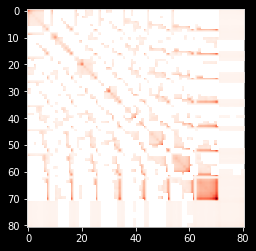

In [264]:
plt.imshow(np.sqrt(np.cov(qm9_iter.reshape(-1,81).T)),cmap="Reds")

In [262]:
np.cov(qm9_iter.reshape(-1,81).T)

array([[207.71132, 53.68306, 31.93664, ..., 0.27703, 0.58133, 1.07610],
       [53.68306, 27.09383, 7.80922, ..., 0.13322, 0.27779, 0.51505],
       [31.93664, 7.80922, 11.79952, ..., 0.03763, 0.07454, 0.13652],
       ...,
       [0.27703, 0.13322, 0.03763, ..., 0.27855, 0.59344, 1.08183],
       [0.58133, 0.27779, 0.07454, ..., 0.59344, 1.32878, 2.43146],
       [1.07610, 0.51505, 0.13652, ..., 1.08183, 2.43146, 4.45615]])

In [446]:
#help(explainer)

In [359]:
np.argmin(qm9_df["HOMO-LUMO Gap"].iloc[:1000])

325

In [272]:
explainer   = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_train[:1000])

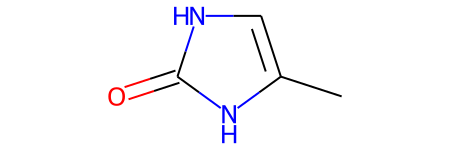

In [1252]:
Chem.MolFromSmiles(qm9_df.iloc[881]["SMILES"])

In [284]:
xmin, xmax = np.min(shap_values), np.max(shap_values)

In [340]:
np.mean(Y_train)

0.2557843125

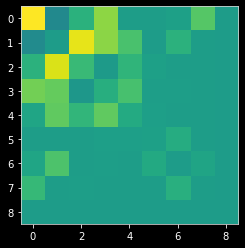

In [355]:
plt.imshow(shap_values[183].reshape(9,9),vmin=xmin,vmax=xmax)

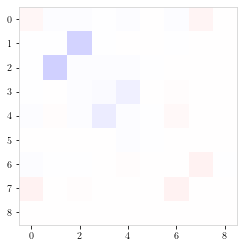

In [1258]:
plt.imshow(shap_values[882].reshape(9,9),vmin=-0.05,vmax=0.05,cmap=plt.cm.bwr)

In [1256]:
hold = np.array(qm9[882].parsed_xyz.coords)[:,:3]
hold

array([[0.068, 1.483, 0.033],
       [-0.082, 0.009, 0.007],
       [-1.118, -0.811, -0.215],
       [-0.628, -2.115, -0.103],
       [0.715, -2.094, 0.188],
       [1.486, -2.998, 0.359],
       [1.049, -0.750, 0.255]])

In [1259]:
qm9_df.iloc[882]

SMILES                          CC1=CNC(=O)O1
Canonical SMILES              Cc1c[nH]c(=O)o1
Rotational Constant A                 6.80041
Rotational Constant B                 2.23383
Rotational Constant C                 1.69925
Dipole Moment                          4.7534
Isotropic Polarizability                52.51
Energy of HOMO                        -0.2119
Energy of LUMO                         0.0277
HOMO-LUMO Gap                          0.2397
Electronic Spatial Extent            692.3648
ZPVE                                 0.090742
Internal Energy at 0K             -360.576433
Internal Energy at 298.15K         -360.57016
Enthalpy at 298.15K               -360.569216
Free Energy at 298.15K            -360.606411
Heat Capacity at 298.15K               22.713
Name: 882, dtype: object

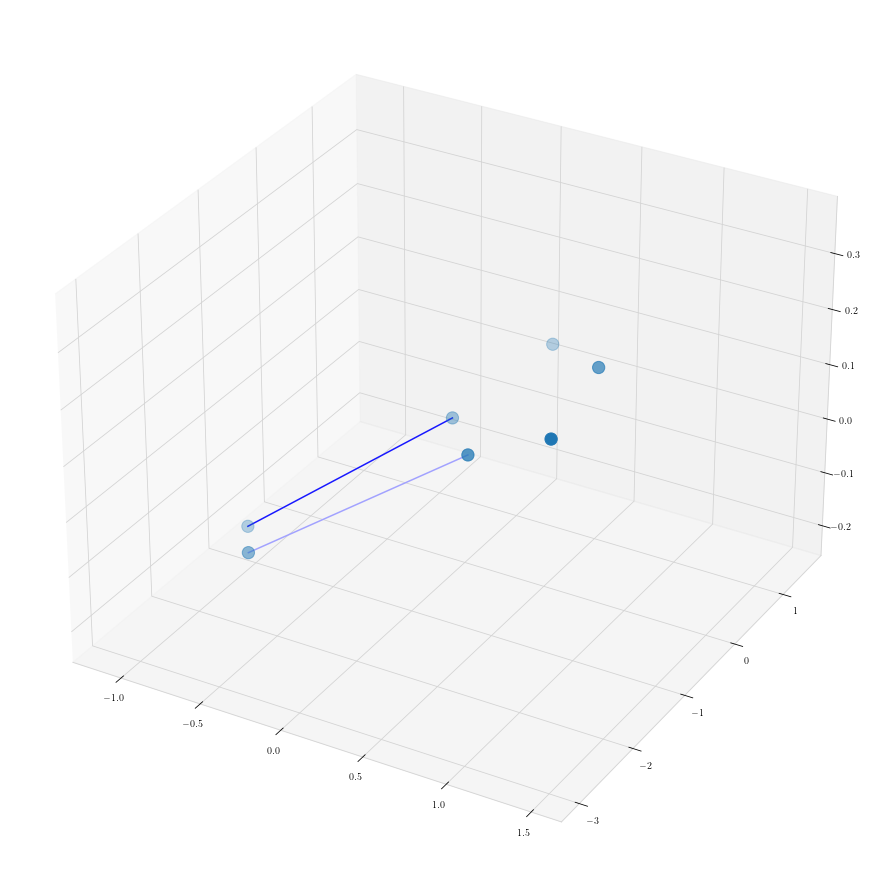

In [1257]:
Shap_G = nx.from_numpy_matrix(shap_values[882].reshape(9,9)[:7,:7])

edges = Shap_G.edges()
colors = [plt.cm.bwr(0.5 + Shap_G[u][v]["weight"]*50) if np.abs(Shap_G[u][v]["weight"]) > 0.001 else (0,0,0,0) for u,v in edges]

fig = plt.figure(figsize=(16,16))
ax = fig.add_subplot(projection='3d')
ax.scatter(*hold.T,s=150)
for x,y in edges:
    ax.plot(*np.array([hold[x],hold[y]]).T,color=plt.cm.bwr(0.5 + Shap_G[x][y]["weight"]*50) if np.abs(Shap_G[x][y]["weight"]) > 0.001 else (0,0,0,0))

In [1234]:
shap_values[183]

IndexError: too many indices for array

In [1236]:
Shap_G = nx.from_numpy_matrix(shap_values[183].reshape(9,9)[:5,:5])

edges = Shap_G.edges()
colors = [plt.cm.bwr(0.5 + Shap_G[u][v]["weight"]*50) if np.abs(Shap_G[u][v]["weight"]) > 0.001 else (0,0,0,0) for u,v in edges]

In [1237]:
edges

EdgeView([(0, 0), (0, 1), (0, 2), (0, 3), (0, 4), (1, 1), (1, 2), (1, 3), (1, 4), (2, 2), (2, 3), (2, 4), (3, 3), (3, 4), (4, 4)])

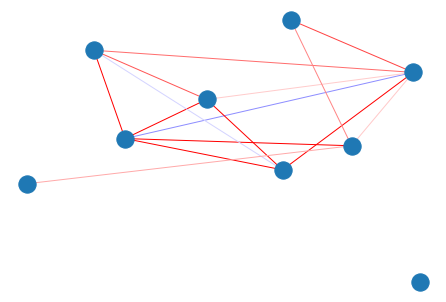

In [1142]:
nx.draw(Shap_G,edge_color=colors)

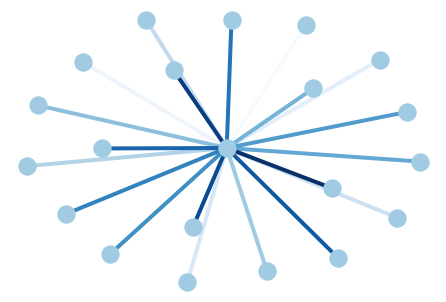

In [1039]:
import matplotlib.pyplot as plt
import networkx as nx

G = nx.star_graph(20)
pos = nx.spring_layout(G)
colors = range(20)
options = {
    "node_color": "#A0CBE2",
    "edge_color": colors,
    "width": 4,
    "edge_cmap": plt.cm.Blues,
    "with_labels": False,
}
nx.draw(G, pos, **options)
plt.show()

In [1044]:
G[0][3]

{}

In [356]:
qm9_df.iloc[183]

SMILES                         FC(F)(F)F
Canonical SMILES               FC(F)(F)F
Rotational Constant A            5.71326
Rotational Constant B            5.71279
Rotational Constant C            5.71267
Dipole Moment                     0.0003
Isotropic Polarizability           15.93
Energy of HOMO                   -0.4286
Energy of LUMO                    0.1935
HOMO-LUMO Gap                     0.6221
Electronic Spatial Extent       279.3208
ZPVE                            0.017147
Internal Energy at 0K        -437.484875
Internal Energy at 298.15K   -437.480956
Enthalpy at 298.15K          -437.480011
Free Energy at 298.15K       -437.512059
Heat Capacity at 298.15K          12.639
Name: 183, dtype: object

In [222]:
set_numpy_decimal_places(5)


In [251]:
shap_values[0].reshape(9,9)

array([[-0.00798, 0.00068, 0.00170, -0.00045, -0.00082, 0.00005,
        -0.00012, 0.00203, 0.00000],
       [0.00024, -0.00015, -0.00741, -0.00086, -0.00085, -0.00003,
        -0.00062, 0.00020, 0.00000],
       [0.00214, -0.00784, -0.00038, -0.00075, -0.00104, -0.00022,
        -0.00009, 0.00025, 0.00000],
       [-0.00027, -0.00118, -0.00063, 0.00014, -0.00778, -0.00031,
        -0.00013, 0.00015, 0.00000],
       [-0.00051, -0.00139, -0.00128, -0.00863, -0.00068, -0.00122,
        -0.00027, 0.00004, 0.00000],
       [0.00014, 0.00013, -0.00017, -0.00026, -0.00123, 0.00007,
        -0.00063, 0.00014, 0.00000],
       [-0.00024, -0.00064, -0.00003, -0.00011, -0.00006, -0.00042,
        -0.00008, 0.00180, -0.00000],
       [0.00173, 0.00039, 0.00035, 0.00035, -0.00001, 0.00012, 0.00182,
        0.00006, 0.00000],
       [0.00000, 0.00000, 0.00000, -0.00000, 0.00000, 0.00000, 0.00000,
        0.00000, 0.00000]])

In [331]:
qm9[450].parsed_xyz.atom_types

['O', 'C', 'C', 'C', 'O', 'C']

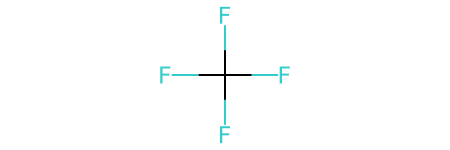

In [357]:
from rdkit import Chem
mol = Chem.MolFromSmiles(qm9_df.iloc[183]["SMILES"])
mol

In [236]:
qm9_df.iloc[1007]

SMILES                        C#CC1=CN=CO1
Canonical SMILES                C#Cc1cnco1
Rotational Constant A              9.85901
Rotational Constant B              2.01037
Rotational Constant C              1.66986
Dipole Moment                       1.2645
Isotropic Polarizability              58.6
Energy of HOMO                      -0.238
Energy of LUMO                      -0.035
HOMO-LUMO Gap                        0.203
Electronic Spatial Extent          673.579
ZPVE                              0.067576
Internal Energy at 0K          -322.172641
Internal Energy at 298.15K     -322.167108
Enthalpy at 298.15K            -322.166164
Free Energy at 298.15K         -322.201892
Heat Capacity at 298.15K            20.117
Name: 1007, dtype: object

In [1397]:
sim = qm9_iter[:5000]


In [1398]:
sim = sim.reshape(-1,81)


In [1399]:
from scipy.spatial.distance import cdist
cov = cdist(sim,sim)

In [1791]:
rbf_cov = -np.exp(-cov/100)
np.fill_diagonal(rbf_cov,0)
#rbf_cov[np.where(np.abs(rbf_cov) < 0.5)] = 0 
#rbf_cov[np.where(np.abs(rbf_cov) > 0.5)] = -1

diags = np.sum(rbf_cov,axis=1)
np.fill_diagonal(rbf_cov,-diags)

In [1795]:
np.sum(np.sum(rbf_cov,axis=0))

-3.05195077543452e-10

In [1764]:
eivals, eivecs = np.linalg.eig(rbf_cov)
signal = np.ones(eivals.shape)
#signal = np.arange(1000)
#signal = np.random.randn(eivals.shape[0])
#signal = np.array([])
#signal = diags

In [134]:
from dscribe.descriptors import SOAP
from dscribe.kernels import REMatchKernel
from ase.build import molecule
from sklearn.preprocessing import normalize
from dscribe.descriptors import SOAP

species = ["H", "C", "O", "N","F","B","Cl","P","S"]
rcut = 6.0
nmax = 8
lmax = 6

# Setting up the SOAP descriptor
soap = SOAP(
    species=species,
    periodic=False,
    rcut=rcut,
    nmax=nmax,
    lmax=lmax,
)

average_soap = SOAP(
    species=species,
    rcut=rcut,
    nmax=nmax,
    lmax=lmax,
    average="inner",
    sparse=False
)

In [137]:
complexes[0]

'c4mim-ac-2-p2.xyz'

In [135]:
df_small

,complex,dINT_BLYP_ref_cp,dINT_B3LYP_ref_cp,dINT_ref_cp,dINT_PBE_ref_cp,Dataset
0,c4mim-ac-2-p2,NaN,-43.600000,20.267909,-18.044256,2IPs
1,c4mim-ac-2-p4,NaN,-49.800000,10.850084,-27.240597,2IPs
2,c4mim-ac-2-p7,NaN,-58.800000,20.934319,-30.089175,2IPs
3,c4mim-ac-3-p4,NaN,-119.900000,13.806976,-91.104089,2IPs
4,c4mim-ac-4-p2,NaN,-87.500000,9.343976,-82.055240,2IPs
...,...,...,...,...,...,...
1008,UREAXX02/trimer660,NaN,-4.308160,NaN,-3.408160,X23
1009,UREAXX02/trimer673,NaN,-2.573865,NaN,-1.273865,X23
1010,UREAXX02/trimer75,NaN,-8.610927,NaN,-4.710927,X23
1011,UREAXX02/trimer84,NaN,-8.610927,NaN,-4.710927,X23


In [136]:
complexes = ["/".join(mol.split('/')[2:]) for mol in mols]

In [208]:
".".join(complexes[157].split('.')[:-1])

'c2mpyr-cl-2.1'

In [204]:
df_small.iloc[[151,157]]

,complex,dINT_BLYP_ref_cp,dINT_B3LYP_ref_cp,dINT_ref_cp,dINT_PBE_ref_cp,Dataset
20,c2mim-cl-p9.1,20.5,NaN,14.492525,-30.8,IL85
26,c2mpyr-cl-2.1,41.3,NaN,4.967751,-34.3,IL85


In [211]:
len(df_small[df_small["complex"] == ".".join(complexes[157].split('.')[:-1])])

1

In [212]:
for i,cmplex in enumerate(complexes):
    if len(df_small[df_small["complex"] == ".".join(complexes[157].split('.')[:-1])]) == 1:
        pass
    else:
        print(f"{cmplex} ({i}) seems to be missing")

In [270]:
files = folders = 0

for _, dirnames, filenames in os.walk('xyz'):
  # ^ this idiom means "we won't be using this value"
    files += len(filenames)
    folders += len(dirnames)

print("{:,} files, {:,} folders".format(files, folders))

15,675 files, 561 folders


In [187]:
ignores = ['xyz/IL85/c3mim-cl-p10.xyz',"xyz/IL85/c4mim-bf4-p9.1.xyz","xyz/IL85/c4mim-bf4-p9.2.xyz",
           'xyz/IL85/c4mim-cl-p2.1.xyz','xyz/4IPs/c2pyr-bf4.xyz','xyz/4IPs/c2pyr-cl.xyz']

"""
IL85
I don't have any of 
'xyz/IL85/c3mim-cl-p10.xyz'
"xyz/IL85/c4mim-bf4-p9.1.xyz"
"xyz/IL85/c4mim-bf4-p9.2.xyz",
'xyz/IL85/c4mim-cl-p2.1.xyz'
"""

"""
4IPs 
c2pyr-cl  : I have pyr-cl
c2pyr-bf4 : I have pyr-bf4 
"""

In [276]:
from ase.io import read

mols_soap = {"/".join(xyz.split('/')[2:]) : read(xyz) for xyz in mols}

In [277]:
idxs = []

for mol in mols_soap.keys():
    if len(df_small[df_small["complex"] == ".".join(mol.split('.')[:-1])]) == 1:
        idxs.append(df_small[df_small["complex"] == ".".join(mol.split('.')[:-1])].index[0])
    else:
        print(f"{cmplex} ({i}) seems to be missing")

In [278]:
df1 = df_small[df_small.isna().any(axis=1)]

In [279]:
df.iloc[854]

complex           PYRZOL05/trimer1550
E_cluster_x               -678.670423
E_cp_anion1_x                     NaN
E_cp_anion2_x                     NaN
E_cp_cation1_x                    NaN
                         ...         
E_PBE_cluster              -677.83376
E_PBE_cp_frag1            -225.944594
E_PBE_cp_frag2            -225.944511
E_PBE_cp_frag3             -225.94451
INT_PBE_cp                       -0.4
Name: 576, Length: 87, dtype: object

In [261]:
np.argmax(df1["dINT_B3LYP_ref_cp"])

854

In [84]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from sklearn.gaussian_process.kernels import ExpSineSquared, RBF, WhiteKernel, DotProduct

kernel2 = RBF(10)

from dscribe.descriptors import CoulombMatrix

atomic_numbers = species
rcut = 6.0
nmax = 8
lmax = 6

# Setting up the CM descriptor
cm = CoulombMatrix(
    n_atoms_max=6,
)

In [72]:
mols = [f"xyz/{item['Dataset']}/{item['complex']}.xyz"for i,item in df_small.iterrows()]
#mols += [f"xyz/X23/{item}_cluster.xyz" for item in blyp["X23"]["complex"]] # Add X23 mol information in
#mols += [f"{mol}" for mol in [f"xyz/4IPs/{mol}" for mol in os.listdir("xyz/4IPs") if mol.endswith('.xyz')]]
# Only take the cluster xyz files for 4IPs
# It is the 3 dINT columns that I need for the other parts
mols_soap = [read(xyz,format="xyz") for xyz in mols]

soap_mols = [soap.create(mol) for mol in tqdm.tqdm(mols_soap)]
soap_mols

100%|██████████| 266/266 [00:04<00:00, 62.83it/s]


[array([[0.000, 0.004, 0.005, ..., 0.000, 0.000, 0.000],
        [0.013, 0.070, 0.146, ..., 0.000, 0.000, 0.000],
        [0.002, 0.005, 0.025, ..., 0.000, 0.000, 0.000],
        ...,
        [0.015, 0.083, 0.215, ..., 0.000, 0.000, 0.000],
        [0.015, 0.081, 0.189, ..., 0.000, 0.000, 0.000],
        [0.015, 0.080, 0.187, ..., 0.000, 0.000, 0.000]], dtype=float32),
 array([[0.001, 0.004, 0.007, ..., 0.000, 0.000, 0.000],
        [0.014, 0.070, 0.154, ..., 0.000, 0.000, 0.000],
        [0.002, 0.005, 0.020, ..., 0.000, 0.000, 0.000],
        ...,
        [0.014, 0.080, 0.194, ..., 0.000, 0.000, 0.000],
        [0.014, 0.078, 0.165, ..., 0.000, 0.000, 0.000],
        [0.013, 0.071, 0.157, ..., 0.000, 0.000, 0.000]], dtype=float32),
 array([[0.000, 0.003, 0.003, ..., 0.000, 0.000, 0.000],
        [0.013, 0.069, 0.145, ..., 0.000, 0.000, 0.000],
        [0.002, 0.007, 0.033, ..., 0.000, 0.000, 0.000],
        ...,
        [0.015, 0.083, 0.214, ..., 0.000, 0.000, 0.000],
        [0.015,

In [73]:
mol_features = [normalize(soap_mol) for soap_mol in tqdm.tqdm(soap_mols)]

# Any metric supported by scikit-learn will work: e.g. a Gaussian.
re = REMatchKernel(metric="rbf", gamma=1, alpha=1, threshold=1e-6)
re_kernel = re.create(mol_features)

re_kernel

100%|██████████| 266/266 [00:01<00:00, 203.46it/s]


NameError: name 'd' is not defined

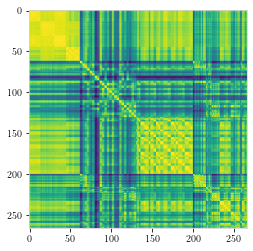

In [75]:
plt.imshow(re_kernel)

In [81]:
df_small.iloc[np.argsort(np.sum(re_kernel,axis=1))[:50]]

,complex,avg_iso,dINT_MP2_ref_cp,dINT_BLYP_ref_cp,Dataset
18,07a_oxalic_acid,39.638000,-10.337809,-42.0,3B69
20,07c_oxalic_acid,39.680000,-8.409015,-26.6,3B69
19,07b_oxalic_acid,39.680000,-7.867444,-24.9,3B69
0,01_Water-Water,9.230590,-1.915070,-3.7,S66
2,01c_water,9.367000,-3.877470,-8.6,3B69
21,08a_vinylene_carbonate,42.706000,-5.600131,-24.4,3B69
23,08c_vinylene_carbonate,42.706000,-6.817547,-32.8,3B69
0,01a_water,9.585000,-4.117059,-7.7,3B69
22,08b_vinylene_carbonate,42.706000,-4.907367,-34.0,3B69
1,01b_water,9.587000,-7.270773,-12.1,3B69


In [99]:
laplacian = np.copy(re_kernel)
np.fill_diagonal(laplacian,0)
#diagonals = np.sum(laplacian,axis=0)
#laplacian *= -1 
#np.fill_diagonal(laplacian,diagonals)


In [ ]:
plt.imshow(laplacian)

In [101]:
print(colors)
print(legend_index)

{0: 'orange', 1: 'blue', 2: 'green', 3: 'purple'}
{'2IPs': 0, '3B69': 1, 'IL85': 2, 'S66': 3}


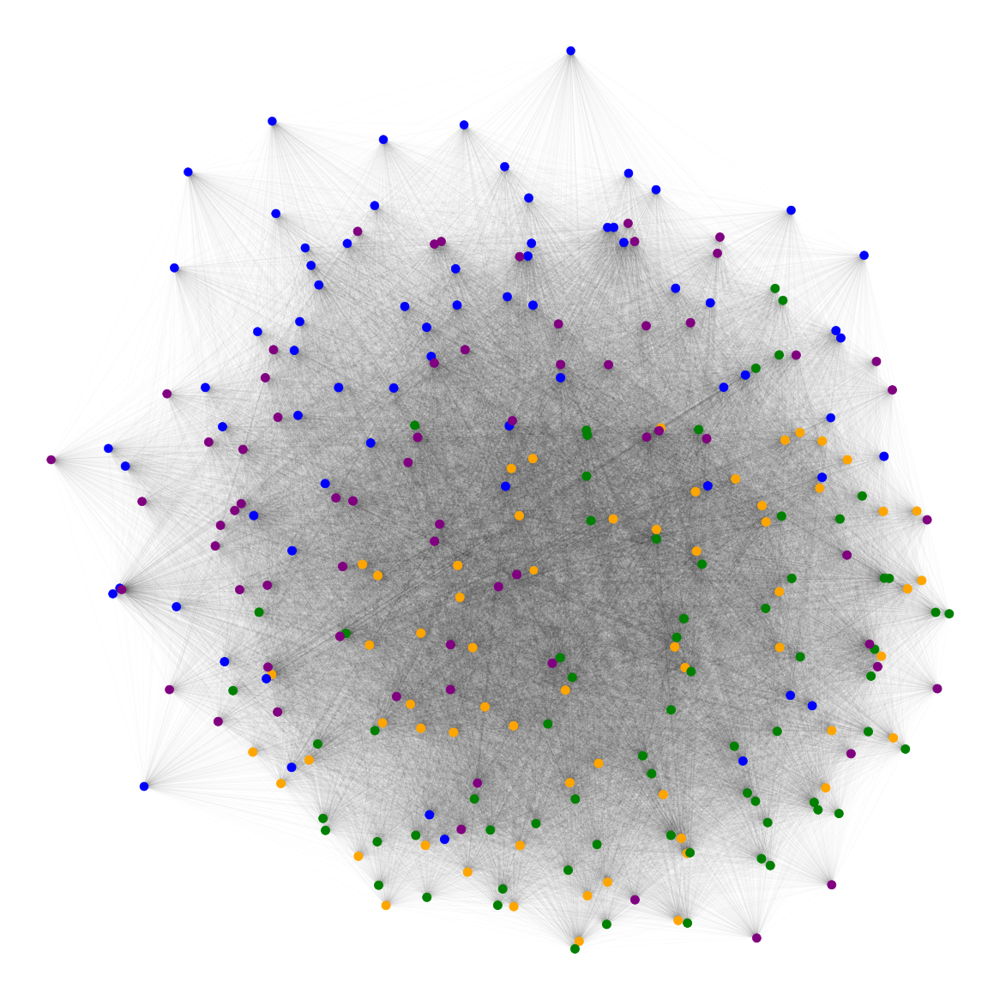

In [104]:
G = nx.from_numpy_matrix(laplacian)
graph_colors = [colors[legend_index[dset]] for dset in df_small["Dataset"]]
#pos = nx.circular_layout(G)
#pos = nx.spectral_layout(G)
pos = nx.spring_layout(G)

fig = plt.figure(figsize=(16,16))
nx.draw(G,edge_color=(0,0,0,0.01),pos=pos,linewidths=laplacian.flatten(),node_color=graph_colors,node_size=100)
plt.savefig("Images/SpringLayoutGraph_REMatch.png",transparent=True,dpi=100,bbox_inches="tight")

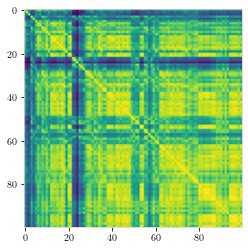

In [1551]:
re_kernel = re.create(mol_features[:100])

In [18]:
a = np.array([1,0,0])
b = np.array([0,1,0])
c = np.array([0,0,1])

f = np.array([3,2,5])
g = 3 * a  + 2 * b + 5 * c
h = np.array([0,0,8])
i = 0 * a + 0 * b + 8 * c

array([3, 2, 5])

In [3]:
linear = np.zeros((500,500))
for i in range(499):
    linear[i,i+1] = -1
    linear[i,i]   = 2
    linear[i,i-1] = -1
    
linear[499,0] = -1
linear[0,499] = -1
linear[499,498] = -1

signal = np.ones(500)

linvals, linvecs = np.linalg.eig(linear)


In [4]:
spec = linvecs.T @ signal
np.where(np.isclose(spec,0))

(array([  1,   3,   5,   8,  10,  12,  14,  16,  18,  20,  22,  24,  26,
         28,  30,  32,  33,  35,  37,  39,  42,  44,  45,  48,  49,  52,
         54,  56,  58,  60,  62,  64,  66,  68,  70,  72,  75,  77,  81,
         83,  85,  87,  88,  90,  91,  94,  96,  98, 100, 102, 104, 106,
        108, 109, 111, 113, 115, 118, 120, 122, 123, 125, 126, 129, 130,
        132, 134, 136, 138, 142, 143, 144, 147, 149, 152, 154, 156, 158,
        159, 162, 163, 165, 167, 169, 171, 172, 173, 175, 177, 180, 181,
        183, 186, 188, 191, 192, 194, 196, 197, 198, 202, 203, 206, 208,
        209, 212, 214, 215, 217, 219, 222, 223, 224, 226, 227, 230, 233,
        236, 238, 239, 242, 245, 246, 248, 250, 252, 253, 255, 256, 257,
        259, 262, 264, 265, 269, 272, 274, 276, 278, 280, 281, 284, 286,
        287, 289, 291, 294, 296, 297, 299, 301, 302, 305, 306, 307, 309,
        311, 313, 315, 317, 319, 321, 323, 325, 326, 329, 331, 333, 334,
        337, 339, 341, 342, 344, 347, 348, 351, 353

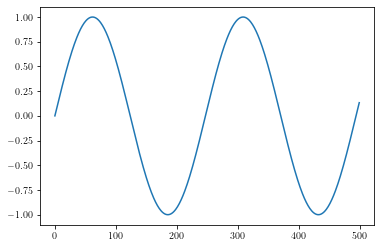

In [5]:
signal = np.sin(np.linspace(0,12.7,500))
#signal = np.ones(500)
#signal = np.random.randn(500)
plt.plot(signal)

In [6]:
spec = linvecs.T @ signal
signal_rec = linvecs @ spec
np.all(np.isclose(signal_rec, signal,rtol=1e-08))

True

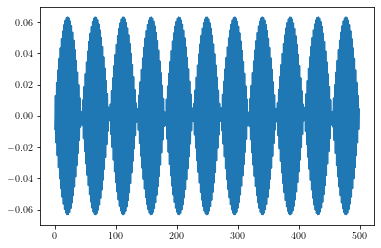

In [39]:
plt.plot(range(500),linvecs.T[17])

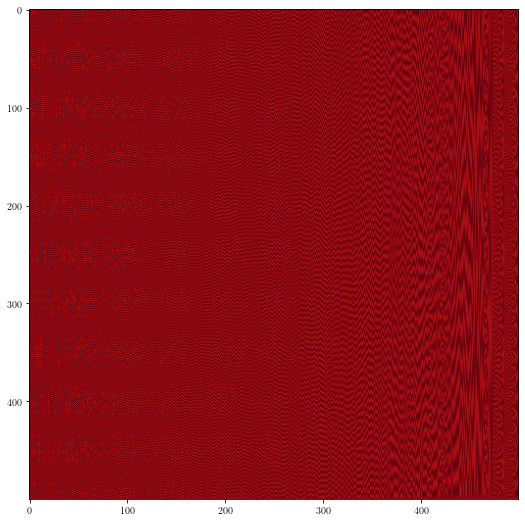

In [20]:
fig = plt.figure(figsize=(16,9))
plt.imshow(linvecs,cmap="Reds")

In [7]:
signal_rec = linvecs @ spec


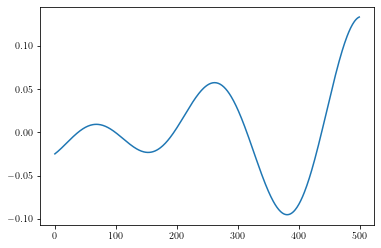

In [10]:
plt.plot(signal - eff_sig)

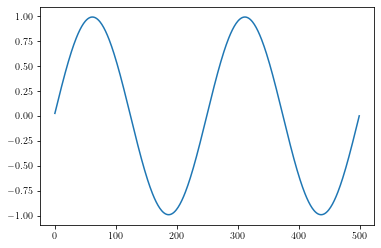

In [9]:
eff_sig = linvecs.T[455] * spec[455]
plt.plot(eff_sig)

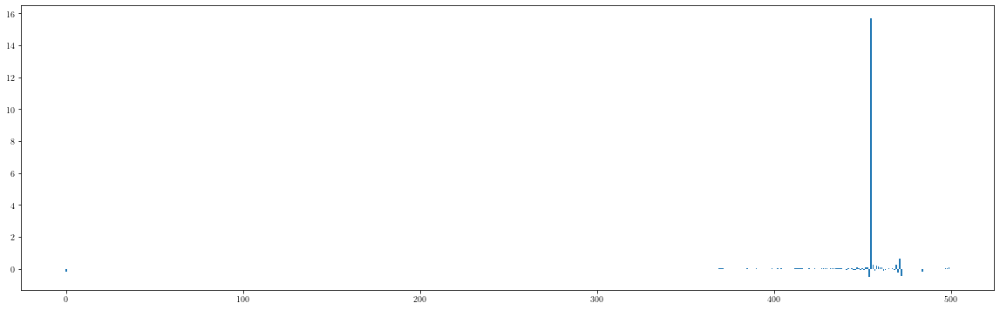

In [11]:
spec = linvecs.T @ signal
signal_rec = linvecs @ spec

fig = plt.figure(figsize=(20,6))
plt.bar(np.arange(len(spec)),height=spec)
plt.show()

In [1552]:
# Before passing the features we normalize them. Depending on the metric, the
# REMatch kernel can become numerically unstable if some kind of normalization
# is not done.
mol_features = [normalize(soap_mol) for soap_mol in tqdm.tqdm(soap_mols)]

# Any metric supported by scikit-learn will work: e.g. a Gaussian.
re = REMatchKernel(metric="rbf", gamma=1, alpha=1, threshold=1e-6)
re_kernel = re.create(mol_features)

re_kernel


100%|██████████| 5000/5000 [00:02<00:00, 1871.69it/s]


KeyboardInterrupt: 

In [74]:
from dscribe.descriptors import SOAP
from dscribe.kernels import REMatchKernel
from ase.build import molecule
from sklearn.preprocessing import normalize

In [1489]:
from sklearn import linear_model
clf = linear_model.Lasso(alpha=0.1)
clf.fit(sim, [0, 1, 2])

Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0


Lasso(alpha=0.1)

In [1648]:
qm9_df

,SMILES,Canonical SMILES,Rotational Constant A,Rotational Constant B,Rotational Constant C,Dipole Moment,Isotropic Polarizability,Energy of HOMO,Energy of LUMO,HOMO-LUMO Gap,Electronic Spatial Extent,ZPVE,Internal Energy at 0K,Internal Energy at 298.15K,Enthalpy at 298.15K,Free Energy at 298.15K,Heat Capacity at 298.15K
0,C,C,157.71180,157.709970,157.706990,0.0000,13.21,-0.3877,0.1171,0.5048,35.3641,0.044749,-40.478930,-40.476062,-40.475117,-40.498597,6.469
1,N,N,293.60975,293.541110,191.393970,1.6256,9.46,-0.2570,0.0829,0.3399,26.1563,0.034358,-56.525887,-56.523026,-56.522082,-56.544961,6.316
2,O,O,799.58812,437.903860,282.945450,1.8511,6.31,-0.2928,0.0687,0.3615,19.0002,0.021375,-76.404702,-76.401867,-76.400922,-76.422349,6.002
3,C#C,C#C,0.00000,35.610036,35.610036,0.0000,16.28,-0.2845,0.0506,0.3351,59.5248,0.026841,-77.308427,-77.305527,-77.304583,-77.327429,8.574
4,C#N,C#N,0.00000,44.593883,44.593883,2.8937,12.99,-0.3604,0.0191,0.3796,48.7476,0.016601,-93.411888,-93.409370,-93.408425,-93.431246,6.278
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133880,C1C2C3C4C5OC14C5N23,C1[C@@H]2[C@@H]3[C@H]4[C@@H]5O[C@]14[C@@H]5N23,3.59483,2.198990,1.904230,1.6637,69.37,-0.2254,0.0588,0.2842,760.7472,0.127406,-400.633868,-400.628599,-400.627654,-400.663098,23.658
133881,C1N2C3C2C2C4OC12C34,C1N2[C@H]3[C@@H]2[C@@H]2[C@H]4O[C@@]12[C@@H]34,3.65648,2.142370,1.904390,1.2976,69.52,-0.2393,0.0608,0.3002,762.6354,0.127495,-400.629713,-400.624444,-400.623500,-400.658942,23.697
133882,C1N2C3C4C5C2C13CN45,C1N2[C@@H]3[C@@H]4[C@@H]5[C@H]2[C@]13CN45,3.67118,2.143140,1.895010,1.2480,73.60,-0.2233,0.0720,0.2953,780.3553,0.140458,-380.753918,-380.748619,-380.747675,-380.783148,23.972
133883,C1N2C3C4C5CC13C2C45,C1N2[C@H]3[C@@H]4[C@@H]5C[C@]13[C@H]2[C@H]45,3.52845,2.151310,1.865820,1.9576,77.40,-0.2122,0.0881,0.3003,803.1904,0.152222,-364.720374,-364.714974,-364.714030,-364.749650,24.796


In [1949]:
random_mols = np.array([np.random.randn((81))*10 for mol in range(5000)])
random_mols

array([[1.752, -12.798, 14.636, ..., -5.990, 3.973, 12.032],
       [1.008, 15.240, -5.134, ..., -4.863, -3.247, -19.422],
       [-0.472, 12.699, 5.426, ..., -3.402, 8.166, 10.879],
       ...,
       [-11.755, -2.117, 16.503, ..., -2.201, -2.776, 9.459],
       [-13.297, -14.772, -0.933, ..., 1.167, -8.596, 9.452],
       [-15.636, 12.774, -14.088, ..., -1.897, 3.094, 0.466]])

In [1950]:
cov = cdist(random_mols,random_mols)

rbf_cov = -np.exp(-cov/100)
np.fill_diagonal(rbf_cov,0)
#rbf_cov[np.where(np.abs(rbf_cov) < 0.5)] = 0 
#rbf_cov[np.where(np.abs(rbf_cov) > 0.5)] = -1

diags = np.sum(rbf_cov,axis=1)
np.fill_diagonal(rbf_cov,-diags)

In [1951]:
rbf_cov

array([[1415.524, -0.280, -0.288, ..., -0.277, -0.292, -0.290],
       [-0.280, 1444.581, -0.292, ..., -0.251, -0.276, -0.318],
       [-0.288, -0.292, 1484.392, ..., -0.328, -0.271, -0.276],
       ...,
       [-0.277, -0.251, -0.328, ..., 1416.689, -0.264, -0.290],
       [-0.292, -0.276, -0.271, ..., -0.264, 1345.035, -0.251],
       [-0.290, -0.318, -0.276, ..., -0.290, -0.251, 1434.760]])

In [1952]:
eivals, eivecs = np.linalg.eig(rbf_cov)

In [1953]:
#signal = np.ones(eivals.shape)
#signal = np.arange(5000)
#signal = np.random.randn(eivals.shape[0])
#signal = np.array([])
#signal = diags
signal = qm9_df.iloc[:eivecs.shape[0]]["Isotropic Polarizability"].to_numpy()
#signal = np.sin(np.linspace(0,12,5000))

In [1954]:
spec = eivecs.T @ signal
signal_rec = eivecs @ spec
np.all(np.isclose(signal_rec, signal, rtol=1e-08))

True

In [1955]:
signal_rec

array([13.210, 9.460, 6.310, ..., 62.710, 68.250, 69.260])

In [1956]:
signal

array([13.210, 9.460, 6.310, ..., 62.710, 68.250, 69.260])

In [1957]:
np.where(np.isclose(spec,0, rtol=1e-3))

(array([], dtype=int64),)

In [1958]:
np.where(np.invert(np.isclose(spec,0, rtol=1e-8)))

(array([   0,    1,    2, ..., 4997, 4998, 4999]),)

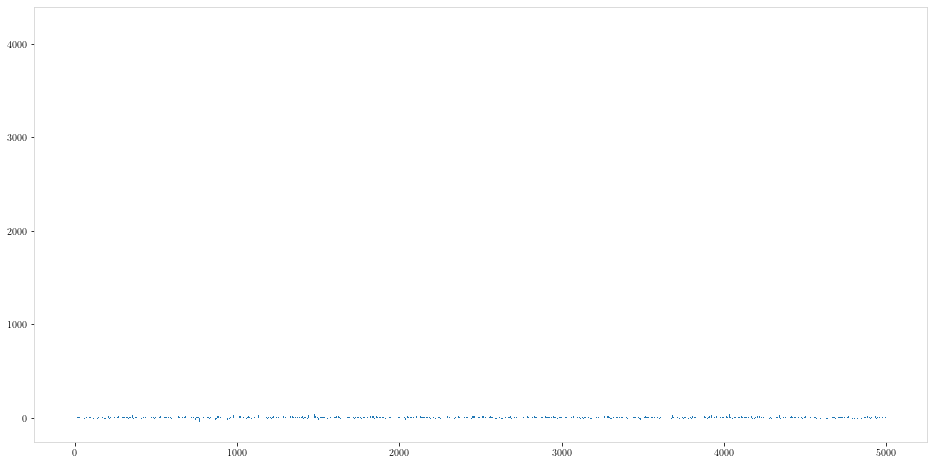

In [1959]:
fig = plt.figure(figsize=(16,8))
plt.bar(np.arange(len(spec)),height=spec)
plt.show()

In [ ]:
mol = MolMat("xyz/3B69/06c_acetic_acid.xyz",include_hydrogen=True)

axis = [0,0,1]
theta = 100

xyz = np.vstack(mol.parsed_xyz.coords)
xyz = np.vstack([np.dot(rotation_matrix(axis,theta),coord) for coord in xyz])
adj = mol.adjacency
atom_types = mol.parsed_xyz.atom_types
# The graph to visualize
G = nx.from_numpy_matrix(adj)

# 3d spring layout
#pos = nx.spring_layout(G, dim=3)
pos = {x : y for x,y in zip(range(len(xyz)),xyz)}
# Extract node and edge positions from the layout

node_xyz = np.array([pos[v] for v in sorted(G)])
edge_xyz = np.array([(pos[u], pos[v]) for u, v in G.edges()])

# Create the 3D figure
fig = plt.figure(figsize=(16,16))
ax = fig.add_subplot(111, projection="3d")

# Plot the nodes - alpha is scaled by "depth" automatically
colours = [atom_properties[x]["Colour"] for x in atom_types]
ax.scatter(*node_xyz.T, s=200, ec="w",color=colours,depthshade=False)

ax.set_xlabel('X',color="#FFFFFF",size=30)
ax.set_ylabel('Y',color="#FFFFFF",size=30)
ax.set_zlabel('Z',color="#FFFFFF",size=30)

ax.set_facecolor('#000000')
ax.xaxis.pane.set_edgecolor('#000000')
ax.yaxis.pane.set_edgecolor('#000000')
ax.zaxis.pane.set_edgecolor('#000000')
ax.xaxis.pane.set_facecolor('#000000')
ax.yaxis.pane.set_facecolor('#000000')
ax.zaxis.pane.set_facecolor('#000000')
ax.set_xlim3d(xmin,15)
ax.set_ylim3d(ymin,ymax)
ax.set_zlim3d(zmin,zmax)

for axis in [ax.xaxis._axinfo,ax.yaxis._axinfo,ax.zaxis._axinfo]:
    axis["grid"].update({"linewidth":1, "color" : '#7a827b','linestyle' : (0, (1,2.5))})

for axis in [ax.w_xaxis, ax.w_yaxis, ax.w_zaxis]:
    axis.line.set_color('#000000')

elev = 25
azim = 30
plt.gca().view_init(elev, azim)

# Plot the edges
for vizedge in edge_xyz:
    ax.plot(*vizedge.T, color="tab:gray")

print(vizedge)
    
#plt.savefig("Original_H_2.png",transparent=True,dpi=400,bbox_inches="tight")

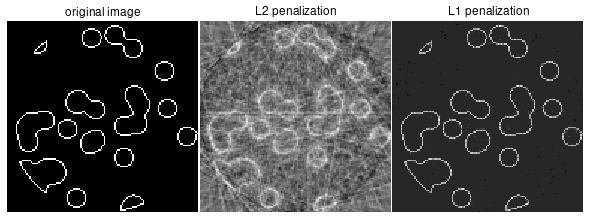

In [950]:
import numpy as np
from scipy import sparse
from scipy import ndimage
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
import matplotlib.pyplot as plt


def _weights(x, dx=1, orig=0):
    x = np.ravel(x)
    floor_x = np.floor((x - orig) / dx).astype(np.int64)
    alpha = (x - orig - floor_x * dx) / dx
    return np.hstack((floor_x, floor_x + 1)), np.hstack((1 - alpha, alpha))


def _generate_center_coordinates(l_x):
    X, Y = np.mgrid[:l_x, :l_x].astype(np.float64)
    center = l_x / 2.
    X += 0.5 - center
    Y += 0.5 - center
    return X, Y


def build_projection_operator(l_x, n_dir):
    """ Compute the tomography design matrix.

    Parameters
    ----------

    l_x : int
        linear size of image array

    n_dir : int
        number of angles at which projections are acquired.

    Returns
    -------
    p : sparse matrix of shape (n_dir l_x, l_x**2)
    """
    X, Y = _generate_center_coordinates(l_x)
    angles = np.linspace(0, np.pi, n_dir, endpoint=False)
    data_inds, weights, camera_inds = [], [], []
    data_unravel_indices = np.arange(l_x ** 2)
    data_unravel_indices = np.hstack((data_unravel_indices,
                                      data_unravel_indices))
    for i, angle in enumerate(angles):
        Xrot = np.cos(angle) * X - np.sin(angle) * Y
        inds, w = _weights(Xrot, dx=1, orig=X.min())
        mask = np.logical_and(inds >= 0, inds < l_x)
        weights += list(w[mask])
        camera_inds += list(inds[mask] + i * l_x)
        data_inds += list(data_unravel_indices[mask])
    proj_operator = sparse.coo_matrix((weights, (camera_inds, data_inds)))
    return proj_operator


def generate_synthetic_data():
    """ Synthetic binary data """
    rs = np.random.RandomState(0)
    n_pts = 36
    x, y = np.ogrid[0:l, 0:l]
    mask_outer = (x - l / 2.) ** 2 + (y - l / 2.) ** 2 < (l / 2.) ** 2
    mask = np.zeros((l, l))
    points = l * rs.rand(2, n_pts)
    mask[(points[0]).astype(int), (points[1]).astype(int)] = 1
    mask = ndimage.gaussian_filter(mask, sigma=l / n_pts)
    res = np.logical_and(mask > mask.mean(), mask_outer)
    return np.logical_xor(res, ndimage.binary_erosion(res))


# Generate synthetic images, and projections
l = 128
proj_operator = build_projection_operator(l, l // 7)
data = generate_synthetic_data()
proj = proj_operator @ data.ravel()[:, np.newaxis]
proj += 0.15 * np.random.randn(*proj.shape)

# Reconstruction with L2 (Ridge) penalization
rgr_ridge = Ridge(alpha=0.2)
rgr_ridge.fit(proj_operator, proj.ravel())
rec_l2 = rgr_ridge.coef_.reshape(l, l)

# Reconstruction with L1 (Lasso) penalization
# the best value of alpha was determined using cross validation
# with LassoCV
rgr_lasso = Lasso(alpha=0.001)
rgr_lasso.fit(proj_operator, proj.ravel())
rec_l1 = rgr_lasso.coef_.reshape(l, l)

plt.figure(figsize=(8, 3.3))
plt.subplot(131)
plt.imshow(data, cmap=plt.cm.gray, interpolation='nearest')
plt.axis('off')
plt.title('original image')
plt.subplot(132)
plt.imshow(rec_l2, cmap=plt.cm.gray, interpolation='nearest')
plt.title('L2 penalization')
plt.axis('off')
plt.subplot(133)
plt.imshow(rec_l1, cmap=plt.cm.gray, interpolation='nearest')
plt.title('L1 penalization')
plt.axis('off')

plt.subplots_adjust(hspace=0.01, wspace=0.01, top=1, bottom=0, left=0,
                    right=1)

plt.show()